# Dense Channel Aggregation and Reconstruction Network

In [1]:
import numpy as np
import pandas as pd
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # Select the GPU index
import scipy.io
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from collections import namedtuple
import scipy.io as sio
import math
import thop

from PIL import Image
from collections import OrderedDict
import torchvision.transforms as T
import matplotlib.pyplot as plt
import time
from scipy.io import savemat
import dill as pickle
from torch.optim.lr_scheduler import _LRScheduler
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
#Parameters
num_epochs=2500
patience=15
data_dir='../data/' 
scenario='out'
batch_size=200 
workers=5
reduction=4
expansion=10
seed=None
pin_memory=True
schedulertype = 'cosine'
weight_path=f'Experiments/table1/cr{reduction}/{expansion}x_{scenario}/epochs{num_epochs}/'
lr_init = 3e-3
val_freq=10
test_freq=10

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
class PreFetcher:
    r""" Data pre-fetcher to accelerate the data loading
    """

    def __init__(self, loader):
        self.ori_loader = loader
        self.len = len(loader)
        self.stream = torch.cuda.Stream()
        self.next_input = None

    def preload(self):
        try:
            self.next_input = next(self.loader)
        except StopIteration:
            self.next_input = None
            return

        with torch.cuda.stream(self.stream):
            for idx, tensor in enumerate(self.next_input):
                self.next_input[idx] = tensor.cuda(non_blocking=True)

    def __len__(self):
        return self.len

    def __iter__(self):
        self.loader = iter(self.ori_loader)
        self.preload()
        return self

    def __next__(self):
        torch.cuda.current_stream().wait_stream(self.stream)
        input = self.next_input
        if input is None:
            raise StopIteration
        for tensor in input:
            tensor.record_stream(torch.cuda.current_stream())
        self.preload()
        return input


In [5]:


class Cost2100DataLoader(object):
    r""" PyTorch DataLoader for COST2100 dataset.
    """

    def __init__(self, root, batch_size, num_workers, pin_memory, scenario):
        
        assert scenario in {"in", "out"}
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.pin_memory = pin_memory

        dir_train = os.path.join(root, f"DATA_Htrain{scenario}.mat")
        dir_val = os.path.join(root, f"DATA_Hval{scenario}.mat")
        dir_test = os.path.join(root, f"DATA_Htest{scenario}.mat")
        dir_raw = os.path.join(root, f"DATA_HtestF{scenario}_all.mat")
        channel, nt, nc, nc_expand = 2, 32, 32, 125

        # Training data loading
        data_train = sio.loadmat(dir_train)['HT']
        data_train = torch.tensor(data_train, dtype=torch.float32).view(
            data_train.shape[0], channel, nt, nc)
        self.train_dataset = TensorDataset(data_train)

        # Validation data loading
        data_val = sio.loadmat(dir_val)['HT']
        data_val = torch.tensor(data_val, dtype=torch.float32).view(
            data_val.shape[0], channel, nt, nc)
        self.val_dataset = TensorDataset(data_val)

        # Test data loading, including the sparse data and the raw data
        data_test = sio.loadmat(dir_test)['HT']
        data_test = torch.tensor(data_test, dtype=torch.float32).view(
            data_test.shape[0], channel, nt, nc)

        raw_test = sio.loadmat(dir_raw)['HF_all']
        real = torch.tensor(np.real(raw_test), dtype=torch.float32)
        imag = torch.tensor(np.imag(raw_test), dtype=torch.float32)
        raw_test = torch.cat((real.view(raw_test.shape[0], nt, nc_expand, 1),
                              imag.view(raw_test.shape[0], nt, nc_expand, 1)), dim=3)
        self.test_dataset = TensorDataset(data_test, raw_test)

    def __call__(self):
        train_loader = DataLoader(self.train_dataset,
                                  batch_size=self.batch_size,
                                  num_workers=self.num_workers,
                                  pin_memory=self.pin_memory,
                                  shuffle=True)
        val_loader = DataLoader(self.val_dataset,
                                batch_size=self.batch_size,
                                num_workers=self.num_workers,
                                pin_memory=self.pin_memory,
                                shuffle=False)
        test_loader = DataLoader(self.test_dataset,
                                 batch_size=self.batch_size,
                                 num_workers=self.num_workers,
                                 pin_memory=self.pin_memory,
                                 shuffle=False)

        # Accelerate CUDA data loading with pre-fetcher if GPU is used.
        if self.pin_memory is True:
            train_loader = PreFetcher(train_loader)
            val_loader = PreFetcher(val_loader)
            test_loader = PreFetcher(test_loader)

        return train_loader, val_loader, test_loader


In [6]:
# Create the data loader
train_loader, val_loader, test_loader = Cost2100DataLoader(
        root=data_dir,
        batch_size=batch_size,
        num_workers=workers,
        pin_memory=pin_memory,
        scenario=scenario)()

In [7]:
train_iter=iter(train_loader)

In [8]:
x=next(train_iter)

In [9]:
len(x)

1

In [10]:
x[0].shape

torch.Size([200, 2, 32, 32])

In [11]:
len(train_loader)

500

In [12]:
len(test_loader)

100

In [13]:
len(val_loader)

150

In [14]:
def cal_model_parameters(model):
    total_param  = []
    for p1 in model.parameters():
        total_param.append(int(p1.numel()))
    return sum(total_param)

In [15]:
def NMSE_cal(x_hat, x):
    x_real = torch.reshape(torch.real(x), (x.shape[0], -1))
    x_imag = torch.reshape(torch.imag(x), (x.shape[0], -1))
    x_hat_real = torch.reshape(torch.real(x_hat), (x.shape[0], -1))
    x_hat_imag = torch.reshape(torch.imag(x_hat), (x.shape[0], -1))
    power = torch.sum((x_real - 0.5) ** 2 + (x_imag - 0.5) ** 2, dim=1)
    mse = torch.sum((x_real - x_hat_real) ** 2 + (x_imag - x_hat_imag) ** 2, dim=1)
    nmse = torch.mean(mse / power)
    return nmse

In [16]:
class ConvBN(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size, stride=1, groups=1):
        if not isinstance(kernel_size, int):
            padding = [(i - 1) // 2 for i in kernel_size]
        else:
            padding = (kernel_size - 1) // 2
        super(ConvBN, self).__init__(OrderedDict([
            ('conv', nn.Conv2d(in_channels=in_planes,
                               out_channels=out_planes,
                               kernel_size=kernel_size,
                               stride=stride,
                               padding=padding,
                               groups=groups,
                               bias=False)),
            ('bn', nn.BatchNorm2d(out_planes))
        ]))

In [17]:
class DCARNDecoderBlock(nn.Module):
  
    def __init__(self, expansion):
        super().__init__()
        width = 10 * expansion
        self.conv1 = ConvBN(2, width, [1, 11])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2 = ConvBN(2, width, [11, 1])
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3 = ConvBN(2*width, 2, [1, 11])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()
    def forward(self, x):
        identity = self.identity(x)
        x1 = self.prelu1(self.conv1(x))

        x2 = self.prelu2(self.conv2(x))

        # Concat instead of add
        x3 = torch.cat([x1, x2], dim=1) 
        x3 = self.prelu3(self.conv3(x3)+identity)

        return x3

In [18]:
class DCARNEncoderBlock(nn.Module):
    def __init__(self):
        super(DCARNEncoderBlock, self).__init__()
        width = 2
        self.conv1 = ConvBN(2, width, [1, 11])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2 = ConvBN(2, width, [11, 1])
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3 = ConvBN(2*width, 2, [1, 11])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()
    def forward(self, x):
        identity = self.identity(x)
        x1 = self.prelu1(self.conv1(x))

        x2 = self.prelu2(self.conv2(x))

        # Concat instead of add
        x3 = torch.cat([x1, x2], dim=1) 
        x3 = self.prelu3(self.conv3(x3)+identity)
        return x3

In [19]:
class DCARN(nn.Module):
    def __init__(self,
                 in_channels=2,
                 reduction=4,
                 expansion=1):
        super(DCARN, self).__init__()
        
        total_size, w, h = 2048, 32, 32

        self.encoder_feature = nn.Sequential(OrderedDict([
            ("conv1x11_bn", ConvBN(in_channels, 2, [1, 11])),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("DCARNEncoderBlock", DCARNEncoderBlock()),
            
        ]))
        
        self.encoder_fc = nn.Linear(total_size, total_size // reduction)

        self.decoder_fc = nn.Linear(total_size // reduction, total_size)
        
        self.decoder_feature = nn.Sequential(OrderedDict([
            ("conv1x11_bn", ConvBN(2, in_channels, [1, 11])),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("DCARNDecoderBlock1", DCARNDecoderBlock(expansion=expansion)),
            ("DCARNDecoderBlock2", DCARNDecoderBlock(expansion=expansion)),
            ("sigmoid", nn.Sigmoid())
        ]))

        for m in self.modules():
            if isinstance(m, (nn.Conv2d, nn.Linear)):
                nn.init.xavier_uniform_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        n, c, h, w = x.detach().size()
        out = self.encoder_feature(x)
        out = self.encoder_fc(out.view(n, -1))
        out = self.decoder_fc(out)
        out = self.decoder_feature(out.view(n, c, h, w))
        return out

In [20]:
model = DCARN(in_channels=2, reduction=reduction, expansion=expansion).to(device)

In [21]:
if seed is not None:
    random.seed(seed)
    torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [22]:
cal_model_parameters(model)

2118818

In [23]:
# Define loss function
criterion = nn.MSELoss().to(device)

In [24]:
class WarmUpCosineAnnealingLR(_LRScheduler):
    def __init__(self, optimizer, T_max, T_warmup, eta_min=0, last_epoch=-1):
        self.T_max = T_max
        self.T_warmup = T_warmup
        self.eta_min = eta_min
        super(WarmUpCosineAnnealingLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        if self.last_epoch < self.T_warmup:
            return [base_lr * self.last_epoch / self.T_warmup for base_lr in self.base_lrs]
        else:
            k = 1 + math.cos(math.pi * (self.last_epoch - self.T_warmup) / (self.T_max - self.T_warmup))
            return [self.eta_min + (base_lr - self.eta_min) * k / 2 for base_lr in self.base_lrs]


class FakeLR(_LRScheduler):
    def __init__(self, optimizer):
        super(FakeLR, self).__init__(optimizer=optimizer)

    def get_lr(self):
        return self.base_lrs


In [25]:
# Define optimizer and scheduler
optimizer = torch.optim.Adam(model.parameters(), lr_init, betas=(0.9, 0.999))
if schedulertype == 'const':
    scheduler = FakeLR(optimizer=optimizer)

else:
    scheduler = WarmUpCosineAnnealingLR(optimizer=optimizer,
                                        T_max=num_epochs* len(train_loader),
                                        T_warmup=30 * len(train_loader),
                                        eta_min=5e-7)

In [26]:
field = ('nmse', 'rho', 'epoch')
Result = namedtuple('Result', field, defaults=(None,) * len(field))


In [27]:
class AverageMeter(object):
    r"""Computes and stores the average and current value
       Imported from https://github.com/pytorch/examples/blob/master/imagenet/main.py#L247-L262
    """
    def __init__(self, name):
        self.reset()
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0
        self.name = name

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

    def __repr__(self):
        return f"==> For {self.name}: sum={self.sum}; avg={self.avg}"




In [28]:
def evaluator(sparse_pred, sparse_gt, raw_gt):
    r""" Evaluation of decoding implemented in PyTorch Tensor
         Computes normalized mean square error (NMSE) and rho.
    """

    with torch.no_grad():
        # Basic params
        nt = 32
        nc = 32
        nc_expand = 257

        # De-centralize
        sparse_gt = sparse_gt - 0.5
        sparse_pred = sparse_pred - 0.5

        # Calculate the NMSE
        power_gt = sparse_gt[:, 0, :, :] ** 2 + sparse_gt[:, 1, :, :] ** 2
        difference = sparse_gt - sparse_pred
        mse = difference[:, 0, :, :] ** 2 + difference[:, 1, :, :] ** 2
        nmse = (mse.sum(dim=[1, 2]) / power_gt.sum(dim=[1, 2])).mean()

        # Calculate the Rho
        n = sparse_pred.size(0)
        sparse_pred = sparse_pred.permute(0, 2, 3, 1)  # Move the real/imaginary dim to the last
        zeros = sparse_pred.new_zeros((n, nt, nc_expand - nc, 2))
        sparse_pred = torch.cat((sparse_pred, zeros), dim=2)
        raw_pred = torch.fft.fft(sparse_pred, dim=1)[:, :, :125, :]

        norm_pred = raw_pred[..., 0] ** 2 + raw_pred[..., 1] ** 2
        norm_pred = torch.sqrt(norm_pred.sum(dim=1))

        norm_gt = raw_gt[..., 0] ** 2 + raw_gt[..., 1] ** 2
        norm_gt = torch.sqrt(norm_gt.sum(dim=1))

        real_cross = raw_pred[..., 0] * raw_gt[..., 0] + raw_pred[..., 1] * raw_gt[..., 1]
        real_cross = real_cross.sum(dim=1)
        imag_cross = raw_pred[..., 0] * raw_gt[..., 1] - raw_pred[..., 1] * raw_gt[..., 0]
        imag_cross = imag_cross.sum(dim=1)
        norm_cross = torch.sqrt(real_cross ** 2 + imag_cross ** 2)

        rho = (norm_cross / (norm_pred * norm_gt)).mean()

        return rho, nmse


In [29]:
class Tester:
    r""" The testing interface for classification
    """

    def __init__(self, model, device, criterion, print_freq=20):
        self.model = model
        self.device = device
        self.criterion = criterion
        self.print_freq = print_freq

    def __call__(self, test_data, verbose=True):
        r""" Runs the testing procedure.

        Args:
            test_data (DataLoader): Data loader for validation data.
        """

        self.model.eval()
        with torch.no_grad():
            loss, rho, nmse = self._iteration(test_data)
        if verbose:
            print(f'\n=> Test result: \nloss: {loss:.3e}'
                  f'    rho: {rho:.3e}    NMSE: {nmse:.3e}\n')
        return loss, rho, nmse

    def _iteration(self, data_loader):
        r""" protected function which test the model on given data loader for one epoch.
        """

        iter_rho = AverageMeter('Iter rho')
        iter_nmse = AverageMeter('Iter nmse')
        iter_loss = AverageMeter('Iter loss')
        iter_time = AverageMeter('Iter time')
        time_tmp = time.time()

        for batch_idx, (sparse_gt, raw_gt) in enumerate(data_loader):
            sparse_gt = sparse_gt.to(self.device)
            sparse_pred = self.model(sparse_gt)
            loss = self.criterion(sparse_pred, sparse_gt)
            rho, nmse = evaluator(sparse_pred, sparse_gt, raw_gt)

            # Log and visdom update
            iter_loss.update(loss)
            iter_rho.update(rho)
            iter_nmse.update(nmse)
            iter_time.update(time.time() - time_tmp)
            time_tmp = time.time()

            # plot progress
            if (batch_idx + 1) % self.print_freq == 0:
                print(f'[{batch_idx + 1}/{len(data_loader)}] '
                            f'loss: {iter_loss.avg:.3e} | rho: {iter_rho.avg:.3e} | '
                            f'NMSE: {10 * torch.log10(iter_nmse.avg):.3e} | time: {iter_time.avg:.3f}')
        
        nmse = 10 * torch.log10(iter_nmse.avg)  # global NMSE in dB
        print(f'=> Test rho:{iter_rho.avg:.3e}  NMSE: {nmse:.3e}\n')
        return iter_loss.avg, iter_rho.avg, nmse


In [30]:
val_losses = torch.empty(num_epochs//val_freq)
train_losses = torch.empty(num_epochs)
test_losses = torch.empty(num_epochs//test_freq)
alphas = torch.zeros(num_epochs)
test_nmses = torch.zeros(num_epochs//test_freq)

if not os.path.exists(weight_path + "losses/"):
    os.makedirs(weight_path + "losses/")

In [31]:
class Trainer:
    r""" The training pipeline for encoder-decoder architecture
    """

    def __init__(self, model, device, optimizer, criterion, scheduler, resume=None,
                 save_path=weight_path, print_freq=10, val_freq = val_freq, test_freq = test_freq):

        # Basic arguments
        self.model = model
        self.optimizer = optimizer
        self.criterion = criterion
        self.scheduler = scheduler
        self.device = device

        # Verbose arguments
        self.resume_file = resume
        self.save_path = save_path
        self.print_freq = print_freq
        self.val_freq = val_freq
        self.test_freq = test_freq
        

        # Pipeline arguments
        self.cur_epoch = 1
        self.all_epoch = None
        self.train_loss = None
        self.val_loss = None
        self.test_loss = None
        self.best_rho = Result()
        self.best_nmse = Result()
        
        self.tester = Tester(model, device, criterion, print_freq)
        self.test_loader = None

    def loop(self, epochs, train_loader, val_loader, test_loader):
        r""" The main loop function which runs training and validation iteratively.

        Args:
            epochs (int): The total epoch for training
            train_loader (DataLoader): Data loader for training data.
            val_loader (DataLoader): Data loader for validation data.
            test_loader (DataLoader): Data loader for test data.
        """

        self.all_epoch = epochs
        self._resume()
        vn=0
        tn=0
        for ep in range(self.cur_epoch, epochs + 1):
            self.cur_epoch = ep

            # conduct training, validation and test
            self.train_loss = self.train(train_loader)
            train_losses[ep-1] = self.train_loss.detach()
            if ep % self.val_freq == 0:
                self.val_loss = self.val(val_loader)
                val_losses[vn] = self.val_loss.detach()
                vn=vn+1
            # Save alpha 
            alphas_ep = []
            for m in self.model.modules():
                if isinstance(m, nn.PReLU):
                    alphas_ep.append(m.weight[0])
            alphas[ep-1] = torch.stack(alphas_ep).mean().detach()
            
            if ep % self.test_freq == 0:
                self.test_loss, rho, nmse = self.test(test_loader)
                test_losses[tn] = self.test_loss.detach()
                test_nmses[tn] = nmse.detach()
                tn=tn+1
            else:
                rho, nmse = None, None
            # conduct saving, visualization and log printing
            self._loop_postprocessing(rho, nmse)

    def train(self, train_loader):
        r""" train the model on the given data loader for one epoch.

        Args:
            train_loader (DataLoader): the training data loader
        """

        self.model.train()
        with torch.enable_grad():
            return self._iteration(train_loader)

    def val(self, val_loader):
        r""" exam the model with validation set.

        Args:
            val_loader: (DataLoader): the validation data loader
        """

        self.model.eval()
        with torch.no_grad():
            return self._iteration(val_loader)

    def test(self, test_loader):
        r""" Truly test the model on the test dataset for one epoch.

        Args:
            test_loader (DataLoader): the test data loader
        """

        self.model.eval()
        with torch.no_grad():
            return self.tester(test_loader, verbose=False)

    def _iteration(self, data_loader):
        iter_loss = AverageMeter('Iter loss')
        iter_time = AverageMeter('Iter time')
        time_tmp = time.time()

        for batch_idx, (sparse_gt, ) in enumerate(data_loader):
            sparse_gt = sparse_gt.to(self.device)
            sparse_pred = self.model(sparse_gt)
            loss = self.criterion(sparse_pred, sparse_gt)

            # Scheduler update, backward pass and optimization
            if self.model.training:
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                self.scheduler.step()

            # Log and visdom update
            iter_loss.update(loss)
            iter_time.update(time.time() - time_tmp)
            time_tmp = time.time()

            # plot progress
            if (batch_idx + 1) % self.print_freq == 0:
                print(f'Epoch: [{self.cur_epoch}/{self.all_epoch}]'
                            f'[{batch_idx + 1}/{len(data_loader)}] '
                            f'lr: {self.scheduler.get_lr()[0]:.2e} | '
                            f'MSE loss: {iter_loss.avg:.3e} | '
                            f'time: {iter_time.avg:.3f}')
                

        mode = 'Train' if self.model.training else 'Val'
        print(f' {mode}  Loss: {iter_loss.avg:.3e}\n')

        return iter_loss.avg

    def _save(self, state, name):
        if self.save_path is None:
            print('No path to save checkpoints.')
            return
        
        os.makedirs(self.save_path, exist_ok=True)
        torch.save(state, os.path.join(self.save_path, name))

    def _resume(self):
        r""" protected function which resume from checkpoint at the beginning of training.
        """

        if self.resume_file is None:
            return None
        assert os.path.isfile(self.resume_file)
        print(f' loading checkpoint {self.resume_file}')
        checkpoint = torch.load(self.resume_file)
        self.cur_epoch = checkpoint['epoch']
        self.model.load_state_dict(checkpoint['state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer'])
        self.scheduler.load_state_dict(checkpoint['scheduler'])
        self.best_rho = checkpoint['best_rho']
        self.best_nmse = checkpoint['best_nmse']
        self.cur_epoch += 1  # start from the next epoch

        print(f' successfully loaded checkpoint {self.resume_file} '
                    f'from epoch {checkpoint["epoch"]}.\n')

    def _loop_postprocessing(self, rho, nmse):
        r""" private function which makes loop() function neater.
        """

        # save state generate
        state = {
            'epoch': self.cur_epoch,
            'state_dict': self.model.state_dict(),
            'optimizer': self.optimizer.state_dict(),
            'scheduler': self.scheduler.state_dict(),
            'best_rho': self.best_rho,
            'best_nmse': self.best_nmse
        }

        # save model with best rho and nmse
        if rho is not None:
            if self.best_rho.rho is None or abs(self.best_rho.rho) < abs(rho):
                self.best_rho = Result(rho=rho, nmse=nmse, epoch=self.cur_epoch)
                state['best_rho'] = self.best_rho
                self._save(state, name=f"best_rho.pth")
            if self.best_nmse.nmse is None or self.best_nmse.nmse > nmse:
                self.best_nmse = Result(rho=rho, nmse=nmse, epoch=self.cur_epoch)
                state['best_nmse'] = self.best_nmse
                self._save(state, name=f"best_nmse.pth")

        self._save(state, name='last.pth')

        # print current best results
        if self.best_rho.rho is not None:
            print(f'\n=! Best rho: {self.best_rho.rho:.3e} ('
                  f'Corresponding nmse={self.best_rho.nmse:.3e}; '
                  f'epoch={self.best_rho.epoch})'
                  f'\n   Best NMSE: {self.best_nmse.nmse:.3e} ('
                  f'Corresponding rho={self.best_nmse.rho:.3e};  '
                  f'epoch={self.best_nmse.epoch})\n')
            

In [32]:
# Define the training pipeline
trainer = Trainer(model=model,
                  device=device,
                  optimizer=optimizer,
                  criterion=criterion,
                  scheduler=scheduler)

# Start training
trainer.loop(num_epochs, train_loader, val_loader, test_loader)

Epoch: [1/2500][10/500] lr: 2.00e-06 | MSE loss: 5.289e-02 | time: 0.116
Epoch: [1/2500][20/500] lr: 4.00e-06 | MSE loss: 5.230e-02 | time: 0.076
Epoch: [1/2500][30/500] lr: 6.00e-06 | MSE loss: 5.131e-02 | time: 0.063
Epoch: [1/2500][40/500] lr: 8.00e-06 | MSE loss: 5.000e-02 | time: 0.056
Epoch: [1/2500][50/500] lr: 1.00e-05 | MSE loss: 4.844e-02 | time: 0.052
Epoch: [1/2500][60/500] lr: 1.20e-05 | MSE loss: 4.674e-02 | time: 0.049
Epoch: [1/2500][70/500] lr: 1.40e-05 | MSE loss: 4.503e-02 | time: 0.047
Epoch: [1/2500][80/500] lr: 1.60e-05 | MSE loss: 4.334e-02 | time: 0.046
Epoch: [1/2500][90/500] lr: 1.80e-05 | MSE loss: 4.173e-02 | time: 0.045
Epoch: [1/2500][100/500] lr: 2.00e-05 | MSE loss: 4.019e-02 | time: 0.044
Epoch: [1/2500][110/500] lr: 2.20e-05 | MSE loss: 3.873e-02 | time: 0.043
Epoch: [1/2500][120/500] lr: 2.40e-05 | MSE loss: 3.733e-02 | time: 0.043
Epoch: [1/2500][130/500] lr: 2.60e-05 | MSE loss: 3.599e-02 | time: 0.042
Epoch: [1/2500][140/500] lr: 2.80e-05 | MSE los

Epoch: [3/2500][120/500] lr: 2.24e-04 | MSE loss: 8.196e-04 | time: 0.038
Epoch: [3/2500][130/500] lr: 2.26e-04 | MSE loss: 8.192e-04 | time: 0.038
Epoch: [3/2500][140/500] lr: 2.28e-04 | MSE loss: 8.190e-04 | time: 0.038
Epoch: [3/2500][150/500] lr: 2.30e-04 | MSE loss: 8.191e-04 | time: 0.037
Epoch: [3/2500][160/500] lr: 2.32e-04 | MSE loss: 8.196e-04 | time: 0.037
Epoch: [3/2500][170/500] lr: 2.34e-04 | MSE loss: 8.187e-04 | time: 0.037
Epoch: [3/2500][180/500] lr: 2.36e-04 | MSE loss: 8.176e-04 | time: 0.037
Epoch: [3/2500][190/500] lr: 2.38e-04 | MSE loss: 8.157e-04 | time: 0.037
Epoch: [3/2500][200/500] lr: 2.40e-04 | MSE loss: 8.155e-04 | time: 0.037
Epoch: [3/2500][210/500] lr: 2.42e-04 | MSE loss: 8.149e-04 | time: 0.037
Epoch: [3/2500][220/500] lr: 2.44e-04 | MSE loss: 8.141e-04 | time: 0.037
Epoch: [3/2500][230/500] lr: 2.46e-04 | MSE loss: 8.137e-04 | time: 0.037
Epoch: [3/2500][240/500] lr: 2.48e-04 | MSE loss: 8.135e-04 | time: 0.037
Epoch: [3/2500][250/500] lr: 2.50e-04 

Epoch: [5/2500][230/500] lr: 4.46e-04 | MSE loss: 7.939e-04 | time: 0.037
Epoch: [5/2500][240/500] lr: 4.48e-04 | MSE loss: 7.941e-04 | time: 0.037
Epoch: [5/2500][250/500] lr: 4.50e-04 | MSE loss: 7.942e-04 | time: 0.037
Epoch: [5/2500][260/500] lr: 4.52e-04 | MSE loss: 7.940e-04 | time: 0.037
Epoch: [5/2500][270/500] lr: 4.54e-04 | MSE loss: 7.943e-04 | time: 0.037
Epoch: [5/2500][280/500] lr: 4.56e-04 | MSE loss: 7.942e-04 | time: 0.037
Epoch: [5/2500][290/500] lr: 4.58e-04 | MSE loss: 7.941e-04 | time: 0.037
Epoch: [5/2500][300/500] lr: 4.60e-04 | MSE loss: 7.939e-04 | time: 0.037
Epoch: [5/2500][310/500] lr: 4.62e-04 | MSE loss: 7.934e-04 | time: 0.037
Epoch: [5/2500][320/500] lr: 4.64e-04 | MSE loss: 7.932e-04 | time: 0.037
Epoch: [5/2500][330/500] lr: 4.66e-04 | MSE loss: 7.932e-04 | time: 0.037
Epoch: [5/2500][340/500] lr: 4.68e-04 | MSE loss: 7.928e-04 | time: 0.037
Epoch: [5/2500][350/500] lr: 4.70e-04 | MSE loss: 7.929e-04 | time: 0.037
Epoch: [5/2500][360/500] lr: 4.72e-04 

Epoch: [7/2500][340/500] lr: 6.68e-04 | MSE loss: 5.829e-04 | time: 0.037
Epoch: [7/2500][350/500] lr: 6.70e-04 | MSE loss: 5.824e-04 | time: 0.037
Epoch: [7/2500][360/500] lr: 6.72e-04 | MSE loss: 5.809e-04 | time: 0.037
Epoch: [7/2500][370/500] lr: 6.74e-04 | MSE loss: 5.791e-04 | time: 0.037
Epoch: [7/2500][380/500] lr: 6.76e-04 | MSE loss: 5.770e-04 | time: 0.037
Epoch: [7/2500][390/500] lr: 6.78e-04 | MSE loss: 5.749e-04 | time: 0.037
Epoch: [7/2500][400/500] lr: 6.80e-04 | MSE loss: 5.729e-04 | time: 0.037
Epoch: [7/2500][410/500] lr: 6.82e-04 | MSE loss: 5.710e-04 | time: 0.037
Epoch: [7/2500][420/500] lr: 6.84e-04 | MSE loss: 5.688e-04 | time: 0.037
Epoch: [7/2500][430/500] lr: 6.86e-04 | MSE loss: 5.666e-04 | time: 0.037
Epoch: [7/2500][440/500] lr: 6.88e-04 | MSE loss: 5.647e-04 | time: 0.037
Epoch: [7/2500][450/500] lr: 6.90e-04 | MSE loss: 5.630e-04 | time: 0.037
Epoch: [7/2500][460/500] lr: 6.92e-04 | MSE loss: 5.611e-04 | time: 0.037
Epoch: [7/2500][470/500] lr: 6.94e-04 

Epoch: [9/2500][450/500] lr: 8.90e-04 | MSE loss: 2.949e-04 | time: 0.037
Epoch: [9/2500][460/500] lr: 8.92e-04 | MSE loss: 2.950e-04 | time: 0.037
Epoch: [9/2500][470/500] lr: 8.94e-04 | MSE loss: 2.952e-04 | time: 0.037
Epoch: [9/2500][480/500] lr: 8.96e-04 | MSE loss: 2.950e-04 | time: 0.037
Epoch: [9/2500][490/500] lr: 8.98e-04 | MSE loss: 2.944e-04 | time: 0.037
Epoch: [9/2500][500/500] lr: 9.00e-04 | MSE loss: 2.939e-04 | time: 0.037
 Train  Loss: 2.939e-04

Epoch: [10/2500][10/500] lr: 9.02e-04 | MSE loss: 2.495e-04 | time: 0.058
Epoch: [10/2500][20/500] lr: 9.04e-04 | MSE loss: 2.508e-04 | time: 0.047
Epoch: [10/2500][30/500] lr: 9.06e-04 | MSE loss: 2.513e-04 | time: 0.044
Epoch: [10/2500][40/500] lr: 9.08e-04 | MSE loss: 2.510e-04 | time: 0.042
Epoch: [10/2500][50/500] lr: 9.10e-04 | MSE loss: 2.512e-04 | time: 0.041
Epoch: [10/2500][60/500] lr: 9.12e-04 | MSE loss: 2.516e-04 | time: 0.040
Epoch: [10/2500][70/500] lr: 9.14e-04 | MSE loss: 2.516e-04 | time: 0.039
Epoch: [10/25

Epoch: [11/2500][270/500] lr: 1.05e-03 | MSE loss: 2.069e-04 | time: 0.037
Epoch: [11/2500][280/500] lr: 1.06e-03 | MSE loss: 2.064e-04 | time: 0.037
Epoch: [11/2500][290/500] lr: 1.06e-03 | MSE loss: 2.062e-04 | time: 0.037
Epoch: [11/2500][300/500] lr: 1.06e-03 | MSE loss: 2.059e-04 | time: 0.037
Epoch: [11/2500][310/500] lr: 1.06e-03 | MSE loss: 2.055e-04 | time: 0.037
Epoch: [11/2500][320/500] lr: 1.06e-03 | MSE loss: 2.052e-04 | time: 0.037
Epoch: [11/2500][330/500] lr: 1.07e-03 | MSE loss: 2.053e-04 | time: 0.037
Epoch: [11/2500][340/500] lr: 1.07e-03 | MSE loss: 2.056e-04 | time: 0.037
Epoch: [11/2500][350/500] lr: 1.07e-03 | MSE loss: 2.058e-04 | time: 0.037
Epoch: [11/2500][360/500] lr: 1.07e-03 | MSE loss: 2.056e-04 | time: 0.037
Epoch: [11/2500][370/500] lr: 1.07e-03 | MSE loss: 2.055e-04 | time: 0.037
Epoch: [11/2500][380/500] lr: 1.08e-03 | MSE loss: 2.050e-04 | time: 0.037
Epoch: [11/2500][390/500] lr: 1.08e-03 | MSE loss: 2.045e-04 | time: 0.037
Epoch: [11/2500][400/500]

Epoch: [13/2500][330/500] lr: 1.27e-03 | MSE loss: 1.614e-04 | time: 0.037
Epoch: [13/2500][340/500] lr: 1.27e-03 | MSE loss: 1.613e-04 | time: 0.037
Epoch: [13/2500][350/500] lr: 1.27e-03 | MSE loss: 1.612e-04 | time: 0.037
Epoch: [13/2500][360/500] lr: 1.27e-03 | MSE loss: 1.611e-04 | time: 0.037
Epoch: [13/2500][370/500] lr: 1.27e-03 | MSE loss: 1.610e-04 | time: 0.037
Epoch: [13/2500][380/500] lr: 1.28e-03 | MSE loss: 1.609e-04 | time: 0.037
Epoch: [13/2500][390/500] lr: 1.28e-03 | MSE loss: 1.610e-04 | time: 0.037
Epoch: [13/2500][400/500] lr: 1.28e-03 | MSE loss: 1.611e-04 | time: 0.037
Epoch: [13/2500][410/500] lr: 1.28e-03 | MSE loss: 1.612e-04 | time: 0.037
Epoch: [13/2500][420/500] lr: 1.28e-03 | MSE loss: 1.610e-04 | time: 0.037
Epoch: [13/2500][430/500] lr: 1.29e-03 | MSE loss: 1.608e-04 | time: 0.037
Epoch: [13/2500][440/500] lr: 1.29e-03 | MSE loss: 1.607e-04 | time: 0.037
Epoch: [13/2500][450/500] lr: 1.29e-03 | MSE loss: 1.605e-04 | time: 0.037
Epoch: [13/2500][460/500]

Epoch: [15/2500][390/500] lr: 1.48e-03 | MSE loss: 1.337e-04 | time: 0.037
Epoch: [15/2500][400/500] lr: 1.48e-03 | MSE loss: 1.336e-04 | time: 0.037
Epoch: [15/2500][410/500] lr: 1.48e-03 | MSE loss: 1.335e-04 | time: 0.037
Epoch: [15/2500][420/500] lr: 1.48e-03 | MSE loss: 1.334e-04 | time: 0.037
Epoch: [15/2500][430/500] lr: 1.49e-03 | MSE loss: 1.333e-04 | time: 0.037
Epoch: [15/2500][440/500] lr: 1.49e-03 | MSE loss: 1.332e-04 | time: 0.037
Epoch: [15/2500][450/500] lr: 1.49e-03 | MSE loss: 1.331e-04 | time: 0.037
Epoch: [15/2500][460/500] lr: 1.49e-03 | MSE loss: 1.331e-04 | time: 0.037
Epoch: [15/2500][470/500] lr: 1.49e-03 | MSE loss: 1.332e-04 | time: 0.037
Epoch: [15/2500][480/500] lr: 1.50e-03 | MSE loss: 1.332e-04 | time: 0.037
Epoch: [15/2500][490/500] lr: 1.50e-03 | MSE loss: 1.332e-04 | time: 0.037
Epoch: [15/2500][500/500] lr: 1.50e-03 | MSE loss: 1.330e-04 | time: 0.037
 Train  Loss: 1.330e-04


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NM

Epoch: [17/2500][450/500] lr: 1.69e-03 | MSE loss: 1.169e-04 | time: 0.037
Epoch: [17/2500][460/500] lr: 1.69e-03 | MSE loss: 1.169e-04 | time: 0.037
Epoch: [17/2500][470/500] lr: 1.69e-03 | MSE loss: 1.168e-04 | time: 0.037
Epoch: [17/2500][480/500] lr: 1.70e-03 | MSE loss: 1.167e-04 | time: 0.037
Epoch: [17/2500][490/500] lr: 1.70e-03 | MSE loss: 1.166e-04 | time: 0.037
Epoch: [17/2500][500/500] lr: 1.70e-03 | MSE loss: 1.165e-04 | time: 0.037
 Train  Loss: 1.165e-04


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -5.907e+00 (Corresponding rho=nan+nanj;  epoch=10)

Epoch: [18/2500][10/500] lr: 1.70e-03 | MSE loss: 1.077e-04 | time: 0.061
Epoch: [18/2500][20/500] lr: 1.70e-03 | MSE loss: 1.076e-04 | time: 0.049
Epoch: [18/2500][30/500] lr: 1.71e-03 | MSE loss: 1.090e-04 | time: 0.044
Epoch: [18/2500][40/500] lr: 1.71e-03 | MSE loss: 1.095e-04 | time: 0.042
Epoch: [18/2500][50/500] lr: 1.71e-03 | MSE loss: 1.096e-04 | time: 0.041
Epoch: [18/2500][60/500]

Epoch: [20/2500][10/500] lr: 1.90e-03 | MSE loss: 1.014e-04 | time: 0.068
Epoch: [20/2500][20/500] lr: 1.90e-03 | MSE loss: 1.003e-04 | time: 0.052
Epoch: [20/2500][30/500] lr: 1.91e-03 | MSE loss: 9.990e-05 | time: 0.047
Epoch: [20/2500][40/500] lr: 1.91e-03 | MSE loss: 9.860e-05 | time: 0.044
Epoch: [20/2500][50/500] lr: 1.91e-03 | MSE loss: 9.889e-05 | time: 0.043
Epoch: [20/2500][60/500] lr: 1.91e-03 | MSE loss: 9.845e-05 | time: 0.041
Epoch: [20/2500][70/500] lr: 1.91e-03 | MSE loss: 9.825e-05 | time: 0.041
Epoch: [20/2500][80/500] lr: 1.92e-03 | MSE loss: 9.842e-05 | time: 0.040
Epoch: [20/2500][90/500] lr: 1.92e-03 | MSE loss: 9.870e-05 | time: 0.040
Epoch: [20/2500][100/500] lr: 1.92e-03 | MSE loss: 9.846e-05 | time: 0.039
Epoch: [20/2500][110/500] lr: 1.92e-03 | MSE loss: 9.852e-05 | time: 0.039
Epoch: [20/2500][120/500] lr: 1.92e-03 | MSE loss: 9.866e-05 | time: 0.039
Epoch: [20/2500][130/500] lr: 1.93e-03 | MSE loss: 9.843e-05 | time: 0.039
Epoch: [20/2500][140/500] lr: 1.93

Epoch: [21/2500][330/500] lr: 2.07e-03 | MSE loss: 9.474e-05 | time: 0.037
Epoch: [21/2500][340/500] lr: 2.07e-03 | MSE loss: 9.468e-05 | time: 0.037
Epoch: [21/2500][350/500] lr: 2.07e-03 | MSE loss: 9.467e-05 | time: 0.037
Epoch: [21/2500][360/500] lr: 2.07e-03 | MSE loss: 9.468e-05 | time: 0.037
Epoch: [21/2500][370/500] lr: 2.07e-03 | MSE loss: 9.459e-05 | time: 0.037
Epoch: [21/2500][380/500] lr: 2.08e-03 | MSE loss: 9.454e-05 | time: 0.037
Epoch: [21/2500][390/500] lr: 2.08e-03 | MSE loss: 9.449e-05 | time: 0.037
Epoch: [21/2500][400/500] lr: 2.08e-03 | MSE loss: 9.446e-05 | time: 0.037
Epoch: [21/2500][410/500] lr: 2.08e-03 | MSE loss: 9.462e-05 | time: 0.037
Epoch: [21/2500][420/500] lr: 2.08e-03 | MSE loss: 9.460e-05 | time: 0.037
Epoch: [21/2500][430/500] lr: 2.09e-03 | MSE loss: 9.456e-05 | time: 0.037
Epoch: [21/2500][440/500] lr: 2.09e-03 | MSE loss: 9.462e-05 | time: 0.037
Epoch: [21/2500][450/500] lr: 2.09e-03 | MSE loss: 9.463e-05 | time: 0.037
Epoch: [21/2500][460/500]

Epoch: [23/2500][390/500] lr: 2.28e-03 | MSE loss: 8.632e-05 | time: 0.037
Epoch: [23/2500][400/500] lr: 2.28e-03 | MSE loss: 8.639e-05 | time: 0.037
Epoch: [23/2500][410/500] lr: 2.28e-03 | MSE loss: 8.644e-05 | time: 0.037
Epoch: [23/2500][420/500] lr: 2.28e-03 | MSE loss: 8.647e-05 | time: 0.037
Epoch: [23/2500][430/500] lr: 2.29e-03 | MSE loss: 8.650e-05 | time: 0.037
Epoch: [23/2500][440/500] lr: 2.29e-03 | MSE loss: 8.647e-05 | time: 0.037
Epoch: [23/2500][450/500] lr: 2.29e-03 | MSE loss: 8.652e-05 | time: 0.037
Epoch: [23/2500][460/500] lr: 2.29e-03 | MSE loss: 8.663e-05 | time: 0.037
Epoch: [23/2500][470/500] lr: 2.29e-03 | MSE loss: 8.664e-05 | time: 0.037
Epoch: [23/2500][480/500] lr: 2.30e-03 | MSE loss: 8.662e-05 | time: 0.037
Epoch: [23/2500][490/500] lr: 2.30e-03 | MSE loss: 8.660e-05 | time: 0.037
Epoch: [23/2500][500/500] lr: 2.30e-03 | MSE loss: 8.661e-05 | time: 0.037
 Train  Loss: 8.661e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NM

Epoch: [25/2500][450/500] lr: 2.49e-03 | MSE loss: 8.069e-05 | time: 0.037
Epoch: [25/2500][460/500] lr: 2.49e-03 | MSE loss: 8.064e-05 | time: 0.037
Epoch: [25/2500][470/500] lr: 2.49e-03 | MSE loss: 8.068e-05 | time: 0.037
Epoch: [25/2500][480/500] lr: 2.50e-03 | MSE loss: 8.065e-05 | time: 0.037
Epoch: [25/2500][490/500] lr: 2.50e-03 | MSE loss: 8.069e-05 | time: 0.037
Epoch: [25/2500][500/500] lr: 2.50e-03 | MSE loss: 8.064e-05 | time: 0.037
 Train  Loss: 8.064e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -9.496e+00 (Corresponding rho=nan+nanj;  epoch=20)

Epoch: [26/2500][10/500] lr: 2.50e-03 | MSE loss: 7.840e-05 | time: 0.066
Epoch: [26/2500][20/500] lr: 2.50e-03 | MSE loss: 7.812e-05 | time: 0.051
Epoch: [26/2500][30/500] lr: 2.51e-03 | MSE loss: 7.938e-05 | time: 0.046
Epoch: [26/2500][40/500] lr: 2.51e-03 | MSE loss: 7.922e-05 | time: 0.043
Epoch: [26/2500][50/500] lr: 2.51e-03 | MSE loss: 7.963e-05 | time: 0.042
Epoch: [26/2500][60/500]

Epoch: [28/2500][10/500] lr: 2.70e-03 | MSE loss: 7.129e-05 | time: 0.060
Epoch: [28/2500][20/500] lr: 2.70e-03 | MSE loss: 7.136e-05 | time: 0.048
Epoch: [28/2500][30/500] lr: 2.71e-03 | MSE loss: 7.152e-05 | time: 0.044
Epoch: [28/2500][40/500] lr: 2.71e-03 | MSE loss: 7.154e-05 | time: 0.042
Epoch: [28/2500][50/500] lr: 2.71e-03 | MSE loss: 7.184e-05 | time: 0.041
Epoch: [28/2500][60/500] lr: 2.71e-03 | MSE loss: 7.249e-05 | time: 0.040
Epoch: [28/2500][70/500] lr: 2.71e-03 | MSE loss: 7.288e-05 | time: 0.040
Epoch: [28/2500][80/500] lr: 2.72e-03 | MSE loss: 7.298e-05 | time: 0.039
Epoch: [28/2500][90/500] lr: 2.72e-03 | MSE loss: 7.268e-05 | time: 0.039
Epoch: [28/2500][100/500] lr: 2.72e-03 | MSE loss: 7.255e-05 | time: 0.039
Epoch: [28/2500][110/500] lr: 2.72e-03 | MSE loss: 7.251e-05 | time: 0.038
Epoch: [28/2500][120/500] lr: 2.72e-03 | MSE loss: 7.236e-05 | time: 0.038
Epoch: [28/2500][130/500] lr: 2.73e-03 | MSE loss: 7.265e-05 | time: 0.038
Epoch: [28/2500][140/500] lr: 2.73

Epoch: [30/2500][70/500] lr: 2.91e-03 | MSE loss: 6.961e-05 | time: 0.040
Epoch: [30/2500][80/500] lr: 2.92e-03 | MSE loss: 6.931e-05 | time: 0.039
Epoch: [30/2500][90/500] lr: 2.92e-03 | MSE loss: 6.937e-05 | time: 0.039
Epoch: [30/2500][100/500] lr: 2.92e-03 | MSE loss: 6.965e-05 | time: 0.039
Epoch: [30/2500][110/500] lr: 2.92e-03 | MSE loss: 6.948e-05 | time: 0.038
Epoch: [30/2500][120/500] lr: 2.92e-03 | MSE loss: 6.936e-05 | time: 0.038
Epoch: [30/2500][130/500] lr: 2.93e-03 | MSE loss: 6.939e-05 | time: 0.038
Epoch: [30/2500][140/500] lr: 2.93e-03 | MSE loss: 6.942e-05 | time: 0.038
Epoch: [30/2500][150/500] lr: 2.93e-03 | MSE loss: 6.946e-05 | time: 0.038
Epoch: [30/2500][160/500] lr: 2.93e-03 | MSE loss: 6.950e-05 | time: 0.038
Epoch: [30/2500][170/500] lr: 2.93e-03 | MSE loss: 6.941e-05 | time: 0.038
Epoch: [30/2500][180/500] lr: 2.94e-03 | MSE loss: 6.929e-05 | time: 0.038
Epoch: [30/2500][190/500] lr: 2.94e-03 | MSE loss: 6.932e-05 | time: 0.037
Epoch: [30/2500][200/500] lr

Epoch: [31/2500][390/500] lr: 3.00e-03 | MSE loss: 6.762e-05 | time: 0.037
Epoch: [31/2500][400/500] lr: 3.00e-03 | MSE loss: 6.765e-05 | time: 0.037
Epoch: [31/2500][410/500] lr: 3.00e-03 | MSE loss: 6.764e-05 | time: 0.037
Epoch: [31/2500][420/500] lr: 3.00e-03 | MSE loss: 6.763e-05 | time: 0.037
Epoch: [31/2500][430/500] lr: 3.00e-03 | MSE loss: 6.768e-05 | time: 0.037
Epoch: [31/2500][440/500] lr: 3.00e-03 | MSE loss: 6.770e-05 | time: 0.037
Epoch: [31/2500][450/500] lr: 3.00e-03 | MSE loss: 6.770e-05 | time: 0.037
Epoch: [31/2500][460/500] lr: 3.00e-03 | MSE loss: 6.769e-05 | time: 0.037
Epoch: [31/2500][470/500] lr: 3.00e-03 | MSE loss: 6.770e-05 | time: 0.037
Epoch: [31/2500][480/500] lr: 3.00e-03 | MSE loss: 6.773e-05 | time: 0.037
Epoch: [31/2500][490/500] lr: 3.00e-03 | MSE loss: 6.771e-05 | time: 0.037
Epoch: [31/2500][500/500] lr: 3.00e-03 | MSE loss: 6.774e-05 | time: 0.037
 Train  Loss: 6.774e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NM

Epoch: [33/2500][450/500] lr: 3.00e-03 | MSE loss: 6.417e-05 | time: 0.037
Epoch: [33/2500][460/500] lr: 3.00e-03 | MSE loss: 6.414e-05 | time: 0.037
Epoch: [33/2500][470/500] lr: 3.00e-03 | MSE loss: 6.409e-05 | time: 0.037
Epoch: [33/2500][480/500] lr: 3.00e-03 | MSE loss: 6.411e-05 | time: 0.037
Epoch: [33/2500][490/500] lr: 3.00e-03 | MSE loss: 6.412e-05 | time: 0.037
Epoch: [33/2500][500/500] lr: 3.00e-03 | MSE loss: 6.411e-05 | time: 0.037
 Train  Loss: 6.411e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.039e+01 (Corresponding rho=nan+nanj;  epoch=30)

Epoch: [34/2500][10/500] lr: 3.00e-03 | MSE loss: 6.158e-05 | time: 0.065
Epoch: [34/2500][20/500] lr: 3.00e-03 | MSE loss: 6.079e-05 | time: 0.051
Epoch: [34/2500][30/500] lr: 3.00e-03 | MSE loss: 6.107e-05 | time: 0.046
Epoch: [34/2500][40/500] lr: 3.00e-03 | MSE loss: 6.097e-05 | time: 0.043
Epoch: [34/2500][50/500] lr: 3.00e-03 | MSE loss: 6.124e-05 | time: 0.042
Epoch: [34/2500][60/500]

Epoch: [36/2500][10/500] lr: 3.00e-03 | MSE loss: 5.816e-05 | time: 0.068
Epoch: [36/2500][20/500] lr: 3.00e-03 | MSE loss: 5.807e-05 | time: 0.052
Epoch: [36/2500][30/500] lr: 3.00e-03 | MSE loss: 5.818e-05 | time: 0.047
Epoch: [36/2500][40/500] lr: 3.00e-03 | MSE loss: 5.802e-05 | time: 0.044
Epoch: [36/2500][50/500] lr: 3.00e-03 | MSE loss: 5.798e-05 | time: 0.043
Epoch: [36/2500][60/500] lr: 3.00e-03 | MSE loss: 5.791e-05 | time: 0.041
Epoch: [36/2500][70/500] lr: 3.00e-03 | MSE loss: 5.781e-05 | time: 0.041
Epoch: [36/2500][80/500] lr: 3.00e-03 | MSE loss: 5.785e-05 | time: 0.040
Epoch: [36/2500][90/500] lr: 3.00e-03 | MSE loss: 5.789e-05 | time: 0.040
Epoch: [36/2500][100/500] lr: 3.00e-03 | MSE loss: 5.835e-05 | time: 0.039
Epoch: [36/2500][110/500] lr: 3.00e-03 | MSE loss: 5.836e-05 | time: 0.039
Epoch: [36/2500][120/500] lr: 3.00e-03 | MSE loss: 5.838e-05 | time: 0.039
Epoch: [36/2500][130/500] lr: 3.00e-03 | MSE loss: 5.861e-05 | time: 0.039
Epoch: [36/2500][140/500] lr: 3.00

Epoch: [38/2500][70/500] lr: 3.00e-03 | MSE loss: 5.600e-05 | time: 0.040
Epoch: [38/2500][80/500] lr: 3.00e-03 | MSE loss: 5.631e-05 | time: 0.039
Epoch: [38/2500][90/500] lr: 3.00e-03 | MSE loss: 5.663e-05 | time: 0.039
Epoch: [38/2500][100/500] lr: 3.00e-03 | MSE loss: 5.677e-05 | time: 0.039
Epoch: [38/2500][110/500] lr: 3.00e-03 | MSE loss: 5.671e-05 | time: 0.038
Epoch: [38/2500][120/500] lr: 3.00e-03 | MSE loss: 5.673e-05 | time: 0.038
Epoch: [38/2500][130/500] lr: 3.00e-03 | MSE loss: 5.666e-05 | time: 0.038
Epoch: [38/2500][140/500] lr: 3.00e-03 | MSE loss: 5.667e-05 | time: 0.038
Epoch: [38/2500][150/500] lr: 3.00e-03 | MSE loss: 5.664e-05 | time: 0.038
Epoch: [38/2500][160/500] lr: 3.00e-03 | MSE loss: 5.672e-05 | time: 0.038
Epoch: [38/2500][170/500] lr: 3.00e-03 | MSE loss: 5.678e-05 | time: 0.038
Epoch: [38/2500][180/500] lr: 3.00e-03 | MSE loss: 5.686e-05 | time: 0.038
Epoch: [38/2500][190/500] lr: 3.00e-03 | MSE loss: 5.691e-05 | time: 0.037
Epoch: [38/2500][200/500] lr

Epoch: [40/2500][130/500] lr: 3.00e-03 | MSE loss: 5.527e-05 | time: 0.038
Epoch: [40/2500][140/500] lr: 3.00e-03 | MSE loss: 5.527e-05 | time: 0.038
Epoch: [40/2500][150/500] lr: 3.00e-03 | MSE loss: 5.531e-05 | time: 0.038
Epoch: [40/2500][160/500] lr: 3.00e-03 | MSE loss: 5.534e-05 | time: 0.038
Epoch: [40/2500][170/500] lr: 3.00e-03 | MSE loss: 5.522e-05 | time: 0.038
Epoch: [40/2500][180/500] lr: 3.00e-03 | MSE loss: 5.522e-05 | time: 0.037
Epoch: [40/2500][190/500] lr: 3.00e-03 | MSE loss: 5.514e-05 | time: 0.037
Epoch: [40/2500][200/500] lr: 3.00e-03 | MSE loss: 5.519e-05 | time: 0.037
Epoch: [40/2500][210/500] lr: 3.00e-03 | MSE loss: 5.521e-05 | time: 0.037
Epoch: [40/2500][220/500] lr: 3.00e-03 | MSE loss: 5.524e-05 | time: 0.037
Epoch: [40/2500][230/500] lr: 3.00e-03 | MSE loss: 5.523e-05 | time: 0.037
Epoch: [40/2500][240/500] lr: 3.00e-03 | MSE loss: 5.524e-05 | time: 0.037
Epoch: [40/2500][250/500] lr: 3.00e-03 | MSE loss: 5.526e-05 | time: 0.037
Epoch: [40/2500][260/500]

Epoch: [41/2500][450/500] lr: 3.00e-03 | MSE loss: 5.464e-05 | time: 0.037
Epoch: [41/2500][460/500] lr: 3.00e-03 | MSE loss: 5.460e-05 | time: 0.037
Epoch: [41/2500][470/500] lr: 3.00e-03 | MSE loss: 5.461e-05 | time: 0.037
Epoch: [41/2500][480/500] lr: 3.00e-03 | MSE loss: 5.460e-05 | time: 0.037
Epoch: [41/2500][490/500] lr: 3.00e-03 | MSE loss: 5.459e-05 | time: 0.037
Epoch: [41/2500][500/500] lr: 3.00e-03 | MSE loss: 5.463e-05 | time: 0.037
 Train  Loss: 5.463e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.075e+01 (Corresponding rho=nan+nanj;  epoch=40)

Epoch: [42/2500][10/500] lr: 3.00e-03 | MSE loss: 5.323e-05 | time: 0.068
Epoch: [42/2500][20/500] lr: 3.00e-03 | MSE loss: 5.409e-05 | time: 0.052
Epoch: [42/2500][30/500] lr: 3.00e-03 | MSE loss: 5.439e-05 | time: 0.047
Epoch: [42/2500][40/500] lr: 3.00e-03 | MSE loss: 5.494e-05 | time: 0.044
Epoch: [42/2500][50/500] lr: 3.00e-03 | MSE loss: 5.492e-05 | time: 0.043
Epoch: [42/2500][60/500]

Epoch: [44/2500][10/500] lr: 3.00e-03 | MSE loss: 5.188e-05 | time: 0.064
Epoch: [44/2500][20/500] lr: 3.00e-03 | MSE loss: 5.135e-05 | time: 0.050
Epoch: [44/2500][30/500] lr: 3.00e-03 | MSE loss: 5.191e-05 | time: 0.046
Epoch: [44/2500][40/500] lr: 3.00e-03 | MSE loss: 5.249e-05 | time: 0.043
Epoch: [44/2500][50/500] lr: 3.00e-03 | MSE loss: 5.225e-05 | time: 0.042
Epoch: [44/2500][60/500] lr: 3.00e-03 | MSE loss: 5.249e-05 | time: 0.041
Epoch: [44/2500][70/500] lr: 3.00e-03 | MSE loss: 5.214e-05 | time: 0.040
Epoch: [44/2500][80/500] lr: 3.00e-03 | MSE loss: 5.203e-05 | time: 0.040
Epoch: [44/2500][90/500] lr: 3.00e-03 | MSE loss: 5.185e-05 | time: 0.039
Epoch: [44/2500][100/500] lr: 3.00e-03 | MSE loss: 5.188e-05 | time: 0.039
Epoch: [44/2500][110/500] lr: 3.00e-03 | MSE loss: 5.184e-05 | time: 0.039
Epoch: [44/2500][120/500] lr: 3.00e-03 | MSE loss: 5.178e-05 | time: 0.039
Epoch: [44/2500][130/500] lr: 3.00e-03 | MSE loss: 5.185e-05 | time: 0.038
Epoch: [44/2500][140/500] lr: 3.00

Epoch: [46/2500][70/500] lr: 3.00e-03 | MSE loss: 5.076e-05 | time: 0.040
Epoch: [46/2500][80/500] lr: 3.00e-03 | MSE loss: 5.083e-05 | time: 0.039
Epoch: [46/2500][90/500] lr: 3.00e-03 | MSE loss: 5.066e-05 | time: 0.039
Epoch: [46/2500][100/500] lr: 3.00e-03 | MSE loss: 5.063e-05 | time: 0.039
Epoch: [46/2500][110/500] lr: 3.00e-03 | MSE loss: 5.078e-05 | time: 0.039
Epoch: [46/2500][120/500] lr: 3.00e-03 | MSE loss: 5.082e-05 | time: 0.038
Epoch: [46/2500][130/500] lr: 3.00e-03 | MSE loss: 5.079e-05 | time: 0.038
Epoch: [46/2500][140/500] lr: 3.00e-03 | MSE loss: 5.079e-05 | time: 0.038
Epoch: [46/2500][150/500] lr: 3.00e-03 | MSE loss: 5.074e-05 | time: 0.038
Epoch: [46/2500][160/500] lr: 3.00e-03 | MSE loss: 5.085e-05 | time: 0.038
Epoch: [46/2500][170/500] lr: 3.00e-03 | MSE loss: 5.094e-05 | time: 0.038
Epoch: [46/2500][180/500] lr: 3.00e-03 | MSE loss: 5.102e-05 | time: 0.038
Epoch: [46/2500][190/500] lr: 3.00e-03 | MSE loss: 5.110e-05 | time: 0.038
Epoch: [46/2500][200/500] lr

Epoch: [48/2500][130/500] lr: 3.00e-03 | MSE loss: 5.008e-05 | time: 0.038
Epoch: [48/2500][140/500] lr: 3.00e-03 | MSE loss: 5.013e-05 | time: 0.038
Epoch: [48/2500][150/500] lr: 3.00e-03 | MSE loss: 5.021e-05 | time: 0.038
Epoch: [48/2500][160/500] lr: 3.00e-03 | MSE loss: 5.013e-05 | time: 0.038
Epoch: [48/2500][170/500] lr: 3.00e-03 | MSE loss: 5.013e-05 | time: 0.038
Epoch: [48/2500][180/500] lr: 3.00e-03 | MSE loss: 5.015e-05 | time: 0.038
Epoch: [48/2500][190/500] lr: 3.00e-03 | MSE loss: 5.010e-05 | time: 0.038
Epoch: [48/2500][200/500] lr: 3.00e-03 | MSE loss: 5.009e-05 | time: 0.038
Epoch: [48/2500][210/500] lr: 3.00e-03 | MSE loss: 5.011e-05 | time: 0.038
Epoch: [48/2500][220/500] lr: 3.00e-03 | MSE loss: 5.012e-05 | time: 0.038
Epoch: [48/2500][230/500] lr: 3.00e-03 | MSE loss: 5.018e-05 | time: 0.037
Epoch: [48/2500][240/500] lr: 3.00e-03 | MSE loss: 5.016e-05 | time: 0.037
Epoch: [48/2500][250/500] lr: 3.00e-03 | MSE loss: 5.017e-05 | time: 0.037
Epoch: [48/2500][260/500]

Epoch: [50/2500][190/500] lr: 3.00e-03 | MSE loss: 4.873e-05 | time: 0.038
Epoch: [50/2500][200/500] lr: 3.00e-03 | MSE loss: 4.876e-05 | time: 0.038
Epoch: [50/2500][210/500] lr: 3.00e-03 | MSE loss: 4.881e-05 | time: 0.037
Epoch: [50/2500][220/500] lr: 3.00e-03 | MSE loss: 4.887e-05 | time: 0.037
Epoch: [50/2500][230/500] lr: 3.00e-03 | MSE loss: 4.886e-05 | time: 0.037
Epoch: [50/2500][240/500] lr: 3.00e-03 | MSE loss: 4.887e-05 | time: 0.037
Epoch: [50/2500][250/500] lr: 3.00e-03 | MSE loss: 4.891e-05 | time: 0.037
Epoch: [50/2500][260/500] lr: 3.00e-03 | MSE loss: 4.895e-05 | time: 0.037
Epoch: [50/2500][270/500] lr: 3.00e-03 | MSE loss: 4.894e-05 | time: 0.037
Epoch: [50/2500][280/500] lr: 3.00e-03 | MSE loss: 4.892e-05 | time: 0.037
Epoch: [50/2500][290/500] lr: 3.00e-03 | MSE loss: 4.893e-05 | time: 0.037
Epoch: [50/2500][300/500] lr: 3.00e-03 | MSE loss: 4.892e-05 | time: 0.037
Epoch: [50/2500][310/500] lr: 3.00e-03 | MSE loss: 4.897e-05 | time: 0.037
Epoch: [50/2500][320/500]

Epoch: [52/2500][10/500] lr: 3.00e-03 | MSE loss: 4.889e-05 | time: 0.063
Epoch: [52/2500][20/500] lr: 3.00e-03 | MSE loss: 4.806e-05 | time: 0.050
Epoch: [52/2500][30/500] lr: 3.00e-03 | MSE loss: 4.768e-05 | time: 0.045
Epoch: [52/2500][40/500] lr: 3.00e-03 | MSE loss: 4.792e-05 | time: 0.043
Epoch: [52/2500][50/500] lr: 3.00e-03 | MSE loss: 4.799e-05 | time: 0.042
Epoch: [52/2500][60/500] lr: 3.00e-03 | MSE loss: 4.828e-05 | time: 0.041
Epoch: [52/2500][70/500] lr: 3.00e-03 | MSE loss: 4.836e-05 | time: 0.040
Epoch: [52/2500][80/500] lr: 3.00e-03 | MSE loss: 4.838e-05 | time: 0.040
Epoch: [52/2500][90/500] lr: 3.00e-03 | MSE loss: 4.861e-05 | time: 0.039
Epoch: [52/2500][100/500] lr: 3.00e-03 | MSE loss: 4.857e-05 | time: 0.039
Epoch: [52/2500][110/500] lr: 3.00e-03 | MSE loss: 4.844e-05 | time: 0.039
Epoch: [52/2500][120/500] lr: 3.00e-03 | MSE loss: 4.849e-05 | time: 0.038
Epoch: [52/2500][130/500] lr: 3.00e-03 | MSE loss: 4.846e-05 | time: 0.038
Epoch: [52/2500][140/500] lr: 3.00

Epoch: [54/2500][70/500] lr: 3.00e-03 | MSE loss: 4.741e-05 | time: 0.041
Epoch: [54/2500][80/500] lr: 3.00e-03 | MSE loss: 4.750e-05 | time: 0.040
Epoch: [54/2500][90/500] lr: 3.00e-03 | MSE loss: 4.736e-05 | time: 0.040
Epoch: [54/2500][100/500] lr: 3.00e-03 | MSE loss: 4.739e-05 | time: 0.039
Epoch: [54/2500][110/500] lr: 3.00e-03 | MSE loss: 4.756e-05 | time: 0.039
Epoch: [54/2500][120/500] lr: 3.00e-03 | MSE loss: 4.754e-05 | time: 0.039
Epoch: [54/2500][130/500] lr: 3.00e-03 | MSE loss: 4.759e-05 | time: 0.039
Epoch: [54/2500][140/500] lr: 3.00e-03 | MSE loss: 4.760e-05 | time: 0.038
Epoch: [54/2500][150/500] lr: 3.00e-03 | MSE loss: 4.761e-05 | time: 0.038
Epoch: [54/2500][160/500] lr: 3.00e-03 | MSE loss: 4.762e-05 | time: 0.038
Epoch: [54/2500][170/500] lr: 3.00e-03 | MSE loss: 4.757e-05 | time: 0.038
Epoch: [54/2500][180/500] lr: 3.00e-03 | MSE loss: 4.748e-05 | time: 0.038
Epoch: [54/2500][190/500] lr: 3.00e-03 | MSE loss: 4.743e-05 | time: 0.038
Epoch: [54/2500][200/500] lr

Epoch: [56/2500][130/500] lr: 3.00e-03 | MSE loss: 4.693e-05 | time: 0.038
Epoch: [56/2500][140/500] lr: 3.00e-03 | MSE loss: 4.687e-05 | time: 0.038
Epoch: [56/2500][150/500] lr: 3.00e-03 | MSE loss: 4.692e-05 | time: 0.038
Epoch: [56/2500][160/500] lr: 3.00e-03 | MSE loss: 4.686e-05 | time: 0.038
Epoch: [56/2500][170/500] lr: 3.00e-03 | MSE loss: 4.682e-05 | time: 0.038
Epoch: [56/2500][180/500] lr: 3.00e-03 | MSE loss: 4.682e-05 | time: 0.038
Epoch: [56/2500][190/500] lr: 3.00e-03 | MSE loss: 4.684e-05 | time: 0.038
Epoch: [56/2500][200/500] lr: 3.00e-03 | MSE loss: 4.679e-05 | time: 0.038
Epoch: [56/2500][210/500] lr: 3.00e-03 | MSE loss: 4.680e-05 | time: 0.038
Epoch: [56/2500][220/500] lr: 3.00e-03 | MSE loss: 4.682e-05 | time: 0.038
Epoch: [56/2500][230/500] lr: 3.00e-03 | MSE loss: 4.687e-05 | time: 0.037
Epoch: [56/2500][240/500] lr: 3.00e-03 | MSE loss: 4.690e-05 | time: 0.037
Epoch: [56/2500][250/500] lr: 3.00e-03 | MSE loss: 4.691e-05 | time: 0.037
Epoch: [56/2500][260/500]

Epoch: [58/2500][190/500] lr: 3.00e-03 | MSE loss: 4.577e-05 | time: 0.038
Epoch: [58/2500][200/500] lr: 3.00e-03 | MSE loss: 4.577e-05 | time: 0.038
Epoch: [58/2500][210/500] lr: 3.00e-03 | MSE loss: 4.585e-05 | time: 0.038
Epoch: [58/2500][220/500] lr: 3.00e-03 | MSE loss: 4.590e-05 | time: 0.038
Epoch: [58/2500][230/500] lr: 3.00e-03 | MSE loss: 4.594e-05 | time: 0.038
Epoch: [58/2500][240/500] lr: 3.00e-03 | MSE loss: 4.596e-05 | time: 0.038
Epoch: [58/2500][250/500] lr: 3.00e-03 | MSE loss: 4.597e-05 | time: 0.038
Epoch: [58/2500][260/500] lr: 3.00e-03 | MSE loss: 4.599e-05 | time: 0.038
Epoch: [58/2500][270/500] lr: 3.00e-03 | MSE loss: 4.596e-05 | time: 0.038
Epoch: [58/2500][280/500] lr: 3.00e-03 | MSE loss: 4.595e-05 | time: 0.037
Epoch: [58/2500][290/500] lr: 3.00e-03 | MSE loss: 4.591e-05 | time: 0.037
Epoch: [58/2500][300/500] lr: 3.00e-03 | MSE loss: 4.592e-05 | time: 0.037
Epoch: [58/2500][310/500] lr: 3.00e-03 | MSE loss: 4.591e-05 | time: 0.037
Epoch: [58/2500][320/500]

Epoch: [60/2500][250/500] lr: 3.00e-03 | MSE loss: 4.571e-05 | time: 0.037
Epoch: [60/2500][260/500] lr: 3.00e-03 | MSE loss: 4.568e-05 | time: 0.037
Epoch: [60/2500][270/500] lr: 3.00e-03 | MSE loss: 4.570e-05 | time: 0.037
Epoch: [60/2500][280/500] lr: 3.00e-03 | MSE loss: 4.571e-05 | time: 0.037
Epoch: [60/2500][290/500] lr: 3.00e-03 | MSE loss: 4.572e-05 | time: 0.037
Epoch: [60/2500][300/500] lr: 3.00e-03 | MSE loss: 4.573e-05 | time: 0.037
Epoch: [60/2500][310/500] lr: 3.00e-03 | MSE loss: 4.570e-05 | time: 0.037
Epoch: [60/2500][320/500] lr: 3.00e-03 | MSE loss: 4.572e-05 | time: 0.037
Epoch: [60/2500][330/500] lr: 3.00e-03 | MSE loss: 4.567e-05 | time: 0.037
Epoch: [60/2500][340/500] lr: 3.00e-03 | MSE loss: 4.564e-05 | time: 0.037
Epoch: [60/2500][350/500] lr: 3.00e-03 | MSE loss: 4.565e-05 | time: 0.037
Epoch: [60/2500][360/500] lr: 3.00e-03 | MSE loss: 4.567e-05 | time: 0.037
Epoch: [60/2500][370/500] lr: 3.00e-03 | MSE loss: 4.567e-05 | time: 0.037
Epoch: [60/2500][380/500]

Epoch: [62/2500][50/500] lr: 3.00e-03 | MSE loss: 4.471e-05 | time: 0.042
Epoch: [62/2500][60/500] lr: 3.00e-03 | MSE loss: 4.479e-05 | time: 0.041
Epoch: [62/2500][70/500] lr: 3.00e-03 | MSE loss: 4.482e-05 | time: 0.040
Epoch: [62/2500][80/500] lr: 3.00e-03 | MSE loss: 4.482e-05 | time: 0.040
Epoch: [62/2500][90/500] lr: 3.00e-03 | MSE loss: 4.479e-05 | time: 0.039
Epoch: [62/2500][100/500] lr: 3.00e-03 | MSE loss: 4.475e-05 | time: 0.039
Epoch: [62/2500][110/500] lr: 3.00e-03 | MSE loss: 4.479e-05 | time: 0.039
Epoch: [62/2500][120/500] lr: 3.00e-03 | MSE loss: 4.473e-05 | time: 0.038
Epoch: [62/2500][130/500] lr: 3.00e-03 | MSE loss: 4.469e-05 | time: 0.038
Epoch: [62/2500][140/500] lr: 3.00e-03 | MSE loss: 4.468e-05 | time: 0.038
Epoch: [62/2500][150/500] lr: 3.00e-03 | MSE loss: 4.477e-05 | time: 0.038
Epoch: [62/2500][160/500] lr: 3.00e-03 | MSE loss: 4.474e-05 | time: 0.038
Epoch: [62/2500][170/500] lr: 3.00e-03 | MSE loss: 4.467e-05 | time: 0.038
Epoch: [62/2500][180/500] lr: 

Epoch: [64/2500][110/500] lr: 3.00e-03 | MSE loss: 4.527e-05 | time: 0.039
Epoch: [64/2500][120/500] lr: 3.00e-03 | MSE loss: 4.517e-05 | time: 0.039
Epoch: [64/2500][130/500] lr: 3.00e-03 | MSE loss: 4.509e-05 | time: 0.038
Epoch: [64/2500][140/500] lr: 3.00e-03 | MSE loss: 4.508e-05 | time: 0.038
Epoch: [64/2500][150/500] lr: 3.00e-03 | MSE loss: 4.510e-05 | time: 0.038
Epoch: [64/2500][160/500] lr: 3.00e-03 | MSE loss: 4.510e-05 | time: 0.038
Epoch: [64/2500][170/500] lr: 3.00e-03 | MSE loss: 4.514e-05 | time: 0.038
Epoch: [64/2500][180/500] lr: 3.00e-03 | MSE loss: 4.514e-05 | time: 0.038
Epoch: [64/2500][190/500] lr: 3.00e-03 | MSE loss: 4.516e-05 | time: 0.038
Epoch: [64/2500][200/500] lr: 3.00e-03 | MSE loss: 4.508e-05 | time: 0.038
Epoch: [64/2500][210/500] lr: 3.00e-03 | MSE loss: 4.504e-05 | time: 0.038
Epoch: [64/2500][220/500] lr: 3.00e-03 | MSE loss: 4.503e-05 | time: 0.038
Epoch: [64/2500][230/500] lr: 3.00e-03 | MSE loss: 4.502e-05 | time: 0.038
Epoch: [64/2500][240/500]

Epoch: [66/2500][170/500] lr: 3.00e-03 | MSE loss: 4.431e-05 | time: 0.038
Epoch: [66/2500][180/500] lr: 3.00e-03 | MSE loss: 4.426e-05 | time: 0.038
Epoch: [66/2500][190/500] lr: 3.00e-03 | MSE loss: 4.425e-05 | time: 0.038
Epoch: [66/2500][200/500] lr: 3.00e-03 | MSE loss: 4.419e-05 | time: 0.038
Epoch: [66/2500][210/500] lr: 3.00e-03 | MSE loss: 4.420e-05 | time: 0.038
Epoch: [66/2500][220/500] lr: 3.00e-03 | MSE loss: 4.424e-05 | time: 0.037
Epoch: [66/2500][230/500] lr: 3.00e-03 | MSE loss: 4.426e-05 | time: 0.037
Epoch: [66/2500][240/500] lr: 3.00e-03 | MSE loss: 4.434e-05 | time: 0.037
Epoch: [66/2500][250/500] lr: 3.00e-03 | MSE loss: 4.435e-05 | time: 0.037
Epoch: [66/2500][260/500] lr: 3.00e-03 | MSE loss: 4.440e-05 | time: 0.037
Epoch: [66/2500][270/500] lr: 3.00e-03 | MSE loss: 4.437e-05 | time: 0.037
Epoch: [66/2500][280/500] lr: 3.00e-03 | MSE loss: 4.438e-05 | time: 0.037
Epoch: [66/2500][290/500] lr: 3.00e-03 | MSE loss: 4.433e-05 | time: 0.037
Epoch: [66/2500][300/500]

Epoch: [68/2500][230/500] lr: 3.00e-03 | MSE loss: 4.399e-05 | time: 0.037
Epoch: [68/2500][240/500] lr: 3.00e-03 | MSE loss: 4.403e-05 | time: 0.037
Epoch: [68/2500][250/500] lr: 3.00e-03 | MSE loss: 4.402e-05 | time: 0.037
Epoch: [68/2500][260/500] lr: 3.00e-03 | MSE loss: 4.401e-05 | time: 0.037
Epoch: [68/2500][270/500] lr: 3.00e-03 | MSE loss: 4.400e-05 | time: 0.037
Epoch: [68/2500][280/500] lr: 3.00e-03 | MSE loss: 4.400e-05 | time: 0.037
Epoch: [68/2500][290/500] lr: 3.00e-03 | MSE loss: 4.400e-05 | time: 0.037
Epoch: [68/2500][300/500] lr: 3.00e-03 | MSE loss: 4.401e-05 | time: 0.037
Epoch: [68/2500][310/500] lr: 3.00e-03 | MSE loss: 4.400e-05 | time: 0.037
Epoch: [68/2500][320/500] lr: 3.00e-03 | MSE loss: 4.399e-05 | time: 0.037
Epoch: [68/2500][330/500] lr: 3.00e-03 | MSE loss: 4.396e-05 | time: 0.037
Epoch: [68/2500][340/500] lr: 3.00e-03 | MSE loss: 4.400e-05 | time: 0.037
Epoch: [68/2500][350/500] lr: 3.00e-03 | MSE loss: 4.396e-05 | time: 0.037
Epoch: [68/2500][360/500]

Epoch: [70/2500][290/500] lr: 3.00e-03 | MSE loss: 4.369e-05 | time: 0.037
Epoch: [70/2500][300/500] lr: 3.00e-03 | MSE loss: 4.367e-05 | time: 0.037
Epoch: [70/2500][310/500] lr: 3.00e-03 | MSE loss: 4.367e-05 | time: 0.037
Epoch: [70/2500][320/500] lr: 3.00e-03 | MSE loss: 4.370e-05 | time: 0.037
Epoch: [70/2500][330/500] lr: 3.00e-03 | MSE loss: 4.371e-05 | time: 0.037
Epoch: [70/2500][340/500] lr: 3.00e-03 | MSE loss: 4.371e-05 | time: 0.037
Epoch: [70/2500][350/500] lr: 3.00e-03 | MSE loss: 4.372e-05 | time: 0.037
Epoch: [70/2500][360/500] lr: 3.00e-03 | MSE loss: 4.372e-05 | time: 0.037
Epoch: [70/2500][370/500] lr: 3.00e-03 | MSE loss: 4.372e-05 | time: 0.037
Epoch: [70/2500][380/500] lr: 3.00e-03 | MSE loss: 4.371e-05 | time: 0.037
Epoch: [70/2500][390/500] lr: 3.00e-03 | MSE loss: 4.370e-05 | time: 0.037
Epoch: [70/2500][400/500] lr: 3.00e-03 | MSE loss: 4.371e-05 | time: 0.037
Epoch: [70/2500][410/500] lr: 3.00e-03 | MSE loss: 4.373e-05 | time: 0.037
Epoch: [70/2500][420/500]

Epoch: [72/2500][90/500] lr: 3.00e-03 | MSE loss: 4.379e-05 | time: 0.039
Epoch: [72/2500][100/500] lr: 3.00e-03 | MSE loss: 4.374e-05 | time: 0.039
Epoch: [72/2500][110/500] lr: 3.00e-03 | MSE loss: 4.378e-05 | time: 0.039
Epoch: [72/2500][120/500] lr: 3.00e-03 | MSE loss: 4.377e-05 | time: 0.038
Epoch: [72/2500][130/500] lr: 3.00e-03 | MSE loss: 4.370e-05 | time: 0.038
Epoch: [72/2500][140/500] lr: 3.00e-03 | MSE loss: 4.366e-05 | time: 0.038
Epoch: [72/2500][150/500] lr: 3.00e-03 | MSE loss: 4.364e-05 | time: 0.038
Epoch: [72/2500][160/500] lr: 3.00e-03 | MSE loss: 4.355e-05 | time: 0.038
Epoch: [72/2500][170/500] lr: 3.00e-03 | MSE loss: 4.348e-05 | time: 0.038
Epoch: [72/2500][180/500] lr: 3.00e-03 | MSE loss: 4.352e-05 | time: 0.038
Epoch: [72/2500][190/500] lr: 3.00e-03 | MSE loss: 4.353e-05 | time: 0.038
Epoch: [72/2500][200/500] lr: 3.00e-03 | MSE loss: 4.353e-05 | time: 0.038
Epoch: [72/2500][210/500] lr: 3.00e-03 | MSE loss: 4.355e-05 | time: 0.037
Epoch: [72/2500][220/500] 

Epoch: [74/2500][150/500] lr: 3.00e-03 | MSE loss: 4.299e-05 | time: 0.038
Epoch: [74/2500][160/500] lr: 3.00e-03 | MSE loss: 4.294e-05 | time: 0.038
Epoch: [74/2500][170/500] lr: 3.00e-03 | MSE loss: 4.300e-05 | time: 0.038
Epoch: [74/2500][180/500] lr: 3.00e-03 | MSE loss: 4.306e-05 | time: 0.038
Epoch: [74/2500][190/500] lr: 3.00e-03 | MSE loss: 4.308e-05 | time: 0.038
Epoch: [74/2500][200/500] lr: 3.00e-03 | MSE loss: 4.303e-05 | time: 0.038
Epoch: [74/2500][210/500] lr: 3.00e-03 | MSE loss: 4.303e-05 | time: 0.037
Epoch: [74/2500][220/500] lr: 3.00e-03 | MSE loss: 4.301e-05 | time: 0.037
Epoch: [74/2500][230/500] lr: 3.00e-03 | MSE loss: 4.305e-05 | time: 0.037
Epoch: [74/2500][240/500] lr: 3.00e-03 | MSE loss: 4.304e-05 | time: 0.037
Epoch: [74/2500][250/500] lr: 3.00e-03 | MSE loss: 4.303e-05 | time: 0.037
Epoch: [74/2500][260/500] lr: 3.00e-03 | MSE loss: 4.302e-05 | time: 0.037
Epoch: [74/2500][270/500] lr: 3.00e-03 | MSE loss: 4.303e-05 | time: 0.037
Epoch: [74/2500][280/500]

Epoch: [76/2500][210/500] lr: 3.00e-03 | MSE loss: 4.248e-05 | time: 0.037
Epoch: [76/2500][220/500] lr: 3.00e-03 | MSE loss: 4.250e-05 | time: 0.037
Epoch: [76/2500][230/500] lr: 3.00e-03 | MSE loss: 4.247e-05 | time: 0.037
Epoch: [76/2500][240/500] lr: 3.00e-03 | MSE loss: 4.247e-05 | time: 0.037
Epoch: [76/2500][250/500] lr: 3.00e-03 | MSE loss: 4.246e-05 | time: 0.037
Epoch: [76/2500][260/500] lr: 3.00e-03 | MSE loss: 4.249e-05 | time: 0.037
Epoch: [76/2500][270/500] lr: 3.00e-03 | MSE loss: 4.250e-05 | time: 0.037
Epoch: [76/2500][280/500] lr: 3.00e-03 | MSE loss: 4.256e-05 | time: 0.037
Epoch: [76/2500][290/500] lr: 3.00e-03 | MSE loss: 4.256e-05 | time: 0.037
Epoch: [76/2500][300/500] lr: 3.00e-03 | MSE loss: 4.259e-05 | time: 0.037
Epoch: [76/2500][310/500] lr: 3.00e-03 | MSE loss: 4.265e-05 | time: 0.037
Epoch: [76/2500][320/500] lr: 3.00e-03 | MSE loss: 4.264e-05 | time: 0.037
Epoch: [76/2500][330/500] lr: 3.00e-03 | MSE loss: 4.264e-05 | time: 0.037
Epoch: [76/2500][340/500]

Epoch: [78/2500][270/500] lr: 3.00e-03 | MSE loss: 4.230e-05 | time: 0.037
Epoch: [78/2500][280/500] lr: 3.00e-03 | MSE loss: 4.227e-05 | time: 0.037
Epoch: [78/2500][290/500] lr: 3.00e-03 | MSE loss: 4.227e-05 | time: 0.037
Epoch: [78/2500][300/500] lr: 3.00e-03 | MSE loss: 4.232e-05 | time: 0.037
Epoch: [78/2500][310/500] lr: 3.00e-03 | MSE loss: 4.232e-05 | time: 0.037
Epoch: [78/2500][320/500] lr: 3.00e-03 | MSE loss: 4.226e-05 | time: 0.037
Epoch: [78/2500][330/500] lr: 3.00e-03 | MSE loss: 4.228e-05 | time: 0.037
Epoch: [78/2500][340/500] lr: 3.00e-03 | MSE loss: 4.231e-05 | time: 0.037
Epoch: [78/2500][350/500] lr: 3.00e-03 | MSE loss: 4.230e-05 | time: 0.037
Epoch: [78/2500][360/500] lr: 3.00e-03 | MSE loss: 4.229e-05 | time: 0.037
Epoch: [78/2500][370/500] lr: 3.00e-03 | MSE loss: 4.227e-05 | time: 0.037
Epoch: [78/2500][380/500] lr: 3.00e-03 | MSE loss: 4.227e-05 | time: 0.037
Epoch: [78/2500][390/500] lr: 3.00e-03 | MSE loss: 4.224e-05 | time: 0.037
Epoch: [78/2500][400/500]

Epoch: [80/2500][330/500] lr: 3.00e-03 | MSE loss: 4.251e-05 | time: 0.037
Epoch: [80/2500][340/500] lr: 3.00e-03 | MSE loss: 4.251e-05 | time: 0.037
Epoch: [80/2500][350/500] lr: 3.00e-03 | MSE loss: 4.251e-05 | time: 0.037
Epoch: [80/2500][360/500] lr: 3.00e-03 | MSE loss: 4.252e-05 | time: 0.037
Epoch: [80/2500][370/500] lr: 3.00e-03 | MSE loss: 4.251e-05 | time: 0.037
Epoch: [80/2500][380/500] lr: 3.00e-03 | MSE loss: 4.250e-05 | time: 0.037
Epoch: [80/2500][390/500] lr: 3.00e-03 | MSE loss: 4.248e-05 | time: 0.037
Epoch: [80/2500][400/500] lr: 3.00e-03 | MSE loss: 4.247e-05 | time: 0.037
Epoch: [80/2500][410/500] lr: 3.00e-03 | MSE loss: 4.248e-05 | time: 0.037
Epoch: [80/2500][420/500] lr: 3.00e-03 | MSE loss: 4.250e-05 | time: 0.037
Epoch: [80/2500][430/500] lr: 3.00e-03 | MSE loss: 4.253e-05 | time: 0.037
Epoch: [80/2500][440/500] lr: 3.00e-03 | MSE loss: 4.251e-05 | time: 0.037
Epoch: [80/2500][450/500] lr: 3.00e-03 | MSE loss: 4.248e-05 | time: 0.037
Epoch: [80/2500][460/500]

Epoch: [82/2500][130/500] lr: 3.00e-03 | MSE loss: 4.167e-05 | time: 0.038
Epoch: [82/2500][140/500] lr: 3.00e-03 | MSE loss: 4.161e-05 | time: 0.038
Epoch: [82/2500][150/500] lr: 3.00e-03 | MSE loss: 4.164e-05 | time: 0.038
Epoch: [82/2500][160/500] lr: 3.00e-03 | MSE loss: 4.171e-05 | time: 0.038
Epoch: [82/2500][170/500] lr: 3.00e-03 | MSE loss: 4.182e-05 | time: 0.038
Epoch: [82/2500][180/500] lr: 3.00e-03 | MSE loss: 4.190e-05 | time: 0.038
Epoch: [82/2500][190/500] lr: 3.00e-03 | MSE loss: 4.188e-05 | time: 0.037
Epoch: [82/2500][200/500] lr: 3.00e-03 | MSE loss: 4.189e-05 | time: 0.037
Epoch: [82/2500][210/500] lr: 3.00e-03 | MSE loss: 4.190e-05 | time: 0.037
Epoch: [82/2500][220/500] lr: 3.00e-03 | MSE loss: 4.197e-05 | time: 0.037
Epoch: [82/2500][230/500] lr: 3.00e-03 | MSE loss: 4.196e-05 | time: 0.037
Epoch: [82/2500][240/500] lr: 3.00e-03 | MSE loss: 4.199e-05 | time: 0.037
Epoch: [82/2500][250/500] lr: 3.00e-03 | MSE loss: 4.201e-05 | time: 0.037
Epoch: [82/2500][260/500]

Epoch: [84/2500][190/500] lr: 3.00e-03 | MSE loss: 4.134e-05 | time: 0.038
Epoch: [84/2500][200/500] lr: 3.00e-03 | MSE loss: 4.138e-05 | time: 0.038
Epoch: [84/2500][210/500] lr: 3.00e-03 | MSE loss: 4.137e-05 | time: 0.037
Epoch: [84/2500][220/500] lr: 3.00e-03 | MSE loss: 4.135e-05 | time: 0.037
Epoch: [84/2500][230/500] lr: 3.00e-03 | MSE loss: 4.143e-05 | time: 0.037
Epoch: [84/2500][240/500] lr: 3.00e-03 | MSE loss: 4.146e-05 | time: 0.037
Epoch: [84/2500][250/500] lr: 3.00e-03 | MSE loss: 4.146e-05 | time: 0.037
Epoch: [84/2500][260/500] lr: 3.00e-03 | MSE loss: 4.146e-05 | time: 0.037
Epoch: [84/2500][270/500] lr: 3.00e-03 | MSE loss: 4.147e-05 | time: 0.037
Epoch: [84/2500][280/500] lr: 3.00e-03 | MSE loss: 4.147e-05 | time: 0.037
Epoch: [84/2500][290/500] lr: 3.00e-03 | MSE loss: 4.152e-05 | time: 0.037
Epoch: [84/2500][300/500] lr: 3.00e-03 | MSE loss: 4.153e-05 | time: 0.037
Epoch: [84/2500][310/500] lr: 3.00e-03 | MSE loss: 4.154e-05 | time: 0.037
Epoch: [84/2500][320/500]

Epoch: [86/2500][250/500] lr: 3.00e-03 | MSE loss: 4.137e-05 | time: 0.037
Epoch: [86/2500][260/500] lr: 3.00e-03 | MSE loss: 4.139e-05 | time: 0.037
Epoch: [86/2500][270/500] lr: 3.00e-03 | MSE loss: 4.140e-05 | time: 0.037
Epoch: [86/2500][280/500] lr: 3.00e-03 | MSE loss: 4.139e-05 | time: 0.037
Epoch: [86/2500][290/500] lr: 3.00e-03 | MSE loss: 4.139e-05 | time: 0.037
Epoch: [86/2500][300/500] lr: 3.00e-03 | MSE loss: 4.141e-05 | time: 0.037
Epoch: [86/2500][310/500] lr: 3.00e-03 | MSE loss: 4.147e-05 | time: 0.037
Epoch: [86/2500][320/500] lr: 3.00e-03 | MSE loss: 4.150e-05 | time: 0.037
Epoch: [86/2500][330/500] lr: 3.00e-03 | MSE loss: 4.151e-05 | time: 0.037
Epoch: [86/2500][340/500] lr: 3.00e-03 | MSE loss: 4.155e-05 | time: 0.037
Epoch: [86/2500][350/500] lr: 3.00e-03 | MSE loss: 4.155e-05 | time: 0.037
Epoch: [86/2500][360/500] lr: 3.00e-03 | MSE loss: 4.154e-05 | time: 0.037
Epoch: [86/2500][370/500] lr: 3.00e-03 | MSE loss: 4.154e-05 | time: 0.037
Epoch: [86/2500][380/500]

Epoch: [88/2500][310/500] lr: 3.00e-03 | MSE loss: 4.127e-05 | time: 0.037
Epoch: [88/2500][320/500] lr: 3.00e-03 | MSE loss: 4.129e-05 | time: 0.037
Epoch: [88/2500][330/500] lr: 3.00e-03 | MSE loss: 4.128e-05 | time: 0.037
Epoch: [88/2500][340/500] lr: 3.00e-03 | MSE loss: 4.129e-05 | time: 0.037
Epoch: [88/2500][350/500] lr: 3.00e-03 | MSE loss: 4.128e-05 | time: 0.037
Epoch: [88/2500][360/500] lr: 3.00e-03 | MSE loss: 4.132e-05 | time: 0.037
Epoch: [88/2500][370/500] lr: 3.00e-03 | MSE loss: 4.135e-05 | time: 0.037
Epoch: [88/2500][380/500] lr: 3.00e-03 | MSE loss: 4.134e-05 | time: 0.037
Epoch: [88/2500][390/500] lr: 3.00e-03 | MSE loss: 4.135e-05 | time: 0.037
Epoch: [88/2500][400/500] lr: 3.00e-03 | MSE loss: 4.137e-05 | time: 0.037
Epoch: [88/2500][410/500] lr: 3.00e-03 | MSE loss: 4.142e-05 | time: 0.037
Epoch: [88/2500][420/500] lr: 3.00e-03 | MSE loss: 4.146e-05 | time: 0.037
Epoch: [88/2500][430/500] lr: 3.00e-03 | MSE loss: 4.147e-05 | time: 0.037
Epoch: [88/2500][440/500]

Epoch: [90/2500][370/500] lr: 3.00e-03 | MSE loss: 4.116e-05 | time: 0.037
Epoch: [90/2500][380/500] lr: 3.00e-03 | MSE loss: 4.116e-05 | time: 0.037
Epoch: [90/2500][390/500] lr: 3.00e-03 | MSE loss: 4.115e-05 | time: 0.037
Epoch: [90/2500][400/500] lr: 3.00e-03 | MSE loss: 4.116e-05 | time: 0.037
Epoch: [90/2500][410/500] lr: 3.00e-03 | MSE loss: 4.117e-05 | time: 0.037
Epoch: [90/2500][420/500] lr: 3.00e-03 | MSE loss: 4.116e-05 | time: 0.037
Epoch: [90/2500][430/500] lr: 3.00e-03 | MSE loss: 4.118e-05 | time: 0.037
Epoch: [90/2500][440/500] lr: 3.00e-03 | MSE loss: 4.115e-05 | time: 0.037
Epoch: [90/2500][450/500] lr: 3.00e-03 | MSE loss: 4.116e-05 | time: 0.037
Epoch: [90/2500][460/500] lr: 3.00e-03 | MSE loss: 4.117e-05 | time: 0.037
Epoch: [90/2500][470/500] lr: 3.00e-03 | MSE loss: 4.122e-05 | time: 0.037
Epoch: [90/2500][480/500] lr: 3.00e-03 | MSE loss: 4.121e-05 | time: 0.037
Epoch: [90/2500][490/500] lr: 3.00e-03 | MSE loss: 4.119e-05 | time: 0.037
Epoch: [90/2500][500/500]

Epoch: [92/2500][170/500] lr: 3.00e-03 | MSE loss: 4.069e-05 | time: 0.038
Epoch: [92/2500][180/500] lr: 3.00e-03 | MSE loss: 4.075e-05 | time: 0.038
Epoch: [92/2500][190/500] lr: 3.00e-03 | MSE loss: 4.077e-05 | time: 0.038
Epoch: [92/2500][200/500] lr: 3.00e-03 | MSE loss: 4.079e-05 | time: 0.038
Epoch: [92/2500][210/500] lr: 3.00e-03 | MSE loss: 4.076e-05 | time: 0.038
Epoch: [92/2500][220/500] lr: 3.00e-03 | MSE loss: 4.082e-05 | time: 0.038
Epoch: [92/2500][230/500] lr: 3.00e-03 | MSE loss: 4.084e-05 | time: 0.038
Epoch: [92/2500][240/500] lr: 3.00e-03 | MSE loss: 4.084e-05 | time: 0.038
Epoch: [92/2500][250/500] lr: 3.00e-03 | MSE loss: 4.084e-05 | time: 0.038
Epoch: [92/2500][260/500] lr: 3.00e-03 | MSE loss: 4.086e-05 | time: 0.037
Epoch: [92/2500][270/500] lr: 3.00e-03 | MSE loss: 4.084e-05 | time: 0.037
Epoch: [92/2500][280/500] lr: 3.00e-03 | MSE loss: 4.082e-05 | time: 0.037
Epoch: [92/2500][290/500] lr: 3.00e-03 | MSE loss: 4.084e-05 | time: 0.037
Epoch: [92/2500][300/500]

Epoch: [94/2500][230/500] lr: 3.00e-03 | MSE loss: 4.046e-05 | time: 0.037
Epoch: [94/2500][240/500] lr: 3.00e-03 | MSE loss: 4.045e-05 | time: 0.037
Epoch: [94/2500][250/500] lr: 3.00e-03 | MSE loss: 4.044e-05 | time: 0.037
Epoch: [94/2500][260/500] lr: 3.00e-03 | MSE loss: 4.045e-05 | time: 0.037
Epoch: [94/2500][270/500] lr: 3.00e-03 | MSE loss: 4.048e-05 | time: 0.037
Epoch: [94/2500][280/500] lr: 3.00e-03 | MSE loss: 4.050e-05 | time: 0.037
Epoch: [94/2500][290/500] lr: 3.00e-03 | MSE loss: 4.050e-05 | time: 0.037
Epoch: [94/2500][300/500] lr: 3.00e-03 | MSE loss: 4.054e-05 | time: 0.037
Epoch: [94/2500][310/500] lr: 3.00e-03 | MSE loss: 4.056e-05 | time: 0.037
Epoch: [94/2500][320/500] lr: 3.00e-03 | MSE loss: 4.059e-05 | time: 0.037
Epoch: [94/2500][330/500] lr: 3.00e-03 | MSE loss: 4.059e-05 | time: 0.037
Epoch: [94/2500][340/500] lr: 3.00e-03 | MSE loss: 4.057e-05 | time: 0.037
Epoch: [94/2500][350/500] lr: 3.00e-03 | MSE loss: 4.058e-05 | time: 0.037
Epoch: [94/2500][360/500]

Epoch: [96/2500][290/500] lr: 2.99e-03 | MSE loss: 4.057e-05 | time: 0.037
Epoch: [96/2500][300/500] lr: 2.99e-03 | MSE loss: 4.056e-05 | time: 0.037
Epoch: [96/2500][310/500] lr: 2.99e-03 | MSE loss: 4.053e-05 | time: 0.037
Epoch: [96/2500][320/500] lr: 2.99e-03 | MSE loss: 4.052e-05 | time: 0.037
Epoch: [96/2500][330/500] lr: 2.99e-03 | MSE loss: 4.052e-05 | time: 0.037
Epoch: [96/2500][340/500] lr: 2.99e-03 | MSE loss: 4.056e-05 | time: 0.037
Epoch: [96/2500][350/500] lr: 2.99e-03 | MSE loss: 4.056e-05 | time: 0.037
Epoch: [96/2500][360/500] lr: 2.99e-03 | MSE loss: 4.059e-05 | time: 0.037
Epoch: [96/2500][370/500] lr: 2.99e-03 | MSE loss: 4.062e-05 | time: 0.037
Epoch: [96/2500][380/500] lr: 2.99e-03 | MSE loss: 4.062e-05 | time: 0.037
Epoch: [96/2500][390/500] lr: 2.99e-03 | MSE loss: 4.062e-05 | time: 0.037
Epoch: [96/2500][400/500] lr: 2.99e-03 | MSE loss: 4.063e-05 | time: 0.037
Epoch: [96/2500][410/500] lr: 2.99e-03 | MSE loss: 4.062e-05 | time: 0.037
Epoch: [96/2500][420/500]

Epoch: [98/2500][350/500] lr: 2.99e-03 | MSE loss: 4.021e-05 | time: 0.037
Epoch: [98/2500][360/500] lr: 2.99e-03 | MSE loss: 4.022e-05 | time: 0.037
Epoch: [98/2500][370/500] lr: 2.99e-03 | MSE loss: 4.026e-05 | time: 0.037
Epoch: [98/2500][380/500] lr: 2.99e-03 | MSE loss: 4.028e-05 | time: 0.037
Epoch: [98/2500][390/500] lr: 2.99e-03 | MSE loss: 4.027e-05 | time: 0.037
Epoch: [98/2500][400/500] lr: 2.99e-03 | MSE loss: 4.029e-05 | time: 0.037
Epoch: [98/2500][410/500] lr: 2.99e-03 | MSE loss: 4.031e-05 | time: 0.037
Epoch: [98/2500][420/500] lr: 2.99e-03 | MSE loss: 4.033e-05 | time: 0.037
Epoch: [98/2500][430/500] lr: 2.99e-03 | MSE loss: 4.036e-05 | time: 0.037
Epoch: [98/2500][440/500] lr: 2.99e-03 | MSE loss: 4.040e-05 | time: 0.037
Epoch: [98/2500][450/500] lr: 2.99e-03 | MSE loss: 4.042e-05 | time: 0.037
Epoch: [98/2500][460/500] lr: 2.99e-03 | MSE loss: 4.043e-05 | time: 0.037
Epoch: [98/2500][470/500] lr: 2.99e-03 | MSE loss: 4.044e-05 | time: 0.037
Epoch: [98/2500][480/500]

Epoch: [100/2500][400/500] lr: 2.99e-03 | MSE loss: 4.031e-05 | time: 0.037
Epoch: [100/2500][410/500] lr: 2.99e-03 | MSE loss: 4.030e-05 | time: 0.037
Epoch: [100/2500][420/500] lr: 2.99e-03 | MSE loss: 4.029e-05 | time: 0.037
Epoch: [100/2500][430/500] lr: 2.99e-03 | MSE loss: 4.031e-05 | time: 0.037
Epoch: [100/2500][440/500] lr: 2.99e-03 | MSE loss: 4.032e-05 | time: 0.037
Epoch: [100/2500][450/500] lr: 2.99e-03 | MSE loss: 4.032e-05 | time: 0.037
Epoch: [100/2500][460/500] lr: 2.99e-03 | MSE loss: 4.030e-05 | time: 0.037
Epoch: [100/2500][470/500] lr: 2.99e-03 | MSE loss: 4.028e-05 | time: 0.037
Epoch: [100/2500][480/500] lr: 2.99e-03 | MSE loss: 4.029e-05 | time: 0.037
Epoch: [100/2500][490/500] lr: 2.99e-03 | MSE loss: 4.030e-05 | time: 0.037
Epoch: [100/2500][500/500] lr: 2.99e-03 | MSE loss: 4.030e-05 | time: 0.037
 Train  Loss: 4.030e-05

Epoch: [100/2500][10/150] lr: 2.99e-03 | MSE loss: 4.245e-05 | time: 0.046
Epoch: [100/2500][20/150] lr: 2.99e-03 | MSE loss: 4.242e-05 | t

Epoch: [102/2500][190/500] lr: 2.99e-03 | MSE loss: 3.995e-05 | time: 0.038
Epoch: [102/2500][200/500] lr: 2.99e-03 | MSE loss: 3.997e-05 | time: 0.038
Epoch: [102/2500][210/500] lr: 2.99e-03 | MSE loss: 4.003e-05 | time: 0.038
Epoch: [102/2500][220/500] lr: 2.99e-03 | MSE loss: 4.002e-05 | time: 0.038
Epoch: [102/2500][230/500] lr: 2.99e-03 | MSE loss: 4.003e-05 | time: 0.037
Epoch: [102/2500][240/500] lr: 2.99e-03 | MSE loss: 4.000e-05 | time: 0.037
Epoch: [102/2500][250/500] lr: 2.99e-03 | MSE loss: 4.002e-05 | time: 0.037
Epoch: [102/2500][260/500] lr: 2.99e-03 | MSE loss: 4.002e-05 | time: 0.037
Epoch: [102/2500][270/500] lr: 2.99e-03 | MSE loss: 4.004e-05 | time: 0.037
Epoch: [102/2500][280/500] lr: 2.99e-03 | MSE loss: 4.006e-05 | time: 0.037
Epoch: [102/2500][290/500] lr: 2.99e-03 | MSE loss: 4.004e-05 | time: 0.037
Epoch: [102/2500][300/500] lr: 2.99e-03 | MSE loss: 4.004e-05 | time: 0.037
Epoch: [102/2500][310/500] lr: 2.99e-03 | MSE loss: 4.006e-05 | time: 0.037
Epoch: [102/

Epoch: [104/2500][230/500] lr: 2.99e-03 | MSE loss: 4.000e-05 | time: 0.038
Epoch: [104/2500][240/500] lr: 2.99e-03 | MSE loss: 4.002e-05 | time: 0.038
Epoch: [104/2500][250/500] lr: 2.99e-03 | MSE loss: 4.004e-05 | time: 0.038
Epoch: [104/2500][260/500] lr: 2.99e-03 | MSE loss: 4.003e-05 | time: 0.038
Epoch: [104/2500][270/500] lr: 2.99e-03 | MSE loss: 4.006e-05 | time: 0.038
Epoch: [104/2500][280/500] lr: 2.99e-03 | MSE loss: 4.011e-05 | time: 0.038
Epoch: [104/2500][290/500] lr: 2.99e-03 | MSE loss: 4.011e-05 | time: 0.038
Epoch: [104/2500][300/500] lr: 2.99e-03 | MSE loss: 4.012e-05 | time: 0.038
Epoch: [104/2500][310/500] lr: 2.99e-03 | MSE loss: 4.016e-05 | time: 0.038
Epoch: [104/2500][320/500] lr: 2.99e-03 | MSE loss: 4.016e-05 | time: 0.037
Epoch: [104/2500][330/500] lr: 2.99e-03 | MSE loss: 4.017e-05 | time: 0.037
Epoch: [104/2500][340/500] lr: 2.99e-03 | MSE loss: 4.016e-05 | time: 0.037
Epoch: [104/2500][350/500] lr: 2.99e-03 | MSE loss: 4.018e-05 | time: 0.037
Epoch: [104/

Epoch: [106/2500][270/500] lr: 2.99e-03 | MSE loss: 3.974e-05 | time: 0.037
Epoch: [106/2500][280/500] lr: 2.99e-03 | MSE loss: 3.974e-05 | time: 0.037
Epoch: [106/2500][290/500] lr: 2.99e-03 | MSE loss: 3.974e-05 | time: 0.037
Epoch: [106/2500][300/500] lr: 2.99e-03 | MSE loss: 3.972e-05 | time: 0.037
Epoch: [106/2500][310/500] lr: 2.99e-03 | MSE loss: 3.972e-05 | time: 0.037
Epoch: [106/2500][320/500] lr: 2.99e-03 | MSE loss: 3.970e-05 | time: 0.037
Epoch: [106/2500][330/500] lr: 2.99e-03 | MSE loss: 3.972e-05 | time: 0.037
Epoch: [106/2500][340/500] lr: 2.99e-03 | MSE loss: 3.974e-05 | time: 0.037
Epoch: [106/2500][350/500] lr: 2.99e-03 | MSE loss: 3.977e-05 | time: 0.037
Epoch: [106/2500][360/500] lr: 2.99e-03 | MSE loss: 3.978e-05 | time: 0.037
Epoch: [106/2500][370/500] lr: 2.99e-03 | MSE loss: 3.977e-05 | time: 0.037
Epoch: [106/2500][380/500] lr: 2.99e-03 | MSE loss: 3.976e-05 | time: 0.037
Epoch: [106/2500][390/500] lr: 2.99e-03 | MSE loss: 3.974e-05 | time: 0.037
Epoch: [106/

Epoch: [108/2500][310/500] lr: 2.99e-03 | MSE loss: 3.980e-05 | time: 0.037
Epoch: [108/2500][320/500] lr: 2.99e-03 | MSE loss: 3.978e-05 | time: 0.037
Epoch: [108/2500][330/500] lr: 2.99e-03 | MSE loss: 3.979e-05 | time: 0.037
Epoch: [108/2500][340/500] lr: 2.99e-03 | MSE loss: 3.980e-05 | time: 0.037
Epoch: [108/2500][350/500] lr: 2.99e-03 | MSE loss: 3.977e-05 | time: 0.037
Epoch: [108/2500][360/500] lr: 2.99e-03 | MSE loss: 3.979e-05 | time: 0.037
Epoch: [108/2500][370/500] lr: 2.99e-03 | MSE loss: 3.977e-05 | time: 0.037
Epoch: [108/2500][380/500] lr: 2.99e-03 | MSE loss: 3.977e-05 | time: 0.037
Epoch: [108/2500][390/500] lr: 2.99e-03 | MSE loss: 3.977e-05 | time: 0.037
Epoch: [108/2500][400/500] lr: 2.99e-03 | MSE loss: 3.981e-05 | time: 0.037
Epoch: [108/2500][410/500] lr: 2.99e-03 | MSE loss: 3.981e-05 | time: 0.037
Epoch: [108/2500][420/500] lr: 2.99e-03 | MSE loss: 3.980e-05 | time: 0.037
Epoch: [108/2500][430/500] lr: 2.99e-03 | MSE loss: 3.976e-05 | time: 0.037
Epoch: [108/

Epoch: [110/2500][350/500] lr: 2.99e-03 | MSE loss: 3.940e-05 | time: 0.037
Epoch: [110/2500][360/500] lr: 2.99e-03 | MSE loss: 3.940e-05 | time: 0.037
Epoch: [110/2500][370/500] lr: 2.99e-03 | MSE loss: 3.938e-05 | time: 0.037
Epoch: [110/2500][380/500] lr: 2.99e-03 | MSE loss: 3.942e-05 | time: 0.037
Epoch: [110/2500][390/500] lr: 2.99e-03 | MSE loss: 3.944e-05 | time: 0.037
Epoch: [110/2500][400/500] lr: 2.99e-03 | MSE loss: 3.944e-05 | time: 0.037
Epoch: [110/2500][410/500] lr: 2.99e-03 | MSE loss: 3.946e-05 | time: 0.037
Epoch: [110/2500][420/500] lr: 2.99e-03 | MSE loss: 3.944e-05 | time: 0.037
Epoch: [110/2500][430/500] lr: 2.99e-03 | MSE loss: 3.947e-05 | time: 0.037
Epoch: [110/2500][440/500] lr: 2.99e-03 | MSE loss: 3.953e-05 | time: 0.037
Epoch: [110/2500][450/500] lr: 2.99e-03 | MSE loss: 3.956e-05 | time: 0.037
Epoch: [110/2500][460/500] lr: 2.99e-03 | MSE loss: 3.956e-05 | time: 0.037
Epoch: [110/2500][470/500] lr: 2.99e-03 | MSE loss: 3.956e-05 | time: 0.037
Epoch: [110/

Epoch: [112/2500][140/500] lr: 2.99e-03 | MSE loss: 3.954e-05 | time: 0.038
Epoch: [112/2500][150/500] lr: 2.99e-03 | MSE loss: 3.948e-05 | time: 0.038
Epoch: [112/2500][160/500] lr: 2.99e-03 | MSE loss: 3.948e-05 | time: 0.038
Epoch: [112/2500][170/500] lr: 2.99e-03 | MSE loss: 3.949e-05 | time: 0.038
Epoch: [112/2500][180/500] lr: 2.99e-03 | MSE loss: 3.952e-05 | time: 0.038
Epoch: [112/2500][190/500] lr: 2.99e-03 | MSE loss: 3.952e-05 | time: 0.038
Epoch: [112/2500][200/500] lr: 2.99e-03 | MSE loss: 3.949e-05 | time: 0.038
Epoch: [112/2500][210/500] lr: 2.99e-03 | MSE loss: 3.949e-05 | time: 0.037
Epoch: [112/2500][220/500] lr: 2.99e-03 | MSE loss: 3.948e-05 | time: 0.037
Epoch: [112/2500][230/500] lr: 2.99e-03 | MSE loss: 3.948e-05 | time: 0.037
Epoch: [112/2500][240/500] lr: 2.99e-03 | MSE loss: 3.948e-05 | time: 0.037
Epoch: [112/2500][250/500] lr: 2.99e-03 | MSE loss: 3.951e-05 | time: 0.037
Epoch: [112/2500][260/500] lr: 2.99e-03 | MSE loss: 3.950e-05 | time: 0.037
Epoch: [112/

Epoch: [114/2500][180/500] lr: 2.99e-03 | MSE loss: 3.929e-05 | time: 0.038
Epoch: [114/2500][190/500] lr: 2.99e-03 | MSE loss: 3.925e-05 | time: 0.038
Epoch: [114/2500][200/500] lr: 2.99e-03 | MSE loss: 3.924e-05 | time: 0.038
Epoch: [114/2500][210/500] lr: 2.99e-03 | MSE loss: 3.923e-05 | time: 0.038
Epoch: [114/2500][220/500] lr: 2.99e-03 | MSE loss: 3.921e-05 | time: 0.038
Epoch: [114/2500][230/500] lr: 2.99e-03 | MSE loss: 3.920e-05 | time: 0.038
Epoch: [114/2500][240/500] lr: 2.99e-03 | MSE loss: 3.922e-05 | time: 0.038
Epoch: [114/2500][250/500] lr: 2.99e-03 | MSE loss: 3.922e-05 | time: 0.037
Epoch: [114/2500][260/500] lr: 2.99e-03 | MSE loss: 3.922e-05 | time: 0.037
Epoch: [114/2500][270/500] lr: 2.99e-03 | MSE loss: 3.924e-05 | time: 0.037
Epoch: [114/2500][280/500] lr: 2.99e-03 | MSE loss: 3.925e-05 | time: 0.037
Epoch: [114/2500][290/500] lr: 2.99e-03 | MSE loss: 3.926e-05 | time: 0.037
Epoch: [114/2500][300/500] lr: 2.99e-03 | MSE loss: 3.924e-05 | time: 0.037
Epoch: [114/

Epoch: [116/2500][220/500] lr: 2.99e-03 | MSE loss: 3.894e-05 | time: 0.038
Epoch: [116/2500][230/500] lr: 2.99e-03 | MSE loss: 3.894e-05 | time: 0.037
Epoch: [116/2500][240/500] lr: 2.99e-03 | MSE loss: 3.892e-05 | time: 0.037
Epoch: [116/2500][250/500] lr: 2.99e-03 | MSE loss: 3.895e-05 | time: 0.037
Epoch: [116/2500][260/500] lr: 2.99e-03 | MSE loss: 3.899e-05 | time: 0.037
Epoch: [116/2500][270/500] lr: 2.99e-03 | MSE loss: 3.902e-05 | time: 0.037
Epoch: [116/2500][280/500] lr: 2.99e-03 | MSE loss: 3.904e-05 | time: 0.037
Epoch: [116/2500][290/500] lr: 2.99e-03 | MSE loss: 3.901e-05 | time: 0.037
Epoch: [116/2500][300/500] lr: 2.99e-03 | MSE loss: 3.900e-05 | time: 0.037
Epoch: [116/2500][310/500] lr: 2.99e-03 | MSE loss: 3.898e-05 | time: 0.037
Epoch: [116/2500][320/500] lr: 2.99e-03 | MSE loss: 3.898e-05 | time: 0.037
Epoch: [116/2500][330/500] lr: 2.99e-03 | MSE loss: 3.898e-05 | time: 0.037
Epoch: [116/2500][340/500] lr: 2.99e-03 | MSE loss: 3.898e-05 | time: 0.037
Epoch: [116/

Epoch: [118/2500][260/500] lr: 2.99e-03 | MSE loss: 3.895e-05 | time: 0.037
Epoch: [118/2500][270/500] lr: 2.99e-03 | MSE loss: 3.892e-05 | time: 0.037
Epoch: [118/2500][280/500] lr: 2.99e-03 | MSE loss: 3.892e-05 | time: 0.037
Epoch: [118/2500][290/500] lr: 2.99e-03 | MSE loss: 3.890e-05 | time: 0.037
Epoch: [118/2500][300/500] lr: 2.99e-03 | MSE loss: 3.890e-05 | time: 0.037
Epoch: [118/2500][310/500] lr: 2.99e-03 | MSE loss: 3.891e-05 | time: 0.037
Epoch: [118/2500][320/500] lr: 2.99e-03 | MSE loss: 3.891e-05 | time: 0.037
Epoch: [118/2500][330/500] lr: 2.99e-03 | MSE loss: 3.890e-05 | time: 0.037
Epoch: [118/2500][340/500] lr: 2.99e-03 | MSE loss: 3.890e-05 | time: 0.037
Epoch: [118/2500][350/500] lr: 2.99e-03 | MSE loss: 3.887e-05 | time: 0.037
Epoch: [118/2500][360/500] lr: 2.99e-03 | MSE loss: 3.887e-05 | time: 0.037
Epoch: [118/2500][370/500] lr: 2.99e-03 | MSE loss: 3.888e-05 | time: 0.037
Epoch: [118/2500][380/500] lr: 2.99e-03 | MSE loss: 3.889e-05 | time: 0.037
Epoch: [118/

Epoch: [120/2500][300/500] lr: 2.99e-03 | MSE loss: 3.889e-05 | time: 0.037
Epoch: [120/2500][310/500] lr: 2.99e-03 | MSE loss: 3.889e-05 | time: 0.037
Epoch: [120/2500][320/500] lr: 2.99e-03 | MSE loss: 3.890e-05 | time: 0.037
Epoch: [120/2500][330/500] lr: 2.99e-03 | MSE loss: 3.890e-05 | time: 0.037
Epoch: [120/2500][340/500] lr: 2.99e-03 | MSE loss: 3.892e-05 | time: 0.037
Epoch: [120/2500][350/500] lr: 2.99e-03 | MSE loss: 3.890e-05 | time: 0.037
Epoch: [120/2500][360/500] lr: 2.99e-03 | MSE loss: 3.891e-05 | time: 0.037
Epoch: [120/2500][370/500] lr: 2.99e-03 | MSE loss: 3.891e-05 | time: 0.037
Epoch: [120/2500][380/500] lr: 2.99e-03 | MSE loss: 3.894e-05 | time: 0.037
Epoch: [120/2500][390/500] lr: 2.99e-03 | MSE loss: 3.896e-05 | time: 0.037
Epoch: [120/2500][400/500] lr: 2.99e-03 | MSE loss: 3.895e-05 | time: 0.037
Epoch: [120/2500][410/500] lr: 2.99e-03 | MSE loss: 3.894e-05 | time: 0.037
Epoch: [120/2500][420/500] lr: 2.99e-03 | MSE loss: 3.893e-05 | time: 0.037
Epoch: [120/

Epoch: [122/2500][90/500] lr: 2.99e-03 | MSE loss: 3.828e-05 | time: 0.040
Epoch: [122/2500][100/500] lr: 2.99e-03 | MSE loss: 3.833e-05 | time: 0.040
Epoch: [122/2500][110/500] lr: 2.99e-03 | MSE loss: 3.838e-05 | time: 0.040
Epoch: [122/2500][120/500] lr: 2.99e-03 | MSE loss: 3.846e-05 | time: 0.039
Epoch: [122/2500][130/500] lr: 2.99e-03 | MSE loss: 3.853e-05 | time: 0.039
Epoch: [122/2500][140/500] lr: 2.99e-03 | MSE loss: 3.860e-05 | time: 0.039
Epoch: [122/2500][150/500] lr: 2.99e-03 | MSE loss: 3.859e-05 | time: 0.039
Epoch: [122/2500][160/500] lr: 2.99e-03 | MSE loss: 3.864e-05 | time: 0.039
Epoch: [122/2500][170/500] lr: 2.99e-03 | MSE loss: 3.868e-05 | time: 0.038
Epoch: [122/2500][180/500] lr: 2.99e-03 | MSE loss: 3.868e-05 | time: 0.038
Epoch: [122/2500][190/500] lr: 2.99e-03 | MSE loss: 3.867e-05 | time: 0.038
Epoch: [122/2500][200/500] lr: 2.99e-03 | MSE loss: 3.867e-05 | time: 0.038
Epoch: [122/2500][210/500] lr: 2.99e-03 | MSE loss: 3.870e-05 | time: 0.038
Epoch: [122/2

Epoch: [124/2500][130/500] lr: 2.99e-03 | MSE loss: 3.870e-05 | time: 0.039
Epoch: [124/2500][140/500] lr: 2.99e-03 | MSE loss: 3.873e-05 | time: 0.039
Epoch: [124/2500][150/500] lr: 2.99e-03 | MSE loss: 3.875e-05 | time: 0.039
Epoch: [124/2500][160/500] lr: 2.99e-03 | MSE loss: 3.881e-05 | time: 0.038
Epoch: [124/2500][170/500] lr: 2.99e-03 | MSE loss: 3.887e-05 | time: 0.038
Epoch: [124/2500][180/500] lr: 2.99e-03 | MSE loss: 3.893e-05 | time: 0.038
Epoch: [124/2500][190/500] lr: 2.99e-03 | MSE loss: 3.895e-05 | time: 0.038
Epoch: [124/2500][200/500] lr: 2.99e-03 | MSE loss: 3.900e-05 | time: 0.038
Epoch: [124/2500][210/500] lr: 2.99e-03 | MSE loss: 3.899e-05 | time: 0.038
Epoch: [124/2500][220/500] lr: 2.99e-03 | MSE loss: 3.895e-05 | time: 0.038
Epoch: [124/2500][230/500] lr: 2.99e-03 | MSE loss: 3.897e-05 | time: 0.038
Epoch: [124/2500][240/500] lr: 2.99e-03 | MSE loss: 3.895e-05 | time: 0.038
Epoch: [124/2500][250/500] lr: 2.99e-03 | MSE loss: 3.894e-05 | time: 0.038
Epoch: [124/

Epoch: [126/2500][170/500] lr: 2.99e-03 | MSE loss: 3.882e-05 | time: 0.038
Epoch: [126/2500][180/500] lr: 2.99e-03 | MSE loss: 3.872e-05 | time: 0.038
Epoch: [126/2500][190/500] lr: 2.99e-03 | MSE loss: 3.863e-05 | time: 0.038
Epoch: [126/2500][200/500] lr: 2.99e-03 | MSE loss: 3.860e-05 | time: 0.038
Epoch: [126/2500][210/500] lr: 2.99e-03 | MSE loss: 3.863e-05 | time: 0.038
Epoch: [126/2500][220/500] lr: 2.99e-03 | MSE loss: 3.866e-05 | time: 0.038
Epoch: [126/2500][230/500] lr: 2.99e-03 | MSE loss: 3.867e-05 | time: 0.038
Epoch: [126/2500][240/500] lr: 2.99e-03 | MSE loss: 3.873e-05 | time: 0.038
Epoch: [126/2500][250/500] lr: 2.99e-03 | MSE loss: 3.875e-05 | time: 0.038
Epoch: [126/2500][260/500] lr: 2.99e-03 | MSE loss: 3.873e-05 | time: 0.038
Epoch: [126/2500][270/500] lr: 2.99e-03 | MSE loss: 3.875e-05 | time: 0.038
Epoch: [126/2500][280/500] lr: 2.99e-03 | MSE loss: 3.874e-05 | time: 0.037
Epoch: [126/2500][290/500] lr: 2.99e-03 | MSE loss: 3.875e-05 | time: 0.037
Epoch: [126/

Epoch: [128/2500][210/500] lr: 2.99e-03 | MSE loss: 3.822e-05 | time: 0.037
Epoch: [128/2500][220/500] lr: 2.99e-03 | MSE loss: 3.819e-05 | time: 0.037
Epoch: [128/2500][230/500] lr: 2.99e-03 | MSE loss: 3.823e-05 | time: 0.037
Epoch: [128/2500][240/500] lr: 2.99e-03 | MSE loss: 3.824e-05 | time: 0.037
Epoch: [128/2500][250/500] lr: 2.99e-03 | MSE loss: 3.824e-05 | time: 0.037
Epoch: [128/2500][260/500] lr: 2.99e-03 | MSE loss: 3.825e-05 | time: 0.037
Epoch: [128/2500][270/500] lr: 2.99e-03 | MSE loss: 3.824e-05 | time: 0.037
Epoch: [128/2500][280/500] lr: 2.99e-03 | MSE loss: 3.827e-05 | time: 0.037
Epoch: [128/2500][290/500] lr: 2.99e-03 | MSE loss: 3.829e-05 | time: 0.037
Epoch: [128/2500][300/500] lr: 2.99e-03 | MSE loss: 3.827e-05 | time: 0.037
Epoch: [128/2500][310/500] lr: 2.99e-03 | MSE loss: 3.829e-05 | time: 0.037
Epoch: [128/2500][320/500] lr: 2.99e-03 | MSE loss: 3.829e-05 | time: 0.037
Epoch: [128/2500][330/500] lr: 2.99e-03 | MSE loss: 3.830e-05 | time: 0.037
Epoch: [128/

Epoch: [130/2500][250/500] lr: 2.99e-03 | MSE loss: 3.850e-05 | time: 0.038
Epoch: [130/2500][260/500] lr: 2.99e-03 | MSE loss: 3.849e-05 | time: 0.038
Epoch: [130/2500][270/500] lr: 2.99e-03 | MSE loss: 3.851e-05 | time: 0.038
Epoch: [130/2500][280/500] lr: 2.99e-03 | MSE loss: 3.850e-05 | time: 0.038
Epoch: [130/2500][290/500] lr: 2.99e-03 | MSE loss: 3.847e-05 | time: 0.037
Epoch: [130/2500][300/500] lr: 2.99e-03 | MSE loss: 3.847e-05 | time: 0.037
Epoch: [130/2500][310/500] lr: 2.99e-03 | MSE loss: 3.846e-05 | time: 0.037
Epoch: [130/2500][320/500] lr: 2.99e-03 | MSE loss: 3.845e-05 | time: 0.037
Epoch: [130/2500][330/500] lr: 2.99e-03 | MSE loss: 3.846e-05 | time: 0.037
Epoch: [130/2500][340/500] lr: 2.99e-03 | MSE loss: 3.848e-05 | time: 0.037
Epoch: [130/2500][350/500] lr: 2.99e-03 | MSE loss: 3.849e-05 | time: 0.037
Epoch: [130/2500][360/500] lr: 2.99e-03 | MSE loss: 3.848e-05 | time: 0.037
Epoch: [130/2500][370/500] lr: 2.99e-03 | MSE loss: 3.847e-05 | time: 0.037
Epoch: [130/

Epoch: [132/2500][40/500] lr: 2.99e-03 | MSE loss: 3.784e-05 | time: 0.043
Epoch: [132/2500][50/500] lr: 2.99e-03 | MSE loss: 3.796e-05 | time: 0.042
Epoch: [132/2500][60/500] lr: 2.99e-03 | MSE loss: 3.802e-05 | time: 0.041
Epoch: [132/2500][70/500] lr: 2.99e-03 | MSE loss: 3.797e-05 | time: 0.040
Epoch: [132/2500][80/500] lr: 2.99e-03 | MSE loss: 3.797e-05 | time: 0.040
Epoch: [132/2500][90/500] lr: 2.99e-03 | MSE loss: 3.806e-05 | time: 0.039
Epoch: [132/2500][100/500] lr: 2.99e-03 | MSE loss: 3.812e-05 | time: 0.039
Epoch: [132/2500][110/500] lr: 2.99e-03 | MSE loss: 3.815e-05 | time: 0.039
Epoch: [132/2500][120/500] lr: 2.99e-03 | MSE loss: 3.821e-05 | time: 0.038
Epoch: [132/2500][130/500] lr: 2.99e-03 | MSE loss: 3.812e-05 | time: 0.038
Epoch: [132/2500][140/500] lr: 2.99e-03 | MSE loss: 3.817e-05 | time: 0.038
Epoch: [132/2500][150/500] lr: 2.99e-03 | MSE loss: 3.808e-05 | time: 0.038
Epoch: [132/2500][160/500] lr: 2.99e-03 | MSE loss: 3.816e-05 | time: 0.038
Epoch: [132/2500][

Epoch: [134/2500][80/500] lr: 2.99e-03 | MSE loss: 3.800e-05 | time: 0.040
Epoch: [134/2500][90/500] lr: 2.99e-03 | MSE loss: 3.799e-05 | time: 0.039
Epoch: [134/2500][100/500] lr: 2.99e-03 | MSE loss: 3.805e-05 | time: 0.039
Epoch: [134/2500][110/500] lr: 2.99e-03 | MSE loss: 3.805e-05 | time: 0.039
Epoch: [134/2500][120/500] lr: 2.99e-03 | MSE loss: 3.801e-05 | time: 0.038
Epoch: [134/2500][130/500] lr: 2.99e-03 | MSE loss: 3.798e-05 | time: 0.038
Epoch: [134/2500][140/500] lr: 2.99e-03 | MSE loss: 3.793e-05 | time: 0.038
Epoch: [134/2500][150/500] lr: 2.99e-03 | MSE loss: 3.796e-05 | time: 0.038
Epoch: [134/2500][160/500] lr: 2.99e-03 | MSE loss: 3.800e-05 | time: 0.038
Epoch: [134/2500][170/500] lr: 2.99e-03 | MSE loss: 3.808e-05 | time: 0.038
Epoch: [134/2500][180/500] lr: 2.99e-03 | MSE loss: 3.808e-05 | time: 0.038
Epoch: [134/2500][190/500] lr: 2.99e-03 | MSE loss: 3.811e-05 | time: 0.038
Epoch: [134/2500][200/500] lr: 2.99e-03 | MSE loss: 3.814e-05 | time: 0.038
Epoch: [134/25

Epoch: [136/2500][120/500] lr: 2.99e-03 | MSE loss: 3.814e-05 | time: 0.038
Epoch: [136/2500][130/500] lr: 2.99e-03 | MSE loss: 3.818e-05 | time: 0.038
Epoch: [136/2500][140/500] lr: 2.99e-03 | MSE loss: 3.815e-05 | time: 0.038
Epoch: [136/2500][150/500] lr: 2.99e-03 | MSE loss: 3.812e-05 | time: 0.038
Epoch: [136/2500][160/500] lr: 2.99e-03 | MSE loss: 3.814e-05 | time: 0.038
Epoch: [136/2500][170/500] lr: 2.99e-03 | MSE loss: 3.810e-05 | time: 0.038
Epoch: [136/2500][180/500] lr: 2.99e-03 | MSE loss: 3.811e-05 | time: 0.038
Epoch: [136/2500][190/500] lr: 2.99e-03 | MSE loss: 3.814e-05 | time: 0.038
Epoch: [136/2500][200/500] lr: 2.99e-03 | MSE loss: 3.813e-05 | time: 0.038
Epoch: [136/2500][210/500] lr: 2.99e-03 | MSE loss: 3.814e-05 | time: 0.037
Epoch: [136/2500][220/500] lr: 2.99e-03 | MSE loss: 3.813e-05 | time: 0.037
Epoch: [136/2500][230/500] lr: 2.99e-03 | MSE loss: 3.815e-05 | time: 0.037
Epoch: [136/2500][240/500] lr: 2.99e-03 | MSE loss: 3.816e-05 | time: 0.037
Epoch: [136/

Epoch: [138/2500][160/500] lr: 2.99e-03 | MSE loss: 3.784e-05 | time: 0.038
Epoch: [138/2500][170/500] lr: 2.99e-03 | MSE loss: 3.789e-05 | time: 0.038
Epoch: [138/2500][180/500] lr: 2.99e-03 | MSE loss: 3.794e-05 | time: 0.038
Epoch: [138/2500][190/500] lr: 2.99e-03 | MSE loss: 3.797e-05 | time: 0.038
Epoch: [138/2500][200/500] lr: 2.99e-03 | MSE loss: 3.795e-05 | time: 0.038
Epoch: [138/2500][210/500] lr: 2.99e-03 | MSE loss: 3.797e-05 | time: 0.038
Epoch: [138/2500][220/500] lr: 2.99e-03 | MSE loss: 3.800e-05 | time: 0.038
Epoch: [138/2500][230/500] lr: 2.99e-03 | MSE loss: 3.804e-05 | time: 0.038
Epoch: [138/2500][240/500] lr: 2.99e-03 | MSE loss: 3.803e-05 | time: 0.038
Epoch: [138/2500][250/500] lr: 2.99e-03 | MSE loss: 3.802e-05 | time: 0.038
Epoch: [138/2500][260/500] lr: 2.99e-03 | MSE loss: 3.804e-05 | time: 0.038
Epoch: [138/2500][270/500] lr: 2.99e-03 | MSE loss: 3.805e-05 | time: 0.038
Epoch: [138/2500][280/500] lr: 2.99e-03 | MSE loss: 3.802e-05 | time: 0.037
Epoch: [138/

Epoch: [140/2500][200/500] lr: 2.99e-03 | MSE loss: 3.788e-05 | time: 0.038
Epoch: [140/2500][210/500] lr: 2.99e-03 | MSE loss: 3.786e-05 | time: 0.038
Epoch: [140/2500][220/500] lr: 2.99e-03 | MSE loss: 3.785e-05 | time: 0.038
Epoch: [140/2500][230/500] lr: 2.99e-03 | MSE loss: 3.785e-05 | time: 0.038
Epoch: [140/2500][240/500] lr: 2.99e-03 | MSE loss: 3.787e-05 | time: 0.037
Epoch: [140/2500][250/500] lr: 2.99e-03 | MSE loss: 3.789e-05 | time: 0.037
Epoch: [140/2500][260/500] lr: 2.99e-03 | MSE loss: 3.791e-05 | time: 0.037
Epoch: [140/2500][270/500] lr: 2.99e-03 | MSE loss: 3.789e-05 | time: 0.037
Epoch: [140/2500][280/500] lr: 2.99e-03 | MSE loss: 3.791e-05 | time: 0.037
Epoch: [140/2500][290/500] lr: 2.99e-03 | MSE loss: 3.790e-05 | time: 0.037
Epoch: [140/2500][300/500] lr: 2.99e-03 | MSE loss: 3.787e-05 | time: 0.037
Epoch: [140/2500][310/500] lr: 2.99e-03 | MSE loss: 3.786e-05 | time: 0.037
Epoch: [140/2500][320/500] lr: 2.99e-03 | MSE loss: 3.785e-05 | time: 0.037
Epoch: [140/

Epoch: [142/2500][10/500] lr: 2.99e-03 | MSE loss: 3.747e-05 | time: 0.065
Epoch: [142/2500][20/500] lr: 2.99e-03 | MSE loss: 3.727e-05 | time: 0.051
Epoch: [142/2500][30/500] lr: 2.99e-03 | MSE loss: 3.713e-05 | time: 0.046
Epoch: [142/2500][40/500] lr: 2.99e-03 | MSE loss: 3.726e-05 | time: 0.043
Epoch: [142/2500][50/500] lr: 2.99e-03 | MSE loss: 3.730e-05 | time: 0.042
Epoch: [142/2500][60/500] lr: 2.99e-03 | MSE loss: 3.743e-05 | time: 0.041
Epoch: [142/2500][70/500] lr: 2.99e-03 | MSE loss: 3.744e-05 | time: 0.040
Epoch: [142/2500][80/500] lr: 2.99e-03 | MSE loss: 3.739e-05 | time: 0.040
Epoch: [142/2500][90/500] lr: 2.99e-03 | MSE loss: 3.757e-05 | time: 0.039
Epoch: [142/2500][100/500] lr: 2.99e-03 | MSE loss: 3.759e-05 | time: 0.039
Epoch: [142/2500][110/500] lr: 2.99e-03 | MSE loss: 3.765e-05 | time: 0.039
Epoch: [142/2500][120/500] lr: 2.99e-03 | MSE loss: 3.762e-05 | time: 0.039
Epoch: [142/2500][130/500] lr: 2.99e-03 | MSE loss: 3.763e-05 | time: 0.038
Epoch: [142/2500][140

Epoch: [144/2500][50/500] lr: 2.98e-03 | MSE loss: 3.717e-05 | time: 0.042
Epoch: [144/2500][60/500] lr: 2.98e-03 | MSE loss: 3.710e-05 | time: 0.041
Epoch: [144/2500][70/500] lr: 2.98e-03 | MSE loss: 3.718e-05 | time: 0.040
Epoch: [144/2500][80/500] lr: 2.98e-03 | MSE loss: 3.727e-05 | time: 0.040
Epoch: [144/2500][90/500] lr: 2.98e-03 | MSE loss: 3.734e-05 | time: 0.039
Epoch: [144/2500][100/500] lr: 2.98e-03 | MSE loss: 3.732e-05 | time: 0.039
Epoch: [144/2500][110/500] lr: 2.98e-03 | MSE loss: 3.728e-05 | time: 0.039
Epoch: [144/2500][120/500] lr: 2.98e-03 | MSE loss: 3.740e-05 | time: 0.038
Epoch: [144/2500][130/500] lr: 2.98e-03 | MSE loss: 3.747e-05 | time: 0.038
Epoch: [144/2500][140/500] lr: 2.98e-03 | MSE loss: 3.744e-05 | time: 0.038
Epoch: [144/2500][150/500] lr: 2.98e-03 | MSE loss: 3.745e-05 | time: 0.038
Epoch: [144/2500][160/500] lr: 2.98e-03 | MSE loss: 3.751e-05 | time: 0.038
Epoch: [144/2500][170/500] lr: 2.98e-03 | MSE loss: 3.756e-05 | time: 0.038
Epoch: [144/2500]

Epoch: [146/2500][90/500] lr: 2.98e-03 | MSE loss: 3.742e-05 | time: 0.039
Epoch: [146/2500][100/500] lr: 2.98e-03 | MSE loss: 3.742e-05 | time: 0.039
Epoch: [146/2500][110/500] lr: 2.98e-03 | MSE loss: 3.749e-05 | time: 0.039
Epoch: [146/2500][120/500] lr: 2.98e-03 | MSE loss: 3.762e-05 | time: 0.039
Epoch: [146/2500][130/500] lr: 2.98e-03 | MSE loss: 3.765e-05 | time: 0.038
Epoch: [146/2500][140/500] lr: 2.98e-03 | MSE loss: 3.769e-05 | time: 0.038
Epoch: [146/2500][150/500] lr: 2.98e-03 | MSE loss: 3.769e-05 | time: 0.038
Epoch: [146/2500][160/500] lr: 2.98e-03 | MSE loss: 3.769e-05 | time: 0.038
Epoch: [146/2500][170/500] lr: 2.98e-03 | MSE loss: 3.771e-05 | time: 0.038
Epoch: [146/2500][180/500] lr: 2.98e-03 | MSE loss: 3.769e-05 | time: 0.038
Epoch: [146/2500][190/500] lr: 2.98e-03 | MSE loss: 3.769e-05 | time: 0.038
Epoch: [146/2500][200/500] lr: 2.98e-03 | MSE loss: 3.771e-05 | time: 0.038
Epoch: [146/2500][210/500] lr: 2.98e-03 | MSE loss: 3.769e-05 | time: 0.038
Epoch: [146/2

Epoch: [148/2500][130/500] lr: 2.98e-03 | MSE loss: 3.747e-05 | time: 0.038
Epoch: [148/2500][140/500] lr: 2.98e-03 | MSE loss: 3.745e-05 | time: 0.038
Epoch: [148/2500][150/500] lr: 2.98e-03 | MSE loss: 3.750e-05 | time: 0.038
Epoch: [148/2500][160/500] lr: 2.98e-03 | MSE loss: 3.751e-05 | time: 0.038
Epoch: [148/2500][170/500] lr: 2.98e-03 | MSE loss: 3.749e-05 | time: 0.038
Epoch: [148/2500][180/500] lr: 2.98e-03 | MSE loss: 3.753e-05 | time: 0.038
Epoch: [148/2500][190/500] lr: 2.98e-03 | MSE loss: 3.756e-05 | time: 0.038
Epoch: [148/2500][200/500] lr: 2.98e-03 | MSE loss: 3.757e-05 | time: 0.038
Epoch: [148/2500][210/500] lr: 2.98e-03 | MSE loss: 3.757e-05 | time: 0.038
Epoch: [148/2500][220/500] lr: 2.98e-03 | MSE loss: 3.755e-05 | time: 0.037
Epoch: [148/2500][230/500] lr: 2.98e-03 | MSE loss: 3.756e-05 | time: 0.037
Epoch: [148/2500][240/500] lr: 2.98e-03 | MSE loss: 3.753e-05 | time: 0.037
Epoch: [148/2500][250/500] lr: 2.98e-03 | MSE loss: 3.752e-05 | time: 0.037
Epoch: [148/

Epoch: [150/2500][170/500] lr: 2.98e-03 | MSE loss: 3.746e-05 | time: 0.038
Epoch: [150/2500][180/500] lr: 2.98e-03 | MSE loss: 3.745e-05 | time: 0.038
Epoch: [150/2500][190/500] lr: 2.98e-03 | MSE loss: 3.743e-05 | time: 0.038
Epoch: [150/2500][200/500] lr: 2.98e-03 | MSE loss: 3.742e-05 | time: 0.038
Epoch: [150/2500][210/500] lr: 2.98e-03 | MSE loss: 3.738e-05 | time: 0.038
Epoch: [150/2500][220/500] lr: 2.98e-03 | MSE loss: 3.735e-05 | time: 0.038
Epoch: [150/2500][230/500] lr: 2.98e-03 | MSE loss: 3.739e-05 | time: 0.038
Epoch: [150/2500][240/500] lr: 2.98e-03 | MSE loss: 3.738e-05 | time: 0.038
Epoch: [150/2500][250/500] lr: 2.98e-03 | MSE loss: 3.735e-05 | time: 0.038
Epoch: [150/2500][260/500] lr: 2.98e-03 | MSE loss: 3.741e-05 | time: 0.038
Epoch: [150/2500][270/500] lr: 2.98e-03 | MSE loss: 3.743e-05 | time: 0.038
Epoch: [150/2500][280/500] lr: 2.98e-03 | MSE loss: 3.745e-05 | time: 0.038
Epoch: [150/2500][290/500] lr: 2.98e-03 | MSE loss: 3.747e-05 | time: 0.038
Epoch: [150/

Epoch: [151/2500][480/500] lr: 2.98e-03 | MSE loss: 3.770e-05 | time: 0.037
Epoch: [151/2500][490/500] lr: 2.98e-03 | MSE loss: 3.768e-05 | time: 0.037
Epoch: [151/2500][500/500] lr: 2.98e-03 | MSE loss: 3.770e-05 | time: 0.037
 Train  Loss: 3.770e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.253e+01 (Corresponding rho=nan+nanj;  epoch=100)

Epoch: [152/2500][10/500] lr: 2.98e-03 | MSE loss: 3.836e-05 | time: 0.073
Epoch: [152/2500][20/500] lr: 2.98e-03 | MSE loss: 3.823e-05 | time: 0.055
Epoch: [152/2500][30/500] lr: 2.98e-03 | MSE loss: 3.793e-05 | time: 0.049
Epoch: [152/2500][40/500] lr: 2.98e-03 | MSE loss: 3.756e-05 | time: 0.046
Epoch: [152/2500][50/500] lr: 2.98e-03 | MSE loss: 3.753e-05 | time: 0.044
Epoch: [152/2500][60/500] lr: 2.98e-03 | MSE loss: 3.750e-05 | time: 0.042
Epoch: [152/2500][70/500] lr: 2.98e-03 | MSE loss: 3.751e-05 | time: 0.041
Epoch: [152/2500][80/500] lr: 2.98e-03 | MSE loss: 3.755e-05 | time: 0.041
Epoch: [152/250

Epoch: [154/2500][10/500] lr: 2.98e-03 | MSE loss: 3.723e-05 | time: 0.063
Epoch: [154/2500][20/500] lr: 2.98e-03 | MSE loss: 3.726e-05 | time: 0.050
Epoch: [154/2500][30/500] lr: 2.98e-03 | MSE loss: 3.737e-05 | time: 0.045
Epoch: [154/2500][40/500] lr: 2.98e-03 | MSE loss: 3.723e-05 | time: 0.043
Epoch: [154/2500][50/500] lr: 2.98e-03 | MSE loss: 3.726e-05 | time: 0.042
Epoch: [154/2500][60/500] lr: 2.98e-03 | MSE loss: 3.736e-05 | time: 0.041
Epoch: [154/2500][70/500] lr: 2.98e-03 | MSE loss: 3.746e-05 | time: 0.040
Epoch: [154/2500][80/500] lr: 2.98e-03 | MSE loss: 3.735e-05 | time: 0.040
Epoch: [154/2500][90/500] lr: 2.98e-03 | MSE loss: 3.732e-05 | time: 0.039
Epoch: [154/2500][100/500] lr: 2.98e-03 | MSE loss: 3.733e-05 | time: 0.039
Epoch: [154/2500][110/500] lr: 2.98e-03 | MSE loss: 3.736e-05 | time: 0.039
Epoch: [154/2500][120/500] lr: 2.98e-03 | MSE loss: 3.746e-05 | time: 0.038
Epoch: [154/2500][130/500] lr: 2.98e-03 | MSE loss: 3.748e-05 | time: 0.038
Epoch: [154/2500][140

Epoch: [156/2500][50/500] lr: 2.98e-03 | MSE loss: 3.695e-05 | time: 0.042
Epoch: [156/2500][60/500] lr: 2.98e-03 | MSE loss: 3.687e-05 | time: 0.041
Epoch: [156/2500][70/500] lr: 2.98e-03 | MSE loss: 3.693e-05 | time: 0.041
Epoch: [156/2500][80/500] lr: 2.98e-03 | MSE loss: 3.699e-05 | time: 0.040
Epoch: [156/2500][90/500] lr: 2.98e-03 | MSE loss: 3.703e-05 | time: 0.040
Epoch: [156/2500][100/500] lr: 2.98e-03 | MSE loss: 3.712e-05 | time: 0.039
Epoch: [156/2500][110/500] lr: 2.98e-03 | MSE loss: 3.715e-05 | time: 0.039
Epoch: [156/2500][120/500] lr: 2.98e-03 | MSE loss: 3.727e-05 | time: 0.039
Epoch: [156/2500][130/500] lr: 2.98e-03 | MSE loss: 3.730e-05 | time: 0.039
Epoch: [156/2500][140/500] lr: 2.98e-03 | MSE loss: 3.733e-05 | time: 0.038
Epoch: [156/2500][150/500] lr: 2.98e-03 | MSE loss: 3.732e-05 | time: 0.038
Epoch: [156/2500][160/500] lr: 2.98e-03 | MSE loss: 3.728e-05 | time: 0.038
Epoch: [156/2500][170/500] lr: 2.98e-03 | MSE loss: 3.734e-05 | time: 0.038
Epoch: [156/2500]

Epoch: [158/2500][90/500] lr: 2.98e-03 | MSE loss: 3.752e-05 | time: 0.039
Epoch: [158/2500][100/500] lr: 2.98e-03 | MSE loss: 3.754e-05 | time: 0.039
Epoch: [158/2500][110/500] lr: 2.98e-03 | MSE loss: 3.743e-05 | time: 0.039
Epoch: [158/2500][120/500] lr: 2.98e-03 | MSE loss: 3.738e-05 | time: 0.039
Epoch: [158/2500][130/500] lr: 2.98e-03 | MSE loss: 3.741e-05 | time: 0.038
Epoch: [158/2500][140/500] lr: 2.98e-03 | MSE loss: 3.744e-05 | time: 0.038
Epoch: [158/2500][150/500] lr: 2.98e-03 | MSE loss: 3.733e-05 | time: 0.038
Epoch: [158/2500][160/500] lr: 2.98e-03 | MSE loss: 3.730e-05 | time: 0.038
Epoch: [158/2500][170/500] lr: 2.98e-03 | MSE loss: 3.737e-05 | time: 0.038
Epoch: [158/2500][180/500] lr: 2.98e-03 | MSE loss: 3.740e-05 | time: 0.038
Epoch: [158/2500][190/500] lr: 2.98e-03 | MSE loss: 3.739e-05 | time: 0.038
Epoch: [158/2500][200/500] lr: 2.98e-03 | MSE loss: 3.740e-05 | time: 0.038
Epoch: [158/2500][210/500] lr: 2.98e-03 | MSE loss: 3.741e-05 | time: 0.038
Epoch: [158/2

Epoch: [160/2500][130/500] lr: 2.98e-03 | MSE loss: 3.710e-05 | time: 0.038
Epoch: [160/2500][140/500] lr: 2.98e-03 | MSE loss: 3.716e-05 | time: 0.038
Epoch: [160/2500][150/500] lr: 2.98e-03 | MSE loss: 3.717e-05 | time: 0.038
Epoch: [160/2500][160/500] lr: 2.98e-03 | MSE loss: 3.714e-05 | time: 0.038
Epoch: [160/2500][170/500] lr: 2.98e-03 | MSE loss: 3.714e-05 | time: 0.038
Epoch: [160/2500][180/500] lr: 2.98e-03 | MSE loss: 3.715e-05 | time: 0.038
Epoch: [160/2500][190/500] lr: 2.98e-03 | MSE loss: 3.712e-05 | time: 0.038
Epoch: [160/2500][200/500] lr: 2.98e-03 | MSE loss: 3.711e-05 | time: 0.038
Epoch: [160/2500][210/500] lr: 2.98e-03 | MSE loss: 3.713e-05 | time: 0.038
Epoch: [160/2500][220/500] lr: 2.98e-03 | MSE loss: 3.715e-05 | time: 0.037
Epoch: [160/2500][230/500] lr: 2.98e-03 | MSE loss: 3.716e-05 | time: 0.037
Epoch: [160/2500][240/500] lr: 2.98e-03 | MSE loss: 3.722e-05 | time: 0.037
Epoch: [160/2500][250/500] lr: 2.98e-03 | MSE loss: 3.723e-05 | time: 0.037
Epoch: [160/

Epoch: [161/2500][440/500] lr: 2.98e-03 | MSE loss: 3.733e-05 | time: 0.037
Epoch: [161/2500][450/500] lr: 2.98e-03 | MSE loss: 3.730e-05 | time: 0.037
Epoch: [161/2500][460/500] lr: 2.98e-03 | MSE loss: 3.730e-05 | time: 0.037
Epoch: [161/2500][470/500] lr: 2.98e-03 | MSE loss: 3.730e-05 | time: 0.037
Epoch: [161/2500][480/500] lr: 2.98e-03 | MSE loss: 3.730e-05 | time: 0.037
Epoch: [161/2500][490/500] lr: 2.98e-03 | MSE loss: 3.731e-05 | time: 0.037
Epoch: [161/2500][500/500] lr: 2.98e-03 | MSE loss: 3.731e-05 | time: 0.037
 Train  Loss: 3.731e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.270e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [162/2500][10/500] lr: 2.98e-03 | MSE loss: 3.640e-05 | time: 0.063
Epoch: [162/2500][20/500] lr: 2.98e-03 | MSE loss: 3.698e-05 | time: 0.049
Epoch: [162/2500][30/500] lr: 2.98e-03 | MSE loss: 3.683e-05 | time: 0.045
Epoch: [162/2500][40/500] lr: 2.98e-03 | MSE loss: 3.705e-05 | time: 0.043
Epoch: [162

Epoch: [163/2500][480/500] lr: 2.98e-03 | MSE loss: 3.720e-05 | time: 0.037
Epoch: [163/2500][490/500] lr: 2.98e-03 | MSE loss: 3.720e-05 | time: 0.037
Epoch: [163/2500][500/500] lr: 2.98e-03 | MSE loss: 3.720e-05 | time: 0.037
 Train  Loss: 3.720e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.270e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [164/2500][10/500] lr: 2.98e-03 | MSE loss: 3.706e-05 | time: 0.068
Epoch: [164/2500][20/500] lr: 2.98e-03 | MSE loss: 3.747e-05 | time: 0.052
Epoch: [164/2500][30/500] lr: 2.98e-03 | MSE loss: 3.717e-05 | time: 0.047
Epoch: [164/2500][40/500] lr: 2.98e-03 | MSE loss: 3.709e-05 | time: 0.044
Epoch: [164/2500][50/500] lr: 2.98e-03 | MSE loss: 3.694e-05 | time: 0.043
Epoch: [164/2500][60/500] lr: 2.98e-03 | MSE loss: 3.680e-05 | time: 0.042
Epoch: [164/2500][70/500] lr: 2.98e-03 | MSE loss: 3.689e-05 | time: 0.041
Epoch: [164/2500][80/500] lr: 2.98e-03 | MSE loss: 3.683e-05 | time: 0.040
Epoch: [164/250

Epoch: [166/2500][10/500] lr: 2.98e-03 | MSE loss: 3.670e-05 | time: 0.065
Epoch: [166/2500][20/500] lr: 2.98e-03 | MSE loss: 3.648e-05 | time: 0.050
Epoch: [166/2500][30/500] lr: 2.98e-03 | MSE loss: 3.636e-05 | time: 0.046
Epoch: [166/2500][40/500] lr: 2.98e-03 | MSE loss: 3.634e-05 | time: 0.043
Epoch: [166/2500][50/500] lr: 2.98e-03 | MSE loss: 3.657e-05 | time: 0.042
Epoch: [166/2500][60/500] lr: 2.98e-03 | MSE loss: 3.659e-05 | time: 0.041
Epoch: [166/2500][70/500] lr: 2.98e-03 | MSE loss: 3.653e-05 | time: 0.040
Epoch: [166/2500][80/500] lr: 2.98e-03 | MSE loss: 3.651e-05 | time: 0.040
Epoch: [166/2500][90/500] lr: 2.98e-03 | MSE loss: 3.652e-05 | time: 0.039
Epoch: [166/2500][100/500] lr: 2.98e-03 | MSE loss: 3.662e-05 | time: 0.039
Epoch: [166/2500][110/500] lr: 2.98e-03 | MSE loss: 3.668e-05 | time: 0.039
Epoch: [166/2500][120/500] lr: 2.98e-03 | MSE loss: 3.668e-05 | time: 0.039
Epoch: [166/2500][130/500] lr: 2.98e-03 | MSE loss: 3.669e-05 | time: 0.038
Epoch: [166/2500][140

Epoch: [168/2500][50/500] lr: 2.98e-03 | MSE loss: 3.662e-05 | time: 0.043
Epoch: [168/2500][60/500] lr: 2.98e-03 | MSE loss: 3.659e-05 | time: 0.042
Epoch: [168/2500][70/500] lr: 2.98e-03 | MSE loss: 3.660e-05 | time: 0.041
Epoch: [168/2500][80/500] lr: 2.98e-03 | MSE loss: 3.666e-05 | time: 0.040
Epoch: [168/2500][90/500] lr: 2.98e-03 | MSE loss: 3.664e-05 | time: 0.040
Epoch: [168/2500][100/500] lr: 2.98e-03 | MSE loss: 3.672e-05 | time: 0.040
Epoch: [168/2500][110/500] lr: 2.98e-03 | MSE loss: 3.673e-05 | time: 0.039
Epoch: [168/2500][120/500] lr: 2.98e-03 | MSE loss: 3.659e-05 | time: 0.039
Epoch: [168/2500][130/500] lr: 2.98e-03 | MSE loss: 3.658e-05 | time: 0.039
Epoch: [168/2500][140/500] lr: 2.98e-03 | MSE loss: 3.658e-05 | time: 0.039
Epoch: [168/2500][150/500] lr: 2.98e-03 | MSE loss: 3.671e-05 | time: 0.038
Epoch: [168/2500][160/500] lr: 2.98e-03 | MSE loss: 3.673e-05 | time: 0.038
Epoch: [168/2500][170/500] lr: 2.98e-03 | MSE loss: 3.675e-05 | time: 0.038
Epoch: [168/2500]

Epoch: [170/2500][90/500] lr: 2.98e-03 | MSE loss: 3.672e-05 | time: 0.039
Epoch: [170/2500][100/500] lr: 2.98e-03 | MSE loss: 3.663e-05 | time: 0.039
Epoch: [170/2500][110/500] lr: 2.98e-03 | MSE loss: 3.672e-05 | time: 0.039
Epoch: [170/2500][120/500] lr: 2.98e-03 | MSE loss: 3.678e-05 | time: 0.039
Epoch: [170/2500][130/500] lr: 2.98e-03 | MSE loss: 3.676e-05 | time: 0.038
Epoch: [170/2500][140/500] lr: 2.98e-03 | MSE loss: 3.680e-05 | time: 0.038
Epoch: [170/2500][150/500] lr: 2.98e-03 | MSE loss: 3.680e-05 | time: 0.038
Epoch: [170/2500][160/500] lr: 2.98e-03 | MSE loss: 3.688e-05 | time: 0.038
Epoch: [170/2500][170/500] lr: 2.98e-03 | MSE loss: 3.688e-05 | time: 0.038
Epoch: [170/2500][180/500] lr: 2.98e-03 | MSE loss: 3.689e-05 | time: 0.038
Epoch: [170/2500][190/500] lr: 2.98e-03 | MSE loss: 3.691e-05 | time: 0.038
Epoch: [170/2500][200/500] lr: 2.98e-03 | MSE loss: 3.692e-05 | time: 0.038
Epoch: [170/2500][210/500] lr: 2.98e-03 | MSE loss: 3.693e-05 | time: 0.038
Epoch: [170/2

Epoch: [171/2500][400/500] lr: 2.98e-03 | MSE loss: 3.696e-05 | time: 0.037
Epoch: [171/2500][410/500] lr: 2.98e-03 | MSE loss: 3.696e-05 | time: 0.037
Epoch: [171/2500][420/500] lr: 2.98e-03 | MSE loss: 3.696e-05 | time: 0.037
Epoch: [171/2500][430/500] lr: 2.98e-03 | MSE loss: 3.695e-05 | time: 0.037
Epoch: [171/2500][440/500] lr: 2.98e-03 | MSE loss: 3.693e-05 | time: 0.037
Epoch: [171/2500][450/500] lr: 2.98e-03 | MSE loss: 3.693e-05 | time: 0.037
Epoch: [171/2500][460/500] lr: 2.98e-03 | MSE loss: 3.691e-05 | time: 0.037
Epoch: [171/2500][470/500] lr: 2.98e-03 | MSE loss: 3.690e-05 | time: 0.037
Epoch: [171/2500][480/500] lr: 2.98e-03 | MSE loss: 3.690e-05 | time: 0.037
Epoch: [171/2500][490/500] lr: 2.98e-03 | MSE loss: 3.690e-05 | time: 0.037
Epoch: [171/2500][500/500] lr: 2.98e-03 | MSE loss: 3.690e-05 | time: 0.037
 Train  Loss: 3.690e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: 

Epoch: [173/2500][440/500] lr: 2.98e-03 | MSE loss: 3.699e-05 | time: 0.037
Epoch: [173/2500][450/500] lr: 2.98e-03 | MSE loss: 3.700e-05 | time: 0.037
Epoch: [173/2500][460/500] lr: 2.98e-03 | MSE loss: 3.701e-05 | time: 0.037
Epoch: [173/2500][470/500] lr: 2.98e-03 | MSE loss: 3.700e-05 | time: 0.037
Epoch: [173/2500][480/500] lr: 2.98e-03 | MSE loss: 3.697e-05 | time: 0.037
Epoch: [173/2500][490/500] lr: 2.98e-03 | MSE loss: 3.697e-05 | time: 0.037
Epoch: [173/2500][500/500] lr: 2.98e-03 | MSE loss: 3.700e-05 | time: 0.037
 Train  Loss: 3.700e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [174/2500][10/500] lr: 2.98e-03 | MSE loss: 3.669e-05 | time: 0.063
Epoch: [174/2500][20/500] lr: 2.98e-03 | MSE loss: 3.657e-05 | time: 0.050
Epoch: [174/2500][30/500] lr: 2.98e-03 | MSE loss: 3.666e-05 | time: 0.045
Epoch: [174/2500][40/500] lr: 2.98e-03 | MSE loss: 3.666e-05 | time: 0.043
Epoch: [174

Epoch: [175/2500][480/500] lr: 2.97e-03 | MSE loss: 3.689e-05 | time: 0.037
Epoch: [175/2500][490/500] lr: 2.97e-03 | MSE loss: 3.690e-05 | time: 0.037
Epoch: [175/2500][500/500] lr: 2.97e-03 | MSE loss: 3.689e-05 | time: 0.037
 Train  Loss: 3.689e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [176/2500][10/500] lr: 2.97e-03 | MSE loss: 3.581e-05 | time: 0.062
Epoch: [176/2500][20/500] lr: 2.97e-03 | MSE loss: 3.582e-05 | time: 0.049
Epoch: [176/2500][30/500] lr: 2.97e-03 | MSE loss: 3.576e-05 | time: 0.045
Epoch: [176/2500][40/500] lr: 2.97e-03 | MSE loss: 3.577e-05 | time: 0.043
Epoch: [176/2500][50/500] lr: 2.97e-03 | MSE loss: 3.595e-05 | time: 0.041
Epoch: [176/2500][60/500] lr: 2.97e-03 | MSE loss: 3.619e-05 | time: 0.040
Epoch: [176/2500][70/500] lr: 2.97e-03 | MSE loss: 3.627e-05 | time: 0.040
Epoch: [176/2500][80/500] lr: 2.97e-03 | MSE loss: 3.625e-05 | time: 0.039
Epoch: [176/250

Epoch: [178/2500][10/500] lr: 2.97e-03 | MSE loss: 3.589e-05 | time: 0.063
Epoch: [178/2500][20/500] lr: 2.97e-03 | MSE loss: 3.659e-05 | time: 0.050
Epoch: [178/2500][30/500] lr: 2.97e-03 | MSE loss: 3.663e-05 | time: 0.045
Epoch: [178/2500][40/500] lr: 2.97e-03 | MSE loss: 3.696e-05 | time: 0.043
Epoch: [178/2500][50/500] lr: 2.97e-03 | MSE loss: 3.677e-05 | time: 0.042
Epoch: [178/2500][60/500] lr: 2.97e-03 | MSE loss: 3.683e-05 | time: 0.041
Epoch: [178/2500][70/500] lr: 2.97e-03 | MSE loss: 3.705e-05 | time: 0.040
Epoch: [178/2500][80/500] lr: 2.97e-03 | MSE loss: 3.720e-05 | time: 0.040
Epoch: [178/2500][90/500] lr: 2.97e-03 | MSE loss: 3.726e-05 | time: 0.039
Epoch: [178/2500][100/500] lr: 2.97e-03 | MSE loss: 3.713e-05 | time: 0.039
Epoch: [178/2500][110/500] lr: 2.97e-03 | MSE loss: 3.714e-05 | time: 0.039
Epoch: [178/2500][120/500] lr: 2.97e-03 | MSE loss: 3.713e-05 | time: 0.038
Epoch: [178/2500][130/500] lr: 2.97e-03 | MSE loss: 3.712e-05 | time: 0.038
Epoch: [178/2500][140

Epoch: [180/2500][50/500] lr: 2.97e-03 | MSE loss: 3.640e-05 | time: 0.043
Epoch: [180/2500][60/500] lr: 2.97e-03 | MSE loss: 3.646e-05 | time: 0.042
Epoch: [180/2500][70/500] lr: 2.97e-03 | MSE loss: 3.648e-05 | time: 0.041
Epoch: [180/2500][80/500] lr: 2.97e-03 | MSE loss: 3.651e-05 | time: 0.040
Epoch: [180/2500][90/500] lr: 2.97e-03 | MSE loss: 3.642e-05 | time: 0.040
Epoch: [180/2500][100/500] lr: 2.97e-03 | MSE loss: 3.644e-05 | time: 0.039
Epoch: [180/2500][110/500] lr: 2.97e-03 | MSE loss: 3.639e-05 | time: 0.039
Epoch: [180/2500][120/500] lr: 2.97e-03 | MSE loss: 3.637e-05 | time: 0.039
Epoch: [180/2500][130/500] lr: 2.97e-03 | MSE loss: 3.633e-05 | time: 0.039
Epoch: [180/2500][140/500] lr: 2.97e-03 | MSE loss: 3.638e-05 | time: 0.039
Epoch: [180/2500][150/500] lr: 2.97e-03 | MSE loss: 3.641e-05 | time: 0.038
Epoch: [180/2500][160/500] lr: 2.97e-03 | MSE loss: 3.644e-05 | time: 0.038
Epoch: [180/2500][170/500] lr: 2.97e-03 | MSE loss: 3.640e-05 | time: 0.038
Epoch: [180/2500]

Epoch: [181/2500][360/500] lr: 2.97e-03 | MSE loss: 3.673e-05 | time: 0.037
Epoch: [181/2500][370/500] lr: 2.97e-03 | MSE loss: 3.669e-05 | time: 0.037
Epoch: [181/2500][380/500] lr: 2.97e-03 | MSE loss: 3.669e-05 | time: 0.037
Epoch: [181/2500][390/500] lr: 2.97e-03 | MSE loss: 3.670e-05 | time: 0.037
Epoch: [181/2500][400/500] lr: 2.97e-03 | MSE loss: 3.670e-05 | time: 0.037
Epoch: [181/2500][410/500] lr: 2.97e-03 | MSE loss: 3.668e-05 | time: 0.037
Epoch: [181/2500][420/500] lr: 2.97e-03 | MSE loss: 3.668e-05 | time: 0.037
Epoch: [181/2500][430/500] lr: 2.97e-03 | MSE loss: 3.669e-05 | time: 0.037
Epoch: [181/2500][440/500] lr: 2.97e-03 | MSE loss: 3.670e-05 | time: 0.037
Epoch: [181/2500][450/500] lr: 2.97e-03 | MSE loss: 3.673e-05 | time: 0.037
Epoch: [181/2500][460/500] lr: 2.97e-03 | MSE loss: 3.675e-05 | time: 0.037
Epoch: [181/2500][470/500] lr: 2.97e-03 | MSE loss: 3.675e-05 | time: 0.037
Epoch: [181/2500][480/500] lr: 2.97e-03 | MSE loss: 3.676e-05 | time: 0.037
Epoch: [181/

Epoch: [183/2500][400/500] lr: 2.97e-03 | MSE loss: 3.666e-05 | time: 0.037
Epoch: [183/2500][410/500] lr: 2.97e-03 | MSE loss: 3.664e-05 | time: 0.037
Epoch: [183/2500][420/500] lr: 2.97e-03 | MSE loss: 3.665e-05 | time: 0.037
Epoch: [183/2500][430/500] lr: 2.97e-03 | MSE loss: 3.665e-05 | time: 0.037
Epoch: [183/2500][440/500] lr: 2.97e-03 | MSE loss: 3.665e-05 | time: 0.037
Epoch: [183/2500][450/500] lr: 2.97e-03 | MSE loss: 3.665e-05 | time: 0.037
Epoch: [183/2500][460/500] lr: 2.97e-03 | MSE loss: 3.663e-05 | time: 0.037
Epoch: [183/2500][470/500] lr: 2.97e-03 | MSE loss: 3.663e-05 | time: 0.037
Epoch: [183/2500][480/500] lr: 2.97e-03 | MSE loss: 3.662e-05 | time: 0.037
Epoch: [183/2500][490/500] lr: 2.97e-03 | MSE loss: 3.662e-05 | time: 0.037
Epoch: [183/2500][500/500] lr: 2.97e-03 | MSE loss: 3.662e-05 | time: 0.037
 Train  Loss: 3.662e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: 

Epoch: [185/2500][440/500] lr: 2.97e-03 | MSE loss: 3.660e-05 | time: 0.037
Epoch: [185/2500][450/500] lr: 2.97e-03 | MSE loss: 3.659e-05 | time: 0.037
Epoch: [185/2500][460/500] lr: 2.97e-03 | MSE loss: 3.658e-05 | time: 0.037
Epoch: [185/2500][470/500] lr: 2.97e-03 | MSE loss: 3.659e-05 | time: 0.037
Epoch: [185/2500][480/500] lr: 2.97e-03 | MSE loss: 3.660e-05 | time: 0.037
Epoch: [185/2500][490/500] lr: 2.97e-03 | MSE loss: 3.660e-05 | time: 0.037
Epoch: [185/2500][500/500] lr: 2.97e-03 | MSE loss: 3.662e-05 | time: 0.037
 Train  Loss: 3.662e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [186/2500][10/500] lr: 2.97e-03 | MSE loss: 3.748e-05 | time: 0.065
Epoch: [186/2500][20/500] lr: 2.97e-03 | MSE loss: 3.704e-05 | time: 0.051
Epoch: [186/2500][30/500] lr: 2.97e-03 | MSE loss: 3.681e-05 | time: 0.046
Epoch: [186/2500][40/500] lr: 2.97e-03 | MSE loss: 3.673e-05 | time: 0.043
Epoch: [186

Epoch: [187/2500][480/500] lr: 2.97e-03 | MSE loss: 3.669e-05 | time: 0.037
Epoch: [187/2500][490/500] lr: 2.97e-03 | MSE loss: 3.671e-05 | time: 0.037
Epoch: [187/2500][500/500] lr: 2.97e-03 | MSE loss: 3.672e-05 | time: 0.037
 Train  Loss: 3.672e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [188/2500][10/500] lr: 2.97e-03 | MSE loss: 3.667e-05 | time: 0.068
Epoch: [188/2500][20/500] lr: 2.97e-03 | MSE loss: 3.638e-05 | time: 0.052
Epoch: [188/2500][30/500] lr: 2.97e-03 | MSE loss: 3.625e-05 | time: 0.047
Epoch: [188/2500][40/500] lr: 2.97e-03 | MSE loss: 3.622e-05 | time: 0.044
Epoch: [188/2500][50/500] lr: 2.97e-03 | MSE loss: 3.642e-05 | time: 0.043
Epoch: [188/2500][60/500] lr: 2.97e-03 | MSE loss: 3.650e-05 | time: 0.042
Epoch: [188/2500][70/500] lr: 2.97e-03 | MSE loss: 3.641e-05 | time: 0.041
Epoch: [188/2500][80/500] lr: 2.97e-03 | MSE loss: 3.634e-05 | time: 0.040
Epoch: [188/250

Epoch: [190/2500][10/500] lr: 2.97e-03 | MSE loss: 3.706e-05 | time: 0.064
Epoch: [190/2500][20/500] lr: 2.97e-03 | MSE loss: 3.637e-05 | time: 0.050
Epoch: [190/2500][30/500] lr: 2.97e-03 | MSE loss: 3.656e-05 | time: 0.045
Epoch: [190/2500][40/500] lr: 2.97e-03 | MSE loss: 3.672e-05 | time: 0.043
Epoch: [190/2500][50/500] lr: 2.97e-03 | MSE loss: 3.663e-05 | time: 0.042
Epoch: [190/2500][60/500] lr: 2.97e-03 | MSE loss: 3.652e-05 | time: 0.041
Epoch: [190/2500][70/500] lr: 2.97e-03 | MSE loss: 3.655e-05 | time: 0.040
Epoch: [190/2500][80/500] lr: 2.97e-03 | MSE loss: 3.661e-05 | time: 0.040
Epoch: [190/2500][90/500] lr: 2.97e-03 | MSE loss: 3.656e-05 | time: 0.039
Epoch: [190/2500][100/500] lr: 2.97e-03 | MSE loss: 3.653e-05 | time: 0.039
Epoch: [190/2500][110/500] lr: 2.97e-03 | MSE loss: 3.644e-05 | time: 0.039
Epoch: [190/2500][120/500] lr: 2.97e-03 | MSE loss: 3.634e-05 | time: 0.039
Epoch: [190/2500][130/500] lr: 2.97e-03 | MSE loss: 3.641e-05 | time: 0.038
Epoch: [190/2500][140

Epoch: [191/2500][320/500] lr: 2.97e-03 | MSE loss: 3.654e-05 | time: 0.037
Epoch: [191/2500][330/500] lr: 2.97e-03 | MSE loss: 3.654e-05 | time: 0.037
Epoch: [191/2500][340/500] lr: 2.97e-03 | MSE loss: 3.655e-05 | time: 0.037
Epoch: [191/2500][350/500] lr: 2.97e-03 | MSE loss: 3.653e-05 | time: 0.037
Epoch: [191/2500][360/500] lr: 2.97e-03 | MSE loss: 3.651e-05 | time: 0.037
Epoch: [191/2500][370/500] lr: 2.97e-03 | MSE loss: 3.651e-05 | time: 0.037
Epoch: [191/2500][380/500] lr: 2.97e-03 | MSE loss: 3.652e-05 | time: 0.037
Epoch: [191/2500][390/500] lr: 2.97e-03 | MSE loss: 3.652e-05 | time: 0.037
Epoch: [191/2500][400/500] lr: 2.97e-03 | MSE loss: 3.652e-05 | time: 0.037
Epoch: [191/2500][410/500] lr: 2.97e-03 | MSE loss: 3.652e-05 | time: 0.037
Epoch: [191/2500][420/500] lr: 2.97e-03 | MSE loss: 3.651e-05 | time: 0.037
Epoch: [191/2500][430/500] lr: 2.97e-03 | MSE loss: 3.651e-05 | time: 0.037
Epoch: [191/2500][440/500] lr: 2.97e-03 | MSE loss: 3.651e-05 | time: 0.037
Epoch: [191/

Epoch: [193/2500][360/500] lr: 2.97e-03 | MSE loss: 3.641e-05 | time: 0.037
Epoch: [193/2500][370/500] lr: 2.97e-03 | MSE loss: 3.641e-05 | time: 0.037
Epoch: [193/2500][380/500] lr: 2.97e-03 | MSE loss: 3.642e-05 | time: 0.037
Epoch: [193/2500][390/500] lr: 2.97e-03 | MSE loss: 3.646e-05 | time: 0.037
Epoch: [193/2500][400/500] lr: 2.97e-03 | MSE loss: 3.645e-05 | time: 0.037
Epoch: [193/2500][410/500] lr: 2.97e-03 | MSE loss: 3.645e-05 | time: 0.037
Epoch: [193/2500][420/500] lr: 2.97e-03 | MSE loss: 3.647e-05 | time: 0.037
Epoch: [193/2500][430/500] lr: 2.97e-03 | MSE loss: 3.648e-05 | time: 0.037
Epoch: [193/2500][440/500] lr: 2.97e-03 | MSE loss: 3.647e-05 | time: 0.037
Epoch: [193/2500][450/500] lr: 2.97e-03 | MSE loss: 3.648e-05 | time: 0.037
Epoch: [193/2500][460/500] lr: 2.97e-03 | MSE loss: 3.648e-05 | time: 0.037
Epoch: [193/2500][470/500] lr: 2.97e-03 | MSE loss: 3.648e-05 | time: 0.037
Epoch: [193/2500][480/500] lr: 2.97e-03 | MSE loss: 3.648e-05 | time: 0.037
Epoch: [193/

Epoch: [195/2500][400/500] lr: 2.97e-03 | MSE loss: 3.650e-05 | time: 0.037
Epoch: [195/2500][410/500] lr: 2.97e-03 | MSE loss: 3.653e-05 | time: 0.037
Epoch: [195/2500][420/500] lr: 2.97e-03 | MSE loss: 3.654e-05 | time: 0.037
Epoch: [195/2500][430/500] lr: 2.97e-03 | MSE loss: 3.655e-05 | time: 0.037
Epoch: [195/2500][440/500] lr: 2.97e-03 | MSE loss: 3.656e-05 | time: 0.037
Epoch: [195/2500][450/500] lr: 2.97e-03 | MSE loss: 3.656e-05 | time: 0.037
Epoch: [195/2500][460/500] lr: 2.97e-03 | MSE loss: 3.655e-05 | time: 0.037
Epoch: [195/2500][470/500] lr: 2.97e-03 | MSE loss: 3.654e-05 | time: 0.037
Epoch: [195/2500][480/500] lr: 2.97e-03 | MSE loss: 3.654e-05 | time: 0.037
Epoch: [195/2500][490/500] lr: 2.97e-03 | MSE loss: 3.655e-05 | time: 0.037
Epoch: [195/2500][500/500] lr: 2.97e-03 | MSE loss: 3.655e-05 | time: 0.037
 Train  Loss: 3.655e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: 

Epoch: [197/2500][440/500] lr: 2.97e-03 | MSE loss: 3.633e-05 | time: 0.037
Epoch: [197/2500][450/500] lr: 2.97e-03 | MSE loss: 3.635e-05 | time: 0.037
Epoch: [197/2500][460/500] lr: 2.97e-03 | MSE loss: 3.636e-05 | time: 0.037
Epoch: [197/2500][470/500] lr: 2.97e-03 | MSE loss: 3.635e-05 | time: 0.037
Epoch: [197/2500][480/500] lr: 2.97e-03 | MSE loss: 3.633e-05 | time: 0.037
Epoch: [197/2500][490/500] lr: 2.97e-03 | MSE loss: 3.633e-05 | time: 0.037
Epoch: [197/2500][500/500] lr: 2.97e-03 | MSE loss: 3.632e-05 | time: 0.037
 Train  Loss: 3.632e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [198/2500][10/500] lr: 2.97e-03 | MSE loss: 3.587e-05 | time: 0.067
Epoch: [198/2500][20/500] lr: 2.97e-03 | MSE loss: 3.619e-05 | time: 0.052
Epoch: [198/2500][30/500] lr: 2.97e-03 | MSE loss: 3.611e-05 | time: 0.046
Epoch: [198/2500][40/500] lr: 2.97e-03 | MSE loss: 3.604e-05 | time: 0.044
Epoch: [198

Epoch: [199/2500][480/500] lr: 2.97e-03 | MSE loss: 3.627e-05 | time: 0.037
Epoch: [199/2500][490/500] lr: 2.97e-03 | MSE loss: 3.629e-05 | time: 0.037
Epoch: [199/2500][500/500] lr: 2.97e-03 | MSE loss: 3.628e-05 | time: 0.037
 Train  Loss: 3.628e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [200/2500][10/500] lr: 2.97e-03 | MSE loss: 3.589e-05 | time: 0.064
Epoch: [200/2500][20/500] lr: 2.97e-03 | MSE loss: 3.606e-05 | time: 0.050
Epoch: [200/2500][30/500] lr: 2.97e-03 | MSE loss: 3.604e-05 | time: 0.045
Epoch: [200/2500][40/500] lr: 2.97e-03 | MSE loss: 3.631e-05 | time: 0.043
Epoch: [200/2500][50/500] lr: 2.97e-03 | MSE loss: 3.638e-05 | time: 0.042
Epoch: [200/2500][60/500] lr: 2.97e-03 | MSE loss: 3.658e-05 | time: 0.041
Epoch: [200/2500][70/500] lr: 2.97e-03 | MSE loss: 3.648e-05 | time: 0.040
Epoch: [200/2500][80/500] lr: 2.97e-03 | MSE loss: 3.630e-05 | time: 0.040
Epoch: [200/250

Epoch: [201/2500][270/500] lr: 2.96e-03 | MSE loss: 3.607e-05 | time: 0.037
Epoch: [201/2500][280/500] lr: 2.96e-03 | MSE loss: 3.610e-05 | time: 0.037
Epoch: [201/2500][290/500] lr: 2.96e-03 | MSE loss: 3.611e-05 | time: 0.037
Epoch: [201/2500][300/500] lr: 2.96e-03 | MSE loss: 3.609e-05 | time: 0.037
Epoch: [201/2500][310/500] lr: 2.96e-03 | MSE loss: 3.608e-05 | time: 0.037
Epoch: [201/2500][320/500] lr: 2.96e-03 | MSE loss: 3.609e-05 | time: 0.037
Epoch: [201/2500][330/500] lr: 2.96e-03 | MSE loss: 3.609e-05 | time: 0.037
Epoch: [201/2500][340/500] lr: 2.96e-03 | MSE loss: 3.608e-05 | time: 0.037
Epoch: [201/2500][350/500] lr: 2.96e-03 | MSE loss: 3.610e-05 | time: 0.037
Epoch: [201/2500][360/500] lr: 2.96e-03 | MSE loss: 3.611e-05 | time: 0.037
Epoch: [201/2500][370/500] lr: 2.96e-03 | MSE loss: 3.611e-05 | time: 0.037
Epoch: [201/2500][380/500] lr: 2.96e-03 | MSE loss: 3.614e-05 | time: 0.037
Epoch: [201/2500][390/500] lr: 2.96e-03 | MSE loss: 3.615e-05 | time: 0.037
Epoch: [201/

Epoch: [203/2500][310/500] lr: 2.96e-03 | MSE loss: 3.622e-05 | time: 0.037
Epoch: [203/2500][320/500] lr: 2.96e-03 | MSE loss: 3.622e-05 | time: 0.037
Epoch: [203/2500][330/500] lr: 2.96e-03 | MSE loss: 3.625e-05 | time: 0.037
Epoch: [203/2500][340/500] lr: 2.96e-03 | MSE loss: 3.626e-05 | time: 0.037
Epoch: [203/2500][350/500] lr: 2.96e-03 | MSE loss: 3.626e-05 | time: 0.037
Epoch: [203/2500][360/500] lr: 2.96e-03 | MSE loss: 3.628e-05 | time: 0.037
Epoch: [203/2500][370/500] lr: 2.96e-03 | MSE loss: 3.627e-05 | time: 0.037
Epoch: [203/2500][380/500] lr: 2.96e-03 | MSE loss: 3.629e-05 | time: 0.037
Epoch: [203/2500][390/500] lr: 2.96e-03 | MSE loss: 3.628e-05 | time: 0.037
Epoch: [203/2500][400/500] lr: 2.96e-03 | MSE loss: 3.628e-05 | time: 0.037
Epoch: [203/2500][410/500] lr: 2.96e-03 | MSE loss: 3.628e-05 | time: 0.037
Epoch: [203/2500][420/500] lr: 2.96e-03 | MSE loss: 3.629e-05 | time: 0.037
Epoch: [203/2500][430/500] lr: 2.96e-03 | MSE loss: 3.629e-05 | time: 0.037
Epoch: [203/

Epoch: [205/2500][350/500] lr: 2.96e-03 | MSE loss: 3.602e-05 | time: 0.037
Epoch: [205/2500][360/500] lr: 2.96e-03 | MSE loss: 3.604e-05 | time: 0.037
Epoch: [205/2500][370/500] lr: 2.96e-03 | MSE loss: 3.608e-05 | time: 0.037
Epoch: [205/2500][380/500] lr: 2.96e-03 | MSE loss: 3.609e-05 | time: 0.037
Epoch: [205/2500][390/500] lr: 2.96e-03 | MSE loss: 3.610e-05 | time: 0.037
Epoch: [205/2500][400/500] lr: 2.96e-03 | MSE loss: 3.608e-05 | time: 0.037
Epoch: [205/2500][410/500] lr: 2.96e-03 | MSE loss: 3.610e-05 | time: 0.037
Epoch: [205/2500][420/500] lr: 2.96e-03 | MSE loss: 3.610e-05 | time: 0.037
Epoch: [205/2500][430/500] lr: 2.96e-03 | MSE loss: 3.612e-05 | time: 0.037
Epoch: [205/2500][440/500] lr: 2.96e-03 | MSE loss: 3.611e-05 | time: 0.037
Epoch: [205/2500][450/500] lr: 2.96e-03 | MSE loss: 3.610e-05 | time: 0.037
Epoch: [205/2500][460/500] lr: 2.96e-03 | MSE loss: 3.610e-05 | time: 0.037
Epoch: [205/2500][470/500] lr: 2.96e-03 | MSE loss: 3.612e-05 | time: 0.037
Epoch: [205/

Epoch: [207/2500][390/500] lr: 2.96e-03 | MSE loss: 3.620e-05 | time: 0.037
Epoch: [207/2500][400/500] lr: 2.96e-03 | MSE loss: 3.619e-05 | time: 0.037
Epoch: [207/2500][410/500] lr: 2.96e-03 | MSE loss: 3.619e-05 | time: 0.037
Epoch: [207/2500][420/500] lr: 2.96e-03 | MSE loss: 3.619e-05 | time: 0.037
Epoch: [207/2500][430/500] lr: 2.96e-03 | MSE loss: 3.619e-05 | time: 0.037
Epoch: [207/2500][440/500] lr: 2.96e-03 | MSE loss: 3.621e-05 | time: 0.037
Epoch: [207/2500][450/500] lr: 2.96e-03 | MSE loss: 3.618e-05 | time: 0.037
Epoch: [207/2500][460/500] lr: 2.96e-03 | MSE loss: 3.619e-05 | time: 0.037
Epoch: [207/2500][470/500] lr: 2.96e-03 | MSE loss: 3.619e-05 | time: 0.037
Epoch: [207/2500][480/500] lr: 2.96e-03 | MSE loss: 3.620e-05 | time: 0.037
Epoch: [207/2500][490/500] lr: 2.96e-03 | MSE loss: 3.619e-05 | time: 0.037
Epoch: [207/2500][500/500] lr: 2.96e-03 | MSE loss: 3.620e-05 | time: 0.037
 Train  Loss: 3.620e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10

Epoch: [209/2500][430/500] lr: 2.96e-03 | MSE loss: 3.605e-05 | time: 0.037
Epoch: [209/2500][440/500] lr: 2.96e-03 | MSE loss: 3.603e-05 | time: 0.037
Epoch: [209/2500][450/500] lr: 2.96e-03 | MSE loss: 3.603e-05 | time: 0.037
Epoch: [209/2500][460/500] lr: 2.96e-03 | MSE loss: 3.603e-05 | time: 0.037
Epoch: [209/2500][470/500] lr: 2.96e-03 | MSE loss: 3.603e-05 | time: 0.037
Epoch: [209/2500][480/500] lr: 2.96e-03 | MSE loss: 3.605e-05 | time: 0.037
Epoch: [209/2500][490/500] lr: 2.96e-03 | MSE loss: 3.605e-05 | time: 0.037
Epoch: [209/2500][500/500] lr: 2.96e-03 | MSE loss: 3.606e-05 | time: 0.037
 Train  Loss: 3.606e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [210/2500][10/500] lr: 2.96e-03 | MSE loss: 3.537e-05 | time: 0.070
Epoch: [210/2500][20/500] lr: 2.96e-03 | MSE loss: 3.506e-05 | time: 0.053
Epoch: [210/2500][30/500] lr: 2.96e-03 | MSE loss: 3.511e-05 | time: 0.048
Epoch: [21

Epoch: [211/2500][220/500] lr: 2.96e-03 | MSE loss: 3.615e-05 | time: 0.038
Epoch: [211/2500][230/500] lr: 2.96e-03 | MSE loss: 3.615e-05 | time: 0.038
Epoch: [211/2500][240/500] lr: 2.96e-03 | MSE loss: 3.617e-05 | time: 0.038
Epoch: [211/2500][250/500] lr: 2.96e-03 | MSE loss: 3.616e-05 | time: 0.038
Epoch: [211/2500][260/500] lr: 2.96e-03 | MSE loss: 3.616e-05 | time: 0.038
Epoch: [211/2500][270/500] lr: 2.96e-03 | MSE loss: 3.612e-05 | time: 0.037
Epoch: [211/2500][280/500] lr: 2.96e-03 | MSE loss: 3.612e-05 | time: 0.037
Epoch: [211/2500][290/500] lr: 2.96e-03 | MSE loss: 3.612e-05 | time: 0.037
Epoch: [211/2500][300/500] lr: 2.96e-03 | MSE loss: 3.610e-05 | time: 0.037
Epoch: [211/2500][310/500] lr: 2.96e-03 | MSE loss: 3.609e-05 | time: 0.037
Epoch: [211/2500][320/500] lr: 2.96e-03 | MSE loss: 3.608e-05 | time: 0.037
Epoch: [211/2500][330/500] lr: 2.96e-03 | MSE loss: 3.608e-05 | time: 0.037
Epoch: [211/2500][340/500] lr: 2.96e-03 | MSE loss: 3.609e-05 | time: 0.037
Epoch: [211/

Epoch: [213/2500][260/500] lr: 2.96e-03 | MSE loss: 3.597e-05 | time: 0.038
Epoch: [213/2500][270/500] lr: 2.96e-03 | MSE loss: 3.598e-05 | time: 0.038
Epoch: [213/2500][280/500] lr: 2.96e-03 | MSE loss: 3.599e-05 | time: 0.038
Epoch: [213/2500][290/500] lr: 2.96e-03 | MSE loss: 3.598e-05 | time: 0.038
Epoch: [213/2500][300/500] lr: 2.96e-03 | MSE loss: 3.595e-05 | time: 0.038
Epoch: [213/2500][310/500] lr: 2.96e-03 | MSE loss: 3.596e-05 | time: 0.037
Epoch: [213/2500][320/500] lr: 2.96e-03 | MSE loss: 3.596e-05 | time: 0.037
Epoch: [213/2500][330/500] lr: 2.96e-03 | MSE loss: 3.595e-05 | time: 0.037
Epoch: [213/2500][340/500] lr: 2.96e-03 | MSE loss: 3.595e-05 | time: 0.037
Epoch: [213/2500][350/500] lr: 2.96e-03 | MSE loss: 3.598e-05 | time: 0.037
Epoch: [213/2500][360/500] lr: 2.96e-03 | MSE loss: 3.596e-05 | time: 0.037
Epoch: [213/2500][370/500] lr: 2.96e-03 | MSE loss: 3.597e-05 | time: 0.037
Epoch: [213/2500][380/500] lr: 2.96e-03 | MSE loss: 3.596e-05 | time: 0.037
Epoch: [213/

Epoch: [215/2500][300/500] lr: 2.96e-03 | MSE loss: 3.579e-05 | time: 0.037
Epoch: [215/2500][310/500] lr: 2.96e-03 | MSE loss: 3.579e-05 | time: 0.037
Epoch: [215/2500][320/500] lr: 2.96e-03 | MSE loss: 3.580e-05 | time: 0.037
Epoch: [215/2500][330/500] lr: 2.96e-03 | MSE loss: 3.579e-05 | time: 0.037
Epoch: [215/2500][340/500] lr: 2.96e-03 | MSE loss: 3.581e-05 | time: 0.037
Epoch: [215/2500][350/500] lr: 2.96e-03 | MSE loss: 3.585e-05 | time: 0.037
Epoch: [215/2500][360/500] lr: 2.96e-03 | MSE loss: 3.585e-05 | time: 0.037
Epoch: [215/2500][370/500] lr: 2.96e-03 | MSE loss: 3.588e-05 | time: 0.037
Epoch: [215/2500][380/500] lr: 2.96e-03 | MSE loss: 3.588e-05 | time: 0.037
Epoch: [215/2500][390/500] lr: 2.96e-03 | MSE loss: 3.588e-05 | time: 0.037
Epoch: [215/2500][400/500] lr: 2.96e-03 | MSE loss: 3.589e-05 | time: 0.037
Epoch: [215/2500][410/500] lr: 2.96e-03 | MSE loss: 3.590e-05 | time: 0.037
Epoch: [215/2500][420/500] lr: 2.96e-03 | MSE loss: 3.590e-05 | time: 0.037
Epoch: [215/

Epoch: [217/2500][340/500] lr: 2.96e-03 | MSE loss: 3.597e-05 | time: 0.037
Epoch: [217/2500][350/500] lr: 2.96e-03 | MSE loss: 3.600e-05 | time: 0.037
Epoch: [217/2500][360/500] lr: 2.96e-03 | MSE loss: 3.601e-05 | time: 0.037
Epoch: [217/2500][370/500] lr: 2.96e-03 | MSE loss: 3.603e-05 | time: 0.037
Epoch: [217/2500][380/500] lr: 2.96e-03 | MSE loss: 3.605e-05 | time: 0.037
Epoch: [217/2500][390/500] lr: 2.96e-03 | MSE loss: 3.605e-05 | time: 0.037
Epoch: [217/2500][400/500] lr: 2.96e-03 | MSE loss: 3.606e-05 | time: 0.037
Epoch: [217/2500][410/500] lr: 2.96e-03 | MSE loss: 3.606e-05 | time: 0.037
Epoch: [217/2500][420/500] lr: 2.96e-03 | MSE loss: 3.606e-05 | time: 0.037
Epoch: [217/2500][430/500] lr: 2.96e-03 | MSE loss: 3.607e-05 | time: 0.037
Epoch: [217/2500][440/500] lr: 2.96e-03 | MSE loss: 3.609e-05 | time: 0.037
Epoch: [217/2500][450/500] lr: 2.96e-03 | MSE loss: 3.609e-05 | time: 0.037
Epoch: [217/2500][460/500] lr: 2.96e-03 | MSE loss: 3.608e-05 | time: 0.037
Epoch: [217/

Epoch: [219/2500][380/500] lr: 2.96e-03 | MSE loss: 3.597e-05 | time: 0.037
Epoch: [219/2500][390/500] lr: 2.96e-03 | MSE loss: 3.599e-05 | time: 0.037
Epoch: [219/2500][400/500] lr: 2.96e-03 | MSE loss: 3.598e-05 | time: 0.037
Epoch: [219/2500][410/500] lr: 2.96e-03 | MSE loss: 3.599e-05 | time: 0.037
Epoch: [219/2500][420/500] lr: 2.96e-03 | MSE loss: 3.600e-05 | time: 0.037
Epoch: [219/2500][430/500] lr: 2.96e-03 | MSE loss: 3.600e-05 | time: 0.037
Epoch: [219/2500][440/500] lr: 2.96e-03 | MSE loss: 3.600e-05 | time: 0.037
Epoch: [219/2500][450/500] lr: 2.96e-03 | MSE loss: 3.601e-05 | time: 0.037
Epoch: [219/2500][460/500] lr: 2.96e-03 | MSE loss: 3.601e-05 | time: 0.037
Epoch: [219/2500][470/500] lr: 2.96e-03 | MSE loss: 3.601e-05 | time: 0.037
Epoch: [219/2500][480/500] lr: 2.96e-03 | MSE loss: 3.601e-05 | time: 0.037
Epoch: [219/2500][490/500] lr: 2.96e-03 | MSE loss: 3.599e-05 | time: 0.037
Epoch: [219/2500][500/500] lr: 2.96e-03 | MSE loss: 3.600e-05 | time: 0.037
 Train  Loss

Epoch: [221/2500][170/500] lr: 2.96e-03 | MSE loss: 3.592e-05 | time: 0.038
Epoch: [221/2500][180/500] lr: 2.96e-03 | MSE loss: 3.594e-05 | time: 0.038
Epoch: [221/2500][190/500] lr: 2.96e-03 | MSE loss: 3.594e-05 | time: 0.038
Epoch: [221/2500][200/500] lr: 2.96e-03 | MSE loss: 3.591e-05 | time: 0.038
Epoch: [221/2500][210/500] lr: 2.96e-03 | MSE loss: 3.584e-05 | time: 0.038
Epoch: [221/2500][220/500] lr: 2.96e-03 | MSE loss: 3.585e-05 | time: 0.038
Epoch: [221/2500][230/500] lr: 2.96e-03 | MSE loss: 3.587e-05 | time: 0.038
Epoch: [221/2500][240/500] lr: 2.96e-03 | MSE loss: 3.593e-05 | time: 0.038
Epoch: [221/2500][250/500] lr: 2.96e-03 | MSE loss: 3.595e-05 | time: 0.038
Epoch: [221/2500][260/500] lr: 2.96e-03 | MSE loss: 3.593e-05 | time: 0.038
Epoch: [221/2500][270/500] lr: 2.96e-03 | MSE loss: 3.596e-05 | time: 0.038
Epoch: [221/2500][280/500] lr: 2.96e-03 | MSE loss: 3.597e-05 | time: 0.038
Epoch: [221/2500][290/500] lr: 2.96e-03 | MSE loss: 3.595e-05 | time: 0.037
Epoch: [221/

Epoch: [223/2500][210/500] lr: 2.96e-03 | MSE loss: 3.587e-05 | time: 0.038
Epoch: [223/2500][220/500] lr: 2.96e-03 | MSE loss: 3.585e-05 | time: 0.038
Epoch: [223/2500][230/500] lr: 2.96e-03 | MSE loss: 3.585e-05 | time: 0.038
Epoch: [223/2500][240/500] lr: 2.96e-03 | MSE loss: 3.582e-05 | time: 0.037
Epoch: [223/2500][250/500] lr: 2.96e-03 | MSE loss: 3.582e-05 | time: 0.037
Epoch: [223/2500][260/500] lr: 2.96e-03 | MSE loss: 3.580e-05 | time: 0.037
Epoch: [223/2500][270/500] lr: 2.96e-03 | MSE loss: 3.578e-05 | time: 0.037
Epoch: [223/2500][280/500] lr: 2.96e-03 | MSE loss: 3.578e-05 | time: 0.037
Epoch: [223/2500][290/500] lr: 2.96e-03 | MSE loss: 3.582e-05 | time: 0.037
Epoch: [223/2500][300/500] lr: 2.96e-03 | MSE loss: 3.584e-05 | time: 0.037
Epoch: [223/2500][310/500] lr: 2.96e-03 | MSE loss: 3.584e-05 | time: 0.037
Epoch: [223/2500][320/500] lr: 2.96e-03 | MSE loss: 3.585e-05 | time: 0.037
Epoch: [223/2500][330/500] lr: 2.96e-03 | MSE loss: 3.583e-05 | time: 0.037
Epoch: [223/

Epoch: [225/2500][250/500] lr: 2.95e-03 | MSE loss: 3.581e-05 | time: 0.037
Epoch: [225/2500][260/500] lr: 2.95e-03 | MSE loss: 3.583e-05 | time: 0.037
Epoch: [225/2500][270/500] lr: 2.95e-03 | MSE loss: 3.582e-05 | time: 0.037
Epoch: [225/2500][280/500] lr: 2.95e-03 | MSE loss: 3.580e-05 | time: 0.037
Epoch: [225/2500][290/500] lr: 2.95e-03 | MSE loss: 3.585e-05 | time: 0.037
Epoch: [225/2500][300/500] lr: 2.95e-03 | MSE loss: 3.588e-05 | time: 0.037
Epoch: [225/2500][310/500] lr: 2.95e-03 | MSE loss: 3.587e-05 | time: 0.037
Epoch: [225/2500][320/500] lr: 2.95e-03 | MSE loss: 3.588e-05 | time: 0.037
Epoch: [225/2500][330/500] lr: 2.95e-03 | MSE loss: 3.592e-05 | time: 0.037
Epoch: [225/2500][340/500] lr: 2.95e-03 | MSE loss: 3.591e-05 | time: 0.037
Epoch: [225/2500][350/500] lr: 2.95e-03 | MSE loss: 3.590e-05 | time: 0.037
Epoch: [225/2500][360/500] lr: 2.95e-03 | MSE loss: 3.587e-05 | time: 0.037
Epoch: [225/2500][370/500] lr: 2.95e-03 | MSE loss: 3.589e-05 | time: 0.037
Epoch: [225/

Epoch: [227/2500][290/500] lr: 2.95e-03 | MSE loss: 3.571e-05 | time: 0.037
Epoch: [227/2500][300/500] lr: 2.95e-03 | MSE loss: 3.572e-05 | time: 0.037
Epoch: [227/2500][310/500] lr: 2.95e-03 | MSE loss: 3.572e-05 | time: 0.037
Epoch: [227/2500][320/500] lr: 2.95e-03 | MSE loss: 3.575e-05 | time: 0.037
Epoch: [227/2500][330/500] lr: 2.95e-03 | MSE loss: 3.574e-05 | time: 0.037
Epoch: [227/2500][340/500] lr: 2.95e-03 | MSE loss: 3.576e-05 | time: 0.037
Epoch: [227/2500][350/500] lr: 2.95e-03 | MSE loss: 3.573e-05 | time: 0.037
Epoch: [227/2500][360/500] lr: 2.95e-03 | MSE loss: 3.574e-05 | time: 0.037
Epoch: [227/2500][370/500] lr: 2.95e-03 | MSE loss: 3.576e-05 | time: 0.037
Epoch: [227/2500][380/500] lr: 2.95e-03 | MSE loss: 3.578e-05 | time: 0.037
Epoch: [227/2500][390/500] lr: 2.95e-03 | MSE loss: 3.578e-05 | time: 0.037
Epoch: [227/2500][400/500] lr: 2.95e-03 | MSE loss: 3.578e-05 | time: 0.037
Epoch: [227/2500][410/500] lr: 2.95e-03 | MSE loss: 3.576e-05 | time: 0.037
Epoch: [227/

Epoch: [229/2500][330/500] lr: 2.95e-03 | MSE loss: 3.564e-05 | time: 0.037
Epoch: [229/2500][340/500] lr: 2.95e-03 | MSE loss: 3.565e-05 | time: 0.037
Epoch: [229/2500][350/500] lr: 2.95e-03 | MSE loss: 3.566e-05 | time: 0.037
Epoch: [229/2500][360/500] lr: 2.95e-03 | MSE loss: 3.567e-05 | time: 0.037
Epoch: [229/2500][370/500] lr: 2.95e-03 | MSE loss: 3.567e-05 | time: 0.037
Epoch: [229/2500][380/500] lr: 2.95e-03 | MSE loss: 3.569e-05 | time: 0.037
Epoch: [229/2500][390/500] lr: 2.95e-03 | MSE loss: 3.569e-05 | time: 0.037
Epoch: [229/2500][400/500] lr: 2.95e-03 | MSE loss: 3.569e-05 | time: 0.037
Epoch: [229/2500][410/500] lr: 2.95e-03 | MSE loss: 3.569e-05 | time: 0.037
Epoch: [229/2500][420/500] lr: 2.95e-03 | MSE loss: 3.567e-05 | time: 0.037
Epoch: [229/2500][430/500] lr: 2.95e-03 | MSE loss: 3.567e-05 | time: 0.037
Epoch: [229/2500][440/500] lr: 2.95e-03 | MSE loss: 3.568e-05 | time: 0.037
Epoch: [229/2500][450/500] lr: 2.95e-03 | MSE loss: 3.566e-05 | time: 0.037
Epoch: [229/

Epoch: [231/2500][120/500] lr: 2.95e-03 | MSE loss: 3.545e-05 | time: 0.039
Epoch: [231/2500][130/500] lr: 2.95e-03 | MSE loss: 3.542e-05 | time: 0.038
Epoch: [231/2500][140/500] lr: 2.95e-03 | MSE loss: 3.538e-05 | time: 0.038
Epoch: [231/2500][150/500] lr: 2.95e-03 | MSE loss: 3.539e-05 | time: 0.038
Epoch: [231/2500][160/500] lr: 2.95e-03 | MSE loss: 3.537e-05 | time: 0.038
Epoch: [231/2500][170/500] lr: 2.95e-03 | MSE loss: 3.537e-05 | time: 0.038
Epoch: [231/2500][180/500] lr: 2.95e-03 | MSE loss: 3.540e-05 | time: 0.038
Epoch: [231/2500][190/500] lr: 2.95e-03 | MSE loss: 3.540e-05 | time: 0.038
Epoch: [231/2500][200/500] lr: 2.95e-03 | MSE loss: 3.541e-05 | time: 0.038
Epoch: [231/2500][210/500] lr: 2.95e-03 | MSE loss: 3.543e-05 | time: 0.038
Epoch: [231/2500][220/500] lr: 2.95e-03 | MSE loss: 3.548e-05 | time: 0.038
Epoch: [231/2500][230/500] lr: 2.95e-03 | MSE loss: 3.549e-05 | time: 0.037
Epoch: [231/2500][240/500] lr: 2.95e-03 | MSE loss: 3.551e-05 | time: 0.037
Epoch: [231/

Epoch: [233/2500][160/500] lr: 2.95e-03 | MSE loss: 3.566e-05 | time: 0.038
Epoch: [233/2500][170/500] lr: 2.95e-03 | MSE loss: 3.565e-05 | time: 0.038
Epoch: [233/2500][180/500] lr: 2.95e-03 | MSE loss: 3.562e-05 | time: 0.038
Epoch: [233/2500][190/500] lr: 2.95e-03 | MSE loss: 3.561e-05 | time: 0.038
Epoch: [233/2500][200/500] lr: 2.95e-03 | MSE loss: 3.564e-05 | time: 0.038
Epoch: [233/2500][210/500] lr: 2.95e-03 | MSE loss: 3.563e-05 | time: 0.038
Epoch: [233/2500][220/500] lr: 2.95e-03 | MSE loss: 3.568e-05 | time: 0.038
Epoch: [233/2500][230/500] lr: 2.95e-03 | MSE loss: 3.571e-05 | time: 0.037
Epoch: [233/2500][240/500] lr: 2.95e-03 | MSE loss: 3.572e-05 | time: 0.037
Epoch: [233/2500][250/500] lr: 2.95e-03 | MSE loss: 3.571e-05 | time: 0.037
Epoch: [233/2500][260/500] lr: 2.95e-03 | MSE loss: 3.571e-05 | time: 0.037
Epoch: [233/2500][270/500] lr: 2.95e-03 | MSE loss: 3.574e-05 | time: 0.037
Epoch: [233/2500][280/500] lr: 2.95e-03 | MSE loss: 3.573e-05 | time: 0.037
Epoch: [233/

Epoch: [235/2500][200/500] lr: 2.95e-03 | MSE loss: 3.523e-05 | time: 0.038
Epoch: [235/2500][210/500] lr: 2.95e-03 | MSE loss: 3.527e-05 | time: 0.038
Epoch: [235/2500][220/500] lr: 2.95e-03 | MSE loss: 3.533e-05 | time: 0.038
Epoch: [235/2500][230/500] lr: 2.95e-03 | MSE loss: 3.533e-05 | time: 0.038
Epoch: [235/2500][240/500] lr: 2.95e-03 | MSE loss: 3.532e-05 | time: 0.038
Epoch: [235/2500][250/500] lr: 2.95e-03 | MSE loss: 3.537e-05 | time: 0.038
Epoch: [235/2500][260/500] lr: 2.95e-03 | MSE loss: 3.540e-05 | time: 0.038
Epoch: [235/2500][270/500] lr: 2.95e-03 | MSE loss: 3.541e-05 | time: 0.038
Epoch: [235/2500][280/500] lr: 2.95e-03 | MSE loss: 3.539e-05 | time: 0.038
Epoch: [235/2500][290/500] lr: 2.95e-03 | MSE loss: 3.540e-05 | time: 0.037
Epoch: [235/2500][300/500] lr: 2.95e-03 | MSE loss: 3.543e-05 | time: 0.037
Epoch: [235/2500][310/500] lr: 2.95e-03 | MSE loss: 3.545e-05 | time: 0.037
Epoch: [235/2500][320/500] lr: 2.95e-03 | MSE loss: 3.549e-05 | time: 0.037
Epoch: [235/

Epoch: [237/2500][240/500] lr: 2.95e-03 | MSE loss: 3.552e-05 | time: 0.037
Epoch: [237/2500][250/500] lr: 2.95e-03 | MSE loss: 3.551e-05 | time: 0.037
Epoch: [237/2500][260/500] lr: 2.95e-03 | MSE loss: 3.549e-05 | time: 0.037
Epoch: [237/2500][270/500] lr: 2.95e-03 | MSE loss: 3.553e-05 | time: 0.037
Epoch: [237/2500][280/500] lr: 2.95e-03 | MSE loss: 3.554e-05 | time: 0.037
Epoch: [237/2500][290/500] lr: 2.95e-03 | MSE loss: 3.556e-05 | time: 0.037
Epoch: [237/2500][300/500] lr: 2.95e-03 | MSE loss: 3.558e-05 | time: 0.037
Epoch: [237/2500][310/500] lr: 2.95e-03 | MSE loss: 3.558e-05 | time: 0.037
Epoch: [237/2500][320/500] lr: 2.95e-03 | MSE loss: 3.558e-05 | time: 0.037
Epoch: [237/2500][330/500] lr: 2.95e-03 | MSE loss: 3.557e-05 | time: 0.037
Epoch: [237/2500][340/500] lr: 2.95e-03 | MSE loss: 3.558e-05 | time: 0.037
Epoch: [237/2500][350/500] lr: 2.95e-03 | MSE loss: 3.558e-05 | time: 0.037
Epoch: [237/2500][360/500] lr: 2.95e-03 | MSE loss: 3.560e-05 | time: 0.037
Epoch: [237/

Epoch: [239/2500][280/500] lr: 2.95e-03 | MSE loss: 3.547e-05 | time: 0.037
Epoch: [239/2500][290/500] lr: 2.95e-03 | MSE loss: 3.550e-05 | time: 0.037
Epoch: [239/2500][300/500] lr: 2.95e-03 | MSE loss: 3.550e-05 | time: 0.037
Epoch: [239/2500][310/500] lr: 2.95e-03 | MSE loss: 3.554e-05 | time: 0.037
Epoch: [239/2500][320/500] lr: 2.95e-03 | MSE loss: 3.556e-05 | time: 0.037
Epoch: [239/2500][330/500] lr: 2.95e-03 | MSE loss: 3.556e-05 | time: 0.037
Epoch: [239/2500][340/500] lr: 2.95e-03 | MSE loss: 3.558e-05 | time: 0.037
Epoch: [239/2500][350/500] lr: 2.95e-03 | MSE loss: 3.561e-05 | time: 0.037
Epoch: [239/2500][360/500] lr: 2.95e-03 | MSE loss: 3.564e-05 | time: 0.037
Epoch: [239/2500][370/500] lr: 2.95e-03 | MSE loss: 3.564e-05 | time: 0.037
Epoch: [239/2500][380/500] lr: 2.95e-03 | MSE loss: 3.565e-05 | time: 0.037
Epoch: [239/2500][390/500] lr: 2.95e-03 | MSE loss: 3.569e-05 | time: 0.037
Epoch: [239/2500][400/500] lr: 2.95e-03 | MSE loss: 3.569e-05 | time: 0.037
Epoch: [239/

Epoch: [241/2500][70/500] lr: 2.95e-03 | MSE loss: 3.546e-05 | time: 0.040
Epoch: [241/2500][80/500] lr: 2.95e-03 | MSE loss: 3.554e-05 | time: 0.040
Epoch: [241/2500][90/500] lr: 2.95e-03 | MSE loss: 3.548e-05 | time: 0.039
Epoch: [241/2500][100/500] lr: 2.95e-03 | MSE loss: 3.551e-05 | time: 0.039
Epoch: [241/2500][110/500] lr: 2.95e-03 | MSE loss: 3.549e-05 | time: 0.039
Epoch: [241/2500][120/500] lr: 2.95e-03 | MSE loss: 3.541e-05 | time: 0.039
Epoch: [241/2500][130/500] lr: 2.95e-03 | MSE loss: 3.544e-05 | time: 0.038
Epoch: [241/2500][140/500] lr: 2.95e-03 | MSE loss: 3.540e-05 | time: 0.038
Epoch: [241/2500][150/500] lr: 2.95e-03 | MSE loss: 3.538e-05 | time: 0.038
Epoch: [241/2500][160/500] lr: 2.95e-03 | MSE loss: 3.544e-05 | time: 0.038
Epoch: [241/2500][170/500] lr: 2.95e-03 | MSE loss: 3.543e-05 | time: 0.038
Epoch: [241/2500][180/500] lr: 2.95e-03 | MSE loss: 3.541e-05 | time: 0.038
Epoch: [241/2500][190/500] lr: 2.95e-03 | MSE loss: 3.545e-05 | time: 0.038
Epoch: [241/250

Epoch: [243/2500][110/500] lr: 2.95e-03 | MSE loss: 3.560e-05 | time: 0.039
Epoch: [243/2500][120/500] lr: 2.95e-03 | MSE loss: 3.562e-05 | time: 0.038
Epoch: [243/2500][130/500] lr: 2.95e-03 | MSE loss: 3.560e-05 | time: 0.038
Epoch: [243/2500][140/500] lr: 2.95e-03 | MSE loss: 3.557e-05 | time: 0.038
Epoch: [243/2500][150/500] lr: 2.95e-03 | MSE loss: 3.564e-05 | time: 0.038
Epoch: [243/2500][160/500] lr: 2.95e-03 | MSE loss: 3.564e-05 | time: 0.038
Epoch: [243/2500][170/500] lr: 2.95e-03 | MSE loss: 3.562e-05 | time: 0.038
Epoch: [243/2500][180/500] lr: 2.95e-03 | MSE loss: 3.557e-05 | time: 0.038
Epoch: [243/2500][190/500] lr: 2.95e-03 | MSE loss: 3.551e-05 | time: 0.038
Epoch: [243/2500][200/500] lr: 2.95e-03 | MSE loss: 3.548e-05 | time: 0.038
Epoch: [243/2500][210/500] lr: 2.95e-03 | MSE loss: 3.548e-05 | time: 0.037
Epoch: [243/2500][220/500] lr: 2.95e-03 | MSE loss: 3.548e-05 | time: 0.037
Epoch: [243/2500][230/500] lr: 2.95e-03 | MSE loss: 3.549e-05 | time: 0.037
Epoch: [243/

Epoch: [245/2500][150/500] lr: 2.94e-03 | MSE loss: 3.540e-05 | time: 0.038
Epoch: [245/2500][160/500] lr: 2.94e-03 | MSE loss: 3.548e-05 | time: 0.038
Epoch: [245/2500][170/500] lr: 2.94e-03 | MSE loss: 3.550e-05 | time: 0.038
Epoch: [245/2500][180/500] lr: 2.94e-03 | MSE loss: 3.557e-05 | time: 0.038
Epoch: [245/2500][190/500] lr: 2.94e-03 | MSE loss: 3.553e-05 | time: 0.038
Epoch: [245/2500][200/500] lr: 2.94e-03 | MSE loss: 3.553e-05 | time: 0.037
Epoch: [245/2500][210/500] lr: 2.94e-03 | MSE loss: 3.555e-05 | time: 0.037
Epoch: [245/2500][220/500] lr: 2.94e-03 | MSE loss: 3.561e-05 | time: 0.037
Epoch: [245/2500][230/500] lr: 2.94e-03 | MSE loss: 3.563e-05 | time: 0.037
Epoch: [245/2500][240/500] lr: 2.94e-03 | MSE loss: 3.562e-05 | time: 0.037
Epoch: [245/2500][250/500] lr: 2.94e-03 | MSE loss: 3.562e-05 | time: 0.037
Epoch: [245/2500][260/500] lr: 2.94e-03 | MSE loss: 3.562e-05 | time: 0.037
Epoch: [245/2500][270/500] lr: 2.94e-03 | MSE loss: 3.561e-05 | time: 0.037
Epoch: [245/

Epoch: [247/2500][190/500] lr: 2.94e-03 | MSE loss: 3.540e-05 | time: 0.038
Epoch: [247/2500][200/500] lr: 2.94e-03 | MSE loss: 3.534e-05 | time: 0.038
Epoch: [247/2500][210/500] lr: 2.94e-03 | MSE loss: 3.533e-05 | time: 0.038
Epoch: [247/2500][220/500] lr: 2.94e-03 | MSE loss: 3.535e-05 | time: 0.038
Epoch: [247/2500][230/500] lr: 2.94e-03 | MSE loss: 3.541e-05 | time: 0.037
Epoch: [247/2500][240/500] lr: 2.94e-03 | MSE loss: 3.545e-05 | time: 0.037
Epoch: [247/2500][250/500] lr: 2.94e-03 | MSE loss: 3.544e-05 | time: 0.037
Epoch: [247/2500][260/500] lr: 2.94e-03 | MSE loss: 3.546e-05 | time: 0.037
Epoch: [247/2500][270/500] lr: 2.94e-03 | MSE loss: 3.543e-05 | time: 0.037
Epoch: [247/2500][280/500] lr: 2.94e-03 | MSE loss: 3.542e-05 | time: 0.037
Epoch: [247/2500][290/500] lr: 2.94e-03 | MSE loss: 3.542e-05 | time: 0.037
Epoch: [247/2500][300/500] lr: 2.94e-03 | MSE loss: 3.541e-05 | time: 0.037
Epoch: [247/2500][310/500] lr: 2.94e-03 | MSE loss: 3.543e-05 | time: 0.037
Epoch: [247/

Epoch: [249/2500][230/500] lr: 2.94e-03 | MSE loss: 3.551e-05 | time: 0.037
Epoch: [249/2500][240/500] lr: 2.94e-03 | MSE loss: 3.552e-05 | time: 0.037
Epoch: [249/2500][250/500] lr: 2.94e-03 | MSE loss: 3.551e-05 | time: 0.037
Epoch: [249/2500][260/500] lr: 2.94e-03 | MSE loss: 3.546e-05 | time: 0.037
Epoch: [249/2500][270/500] lr: 2.94e-03 | MSE loss: 3.543e-05 | time: 0.037
Epoch: [249/2500][280/500] lr: 2.94e-03 | MSE loss: 3.541e-05 | time: 0.037
Epoch: [249/2500][290/500] lr: 2.94e-03 | MSE loss: 3.541e-05 | time: 0.037
Epoch: [249/2500][300/500] lr: 2.94e-03 | MSE loss: 3.542e-05 | time: 0.037
Epoch: [249/2500][310/500] lr: 2.94e-03 | MSE loss: 3.544e-05 | time: 0.037
Epoch: [249/2500][320/500] lr: 2.94e-03 | MSE loss: 3.544e-05 | time: 0.037
Epoch: [249/2500][330/500] lr: 2.94e-03 | MSE loss: 3.543e-05 | time: 0.037
Epoch: [249/2500][340/500] lr: 2.94e-03 | MSE loss: 3.543e-05 | time: 0.037
Epoch: [249/2500][350/500] lr: 2.94e-03 | MSE loss: 3.540e-05 | time: 0.037
Epoch: [249/

Epoch: [251/2500][20/500] lr: 2.94e-03 | MSE loss: 3.564e-05 | time: 0.051
Epoch: [251/2500][30/500] lr: 2.94e-03 | MSE loss: 3.548e-05 | time: 0.046
Epoch: [251/2500][40/500] lr: 2.94e-03 | MSE loss: 3.576e-05 | time: 0.044
Epoch: [251/2500][50/500] lr: 2.94e-03 | MSE loss: 3.559e-05 | time: 0.042
Epoch: [251/2500][60/500] lr: 2.94e-03 | MSE loss: 3.548e-05 | time: 0.041
Epoch: [251/2500][70/500] lr: 2.94e-03 | MSE loss: 3.564e-05 | time: 0.041
Epoch: [251/2500][80/500] lr: 2.94e-03 | MSE loss: 3.560e-05 | time: 0.040
Epoch: [251/2500][90/500] lr: 2.94e-03 | MSE loss: 3.548e-05 | time: 0.040
Epoch: [251/2500][100/500] lr: 2.94e-03 | MSE loss: 3.544e-05 | time: 0.039
Epoch: [251/2500][110/500] lr: 2.94e-03 | MSE loss: 3.542e-05 | time: 0.039
Epoch: [251/2500][120/500] lr: 2.94e-03 | MSE loss: 3.539e-05 | time: 0.039
Epoch: [251/2500][130/500] lr: 2.94e-03 | MSE loss: 3.537e-05 | time: 0.039
Epoch: [251/2500][140/500] lr: 2.94e-03 | MSE loss: 3.539e-05 | time: 0.038
Epoch: [251/2500][15

Epoch: [253/2500][60/500] lr: 2.94e-03 | MSE loss: 3.503e-05 | time: 0.041
Epoch: [253/2500][70/500] lr: 2.94e-03 | MSE loss: 3.517e-05 | time: 0.040
Epoch: [253/2500][80/500] lr: 2.94e-03 | MSE loss: 3.515e-05 | time: 0.040
Epoch: [253/2500][90/500] lr: 2.94e-03 | MSE loss: 3.507e-05 | time: 0.039
Epoch: [253/2500][100/500] lr: 2.94e-03 | MSE loss: 3.504e-05 | time: 0.039
Epoch: [253/2500][110/500] lr: 2.94e-03 | MSE loss: 3.512e-05 | time: 0.039
Epoch: [253/2500][120/500] lr: 2.94e-03 | MSE loss: 3.511e-05 | time: 0.038
Epoch: [253/2500][130/500] lr: 2.94e-03 | MSE loss: 3.511e-05 | time: 0.038
Epoch: [253/2500][140/500] lr: 2.94e-03 | MSE loss: 3.513e-05 | time: 0.038
Epoch: [253/2500][150/500] lr: 2.94e-03 | MSE loss: 3.509e-05 | time: 0.038
Epoch: [253/2500][160/500] lr: 2.94e-03 | MSE loss: 3.514e-05 | time: 0.038
Epoch: [253/2500][170/500] lr: 2.94e-03 | MSE loss: 3.517e-05 | time: 0.038
Epoch: [253/2500][180/500] lr: 2.94e-03 | MSE loss: 3.517e-05 | time: 0.038
Epoch: [253/2500

Epoch: [255/2500][100/500] lr: 2.94e-03 | MSE loss: 3.520e-05 | time: 0.039
Epoch: [255/2500][110/500] lr: 2.94e-03 | MSE loss: 3.525e-05 | time: 0.039
Epoch: [255/2500][120/500] lr: 2.94e-03 | MSE loss: 3.535e-05 | time: 0.039
Epoch: [255/2500][130/500] lr: 2.94e-03 | MSE loss: 3.535e-05 | time: 0.039
Epoch: [255/2500][140/500] lr: 2.94e-03 | MSE loss: 3.537e-05 | time: 0.038
Epoch: [255/2500][150/500] lr: 2.94e-03 | MSE loss: 3.539e-05 | time: 0.038
Epoch: [255/2500][160/500] lr: 2.94e-03 | MSE loss: 3.537e-05 | time: 0.038
Epoch: [255/2500][170/500] lr: 2.94e-03 | MSE loss: 3.542e-05 | time: 0.038
Epoch: [255/2500][180/500] lr: 2.94e-03 | MSE loss: 3.539e-05 | time: 0.038
Epoch: [255/2500][190/500] lr: 2.94e-03 | MSE loss: 3.539e-05 | time: 0.038
Epoch: [255/2500][200/500] lr: 2.94e-03 | MSE loss: 3.535e-05 | time: 0.038
Epoch: [255/2500][210/500] lr: 2.94e-03 | MSE loss: 3.531e-05 | time: 0.038
Epoch: [255/2500][220/500] lr: 2.94e-03 | MSE loss: 3.532e-05 | time: 0.038
Epoch: [255/

Epoch: [257/2500][140/500] lr: 2.94e-03 | MSE loss: 3.518e-05 | time: 0.038
Epoch: [257/2500][150/500] lr: 2.94e-03 | MSE loss: 3.521e-05 | time: 0.038
Epoch: [257/2500][160/500] lr: 2.94e-03 | MSE loss: 3.522e-05 | time: 0.038
Epoch: [257/2500][170/500] lr: 2.94e-03 | MSE loss: 3.517e-05 | time: 0.038
Epoch: [257/2500][180/500] lr: 2.94e-03 | MSE loss: 3.518e-05 | time: 0.038
Epoch: [257/2500][190/500] lr: 2.94e-03 | MSE loss: 3.518e-05 | time: 0.038
Epoch: [257/2500][200/500] lr: 2.94e-03 | MSE loss: 3.516e-05 | time: 0.038
Epoch: [257/2500][210/500] lr: 2.94e-03 | MSE loss: 3.517e-05 | time: 0.038
Epoch: [257/2500][220/500] lr: 2.94e-03 | MSE loss: 3.517e-05 | time: 0.038
Epoch: [257/2500][230/500] lr: 2.94e-03 | MSE loss: 3.517e-05 | time: 0.037
Epoch: [257/2500][240/500] lr: 2.94e-03 | MSE loss: 3.517e-05 | time: 0.037
Epoch: [257/2500][250/500] lr: 2.94e-03 | MSE loss: 3.518e-05 | time: 0.037
Epoch: [257/2500][260/500] lr: 2.94e-03 | MSE loss: 3.522e-05 | time: 0.037
Epoch: [257/

Epoch: [259/2500][180/500] lr: 2.94e-03 | MSE loss: 3.515e-05 | time: 0.038
Epoch: [259/2500][190/500] lr: 2.94e-03 | MSE loss: 3.520e-05 | time: 0.038
Epoch: [259/2500][200/500] lr: 2.94e-03 | MSE loss: 3.525e-05 | time: 0.038
Epoch: [259/2500][210/500] lr: 2.94e-03 | MSE loss: 3.531e-05 | time: 0.038
Epoch: [259/2500][220/500] lr: 2.94e-03 | MSE loss: 3.536e-05 | time: 0.038
Epoch: [259/2500][230/500] lr: 2.94e-03 | MSE loss: 3.538e-05 | time: 0.037
Epoch: [259/2500][240/500] lr: 2.94e-03 | MSE loss: 3.535e-05 | time: 0.037
Epoch: [259/2500][250/500] lr: 2.94e-03 | MSE loss: 3.537e-05 | time: 0.037
Epoch: [259/2500][260/500] lr: 2.94e-03 | MSE loss: 3.536e-05 | time: 0.037
Epoch: [259/2500][270/500] lr: 2.94e-03 | MSE loss: 3.538e-05 | time: 0.037
Epoch: [259/2500][280/500] lr: 2.94e-03 | MSE loss: 3.537e-05 | time: 0.037
Epoch: [259/2500][290/500] lr: 2.94e-03 | MSE loss: 3.537e-05 | time: 0.037
Epoch: [259/2500][300/500] lr: 2.94e-03 | MSE loss: 3.539e-05 | time: 0.037
Epoch: [259/

[90/100] loss: 5.373e-05 | rho: nan+nanj | NMSE: -1.155e+01 | time: 0.017
[100/100] loss: 5.381e-05 | rho: nan+nanj | NMSE: -1.155e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.155e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [261/2500][10/500] lr: 2.94e-03 | MSE loss: 3.562e-05 | time: 0.066
Epoch: [261/2500][20/500] lr: 2.94e-03 | MSE loss: 3.551e-05 | time: 0.051
Epoch: [261/2500][30/500] lr: 2.94e-03 | MSE loss: 3.545e-05 | time: 0.046
Epoch: [261/2500][40/500] lr: 2.94e-03 | MSE loss: 3.549e-05 | time: 0.044
Epoch: [261/2500][50/500] lr: 2.94e-03 | MSE loss: 3.548e-05 | time: 0.042
Epoch: [261/2500][60/500] lr: 2.94e-03 | MSE loss: 3.543e-05 | time: 0.041
Epoch: [261/2500][70/500] lr: 2.94e-03 | MSE loss: 3.546e-05 | time: 0.040
Epoch: [261/2500][80/500] lr: 2.94e-03 | MSE loss: 3.547e-05 | time: 0.040
Epoch: [261/2500][90/500] lr: 2.94e-03 | MSE loss: 3.549e-05 | time: 0.040
Epoc

Epoch: [263/2500][10/500] lr: 2.94e-03 | MSE loss: 3.509e-05 | time: 0.066
Epoch: [263/2500][20/500] lr: 2.94e-03 | MSE loss: 3.484e-05 | time: 0.051
Epoch: [263/2500][30/500] lr: 2.94e-03 | MSE loss: 3.480e-05 | time: 0.046
Epoch: [263/2500][40/500] lr: 2.94e-03 | MSE loss: 3.481e-05 | time: 0.044
Epoch: [263/2500][50/500] lr: 2.94e-03 | MSE loss: 3.476e-05 | time: 0.042
Epoch: [263/2500][60/500] lr: 2.94e-03 | MSE loss: 3.472e-05 | time: 0.041
Epoch: [263/2500][70/500] lr: 2.94e-03 | MSE loss: 3.473e-05 | time: 0.041
Epoch: [263/2500][80/500] lr: 2.94e-03 | MSE loss: 3.470e-05 | time: 0.040
Epoch: [263/2500][90/500] lr: 2.94e-03 | MSE loss: 3.461e-05 | time: 0.040
Epoch: [263/2500][100/500] lr: 2.94e-03 | MSE loss: 3.465e-05 | time: 0.039
Epoch: [263/2500][110/500] lr: 2.94e-03 | MSE loss: 3.473e-05 | time: 0.039
Epoch: [263/2500][120/500] lr: 2.94e-03 | MSE loss: 3.481e-05 | time: 0.039
Epoch: [263/2500][130/500] lr: 2.94e-03 | MSE loss: 3.481e-05 | time: 0.039
Epoch: [263/2500][140

Epoch: [265/2500][50/500] lr: 2.93e-03 | MSE loss: 3.516e-05 | time: 0.041
Epoch: [265/2500][60/500] lr: 2.93e-03 | MSE loss: 3.513e-05 | time: 0.040
Epoch: [265/2500][70/500] lr: 2.93e-03 | MSE loss: 3.522e-05 | time: 0.040
Epoch: [265/2500][80/500] lr: 2.93e-03 | MSE loss: 3.526e-05 | time: 0.039
Epoch: [265/2500][90/500] lr: 2.93e-03 | MSE loss: 3.525e-05 | time: 0.039
Epoch: [265/2500][100/500] lr: 2.93e-03 | MSE loss: 3.524e-05 | time: 0.039
Epoch: [265/2500][110/500] lr: 2.93e-03 | MSE loss: 3.521e-05 | time: 0.039
Epoch: [265/2500][120/500] lr: 2.93e-03 | MSE loss: 3.517e-05 | time: 0.038
Epoch: [265/2500][130/500] lr: 2.93e-03 | MSE loss: 3.520e-05 | time: 0.038
Epoch: [265/2500][140/500] lr: 2.93e-03 | MSE loss: 3.520e-05 | time: 0.038
Epoch: [265/2500][150/500] lr: 2.93e-03 | MSE loss: 3.518e-05 | time: 0.038
Epoch: [265/2500][160/500] lr: 2.93e-03 | MSE loss: 3.523e-05 | time: 0.038
Epoch: [265/2500][170/500] lr: 2.93e-03 | MSE loss: 3.523e-05 | time: 0.038
Epoch: [265/2500]

Epoch: [267/2500][90/500] lr: 2.93e-03 | MSE loss: 3.501e-05 | time: 0.039
Epoch: [267/2500][100/500] lr: 2.93e-03 | MSE loss: 3.506e-05 | time: 0.039
Epoch: [267/2500][110/500] lr: 2.93e-03 | MSE loss: 3.505e-05 | time: 0.039
Epoch: [267/2500][120/500] lr: 2.93e-03 | MSE loss: 3.505e-05 | time: 0.039
Epoch: [267/2500][130/500] lr: 2.93e-03 | MSE loss: 3.499e-05 | time: 0.038
Epoch: [267/2500][140/500] lr: 2.93e-03 | MSE loss: 3.503e-05 | time: 0.038
Epoch: [267/2500][150/500] lr: 2.93e-03 | MSE loss: 3.511e-05 | time: 0.038
Epoch: [267/2500][160/500] lr: 2.93e-03 | MSE loss: 3.513e-05 | time: 0.038
Epoch: [267/2500][170/500] lr: 2.93e-03 | MSE loss: 3.513e-05 | time: 0.038
Epoch: [267/2500][180/500] lr: 2.93e-03 | MSE loss: 3.511e-05 | time: 0.038
Epoch: [267/2500][190/500] lr: 2.93e-03 | MSE loss: 3.510e-05 | time: 0.038
Epoch: [267/2500][200/500] lr: 2.93e-03 | MSE loss: 3.510e-05 | time: 0.038
Epoch: [267/2500][210/500] lr: 2.93e-03 | MSE loss: 3.513e-05 | time: 0.038
Epoch: [267/2

Epoch: [269/2500][130/500] lr: 2.93e-03 | MSE loss: 3.516e-05 | time: 0.038
Epoch: [269/2500][140/500] lr: 2.93e-03 | MSE loss: 3.515e-05 | time: 0.038
Epoch: [269/2500][150/500] lr: 2.93e-03 | MSE loss: 3.515e-05 | time: 0.038
Epoch: [269/2500][160/500] lr: 2.93e-03 | MSE loss: 3.514e-05 | time: 0.038
Epoch: [269/2500][170/500] lr: 2.93e-03 | MSE loss: 3.516e-05 | time: 0.038
Epoch: [269/2500][180/500] lr: 2.93e-03 | MSE loss: 3.518e-05 | time: 0.038
Epoch: [269/2500][190/500] lr: 2.93e-03 | MSE loss: 3.512e-05 | time: 0.038
Epoch: [269/2500][200/500] lr: 2.93e-03 | MSE loss: 3.512e-05 | time: 0.038
Epoch: [269/2500][210/500] lr: 2.93e-03 | MSE loss: 3.513e-05 | time: 0.038
Epoch: [269/2500][220/500] lr: 2.93e-03 | MSE loss: 3.514e-05 | time: 0.038
Epoch: [269/2500][230/500] lr: 2.93e-03 | MSE loss: 3.512e-05 | time: 0.037
Epoch: [269/2500][240/500] lr: 2.93e-03 | MSE loss: 3.513e-05 | time: 0.037
Epoch: [269/2500][250/500] lr: 2.93e-03 | MSE loss: 3.514e-05 | time: 0.037
Epoch: [269/

[50/100] loss: 5.805e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.020
[60/100] loss: 5.802e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.019
[70/100] loss: 5.808e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.018
[80/100] loss: 5.813e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.017
[90/100] loss: 5.795e-05 | rho: nan+nanj | NMSE: -1.127e+01 | time: 0.017
[100/100] loss: 5.805e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.126e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [271/2500][10/500] lr: 2.93e-03 | MSE loss: 3.472e-05 | time: 0.062
Epoch: [271/2500][20/500] lr: 2.93e-03 | MSE loss: 3.470e-05 | time: 0.049
Epoch: [271/2500][30/500] lr: 2.93e-03 | MSE loss: 3.482e-05 | time: 0.045
Epoch: [271/2500][40/500] lr: 2.93e-03 | MSE loss: 3.486e-05 | time: 0.043
Epoch: [271/2500][50/500] lr: 2.93e-03 | MSE loss: 3.495e-05 | time: 0.041
Epoch: [

Epoch: [272/2500][490/500] lr: 2.93e-03 | MSE loss: 3.510e-05 | time: 0.037
Epoch: [272/2500][500/500] lr: 2.93e-03 | MSE loss: 3.511e-05 | time: 0.037
 Train  Loss: 3.511e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.287e+01 (Corresponding rho=nan+nanj;  epoch=170)

Epoch: [273/2500][10/500] lr: 2.93e-03 | MSE loss: 3.522e-05 | time: 0.063
Epoch: [273/2500][20/500] lr: 2.93e-03 | MSE loss: 3.471e-05 | time: 0.050
Epoch: [273/2500][30/500] lr: 2.93e-03 | MSE loss: 3.477e-05 | time: 0.045
Epoch: [273/2500][40/500] lr: 2.93e-03 | MSE loss: 3.460e-05 | time: 0.043
Epoch: [273/2500][50/500] lr: 2.93e-03 | MSE loss: 3.459e-05 | time: 0.042
Epoch: [273/2500][60/500] lr: 2.93e-03 | MSE loss: 3.467e-05 | time: 0.041
Epoch: [273/2500][70/500] lr: 2.93e-03 | MSE loss: 3.466e-05 | time: 0.040
Epoch: [273/2500][80/500] lr: 2.93e-03 | MSE loss: 3.473e-05 | time: 0.040
Epoch: [273/2500][90/500] lr: 2.93e-03 | MSE loss: 3.482e-05 | time: 0.039
Epoch: [273/2500

Epoch: [275/2500][10/500] lr: 2.93e-03 | MSE loss: 3.529e-05 | time: 0.064
Epoch: [275/2500][20/500] lr: 2.93e-03 | MSE loss: 3.496e-05 | time: 0.050
Epoch: [275/2500][30/500] lr: 2.93e-03 | MSE loss: 3.487e-05 | time: 0.046
Epoch: [275/2500][40/500] lr: 2.93e-03 | MSE loss: 3.482e-05 | time: 0.043
Epoch: [275/2500][50/500] lr: 2.93e-03 | MSE loss: 3.488e-05 | time: 0.042
Epoch: [275/2500][60/500] lr: 2.93e-03 | MSE loss: 3.494e-05 | time: 0.041
Epoch: [275/2500][70/500] lr: 2.93e-03 | MSE loss: 3.479e-05 | time: 0.040
Epoch: [275/2500][80/500] lr: 2.93e-03 | MSE loss: 3.491e-05 | time: 0.040
Epoch: [275/2500][90/500] lr: 2.93e-03 | MSE loss: 3.497e-05 | time: 0.039
Epoch: [275/2500][100/500] lr: 2.93e-03 | MSE loss: 3.502e-05 | time: 0.039
Epoch: [275/2500][110/500] lr: 2.93e-03 | MSE loss: 3.502e-05 | time: 0.039
Epoch: [275/2500][120/500] lr: 2.93e-03 | MSE loss: 3.502e-05 | time: 0.039
Epoch: [275/2500][130/500] lr: 2.93e-03 | MSE loss: 3.505e-05 | time: 0.038
Epoch: [275/2500][140

Epoch: [277/2500][50/500] lr: 2.93e-03 | MSE loss: 3.486e-05 | time: 0.041
Epoch: [277/2500][60/500] lr: 2.93e-03 | MSE loss: 3.510e-05 | time: 0.040
Epoch: [277/2500][70/500] lr: 2.93e-03 | MSE loss: 3.512e-05 | time: 0.040
Epoch: [277/2500][80/500] lr: 2.93e-03 | MSE loss: 3.512e-05 | time: 0.039
Epoch: [277/2500][90/500] lr: 2.93e-03 | MSE loss: 3.503e-05 | time: 0.039
Epoch: [277/2500][100/500] lr: 2.93e-03 | MSE loss: 3.502e-05 | time: 0.039
Epoch: [277/2500][110/500] lr: 2.93e-03 | MSE loss: 3.508e-05 | time: 0.039
Epoch: [277/2500][120/500] lr: 2.93e-03 | MSE loss: 3.505e-05 | time: 0.038
Epoch: [277/2500][130/500] lr: 2.93e-03 | MSE loss: 3.504e-05 | time: 0.038
Epoch: [277/2500][140/500] lr: 2.93e-03 | MSE loss: 3.503e-05 | time: 0.038
Epoch: [277/2500][150/500] lr: 2.93e-03 | MSE loss: 3.509e-05 | time: 0.038
Epoch: [277/2500][160/500] lr: 2.93e-03 | MSE loss: 3.509e-05 | time: 0.038
Epoch: [277/2500][170/500] lr: 2.93e-03 | MSE loss: 3.510e-05 | time: 0.038
Epoch: [277/2500]

Epoch: [279/2500][90/500] lr: 2.93e-03 | MSE loss: 3.439e-05 | time: 0.040
Epoch: [279/2500][100/500] lr: 2.93e-03 | MSE loss: 3.443e-05 | time: 0.039
Epoch: [279/2500][110/500] lr: 2.93e-03 | MSE loss: 3.452e-05 | time: 0.039
Epoch: [279/2500][120/500] lr: 2.93e-03 | MSE loss: 3.460e-05 | time: 0.039
Epoch: [279/2500][130/500] lr: 2.93e-03 | MSE loss: 3.468e-05 | time: 0.039
Epoch: [279/2500][140/500] lr: 2.93e-03 | MSE loss: 3.468e-05 | time: 0.038
Epoch: [279/2500][150/500] lr: 2.93e-03 | MSE loss: 3.464e-05 | time: 0.038
Epoch: [279/2500][160/500] lr: 2.93e-03 | MSE loss: 3.462e-05 | time: 0.038
Epoch: [279/2500][170/500] lr: 2.93e-03 | MSE loss: 3.462e-05 | time: 0.038
Epoch: [279/2500][180/500] lr: 2.93e-03 | MSE loss: 3.472e-05 | time: 0.038
Epoch: [279/2500][190/500] lr: 2.93e-03 | MSE loss: 3.469e-05 | time: 0.038
Epoch: [279/2500][200/500] lr: 2.93e-03 | MSE loss: 3.473e-05 | time: 0.038
Epoch: [279/2500][210/500] lr: 2.93e-03 | MSE loss: 3.476e-05 | time: 0.038
Epoch: [279/2

Epoch: [280/2500][150/150] lr: 2.92e-03 | MSE loss: 3.590e-05 | time: 0.015
 Val  Loss: 3.590e-05

[10/100] loss: 3.601e-05 | rho: nan+nanj | NMSE: -1.311e+01 | time: 0.056
[20/100] loss: 3.599e-05 | rho: nan+nanj | NMSE: -1.315e+01 | time: 0.033
[30/100] loss: 3.608e-05 | rho: nan+nanj | NMSE: -1.317e+01 | time: 0.027
[40/100] loss: 3.584e-05 | rho: nan+nanj | NMSE: -1.317e+01 | time: 0.023
[50/100] loss: 3.590e-05 | rho: nan+nanj | NMSE: -1.318e+01 | time: 0.021
[60/100] loss: 3.592e-05 | rho: nan+nanj | NMSE: -1.317e+01 | time: 0.020
[70/100] loss: 3.593e-05 | rho: nan+nanj | NMSE: -1.317e+01 | time: 0.019
[80/100] loss: 3.597e-05 | rho: nan+nanj | NMSE: -1.317e+01 | time: 0.018
[90/100] loss: 3.587e-05 | rho: nan+nanj | NMSE: -1.317e+01 | time: 0.018
[100/100] loss: 3.590e-05 | rho: nan+nanj | NMSE: -1.318e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.318e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  

Epoch: [282/2500][440/500] lr: 2.92e-03 | MSE loss: 3.493e-05 | time: 0.037
Epoch: [282/2500][450/500] lr: 2.92e-03 | MSE loss: 3.492e-05 | time: 0.037
Epoch: [282/2500][460/500] lr: 2.92e-03 | MSE loss: 3.492e-05 | time: 0.037
Epoch: [282/2500][470/500] lr: 2.92e-03 | MSE loss: 3.493e-05 | time: 0.037
Epoch: [282/2500][480/500] lr: 2.92e-03 | MSE loss: 3.494e-05 | time: 0.037
Epoch: [282/2500][490/500] lr: 2.92e-03 | MSE loss: 3.495e-05 | time: 0.037
Epoch: [282/2500][500/500] lr: 2.92e-03 | MSE loss: 3.495e-05 | time: 0.037
 Train  Loss: 3.495e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [283/2500][10/500] lr: 2.92e-03 | MSE loss: 3.417e-05 | time: 0.065
Epoch: [283/2500][20/500] lr: 2.92e-03 | MSE loss: 3.480e-05 | time: 0.050
Epoch: [283/2500][30/500] lr: 2.92e-03 | MSE loss: 3.479e-05 | time: 0.046
Epoch: [283/2500][40/500] lr: 2.92e-03 | MSE loss: 3.482e-05 | time: 0.043
Epoch: [283

Epoch: [284/2500][480/500] lr: 2.92e-03 | MSE loss: 3.500e-05 | time: 0.037
Epoch: [284/2500][490/500] lr: 2.92e-03 | MSE loss: 3.503e-05 | time: 0.037
Epoch: [284/2500][500/500] lr: 2.92e-03 | MSE loss: 3.504e-05 | time: 0.037
 Train  Loss: 3.504e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [285/2500][10/500] lr: 2.92e-03 | MSE loss: 3.434e-05 | time: 0.064
Epoch: [285/2500][20/500] lr: 2.92e-03 | MSE loss: 3.452e-05 | time: 0.049
Epoch: [285/2500][30/500] lr: 2.92e-03 | MSE loss: 3.464e-05 | time: 0.045
Epoch: [285/2500][40/500] lr: 2.92e-03 | MSE loss: 3.441e-05 | time: 0.043
Epoch: [285/2500][50/500] lr: 2.92e-03 | MSE loss: 3.449e-05 | time: 0.041
Epoch: [285/2500][60/500] lr: 2.92e-03 | MSE loss: 3.447e-05 | time: 0.041
Epoch: [285/2500][70/500] lr: 2.92e-03 | MSE loss: 3.475e-05 | time: 0.040
Epoch: [285/2500][80/500] lr: 2.92e-03 | MSE loss: 3.485e-05 | time: 0.040
Epoch: [285/250

Epoch: [287/2500][10/500] lr: 2.92e-03 | MSE loss: 3.494e-05 | time: 0.065
Epoch: [287/2500][20/500] lr: 2.92e-03 | MSE loss: 3.497e-05 | time: 0.050
Epoch: [287/2500][30/500] lr: 2.92e-03 | MSE loss: 3.477e-05 | time: 0.046
Epoch: [287/2500][40/500] lr: 2.92e-03 | MSE loss: 3.471e-05 | time: 0.043
Epoch: [287/2500][50/500] lr: 2.92e-03 | MSE loss: 3.471e-05 | time: 0.042
Epoch: [287/2500][60/500] lr: 2.92e-03 | MSE loss: 3.460e-05 | time: 0.041
Epoch: [287/2500][70/500] lr: 2.92e-03 | MSE loss: 3.471e-05 | time: 0.040
Epoch: [287/2500][80/500] lr: 2.92e-03 | MSE loss: 3.465e-05 | time: 0.040
Epoch: [287/2500][90/500] lr: 2.92e-03 | MSE loss: 3.466e-05 | time: 0.039
Epoch: [287/2500][100/500] lr: 2.92e-03 | MSE loss: 3.470e-05 | time: 0.039
Epoch: [287/2500][110/500] lr: 2.92e-03 | MSE loss: 3.468e-05 | time: 0.039
Epoch: [287/2500][120/500] lr: 2.92e-03 | MSE loss: 3.471e-05 | time: 0.039
Epoch: [287/2500][130/500] lr: 2.92e-03 | MSE loss: 3.471e-05 | time: 0.038
Epoch: [287/2500][140

Epoch: [289/2500][50/500] lr: 2.92e-03 | MSE loss: 3.475e-05 | time: 0.042
Epoch: [289/2500][60/500] lr: 2.92e-03 | MSE loss: 3.478e-05 | time: 0.041
Epoch: [289/2500][70/500] lr: 2.92e-03 | MSE loss: 3.476e-05 | time: 0.041
Epoch: [289/2500][80/500] lr: 2.92e-03 | MSE loss: 3.474e-05 | time: 0.040
Epoch: [289/2500][90/500] lr: 2.92e-03 | MSE loss: 3.479e-05 | time: 0.040
Epoch: [289/2500][100/500] lr: 2.92e-03 | MSE loss: 3.484e-05 | time: 0.039
Epoch: [289/2500][110/500] lr: 2.92e-03 | MSE loss: 3.483e-05 | time: 0.039
Epoch: [289/2500][120/500] lr: 2.92e-03 | MSE loss: 3.482e-05 | time: 0.039
Epoch: [289/2500][130/500] lr: 2.92e-03 | MSE loss: 3.482e-05 | time: 0.039
Epoch: [289/2500][140/500] lr: 2.92e-03 | MSE loss: 3.483e-05 | time: 0.039
Epoch: [289/2500][150/500] lr: 2.92e-03 | MSE loss: 3.487e-05 | time: 0.038
Epoch: [289/2500][160/500] lr: 2.92e-03 | MSE loss: 3.489e-05 | time: 0.038
Epoch: [289/2500][170/500] lr: 2.92e-03 | MSE loss: 3.492e-05 | time: 0.038
Epoch: [289/2500]

Epoch: [290/2500][110/150] lr: 2.92e-03 | MSE loss: 4.499e-05 | time: 0.016
Epoch: [290/2500][120/150] lr: 2.92e-03 | MSE loss: 4.501e-05 | time: 0.016
Epoch: [290/2500][130/150] lr: 2.92e-03 | MSE loss: 4.503e-05 | time: 0.016
Epoch: [290/2500][140/150] lr: 2.92e-03 | MSE loss: 4.494e-05 | time: 0.015
Epoch: [290/2500][150/150] lr: 2.92e-03 | MSE loss: 4.498e-05 | time: 0.016
 Val  Loss: 4.498e-05

[10/100] loss: 4.508e-05 | rho: nan+nanj | NMSE: -1.222e+01 | time: 0.046
[20/100] loss: 4.516e-05 | rho: nan+nanj | NMSE: -1.225e+01 | time: 0.028
[30/100] loss: 4.520e-05 | rho: nan+nanj | NMSE: -1.228e+01 | time: 0.024
[40/100] loss: 4.486e-05 | rho: nan+nanj | NMSE: -1.229e+01 | time: 0.021
[50/100] loss: 4.498e-05 | rho: nan+nanj | NMSE: -1.228e+01 | time: 0.019
[60/100] loss: 4.500e-05 | rho: nan+nanj | NMSE: -1.227e+01 | time: 0.018
[70/100] loss: 4.503e-05 | rho: nan+nanj | NMSE: -1.228e+01 | time: 0.018
[80/100] loss: 4.506e-05 | rho: nan+nanj | NMSE: -1.228e+01 | time: 0.017
[90/1

Epoch: [292/2500][400/500] lr: 2.92e-03 | MSE loss: 3.477e-05 | time: 0.037
Epoch: [292/2500][410/500] lr: 2.92e-03 | MSE loss: 3.478e-05 | time: 0.037
Epoch: [292/2500][420/500] lr: 2.92e-03 | MSE loss: 3.478e-05 | time: 0.037
Epoch: [292/2500][430/500] lr: 2.92e-03 | MSE loss: 3.480e-05 | time: 0.037
Epoch: [292/2500][440/500] lr: 2.92e-03 | MSE loss: 3.482e-05 | time: 0.037
Epoch: [292/2500][450/500] lr: 2.92e-03 | MSE loss: 3.482e-05 | time: 0.037
Epoch: [292/2500][460/500] lr: 2.92e-03 | MSE loss: 3.483e-05 | time: 0.037
Epoch: [292/2500][470/500] lr: 2.92e-03 | MSE loss: 3.483e-05 | time: 0.037
Epoch: [292/2500][480/500] lr: 2.92e-03 | MSE loss: 3.483e-05 | time: 0.037
Epoch: [292/2500][490/500] lr: 2.92e-03 | MSE loss: 3.483e-05 | time: 0.037
Epoch: [292/2500][500/500] lr: 2.92e-03 | MSE loss: 3.484e-05 | time: 0.037
 Train  Loss: 3.484e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: 

Epoch: [294/2500][440/500] lr: 2.92e-03 | MSE loss: 3.479e-05 | time: 0.037
Epoch: [294/2500][450/500] lr: 2.92e-03 | MSE loss: 3.479e-05 | time: 0.037
Epoch: [294/2500][460/500] lr: 2.92e-03 | MSE loss: 3.478e-05 | time: 0.037
Epoch: [294/2500][470/500] lr: 2.92e-03 | MSE loss: 3.479e-05 | time: 0.037
Epoch: [294/2500][480/500] lr: 2.92e-03 | MSE loss: 3.478e-05 | time: 0.037
Epoch: [294/2500][490/500] lr: 2.92e-03 | MSE loss: 3.479e-05 | time: 0.037
Epoch: [294/2500][500/500] lr: 2.92e-03 | MSE loss: 3.479e-05 | time: 0.037
 Train  Loss: 3.479e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [295/2500][10/500] lr: 2.92e-03 | MSE loss: 3.426e-05 | time: 0.063
Epoch: [295/2500][20/500] lr: 2.92e-03 | MSE loss: 3.469e-05 | time: 0.050
Epoch: [295/2500][30/500] lr: 2.92e-03 | MSE loss: 3.466e-05 | time: 0.045
Epoch: [295/2500][40/500] lr: 2.92e-03 | MSE loss: 3.466e-05 | time: 0.043
Epoch: [295

Epoch: [296/2500][480/500] lr: 2.92e-03 | MSE loss: 3.487e-05 | time: 0.037
Epoch: [296/2500][490/500] lr: 2.91e-03 | MSE loss: 3.487e-05 | time: 0.037
Epoch: [296/2500][500/500] lr: 2.91e-03 | MSE loss: 3.486e-05 | time: 0.037
 Train  Loss: 3.486e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [297/2500][10/500] lr: 2.91e-03 | MSE loss: 3.358e-05 | time: 0.070
Epoch: [297/2500][20/500] lr: 2.91e-03 | MSE loss: 3.438e-05 | time: 0.053
Epoch: [297/2500][30/500] lr: 2.91e-03 | MSE loss: 3.475e-05 | time: 0.048
Epoch: [297/2500][40/500] lr: 2.91e-03 | MSE loss: 3.476e-05 | time: 0.045
Epoch: [297/2500][50/500] lr: 2.91e-03 | MSE loss: 3.460e-05 | time: 0.043
Epoch: [297/2500][60/500] lr: 2.91e-03 | MSE loss: 3.450e-05 | time: 0.042
Epoch: [297/2500][70/500] lr: 2.91e-03 | MSE loss: 3.458e-05 | time: 0.041
Epoch: [297/2500][80/500] lr: 2.91e-03 | MSE loss: 3.465e-05 | time: 0.041
Epoch: [297/250

Epoch: [299/2500][10/500] lr: 2.91e-03 | MSE loss: 3.415e-05 | time: 0.066
Epoch: [299/2500][20/500] lr: 2.91e-03 | MSE loss: 3.467e-05 | time: 0.051
Epoch: [299/2500][30/500] lr: 2.91e-03 | MSE loss: 3.472e-05 | time: 0.046
Epoch: [299/2500][40/500] lr: 2.91e-03 | MSE loss: 3.457e-05 | time: 0.044
Epoch: [299/2500][50/500] lr: 2.91e-03 | MSE loss: 3.444e-05 | time: 0.042
Epoch: [299/2500][60/500] lr: 2.91e-03 | MSE loss: 3.452e-05 | time: 0.041
Epoch: [299/2500][70/500] lr: 2.91e-03 | MSE loss: 3.439e-05 | time: 0.041
Epoch: [299/2500][80/500] lr: 2.91e-03 | MSE loss: 3.448e-05 | time: 0.040
Epoch: [299/2500][90/500] lr: 2.91e-03 | MSE loss: 3.445e-05 | time: 0.040
Epoch: [299/2500][100/500] lr: 2.91e-03 | MSE loss: 3.456e-05 | time: 0.039
Epoch: [299/2500][110/500] lr: 2.91e-03 | MSE loss: 3.455e-05 | time: 0.039
Epoch: [299/2500][120/500] lr: 2.91e-03 | MSE loss: 3.457e-05 | time: 0.039
Epoch: [299/2500][130/500] lr: 2.91e-03 | MSE loss: 3.461e-05 | time: 0.039
Epoch: [299/2500][140

Epoch: [300/2500][70/150] lr: 2.91e-03 | MSE loss: 9.164e-05 | time: 0.017
Epoch: [300/2500][80/150] lr: 2.91e-03 | MSE loss: 9.167e-05 | time: 0.016
Epoch: [300/2500][90/150] lr: 2.91e-03 | MSE loss: 9.154e-05 | time: 0.016
Epoch: [300/2500][100/150] lr: 2.91e-03 | MSE loss: 9.165e-05 | time: 0.016
Epoch: [300/2500][110/150] lr: 2.91e-03 | MSE loss: 9.158e-05 | time: 0.015
Epoch: [300/2500][120/150] lr: 2.91e-03 | MSE loss: 9.164e-05 | time: 0.015
Epoch: [300/2500][130/150] lr: 2.91e-03 | MSE loss: 9.166e-05 | time: 0.015
Epoch: [300/2500][140/150] lr: 2.91e-03 | MSE loss: 9.158e-05 | time: 0.015
Epoch: [300/2500][150/150] lr: 2.91e-03 | MSE loss: 9.165e-05 | time: 0.015
 Val  Loss: 9.165e-05

[10/100] loss: 9.096e-05 | rho: nan+nanj | NMSE: -9.196e+00 | time: 0.046
[20/100] loss: 9.164e-05 | rho: nan+nanj | NMSE: -9.192e+00 | time: 0.029
[30/100] loss: 9.172e-05 | rho: nan+nanj | NMSE: -9.211e+00 | time: 0.023
[40/100] loss: 9.141e-05 | rho: nan+nanj | NMSE: -9.204e+00 | time: 0.021


Epoch: [302/2500][360/500] lr: 2.91e-03 | MSE loss: 3.466e-05 | time: 0.037
Epoch: [302/2500][370/500] lr: 2.91e-03 | MSE loss: 3.465e-05 | time: 0.037
Epoch: [302/2500][380/500] lr: 2.91e-03 | MSE loss: 3.464e-05 | time: 0.037
Epoch: [302/2500][390/500] lr: 2.91e-03 | MSE loss: 3.464e-05 | time: 0.037
Epoch: [302/2500][400/500] lr: 2.91e-03 | MSE loss: 3.466e-05 | time: 0.037
Epoch: [302/2500][410/500] lr: 2.91e-03 | MSE loss: 3.467e-05 | time: 0.037
Epoch: [302/2500][420/500] lr: 2.91e-03 | MSE loss: 3.468e-05 | time: 0.037
Epoch: [302/2500][430/500] lr: 2.91e-03 | MSE loss: 3.469e-05 | time: 0.037
Epoch: [302/2500][440/500] lr: 2.91e-03 | MSE loss: 3.471e-05 | time: 0.037
Epoch: [302/2500][450/500] lr: 2.91e-03 | MSE loss: 3.470e-05 | time: 0.037
Epoch: [302/2500][460/500] lr: 2.91e-03 | MSE loss: 3.469e-05 | time: 0.037
Epoch: [302/2500][470/500] lr: 2.91e-03 | MSE loss: 3.471e-05 | time: 0.037
Epoch: [302/2500][480/500] lr: 2.91e-03 | MSE loss: 3.472e-05 | time: 0.037
Epoch: [302/

Epoch: [304/2500][400/500] lr: 2.91e-03 | MSE loss: 3.451e-05 | time: 0.037
Epoch: [304/2500][410/500] lr: 2.91e-03 | MSE loss: 3.452e-05 | time: 0.037
Epoch: [304/2500][420/500] lr: 2.91e-03 | MSE loss: 3.454e-05 | time: 0.037
Epoch: [304/2500][430/500] lr: 2.91e-03 | MSE loss: 3.455e-05 | time: 0.037
Epoch: [304/2500][440/500] lr: 2.91e-03 | MSE loss: 3.457e-05 | time: 0.037
Epoch: [304/2500][450/500] lr: 2.91e-03 | MSE loss: 3.459e-05 | time: 0.037
Epoch: [304/2500][460/500] lr: 2.91e-03 | MSE loss: 3.459e-05 | time: 0.037
Epoch: [304/2500][470/500] lr: 2.91e-03 | MSE loss: 3.459e-05 | time: 0.037
Epoch: [304/2500][480/500] lr: 2.91e-03 | MSE loss: 3.462e-05 | time: 0.037
Epoch: [304/2500][490/500] lr: 2.91e-03 | MSE loss: 3.462e-05 | time: 0.037
Epoch: [304/2500][500/500] lr: 2.91e-03 | MSE loss: 3.463e-05 | time: 0.037
 Train  Loss: 3.463e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: 

Epoch: [306/2500][440/500] lr: 2.91e-03 | MSE loss: 3.468e-05 | time: 0.037
Epoch: [306/2500][450/500] lr: 2.91e-03 | MSE loss: 3.467e-05 | time: 0.037
Epoch: [306/2500][460/500] lr: 2.91e-03 | MSE loss: 3.467e-05 | time: 0.037
Epoch: [306/2500][470/500] lr: 2.91e-03 | MSE loss: 3.466e-05 | time: 0.037
Epoch: [306/2500][480/500] lr: 2.91e-03 | MSE loss: 3.466e-05 | time: 0.037
Epoch: [306/2500][490/500] lr: 2.91e-03 | MSE loss: 3.467e-05 | time: 0.037
Epoch: [306/2500][500/500] lr: 2.91e-03 | MSE loss: 3.466e-05 | time: 0.037
 Train  Loss: 3.466e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [307/2500][10/500] lr: 2.91e-03 | MSE loss: 3.447e-05 | time: 0.063
Epoch: [307/2500][20/500] lr: 2.91e-03 | MSE loss: 3.393e-05 | time: 0.050
Epoch: [307/2500][30/500] lr: 2.91e-03 | MSE loss: 3.418e-05 | time: 0.045
Epoch: [307/2500][40/500] lr: 2.91e-03 | MSE loss: 3.420e-05 | time: 0.043
Epoch: [307

Epoch: [308/2500][480/500] lr: 2.91e-03 | MSE loss: 3.457e-05 | time: 0.037
Epoch: [308/2500][490/500] lr: 2.91e-03 | MSE loss: 3.459e-05 | time: 0.037
Epoch: [308/2500][500/500] lr: 2.91e-03 | MSE loss: 3.461e-05 | time: 0.037
 Train  Loss: 3.461e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [309/2500][10/500] lr: 2.91e-03 | MSE loss: 3.473e-05 | time: 0.064
Epoch: [309/2500][20/500] lr: 2.91e-03 | MSE loss: 3.487e-05 | time: 0.050
Epoch: [309/2500][30/500] lr: 2.91e-03 | MSE loss: 3.429e-05 | time: 0.046
Epoch: [309/2500][40/500] lr: 2.91e-03 | MSE loss: 3.444e-05 | time: 0.043
Epoch: [309/2500][50/500] lr: 2.91e-03 | MSE loss: 3.431e-05 | time: 0.042
Epoch: [309/2500][60/500] lr: 2.91e-03 | MSE loss: 3.423e-05 | time: 0.041
Epoch: [309/2500][70/500] lr: 2.91e-03 | MSE loss: 3.423e-05 | time: 0.040
Epoch: [309/2500][80/500] lr: 2.91e-03 | MSE loss: 3.422e-05 | time: 0.040
Epoch: [309/250

Epoch: [310/2500][30/150] lr: 2.91e-03 | MSE loss: 4.265e-05 | time: 0.023
Epoch: [310/2500][40/150] lr: 2.91e-03 | MSE loss: 4.233e-05 | time: 0.020
Epoch: [310/2500][50/150] lr: 2.91e-03 | MSE loss: 4.244e-05 | time: 0.019
Epoch: [310/2500][60/150] lr: 2.91e-03 | MSE loss: 4.245e-05 | time: 0.018
Epoch: [310/2500][70/150] lr: 2.91e-03 | MSE loss: 4.248e-05 | time: 0.017
Epoch: [310/2500][80/150] lr: 2.91e-03 | MSE loss: 4.251e-05 | time: 0.016
Epoch: [310/2500][90/150] lr: 2.91e-03 | MSE loss: 4.239e-05 | time: 0.016
Epoch: [310/2500][100/150] lr: 2.91e-03 | MSE loss: 4.244e-05 | time: 0.016
Epoch: [310/2500][110/150] lr: 2.91e-03 | MSE loss: 4.245e-05 | time: 0.015
Epoch: [310/2500][120/150] lr: 2.91e-03 | MSE loss: 4.246e-05 | time: 0.015
Epoch: [310/2500][130/150] lr: 2.91e-03 | MSE loss: 4.248e-05 | time: 0.015
Epoch: [310/2500][140/150] lr: 2.91e-03 | MSE loss: 4.241e-05 | time: 0.015
Epoch: [310/2500][150/150] lr: 2.91e-03 | MSE loss: 4.244e-05 | time: 0.015
 Val  Loss: 4.244e-

Epoch: [312/2500][320/500] lr: 2.90e-03 | MSE loss: 3.447e-05 | time: 0.037
Epoch: [312/2500][330/500] lr: 2.90e-03 | MSE loss: 3.450e-05 | time: 0.037
Epoch: [312/2500][340/500] lr: 2.90e-03 | MSE loss: 3.449e-05 | time: 0.037
Epoch: [312/2500][350/500] lr: 2.90e-03 | MSE loss: 3.450e-05 | time: 0.037
Epoch: [312/2500][360/500] lr: 2.90e-03 | MSE loss: 3.453e-05 | time: 0.037
Epoch: [312/2500][370/500] lr: 2.90e-03 | MSE loss: 3.455e-05 | time: 0.037
Epoch: [312/2500][380/500] lr: 2.90e-03 | MSE loss: 3.455e-05 | time: 0.037
Epoch: [312/2500][390/500] lr: 2.90e-03 | MSE loss: 3.455e-05 | time: 0.037
Epoch: [312/2500][400/500] lr: 2.90e-03 | MSE loss: 3.455e-05 | time: 0.037
Epoch: [312/2500][410/500] lr: 2.90e-03 | MSE loss: 3.456e-05 | time: 0.037
Epoch: [312/2500][420/500] lr: 2.90e-03 | MSE loss: 3.455e-05 | time: 0.037
Epoch: [312/2500][430/500] lr: 2.90e-03 | MSE loss: 3.457e-05 | time: 0.037
Epoch: [312/2500][440/500] lr: 2.90e-03 | MSE loss: 3.458e-05 | time: 0.037
Epoch: [312/

Epoch: [314/2500][360/500] lr: 2.90e-03 | MSE loss: 3.446e-05 | time: 0.037
Epoch: [314/2500][370/500] lr: 2.90e-03 | MSE loss: 3.448e-05 | time: 0.037
Epoch: [314/2500][380/500] lr: 2.90e-03 | MSE loss: 3.448e-05 | time: 0.037
Epoch: [314/2500][390/500] lr: 2.90e-03 | MSE loss: 3.448e-05 | time: 0.037
Epoch: [314/2500][400/500] lr: 2.90e-03 | MSE loss: 3.445e-05 | time: 0.037
Epoch: [314/2500][410/500] lr: 2.90e-03 | MSE loss: 3.447e-05 | time: 0.037
Epoch: [314/2500][420/500] lr: 2.90e-03 | MSE loss: 3.447e-05 | time: 0.037
Epoch: [314/2500][430/500] lr: 2.90e-03 | MSE loss: 3.446e-05 | time: 0.037
Epoch: [314/2500][440/500] lr: 2.90e-03 | MSE loss: 3.447e-05 | time: 0.037
Epoch: [314/2500][450/500] lr: 2.90e-03 | MSE loss: 3.446e-05 | time: 0.037
Epoch: [314/2500][460/500] lr: 2.90e-03 | MSE loss: 3.447e-05 | time: 0.037
Epoch: [314/2500][470/500] lr: 2.90e-03 | MSE loss: 3.450e-05 | time: 0.037
Epoch: [314/2500][480/500] lr: 2.90e-03 | MSE loss: 3.450e-05 | time: 0.037
Epoch: [314/

Epoch: [316/2500][400/500] lr: 2.90e-03 | MSE loss: 3.457e-05 | time: 0.037
Epoch: [316/2500][410/500] lr: 2.90e-03 | MSE loss: 3.456e-05 | time: 0.037
Epoch: [316/2500][420/500] lr: 2.90e-03 | MSE loss: 3.453e-05 | time: 0.037
Epoch: [316/2500][430/500] lr: 2.90e-03 | MSE loss: 3.451e-05 | time: 0.037
Epoch: [316/2500][440/500] lr: 2.90e-03 | MSE loss: 3.453e-05 | time: 0.037
Epoch: [316/2500][450/500] lr: 2.90e-03 | MSE loss: 3.454e-05 | time: 0.037
Epoch: [316/2500][460/500] lr: 2.90e-03 | MSE loss: 3.454e-05 | time: 0.037
Epoch: [316/2500][470/500] lr: 2.90e-03 | MSE loss: 3.455e-05 | time: 0.037
Epoch: [316/2500][480/500] lr: 2.90e-03 | MSE loss: 3.455e-05 | time: 0.037
Epoch: [316/2500][490/500] lr: 2.90e-03 | MSE loss: 3.455e-05 | time: 0.037
Epoch: [316/2500][500/500] lr: 2.90e-03 | MSE loss: 3.456e-05 | time: 0.037
 Train  Loss: 3.456e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: 

Epoch: [318/2500][440/500] lr: 2.90e-03 | MSE loss: 3.449e-05 | time: 0.037
Epoch: [318/2500][450/500] lr: 2.90e-03 | MSE loss: 3.449e-05 | time: 0.037
Epoch: [318/2500][460/500] lr: 2.90e-03 | MSE loss: 3.448e-05 | time: 0.037
Epoch: [318/2500][470/500] lr: 2.90e-03 | MSE loss: 3.447e-05 | time: 0.037
Epoch: [318/2500][480/500] lr: 2.90e-03 | MSE loss: 3.446e-05 | time: 0.037
Epoch: [318/2500][490/500] lr: 2.90e-03 | MSE loss: 3.445e-05 | time: 0.037
Epoch: [318/2500][500/500] lr: 2.90e-03 | MSE loss: 3.445e-05 | time: 0.037
 Train  Loss: 3.445e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [319/2500][10/500] lr: 2.90e-03 | MSE loss: 3.398e-05 | time: 0.063
Epoch: [319/2500][20/500] lr: 2.90e-03 | MSE loss: 3.442e-05 | time: 0.049
Epoch: [319/2500][30/500] lr: 2.90e-03 | MSE loss: 3.440e-05 | time: 0.045
Epoch: [319/2500][40/500] lr: 2.90e-03 | MSE loss: 3.433e-05 | time: 0.043
Epoch: [319

Epoch: [320/2500][480/500] lr: 2.90e-03 | MSE loss: 3.438e-05 | time: 0.037
Epoch: [320/2500][490/500] lr: 2.90e-03 | MSE loss: 3.439e-05 | time: 0.037
Epoch: [320/2500][500/500] lr: 2.90e-03 | MSE loss: 3.438e-05 | time: 0.037
 Train  Loss: 3.438e-05

Epoch: [320/2500][10/150] lr: 2.90e-03 | MSE loss: 3.890e-05 | time: 0.049
Epoch: [320/2500][20/150] lr: 2.90e-03 | MSE loss: 3.891e-05 | time: 0.030
Epoch: [320/2500][30/150] lr: 2.90e-03 | MSE loss: 3.901e-05 | time: 0.024
Epoch: [320/2500][40/150] lr: 2.90e-03 | MSE loss: 3.870e-05 | time: 0.021
Epoch: [320/2500][50/150] lr: 2.90e-03 | MSE loss: 3.876e-05 | time: 0.019
Epoch: [320/2500][60/150] lr: 2.90e-03 | MSE loss: 3.879e-05 | time: 0.018
Epoch: [320/2500][70/150] lr: 2.90e-03 | MSE loss: 3.881e-05 | time: 0.017
Epoch: [320/2500][80/150] lr: 2.90e-03 | MSE loss: 3.885e-05 | time: 0.017
Epoch: [320/2500][90/150] lr: 2.90e-03 | MSE loss: 3.874e-05 | time: 0.016
Epoch: [320/2500][100/150] lr: 2.90e-03 | MSE loss: 3.877e-05 | time: 0.

Epoch: [322/2500][270/500] lr: 2.90e-03 | MSE loss: 3.438e-05 | time: 0.038
Epoch: [322/2500][280/500] lr: 2.90e-03 | MSE loss: 3.437e-05 | time: 0.038
Epoch: [322/2500][290/500] lr: 2.90e-03 | MSE loss: 3.438e-05 | time: 0.037
Epoch: [322/2500][300/500] lr: 2.90e-03 | MSE loss: 3.437e-05 | time: 0.037
Epoch: [322/2500][310/500] lr: 2.90e-03 | MSE loss: 3.437e-05 | time: 0.037
Epoch: [322/2500][320/500] lr: 2.90e-03 | MSE loss: 3.435e-05 | time: 0.037
Epoch: [322/2500][330/500] lr: 2.90e-03 | MSE loss: 3.434e-05 | time: 0.037
Epoch: [322/2500][340/500] lr: 2.90e-03 | MSE loss: 3.434e-05 | time: 0.037
Epoch: [322/2500][350/500] lr: 2.90e-03 | MSE loss: 3.432e-05 | time: 0.037
Epoch: [322/2500][360/500] lr: 2.90e-03 | MSE loss: 3.433e-05 | time: 0.037
Epoch: [322/2500][370/500] lr: 2.90e-03 | MSE loss: 3.434e-05 | time: 0.037
Epoch: [322/2500][380/500] lr: 2.90e-03 | MSE loss: 3.436e-05 | time: 0.037
Epoch: [322/2500][390/500] lr: 2.90e-03 | MSE loss: 3.436e-05 | time: 0.037
Epoch: [322/

Epoch: [324/2500][310/500] lr: 2.90e-03 | MSE loss: 3.445e-05 | time: 0.037
Epoch: [324/2500][320/500] lr: 2.90e-03 | MSE loss: 3.445e-05 | time: 0.037
Epoch: [324/2500][330/500] lr: 2.90e-03 | MSE loss: 3.447e-05 | time: 0.037
Epoch: [324/2500][340/500] lr: 2.90e-03 | MSE loss: 3.451e-05 | time: 0.037
Epoch: [324/2500][350/500] lr: 2.90e-03 | MSE loss: 3.451e-05 | time: 0.037
Epoch: [324/2500][360/500] lr: 2.90e-03 | MSE loss: 3.452e-05 | time: 0.037
Epoch: [324/2500][370/500] lr: 2.90e-03 | MSE loss: 3.452e-05 | time: 0.037
Epoch: [324/2500][380/500] lr: 2.90e-03 | MSE loss: 3.451e-05 | time: 0.037
Epoch: [324/2500][390/500] lr: 2.90e-03 | MSE loss: 3.452e-05 | time: 0.037
Epoch: [324/2500][400/500] lr: 2.90e-03 | MSE loss: 3.451e-05 | time: 0.037
Epoch: [324/2500][410/500] lr: 2.90e-03 | MSE loss: 3.452e-05 | time: 0.037
Epoch: [324/2500][420/500] lr: 2.90e-03 | MSE loss: 3.452e-05 | time: 0.037
Epoch: [324/2500][430/500] lr: 2.90e-03 | MSE loss: 3.451e-05 | time: 0.037
Epoch: [324/

Epoch: [326/2500][350/500] lr: 2.90e-03 | MSE loss: 3.416e-05 | time: 0.037
Epoch: [326/2500][360/500] lr: 2.90e-03 | MSE loss: 3.415e-05 | time: 0.037
Epoch: [326/2500][370/500] lr: 2.90e-03 | MSE loss: 3.418e-05 | time: 0.037
Epoch: [326/2500][380/500] lr: 2.90e-03 | MSE loss: 3.416e-05 | time: 0.037
Epoch: [326/2500][390/500] lr: 2.90e-03 | MSE loss: 3.419e-05 | time: 0.037
Epoch: [326/2500][400/500] lr: 2.90e-03 | MSE loss: 3.421e-05 | time: 0.037
Epoch: [326/2500][410/500] lr: 2.90e-03 | MSE loss: 3.422e-05 | time: 0.037
Epoch: [326/2500][420/500] lr: 2.90e-03 | MSE loss: 3.421e-05 | time: 0.037
Epoch: [326/2500][430/500] lr: 2.90e-03 | MSE loss: 3.420e-05 | time: 0.037
Epoch: [326/2500][440/500] lr: 2.90e-03 | MSE loss: 3.420e-05 | time: 0.037
Epoch: [326/2500][450/500] lr: 2.90e-03 | MSE loss: 3.423e-05 | time: 0.037
Epoch: [326/2500][460/500] lr: 2.90e-03 | MSE loss: 3.425e-05 | time: 0.037
Epoch: [326/2500][470/500] lr: 2.90e-03 | MSE loss: 3.424e-05 | time: 0.037
Epoch: [326/

Epoch: [328/2500][390/500] lr: 2.89e-03 | MSE loss: 3.430e-05 | time: 0.037
Epoch: [328/2500][400/500] lr: 2.89e-03 | MSE loss: 3.430e-05 | time: 0.037
Epoch: [328/2500][410/500] lr: 2.89e-03 | MSE loss: 3.431e-05 | time: 0.037
Epoch: [328/2500][420/500] lr: 2.89e-03 | MSE loss: 3.432e-05 | time: 0.037
Epoch: [328/2500][430/500] lr: 2.89e-03 | MSE loss: 3.432e-05 | time: 0.037
Epoch: [328/2500][440/500] lr: 2.89e-03 | MSE loss: 3.430e-05 | time: 0.037
Epoch: [328/2500][450/500] lr: 2.89e-03 | MSE loss: 3.433e-05 | time: 0.037
Epoch: [328/2500][460/500] lr: 2.89e-03 | MSE loss: 3.434e-05 | time: 0.037
Epoch: [328/2500][470/500] lr: 2.89e-03 | MSE loss: 3.434e-05 | time: 0.037
Epoch: [328/2500][480/500] lr: 2.89e-03 | MSE loss: 3.434e-05 | time: 0.037
Epoch: [328/2500][490/500] lr: 2.89e-03 | MSE loss: 3.434e-05 | time: 0.037
Epoch: [328/2500][500/500] lr: 2.89e-03 | MSE loss: 3.433e-05 | time: 0.037
 Train  Loss: 3.433e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10

Epoch: [330/2500][430/500] lr: 2.89e-03 | MSE loss: 3.412e-05 | time: 0.037
Epoch: [330/2500][440/500] lr: 2.89e-03 | MSE loss: 3.413e-05 | time: 0.037
Epoch: [330/2500][450/500] lr: 2.89e-03 | MSE loss: 3.414e-05 | time: 0.037
Epoch: [330/2500][460/500] lr: 2.89e-03 | MSE loss: 3.414e-05 | time: 0.037
Epoch: [330/2500][470/500] lr: 2.89e-03 | MSE loss: 3.415e-05 | time: 0.037
Epoch: [330/2500][480/500] lr: 2.89e-03 | MSE loss: 3.414e-05 | time: 0.037
Epoch: [330/2500][490/500] lr: 2.89e-03 | MSE loss: 3.417e-05 | time: 0.037
Epoch: [330/2500][500/500] lr: 2.89e-03 | MSE loss: 3.417e-05 | time: 0.037
 Train  Loss: 3.417e-05

Epoch: [330/2500][10/150] lr: 2.89e-03 | MSE loss: 3.993e-05 | time: 0.051
Epoch: [330/2500][20/150] lr: 2.89e-03 | MSE loss: 3.998e-05 | time: 0.030
Epoch: [330/2500][30/150] lr: 2.89e-03 | MSE loss: 4.007e-05 | time: 0.025
Epoch: [330/2500][40/150] lr: 2.89e-03 | MSE loss: 3.977e-05 | time: 0.021
Epoch: [330/2500][50/150] lr: 2.89e-03 | MSE loss: 3.983e-05 | time

Epoch: [332/2500][220/500] lr: 2.89e-03 | MSE loss: 3.414e-05 | time: 0.038
Epoch: [332/2500][230/500] lr: 2.89e-03 | MSE loss: 3.416e-05 | time: 0.038
Epoch: [332/2500][240/500] lr: 2.89e-03 | MSE loss: 3.418e-05 | time: 0.038
Epoch: [332/2500][250/500] lr: 2.89e-03 | MSE loss: 3.418e-05 | time: 0.038
Epoch: [332/2500][260/500] lr: 2.89e-03 | MSE loss: 3.416e-05 | time: 0.038
Epoch: [332/2500][270/500] lr: 2.89e-03 | MSE loss: 3.414e-05 | time: 0.038
Epoch: [332/2500][280/500] lr: 2.89e-03 | MSE loss: 3.416e-05 | time: 0.037
Epoch: [332/2500][290/500] lr: 2.89e-03 | MSE loss: 3.416e-05 | time: 0.037
Epoch: [332/2500][300/500] lr: 2.89e-03 | MSE loss: 3.414e-05 | time: 0.037
Epoch: [332/2500][310/500] lr: 2.89e-03 | MSE loss: 3.415e-05 | time: 0.037
Epoch: [332/2500][320/500] lr: 2.89e-03 | MSE loss: 3.416e-05 | time: 0.037
Epoch: [332/2500][330/500] lr: 2.89e-03 | MSE loss: 3.415e-05 | time: 0.037
Epoch: [332/2500][340/500] lr: 2.89e-03 | MSE loss: 3.417e-05 | time: 0.037
Epoch: [332/

Epoch: [334/2500][260/500] lr: 2.89e-03 | MSE loss: 3.424e-05 | time: 0.038
Epoch: [334/2500][270/500] lr: 2.89e-03 | MSE loss: 3.426e-05 | time: 0.038
Epoch: [334/2500][280/500] lr: 2.89e-03 | MSE loss: 3.426e-05 | time: 0.038
Epoch: [334/2500][290/500] lr: 2.89e-03 | MSE loss: 3.426e-05 | time: 0.038
Epoch: [334/2500][300/500] lr: 2.89e-03 | MSE loss: 3.425e-05 | time: 0.038
Epoch: [334/2500][310/500] lr: 2.89e-03 | MSE loss: 3.423e-05 | time: 0.037
Epoch: [334/2500][320/500] lr: 2.89e-03 | MSE loss: 3.420e-05 | time: 0.037
Epoch: [334/2500][330/500] lr: 2.89e-03 | MSE loss: 3.422e-05 | time: 0.037
Epoch: [334/2500][340/500] lr: 2.89e-03 | MSE loss: 3.424e-05 | time: 0.037
Epoch: [334/2500][350/500] lr: 2.89e-03 | MSE loss: 3.425e-05 | time: 0.037
Epoch: [334/2500][360/500] lr: 2.89e-03 | MSE loss: 3.426e-05 | time: 0.037
Epoch: [334/2500][370/500] lr: 2.89e-03 | MSE loss: 3.427e-05 | time: 0.037
Epoch: [334/2500][380/500] lr: 2.89e-03 | MSE loss: 3.429e-05 | time: 0.037
Epoch: [334/

Epoch: [336/2500][300/500] lr: 2.89e-03 | MSE loss: 3.392e-05 | time: 0.038
Epoch: [336/2500][310/500] lr: 2.89e-03 | MSE loss: 3.394e-05 | time: 0.038
Epoch: [336/2500][320/500] lr: 2.89e-03 | MSE loss: 3.396e-05 | time: 0.038
Epoch: [336/2500][330/500] lr: 2.89e-03 | MSE loss: 3.397e-05 | time: 0.038
Epoch: [336/2500][340/500] lr: 2.89e-03 | MSE loss: 3.396e-05 | time: 0.038
Epoch: [336/2500][350/500] lr: 2.89e-03 | MSE loss: 3.397e-05 | time: 0.038
Epoch: [336/2500][360/500] lr: 2.89e-03 | MSE loss: 3.398e-05 | time: 0.038
Epoch: [336/2500][370/500] lr: 2.89e-03 | MSE loss: 3.398e-05 | time: 0.037
Epoch: [336/2500][380/500] lr: 2.89e-03 | MSE loss: 3.399e-05 | time: 0.037
Epoch: [336/2500][390/500] lr: 2.89e-03 | MSE loss: 3.400e-05 | time: 0.037
Epoch: [336/2500][400/500] lr: 2.89e-03 | MSE loss: 3.399e-05 | time: 0.037
Epoch: [336/2500][410/500] lr: 2.89e-03 | MSE loss: 3.399e-05 | time: 0.037
Epoch: [336/2500][420/500] lr: 2.89e-03 | MSE loss: 3.399e-05 | time: 0.037
Epoch: [336/

Epoch: [338/2500][340/500] lr: 2.89e-03 | MSE loss: 3.423e-05 | time: 0.037
Epoch: [338/2500][350/500] lr: 2.89e-03 | MSE loss: 3.425e-05 | time: 0.037
Epoch: [338/2500][360/500] lr: 2.89e-03 | MSE loss: 3.422e-05 | time: 0.037
Epoch: [338/2500][370/500] lr: 2.89e-03 | MSE loss: 3.422e-05 | time: 0.037
Epoch: [338/2500][380/500] lr: 2.89e-03 | MSE loss: 3.421e-05 | time: 0.037
Epoch: [338/2500][390/500] lr: 2.89e-03 | MSE loss: 3.419e-05 | time: 0.037
Epoch: [338/2500][400/500] lr: 2.89e-03 | MSE loss: 3.421e-05 | time: 0.037
Epoch: [338/2500][410/500] lr: 2.89e-03 | MSE loss: 3.422e-05 | time: 0.037
Epoch: [338/2500][420/500] lr: 2.89e-03 | MSE loss: 3.421e-05 | time: 0.037
Epoch: [338/2500][430/500] lr: 2.89e-03 | MSE loss: 3.420e-05 | time: 0.037
Epoch: [338/2500][440/500] lr: 2.89e-03 | MSE loss: 3.422e-05 | time: 0.037
Epoch: [338/2500][450/500] lr: 2.89e-03 | MSE loss: 3.421e-05 | time: 0.037
Epoch: [338/2500][460/500] lr: 2.89e-03 | MSE loss: 3.423e-05 | time: 0.037
Epoch: [338/

Epoch: [340/2500][380/500] lr: 2.89e-03 | MSE loss: 3.397e-05 | time: 0.037
Epoch: [340/2500][390/500] lr: 2.89e-03 | MSE loss: 3.395e-05 | time: 0.037
Epoch: [340/2500][400/500] lr: 2.89e-03 | MSE loss: 3.396e-05 | time: 0.037
Epoch: [340/2500][410/500] lr: 2.89e-03 | MSE loss: 3.397e-05 | time: 0.037
Epoch: [340/2500][420/500] lr: 2.89e-03 | MSE loss: 3.397e-05 | time: 0.037
Epoch: [340/2500][430/500] lr: 2.89e-03 | MSE loss: 3.397e-05 | time: 0.037
Epoch: [340/2500][440/500] lr: 2.89e-03 | MSE loss: 3.398e-05 | time: 0.037
Epoch: [340/2500][450/500] lr: 2.88e-03 | MSE loss: 3.401e-05 | time: 0.037
Epoch: [340/2500][460/500] lr: 2.88e-03 | MSE loss: 3.402e-05 | time: 0.037
Epoch: [340/2500][470/500] lr: 2.88e-03 | MSE loss: 3.403e-05 | time: 0.037
Epoch: [340/2500][480/500] lr: 2.88e-03 | MSE loss: 3.404e-05 | time: 0.037
Epoch: [340/2500][490/500] lr: 2.88e-03 | MSE loss: 3.404e-05 | time: 0.037
Epoch: [340/2500][500/500] lr: 2.88e-03 | MSE loss: 3.405e-05 | time: 0.037
 Train  Loss

Epoch: [342/2500][170/500] lr: 2.88e-03 | MSE loss: 3.380e-05 | time: 0.038
Epoch: [342/2500][180/500] lr: 2.88e-03 | MSE loss: 3.376e-05 | time: 0.038
Epoch: [342/2500][190/500] lr: 2.88e-03 | MSE loss: 3.382e-05 | time: 0.038
Epoch: [342/2500][200/500] lr: 2.88e-03 | MSE loss: 3.386e-05 | time: 0.038
Epoch: [342/2500][210/500] lr: 2.88e-03 | MSE loss: 3.385e-05 | time: 0.038
Epoch: [342/2500][220/500] lr: 2.88e-03 | MSE loss: 3.386e-05 | time: 0.038
Epoch: [342/2500][230/500] lr: 2.88e-03 | MSE loss: 3.390e-05 | time: 0.038
Epoch: [342/2500][240/500] lr: 2.88e-03 | MSE loss: 3.390e-05 | time: 0.038
Epoch: [342/2500][250/500] lr: 2.88e-03 | MSE loss: 3.391e-05 | time: 0.038
Epoch: [342/2500][260/500] lr: 2.88e-03 | MSE loss: 3.390e-05 | time: 0.038
Epoch: [342/2500][270/500] lr: 2.88e-03 | MSE loss: 3.393e-05 | time: 0.037
Epoch: [342/2500][280/500] lr: 2.88e-03 | MSE loss: 3.395e-05 | time: 0.037
Epoch: [342/2500][290/500] lr: 2.88e-03 | MSE loss: 3.396e-05 | time: 0.037
Epoch: [342/

Epoch: [344/2500][210/500] lr: 2.88e-03 | MSE loss: 3.404e-05 | time: 0.038
Epoch: [344/2500][220/500] lr: 2.88e-03 | MSE loss: 3.404e-05 | time: 0.038
Epoch: [344/2500][230/500] lr: 2.88e-03 | MSE loss: 3.403e-05 | time: 0.038
Epoch: [344/2500][240/500] lr: 2.88e-03 | MSE loss: 3.402e-05 | time: 0.038
Epoch: [344/2500][250/500] lr: 2.88e-03 | MSE loss: 3.402e-05 | time: 0.038
Epoch: [344/2500][260/500] lr: 2.88e-03 | MSE loss: 3.403e-05 | time: 0.038
Epoch: [344/2500][270/500] lr: 2.88e-03 | MSE loss: 3.402e-05 | time: 0.038
Epoch: [344/2500][280/500] lr: 2.88e-03 | MSE loss: 3.405e-05 | time: 0.038
Epoch: [344/2500][290/500] lr: 2.88e-03 | MSE loss: 3.405e-05 | time: 0.038
Epoch: [344/2500][300/500] lr: 2.88e-03 | MSE loss: 3.405e-05 | time: 0.038
Epoch: [344/2500][310/500] lr: 2.88e-03 | MSE loss: 3.403e-05 | time: 0.038
Epoch: [344/2500][320/500] lr: 2.88e-03 | MSE loss: 3.402e-05 | time: 0.037
Epoch: [344/2500][330/500] lr: 2.88e-03 | MSE loss: 3.400e-05 | time: 0.037
Epoch: [344/

Epoch: [346/2500][250/500] lr: 2.88e-03 | MSE loss: 3.388e-05 | time: 0.038
Epoch: [346/2500][260/500] lr: 2.88e-03 | MSE loss: 3.389e-05 | time: 0.037
Epoch: [346/2500][270/500] lr: 2.88e-03 | MSE loss: 3.392e-05 | time: 0.037
Epoch: [346/2500][280/500] lr: 2.88e-03 | MSE loss: 3.390e-05 | time: 0.037
Epoch: [346/2500][290/500] lr: 2.88e-03 | MSE loss: 3.390e-05 | time: 0.037
Epoch: [346/2500][300/500] lr: 2.88e-03 | MSE loss: 3.386e-05 | time: 0.037
Epoch: [346/2500][310/500] lr: 2.88e-03 | MSE loss: 3.389e-05 | time: 0.037
Epoch: [346/2500][320/500] lr: 2.88e-03 | MSE loss: 3.390e-05 | time: 0.037
Epoch: [346/2500][330/500] lr: 2.88e-03 | MSE loss: 3.388e-05 | time: 0.037
Epoch: [346/2500][340/500] lr: 2.88e-03 | MSE loss: 3.390e-05 | time: 0.037
Epoch: [346/2500][350/500] lr: 2.88e-03 | MSE loss: 3.392e-05 | time: 0.037
Epoch: [346/2500][360/500] lr: 2.88e-03 | MSE loss: 3.391e-05 | time: 0.037
Epoch: [346/2500][370/500] lr: 2.88e-03 | MSE loss: 3.390e-05 | time: 0.037
Epoch: [346/

Epoch: [348/2500][290/500] lr: 2.88e-03 | MSE loss: 3.399e-05 | time: 0.037
Epoch: [348/2500][300/500] lr: 2.88e-03 | MSE loss: 3.398e-05 | time: 0.037
Epoch: [348/2500][310/500] lr: 2.88e-03 | MSE loss: 3.397e-05 | time: 0.037
Epoch: [348/2500][320/500] lr: 2.88e-03 | MSE loss: 3.398e-05 | time: 0.037
Epoch: [348/2500][330/500] lr: 2.88e-03 | MSE loss: 3.397e-05 | time: 0.037
Epoch: [348/2500][340/500] lr: 2.88e-03 | MSE loss: 3.394e-05 | time: 0.037
Epoch: [348/2500][350/500] lr: 2.88e-03 | MSE loss: 3.395e-05 | time: 0.037
Epoch: [348/2500][360/500] lr: 2.88e-03 | MSE loss: 3.395e-05 | time: 0.037
Epoch: [348/2500][370/500] lr: 2.88e-03 | MSE loss: 3.396e-05 | time: 0.037
Epoch: [348/2500][380/500] lr: 2.88e-03 | MSE loss: 3.396e-05 | time: 0.037
Epoch: [348/2500][390/500] lr: 2.88e-03 | MSE loss: 3.395e-05 | time: 0.037
Epoch: [348/2500][400/500] lr: 2.88e-03 | MSE loss: 3.394e-05 | time: 0.037
Epoch: [348/2500][410/500] lr: 2.88e-03 | MSE loss: 3.393e-05 | time: 0.037
Epoch: [348/

Epoch: [350/2500][330/500] lr: 2.88e-03 | MSE loss: 3.398e-05 | time: 0.037
Epoch: [350/2500][340/500] lr: 2.88e-03 | MSE loss: 3.398e-05 | time: 0.037
Epoch: [350/2500][350/500] lr: 2.88e-03 | MSE loss: 3.400e-05 | time: 0.037
Epoch: [350/2500][360/500] lr: 2.88e-03 | MSE loss: 3.401e-05 | time: 0.037
Epoch: [350/2500][370/500] lr: 2.88e-03 | MSE loss: 3.403e-05 | time: 0.037
Epoch: [350/2500][380/500] lr: 2.88e-03 | MSE loss: 3.402e-05 | time: 0.037
Epoch: [350/2500][390/500] lr: 2.88e-03 | MSE loss: 3.401e-05 | time: 0.037
Epoch: [350/2500][400/500] lr: 2.88e-03 | MSE loss: 3.399e-05 | time: 0.037
Epoch: [350/2500][410/500] lr: 2.88e-03 | MSE loss: 3.400e-05 | time: 0.037
Epoch: [350/2500][420/500] lr: 2.88e-03 | MSE loss: 3.399e-05 | time: 0.037
Epoch: [350/2500][430/500] lr: 2.88e-03 | MSE loss: 3.399e-05 | time: 0.037
Epoch: [350/2500][440/500] lr: 2.88e-03 | MSE loss: 3.398e-05 | time: 0.037
Epoch: [350/2500][450/500] lr: 2.88e-03 | MSE loss: 3.398e-05 | time: 0.037
Epoch: [350/

Epoch: [352/2500][120/500] lr: 2.88e-03 | MSE loss: 3.381e-05 | time: 0.040
Epoch: [352/2500][130/500] lr: 2.88e-03 | MSE loss: 3.377e-05 | time: 0.039
Epoch: [352/2500][140/500] lr: 2.88e-03 | MSE loss: 3.382e-05 | time: 0.039
Epoch: [352/2500][150/500] lr: 2.88e-03 | MSE loss: 3.381e-05 | time: 0.039
Epoch: [352/2500][160/500] lr: 2.88e-03 | MSE loss: 3.379e-05 | time: 0.039
Epoch: [352/2500][170/500] lr: 2.88e-03 | MSE loss: 3.382e-05 | time: 0.039
Epoch: [352/2500][180/500] lr: 2.88e-03 | MSE loss: 3.385e-05 | time: 0.039
Epoch: [352/2500][190/500] lr: 2.88e-03 | MSE loss: 3.384e-05 | time: 0.038
Epoch: [352/2500][200/500] lr: 2.88e-03 | MSE loss: 3.386e-05 | time: 0.038
Epoch: [352/2500][210/500] lr: 2.88e-03 | MSE loss: 3.387e-05 | time: 0.038
Epoch: [352/2500][220/500] lr: 2.88e-03 | MSE loss: 3.387e-05 | time: 0.038
Epoch: [352/2500][230/500] lr: 2.88e-03 | MSE loss: 3.386e-05 | time: 0.038
Epoch: [352/2500][240/500] lr: 2.88e-03 | MSE loss: 3.384e-05 | time: 0.038
Epoch: [352/

Epoch: [354/2500][160/500] lr: 2.87e-03 | MSE loss: 3.385e-05 | time: 0.038
Epoch: [354/2500][170/500] lr: 2.87e-03 | MSE loss: 3.381e-05 | time: 0.038
Epoch: [354/2500][180/500] lr: 2.87e-03 | MSE loss: 3.381e-05 | time: 0.038
Epoch: [354/2500][190/500] lr: 2.87e-03 | MSE loss: 3.387e-05 | time: 0.038
Epoch: [354/2500][200/500] lr: 2.87e-03 | MSE loss: 3.388e-05 | time: 0.038
Epoch: [354/2500][210/500] lr: 2.87e-03 | MSE loss: 3.384e-05 | time: 0.038
Epoch: [354/2500][220/500] lr: 2.87e-03 | MSE loss: 3.384e-05 | time: 0.038
Epoch: [354/2500][230/500] lr: 2.87e-03 | MSE loss: 3.380e-05 | time: 0.038
Epoch: [354/2500][240/500] lr: 2.87e-03 | MSE loss: 3.381e-05 | time: 0.038
Epoch: [354/2500][250/500] lr: 2.87e-03 | MSE loss: 3.382e-05 | time: 0.037
Epoch: [354/2500][260/500] lr: 2.87e-03 | MSE loss: 3.380e-05 | time: 0.037
Epoch: [354/2500][270/500] lr: 2.87e-03 | MSE loss: 3.378e-05 | time: 0.037
Epoch: [354/2500][280/500] lr: 2.87e-03 | MSE loss: 3.377e-05 | time: 0.037
Epoch: [354/

Epoch: [356/2500][200/500] lr: 2.87e-03 | MSE loss: 3.362e-05 | time: 0.039
Epoch: [356/2500][210/500] lr: 2.87e-03 | MSE loss: 3.364e-05 | time: 0.039
Epoch: [356/2500][220/500] lr: 2.87e-03 | MSE loss: 3.366e-05 | time: 0.039
Epoch: [356/2500][230/500] lr: 2.87e-03 | MSE loss: 3.368e-05 | time: 0.038
Epoch: [356/2500][240/500] lr: 2.87e-03 | MSE loss: 3.369e-05 | time: 0.038
Epoch: [356/2500][250/500] lr: 2.87e-03 | MSE loss: 3.368e-05 | time: 0.038
Epoch: [356/2500][260/500] lr: 2.87e-03 | MSE loss: 3.369e-05 | time: 0.038
Epoch: [356/2500][270/500] lr: 2.87e-03 | MSE loss: 3.371e-05 | time: 0.038
Epoch: [356/2500][280/500] lr: 2.87e-03 | MSE loss: 3.370e-05 | time: 0.038
Epoch: [356/2500][290/500] lr: 2.87e-03 | MSE loss: 3.372e-05 | time: 0.038
Epoch: [356/2500][300/500] lr: 2.87e-03 | MSE loss: 3.372e-05 | time: 0.038
Epoch: [356/2500][310/500] lr: 2.87e-03 | MSE loss: 3.375e-05 | time: 0.038
Epoch: [356/2500][320/500] lr: 2.87e-03 | MSE loss: 3.375e-05 | time: 0.038
Epoch: [356/

Epoch: [358/2500][240/500] lr: 2.87e-03 | MSE loss: 3.375e-05 | time: 0.038
Epoch: [358/2500][250/500] lr: 2.87e-03 | MSE loss: 3.376e-05 | time: 0.038
Epoch: [358/2500][260/500] lr: 2.87e-03 | MSE loss: 3.379e-05 | time: 0.038
Epoch: [358/2500][270/500] lr: 2.87e-03 | MSE loss: 3.378e-05 | time: 0.038
Epoch: [358/2500][280/500] lr: 2.87e-03 | MSE loss: 3.379e-05 | time: 0.038
Epoch: [358/2500][290/500] lr: 2.87e-03 | MSE loss: 3.380e-05 | time: 0.037
Epoch: [358/2500][300/500] lr: 2.87e-03 | MSE loss: 3.380e-05 | time: 0.037
Epoch: [358/2500][310/500] lr: 2.87e-03 | MSE loss: 3.383e-05 | time: 0.037
Epoch: [358/2500][320/500] lr: 2.87e-03 | MSE loss: 3.382e-05 | time: 0.037
Epoch: [358/2500][330/500] lr: 2.87e-03 | MSE loss: 3.383e-05 | time: 0.037
Epoch: [358/2500][340/500] lr: 2.87e-03 | MSE loss: 3.383e-05 | time: 0.037
Epoch: [358/2500][350/500] lr: 2.87e-03 | MSE loss: 3.383e-05 | time: 0.037
Epoch: [358/2500][360/500] lr: 2.87e-03 | MSE loss: 3.385e-05 | time: 0.037
Epoch: [358/

Epoch: [360/2500][280/500] lr: 2.87e-03 | MSE loss: 3.367e-05 | time: 0.037
Epoch: [360/2500][290/500] lr: 2.87e-03 | MSE loss: 3.368e-05 | time: 0.037
Epoch: [360/2500][300/500] lr: 2.87e-03 | MSE loss: 3.372e-05 | time: 0.037
Epoch: [360/2500][310/500] lr: 2.87e-03 | MSE loss: 3.371e-05 | time: 0.037
Epoch: [360/2500][320/500] lr: 2.87e-03 | MSE loss: 3.373e-05 | time: 0.037
Epoch: [360/2500][330/500] lr: 2.87e-03 | MSE loss: 3.374e-05 | time: 0.037
Epoch: [360/2500][340/500] lr: 2.87e-03 | MSE loss: 3.374e-05 | time: 0.037
Epoch: [360/2500][350/500] lr: 2.87e-03 | MSE loss: 3.371e-05 | time: 0.037
Epoch: [360/2500][360/500] lr: 2.87e-03 | MSE loss: 3.369e-05 | time: 0.037
Epoch: [360/2500][370/500] lr: 2.87e-03 | MSE loss: 3.375e-05 | time: 0.037
Epoch: [360/2500][380/500] lr: 2.87e-03 | MSE loss: 3.376e-05 | time: 0.037
Epoch: [360/2500][390/500] lr: 2.87e-03 | MSE loss: 3.378e-05 | time: 0.037
Epoch: [360/2500][400/500] lr: 2.87e-03 | MSE loss: 3.378e-05 | time: 0.037
Epoch: [360/

Epoch: [362/2500][70/500] lr: 2.87e-03 | MSE loss: 3.339e-05 | time: 0.041
Epoch: [362/2500][80/500] lr: 2.87e-03 | MSE loss: 3.338e-05 | time: 0.041
Epoch: [362/2500][90/500] lr: 2.87e-03 | MSE loss: 3.339e-05 | time: 0.040
Epoch: [362/2500][100/500] lr: 2.87e-03 | MSE loss: 3.338e-05 | time: 0.040
Epoch: [362/2500][110/500] lr: 2.87e-03 | MSE loss: 3.333e-05 | time: 0.040
Epoch: [362/2500][120/500] lr: 2.87e-03 | MSE loss: 3.334e-05 | time: 0.039
Epoch: [362/2500][130/500] lr: 2.87e-03 | MSE loss: 3.336e-05 | time: 0.039
Epoch: [362/2500][140/500] lr: 2.87e-03 | MSE loss: 3.331e-05 | time: 0.039
Epoch: [362/2500][150/500] lr: 2.87e-03 | MSE loss: 3.333e-05 | time: 0.039
Epoch: [362/2500][160/500] lr: 2.87e-03 | MSE loss: 3.340e-05 | time: 0.039
Epoch: [362/2500][170/500] lr: 2.87e-03 | MSE loss: 3.346e-05 | time: 0.038
Epoch: [362/2500][180/500] lr: 2.87e-03 | MSE loss: 3.345e-05 | time: 0.038
Epoch: [362/2500][190/500] lr: 2.87e-03 | MSE loss: 3.353e-05 | time: 0.038
Epoch: [362/250

Epoch: [364/2500][110/500] lr: 2.87e-03 | MSE loss: 3.368e-05 | time: 0.039
Epoch: [364/2500][120/500] lr: 2.87e-03 | MSE loss: 3.376e-05 | time: 0.039
Epoch: [364/2500][130/500] lr: 2.87e-03 | MSE loss: 3.370e-05 | time: 0.038
Epoch: [364/2500][140/500] lr: 2.87e-03 | MSE loss: 3.376e-05 | time: 0.038
Epoch: [364/2500][150/500] lr: 2.87e-03 | MSE loss: 3.381e-05 | time: 0.038
Epoch: [364/2500][160/500] lr: 2.87e-03 | MSE loss: 3.383e-05 | time: 0.038
Epoch: [364/2500][170/500] lr: 2.87e-03 | MSE loss: 3.387e-05 | time: 0.038
Epoch: [364/2500][180/500] lr: 2.87e-03 | MSE loss: 3.385e-05 | time: 0.038
Epoch: [364/2500][190/500] lr: 2.87e-03 | MSE loss: 3.385e-05 | time: 0.038
Epoch: [364/2500][200/500] lr: 2.87e-03 | MSE loss: 3.387e-05 | time: 0.038
Epoch: [364/2500][210/500] lr: 2.87e-03 | MSE loss: 3.386e-05 | time: 0.038
Epoch: [364/2500][220/500] lr: 2.87e-03 | MSE loss: 3.383e-05 | time: 0.038
Epoch: [364/2500][230/500] lr: 2.87e-03 | MSE loss: 3.385e-05 | time: 0.038
Epoch: [364/

Epoch: [366/2500][150/500] lr: 2.87e-03 | MSE loss: 3.362e-05 | time: 0.039
Epoch: [366/2500][160/500] lr: 2.87e-03 | MSE loss: 3.364e-05 | time: 0.038
Epoch: [366/2500][170/500] lr: 2.87e-03 | MSE loss: 3.366e-05 | time: 0.038
Epoch: [366/2500][180/500] lr: 2.87e-03 | MSE loss: 3.360e-05 | time: 0.038
Epoch: [366/2500][190/500] lr: 2.87e-03 | MSE loss: 3.356e-05 | time: 0.038
Epoch: [366/2500][200/500] lr: 2.87e-03 | MSE loss: 3.359e-05 | time: 0.038
Epoch: [366/2500][210/500] lr: 2.87e-03 | MSE loss: 3.362e-05 | time: 0.038
Epoch: [366/2500][220/500] lr: 2.87e-03 | MSE loss: 3.363e-05 | time: 0.038
Epoch: [366/2500][230/500] lr: 2.87e-03 | MSE loss: 3.364e-05 | time: 0.038
Epoch: [366/2500][240/500] lr: 2.87e-03 | MSE loss: 3.368e-05 | time: 0.038
Epoch: [366/2500][250/500] lr: 2.87e-03 | MSE loss: 3.365e-05 | time: 0.038
Epoch: [366/2500][260/500] lr: 2.87e-03 | MSE loss: 3.363e-05 | time: 0.038
Epoch: [366/2500][270/500] lr: 2.87e-03 | MSE loss: 3.361e-05 | time: 0.038
Epoch: [366/

Epoch: [368/2500][190/500] lr: 2.86e-03 | MSE loss: 3.379e-05 | time: 0.038
Epoch: [368/2500][200/500] lr: 2.86e-03 | MSE loss: 3.381e-05 | time: 0.038
Epoch: [368/2500][210/500] lr: 2.86e-03 | MSE loss: 3.383e-05 | time: 0.038
Epoch: [368/2500][220/500] lr: 2.86e-03 | MSE loss: 3.378e-05 | time: 0.038
Epoch: [368/2500][230/500] lr: 2.86e-03 | MSE loss: 3.375e-05 | time: 0.038
Epoch: [368/2500][240/500] lr: 2.86e-03 | MSE loss: 3.376e-05 | time: 0.038
Epoch: [368/2500][250/500] lr: 2.86e-03 | MSE loss: 3.374e-05 | time: 0.037
Epoch: [368/2500][260/500] lr: 2.86e-03 | MSE loss: 3.374e-05 | time: 0.037
Epoch: [368/2500][270/500] lr: 2.86e-03 | MSE loss: 3.371e-05 | time: 0.037
Epoch: [368/2500][280/500] lr: 2.86e-03 | MSE loss: 3.368e-05 | time: 0.037
Epoch: [368/2500][290/500] lr: 2.86e-03 | MSE loss: 3.370e-05 | time: 0.037
Epoch: [368/2500][300/500] lr: 2.86e-03 | MSE loss: 3.370e-05 | time: 0.037
Epoch: [368/2500][310/500] lr: 2.86e-03 | MSE loss: 3.368e-05 | time: 0.037
Epoch: [368/

Epoch: [370/2500][230/500] lr: 2.86e-03 | MSE loss: 3.373e-05 | time: 0.038
Epoch: [370/2500][240/500] lr: 2.86e-03 | MSE loss: 3.372e-05 | time: 0.038
Epoch: [370/2500][250/500] lr: 2.86e-03 | MSE loss: 3.371e-05 | time: 0.038
Epoch: [370/2500][260/500] lr: 2.86e-03 | MSE loss: 3.369e-05 | time: 0.037
Epoch: [370/2500][270/500] lr: 2.86e-03 | MSE loss: 3.373e-05 | time: 0.037
Epoch: [370/2500][280/500] lr: 2.86e-03 | MSE loss: 3.372e-05 | time: 0.037
Epoch: [370/2500][290/500] lr: 2.86e-03 | MSE loss: 3.370e-05 | time: 0.037
Epoch: [370/2500][300/500] lr: 2.86e-03 | MSE loss: 3.372e-05 | time: 0.037
Epoch: [370/2500][310/500] lr: 2.86e-03 | MSE loss: 3.372e-05 | time: 0.037
Epoch: [370/2500][320/500] lr: 2.86e-03 | MSE loss: 3.371e-05 | time: 0.037
Epoch: [370/2500][330/500] lr: 2.86e-03 | MSE loss: 3.372e-05 | time: 0.037
Epoch: [370/2500][340/500] lr: 2.86e-03 | MSE loss: 3.373e-05 | time: 0.037
Epoch: [370/2500][350/500] lr: 2.86e-03 | MSE loss: 3.374e-05 | time: 0.037
Epoch: [370/

Epoch: [372/2500][20/500] lr: 2.86e-03 | MSE loss: 3.327e-05 | time: 0.052
Epoch: [372/2500][30/500] lr: 2.86e-03 | MSE loss: 3.320e-05 | time: 0.047
Epoch: [372/2500][40/500] lr: 2.86e-03 | MSE loss: 3.302e-05 | time: 0.044
Epoch: [372/2500][50/500] lr: 2.86e-03 | MSE loss: 3.304e-05 | time: 0.042
Epoch: [372/2500][60/500] lr: 2.86e-03 | MSE loss: 3.310e-05 | time: 0.041
Epoch: [372/2500][70/500] lr: 2.86e-03 | MSE loss: 3.304e-05 | time: 0.041
Epoch: [372/2500][80/500] lr: 2.86e-03 | MSE loss: 3.319e-05 | time: 0.040
Epoch: [372/2500][90/500] lr: 2.86e-03 | MSE loss: 3.324e-05 | time: 0.040
Epoch: [372/2500][100/500] lr: 2.86e-03 | MSE loss: 3.317e-05 | time: 0.039
Epoch: [372/2500][110/500] lr: 2.86e-03 | MSE loss: 3.322e-05 | time: 0.039
Epoch: [372/2500][120/500] lr: 2.86e-03 | MSE loss: 3.323e-05 | time: 0.039
Epoch: [372/2500][130/500] lr: 2.86e-03 | MSE loss: 3.328e-05 | time: 0.039
Epoch: [372/2500][140/500] lr: 2.86e-03 | MSE loss: 3.330e-05 | time: 0.039
Epoch: [372/2500][15

Epoch: [374/2500][60/500] lr: 2.86e-03 | MSE loss: 3.318e-05 | time: 0.041
Epoch: [374/2500][70/500] lr: 2.86e-03 | MSE loss: 3.334e-05 | time: 0.041
Epoch: [374/2500][80/500] lr: 2.86e-03 | MSE loss: 3.345e-05 | time: 0.040
Epoch: [374/2500][90/500] lr: 2.86e-03 | MSE loss: 3.342e-05 | time: 0.040
Epoch: [374/2500][100/500] lr: 2.86e-03 | MSE loss: 3.340e-05 | time: 0.039
Epoch: [374/2500][110/500] lr: 2.86e-03 | MSE loss: 3.335e-05 | time: 0.039
Epoch: [374/2500][120/500] lr: 2.86e-03 | MSE loss: 3.340e-05 | time: 0.039
Epoch: [374/2500][130/500] lr: 2.86e-03 | MSE loss: 3.337e-05 | time: 0.039
Epoch: [374/2500][140/500] lr: 2.86e-03 | MSE loss: 3.335e-05 | time: 0.038
Epoch: [374/2500][150/500] lr: 2.86e-03 | MSE loss: 3.340e-05 | time: 0.038
Epoch: [374/2500][160/500] lr: 2.86e-03 | MSE loss: 3.345e-05 | time: 0.038
Epoch: [374/2500][170/500] lr: 2.86e-03 | MSE loss: 3.346e-05 | time: 0.038
Epoch: [374/2500][180/500] lr: 2.86e-03 | MSE loss: 3.341e-05 | time: 0.038
Epoch: [374/2500

Epoch: [376/2500][100/500] lr: 2.86e-03 | MSE loss: 3.284e-05 | time: 0.039
Epoch: [376/2500][110/500] lr: 2.86e-03 | MSE loss: 3.291e-05 | time: 0.039
Epoch: [376/2500][120/500] lr: 2.86e-03 | MSE loss: 3.293e-05 | time: 0.039
Epoch: [376/2500][130/500] lr: 2.86e-03 | MSE loss: 3.296e-05 | time: 0.039
Epoch: [376/2500][140/500] lr: 2.86e-03 | MSE loss: 3.299e-05 | time: 0.038
Epoch: [376/2500][150/500] lr: 2.86e-03 | MSE loss: 3.303e-05 | time: 0.038
Epoch: [376/2500][160/500] lr: 2.86e-03 | MSE loss: 3.303e-05 | time: 0.038
Epoch: [376/2500][170/500] lr: 2.86e-03 | MSE loss: 3.305e-05 | time: 0.038
Epoch: [376/2500][180/500] lr: 2.86e-03 | MSE loss: 3.308e-05 | time: 0.038
Epoch: [376/2500][190/500] lr: 2.86e-03 | MSE loss: 3.308e-05 | time: 0.038
Epoch: [376/2500][200/500] lr: 2.86e-03 | MSE loss: 3.311e-05 | time: 0.038
Epoch: [376/2500][210/500] lr: 2.86e-03 | MSE loss: 3.313e-05 | time: 0.038
Epoch: [376/2500][220/500] lr: 2.86e-03 | MSE loss: 3.317e-05 | time: 0.038
Epoch: [376/

Epoch: [378/2500][140/500] lr: 2.86e-03 | MSE loss: 3.329e-05 | time: 0.039
Epoch: [378/2500][150/500] lr: 2.86e-03 | MSE loss: 3.340e-05 | time: 0.038
Epoch: [378/2500][160/500] lr: 2.86e-03 | MSE loss: 3.348e-05 | time: 0.038
Epoch: [378/2500][170/500] lr: 2.86e-03 | MSE loss: 3.353e-05 | time: 0.038
Epoch: [378/2500][180/500] lr: 2.86e-03 | MSE loss: 3.353e-05 | time: 0.038
Epoch: [378/2500][190/500] lr: 2.86e-03 | MSE loss: 3.355e-05 | time: 0.038
Epoch: [378/2500][200/500] lr: 2.86e-03 | MSE loss: 3.356e-05 | time: 0.038
Epoch: [378/2500][210/500] lr: 2.86e-03 | MSE loss: 3.356e-05 | time: 0.038
Epoch: [378/2500][220/500] lr: 2.86e-03 | MSE loss: 3.358e-05 | time: 0.038
Epoch: [378/2500][230/500] lr: 2.86e-03 | MSE loss: 3.356e-05 | time: 0.038
Epoch: [378/2500][240/500] lr: 2.86e-03 | MSE loss: 3.360e-05 | time: 0.038
Epoch: [378/2500][250/500] lr: 2.86e-03 | MSE loss: 3.361e-05 | time: 0.038
Epoch: [378/2500][260/500] lr: 2.86e-03 | MSE loss: 3.362e-05 | time: 0.038
Epoch: [378/

Epoch: [380/2500][180/500] lr: 2.85e-03 | MSE loss: 3.348e-05 | time: 0.038
Epoch: [380/2500][190/500] lr: 2.85e-03 | MSE loss: 3.350e-05 | time: 0.038
Epoch: [380/2500][200/500] lr: 2.85e-03 | MSE loss: 3.350e-05 | time: 0.038
Epoch: [380/2500][210/500] lr: 2.85e-03 | MSE loss: 3.349e-05 | time: 0.038
Epoch: [380/2500][220/500] lr: 2.85e-03 | MSE loss: 3.350e-05 | time: 0.038
Epoch: [380/2500][230/500] lr: 2.85e-03 | MSE loss: 3.351e-05 | time: 0.038
Epoch: [380/2500][240/500] lr: 2.85e-03 | MSE loss: 3.351e-05 | time: 0.038
Epoch: [380/2500][250/500] lr: 2.85e-03 | MSE loss: 3.350e-05 | time: 0.038
Epoch: [380/2500][260/500] lr: 2.85e-03 | MSE loss: 3.349e-05 | time: 0.038
Epoch: [380/2500][270/500] lr: 2.85e-03 | MSE loss: 3.348e-05 | time: 0.038
Epoch: [380/2500][280/500] lr: 2.85e-03 | MSE loss: 3.347e-05 | time: 0.037
Epoch: [380/2500][290/500] lr: 2.85e-03 | MSE loss: 3.349e-05 | time: 0.037
Epoch: [380/2500][300/500] lr: 2.85e-03 | MSE loss: 3.351e-05 | time: 0.037
Epoch: [380/

Epoch: [381/2500][490/500] lr: 2.85e-03 | MSE loss: 3.363e-05 | time: 0.037
Epoch: [381/2500][500/500] lr: 2.85e-03 | MSE loss: 3.363e-05 | time: 0.037
 Train  Loss: 3.363e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [382/2500][10/500] lr: 2.85e-03 | MSE loss: 3.342e-05 | time: 0.071
Epoch: [382/2500][20/500] lr: 2.85e-03 | MSE loss: 3.337e-05 | time: 0.054
Epoch: [382/2500][30/500] lr: 2.85e-03 | MSE loss: 3.322e-05 | time: 0.048
Epoch: [382/2500][40/500] lr: 2.85e-03 | MSE loss: 3.343e-05 | time: 0.045
Epoch: [382/2500][50/500] lr: 2.85e-03 | MSE loss: 3.343e-05 | time: 0.043
Epoch: [382/2500][60/500] lr: 2.85e-03 | MSE loss: 3.357e-05 | time: 0.042
Epoch: [382/2500][70/500] lr: 2.85e-03 | MSE loss: 3.367e-05 | time: 0.041
Epoch: [382/2500][80/500] lr: 2.85e-03 | MSE loss: 3.372e-05 | time: 0.041
Epoch: [382/2500][90/500] lr: 2.85e-03 | MSE loss: 3.370e-05 | time: 0.040
Epoch: [382/2500

Epoch: [384/2500][10/500] lr: 2.85e-03 | MSE loss: 3.309e-05 | time: 0.066
Epoch: [384/2500][20/500] lr: 2.85e-03 | MSE loss: 3.303e-05 | time: 0.051
Epoch: [384/2500][30/500] lr: 2.85e-03 | MSE loss: 3.342e-05 | time: 0.046
Epoch: [384/2500][40/500] lr: 2.85e-03 | MSE loss: 3.337e-05 | time: 0.044
Epoch: [384/2500][50/500] lr: 2.85e-03 | MSE loss: 3.337e-05 | time: 0.042
Epoch: [384/2500][60/500] lr: 2.85e-03 | MSE loss: 3.331e-05 | time: 0.041
Epoch: [384/2500][70/500] lr: 2.85e-03 | MSE loss: 3.331e-05 | time: 0.041
Epoch: [384/2500][80/500] lr: 2.85e-03 | MSE loss: 3.336e-05 | time: 0.040
Epoch: [384/2500][90/500] lr: 2.85e-03 | MSE loss: 3.344e-05 | time: 0.040
Epoch: [384/2500][100/500] lr: 2.85e-03 | MSE loss: 3.347e-05 | time: 0.039
Epoch: [384/2500][110/500] lr: 2.85e-03 | MSE loss: 3.342e-05 | time: 0.039
Epoch: [384/2500][120/500] lr: 2.85e-03 | MSE loss: 3.338e-05 | time: 0.039
Epoch: [384/2500][130/500] lr: 2.85e-03 | MSE loss: 3.332e-05 | time: 0.039
Epoch: [384/2500][140

Epoch: [386/2500][50/500] lr: 2.85e-03 | MSE loss: 3.368e-05 | time: 0.042
Epoch: [386/2500][60/500] lr: 2.85e-03 | MSE loss: 3.368e-05 | time: 0.041
Epoch: [386/2500][70/500] lr: 2.85e-03 | MSE loss: 3.382e-05 | time: 0.041
Epoch: [386/2500][80/500] lr: 2.85e-03 | MSE loss: 3.371e-05 | time: 0.040
Epoch: [386/2500][90/500] lr: 2.85e-03 | MSE loss: 3.374e-05 | time: 0.040
Epoch: [386/2500][100/500] lr: 2.85e-03 | MSE loss: 3.369e-05 | time: 0.039
Epoch: [386/2500][110/500] lr: 2.85e-03 | MSE loss: 3.365e-05 | time: 0.039
Epoch: [386/2500][120/500] lr: 2.85e-03 | MSE loss: 3.364e-05 | time: 0.039
Epoch: [386/2500][130/500] lr: 2.85e-03 | MSE loss: 3.372e-05 | time: 0.039
Epoch: [386/2500][140/500] lr: 2.85e-03 | MSE loss: 3.368e-05 | time: 0.039
Epoch: [386/2500][150/500] lr: 2.85e-03 | MSE loss: 3.367e-05 | time: 0.038
Epoch: [386/2500][160/500] lr: 2.85e-03 | MSE loss: 3.369e-05 | time: 0.038
Epoch: [386/2500][170/500] lr: 2.85e-03 | MSE loss: 3.366e-05 | time: 0.038
Epoch: [386/2500]

Epoch: [388/2500][90/500] lr: 2.85e-03 | MSE loss: 3.336e-05 | time: 0.040
Epoch: [388/2500][100/500] lr: 2.85e-03 | MSE loss: 3.332e-05 | time: 0.040
Epoch: [388/2500][110/500] lr: 2.85e-03 | MSE loss: 3.331e-05 | time: 0.039
Epoch: [388/2500][120/500] lr: 2.85e-03 | MSE loss: 3.329e-05 | time: 0.039
Epoch: [388/2500][130/500] lr: 2.85e-03 | MSE loss: 3.330e-05 | time: 0.039
Epoch: [388/2500][140/500] lr: 2.85e-03 | MSE loss: 3.329e-05 | time: 0.039
Epoch: [388/2500][150/500] lr: 2.85e-03 | MSE loss: 3.325e-05 | time: 0.039
Epoch: [388/2500][160/500] lr: 2.85e-03 | MSE loss: 3.331e-05 | time: 0.039
Epoch: [388/2500][170/500] lr: 2.85e-03 | MSE loss: 3.332e-05 | time: 0.038
Epoch: [388/2500][180/500] lr: 2.85e-03 | MSE loss: 3.329e-05 | time: 0.038
Epoch: [388/2500][190/500] lr: 2.85e-03 | MSE loss: 3.332e-05 | time: 0.038
Epoch: [388/2500][200/500] lr: 2.85e-03 | MSE loss: 3.330e-05 | time: 0.038
Epoch: [388/2500][210/500] lr: 2.85e-03 | MSE loss: 3.328e-05 | time: 0.038
Epoch: [388/2

Epoch: [390/2500][130/500] lr: 2.85e-03 | MSE loss: 3.323e-05 | time: 0.039
Epoch: [390/2500][140/500] lr: 2.85e-03 | MSE loss: 3.327e-05 | time: 0.039
Epoch: [390/2500][150/500] lr: 2.85e-03 | MSE loss: 3.327e-05 | time: 0.038
Epoch: [390/2500][160/500] lr: 2.85e-03 | MSE loss: 3.322e-05 | time: 0.038
Epoch: [390/2500][170/500] lr: 2.85e-03 | MSE loss: 3.320e-05 | time: 0.038
Epoch: [390/2500][180/500] lr: 2.85e-03 | MSE loss: 3.320e-05 | time: 0.038
Epoch: [390/2500][190/500] lr: 2.85e-03 | MSE loss: 3.318e-05 | time: 0.038
Epoch: [390/2500][200/500] lr: 2.85e-03 | MSE loss: 3.317e-05 | time: 0.038
Epoch: [390/2500][210/500] lr: 2.85e-03 | MSE loss: 3.318e-05 | time: 0.038
Epoch: [390/2500][220/500] lr: 2.85e-03 | MSE loss: 3.318e-05 | time: 0.038
Epoch: [390/2500][230/500] lr: 2.85e-03 | MSE loss: 3.319e-05 | time: 0.038
Epoch: [390/2500][240/500] lr: 2.85e-03 | MSE loss: 3.319e-05 | time: 0.038
Epoch: [390/2500][250/500] lr: 2.85e-03 | MSE loss: 3.322e-05 | time: 0.038
Epoch: [390/

Epoch: [391/2500][440/500] lr: 2.84e-03 | MSE loss: 3.342e-05 | time: 0.037
Epoch: [391/2500][450/500] lr: 2.84e-03 | MSE loss: 3.342e-05 | time: 0.037
Epoch: [391/2500][460/500] lr: 2.84e-03 | MSE loss: 3.342e-05 | time: 0.037
Epoch: [391/2500][470/500] lr: 2.84e-03 | MSE loss: 3.342e-05 | time: 0.037
Epoch: [391/2500][480/500] lr: 2.84e-03 | MSE loss: 3.342e-05 | time: 0.037
Epoch: [391/2500][490/500] lr: 2.84e-03 | MSE loss: 3.343e-05 | time: 0.037
Epoch: [391/2500][500/500] lr: 2.84e-03 | MSE loss: 3.342e-05 | time: 0.037
 Train  Loss: 3.342e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [392/2500][10/500] lr: 2.84e-03 | MSE loss: 3.202e-05 | time: 0.068
Epoch: [392/2500][20/500] lr: 2.84e-03 | MSE loss: 3.272e-05 | time: 0.052
Epoch: [392/2500][30/500] lr: 2.84e-03 | MSE loss: 3.294e-05 | time: 0.047
Epoch: [392/2500][40/500] lr: 2.84e-03 | MSE loss: 3.304e-05 | time: 0.044
Epoch: [392

Epoch: [393/2500][480/500] lr: 2.84e-03 | MSE loss: 3.335e-05 | time: 0.037
Epoch: [393/2500][490/500] lr: 2.84e-03 | MSE loss: 3.336e-05 | time: 0.037
Epoch: [393/2500][500/500] lr: 2.84e-03 | MSE loss: 3.336e-05 | time: 0.037
 Train  Loss: 3.336e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [394/2500][10/500] lr: 2.84e-03 | MSE loss: 3.293e-05 | time: 0.071
Epoch: [394/2500][20/500] lr: 2.84e-03 | MSE loss: 3.284e-05 | time: 0.054
Epoch: [394/2500][30/500] lr: 2.84e-03 | MSE loss: 3.328e-05 | time: 0.048
Epoch: [394/2500][40/500] lr: 2.84e-03 | MSE loss: 3.349e-05 | time: 0.045
Epoch: [394/2500][50/500] lr: 2.84e-03 | MSE loss: 3.339e-05 | time: 0.043
Epoch: [394/2500][60/500] lr: 2.84e-03 | MSE loss: 3.342e-05 | time: 0.042
Epoch: [394/2500][70/500] lr: 2.84e-03 | MSE loss: 3.356e-05 | time: 0.041
Epoch: [394/2500][80/500] lr: 2.84e-03 | MSE loss: 3.360e-05 | time: 0.041
Epoch: [394/250

Epoch: [396/2500][10/500] lr: 2.84e-03 | MSE loss: 3.273e-05 | time: 0.069
Epoch: [396/2500][20/500] lr: 2.84e-03 | MSE loss: 3.284e-05 | time: 0.052
Epoch: [396/2500][30/500] lr: 2.84e-03 | MSE loss: 3.288e-05 | time: 0.047
Epoch: [396/2500][40/500] lr: 2.84e-03 | MSE loss: 3.299e-05 | time: 0.044
Epoch: [396/2500][50/500] lr: 2.84e-03 | MSE loss: 3.318e-05 | time: 0.043
Epoch: [396/2500][60/500] lr: 2.84e-03 | MSE loss: 3.319e-05 | time: 0.042
Epoch: [396/2500][70/500] lr: 2.84e-03 | MSE loss: 3.316e-05 | time: 0.041
Epoch: [396/2500][80/500] lr: 2.84e-03 | MSE loss: 3.313e-05 | time: 0.040
Epoch: [396/2500][90/500] lr: 2.84e-03 | MSE loss: 3.318e-05 | time: 0.040
Epoch: [396/2500][100/500] lr: 2.84e-03 | MSE loss: 3.316e-05 | time: 0.040
Epoch: [396/2500][110/500] lr: 2.84e-03 | MSE loss: 3.322e-05 | time: 0.039
Epoch: [396/2500][120/500] lr: 2.84e-03 | MSE loss: 3.328e-05 | time: 0.039
Epoch: [396/2500][130/500] lr: 2.84e-03 | MSE loss: 3.324e-05 | time: 0.039
Epoch: [396/2500][140

Epoch: [398/2500][50/500] lr: 2.84e-03 | MSE loss: 3.332e-05 | time: 0.043
Epoch: [398/2500][60/500] lr: 2.84e-03 | MSE loss: 3.328e-05 | time: 0.042
Epoch: [398/2500][70/500] lr: 2.84e-03 | MSE loss: 3.321e-05 | time: 0.041
Epoch: [398/2500][80/500] lr: 2.84e-03 | MSE loss: 3.319e-05 | time: 0.040
Epoch: [398/2500][90/500] lr: 2.84e-03 | MSE loss: 3.321e-05 | time: 0.040
Epoch: [398/2500][100/500] lr: 2.84e-03 | MSE loss: 3.323e-05 | time: 0.040
Epoch: [398/2500][110/500] lr: 2.84e-03 | MSE loss: 3.322e-05 | time: 0.039
Epoch: [398/2500][120/500] lr: 2.84e-03 | MSE loss: 3.330e-05 | time: 0.039
Epoch: [398/2500][130/500] lr: 2.84e-03 | MSE loss: 3.331e-05 | time: 0.039
Epoch: [398/2500][140/500] lr: 2.84e-03 | MSE loss: 3.331e-05 | time: 0.039
Epoch: [398/2500][150/500] lr: 2.84e-03 | MSE loss: 3.335e-05 | time: 0.039
Epoch: [398/2500][160/500] lr: 2.84e-03 | MSE loss: 3.338e-05 | time: 0.038
Epoch: [398/2500][170/500] lr: 2.84e-03 | MSE loss: 3.336e-05 | time: 0.038
Epoch: [398/2500]

Epoch: [400/2500][90/500] lr: 2.84e-03 | MSE loss: 3.356e-05 | time: 0.040
Epoch: [400/2500][100/500] lr: 2.84e-03 | MSE loss: 3.358e-05 | time: 0.040
Epoch: [400/2500][110/500] lr: 2.84e-03 | MSE loss: 3.362e-05 | time: 0.039
Epoch: [400/2500][120/500] lr: 2.84e-03 | MSE loss: 3.359e-05 | time: 0.039
Epoch: [400/2500][130/500] lr: 2.84e-03 | MSE loss: 3.352e-05 | time: 0.039
Epoch: [400/2500][140/500] lr: 2.84e-03 | MSE loss: 3.346e-05 | time: 0.039
Epoch: [400/2500][150/500] lr: 2.84e-03 | MSE loss: 3.343e-05 | time: 0.039
Epoch: [400/2500][160/500] lr: 2.84e-03 | MSE loss: 3.348e-05 | time: 0.039
Epoch: [400/2500][170/500] lr: 2.84e-03 | MSE loss: 3.354e-05 | time: 0.038
Epoch: [400/2500][180/500] lr: 2.84e-03 | MSE loss: 3.352e-05 | time: 0.038
Epoch: [400/2500][190/500] lr: 2.84e-03 | MSE loss: 3.348e-05 | time: 0.038
Epoch: [400/2500][200/500] lr: 2.84e-03 | MSE loss: 3.349e-05 | time: 0.038
Epoch: [400/2500][210/500] lr: 2.84e-03 | MSE loss: 3.346e-05 | time: 0.038
Epoch: [400/2

Epoch: [401/2500][400/500] lr: 2.84e-03 | MSE loss: 3.325e-05 | time: 0.037
Epoch: [401/2500][410/500] lr: 2.84e-03 | MSE loss: 3.327e-05 | time: 0.037
Epoch: [401/2500][420/500] lr: 2.84e-03 | MSE loss: 3.327e-05 | time: 0.037
Epoch: [401/2500][430/500] lr: 2.84e-03 | MSE loss: 3.329e-05 | time: 0.037
Epoch: [401/2500][440/500] lr: 2.84e-03 | MSE loss: 3.328e-05 | time: 0.037
Epoch: [401/2500][450/500] lr: 2.84e-03 | MSE loss: 3.327e-05 | time: 0.037
Epoch: [401/2500][460/500] lr: 2.84e-03 | MSE loss: 3.326e-05 | time: 0.037
Epoch: [401/2500][470/500] lr: 2.84e-03 | MSE loss: 3.327e-05 | time: 0.037
Epoch: [401/2500][480/500] lr: 2.84e-03 | MSE loss: 3.327e-05 | time: 0.037
Epoch: [401/2500][490/500] lr: 2.84e-03 | MSE loss: 3.328e-05 | time: 0.037
Epoch: [401/2500][500/500] lr: 2.84e-03 | MSE loss: 3.328e-05 | time: 0.037
 Train  Loss: 3.328e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: 

Epoch: [403/2500][440/500] lr: 2.83e-03 | MSE loss: 3.333e-05 | time: 0.037
Epoch: [403/2500][450/500] lr: 2.83e-03 | MSE loss: 3.333e-05 | time: 0.037
Epoch: [403/2500][460/500] lr: 2.83e-03 | MSE loss: 3.333e-05 | time: 0.037
Epoch: [403/2500][470/500] lr: 2.83e-03 | MSE loss: 3.333e-05 | time: 0.037
Epoch: [403/2500][480/500] lr: 2.83e-03 | MSE loss: 3.333e-05 | time: 0.037
Epoch: [403/2500][490/500] lr: 2.83e-03 | MSE loss: 3.333e-05 | time: 0.037
Epoch: [403/2500][500/500] lr: 2.83e-03 | MSE loss: 3.333e-05 | time: 0.037
 Train  Loss: 3.333e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [404/2500][10/500] lr: 2.83e-03 | MSE loss: 3.290e-05 | time: 0.067
Epoch: [404/2500][20/500] lr: 2.83e-03 | MSE loss: 3.343e-05 | time: 0.052
Epoch: [404/2500][30/500] lr: 2.83e-03 | MSE loss: 3.294e-05 | time: 0.047
Epoch: [404/2500][40/500] lr: 2.83e-03 | MSE loss: 3.303e-05 | time: 0.044
Epoch: [404

Epoch: [405/2500][480/500] lr: 2.83e-03 | MSE loss: 3.323e-05 | time: 0.037
Epoch: [405/2500][490/500] lr: 2.83e-03 | MSE loss: 3.324e-05 | time: 0.037
Epoch: [405/2500][500/500] lr: 2.83e-03 | MSE loss: 3.325e-05 | time: 0.037
 Train  Loss: 3.325e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [406/2500][10/500] lr: 2.83e-03 | MSE loss: 3.228e-05 | time: 0.067
Epoch: [406/2500][20/500] lr: 2.83e-03 | MSE loss: 3.216e-05 | time: 0.052
Epoch: [406/2500][30/500] lr: 2.83e-03 | MSE loss: 3.245e-05 | time: 0.047
Epoch: [406/2500][40/500] lr: 2.83e-03 | MSE loss: 3.249e-05 | time: 0.044
Epoch: [406/2500][50/500] lr: 2.83e-03 | MSE loss: 3.262e-05 | time: 0.043
Epoch: [406/2500][60/500] lr: 2.83e-03 | MSE loss: 3.282e-05 | time: 0.041
Epoch: [406/2500][70/500] lr: 2.83e-03 | MSE loss: 3.297e-05 | time: 0.041
Epoch: [406/2500][80/500] lr: 2.83e-03 | MSE loss: 3.297e-05 | time: 0.040
Epoch: [406/250

Epoch: [408/2500][10/500] lr: 2.83e-03 | MSE loss: 3.282e-05 | time: 0.067
Epoch: [408/2500][20/500] lr: 2.83e-03 | MSE loss: 3.286e-05 | time: 0.052
Epoch: [408/2500][30/500] lr: 2.83e-03 | MSE loss: 3.268e-05 | time: 0.046
Epoch: [408/2500][40/500] lr: 2.83e-03 | MSE loss: 3.255e-05 | time: 0.044
Epoch: [408/2500][50/500] lr: 2.83e-03 | MSE loss: 3.253e-05 | time: 0.042
Epoch: [408/2500][60/500] lr: 2.83e-03 | MSE loss: 3.260e-05 | time: 0.042
Epoch: [408/2500][70/500] lr: 2.83e-03 | MSE loss: 3.270e-05 | time: 0.041
Epoch: [408/2500][80/500] lr: 2.83e-03 | MSE loss: 3.285e-05 | time: 0.040
Epoch: [408/2500][90/500] lr: 2.83e-03 | MSE loss: 3.289e-05 | time: 0.040
Epoch: [408/2500][100/500] lr: 2.83e-03 | MSE loss: 3.292e-05 | time: 0.039
Epoch: [408/2500][110/500] lr: 2.83e-03 | MSE loss: 3.301e-05 | time: 0.039
Epoch: [408/2500][120/500] lr: 2.83e-03 | MSE loss: 3.300e-05 | time: 0.039
Epoch: [408/2500][130/500] lr: 2.83e-03 | MSE loss: 3.305e-05 | time: 0.039
Epoch: [408/2500][140

Epoch: [410/2500][50/500] lr: 2.83e-03 | MSE loss: 3.307e-05 | time: 0.043
Epoch: [410/2500][60/500] lr: 2.83e-03 | MSE loss: 3.313e-05 | time: 0.042
Epoch: [410/2500][70/500] lr: 2.83e-03 | MSE loss: 3.321e-05 | time: 0.041
Epoch: [410/2500][80/500] lr: 2.83e-03 | MSE loss: 3.319e-05 | time: 0.040
Epoch: [410/2500][90/500] lr: 2.83e-03 | MSE loss: 3.317e-05 | time: 0.040
Epoch: [410/2500][100/500] lr: 2.83e-03 | MSE loss: 3.310e-05 | time: 0.040
Epoch: [410/2500][110/500] lr: 2.83e-03 | MSE loss: 3.311e-05 | time: 0.039
Epoch: [410/2500][120/500] lr: 2.83e-03 | MSE loss: 3.312e-05 | time: 0.039
Epoch: [410/2500][130/500] lr: 2.83e-03 | MSE loss: 3.315e-05 | time: 0.039
Epoch: [410/2500][140/500] lr: 2.83e-03 | MSE loss: 3.316e-05 | time: 0.039
Epoch: [410/2500][150/500] lr: 2.83e-03 | MSE loss: 3.318e-05 | time: 0.039
Epoch: [410/2500][160/500] lr: 2.83e-03 | MSE loss: 3.319e-05 | time: 0.038
Epoch: [410/2500][170/500] lr: 2.83e-03 | MSE loss: 3.323e-05 | time: 0.038
Epoch: [410/2500]

Epoch: [411/2500][360/500] lr: 2.83e-03 | MSE loss: 3.308e-05 | time: 0.037
Epoch: [411/2500][370/500] lr: 2.83e-03 | MSE loss: 3.310e-05 | time: 0.037
Epoch: [411/2500][380/500] lr: 2.83e-03 | MSE loss: 3.309e-05 | time: 0.037
Epoch: [411/2500][390/500] lr: 2.83e-03 | MSE loss: 3.312e-05 | time: 0.037
Epoch: [411/2500][400/500] lr: 2.83e-03 | MSE loss: 3.314e-05 | time: 0.037
Epoch: [411/2500][410/500] lr: 2.83e-03 | MSE loss: 3.315e-05 | time: 0.037
Epoch: [411/2500][420/500] lr: 2.83e-03 | MSE loss: 3.315e-05 | time: 0.037
Epoch: [411/2500][430/500] lr: 2.83e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [411/2500][440/500] lr: 2.83e-03 | MSE loss: 3.317e-05 | time: 0.037
Epoch: [411/2500][450/500] lr: 2.83e-03 | MSE loss: 3.318e-05 | time: 0.037
Epoch: [411/2500][460/500] lr: 2.83e-03 | MSE loss: 3.317e-05 | time: 0.037
Epoch: [411/2500][470/500] lr: 2.83e-03 | MSE loss: 3.318e-05 | time: 0.037
Epoch: [411/2500][480/500] lr: 2.83e-03 | MSE loss: 3.319e-05 | time: 0.037
Epoch: [411/

Epoch: [413/2500][400/500] lr: 2.83e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [413/2500][410/500] lr: 2.83e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [413/2500][420/500] lr: 2.83e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [413/2500][430/500] lr: 2.83e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [413/2500][440/500] lr: 2.83e-03 | MSE loss: 3.318e-05 | time: 0.037
Epoch: [413/2500][450/500] lr: 2.83e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [413/2500][460/500] lr: 2.83e-03 | MSE loss: 3.319e-05 | time: 0.037
Epoch: [413/2500][470/500] lr: 2.83e-03 | MSE loss: 3.322e-05 | time: 0.037
Epoch: [413/2500][480/500] lr: 2.83e-03 | MSE loss: 3.323e-05 | time: 0.037
Epoch: [413/2500][490/500] lr: 2.83e-03 | MSE loss: 3.323e-05 | time: 0.037
Epoch: [413/2500][500/500] lr: 2.83e-03 | MSE loss: 3.321e-05 | time: 0.037
 Train  Loss: 3.321e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: 

Epoch: [415/2500][440/500] lr: 2.82e-03 | MSE loss: 3.334e-05 | time: 0.037
Epoch: [415/2500][450/500] lr: 2.82e-03 | MSE loss: 3.335e-05 | time: 0.037
Epoch: [415/2500][460/500] lr: 2.82e-03 | MSE loss: 3.332e-05 | time: 0.037
Epoch: [415/2500][470/500] lr: 2.82e-03 | MSE loss: 3.334e-05 | time: 0.037
Epoch: [415/2500][480/500] lr: 2.82e-03 | MSE loss: 3.334e-05 | time: 0.037
Epoch: [415/2500][490/500] lr: 2.82e-03 | MSE loss: 3.333e-05 | time: 0.037
Epoch: [415/2500][500/500] lr: 2.82e-03 | MSE loss: 3.333e-05 | time: 0.037
 Train  Loss: 3.333e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [416/2500][10/500] lr: 2.82e-03 | MSE loss: 3.393e-05 | time: 0.067
Epoch: [416/2500][20/500] lr: 2.82e-03 | MSE loss: 3.369e-05 | time: 0.052
Epoch: [416/2500][30/500] lr: 2.82e-03 | MSE loss: 3.375e-05 | time: 0.047
Epoch: [416/2500][40/500] lr: 2.82e-03 | MSE loss: 3.361e-05 | time: 0.044
Epoch: [416

Epoch: [417/2500][480/500] lr: 2.82e-03 | MSE loss: 3.321e-05 | time: 0.037
Epoch: [417/2500][490/500] lr: 2.82e-03 | MSE loss: 3.321e-05 | time: 0.037
Epoch: [417/2500][500/500] lr: 2.82e-03 | MSE loss: 3.320e-05 | time: 0.037
 Train  Loss: 3.320e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [418/2500][10/500] lr: 2.82e-03 | MSE loss: 3.306e-05 | time: 0.066
Epoch: [418/2500][20/500] lr: 2.82e-03 | MSE loss: 3.316e-05 | time: 0.051
Epoch: [418/2500][30/500] lr: 2.82e-03 | MSE loss: 3.323e-05 | time: 0.046
Epoch: [418/2500][40/500] lr: 2.82e-03 | MSE loss: 3.312e-05 | time: 0.044
Epoch: [418/2500][50/500] lr: 2.82e-03 | MSE loss: 3.316e-05 | time: 0.042
Epoch: [418/2500][60/500] lr: 2.82e-03 | MSE loss: 3.318e-05 | time: 0.041
Epoch: [418/2500][70/500] lr: 2.82e-03 | MSE loss: 3.310e-05 | time: 0.040
Epoch: [418/2500][80/500] lr: 2.82e-03 | MSE loss: 3.318e-05 | time: 0.040
Epoch: [418/250

Epoch: [420/2500][10/500] lr: 2.82e-03 | MSE loss: 3.309e-05 | time: 0.068
Epoch: [420/2500][20/500] lr: 2.82e-03 | MSE loss: 3.308e-05 | time: 0.052
Epoch: [420/2500][30/500] lr: 2.82e-03 | MSE loss: 3.284e-05 | time: 0.047
Epoch: [420/2500][40/500] lr: 2.82e-03 | MSE loss: 3.290e-05 | time: 0.045
Epoch: [420/2500][50/500] lr: 2.82e-03 | MSE loss: 3.281e-05 | time: 0.043
Epoch: [420/2500][60/500] lr: 2.82e-03 | MSE loss: 3.282e-05 | time: 0.042
Epoch: [420/2500][70/500] lr: 2.82e-03 | MSE loss: 3.284e-05 | time: 0.041
Epoch: [420/2500][80/500] lr: 2.82e-03 | MSE loss: 3.288e-05 | time: 0.040
Epoch: [420/2500][90/500] lr: 2.82e-03 | MSE loss: 3.292e-05 | time: 0.040
Epoch: [420/2500][100/500] lr: 2.82e-03 | MSE loss: 3.286e-05 | time: 0.040
Epoch: [420/2500][110/500] lr: 2.82e-03 | MSE loss: 3.286e-05 | time: 0.039
Epoch: [420/2500][120/500] lr: 2.82e-03 | MSE loss: 3.286e-05 | time: 0.039
Epoch: [420/2500][130/500] lr: 2.82e-03 | MSE loss: 3.298e-05 | time: 0.039
Epoch: [420/2500][140

Epoch: [421/2500][320/500] lr: 2.82e-03 | MSE loss: 3.304e-05 | time: 0.037
Epoch: [421/2500][330/500] lr: 2.82e-03 | MSE loss: 3.306e-05 | time: 0.037
Epoch: [421/2500][340/500] lr: 2.82e-03 | MSE loss: 3.308e-05 | time: 0.037
Epoch: [421/2500][350/500] lr: 2.82e-03 | MSE loss: 3.307e-05 | time: 0.037
Epoch: [421/2500][360/500] lr: 2.82e-03 | MSE loss: 3.305e-05 | time: 0.037
Epoch: [421/2500][370/500] lr: 2.82e-03 | MSE loss: 3.304e-05 | time: 0.037
Epoch: [421/2500][380/500] lr: 2.82e-03 | MSE loss: 3.305e-05 | time: 0.037
Epoch: [421/2500][390/500] lr: 2.82e-03 | MSE loss: 3.306e-05 | time: 0.037
Epoch: [421/2500][400/500] lr: 2.82e-03 | MSE loss: 3.306e-05 | time: 0.037
Epoch: [421/2500][410/500] lr: 2.82e-03 | MSE loss: 3.306e-05 | time: 0.037
Epoch: [421/2500][420/500] lr: 2.82e-03 | MSE loss: 3.308e-05 | time: 0.037
Epoch: [421/2500][430/500] lr: 2.82e-03 | MSE loss: 3.310e-05 | time: 0.037
Epoch: [421/2500][440/500] lr: 2.82e-03 | MSE loss: 3.310e-05 | time: 0.037
Epoch: [421/

Epoch: [423/2500][360/500] lr: 2.82e-03 | MSE loss: 3.311e-05 | time: 0.037
Epoch: [423/2500][370/500] lr: 2.82e-03 | MSE loss: 3.313e-05 | time: 0.037
Epoch: [423/2500][380/500] lr: 2.82e-03 | MSE loss: 3.313e-05 | time: 0.037
Epoch: [423/2500][390/500] lr: 2.82e-03 | MSE loss: 3.313e-05 | time: 0.037
Epoch: [423/2500][400/500] lr: 2.82e-03 | MSE loss: 3.312e-05 | time: 0.037
Epoch: [423/2500][410/500] lr: 2.82e-03 | MSE loss: 3.312e-05 | time: 0.037
Epoch: [423/2500][420/500] lr: 2.82e-03 | MSE loss: 3.313e-05 | time: 0.037
Epoch: [423/2500][430/500] lr: 2.82e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [423/2500][440/500] lr: 2.82e-03 | MSE loss: 3.317e-05 | time: 0.037
Epoch: [423/2500][450/500] lr: 2.82e-03 | MSE loss: 3.317e-05 | time: 0.037
Epoch: [423/2500][460/500] lr: 2.82e-03 | MSE loss: 3.318e-05 | time: 0.037
Epoch: [423/2500][470/500] lr: 2.82e-03 | MSE loss: 3.318e-05 | time: 0.037
Epoch: [423/2500][480/500] lr: 2.82e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [423/

Epoch: [425/2500][400/500] lr: 2.81e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [425/2500][410/500] lr: 2.81e-03 | MSE loss: 3.315e-05 | time: 0.037
Epoch: [425/2500][420/500] lr: 2.81e-03 | MSE loss: 3.317e-05 | time: 0.037
Epoch: [425/2500][430/500] lr: 2.81e-03 | MSE loss: 3.315e-05 | time: 0.037
Epoch: [425/2500][440/500] lr: 2.81e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [425/2500][450/500] lr: 2.81e-03 | MSE loss: 3.315e-05 | time: 0.037
Epoch: [425/2500][460/500] lr: 2.81e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [425/2500][470/500] lr: 2.81e-03 | MSE loss: 3.315e-05 | time: 0.037
Epoch: [425/2500][480/500] lr: 2.81e-03 | MSE loss: 3.315e-05 | time: 0.037
Epoch: [425/2500][490/500] lr: 2.81e-03 | MSE loss: 3.316e-05 | time: 0.037
Epoch: [425/2500][500/500] lr: 2.81e-03 | MSE loss: 3.317e-05 | time: 0.037
 Train  Loss: 3.317e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: 

Epoch: [427/2500][440/500] lr: 2.81e-03 | MSE loss: 3.310e-05 | time: 0.037
Epoch: [427/2500][450/500] lr: 2.81e-03 | MSE loss: 3.310e-05 | time: 0.037
Epoch: [427/2500][460/500] lr: 2.81e-03 | MSE loss: 3.309e-05 | time: 0.037
Epoch: [427/2500][470/500] lr: 2.81e-03 | MSE loss: 3.310e-05 | time: 0.037
Epoch: [427/2500][480/500] lr: 2.81e-03 | MSE loss: 3.311e-05 | time: 0.037
Epoch: [427/2500][490/500] lr: 2.81e-03 | MSE loss: 3.311e-05 | time: 0.037
Epoch: [427/2500][500/500] lr: 2.81e-03 | MSE loss: 3.309e-05 | time: 0.037
 Train  Loss: 3.309e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [428/2500][10/500] lr: 2.81e-03 | MSE loss: 3.442e-05 | time: 0.079
Epoch: [428/2500][20/500] lr: 2.81e-03 | MSE loss: 3.388e-05 | time: 0.056
Epoch: [428/2500][30/500] lr: 2.81e-03 | MSE loss: 3.356e-05 | time: 0.049
Epoch: [428/2500][40/500] lr: 2.81e-03 | MSE loss: 3.331e-05 | time: 0.046
Epoch: [428

Epoch: [429/2500][480/500] lr: 2.81e-03 | MSE loss: 3.311e-05 | time: 0.037
Epoch: [429/2500][490/500] lr: 2.81e-03 | MSE loss: 3.311e-05 | time: 0.037
Epoch: [429/2500][500/500] lr: 2.81e-03 | MSE loss: 3.311e-05 | time: 0.037
 Train  Loss: 3.311e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.318e+01 (Corresponding rho=nan+nanj;  epoch=280)

Epoch: [430/2500][10/500] lr: 2.81e-03 | MSE loss: 3.344e-05 | time: 0.069
Epoch: [430/2500][20/500] lr: 2.81e-03 | MSE loss: 3.329e-05 | time: 0.052
Epoch: [430/2500][30/500] lr: 2.81e-03 | MSE loss: 3.303e-05 | time: 0.047
Epoch: [430/2500][40/500] lr: 2.81e-03 | MSE loss: 3.314e-05 | time: 0.044
Epoch: [430/2500][50/500] lr: 2.81e-03 | MSE loss: 3.306e-05 | time: 0.043
Epoch: [430/2500][60/500] lr: 2.81e-03 | MSE loss: 3.302e-05 | time: 0.042
Epoch: [430/2500][70/500] lr: 2.81e-03 | MSE loss: 3.301e-05 | time: 0.041
Epoch: [430/2500][80/500] lr: 2.81e-03 | MSE loss: 3.311e-05 | time: 0.040
Epoch: [430/250

Epoch: [431/2500][270/500] lr: 2.81e-03 | MSE loss: 3.301e-05 | time: 0.038
Epoch: [431/2500][280/500] lr: 2.81e-03 | MSE loss: 3.301e-05 | time: 0.038
Epoch: [431/2500][290/500] lr: 2.81e-03 | MSE loss: 3.303e-05 | time: 0.038
Epoch: [431/2500][300/500] lr: 2.81e-03 | MSE loss: 3.305e-05 | time: 0.037
Epoch: [431/2500][310/500] lr: 2.81e-03 | MSE loss: 3.305e-05 | time: 0.037
Epoch: [431/2500][320/500] lr: 2.81e-03 | MSE loss: 3.306e-05 | time: 0.037
Epoch: [431/2500][330/500] lr: 2.81e-03 | MSE loss: 3.307e-05 | time: 0.037
Epoch: [431/2500][340/500] lr: 2.81e-03 | MSE loss: 3.308e-05 | time: 0.037
Epoch: [431/2500][350/500] lr: 2.81e-03 | MSE loss: 3.306e-05 | time: 0.037
Epoch: [431/2500][360/500] lr: 2.81e-03 | MSE loss: 3.306e-05 | time: 0.037
Epoch: [431/2500][370/500] lr: 2.81e-03 | MSE loss: 3.305e-05 | time: 0.037
Epoch: [431/2500][380/500] lr: 2.81e-03 | MSE loss: 3.306e-05 | time: 0.037
Epoch: [431/2500][390/500] lr: 2.81e-03 | MSE loss: 3.306e-05 | time: 0.037
Epoch: [431/

Epoch: [433/2500][310/500] lr: 2.81e-03 | MSE loss: 3.320e-05 | time: 0.037
Epoch: [433/2500][320/500] lr: 2.81e-03 | MSE loss: 3.320e-05 | time: 0.037
Epoch: [433/2500][330/500] lr: 2.81e-03 | MSE loss: 3.319e-05 | time: 0.037
Epoch: [433/2500][340/500] lr: 2.81e-03 | MSE loss: 3.319e-05 | time: 0.037
Epoch: [433/2500][350/500] lr: 2.81e-03 | MSE loss: 3.319e-05 | time: 0.037
Epoch: [433/2500][360/500] lr: 2.81e-03 | MSE loss: 3.321e-05 | time: 0.037
Epoch: [433/2500][370/500] lr: 2.81e-03 | MSE loss: 3.324e-05 | time: 0.037
Epoch: [433/2500][380/500] lr: 2.81e-03 | MSE loss: 3.323e-05 | time: 0.037
Epoch: [433/2500][390/500] lr: 2.81e-03 | MSE loss: 3.322e-05 | time: 0.037
Epoch: [433/2500][400/500] lr: 2.81e-03 | MSE loss: 3.323e-05 | time: 0.037
Epoch: [433/2500][410/500] lr: 2.81e-03 | MSE loss: 3.323e-05 | time: 0.037
Epoch: [433/2500][420/500] lr: 2.81e-03 | MSE loss: 3.323e-05 | time: 0.037
Epoch: [433/2500][430/500] lr: 2.81e-03 | MSE loss: 3.322e-05 | time: 0.037
Epoch: [433/

Epoch: [435/2500][350/500] lr: 2.81e-03 | MSE loss: 3.291e-05 | time: 0.037
Epoch: [435/2500][360/500] lr: 2.81e-03 | MSE loss: 3.291e-05 | time: 0.037
Epoch: [435/2500][370/500] lr: 2.81e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [435/2500][380/500] lr: 2.81e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [435/2500][390/500] lr: 2.81e-03 | MSE loss: 3.295e-05 | time: 0.037
Epoch: [435/2500][400/500] lr: 2.81e-03 | MSE loss: 3.295e-05 | time: 0.037
Epoch: [435/2500][410/500] lr: 2.81e-03 | MSE loss: 3.294e-05 | time: 0.037
Epoch: [435/2500][420/500] lr: 2.81e-03 | MSE loss: 3.296e-05 | time: 0.037
Epoch: [435/2500][430/500] lr: 2.81e-03 | MSE loss: 3.296e-05 | time: 0.037
Epoch: [435/2500][440/500] lr: 2.81e-03 | MSE loss: 3.298e-05 | time: 0.037
Epoch: [435/2500][450/500] lr: 2.81e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [435/2500][460/500] lr: 2.81e-03 | MSE loss: 3.299e-05 | time: 0.037
Epoch: [435/2500][470/500] lr: 2.81e-03 | MSE loss: 3.301e-05 | time: 0.037
Epoch: [435/

Epoch: [437/2500][390/500] lr: 2.80e-03 | MSE loss: 3.317e-05 | time: 0.037
Epoch: [437/2500][400/500] lr: 2.80e-03 | MSE loss: 3.318e-05 | time: 0.037
Epoch: [437/2500][410/500] lr: 2.80e-03 | MSE loss: 3.319e-05 | time: 0.037
Epoch: [437/2500][420/500] lr: 2.80e-03 | MSE loss: 3.320e-05 | time: 0.037
Epoch: [437/2500][430/500] lr: 2.80e-03 | MSE loss: 3.320e-05 | time: 0.037
Epoch: [437/2500][440/500] lr: 2.80e-03 | MSE loss: 3.320e-05 | time: 0.037
Epoch: [437/2500][450/500] lr: 2.80e-03 | MSE loss: 3.320e-05 | time: 0.037
Epoch: [437/2500][460/500] lr: 2.80e-03 | MSE loss: 3.319e-05 | time: 0.037
Epoch: [437/2500][470/500] lr: 2.80e-03 | MSE loss: 3.318e-05 | time: 0.037
Epoch: [437/2500][480/500] lr: 2.80e-03 | MSE loss: 3.319e-05 | time: 0.037
Epoch: [437/2500][490/500] lr: 2.80e-03 | MSE loss: 3.319e-05 | time: 0.037
Epoch: [437/2500][500/500] lr: 2.80e-03 | MSE loss: 3.320e-05 | time: 0.037
 Train  Loss: 3.320e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10

Epoch: [439/2500][430/500] lr: 2.80e-03 | MSE loss: 3.296e-05 | time: 0.037
Epoch: [439/2500][440/500] lr: 2.80e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [439/2500][450/500] lr: 2.80e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [439/2500][460/500] lr: 2.80e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [439/2500][470/500] lr: 2.80e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [439/2500][480/500] lr: 2.80e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [439/2500][490/500] lr: 2.80e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [439/2500][500/500] lr: 2.80e-03 | MSE loss: 3.299e-05 | time: 0.037
 Train  Loss: 3.299e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [440/2500][10/500] lr: 2.80e-03 | MSE loss: 3.330e-05 | time: 0.068
Epoch: [440/2500][20/500] lr: 2.80e-03 | MSE loss: 3.287e-05 | time: 0.052
Epoch: [440/2500][30/500] lr: 2.80e-03 | MSE loss: 3.299e-05 | time: 0.047
Epoch: [44

Epoch: [441/2500][220/500] lr: 2.80e-03 | MSE loss: 3.302e-05 | time: 0.038
Epoch: [441/2500][230/500] lr: 2.80e-03 | MSE loss: 3.302e-05 | time: 0.038
Epoch: [441/2500][240/500] lr: 2.80e-03 | MSE loss: 3.300e-05 | time: 0.038
Epoch: [441/2500][250/500] lr: 2.80e-03 | MSE loss: 3.297e-05 | time: 0.038
Epoch: [441/2500][260/500] lr: 2.80e-03 | MSE loss: 3.299e-05 | time: 0.038
Epoch: [441/2500][270/500] lr: 2.80e-03 | MSE loss: 3.297e-05 | time: 0.038
Epoch: [441/2500][280/500] lr: 2.80e-03 | MSE loss: 3.295e-05 | time: 0.038
Epoch: [441/2500][290/500] lr: 2.80e-03 | MSE loss: 3.293e-05 | time: 0.038
Epoch: [441/2500][300/500] lr: 2.80e-03 | MSE loss: 3.291e-05 | time: 0.038
Epoch: [441/2500][310/500] lr: 2.80e-03 | MSE loss: 3.292e-05 | time: 0.038
Epoch: [441/2500][320/500] lr: 2.80e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [441/2500][330/500] lr: 2.80e-03 | MSE loss: 3.293e-05 | time: 0.037
Epoch: [441/2500][340/500] lr: 2.80e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [441/

Epoch: [443/2500][260/500] lr: 2.80e-03 | MSE loss: 3.295e-05 | time: 0.038
Epoch: [443/2500][270/500] lr: 2.80e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [443/2500][280/500] lr: 2.80e-03 | MSE loss: 3.290e-05 | time: 0.037
Epoch: [443/2500][290/500] lr: 2.80e-03 | MSE loss: 3.293e-05 | time: 0.037
Epoch: [443/2500][300/500] lr: 2.80e-03 | MSE loss: 3.294e-05 | time: 0.037
Epoch: [443/2500][310/500] lr: 2.80e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [443/2500][320/500] lr: 2.80e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [443/2500][330/500] lr: 2.80e-03 | MSE loss: 3.294e-05 | time: 0.037
Epoch: [443/2500][340/500] lr: 2.80e-03 | MSE loss: 3.293e-05 | time: 0.037
Epoch: [443/2500][350/500] lr: 2.80e-03 | MSE loss: 3.295e-05 | time: 0.037
Epoch: [443/2500][360/500] lr: 2.80e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [443/2500][370/500] lr: 2.80e-03 | MSE loss: 3.295e-05 | time: 0.037
Epoch: [443/2500][380/500] lr: 2.80e-03 | MSE loss: 3.296e-05 | time: 0.037
Epoch: [443/

Epoch: [445/2500][300/500] lr: 2.80e-03 | MSE loss: 3.282e-05 | time: 0.037
Epoch: [445/2500][310/500] lr: 2.80e-03 | MSE loss: 3.282e-05 | time: 0.037
Epoch: [445/2500][320/500] lr: 2.80e-03 | MSE loss: 3.284e-05 | time: 0.037
Epoch: [445/2500][330/500] lr: 2.80e-03 | MSE loss: 3.285e-05 | time: 0.037
Epoch: [445/2500][340/500] lr: 2.80e-03 | MSE loss: 3.286e-05 | time: 0.037
Epoch: [445/2500][350/500] lr: 2.80e-03 | MSE loss: 3.285e-05 | time: 0.037
Epoch: [445/2500][360/500] lr: 2.80e-03 | MSE loss: 3.285e-05 | time: 0.037
Epoch: [445/2500][370/500] lr: 2.80e-03 | MSE loss: 3.285e-05 | time: 0.037
Epoch: [445/2500][380/500] lr: 2.80e-03 | MSE loss: 3.284e-05 | time: 0.037
Epoch: [445/2500][390/500] lr: 2.80e-03 | MSE loss: 3.283e-05 | time: 0.037
Epoch: [445/2500][400/500] lr: 2.80e-03 | MSE loss: 3.283e-05 | time: 0.037
Epoch: [445/2500][410/500] lr: 2.80e-03 | MSE loss: 3.286e-05 | time: 0.037
Epoch: [445/2500][420/500] lr: 2.80e-03 | MSE loss: 3.288e-05 | time: 0.037
Epoch: [445/

Epoch: [447/2500][340/500] lr: 2.79e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [447/2500][350/500] lr: 2.79e-03 | MSE loss: 3.295e-05 | time: 0.037
Epoch: [447/2500][360/500] lr: 2.79e-03 | MSE loss: 3.294e-05 | time: 0.037
Epoch: [447/2500][370/500] lr: 2.79e-03 | MSE loss: 3.295e-05 | time: 0.037
Epoch: [447/2500][380/500] lr: 2.79e-03 | MSE loss: 3.296e-05 | time: 0.037
Epoch: [447/2500][390/500] lr: 2.79e-03 | MSE loss: 3.299e-05 | time: 0.037
Epoch: [447/2500][400/500] lr: 2.79e-03 | MSE loss: 3.300e-05 | time: 0.037
Epoch: [447/2500][410/500] lr: 2.79e-03 | MSE loss: 3.299e-05 | time: 0.037
Epoch: [447/2500][420/500] lr: 2.79e-03 | MSE loss: 3.298e-05 | time: 0.037
Epoch: [447/2500][430/500] lr: 2.79e-03 | MSE loss: 3.299e-05 | time: 0.037
Epoch: [447/2500][440/500] lr: 2.79e-03 | MSE loss: 3.298e-05 | time: 0.037
Epoch: [447/2500][450/500] lr: 2.79e-03 | MSE loss: 3.296e-05 | time: 0.037
Epoch: [447/2500][460/500] lr: 2.79e-03 | MSE loss: 3.297e-05 | time: 0.037
Epoch: [447/

Epoch: [449/2500][380/500] lr: 2.79e-03 | MSE loss: 3.286e-05 | time: 0.037
Epoch: [449/2500][390/500] lr: 2.79e-03 | MSE loss: 3.287e-05 | time: 0.037
Epoch: [449/2500][400/500] lr: 2.79e-03 | MSE loss: 3.288e-05 | time: 0.037
Epoch: [449/2500][410/500] lr: 2.79e-03 | MSE loss: 3.290e-05 | time: 0.037
Epoch: [449/2500][420/500] lr: 2.79e-03 | MSE loss: 3.289e-05 | time: 0.037
Epoch: [449/2500][430/500] lr: 2.79e-03 | MSE loss: 3.288e-05 | time: 0.037
Epoch: [449/2500][440/500] lr: 2.79e-03 | MSE loss: 3.289e-05 | time: 0.037
Epoch: [449/2500][450/500] lr: 2.79e-03 | MSE loss: 3.288e-05 | time: 0.037
Epoch: [449/2500][460/500] lr: 2.79e-03 | MSE loss: 3.289e-05 | time: 0.037
Epoch: [449/2500][470/500] lr: 2.79e-03 | MSE loss: 3.290e-05 | time: 0.037
Epoch: [449/2500][480/500] lr: 2.79e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [449/2500][490/500] lr: 2.79e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [449/2500][500/500] lr: 2.79e-03 | MSE loss: 3.293e-05 | time: 0.037
 Train  Loss

Epoch: [451/2500][170/500] lr: 2.79e-03 | MSE loss: 3.268e-05 | time: 0.038
Epoch: [451/2500][180/500] lr: 2.79e-03 | MSE loss: 3.274e-05 | time: 0.038
Epoch: [451/2500][190/500] lr: 2.79e-03 | MSE loss: 3.275e-05 | time: 0.038
Epoch: [451/2500][200/500] lr: 2.79e-03 | MSE loss: 3.276e-05 | time: 0.038
Epoch: [451/2500][210/500] lr: 2.79e-03 | MSE loss: 3.277e-05 | time: 0.038
Epoch: [451/2500][220/500] lr: 2.79e-03 | MSE loss: 3.281e-05 | time: 0.038
Epoch: [451/2500][230/500] lr: 2.79e-03 | MSE loss: 3.283e-05 | time: 0.038
Epoch: [451/2500][240/500] lr: 2.79e-03 | MSE loss: 3.281e-05 | time: 0.038
Epoch: [451/2500][250/500] lr: 2.79e-03 | MSE loss: 3.285e-05 | time: 0.038
Epoch: [451/2500][260/500] lr: 2.79e-03 | MSE loss: 3.283e-05 | time: 0.038
Epoch: [451/2500][270/500] lr: 2.79e-03 | MSE loss: 3.282e-05 | time: 0.038
Epoch: [451/2500][280/500] lr: 2.79e-03 | MSE loss: 3.282e-05 | time: 0.037
Epoch: [451/2500][290/500] lr: 2.79e-03 | MSE loss: 3.281e-05 | time: 0.037
Epoch: [451/

Epoch: [453/2500][210/500] lr: 2.79e-03 | MSE loss: 3.274e-05 | time: 0.038
Epoch: [453/2500][220/500] lr: 2.79e-03 | MSE loss: 3.282e-05 | time: 0.038
Epoch: [453/2500][230/500] lr: 2.79e-03 | MSE loss: 3.285e-05 | time: 0.038
Epoch: [453/2500][240/500] lr: 2.79e-03 | MSE loss: 3.289e-05 | time: 0.038
Epoch: [453/2500][250/500] lr: 2.79e-03 | MSE loss: 3.290e-05 | time: 0.038
Epoch: [453/2500][260/500] lr: 2.79e-03 | MSE loss: 3.288e-05 | time: 0.038
Epoch: [453/2500][270/500] lr: 2.79e-03 | MSE loss: 3.287e-05 | time: 0.038
Epoch: [453/2500][280/500] lr: 2.79e-03 | MSE loss: 3.288e-05 | time: 0.038
Epoch: [453/2500][290/500] lr: 2.79e-03 | MSE loss: 3.291e-05 | time: 0.038
Epoch: [453/2500][300/500] lr: 2.79e-03 | MSE loss: 3.291e-05 | time: 0.038
Epoch: [453/2500][310/500] lr: 2.79e-03 | MSE loss: 3.293e-05 | time: 0.037
Epoch: [453/2500][320/500] lr: 2.79e-03 | MSE loss: 3.291e-05 | time: 0.037
Epoch: [453/2500][330/500] lr: 2.79e-03 | MSE loss: 3.291e-05 | time: 0.037
Epoch: [453/

Epoch: [455/2500][250/500] lr: 2.79e-03 | MSE loss: 3.302e-05 | time: 0.038
Epoch: [455/2500][260/500] lr: 2.79e-03 | MSE loss: 3.300e-05 | time: 0.038
Epoch: [455/2500][270/500] lr: 2.79e-03 | MSE loss: 3.300e-05 | time: 0.038
Epoch: [455/2500][280/500] lr: 2.79e-03 | MSE loss: 3.298e-05 | time: 0.038
Epoch: [455/2500][290/500] lr: 2.79e-03 | MSE loss: 3.297e-05 | time: 0.038
Epoch: [455/2500][300/500] lr: 2.79e-03 | MSE loss: 3.295e-05 | time: 0.038
Epoch: [455/2500][310/500] lr: 2.79e-03 | MSE loss: 3.293e-05 | time: 0.037
Epoch: [455/2500][320/500] lr: 2.79e-03 | MSE loss: 3.294e-05 | time: 0.037
Epoch: [455/2500][330/500] lr: 2.79e-03 | MSE loss: 3.294e-05 | time: 0.037
Epoch: [455/2500][340/500] lr: 2.79e-03 | MSE loss: 3.295e-05 | time: 0.037
Epoch: [455/2500][350/500] lr: 2.79e-03 | MSE loss: 3.295e-05 | time: 0.037
Epoch: [455/2500][360/500] lr: 2.79e-03 | MSE loss: 3.295e-05 | time: 0.037
Epoch: [455/2500][370/500] lr: 2.79e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [455/

Epoch: [457/2500][290/500] lr: 2.78e-03 | MSE loss: 3.270e-05 | time: 0.037
Epoch: [457/2500][300/500] lr: 2.78e-03 | MSE loss: 3.270e-05 | time: 0.037
Epoch: [457/2500][310/500] lr: 2.78e-03 | MSE loss: 3.274e-05 | time: 0.037
Epoch: [457/2500][320/500] lr: 2.78e-03 | MSE loss: 3.279e-05 | time: 0.037
Epoch: [457/2500][330/500] lr: 2.78e-03 | MSE loss: 3.282e-05 | time: 0.037
Epoch: [457/2500][340/500] lr: 2.78e-03 | MSE loss: 3.283e-05 | time: 0.037
Epoch: [457/2500][350/500] lr: 2.78e-03 | MSE loss: 3.285e-05 | time: 0.037
Epoch: [457/2500][360/500] lr: 2.78e-03 | MSE loss: 3.286e-05 | time: 0.037
Epoch: [457/2500][370/500] lr: 2.78e-03 | MSE loss: 3.287e-05 | time: 0.037
Epoch: [457/2500][380/500] lr: 2.78e-03 | MSE loss: 3.287e-05 | time: 0.037
Epoch: [457/2500][390/500] lr: 2.78e-03 | MSE loss: 3.289e-05 | time: 0.037
Epoch: [457/2500][400/500] lr: 2.78e-03 | MSE loss: 3.290e-05 | time: 0.037
Epoch: [457/2500][410/500] lr: 2.78e-03 | MSE loss: 3.291e-05 | time: 0.037
Epoch: [457/

Epoch: [459/2500][330/500] lr: 2.78e-03 | MSE loss: 3.286e-05 | time: 0.037
Epoch: [459/2500][340/500] lr: 2.78e-03 | MSE loss: 3.284e-05 | time: 0.037
Epoch: [459/2500][350/500] lr: 2.78e-03 | MSE loss: 3.283e-05 | time: 0.037
Epoch: [459/2500][360/500] lr: 2.78e-03 | MSE loss: 3.285e-05 | time: 0.037
Epoch: [459/2500][370/500] lr: 2.78e-03 | MSE loss: 3.288e-05 | time: 0.037
Epoch: [459/2500][380/500] lr: 2.78e-03 | MSE loss: 3.289e-05 | time: 0.037
Epoch: [459/2500][390/500] lr: 2.78e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [459/2500][400/500] lr: 2.78e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [459/2500][410/500] lr: 2.78e-03 | MSE loss: 3.294e-05 | time: 0.037
Epoch: [459/2500][420/500] lr: 2.78e-03 | MSE loss: 3.296e-05 | time: 0.037
Epoch: [459/2500][430/500] lr: 2.78e-03 | MSE loss: 3.298e-05 | time: 0.037
Epoch: [459/2500][440/500] lr: 2.78e-03 | MSE loss: 3.300e-05 | time: 0.037
Epoch: [459/2500][450/500] lr: 2.78e-03 | MSE loss: 3.300e-05 | time: 0.037
Epoch: [459/

Epoch: [461/2500][120/500] lr: 2.78e-03 | MSE loss: 3.260e-05 | time: 0.039
Epoch: [461/2500][130/500] lr: 2.78e-03 | MSE loss: 3.262e-05 | time: 0.039
Epoch: [461/2500][140/500] lr: 2.78e-03 | MSE loss: 3.263e-05 | time: 0.039
Epoch: [461/2500][150/500] lr: 2.78e-03 | MSE loss: 3.264e-05 | time: 0.039
Epoch: [461/2500][160/500] lr: 2.78e-03 | MSE loss: 3.266e-05 | time: 0.039
Epoch: [461/2500][170/500] lr: 2.78e-03 | MSE loss: 3.269e-05 | time: 0.038
Epoch: [461/2500][180/500] lr: 2.78e-03 | MSE loss: 3.270e-05 | time: 0.038
Epoch: [461/2500][190/500] lr: 2.78e-03 | MSE loss: 3.272e-05 | time: 0.038
Epoch: [461/2500][200/500] lr: 2.78e-03 | MSE loss: 3.276e-05 | time: 0.038
Epoch: [461/2500][210/500] lr: 2.78e-03 | MSE loss: 3.273e-05 | time: 0.038
Epoch: [461/2500][220/500] lr: 2.78e-03 | MSE loss: 3.272e-05 | time: 0.038
Epoch: [461/2500][230/500] lr: 2.78e-03 | MSE loss: 3.274e-05 | time: 0.038
Epoch: [461/2500][240/500] lr: 2.78e-03 | MSE loss: 3.274e-05 | time: 0.038
Epoch: [461/

Epoch: [463/2500][160/500] lr: 2.78e-03 | MSE loss: 3.276e-05 | time: 0.038
Epoch: [463/2500][170/500] lr: 2.78e-03 | MSE loss: 3.274e-05 | time: 0.038
Epoch: [463/2500][180/500] lr: 2.78e-03 | MSE loss: 3.272e-05 | time: 0.038
Epoch: [463/2500][190/500] lr: 2.78e-03 | MSE loss: 3.274e-05 | time: 0.038
Epoch: [463/2500][200/500] lr: 2.78e-03 | MSE loss: 3.272e-05 | time: 0.038
Epoch: [463/2500][210/500] lr: 2.78e-03 | MSE loss: 3.274e-05 | time: 0.038
Epoch: [463/2500][220/500] lr: 2.78e-03 | MSE loss: 3.273e-05 | time: 0.038
Epoch: [463/2500][230/500] lr: 2.78e-03 | MSE loss: 3.273e-05 | time: 0.038
Epoch: [463/2500][240/500] lr: 2.78e-03 | MSE loss: 3.275e-05 | time: 0.038
Epoch: [463/2500][250/500] lr: 2.78e-03 | MSE loss: 3.274e-05 | time: 0.038
Epoch: [463/2500][260/500] lr: 2.78e-03 | MSE loss: 3.276e-05 | time: 0.038
Epoch: [463/2500][270/500] lr: 2.78e-03 | MSE loss: 3.276e-05 | time: 0.037
Epoch: [463/2500][280/500] lr: 2.78e-03 | MSE loss: 3.278e-05 | time: 0.037
Epoch: [463/

Epoch: [465/2500][200/500] lr: 2.78e-03 | MSE loss: 3.275e-05 | time: 0.038
Epoch: [465/2500][210/500] lr: 2.78e-03 | MSE loss: 3.277e-05 | time: 0.038
Epoch: [465/2500][220/500] lr: 2.78e-03 | MSE loss: 3.276e-05 | time: 0.038
Epoch: [465/2500][230/500] lr: 2.78e-03 | MSE loss: 3.276e-05 | time: 0.038
Epoch: [465/2500][240/500] lr: 2.78e-03 | MSE loss: 3.275e-05 | time: 0.038
Epoch: [465/2500][250/500] lr: 2.78e-03 | MSE loss: 3.277e-05 | time: 0.038
Epoch: [465/2500][260/500] lr: 2.78e-03 | MSE loss: 3.277e-05 | time: 0.038
Epoch: [465/2500][270/500] lr: 2.78e-03 | MSE loss: 3.277e-05 | time: 0.037
Epoch: [465/2500][280/500] lr: 2.78e-03 | MSE loss: 3.282e-05 | time: 0.037
Epoch: [465/2500][290/500] lr: 2.78e-03 | MSE loss: 3.286e-05 | time: 0.037
Epoch: [465/2500][300/500] lr: 2.78e-03 | MSE loss: 3.291e-05 | time: 0.037
Epoch: [465/2500][310/500] lr: 2.78e-03 | MSE loss: 3.292e-05 | time: 0.037
Epoch: [465/2500][320/500] lr: 2.78e-03 | MSE loss: 3.291e-05 | time: 0.037
Epoch: [465/

Epoch: [467/2500][240/500] lr: 2.77e-03 | MSE loss: 3.268e-05 | time: 0.038
Epoch: [467/2500][250/500] lr: 2.77e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [467/2500][260/500] lr: 2.77e-03 | MSE loss: 3.269e-05 | time: 0.037
Epoch: [467/2500][270/500] lr: 2.77e-03 | MSE loss: 3.273e-05 | time: 0.037
Epoch: [467/2500][280/500] lr: 2.77e-03 | MSE loss: 3.274e-05 | time: 0.037
Epoch: [467/2500][290/500] lr: 2.77e-03 | MSE loss: 3.277e-05 | time: 0.037
Epoch: [467/2500][300/500] lr: 2.77e-03 | MSE loss: 3.279e-05 | time: 0.037
Epoch: [467/2500][310/500] lr: 2.77e-03 | MSE loss: 3.280e-05 | time: 0.037
Epoch: [467/2500][320/500] lr: 2.77e-03 | MSE loss: 3.280e-05 | time: 0.037
Epoch: [467/2500][330/500] lr: 2.77e-03 | MSE loss: 3.279e-05 | time: 0.037
Epoch: [467/2500][340/500] lr: 2.77e-03 | MSE loss: 3.278e-05 | time: 0.037
Epoch: [467/2500][350/500] lr: 2.77e-03 | MSE loss: 3.277e-05 | time: 0.037
Epoch: [467/2500][360/500] lr: 2.77e-03 | MSE loss: 3.278e-05 | time: 0.037
Epoch: [467/

Epoch: [469/2500][280/500] lr: 2.77e-03 | MSE loss: 3.271e-05 | time: 0.038
Epoch: [469/2500][290/500] lr: 2.77e-03 | MSE loss: 3.270e-05 | time: 0.038
Epoch: [469/2500][300/500] lr: 2.77e-03 | MSE loss: 3.269e-05 | time: 0.038
Epoch: [469/2500][310/500] lr: 2.77e-03 | MSE loss: 3.270e-05 | time: 0.038
Epoch: [469/2500][320/500] lr: 2.77e-03 | MSE loss: 3.270e-05 | time: 0.038
Epoch: [469/2500][330/500] lr: 2.77e-03 | MSE loss: 3.269e-05 | time: 0.037
Epoch: [469/2500][340/500] lr: 2.77e-03 | MSE loss: 3.270e-05 | time: 0.037
Epoch: [469/2500][350/500] lr: 2.77e-03 | MSE loss: 3.272e-05 | time: 0.037
Epoch: [469/2500][360/500] lr: 2.77e-03 | MSE loss: 3.274e-05 | time: 0.037
Epoch: [469/2500][370/500] lr: 2.77e-03 | MSE loss: 3.275e-05 | time: 0.037
Epoch: [469/2500][380/500] lr: 2.77e-03 | MSE loss: 3.275e-05 | time: 0.037
Epoch: [469/2500][390/500] lr: 2.77e-03 | MSE loss: 3.274e-05 | time: 0.037
Epoch: [469/2500][400/500] lr: 2.77e-03 | MSE loss: 3.274e-05 | time: 0.037
Epoch: [469/

Epoch: [471/2500][70/500] lr: 2.77e-03 | MSE loss: 3.279e-05 | time: 0.041
Epoch: [471/2500][80/500] lr: 2.77e-03 | MSE loss: 3.278e-05 | time: 0.040
Epoch: [471/2500][90/500] lr: 2.77e-03 | MSE loss: 3.289e-05 | time: 0.040
Epoch: [471/2500][100/500] lr: 2.77e-03 | MSE loss: 3.277e-05 | time: 0.039
Epoch: [471/2500][110/500] lr: 2.77e-03 | MSE loss: 3.279e-05 | time: 0.039
Epoch: [471/2500][120/500] lr: 2.77e-03 | MSE loss: 3.279e-05 | time: 0.039
Epoch: [471/2500][130/500] lr: 2.77e-03 | MSE loss: 3.276e-05 | time: 0.039
Epoch: [471/2500][140/500] lr: 2.77e-03 | MSE loss: 3.273e-05 | time: 0.039
Epoch: [471/2500][150/500] lr: 2.77e-03 | MSE loss: 3.265e-05 | time: 0.038
Epoch: [471/2500][160/500] lr: 2.77e-03 | MSE loss: 3.269e-05 | time: 0.038
Epoch: [471/2500][170/500] lr: 2.77e-03 | MSE loss: 3.268e-05 | time: 0.038
Epoch: [471/2500][180/500] lr: 2.77e-03 | MSE loss: 3.269e-05 | time: 0.038
Epoch: [471/2500][190/500] lr: 2.77e-03 | MSE loss: 3.273e-05 | time: 0.038
Epoch: [471/250

Epoch: [473/2500][110/500] lr: 2.77e-03 | MSE loss: 3.271e-05 | time: 0.039
Epoch: [473/2500][120/500] lr: 2.77e-03 | MSE loss: 3.269e-05 | time: 0.039
Epoch: [473/2500][130/500] lr: 2.77e-03 | MSE loss: 3.275e-05 | time: 0.039
Epoch: [473/2500][140/500] lr: 2.77e-03 | MSE loss: 3.278e-05 | time: 0.039
Epoch: [473/2500][150/500] lr: 2.77e-03 | MSE loss: 3.274e-05 | time: 0.038
Epoch: [473/2500][160/500] lr: 2.77e-03 | MSE loss: 3.276e-05 | time: 0.038
Epoch: [473/2500][170/500] lr: 2.77e-03 | MSE loss: 3.278e-05 | time: 0.038
Epoch: [473/2500][180/500] lr: 2.77e-03 | MSE loss: 3.277e-05 | time: 0.038
Epoch: [473/2500][190/500] lr: 2.77e-03 | MSE loss: 3.281e-05 | time: 0.038
Epoch: [473/2500][200/500] lr: 2.77e-03 | MSE loss: 3.281e-05 | time: 0.038
Epoch: [473/2500][210/500] lr: 2.77e-03 | MSE loss: 3.284e-05 | time: 0.038
Epoch: [473/2500][220/500] lr: 2.77e-03 | MSE loss: 3.286e-05 | time: 0.038
Epoch: [473/2500][230/500] lr: 2.77e-03 | MSE loss: 3.285e-05 | time: 0.038
Epoch: [473/

Epoch: [475/2500][150/500] lr: 2.77e-03 | MSE loss: 3.294e-05 | time: 0.038
Epoch: [475/2500][160/500] lr: 2.77e-03 | MSE loss: 3.293e-05 | time: 0.038
Epoch: [475/2500][170/500] lr: 2.77e-03 | MSE loss: 3.293e-05 | time: 0.038
Epoch: [475/2500][180/500] lr: 2.77e-03 | MSE loss: 3.294e-05 | time: 0.038
Epoch: [475/2500][190/500] lr: 2.77e-03 | MSE loss: 3.296e-05 | time: 0.038
Epoch: [475/2500][200/500] lr: 2.77e-03 | MSE loss: 3.293e-05 | time: 0.038
Epoch: [475/2500][210/500] lr: 2.77e-03 | MSE loss: 3.291e-05 | time: 0.038
Epoch: [475/2500][220/500] lr: 2.77e-03 | MSE loss: 3.289e-05 | time: 0.038
Epoch: [475/2500][230/500] lr: 2.77e-03 | MSE loss: 3.288e-05 | time: 0.038
Epoch: [475/2500][240/500] lr: 2.77e-03 | MSE loss: 3.290e-05 | time: 0.038
Epoch: [475/2500][250/500] lr: 2.77e-03 | MSE loss: 3.289e-05 | time: 0.038
Epoch: [475/2500][260/500] lr: 2.77e-03 | MSE loss: 3.289e-05 | time: 0.038
Epoch: [475/2500][270/500] lr: 2.77e-03 | MSE loss: 3.287e-05 | time: 0.037
Epoch: [475/

Epoch: [477/2500][190/500] lr: 2.76e-03 | MSE loss: 3.252e-05 | time: 0.038
Epoch: [477/2500][200/500] lr: 2.76e-03 | MSE loss: 3.253e-05 | time: 0.038
Epoch: [477/2500][210/500] lr: 2.76e-03 | MSE loss: 3.256e-05 | time: 0.038
Epoch: [477/2500][220/500] lr: 2.76e-03 | MSE loss: 3.255e-05 | time: 0.038
Epoch: [477/2500][230/500] lr: 2.76e-03 | MSE loss: 3.256e-05 | time: 0.038
Epoch: [477/2500][240/500] lr: 2.76e-03 | MSE loss: 3.259e-05 | time: 0.038
Epoch: [477/2500][250/500] lr: 2.76e-03 | MSE loss: 3.258e-05 | time: 0.038
Epoch: [477/2500][260/500] lr: 2.76e-03 | MSE loss: 3.257e-05 | time: 0.038
Epoch: [477/2500][270/500] lr: 2.76e-03 | MSE loss: 3.259e-05 | time: 0.037
Epoch: [477/2500][280/500] lr: 2.76e-03 | MSE loss: 3.262e-05 | time: 0.037
Epoch: [477/2500][290/500] lr: 2.76e-03 | MSE loss: 3.263e-05 | time: 0.037
Epoch: [477/2500][300/500] lr: 2.76e-03 | MSE loss: 3.264e-05 | time: 0.037
Epoch: [477/2500][310/500] lr: 2.76e-03 | MSE loss: 3.265e-05 | time: 0.037
Epoch: [477/

Epoch: [479/2500][230/500] lr: 2.76e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [479/2500][240/500] lr: 2.76e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [479/2500][250/500] lr: 2.76e-03 | MSE loss: 3.265e-05 | time: 0.038
Epoch: [479/2500][260/500] lr: 2.76e-03 | MSE loss: 3.269e-05 | time: 0.038
Epoch: [479/2500][270/500] lr: 2.76e-03 | MSE loss: 3.273e-05 | time: 0.038
Epoch: [479/2500][280/500] lr: 2.76e-03 | MSE loss: 3.275e-05 | time: 0.038
Epoch: [479/2500][290/500] lr: 2.76e-03 | MSE loss: 3.277e-05 | time: 0.038
Epoch: [479/2500][300/500] lr: 2.76e-03 | MSE loss: 3.275e-05 | time: 0.037
Epoch: [479/2500][310/500] lr: 2.76e-03 | MSE loss: 3.273e-05 | time: 0.037
Epoch: [479/2500][320/500] lr: 2.76e-03 | MSE loss: 3.273e-05 | time: 0.037
Epoch: [479/2500][330/500] lr: 2.76e-03 | MSE loss: 3.272e-05 | time: 0.037
Epoch: [479/2500][340/500] lr: 2.76e-03 | MSE loss: 3.272e-05 | time: 0.037
Epoch: [479/2500][350/500] lr: 2.76e-03 | MSE loss: 3.270e-05 | time: 0.037
Epoch: [479/

Epoch: [481/2500][20/500] lr: 2.76e-03 | MSE loss: 3.299e-05 | time: 0.052
Epoch: [481/2500][30/500] lr: 2.76e-03 | MSE loss: 3.287e-05 | time: 0.047
Epoch: [481/2500][40/500] lr: 2.76e-03 | MSE loss: 3.292e-05 | time: 0.044
Epoch: [481/2500][50/500] lr: 2.76e-03 | MSE loss: 3.286e-05 | time: 0.043
Epoch: [481/2500][60/500] lr: 2.76e-03 | MSE loss: 3.268e-05 | time: 0.041
Epoch: [481/2500][70/500] lr: 2.76e-03 | MSE loss: 3.265e-05 | time: 0.041
Epoch: [481/2500][80/500] lr: 2.76e-03 | MSE loss: 3.269e-05 | time: 0.040
Epoch: [481/2500][90/500] lr: 2.76e-03 | MSE loss: 3.266e-05 | time: 0.040
Epoch: [481/2500][100/500] lr: 2.76e-03 | MSE loss: 3.267e-05 | time: 0.039
Epoch: [481/2500][110/500] lr: 2.76e-03 | MSE loss: 3.262e-05 | time: 0.039
Epoch: [481/2500][120/500] lr: 2.76e-03 | MSE loss: 3.266e-05 | time: 0.039
Epoch: [481/2500][130/500] lr: 2.76e-03 | MSE loss: 3.272e-05 | time: 0.039
Epoch: [481/2500][140/500] lr: 2.76e-03 | MSE loss: 3.274e-05 | time: 0.039
Epoch: [481/2500][15

Epoch: [483/2500][60/500] lr: 2.76e-03 | MSE loss: 3.252e-05 | time: 0.042
Epoch: [483/2500][70/500] lr: 2.76e-03 | MSE loss: 3.252e-05 | time: 0.041
Epoch: [483/2500][80/500] lr: 2.76e-03 | MSE loss: 3.252e-05 | time: 0.041
Epoch: [483/2500][90/500] lr: 2.76e-03 | MSE loss: 3.265e-05 | time: 0.040
Epoch: [483/2500][100/500] lr: 2.76e-03 | MSE loss: 3.265e-05 | time: 0.040
Epoch: [483/2500][110/500] lr: 2.76e-03 | MSE loss: 3.264e-05 | time: 0.040
Epoch: [483/2500][120/500] lr: 2.76e-03 | MSE loss: 3.261e-05 | time: 0.039
Epoch: [483/2500][130/500] lr: 2.76e-03 | MSE loss: 3.265e-05 | time: 0.039
Epoch: [483/2500][140/500] lr: 2.76e-03 | MSE loss: 3.264e-05 | time: 0.039
Epoch: [483/2500][150/500] lr: 2.76e-03 | MSE loss: 3.262e-05 | time: 0.039
Epoch: [483/2500][160/500] lr: 2.76e-03 | MSE loss: 3.264e-05 | time: 0.039
Epoch: [483/2500][170/500] lr: 2.76e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [483/2500][180/500] lr: 2.76e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [483/2500

Epoch: [485/2500][100/500] lr: 2.76e-03 | MSE loss: 3.257e-05 | time: 0.039
Epoch: [485/2500][110/500] lr: 2.76e-03 | MSE loss: 3.256e-05 | time: 0.039
Epoch: [485/2500][120/500] lr: 2.76e-03 | MSE loss: 3.262e-05 | time: 0.039
Epoch: [485/2500][130/500] lr: 2.76e-03 | MSE loss: 3.262e-05 | time: 0.039
Epoch: [485/2500][140/500] lr: 2.76e-03 | MSE loss: 3.261e-05 | time: 0.039
Epoch: [485/2500][150/500] lr: 2.76e-03 | MSE loss: 3.261e-05 | time: 0.038
Epoch: [485/2500][160/500] lr: 2.76e-03 | MSE loss: 3.259e-05 | time: 0.038
Epoch: [485/2500][170/500] lr: 2.76e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [485/2500][180/500] lr: 2.76e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [485/2500][190/500] lr: 2.76e-03 | MSE loss: 3.261e-05 | time: 0.038
Epoch: [485/2500][200/500] lr: 2.76e-03 | MSE loss: 3.258e-05 | time: 0.038
Epoch: [485/2500][210/500] lr: 2.76e-03 | MSE loss: 3.262e-05 | time: 0.038
Epoch: [485/2500][220/500] lr: 2.76e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [485/

Epoch: [487/2500][140/500] lr: 2.75e-03 | MSE loss: 3.265e-05 | time: 0.039
Epoch: [487/2500][150/500] lr: 2.75e-03 | MSE loss: 3.264e-05 | time: 0.039
Epoch: [487/2500][160/500] lr: 2.75e-03 | MSE loss: 3.262e-05 | time: 0.038
Epoch: [487/2500][170/500] lr: 2.75e-03 | MSE loss: 3.268e-05 | time: 0.038
Epoch: [487/2500][180/500] lr: 2.75e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [487/2500][190/500] lr: 2.75e-03 | MSE loss: 3.262e-05 | time: 0.038
Epoch: [487/2500][200/500] lr: 2.75e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [487/2500][210/500] lr: 2.75e-03 | MSE loss: 3.265e-05 | time: 0.038
Epoch: [487/2500][220/500] lr: 2.75e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [487/2500][230/500] lr: 2.75e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [487/2500][240/500] lr: 2.75e-03 | MSE loss: 3.269e-05 | time: 0.038
Epoch: [487/2500][250/500] lr: 2.75e-03 | MSE loss: 3.271e-05 | time: 0.038
Epoch: [487/2500][260/500] lr: 2.75e-03 | MSE loss: 3.270e-05 | time: 0.038
Epoch: [487/

Epoch: [489/2500][180/500] lr: 2.75e-03 | MSE loss: 3.258e-05 | time: 0.038
Epoch: [489/2500][190/500] lr: 2.75e-03 | MSE loss: 3.255e-05 | time: 0.038
Epoch: [489/2500][200/500] lr: 2.75e-03 | MSE loss: 3.255e-05 | time: 0.038
Epoch: [489/2500][210/500] lr: 2.75e-03 | MSE loss: 3.259e-05 | time: 0.038
Epoch: [489/2500][220/500] lr: 2.75e-03 | MSE loss: 3.257e-05 | time: 0.038
Epoch: [489/2500][230/500] lr: 2.75e-03 | MSE loss: 3.256e-05 | time: 0.038
Epoch: [489/2500][240/500] lr: 2.75e-03 | MSE loss: 3.256e-05 | time: 0.038
Epoch: [489/2500][250/500] lr: 2.75e-03 | MSE loss: 3.259e-05 | time: 0.038
Epoch: [489/2500][260/500] lr: 2.75e-03 | MSE loss: 3.262e-05 | time: 0.038
Epoch: [489/2500][270/500] lr: 2.75e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [489/2500][280/500] lr: 2.75e-03 | MSE loss: 3.261e-05 | time: 0.038
Epoch: [489/2500][290/500] lr: 2.75e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [489/2500][300/500] lr: 2.75e-03 | MSE loss: 3.262e-05 | time: 0.037
Epoch: [489/

[90/100] loss: 3.758e-05 | rho: nan+nanj | NMSE: -1.299e+01 | time: 0.017
[100/100] loss: 3.761e-05 | rho: nan+nanj | NMSE: -1.299e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.299e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [491/2500][10/500] lr: 2.75e-03 | MSE loss: 3.224e-05 | time: 0.069
Epoch: [491/2500][20/500] lr: 2.75e-03 | MSE loss: 3.258e-05 | time: 0.053
Epoch: [491/2500][30/500] lr: 2.75e-03 | MSE loss: 3.248e-05 | time: 0.047
Epoch: [491/2500][40/500] lr: 2.75e-03 | MSE loss: 3.256e-05 | time: 0.045
Epoch: [491/2500][50/500] lr: 2.75e-03 | MSE loss: 3.269e-05 | time: 0.043
Epoch: [491/2500][60/500] lr: 2.75e-03 | MSE loss: 3.261e-05 | time: 0.042
Epoch: [491/2500][70/500] lr: 2.75e-03 | MSE loss: 3.259e-05 | time: 0.041
Epoch: [491/2500][80/500] lr: 2.75e-03 | MSE loss: 3.266e-05 | time: 0.041
Epoch: [491/2500][90/500] lr: 2.75e-03 | MSE loss: 3.267e-05 | time: 0.040
Epoc

Epoch: [493/2500][10/500] lr: 2.75e-03 | MSE loss: 3.253e-05 | time: 0.068
Epoch: [493/2500][20/500] lr: 2.75e-03 | MSE loss: 3.239e-05 | time: 0.052
Epoch: [493/2500][30/500] lr: 2.75e-03 | MSE loss: 3.217e-05 | time: 0.047
Epoch: [493/2500][40/500] lr: 2.75e-03 | MSE loss: 3.230e-05 | time: 0.044
Epoch: [493/2500][50/500] lr: 2.75e-03 | MSE loss: 3.245e-05 | time: 0.043
Epoch: [493/2500][60/500] lr: 2.75e-03 | MSE loss: 3.255e-05 | time: 0.042
Epoch: [493/2500][70/500] lr: 2.75e-03 | MSE loss: 3.258e-05 | time: 0.041
Epoch: [493/2500][80/500] lr: 2.75e-03 | MSE loss: 3.256e-05 | time: 0.040
Epoch: [493/2500][90/500] lr: 2.75e-03 | MSE loss: 3.263e-05 | time: 0.040
Epoch: [493/2500][100/500] lr: 2.75e-03 | MSE loss: 3.260e-05 | time: 0.040
Epoch: [493/2500][110/500] lr: 2.75e-03 | MSE loss: 3.251e-05 | time: 0.039
Epoch: [493/2500][120/500] lr: 2.75e-03 | MSE loss: 3.247e-05 | time: 0.039
Epoch: [493/2500][130/500] lr: 2.75e-03 | MSE loss: 3.251e-05 | time: 0.039
Epoch: [493/2500][140

Epoch: [495/2500][50/500] lr: 2.75e-03 | MSE loss: 3.211e-05 | time: 0.043
Epoch: [495/2500][60/500] lr: 2.75e-03 | MSE loss: 3.207e-05 | time: 0.042
Epoch: [495/2500][70/500] lr: 2.75e-03 | MSE loss: 3.209e-05 | time: 0.041
Epoch: [495/2500][80/500] lr: 2.75e-03 | MSE loss: 3.210e-05 | time: 0.040
Epoch: [495/2500][90/500] lr: 2.75e-03 | MSE loss: 3.224e-05 | time: 0.040
Epoch: [495/2500][100/500] lr: 2.75e-03 | MSE loss: 3.234e-05 | time: 0.040
Epoch: [495/2500][110/500] lr: 2.75e-03 | MSE loss: 3.235e-05 | time: 0.039
Epoch: [495/2500][120/500] lr: 2.75e-03 | MSE loss: 3.242e-05 | time: 0.039
Epoch: [495/2500][130/500] lr: 2.75e-03 | MSE loss: 3.240e-05 | time: 0.039
Epoch: [495/2500][140/500] lr: 2.75e-03 | MSE loss: 3.238e-05 | time: 0.039
Epoch: [495/2500][150/500] lr: 2.75e-03 | MSE loss: 3.236e-05 | time: 0.039
Epoch: [495/2500][160/500] lr: 2.75e-03 | MSE loss: 3.247e-05 | time: 0.038
Epoch: [495/2500][170/500] lr: 2.75e-03 | MSE loss: 3.245e-05 | time: 0.038
Epoch: [495/2500]

Epoch: [497/2500][90/500] lr: 2.74e-03 | MSE loss: 3.248e-05 | time: 0.040
Epoch: [497/2500][100/500] lr: 2.74e-03 | MSE loss: 3.258e-05 | time: 0.040
Epoch: [497/2500][110/500] lr: 2.74e-03 | MSE loss: 3.261e-05 | time: 0.039
Epoch: [497/2500][120/500] lr: 2.74e-03 | MSE loss: 3.261e-05 | time: 0.039
Epoch: [497/2500][130/500] lr: 2.74e-03 | MSE loss: 3.261e-05 | time: 0.039
Epoch: [497/2500][140/500] lr: 2.74e-03 | MSE loss: 3.262e-05 | time: 0.039
Epoch: [497/2500][150/500] lr: 2.74e-03 | MSE loss: 3.260e-05 | time: 0.039
Epoch: [497/2500][160/500] lr: 2.74e-03 | MSE loss: 3.260e-05 | time: 0.038
Epoch: [497/2500][170/500] lr: 2.74e-03 | MSE loss: 3.267e-05 | time: 0.038
Epoch: [497/2500][180/500] lr: 2.74e-03 | MSE loss: 3.266e-05 | time: 0.038
Epoch: [497/2500][190/500] lr: 2.74e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [497/2500][200/500] lr: 2.74e-03 | MSE loss: 3.262e-05 | time: 0.038
Epoch: [497/2500][210/500] lr: 2.74e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [497/2

Epoch: [499/2500][130/500] lr: 2.74e-03 | MSE loss: 3.238e-05 | time: 0.039
Epoch: [499/2500][140/500] lr: 2.74e-03 | MSE loss: 3.238e-05 | time: 0.039
Epoch: [499/2500][150/500] lr: 2.74e-03 | MSE loss: 3.238e-05 | time: 0.038
Epoch: [499/2500][160/500] lr: 2.74e-03 | MSE loss: 3.239e-05 | time: 0.038
Epoch: [499/2500][170/500] lr: 2.74e-03 | MSE loss: 3.239e-05 | time: 0.038
Epoch: [499/2500][180/500] lr: 2.74e-03 | MSE loss: 3.240e-05 | time: 0.038
Epoch: [499/2500][190/500] lr: 2.74e-03 | MSE loss: 3.245e-05 | time: 0.038
Epoch: [499/2500][200/500] lr: 2.74e-03 | MSE loss: 3.246e-05 | time: 0.038
Epoch: [499/2500][210/500] lr: 2.74e-03 | MSE loss: 3.247e-05 | time: 0.038
Epoch: [499/2500][220/500] lr: 2.74e-03 | MSE loss: 3.246e-05 | time: 0.038
Epoch: [499/2500][230/500] lr: 2.74e-03 | MSE loss: 3.248e-05 | time: 0.038
Epoch: [499/2500][240/500] lr: 2.74e-03 | MSE loss: 3.252e-05 | time: 0.038
Epoch: [499/2500][250/500] lr: 2.74e-03 | MSE loss: 3.250e-05 | time: 0.038
Epoch: [499/

[50/100] loss: 5.090e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.027
[60/100] loss: 5.087e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.024
[70/100] loss: 5.093e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.022
[80/100] loss: 5.096e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.021
[90/100] loss: 5.084e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.020
[100/100] loss: 5.090e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.021
=> Test rho:nan+nanj  NMSE: -1.175e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [501/2500][10/500] lr: 2.74e-03 | MSE loss: 3.254e-05 | time: 0.067
Epoch: [501/2500][20/500] lr: 2.74e-03 | MSE loss: 3.261e-05 | time: 0.051
Epoch: [501/2500][30/500] lr: 2.74e-03 | MSE loss: 3.255e-05 | time: 0.046
Epoch: [501/2500][40/500] lr: 2.74e-03 | MSE loss: 3.255e-05 | time: 0.044
Epoch: [501/2500][50/500] lr: 2.74e-03 | MSE loss: 3.263e-05 | time: 0.042
Epoch: [

Epoch: [502/2500][490/500] lr: 2.74e-03 | MSE loss: 3.266e-05 | time: 0.037
Epoch: [502/2500][500/500] lr: 2.74e-03 | MSE loss: 3.267e-05 | time: 0.037
 Train  Loss: 3.267e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [503/2500][10/500] lr: 2.74e-03 | MSE loss: 3.252e-05 | time: 0.069
Epoch: [503/2500][20/500] lr: 2.74e-03 | MSE loss: 3.245e-05 | time: 0.053
Epoch: [503/2500][30/500] lr: 2.74e-03 | MSE loss: 3.250e-05 | time: 0.047
Epoch: [503/2500][40/500] lr: 2.74e-03 | MSE loss: 3.248e-05 | time: 0.045
Epoch: [503/2500][50/500] lr: 2.74e-03 | MSE loss: 3.238e-05 | time: 0.043
Epoch: [503/2500][60/500] lr: 2.74e-03 | MSE loss: 3.241e-05 | time: 0.042
Epoch: [503/2500][70/500] lr: 2.74e-03 | MSE loss: 3.225e-05 | time: 0.041
Epoch: [503/2500][80/500] lr: 2.74e-03 | MSE loss: 3.228e-05 | time: 0.040
Epoch: [503/2500][90/500] lr: 2.74e-03 | MSE loss: 3.234e-05 | time: 0.040
Epoch: [503/2500

Epoch: [505/2500][10/500] lr: 2.74e-03 | MSE loss: 3.291e-05 | time: 0.107
Epoch: [505/2500][20/500] lr: 2.74e-03 | MSE loss: 3.281e-05 | time: 0.071
Epoch: [505/2500][30/500] lr: 2.74e-03 | MSE loss: 3.266e-05 | time: 0.060
Epoch: [505/2500][40/500] lr: 2.74e-03 | MSE loss: 3.251e-05 | time: 0.054
Epoch: [505/2500][50/500] lr: 2.74e-03 | MSE loss: 3.237e-05 | time: 0.050
Epoch: [505/2500][60/500] lr: 2.74e-03 | MSE loss: 3.240e-05 | time: 0.048
Epoch: [505/2500][70/500] lr: 2.74e-03 | MSE loss: 3.246e-05 | time: 0.046
Epoch: [505/2500][80/500] lr: 2.74e-03 | MSE loss: 3.242e-05 | time: 0.045
Epoch: [505/2500][90/500] lr: 2.74e-03 | MSE loss: 3.249e-05 | time: 0.044
Epoch: [505/2500][100/500] lr: 2.74e-03 | MSE loss: 3.245e-05 | time: 0.043
Epoch: [505/2500][110/500] lr: 2.74e-03 | MSE loss: 3.243e-05 | time: 0.043
Epoch: [505/2500][120/500] lr: 2.74e-03 | MSE loss: 3.244e-05 | time: 0.042
Epoch: [505/2500][130/500] lr: 2.74e-03 | MSE loss: 3.247e-05 | time: 0.042
Epoch: [505/2500][140

Epoch: [507/2500][50/500] lr: 2.73e-03 | MSE loss: 3.224e-05 | time: 0.042
Epoch: [507/2500][60/500] lr: 2.73e-03 | MSE loss: 3.231e-05 | time: 0.041
Epoch: [507/2500][70/500] lr: 2.73e-03 | MSE loss: 3.227e-05 | time: 0.040
Epoch: [507/2500][80/500] lr: 2.73e-03 | MSE loss: 3.239e-05 | time: 0.040
Epoch: [507/2500][90/500] lr: 2.73e-03 | MSE loss: 3.241e-05 | time: 0.039
Epoch: [507/2500][100/500] lr: 2.73e-03 | MSE loss: 3.244e-05 | time: 0.039
Epoch: [507/2500][110/500] lr: 2.73e-03 | MSE loss: 3.244e-05 | time: 0.039
Epoch: [507/2500][120/500] lr: 2.73e-03 | MSE loss: 3.246e-05 | time: 0.039
Epoch: [507/2500][130/500] lr: 2.73e-03 | MSE loss: 3.243e-05 | time: 0.039
Epoch: [507/2500][140/500] lr: 2.73e-03 | MSE loss: 3.241e-05 | time: 0.038
Epoch: [507/2500][150/500] lr: 2.73e-03 | MSE loss: 3.238e-05 | time: 0.038
Epoch: [507/2500][160/500] lr: 2.73e-03 | MSE loss: 3.244e-05 | time: 0.038
Epoch: [507/2500][170/500] lr: 2.73e-03 | MSE loss: 3.250e-05 | time: 0.038
Epoch: [507/2500]

Epoch: [509/2500][90/500] lr: 2.73e-03 | MSE loss: 3.272e-05 | time: 0.040
Epoch: [509/2500][100/500] lr: 2.73e-03 | MSE loss: 3.264e-05 | time: 0.040
Epoch: [509/2500][110/500] lr: 2.73e-03 | MSE loss: 3.262e-05 | time: 0.039
Epoch: [509/2500][120/500] lr: 2.73e-03 | MSE loss: 3.267e-05 | time: 0.039
Epoch: [509/2500][130/500] lr: 2.73e-03 | MSE loss: 3.262e-05 | time: 0.039
Epoch: [509/2500][140/500] lr: 2.73e-03 | MSE loss: 3.263e-05 | time: 0.039
Epoch: [509/2500][150/500] lr: 2.73e-03 | MSE loss: 3.260e-05 | time: 0.039
Epoch: [509/2500][160/500] lr: 2.73e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [509/2500][170/500] lr: 2.73e-03 | MSE loss: 3.265e-05 | time: 0.038
Epoch: [509/2500][180/500] lr: 2.73e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [509/2500][190/500] lr: 2.73e-03 | MSE loss: 3.264e-05 | time: 0.038
Epoch: [509/2500][200/500] lr: 2.73e-03 | MSE loss: 3.263e-05 | time: 0.038
Epoch: [509/2500][210/500] lr: 2.73e-03 | MSE loss: 3.267e-05 | time: 0.038
Epoch: [509/2

Epoch: [510/2500][150/150] lr: 2.73e-03 | MSE loss: 3.999e-05 | time: 0.016
 Val  Loss: 3.999e-05

[10/100] loss: 4.008e-05 | rho: nan+nanj | NMSE: -1.268e+01 | time: 0.056
[20/100] loss: 4.014e-05 | rho: nan+nanj | NMSE: -1.271e+01 | time: 0.033
[30/100] loss: 4.021e-05 | rho: nan+nanj | NMSE: -1.274e+01 | time: 0.027
[40/100] loss: 3.992e-05 | rho: nan+nanj | NMSE: -1.274e+01 | time: 0.023
[50/100] loss: 3.999e-05 | rho: nan+nanj | NMSE: -1.275e+01 | time: 0.021
[60/100] loss: 4.000e-05 | rho: nan+nanj | NMSE: -1.274e+01 | time: 0.020
[70/100] loss: 4.003e-05 | rho: nan+nanj | NMSE: -1.274e+01 | time: 0.019
[80/100] loss: 4.007e-05 | rho: nan+nanj | NMSE: -1.274e+01 | time: 0.018
[90/100] loss: 3.996e-05 | rho: nan+nanj | NMSE: -1.275e+01 | time: 0.018
[100/100] loss: 3.999e-05 | rho: nan+nanj | NMSE: -1.275e+01 | time: 0.019
=> Test rho:nan+nanj  NMSE: -1.275e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  

Epoch: [512/2500][440/500] lr: 2.73e-03 | MSE loss: 3.260e-05 | time: 0.037
Epoch: [512/2500][450/500] lr: 2.73e-03 | MSE loss: 3.260e-05 | time: 0.037
Epoch: [512/2500][460/500] lr: 2.73e-03 | MSE loss: 3.260e-05 | time: 0.037
Epoch: [512/2500][470/500] lr: 2.73e-03 | MSE loss: 3.259e-05 | time: 0.037
Epoch: [512/2500][480/500] lr: 2.73e-03 | MSE loss: 3.259e-05 | time: 0.037
Epoch: [512/2500][490/500] lr: 2.73e-03 | MSE loss: 3.260e-05 | time: 0.037
Epoch: [512/2500][500/500] lr: 2.73e-03 | MSE loss: 3.260e-05 | time: 0.037
 Train  Loss: 3.260e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [513/2500][10/500] lr: 2.73e-03 | MSE loss: 3.203e-05 | time: 0.064
Epoch: [513/2500][20/500] lr: 2.73e-03 | MSE loss: 3.185e-05 | time: 0.050
Epoch: [513/2500][30/500] lr: 2.73e-03 | MSE loss: 3.195e-05 | time: 0.046
Epoch: [513/2500][40/500] lr: 2.73e-03 | MSE loss: 3.201e-05 | time: 0.043
Epoch: [513

Epoch: [514/2500][480/500] lr: 2.72e-03 | MSE loss: 3.256e-05 | time: 0.037
Epoch: [514/2500][490/500] lr: 2.72e-03 | MSE loss: 3.255e-05 | time: 0.037
Epoch: [514/2500][500/500] lr: 2.72e-03 | MSE loss: 3.255e-05 | time: 0.037
 Train  Loss: 3.255e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [515/2500][10/500] lr: 2.72e-03 | MSE loss: 3.251e-05 | time: 0.069
Epoch: [515/2500][20/500] lr: 2.72e-03 | MSE loss: 3.237e-05 | time: 0.053
Epoch: [515/2500][30/500] lr: 2.72e-03 | MSE loss: 3.230e-05 | time: 0.047
Epoch: [515/2500][40/500] lr: 2.72e-03 | MSE loss: 3.231e-05 | time: 0.044
Epoch: [515/2500][50/500] lr: 2.72e-03 | MSE loss: 3.230e-05 | time: 0.043
Epoch: [515/2500][60/500] lr: 2.72e-03 | MSE loss: 3.240e-05 | time: 0.042
Epoch: [515/2500][70/500] lr: 2.72e-03 | MSE loss: 3.243e-05 | time: 0.041
Epoch: [515/2500][80/500] lr: 2.72e-03 | MSE loss: 3.236e-05 | time: 0.040
Epoch: [515/250

Epoch: [517/2500][10/500] lr: 2.72e-03 | MSE loss: 3.189e-05 | time: 0.066
Epoch: [517/2500][20/500] lr: 2.72e-03 | MSE loss: 3.202e-05 | time: 0.051
Epoch: [517/2500][30/500] lr: 2.72e-03 | MSE loss: 3.183e-05 | time: 0.046
Epoch: [517/2500][40/500] lr: 2.72e-03 | MSE loss: 3.204e-05 | time: 0.044
Epoch: [517/2500][50/500] lr: 2.72e-03 | MSE loss: 3.214e-05 | time: 0.042
Epoch: [517/2500][60/500] lr: 2.72e-03 | MSE loss: 3.220e-05 | time: 0.041
Epoch: [517/2500][70/500] lr: 2.72e-03 | MSE loss: 3.227e-05 | time: 0.041
Epoch: [517/2500][80/500] lr: 2.72e-03 | MSE loss: 3.229e-05 | time: 0.040
Epoch: [517/2500][90/500] lr: 2.72e-03 | MSE loss: 3.233e-05 | time: 0.040
Epoch: [517/2500][100/500] lr: 2.72e-03 | MSE loss: 3.232e-05 | time: 0.039
Epoch: [517/2500][110/500] lr: 2.72e-03 | MSE loss: 3.228e-05 | time: 0.039
Epoch: [517/2500][120/500] lr: 2.72e-03 | MSE loss: 3.231e-05 | time: 0.039
Epoch: [517/2500][130/500] lr: 2.72e-03 | MSE loss: 3.231e-05 | time: 0.039
Epoch: [517/2500][140

Epoch: [519/2500][50/500] lr: 2.72e-03 | MSE loss: 3.237e-05 | time: 0.043
Epoch: [519/2500][60/500] lr: 2.72e-03 | MSE loss: 3.227e-05 | time: 0.042
Epoch: [519/2500][70/500] lr: 2.72e-03 | MSE loss: 3.230e-05 | time: 0.041
Epoch: [519/2500][80/500] lr: 2.72e-03 | MSE loss: 3.236e-05 | time: 0.040
Epoch: [519/2500][90/500] lr: 2.72e-03 | MSE loss: 3.237e-05 | time: 0.040
Epoch: [519/2500][100/500] lr: 2.72e-03 | MSE loss: 3.242e-05 | time: 0.040
Epoch: [519/2500][110/500] lr: 2.72e-03 | MSE loss: 3.242e-05 | time: 0.039
Epoch: [519/2500][120/500] lr: 2.72e-03 | MSE loss: 3.243e-05 | time: 0.039
Epoch: [519/2500][130/500] lr: 2.72e-03 | MSE loss: 3.248e-05 | time: 0.039
Epoch: [519/2500][140/500] lr: 2.72e-03 | MSE loss: 3.240e-05 | time: 0.039
Epoch: [519/2500][150/500] lr: 2.72e-03 | MSE loss: 3.243e-05 | time: 0.039
Epoch: [519/2500][160/500] lr: 2.72e-03 | MSE loss: 3.244e-05 | time: 0.038
Epoch: [519/2500][170/500] lr: 2.72e-03 | MSE loss: 3.248e-05 | time: 0.038
Epoch: [519/2500]

Epoch: [520/2500][110/150] lr: 2.72e-03 | MSE loss: 3.402e-05 | time: 0.016
Epoch: [520/2500][120/150] lr: 2.72e-03 | MSE loss: 3.403e-05 | time: 0.015
Epoch: [520/2500][130/150] lr: 2.72e-03 | MSE loss: 3.405e-05 | time: 0.015
Epoch: [520/2500][140/150] lr: 2.72e-03 | MSE loss: 3.399e-05 | time: 0.015
Epoch: [520/2500][150/150] lr: 2.72e-03 | MSE loss: 3.401e-05 | time: 0.016
 Val  Loss: 3.401e-05

[10/100] loss: 3.411e-05 | rho: nan+nanj | NMSE: -1.335e+01 | time: 0.047
[20/100] loss: 3.411e-05 | rho: nan+nanj | NMSE: -1.339e+01 | time: 0.029
[30/100] loss: 3.419e-05 | rho: nan+nanj | NMSE: -1.341e+01 | time: 0.024
[40/100] loss: 3.395e-05 | rho: nan+nanj | NMSE: -1.341e+01 | time: 0.021
[50/100] loss: 3.401e-05 | rho: nan+nanj | NMSE: -1.341e+01 | time: 0.020
[60/100] loss: 3.403e-05 | rho: nan+nanj | NMSE: -1.340e+01 | time: 0.019
[70/100] loss: 3.404e-05 | rho: nan+nanj | NMSE: -1.341e+01 | time: 0.018
[80/100] loss: 3.408e-05 | rho: nan+nanj | NMSE: -1.341e+01 | time: 0.017
[90/1

Epoch: [522/2500][400/500] lr: 2.72e-03 | MSE loss: 3.256e-05 | time: 0.037
Epoch: [522/2500][410/500] lr: 2.72e-03 | MSE loss: 3.258e-05 | time: 0.037
Epoch: [522/2500][420/500] lr: 2.72e-03 | MSE loss: 3.256e-05 | time: 0.037
Epoch: [522/2500][430/500] lr: 2.72e-03 | MSE loss: 3.255e-05 | time: 0.037
Epoch: [522/2500][440/500] lr: 2.72e-03 | MSE loss: 3.254e-05 | time: 0.037
Epoch: [522/2500][450/500] lr: 2.72e-03 | MSE loss: 3.256e-05 | time: 0.037
Epoch: [522/2500][460/500] lr: 2.72e-03 | MSE loss: 3.256e-05 | time: 0.037
Epoch: [522/2500][470/500] lr: 2.72e-03 | MSE loss: 3.256e-05 | time: 0.037
Epoch: [522/2500][480/500] lr: 2.72e-03 | MSE loss: 3.256e-05 | time: 0.037
Epoch: [522/2500][490/500] lr: 2.72e-03 | MSE loss: 3.256e-05 | time: 0.037
Epoch: [522/2500][500/500] lr: 2.72e-03 | MSE loss: 3.255e-05 | time: 0.037
 Train  Loss: 3.255e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: 

Epoch: [524/2500][440/500] lr: 2.71e-03 | MSE loss: 3.257e-05 | time: 0.037
Epoch: [524/2500][450/500] lr: 2.71e-03 | MSE loss: 3.256e-05 | time: 0.037
Epoch: [524/2500][460/500] lr: 2.71e-03 | MSE loss: 3.254e-05 | time: 0.037
Epoch: [524/2500][470/500] lr: 2.71e-03 | MSE loss: 3.253e-05 | time: 0.037
Epoch: [524/2500][480/500] lr: 2.71e-03 | MSE loss: 3.253e-05 | time: 0.037
Epoch: [524/2500][490/500] lr: 2.71e-03 | MSE loss: 3.252e-05 | time: 0.037
Epoch: [524/2500][500/500] lr: 2.71e-03 | MSE loss: 3.252e-05 | time: 0.037
 Train  Loss: 3.252e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [525/2500][10/500] lr: 2.71e-03 | MSE loss: 3.170e-05 | time: 0.076
Epoch: [525/2500][20/500] lr: 2.71e-03 | MSE loss: 3.231e-05 | time: 0.056
Epoch: [525/2500][30/500] lr: 2.71e-03 | MSE loss: 3.252e-05 | time: 0.050
Epoch: [525/2500][40/500] lr: 2.71e-03 | MSE loss: 3.253e-05 | time: 0.046
Epoch: [525

Epoch: [526/2500][480/500] lr: 2.71e-03 | MSE loss: 3.258e-05 | time: 0.037
Epoch: [526/2500][490/500] lr: 2.71e-03 | MSE loss: 3.257e-05 | time: 0.037
Epoch: [526/2500][500/500] lr: 2.71e-03 | MSE loss: 3.257e-05 | time: 0.037
 Train  Loss: 3.257e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [527/2500][10/500] lr: 2.71e-03 | MSE loss: 3.189e-05 | time: 0.072
Epoch: [527/2500][20/500] lr: 2.71e-03 | MSE loss: 3.225e-05 | time: 0.054
Epoch: [527/2500][30/500] lr: 2.71e-03 | MSE loss: 3.242e-05 | time: 0.048
Epoch: [527/2500][40/500] lr: 2.71e-03 | MSE loss: 3.224e-05 | time: 0.045
Epoch: [527/2500][50/500] lr: 2.71e-03 | MSE loss: 3.226e-05 | time: 0.044
Epoch: [527/2500][60/500] lr: 2.71e-03 | MSE loss: 3.225e-05 | time: 0.042
Epoch: [527/2500][70/500] lr: 2.71e-03 | MSE loss: 3.230e-05 | time: 0.041
Epoch: [527/2500][80/500] lr: 2.71e-03 | MSE loss: 3.232e-05 | time: 0.041
Epoch: [527/250

Epoch: [529/2500][10/500] lr: 2.71e-03 | MSE loss: 3.269e-05 | time: 0.067
Epoch: [529/2500][20/500] lr: 2.71e-03 | MSE loss: 3.240e-05 | time: 0.052
Epoch: [529/2500][30/500] lr: 2.71e-03 | MSE loss: 3.254e-05 | time: 0.047
Epoch: [529/2500][40/500] lr: 2.71e-03 | MSE loss: 3.246e-05 | time: 0.044
Epoch: [529/2500][50/500] lr: 2.71e-03 | MSE loss: 3.228e-05 | time: 0.042
Epoch: [529/2500][60/500] lr: 2.71e-03 | MSE loss: 3.225e-05 | time: 0.042
Epoch: [529/2500][70/500] lr: 2.71e-03 | MSE loss: 3.215e-05 | time: 0.041
Epoch: [529/2500][80/500] lr: 2.71e-03 | MSE loss: 3.207e-05 | time: 0.040
Epoch: [529/2500][90/500] lr: 2.71e-03 | MSE loss: 3.207e-05 | time: 0.040
Epoch: [529/2500][100/500] lr: 2.71e-03 | MSE loss: 3.202e-05 | time: 0.039
Epoch: [529/2500][110/500] lr: 2.71e-03 | MSE loss: 3.207e-05 | time: 0.039
Epoch: [529/2500][120/500] lr: 2.71e-03 | MSE loss: 3.214e-05 | time: 0.039
Epoch: [529/2500][130/500] lr: 2.71e-03 | MSE loss: 3.213e-05 | time: 0.039
Epoch: [529/2500][140

Epoch: [530/2500][70/150] lr: 2.71e-03 | MSE loss: 3.418e-05 | time: 0.018
Epoch: [530/2500][80/150] lr: 2.71e-03 | MSE loss: 3.422e-05 | time: 0.017
Epoch: [530/2500][90/150] lr: 2.71e-03 | MSE loss: 3.413e-05 | time: 0.017
Epoch: [530/2500][100/150] lr: 2.71e-03 | MSE loss: 3.415e-05 | time: 0.016
Epoch: [530/2500][110/150] lr: 2.71e-03 | MSE loss: 3.416e-05 | time: 0.016
Epoch: [530/2500][120/150] lr: 2.71e-03 | MSE loss: 3.417e-05 | time: 0.016
Epoch: [530/2500][130/150] lr: 2.71e-03 | MSE loss: 3.420e-05 | time: 0.016
Epoch: [530/2500][140/150] lr: 2.71e-03 | MSE loss: 3.414e-05 | time: 0.015
Epoch: [530/2500][150/150] lr: 2.71e-03 | MSE loss: 3.415e-05 | time: 0.016
 Val  Loss: 3.415e-05

[10/100] loss: 3.423e-05 | rho: nan+nanj | NMSE: -1.334e+01 | time: 0.050
[20/100] loss: 3.425e-05 | rho: nan+nanj | NMSE: -1.338e+01 | time: 0.030
[30/100] loss: 3.434e-05 | rho: nan+nanj | NMSE: -1.339e+01 | time: 0.024
[40/100] loss: 3.410e-05 | rho: nan+nanj | NMSE: -1.340e+01 | time: 0.021


Epoch: [532/2500][360/500] lr: 2.70e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [532/2500][370/500] lr: 2.70e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [532/2500][380/500] lr: 2.70e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [532/2500][390/500] lr: 2.70e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [532/2500][400/500] lr: 2.70e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [532/2500][410/500] lr: 2.70e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [532/2500][420/500] lr: 2.70e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [532/2500][430/500] lr: 2.70e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [532/2500][440/500] lr: 2.70e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [532/2500][450/500] lr: 2.70e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [532/2500][460/500] lr: 2.70e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [532/2500][470/500] lr: 2.70e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [532/2500][480/500] lr: 2.70e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [532/

Epoch: [534/2500][400/500] lr: 2.70e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [534/2500][410/500] lr: 2.70e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [534/2500][420/500] lr: 2.70e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [534/2500][430/500] lr: 2.70e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [534/2500][440/500] lr: 2.70e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [534/2500][450/500] lr: 2.70e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [534/2500][460/500] lr: 2.70e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [534/2500][470/500] lr: 2.70e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [534/2500][480/500] lr: 2.70e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [534/2500][490/500] lr: 2.70e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [534/2500][500/500] lr: 2.70e-03 | MSE loss: 3.236e-05 | time: 0.037
 Train  Loss: 3.236e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: 

Epoch: [536/2500][440/500] lr: 2.70e-03 | MSE loss: 3.244e-05 | time: 0.037
Epoch: [536/2500][450/500] lr: 2.70e-03 | MSE loss: 3.242e-05 | time: 0.037
Epoch: [536/2500][460/500] lr: 2.70e-03 | MSE loss: 3.244e-05 | time: 0.037
Epoch: [536/2500][470/500] lr: 2.70e-03 | MSE loss: 3.245e-05 | time: 0.037
Epoch: [536/2500][480/500] lr: 2.70e-03 | MSE loss: 3.245e-05 | time: 0.037
Epoch: [536/2500][490/500] lr: 2.70e-03 | MSE loss: 3.245e-05 | time: 0.037
Epoch: [536/2500][500/500] lr: 2.70e-03 | MSE loss: 3.245e-05 | time: 0.037
 Train  Loss: 3.245e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [537/2500][10/500] lr: 2.70e-03 | MSE loss: 3.190e-05 | time: 0.064
Epoch: [537/2500][20/500] lr: 2.70e-03 | MSE loss: 3.215e-05 | time: 0.050
Epoch: [537/2500][30/500] lr: 2.70e-03 | MSE loss: 3.202e-05 | time: 0.046
Epoch: [537/2500][40/500] lr: 2.70e-03 | MSE loss: 3.205e-05 | time: 0.043
Epoch: [537

Epoch: [538/2500][480/500] lr: 2.70e-03 | MSE loss: 3.241e-05 | time: 0.037
Epoch: [538/2500][490/500] lr: 2.70e-03 | MSE loss: 3.241e-05 | time: 0.037
Epoch: [538/2500][500/500] lr: 2.70e-03 | MSE loss: 3.243e-05 | time: 0.037
 Train  Loss: 3.243e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [539/2500][10/500] lr: 2.70e-03 | MSE loss: 3.171e-05 | time: 0.068
Epoch: [539/2500][20/500] lr: 2.70e-03 | MSE loss: 3.184e-05 | time: 0.052
Epoch: [539/2500][30/500] lr: 2.70e-03 | MSE loss: 3.193e-05 | time: 0.047
Epoch: [539/2500][40/500] lr: 2.70e-03 | MSE loss: 3.194e-05 | time: 0.044
Epoch: [539/2500][50/500] lr: 2.70e-03 | MSE loss: 3.200e-05 | time: 0.043
Epoch: [539/2500][60/500] lr: 2.70e-03 | MSE loss: 3.215e-05 | time: 0.042
Epoch: [539/2500][70/500] lr: 2.70e-03 | MSE loss: 3.221e-05 | time: 0.041
Epoch: [539/2500][80/500] lr: 2.70e-03 | MSE loss: 3.228e-05 | time: 0.040
Epoch: [539/250

Epoch: [540/2500][30/150] lr: 2.70e-03 | MSE loss: 3.441e-05 | time: 0.025
Epoch: [540/2500][40/150] lr: 2.70e-03 | MSE loss: 3.417e-05 | time: 0.022
Epoch: [540/2500][50/150] lr: 2.70e-03 | MSE loss: 3.422e-05 | time: 0.020
Epoch: [540/2500][60/150] lr: 2.70e-03 | MSE loss: 3.423e-05 | time: 0.019
Epoch: [540/2500][70/150] lr: 2.70e-03 | MSE loss: 3.424e-05 | time: 0.018
Epoch: [540/2500][80/150] lr: 2.70e-03 | MSE loss: 3.428e-05 | time: 0.017
Epoch: [540/2500][90/150] lr: 2.70e-03 | MSE loss: 3.420e-05 | time: 0.017
Epoch: [540/2500][100/150] lr: 2.70e-03 | MSE loss: 3.422e-05 | time: 0.016
Epoch: [540/2500][110/150] lr: 2.70e-03 | MSE loss: 3.423e-05 | time: 0.016
Epoch: [540/2500][120/150] lr: 2.70e-03 | MSE loss: 3.423e-05 | time: 0.016
Epoch: [540/2500][130/150] lr: 2.70e-03 | MSE loss: 3.426e-05 | time: 0.015
Epoch: [540/2500][140/150] lr: 2.70e-03 | MSE loss: 3.421e-05 | time: 0.015
Epoch: [540/2500][150/150] lr: 2.70e-03 | MSE loss: 3.422e-05 | time: 0.016
 Val  Loss: 3.422e-

Epoch: [542/2500][320/500] lr: 2.69e-03 | MSE loss: 3.239e-05 | time: 0.037
Epoch: [542/2500][330/500] lr: 2.69e-03 | MSE loss: 3.238e-05 | time: 0.037
Epoch: [542/2500][340/500] lr: 2.69e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [542/2500][350/500] lr: 2.69e-03 | MSE loss: 3.242e-05 | time: 0.037
Epoch: [542/2500][360/500] lr: 2.69e-03 | MSE loss: 3.245e-05 | time: 0.037
Epoch: [542/2500][370/500] lr: 2.69e-03 | MSE loss: 3.247e-05 | time: 0.037
Epoch: [542/2500][380/500] lr: 2.69e-03 | MSE loss: 3.246e-05 | time: 0.037
Epoch: [542/2500][390/500] lr: 2.69e-03 | MSE loss: 3.245e-05 | time: 0.037
Epoch: [542/2500][400/500] lr: 2.69e-03 | MSE loss: 3.246e-05 | time: 0.037
Epoch: [542/2500][410/500] lr: 2.69e-03 | MSE loss: 3.247e-05 | time: 0.037
Epoch: [542/2500][420/500] lr: 2.69e-03 | MSE loss: 3.247e-05 | time: 0.037
Epoch: [542/2500][430/500] lr: 2.69e-03 | MSE loss: 3.248e-05 | time: 0.037
Epoch: [542/2500][440/500] lr: 2.69e-03 | MSE loss: 3.248e-05 | time: 0.037
Epoch: [542/

Epoch: [544/2500][360/500] lr: 2.69e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [544/2500][370/500] lr: 2.69e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [544/2500][380/500] lr: 2.69e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [544/2500][390/500] lr: 2.69e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [544/2500][400/500] lr: 2.69e-03 | MSE loss: 3.235e-05 | time: 0.037
Epoch: [544/2500][410/500] lr: 2.69e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [544/2500][420/500] lr: 2.69e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [544/2500][430/500] lr: 2.69e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [544/2500][440/500] lr: 2.69e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [544/2500][450/500] lr: 2.69e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [544/2500][460/500] lr: 2.69e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [544/2500][470/500] lr: 2.69e-03 | MSE loss: 3.238e-05 | time: 0.037
Epoch: [544/2500][480/500] lr: 2.69e-03 | MSE loss: 3.238e-05 | time: 0.037
Epoch: [544/

Epoch: [546/2500][400/500] lr: 2.69e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [546/2500][410/500] lr: 2.69e-03 | MSE loss: 3.239e-05 | time: 0.037
Epoch: [546/2500][420/500] lr: 2.69e-03 | MSE loss: 3.239e-05 | time: 0.037
Epoch: [546/2500][430/500] lr: 2.69e-03 | MSE loss: 3.239e-05 | time: 0.037
Epoch: [546/2500][440/500] lr: 2.69e-03 | MSE loss: 3.241e-05 | time: 0.037
Epoch: [546/2500][450/500] lr: 2.69e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [546/2500][460/500] lr: 2.69e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [546/2500][470/500] lr: 2.69e-03 | MSE loss: 3.241e-05 | time: 0.037
Epoch: [546/2500][480/500] lr: 2.69e-03 | MSE loss: 3.241e-05 | time: 0.037
Epoch: [546/2500][490/500] lr: 2.69e-03 | MSE loss: 3.242e-05 | time: 0.037
Epoch: [546/2500][500/500] lr: 2.69e-03 | MSE loss: 3.240e-05 | time: 0.037
 Train  Loss: 3.240e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: 

Epoch: [548/2500][440/500] lr: 2.69e-03 | MSE loss: 3.245e-05 | time: 0.037
Epoch: [548/2500][450/500] lr: 2.69e-03 | MSE loss: 3.246e-05 | time: 0.037
Epoch: [548/2500][460/500] lr: 2.69e-03 | MSE loss: 3.246e-05 | time: 0.037
Epoch: [548/2500][470/500] lr: 2.69e-03 | MSE loss: 3.246e-05 | time: 0.037
Epoch: [548/2500][480/500] lr: 2.69e-03 | MSE loss: 3.247e-05 | time: 0.037
Epoch: [548/2500][490/500] lr: 2.69e-03 | MSE loss: 3.248e-05 | time: 0.037
Epoch: [548/2500][500/500] lr: 2.69e-03 | MSE loss: 3.249e-05 | time: 0.037
 Train  Loss: 3.249e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.343e+01 (Corresponding rho=nan+nanj;  epoch=430)

Epoch: [549/2500][10/500] lr: 2.69e-03 | MSE loss: 3.253e-05 | time: 0.070
Epoch: [549/2500][20/500] lr: 2.69e-03 | MSE loss: 3.236e-05 | time: 0.053
Epoch: [549/2500][30/500] lr: 2.69e-03 | MSE loss: 3.240e-05 | time: 0.047
Epoch: [549/2500][40/500] lr: 2.69e-03 | MSE loss: 3.289e-05 | time: 0.044
Epoch: [549

Epoch: [550/2500][480/500] lr: 2.68e-03 | MSE loss: 3.241e-05 | time: 0.037
Epoch: [550/2500][490/500] lr: 2.68e-03 | MSE loss: 3.241e-05 | time: 0.037
Epoch: [550/2500][500/500] lr: 2.68e-03 | MSE loss: 3.241e-05 | time: 0.037
 Train  Loss: 3.241e-05

Epoch: [550/2500][10/150] lr: 2.68e-03 | MSE loss: 3.778e-05 | time: 0.053
Epoch: [550/2500][20/150] lr: 2.68e-03 | MSE loss: 3.784e-05 | time: 0.031
Epoch: [550/2500][30/150] lr: 2.68e-03 | MSE loss: 3.795e-05 | time: 0.025
Epoch: [550/2500][40/150] lr: 2.68e-03 | MSE loss: 3.768e-05 | time: 0.022
Epoch: [550/2500][50/150] lr: 2.68e-03 | MSE loss: 3.776e-05 | time: 0.020
Epoch: [550/2500][60/150] lr: 2.68e-03 | MSE loss: 3.777e-05 | time: 0.019
Epoch: [550/2500][70/150] lr: 2.68e-03 | MSE loss: 3.779e-05 | time: 0.018
Epoch: [550/2500][80/150] lr: 2.68e-03 | MSE loss: 3.783e-05 | time: 0.017
Epoch: [550/2500][90/150] lr: 2.68e-03 | MSE loss: 3.773e-05 | time: 0.017
Epoch: [550/2500][100/150] lr: 2.68e-03 | MSE loss: 3.776e-05 | time: 0.

Epoch: [552/2500][270/500] lr: 2.68e-03 | MSE loss: 3.236e-05 | time: 0.038
Epoch: [552/2500][280/500] lr: 2.68e-03 | MSE loss: 3.236e-05 | time: 0.038
Epoch: [552/2500][290/500] lr: 2.68e-03 | MSE loss: 3.237e-05 | time: 0.038
Epoch: [552/2500][300/500] lr: 2.68e-03 | MSE loss: 3.238e-05 | time: 0.038
Epoch: [552/2500][310/500] lr: 2.68e-03 | MSE loss: 3.238e-05 | time: 0.038
Epoch: [552/2500][320/500] lr: 2.68e-03 | MSE loss: 3.239e-05 | time: 0.037
Epoch: [552/2500][330/500] lr: 2.68e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [552/2500][340/500] lr: 2.68e-03 | MSE loss: 3.238e-05 | time: 0.037
Epoch: [552/2500][350/500] lr: 2.68e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [552/2500][360/500] lr: 2.68e-03 | MSE loss: 3.239e-05 | time: 0.037
Epoch: [552/2500][370/500] lr: 2.68e-03 | MSE loss: 3.242e-05 | time: 0.037
Epoch: [552/2500][380/500] lr: 2.68e-03 | MSE loss: 3.242e-05 | time: 0.037
Epoch: [552/2500][390/500] lr: 2.68e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [552/

Epoch: [554/2500][310/500] lr: 2.68e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [554/2500][320/500] lr: 2.68e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [554/2500][330/500] lr: 2.68e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [554/2500][340/500] lr: 2.68e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [554/2500][350/500] lr: 2.68e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [554/2500][360/500] lr: 2.68e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [554/2500][370/500] lr: 2.68e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [554/2500][380/500] lr: 2.68e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [554/2500][390/500] lr: 2.68e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [554/2500][400/500] lr: 2.68e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [554/2500][410/500] lr: 2.68e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [554/2500][420/500] lr: 2.68e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [554/2500][430/500] lr: 2.68e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [554/

Epoch: [556/2500][350/500] lr: 2.68e-03 | MSE loss: 3.224e-05 | time: 0.037
Epoch: [556/2500][360/500] lr: 2.68e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [556/2500][370/500] lr: 2.68e-03 | MSE loss: 3.226e-05 | time: 0.037
Epoch: [556/2500][380/500] lr: 2.68e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [556/2500][390/500] lr: 2.68e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [556/2500][400/500] lr: 2.68e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [556/2500][410/500] lr: 2.68e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [556/2500][420/500] lr: 2.68e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [556/2500][430/500] lr: 2.68e-03 | MSE loss: 3.235e-05 | time: 0.037
Epoch: [556/2500][440/500] lr: 2.68e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [556/2500][450/500] lr: 2.68e-03 | MSE loss: 3.235e-05 | time: 0.037
Epoch: [556/2500][460/500] lr: 2.68e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [556/2500][470/500] lr: 2.68e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [556/

Epoch: [558/2500][390/500] lr: 2.67e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [558/2500][400/500] lr: 2.67e-03 | MSE loss: 3.235e-05 | time: 0.037
Epoch: [558/2500][410/500] lr: 2.67e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [558/2500][420/500] lr: 2.67e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [558/2500][430/500] lr: 2.67e-03 | MSE loss: 3.238e-05 | time: 0.037
Epoch: [558/2500][440/500] lr: 2.67e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [558/2500][450/500] lr: 2.67e-03 | MSE loss: 3.238e-05 | time: 0.037
Epoch: [558/2500][460/500] lr: 2.67e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [558/2500][470/500] lr: 2.67e-03 | MSE loss: 3.238e-05 | time: 0.037
Epoch: [558/2500][480/500] lr: 2.67e-03 | MSE loss: 3.238e-05 | time: 0.037
Epoch: [558/2500][490/500] lr: 2.67e-03 | MSE loss: 3.240e-05 | time: 0.037
Epoch: [558/2500][500/500] lr: 2.67e-03 | MSE loss: 3.239e-05 | time: 0.037
 Train  Loss: 3.239e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10

Epoch: [560/2500][430/500] lr: 2.67e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [560/2500][440/500] lr: 2.67e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [560/2500][450/500] lr: 2.67e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [560/2500][460/500] lr: 2.67e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [560/2500][470/500] lr: 2.67e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [560/2500][480/500] lr: 2.67e-03 | MSE loss: 3.235e-05 | time: 0.037
Epoch: [560/2500][490/500] lr: 2.67e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [560/2500][500/500] lr: 2.67e-03 | MSE loss: 3.237e-05 | time: 0.037
 Train  Loss: 3.237e-05

Epoch: [560/2500][10/150] lr: 2.67e-03 | MSE loss: 3.303e-05 | time: 0.050
Epoch: [560/2500][20/150] lr: 2.67e-03 | MSE loss: 3.301e-05 | time: 0.029
Epoch: [560/2500][30/150] lr: 2.67e-03 | MSE loss: 3.311e-05 | time: 0.024
Epoch: [560/2500][40/150] lr: 2.67e-03 | MSE loss: 3.286e-05 | time: 0.021
Epoch: [560/2500][50/150] lr: 2.67e-03 | MSE loss: 3.292e-05 | time

Epoch: [562/2500][220/500] lr: 2.67e-03 | MSE loss: 3.212e-05 | time: 0.038
Epoch: [562/2500][230/500] lr: 2.67e-03 | MSE loss: 3.214e-05 | time: 0.038
Epoch: [562/2500][240/500] lr: 2.67e-03 | MSE loss: 3.214e-05 | time: 0.038
Epoch: [562/2500][250/500] lr: 2.67e-03 | MSE loss: 3.216e-05 | time: 0.038
Epoch: [562/2500][260/500] lr: 2.67e-03 | MSE loss: 3.216e-05 | time: 0.037
Epoch: [562/2500][270/500] lr: 2.67e-03 | MSE loss: 3.223e-05 | time: 0.037
Epoch: [562/2500][280/500] lr: 2.67e-03 | MSE loss: 3.224e-05 | time: 0.037
Epoch: [562/2500][290/500] lr: 2.67e-03 | MSE loss: 3.226e-05 | time: 0.037
Epoch: [562/2500][300/500] lr: 2.67e-03 | MSE loss: 3.226e-05 | time: 0.037
Epoch: [562/2500][310/500] lr: 2.67e-03 | MSE loss: 3.225e-05 | time: 0.037
Epoch: [562/2500][320/500] lr: 2.67e-03 | MSE loss: 3.225e-05 | time: 0.037
Epoch: [562/2500][330/500] lr: 2.67e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [562/2500][340/500] lr: 2.67e-03 | MSE loss: 3.225e-05 | time: 0.037
Epoch: [562/

Epoch: [564/2500][260/500] lr: 2.67e-03 | MSE loss: 3.221e-05 | time: 0.038
Epoch: [564/2500][270/500] lr: 2.67e-03 | MSE loss: 3.224e-05 | time: 0.037
Epoch: [564/2500][280/500] lr: 2.67e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [564/2500][290/500] lr: 2.67e-03 | MSE loss: 3.226e-05 | time: 0.037
Epoch: [564/2500][300/500] lr: 2.67e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [564/2500][310/500] lr: 2.67e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [564/2500][320/500] lr: 2.67e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [564/2500][330/500] lr: 2.67e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [564/2500][340/500] lr: 2.67e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [564/2500][350/500] lr: 2.67e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [564/2500][360/500] lr: 2.67e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [564/2500][370/500] lr: 2.67e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [564/2500][380/500] lr: 2.67e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [564/

Epoch: [566/2500][300/500] lr: 2.67e-03 | MSE loss: 3.244e-05 | time: 0.037
Epoch: [566/2500][310/500] lr: 2.67e-03 | MSE loss: 3.241e-05 | time: 0.037
Epoch: [566/2500][320/500] lr: 2.67e-03 | MSE loss: 3.241e-05 | time: 0.037
Epoch: [566/2500][330/500] lr: 2.67e-03 | MSE loss: 3.238e-05 | time: 0.037
Epoch: [566/2500][340/500] lr: 2.67e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [566/2500][350/500] lr: 2.67e-03 | MSE loss: 3.237e-05 | time: 0.037
Epoch: [566/2500][360/500] lr: 2.67e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [566/2500][370/500] lr: 2.67e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [566/2500][380/500] lr: 2.67e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [566/2500][390/500] lr: 2.67e-03 | MSE loss: 3.236e-05 | time: 0.037
Epoch: [566/2500][400/500] lr: 2.67e-03 | MSE loss: 3.235e-05 | time: 0.037
Epoch: [566/2500][410/500] lr: 2.66e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [566/2500][420/500] lr: 2.66e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [566/

Epoch: [568/2500][340/500] lr: 2.66e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [568/2500][350/500] lr: 2.66e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [568/2500][360/500] lr: 2.66e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [568/2500][370/500] lr: 2.66e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [568/2500][380/500] lr: 2.66e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [568/2500][390/500] lr: 2.66e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [568/2500][400/500] lr: 2.66e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [568/2500][410/500] lr: 2.66e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [568/2500][420/500] lr: 2.66e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [568/2500][430/500] lr: 2.66e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [568/2500][440/500] lr: 2.66e-03 | MSE loss: 3.232e-05 | time: 0.037
Epoch: [568/2500][450/500] lr: 2.66e-03 | MSE loss: 3.235e-05 | time: 0.037
Epoch: [568/2500][460/500] lr: 2.66e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [568/

Epoch: [570/2500][380/500] lr: 2.66e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [570/2500][390/500] lr: 2.66e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [570/2500][400/500] lr: 2.66e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [570/2500][410/500] lr: 2.66e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [570/2500][420/500] lr: 2.66e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [570/2500][430/500] lr: 2.66e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [570/2500][440/500] lr: 2.66e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [570/2500][450/500] lr: 2.66e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [570/2500][460/500] lr: 2.66e-03 | MSE loss: 3.225e-05 | time: 0.037
Epoch: [570/2500][470/500] lr: 2.66e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [570/2500][480/500] lr: 2.66e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [570/2500][490/500] lr: 2.66e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [570/2500][500/500] lr: 2.66e-03 | MSE loss: 3.230e-05 | time: 0.037
 Train  Loss

Epoch: [572/2500][170/500] lr: 2.66e-03 | MSE loss: 3.203e-05 | time: 0.038
Epoch: [572/2500][180/500] lr: 2.66e-03 | MSE loss: 3.203e-05 | time: 0.038
Epoch: [572/2500][190/500] lr: 2.66e-03 | MSE loss: 3.205e-05 | time: 0.038
Epoch: [572/2500][200/500] lr: 2.66e-03 | MSE loss: 3.206e-05 | time: 0.038
Epoch: [572/2500][210/500] lr: 2.66e-03 | MSE loss: 3.206e-05 | time: 0.038
Epoch: [572/2500][220/500] lr: 2.66e-03 | MSE loss: 3.209e-05 | time: 0.038
Epoch: [572/2500][230/500] lr: 2.66e-03 | MSE loss: 3.213e-05 | time: 0.038
Epoch: [572/2500][240/500] lr: 2.66e-03 | MSE loss: 3.215e-05 | time: 0.038
Epoch: [572/2500][250/500] lr: 2.66e-03 | MSE loss: 3.215e-05 | time: 0.038
Epoch: [572/2500][260/500] lr: 2.66e-03 | MSE loss: 3.214e-05 | time: 0.038
Epoch: [572/2500][270/500] lr: 2.66e-03 | MSE loss: 3.214e-05 | time: 0.038
Epoch: [572/2500][280/500] lr: 2.66e-03 | MSE loss: 3.215e-05 | time: 0.037
Epoch: [572/2500][290/500] lr: 2.66e-03 | MSE loss: 3.215e-05 | time: 0.037
Epoch: [572/

Epoch: [574/2500][210/500] lr: 2.66e-03 | MSE loss: 3.233e-05 | time: 0.038
Epoch: [574/2500][220/500] lr: 2.66e-03 | MSE loss: 3.231e-05 | time: 0.038
Epoch: [574/2500][230/500] lr: 2.66e-03 | MSE loss: 3.233e-05 | time: 0.038
Epoch: [574/2500][240/500] lr: 2.66e-03 | MSE loss: 3.234e-05 | time: 0.038
Epoch: [574/2500][250/500] lr: 2.66e-03 | MSE loss: 3.238e-05 | time: 0.038
Epoch: [574/2500][260/500] lr: 2.66e-03 | MSE loss: 3.235e-05 | time: 0.038
Epoch: [574/2500][270/500] lr: 2.66e-03 | MSE loss: 3.232e-05 | time: 0.038
Epoch: [574/2500][280/500] lr: 2.66e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [574/2500][290/500] lr: 2.66e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [574/2500][300/500] lr: 2.66e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [574/2500][310/500] lr: 2.66e-03 | MSE loss: 3.229e-05 | time: 0.037
Epoch: [574/2500][320/500] lr: 2.66e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [574/2500][330/500] lr: 2.66e-03 | MSE loss: 3.227e-05 | time: 0.037
Epoch: [574/

Epoch: [576/2500][250/500] lr: 2.65e-03 | MSE loss: 3.216e-05 | time: 0.038
Epoch: [576/2500][260/500] lr: 2.65e-03 | MSE loss: 3.215e-05 | time: 0.038
Epoch: [576/2500][270/500] lr: 2.65e-03 | MSE loss: 3.214e-05 | time: 0.038
Epoch: [576/2500][280/500] lr: 2.65e-03 | MSE loss: 3.216e-05 | time: 0.037
Epoch: [576/2500][290/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [576/2500][300/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [576/2500][310/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [576/2500][320/500] lr: 2.65e-03 | MSE loss: 3.217e-05 | time: 0.037
Epoch: [576/2500][330/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [576/2500][340/500] lr: 2.65e-03 | MSE loss: 3.219e-05 | time: 0.037
Epoch: [576/2500][350/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [576/2500][360/500] lr: 2.65e-03 | MSE loss: 3.220e-05 | time: 0.037
Epoch: [576/2500][370/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [576/

Epoch: [578/2500][290/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [578/2500][300/500] lr: 2.65e-03 | MSE loss: 3.219e-05 | time: 0.037
Epoch: [578/2500][310/500] lr: 2.65e-03 | MSE loss: 3.220e-05 | time: 0.037
Epoch: [578/2500][320/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [578/2500][330/500] lr: 2.65e-03 | MSE loss: 3.220e-05 | time: 0.037
Epoch: [578/2500][340/500] lr: 2.65e-03 | MSE loss: 3.222e-05 | time: 0.037
Epoch: [578/2500][350/500] lr: 2.65e-03 | MSE loss: 3.221e-05 | time: 0.037
Epoch: [578/2500][360/500] lr: 2.65e-03 | MSE loss: 3.223e-05 | time: 0.037
Epoch: [578/2500][370/500] lr: 2.65e-03 | MSE loss: 3.224e-05 | time: 0.037
Epoch: [578/2500][380/500] lr: 2.65e-03 | MSE loss: 3.225e-05 | time: 0.037
Epoch: [578/2500][390/500] lr: 2.65e-03 | MSE loss: 3.226e-05 | time: 0.037
Epoch: [578/2500][400/500] lr: 2.65e-03 | MSE loss: 3.226e-05 | time: 0.037
Epoch: [578/2500][410/500] lr: 2.65e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [578/

Epoch: [580/2500][330/500] lr: 2.65e-03 | MSE loss: 3.219e-05 | time: 0.037
Epoch: [580/2500][340/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [580/2500][350/500] lr: 2.65e-03 | MSE loss: 3.216e-05 | time: 0.037
Epoch: [580/2500][360/500] lr: 2.65e-03 | MSE loss: 3.217e-05 | time: 0.037
Epoch: [580/2500][370/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [580/2500][380/500] lr: 2.65e-03 | MSE loss: 3.219e-05 | time: 0.037
Epoch: [580/2500][390/500] lr: 2.65e-03 | MSE loss: 3.220e-05 | time: 0.037
Epoch: [580/2500][400/500] lr: 2.65e-03 | MSE loss: 3.221e-05 | time: 0.037
Epoch: [580/2500][410/500] lr: 2.65e-03 | MSE loss: 3.220e-05 | time: 0.037
Epoch: [580/2500][420/500] lr: 2.65e-03 | MSE loss: 3.220e-05 | time: 0.037
Epoch: [580/2500][430/500] lr: 2.65e-03 | MSE loss: 3.220e-05 | time: 0.037
Epoch: [580/2500][440/500] lr: 2.65e-03 | MSE loss: 3.221e-05 | time: 0.037
Epoch: [580/2500][450/500] lr: 2.65e-03 | MSE loss: 3.222e-05 | time: 0.037
Epoch: [580/

Epoch: [582/2500][120/500] lr: 2.65e-03 | MSE loss: 3.199e-05 | time: 0.039
Epoch: [582/2500][130/500] lr: 2.65e-03 | MSE loss: 3.200e-05 | time: 0.039
Epoch: [582/2500][140/500] lr: 2.65e-03 | MSE loss: 3.202e-05 | time: 0.038
Epoch: [582/2500][150/500] lr: 2.65e-03 | MSE loss: 3.209e-05 | time: 0.038
Epoch: [582/2500][160/500] lr: 2.65e-03 | MSE loss: 3.213e-05 | time: 0.038
Epoch: [582/2500][170/500] lr: 2.65e-03 | MSE loss: 3.216e-05 | time: 0.038
Epoch: [582/2500][180/500] lr: 2.65e-03 | MSE loss: 3.217e-05 | time: 0.038
Epoch: [582/2500][190/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.038
Epoch: [582/2500][200/500] lr: 2.65e-03 | MSE loss: 3.215e-05 | time: 0.038
Epoch: [582/2500][210/500] lr: 2.65e-03 | MSE loss: 3.218e-05 | time: 0.038
Epoch: [582/2500][220/500] lr: 2.65e-03 | MSE loss: 3.221e-05 | time: 0.038
Epoch: [582/2500][230/500] lr: 2.65e-03 | MSE loss: 3.224e-05 | time: 0.038
Epoch: [582/2500][240/500] lr: 2.65e-03 | MSE loss: 3.222e-05 | time: 0.038
Epoch: [582/

Epoch: [584/2500][160/500] lr: 2.64e-03 | MSE loss: 3.214e-05 | time: 0.038
Epoch: [584/2500][170/500] lr: 2.64e-03 | MSE loss: 3.212e-05 | time: 0.038
Epoch: [584/2500][180/500] lr: 2.64e-03 | MSE loss: 3.218e-05 | time: 0.038
Epoch: [584/2500][190/500] lr: 2.64e-03 | MSE loss: 3.220e-05 | time: 0.038
Epoch: [584/2500][200/500] lr: 2.64e-03 | MSE loss: 3.223e-05 | time: 0.038
Epoch: [584/2500][210/500] lr: 2.64e-03 | MSE loss: 3.220e-05 | time: 0.038
Epoch: [584/2500][220/500] lr: 2.64e-03 | MSE loss: 3.221e-05 | time: 0.038
Epoch: [584/2500][230/500] lr: 2.64e-03 | MSE loss: 3.221e-05 | time: 0.038
Epoch: [584/2500][240/500] lr: 2.64e-03 | MSE loss: 3.222e-05 | time: 0.038
Epoch: [584/2500][250/500] lr: 2.64e-03 | MSE loss: 3.223e-05 | time: 0.038
Epoch: [584/2500][260/500] lr: 2.64e-03 | MSE loss: 3.226e-05 | time: 0.038
Epoch: [584/2500][270/500] lr: 2.64e-03 | MSE loss: 3.226e-05 | time: 0.038
Epoch: [584/2500][280/500] lr: 2.64e-03 | MSE loss: 3.225e-05 | time: 0.038
Epoch: [584/

Epoch: [586/2500][200/500] lr: 2.64e-03 | MSE loss: 3.206e-05 | time: 0.038
Epoch: [586/2500][210/500] lr: 2.64e-03 | MSE loss: 3.207e-05 | time: 0.038
Epoch: [586/2500][220/500] lr: 2.64e-03 | MSE loss: 3.206e-05 | time: 0.038
Epoch: [586/2500][230/500] lr: 2.64e-03 | MSE loss: 3.204e-05 | time: 0.038
Epoch: [586/2500][240/500] lr: 2.64e-03 | MSE loss: 3.201e-05 | time: 0.038
Epoch: [586/2500][250/500] lr: 2.64e-03 | MSE loss: 3.201e-05 | time: 0.038
Epoch: [586/2500][260/500] lr: 2.64e-03 | MSE loss: 3.199e-05 | time: 0.038
Epoch: [586/2500][270/500] lr: 2.64e-03 | MSE loss: 3.200e-05 | time: 0.038
Epoch: [586/2500][280/500] lr: 2.64e-03 | MSE loss: 3.206e-05 | time: 0.038
Epoch: [586/2500][290/500] lr: 2.64e-03 | MSE loss: 3.207e-05 | time: 0.037
Epoch: [586/2500][300/500] lr: 2.64e-03 | MSE loss: 3.206e-05 | time: 0.037
Epoch: [586/2500][310/500] lr: 2.64e-03 | MSE loss: 3.206e-05 | time: 0.037
Epoch: [586/2500][320/500] lr: 2.64e-03 | MSE loss: 3.206e-05 | time: 0.037
Epoch: [586/

Epoch: [588/2500][240/500] lr: 2.64e-03 | MSE loss: 3.230e-05 | time: 0.038
Epoch: [588/2500][250/500] lr: 2.64e-03 | MSE loss: 3.230e-05 | time: 0.038
Epoch: [588/2500][260/500] lr: 2.64e-03 | MSE loss: 3.228e-05 | time: 0.038
Epoch: [588/2500][270/500] lr: 2.64e-03 | MSE loss: 3.230e-05 | time: 0.038
Epoch: [588/2500][280/500] lr: 2.64e-03 | MSE loss: 3.230e-05 | time: 0.038
Epoch: [588/2500][290/500] lr: 2.64e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [588/2500][300/500] lr: 2.64e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [588/2500][310/500] lr: 2.64e-03 | MSE loss: 3.233e-05 | time: 0.037
Epoch: [588/2500][320/500] lr: 2.64e-03 | MSE loss: 3.234e-05 | time: 0.037
Epoch: [588/2500][330/500] lr: 2.64e-03 | MSE loss: 3.231e-05 | time: 0.037
Epoch: [588/2500][340/500] lr: 2.64e-03 | MSE loss: 3.230e-05 | time: 0.037
Epoch: [588/2500][350/500] lr: 2.64e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [588/2500][360/500] lr: 2.64e-03 | MSE loss: 3.228e-05 | time: 0.037
Epoch: [588/

Epoch: [590/2500][280/500] lr: 2.64e-03 | MSE loss: 3.214e-05 | time: 0.037
Epoch: [590/2500][290/500] lr: 2.64e-03 | MSE loss: 3.214e-05 | time: 0.037
Epoch: [590/2500][300/500] lr: 2.64e-03 | MSE loss: 3.214e-05 | time: 0.037
Epoch: [590/2500][310/500] lr: 2.64e-03 | MSE loss: 3.213e-05 | time: 0.037
Epoch: [590/2500][320/500] lr: 2.64e-03 | MSE loss: 3.213e-05 | time: 0.037
Epoch: [590/2500][330/500] lr: 2.64e-03 | MSE loss: 3.214e-05 | time: 0.037
Epoch: [590/2500][340/500] lr: 2.64e-03 | MSE loss: 3.212e-05 | time: 0.037
Epoch: [590/2500][350/500] lr: 2.64e-03 | MSE loss: 3.212e-05 | time: 0.037
Epoch: [590/2500][360/500] lr: 2.64e-03 | MSE loss: 3.211e-05 | time: 0.037
Epoch: [590/2500][370/500] lr: 2.64e-03 | MSE loss: 3.211e-05 | time: 0.037
Epoch: [590/2500][380/500] lr: 2.64e-03 | MSE loss: 3.212e-05 | time: 0.037
Epoch: [590/2500][390/500] lr: 2.64e-03 | MSE loss: 3.214e-05 | time: 0.037
Epoch: [590/2500][400/500] lr: 2.64e-03 | MSE loss: 3.214e-05 | time: 0.037
Epoch: [590/

Epoch: [592/2500][70/500] lr: 2.63e-03 | MSE loss: 3.234e-05 | time: 0.041
Epoch: [592/2500][80/500] lr: 2.63e-03 | MSE loss: 3.231e-05 | time: 0.040
Epoch: [592/2500][90/500] lr: 2.63e-03 | MSE loss: 3.231e-05 | time: 0.040
Epoch: [592/2500][100/500] lr: 2.63e-03 | MSE loss: 3.232e-05 | time: 0.039
Epoch: [592/2500][110/500] lr: 2.63e-03 | MSE loss: 3.224e-05 | time: 0.039
Epoch: [592/2500][120/500] lr: 2.63e-03 | MSE loss: 3.229e-05 | time: 0.039
Epoch: [592/2500][130/500] lr: 2.63e-03 | MSE loss: 3.232e-05 | time: 0.039
Epoch: [592/2500][140/500] lr: 2.63e-03 | MSE loss: 3.234e-05 | time: 0.038
Epoch: [592/2500][150/500] lr: 2.63e-03 | MSE loss: 3.234e-05 | time: 0.038
Epoch: [592/2500][160/500] lr: 2.63e-03 | MSE loss: 3.232e-05 | time: 0.038
Epoch: [592/2500][170/500] lr: 2.63e-03 | MSE loss: 3.234e-05 | time: 0.038
Epoch: [592/2500][180/500] lr: 2.63e-03 | MSE loss: 3.236e-05 | time: 0.038
Epoch: [592/2500][190/500] lr: 2.63e-03 | MSE loss: 3.232e-05 | time: 0.038
Epoch: [592/250

Epoch: [594/2500][110/500] lr: 2.63e-03 | MSE loss: 3.187e-05 | time: 0.040
Epoch: [594/2500][120/500] lr: 2.63e-03 | MSE loss: 3.187e-05 | time: 0.039
Epoch: [594/2500][130/500] lr: 2.63e-03 | MSE loss: 3.189e-05 | time: 0.039
Epoch: [594/2500][140/500] lr: 2.63e-03 | MSE loss: 3.188e-05 | time: 0.039
Epoch: [594/2500][150/500] lr: 2.63e-03 | MSE loss: 3.192e-05 | time: 0.039
Epoch: [594/2500][160/500] lr: 2.63e-03 | MSE loss: 3.192e-05 | time: 0.039
Epoch: [594/2500][170/500] lr: 2.63e-03 | MSE loss: 3.190e-05 | time: 0.038
Epoch: [594/2500][180/500] lr: 2.63e-03 | MSE loss: 3.192e-05 | time: 0.038
Epoch: [594/2500][190/500] lr: 2.63e-03 | MSE loss: 3.197e-05 | time: 0.038
Epoch: [594/2500][200/500] lr: 2.63e-03 | MSE loss: 3.200e-05 | time: 0.038
Epoch: [594/2500][210/500] lr: 2.63e-03 | MSE loss: 3.200e-05 | time: 0.038
Epoch: [594/2500][220/500] lr: 2.63e-03 | MSE loss: 3.198e-05 | time: 0.038
Epoch: [594/2500][230/500] lr: 2.63e-03 | MSE loss: 3.200e-05 | time: 0.038
Epoch: [594/

Epoch: [596/2500][150/500] lr: 2.63e-03 | MSE loss: 3.204e-05 | time: 0.038
Epoch: [596/2500][160/500] lr: 2.63e-03 | MSE loss: 3.207e-05 | time: 0.038
Epoch: [596/2500][170/500] lr: 2.63e-03 | MSE loss: 3.205e-05 | time: 0.038
Epoch: [596/2500][180/500] lr: 2.63e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [596/2500][190/500] lr: 2.63e-03 | MSE loss: 3.209e-05 | time: 0.038
Epoch: [596/2500][200/500] lr: 2.63e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [596/2500][210/500] lr: 2.63e-03 | MSE loss: 3.211e-05 | time: 0.038
Epoch: [596/2500][220/500] lr: 2.63e-03 | MSE loss: 3.217e-05 | time: 0.038
Epoch: [596/2500][230/500] lr: 2.63e-03 | MSE loss: 3.219e-05 | time: 0.038
Epoch: [596/2500][240/500] lr: 2.63e-03 | MSE loss: 3.217e-05 | time: 0.037
Epoch: [596/2500][250/500] lr: 2.63e-03 | MSE loss: 3.219e-05 | time: 0.037
Epoch: [596/2500][260/500] lr: 2.63e-03 | MSE loss: 3.219e-05 | time: 0.037
Epoch: [596/2500][270/500] lr: 2.63e-03 | MSE loss: 3.219e-05 | time: 0.037
Epoch: [596/

Epoch: [598/2500][190/500] lr: 2.63e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [598/2500][200/500] lr: 2.63e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [598/2500][210/500] lr: 2.63e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [598/2500][220/500] lr: 2.63e-03 | MSE loss: 3.209e-05 | time: 0.038
Epoch: [598/2500][230/500] lr: 2.63e-03 | MSE loss: 3.205e-05 | time: 0.038
Epoch: [598/2500][240/500] lr: 2.63e-03 | MSE loss: 3.207e-05 | time: 0.038
Epoch: [598/2500][250/500] lr: 2.63e-03 | MSE loss: 3.207e-05 | time: 0.038
Epoch: [598/2500][260/500] lr: 2.63e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [598/2500][270/500] lr: 2.63e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [598/2500][280/500] lr: 2.63e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [598/2500][290/500] lr: 2.63e-03 | MSE loss: 3.207e-05 | time: 0.038
Epoch: [598/2500][300/500] lr: 2.63e-03 | MSE loss: 3.210e-05 | time: 0.038
Epoch: [598/2500][310/500] lr: 2.63e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [598/

Epoch: [600/2500][230/500] lr: 2.62e-03 | MSE loss: 3.224e-05 | time: 0.038
Epoch: [600/2500][240/500] lr: 2.62e-03 | MSE loss: 3.226e-05 | time: 0.038
Epoch: [600/2500][250/500] lr: 2.62e-03 | MSE loss: 3.227e-05 | time: 0.038
Epoch: [600/2500][260/500] lr: 2.62e-03 | MSE loss: 3.228e-05 | time: 0.038
Epoch: [600/2500][270/500] lr: 2.62e-03 | MSE loss: 3.226e-05 | time: 0.038
Epoch: [600/2500][280/500] lr: 2.62e-03 | MSE loss: 3.224e-05 | time: 0.038
Epoch: [600/2500][290/500] lr: 2.62e-03 | MSE loss: 3.223e-05 | time: 0.038
Epoch: [600/2500][300/500] lr: 2.62e-03 | MSE loss: 3.223e-05 | time: 0.038
Epoch: [600/2500][310/500] lr: 2.62e-03 | MSE loss: 3.223e-05 | time: 0.038
Epoch: [600/2500][320/500] lr: 2.62e-03 | MSE loss: 3.224e-05 | time: 0.037
Epoch: [600/2500][330/500] lr: 2.62e-03 | MSE loss: 3.223e-05 | time: 0.037
Epoch: [600/2500][340/500] lr: 2.62e-03 | MSE loss: 3.224e-05 | time: 0.037
Epoch: [600/2500][350/500] lr: 2.62e-03 | MSE loss: 3.225e-05 | time: 0.037
Epoch: [600/

Epoch: [602/2500][20/500] lr: 2.62e-03 | MSE loss: 3.229e-05 | time: 0.051
Epoch: [602/2500][30/500] lr: 2.62e-03 | MSE loss: 3.215e-05 | time: 0.046
Epoch: [602/2500][40/500] lr: 2.62e-03 | MSE loss: 3.211e-05 | time: 0.044
Epoch: [602/2500][50/500] lr: 2.62e-03 | MSE loss: 3.202e-05 | time: 0.042
Epoch: [602/2500][60/500] lr: 2.62e-03 | MSE loss: 3.217e-05 | time: 0.041
Epoch: [602/2500][70/500] lr: 2.62e-03 | MSE loss: 3.221e-05 | time: 0.041
Epoch: [602/2500][80/500] lr: 2.62e-03 | MSE loss: 3.229e-05 | time: 0.040
Epoch: [602/2500][90/500] lr: 2.62e-03 | MSE loss: 3.229e-05 | time: 0.040
Epoch: [602/2500][100/500] lr: 2.62e-03 | MSE loss: 3.225e-05 | time: 0.039
Epoch: [602/2500][110/500] lr: 2.62e-03 | MSE loss: 3.219e-05 | time: 0.039
Epoch: [602/2500][120/500] lr: 2.62e-03 | MSE loss: 3.219e-05 | time: 0.039
Epoch: [602/2500][130/500] lr: 2.62e-03 | MSE loss: 3.218e-05 | time: 0.039
Epoch: [602/2500][140/500] lr: 2.62e-03 | MSE loss: 3.217e-05 | time: 0.038
Epoch: [602/2500][15

Epoch: [604/2500][60/500] lr: 2.62e-03 | MSE loss: 3.167e-05 | time: 0.042
Epoch: [604/2500][70/500] lr: 2.62e-03 | MSE loss: 3.171e-05 | time: 0.041
Epoch: [604/2500][80/500] lr: 2.62e-03 | MSE loss: 3.175e-05 | time: 0.040
Epoch: [604/2500][90/500] lr: 2.62e-03 | MSE loss: 3.178e-05 | time: 0.040
Epoch: [604/2500][100/500] lr: 2.62e-03 | MSE loss: 3.183e-05 | time: 0.039
Epoch: [604/2500][110/500] lr: 2.62e-03 | MSE loss: 3.185e-05 | time: 0.039
Epoch: [604/2500][120/500] lr: 2.62e-03 | MSE loss: 3.182e-05 | time: 0.039
Epoch: [604/2500][130/500] lr: 2.62e-03 | MSE loss: 3.183e-05 | time: 0.039
Epoch: [604/2500][140/500] lr: 2.62e-03 | MSE loss: 3.190e-05 | time: 0.039
Epoch: [604/2500][150/500] lr: 2.62e-03 | MSE loss: 3.191e-05 | time: 0.038
Epoch: [604/2500][160/500] lr: 2.62e-03 | MSE loss: 3.194e-05 | time: 0.038
Epoch: [604/2500][170/500] lr: 2.62e-03 | MSE loss: 3.193e-05 | time: 0.038
Epoch: [604/2500][180/500] lr: 2.62e-03 | MSE loss: 3.197e-05 | time: 0.038
Epoch: [604/2500

Epoch: [606/2500][100/500] lr: 2.62e-03 | MSE loss: 3.213e-05 | time: 0.040
Epoch: [606/2500][110/500] lr: 2.62e-03 | MSE loss: 3.210e-05 | time: 0.039
Epoch: [606/2500][120/500] lr: 2.62e-03 | MSE loss: 3.213e-05 | time: 0.039
Epoch: [606/2500][130/500] lr: 2.62e-03 | MSE loss: 3.210e-05 | time: 0.039
Epoch: [606/2500][140/500] lr: 2.62e-03 | MSE loss: 3.208e-05 | time: 0.039
Epoch: [606/2500][150/500] lr: 2.62e-03 | MSE loss: 3.210e-05 | time: 0.039
Epoch: [606/2500][160/500] lr: 2.62e-03 | MSE loss: 3.216e-05 | time: 0.038
Epoch: [606/2500][170/500] lr: 2.62e-03 | MSE loss: 3.213e-05 | time: 0.038
Epoch: [606/2500][180/500] lr: 2.62e-03 | MSE loss: 3.213e-05 | time: 0.038
Epoch: [606/2500][190/500] lr: 2.62e-03 | MSE loss: 3.214e-05 | time: 0.038
Epoch: [606/2500][200/500] lr: 2.62e-03 | MSE loss: 3.217e-05 | time: 0.038
Epoch: [606/2500][210/500] lr: 2.62e-03 | MSE loss: 3.216e-05 | time: 0.038
Epoch: [606/2500][220/500] lr: 2.62e-03 | MSE loss: 3.216e-05 | time: 0.038
Epoch: [606/

Epoch: [608/2500][140/500] lr: 2.61e-03 | MSE loss: 3.189e-05 | time: 0.039
Epoch: [608/2500][150/500] lr: 2.61e-03 | MSE loss: 3.183e-05 | time: 0.038
Epoch: [608/2500][160/500] lr: 2.61e-03 | MSE loss: 3.187e-05 | time: 0.038
Epoch: [608/2500][170/500] lr: 2.61e-03 | MSE loss: 3.187e-05 | time: 0.038
Epoch: [608/2500][180/500] lr: 2.61e-03 | MSE loss: 3.185e-05 | time: 0.038
Epoch: [608/2500][190/500] lr: 2.61e-03 | MSE loss: 3.186e-05 | time: 0.038
Epoch: [608/2500][200/500] lr: 2.61e-03 | MSE loss: 3.188e-05 | time: 0.038
Epoch: [608/2500][210/500] lr: 2.61e-03 | MSE loss: 3.187e-05 | time: 0.038
Epoch: [608/2500][220/500] lr: 2.61e-03 | MSE loss: 3.187e-05 | time: 0.038
Epoch: [608/2500][230/500] lr: 2.61e-03 | MSE loss: 3.188e-05 | time: 0.038
Epoch: [608/2500][240/500] lr: 2.61e-03 | MSE loss: 3.192e-05 | time: 0.038
Epoch: [608/2500][250/500] lr: 2.61e-03 | MSE loss: 3.193e-05 | time: 0.038
Epoch: [608/2500][260/500] lr: 2.61e-03 | MSE loss: 3.195e-05 | time: 0.038
Epoch: [608/

Epoch: [610/2500][180/500] lr: 2.61e-03 | MSE loss: 3.216e-05 | time: 0.038
Epoch: [610/2500][190/500] lr: 2.61e-03 | MSE loss: 3.216e-05 | time: 0.038
Epoch: [610/2500][200/500] lr: 2.61e-03 | MSE loss: 3.214e-05 | time: 0.038
Epoch: [610/2500][210/500] lr: 2.61e-03 | MSE loss: 3.218e-05 | time: 0.038
Epoch: [610/2500][220/500] lr: 2.61e-03 | MSE loss: 3.218e-05 | time: 0.038
Epoch: [610/2500][230/500] lr: 2.61e-03 | MSE loss: 3.213e-05 | time: 0.038
Epoch: [610/2500][240/500] lr: 2.61e-03 | MSE loss: 3.214e-05 | time: 0.038
Epoch: [610/2500][250/500] lr: 2.61e-03 | MSE loss: 3.213e-05 | time: 0.038
Epoch: [610/2500][260/500] lr: 2.61e-03 | MSE loss: 3.215e-05 | time: 0.038
Epoch: [610/2500][270/500] lr: 2.61e-03 | MSE loss: 3.212e-05 | time: 0.038
Epoch: [610/2500][280/500] lr: 2.61e-03 | MSE loss: 3.213e-05 | time: 0.038
Epoch: [610/2500][290/500] lr: 2.61e-03 | MSE loss: 3.212e-05 | time: 0.038
Epoch: [610/2500][300/500] lr: 2.61e-03 | MSE loss: 3.213e-05 | time: 0.038
Epoch: [610/

Epoch: [611/2500][490/500] lr: 2.61e-03 | MSE loss: 3.211e-05 | time: 0.037
Epoch: [611/2500][500/500] lr: 2.61e-03 | MSE loss: 3.213e-05 | time: 0.037
 Train  Loss: 3.213e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.355e+01 (Corresponding rho=nan+nanj;  epoch=560)

Epoch: [612/2500][10/500] lr: 2.61e-03 | MSE loss: 3.196e-05 | time: 0.077
Epoch: [612/2500][20/500] lr: 2.61e-03 | MSE loss: 3.206e-05 | time: 0.055
Epoch: [612/2500][30/500] lr: 2.61e-03 | MSE loss: 3.203e-05 | time: 0.049
Epoch: [612/2500][40/500] lr: 2.61e-03 | MSE loss: 3.222e-05 | time: 0.046
Epoch: [612/2500][50/500] lr: 2.61e-03 | MSE loss: 3.230e-05 | time: 0.044
Epoch: [612/2500][60/500] lr: 2.61e-03 | MSE loss: 3.223e-05 | time: 0.043
Epoch: [612/2500][70/500] lr: 2.61e-03 | MSE loss: 3.217e-05 | time: 0.042
Epoch: [612/2500][80/500] lr: 2.61e-03 | MSE loss: 3.213e-05 | time: 0.041
Epoch: [612/2500][90/500] lr: 2.61e-03 | MSE loss: 3.205e-05 | time: 0.040
Epoch: [612/2500

Epoch: [614/2500][10/500] lr: 2.61e-03 | MSE loss: 3.219e-05 | time: 0.065
Epoch: [614/2500][20/500] lr: 2.61e-03 | MSE loss: 3.221e-05 | time: 0.051
Epoch: [614/2500][30/500] lr: 2.61e-03 | MSE loss: 3.198e-05 | time: 0.046
Epoch: [614/2500][40/500] lr: 2.61e-03 | MSE loss: 3.192e-05 | time: 0.044
Epoch: [614/2500][50/500] lr: 2.61e-03 | MSE loss: 3.211e-05 | time: 0.042
Epoch: [614/2500][60/500] lr: 2.61e-03 | MSE loss: 3.209e-05 | time: 0.041
Epoch: [614/2500][70/500] lr: 2.61e-03 | MSE loss: 3.206e-05 | time: 0.041
Epoch: [614/2500][80/500] lr: 2.61e-03 | MSE loss: 3.193e-05 | time: 0.040
Epoch: [614/2500][90/500] lr: 2.61e-03 | MSE loss: 3.203e-05 | time: 0.040
Epoch: [614/2500][100/500] lr: 2.61e-03 | MSE loss: 3.193e-05 | time: 0.039
Epoch: [614/2500][110/500] lr: 2.61e-03 | MSE loss: 3.197e-05 | time: 0.039
Epoch: [614/2500][120/500] lr: 2.61e-03 | MSE loss: 3.198e-05 | time: 0.039
Epoch: [614/2500][130/500] lr: 2.61e-03 | MSE loss: 3.205e-05 | time: 0.039
Epoch: [614/2500][140

Epoch: [616/2500][50/500] lr: 2.60e-03 | MSE loss: 3.207e-05 | time: 0.043
Epoch: [616/2500][60/500] lr: 2.60e-03 | MSE loss: 3.201e-05 | time: 0.042
Epoch: [616/2500][70/500] lr: 2.60e-03 | MSE loss: 3.205e-05 | time: 0.041
Epoch: [616/2500][80/500] lr: 2.60e-03 | MSE loss: 3.204e-05 | time: 0.040
Epoch: [616/2500][90/500] lr: 2.60e-03 | MSE loss: 3.204e-05 | time: 0.040
Epoch: [616/2500][100/500] lr: 2.60e-03 | MSE loss: 3.207e-05 | time: 0.039
Epoch: [616/2500][110/500] lr: 2.60e-03 | MSE loss: 3.202e-05 | time: 0.039
Epoch: [616/2500][120/500] lr: 2.60e-03 | MSE loss: 3.200e-05 | time: 0.039
Epoch: [616/2500][130/500] lr: 2.60e-03 | MSE loss: 3.205e-05 | time: 0.039
Epoch: [616/2500][140/500] lr: 2.60e-03 | MSE loss: 3.206e-05 | time: 0.039
Epoch: [616/2500][150/500] lr: 2.60e-03 | MSE loss: 3.206e-05 | time: 0.038
Epoch: [616/2500][160/500] lr: 2.60e-03 | MSE loss: 3.201e-05 | time: 0.038
Epoch: [616/2500][170/500] lr: 2.60e-03 | MSE loss: 3.198e-05 | time: 0.038
Epoch: [616/2500]

Epoch: [618/2500][90/500] lr: 2.60e-03 | MSE loss: 3.218e-05 | time: 0.039
Epoch: [618/2500][100/500] lr: 2.60e-03 | MSE loss: 3.213e-05 | time: 0.039
Epoch: [618/2500][110/500] lr: 2.60e-03 | MSE loss: 3.217e-05 | time: 0.039
Epoch: [618/2500][120/500] lr: 2.60e-03 | MSE loss: 3.211e-05 | time: 0.039
Epoch: [618/2500][130/500] lr: 2.60e-03 | MSE loss: 3.209e-05 | time: 0.039
Epoch: [618/2500][140/500] lr: 2.60e-03 | MSE loss: 3.210e-05 | time: 0.038
Epoch: [618/2500][150/500] lr: 2.60e-03 | MSE loss: 3.208e-05 | time: 0.038
Epoch: [618/2500][160/500] lr: 2.60e-03 | MSE loss: 3.211e-05 | time: 0.038
Epoch: [618/2500][170/500] lr: 2.60e-03 | MSE loss: 3.213e-05 | time: 0.038
Epoch: [618/2500][180/500] lr: 2.60e-03 | MSE loss: 3.212e-05 | time: 0.038
Epoch: [618/2500][190/500] lr: 2.60e-03 | MSE loss: 3.212e-05 | time: 0.038
Epoch: [618/2500][200/500] lr: 2.60e-03 | MSE loss: 3.211e-05 | time: 0.038
Epoch: [618/2500][210/500] lr: 2.60e-03 | MSE loss: 3.209e-05 | time: 0.038
Epoch: [618/2

Epoch: [620/2500][130/500] lr: 2.60e-03 | MSE loss: 3.169e-05 | time: 0.039
Epoch: [620/2500][140/500] lr: 2.60e-03 | MSE loss: 3.175e-05 | time: 0.038
Epoch: [620/2500][150/500] lr: 2.60e-03 | MSE loss: 3.174e-05 | time: 0.038
Epoch: [620/2500][160/500] lr: 2.60e-03 | MSE loss: 3.175e-05 | time: 0.038
Epoch: [620/2500][170/500] lr: 2.60e-03 | MSE loss: 3.176e-05 | time: 0.038
Epoch: [620/2500][180/500] lr: 2.60e-03 | MSE loss: 3.178e-05 | time: 0.038
Epoch: [620/2500][190/500] lr: 2.60e-03 | MSE loss: 3.182e-05 | time: 0.038
Epoch: [620/2500][200/500] lr: 2.60e-03 | MSE loss: 3.179e-05 | time: 0.038
Epoch: [620/2500][210/500] lr: 2.60e-03 | MSE loss: 3.183e-05 | time: 0.038
Epoch: [620/2500][220/500] lr: 2.60e-03 | MSE loss: 3.186e-05 | time: 0.038
Epoch: [620/2500][230/500] lr: 2.60e-03 | MSE loss: 3.182e-05 | time: 0.038
Epoch: [620/2500][240/500] lr: 2.60e-03 | MSE loss: 3.181e-05 | time: 0.038
Epoch: [620/2500][250/500] lr: 2.60e-03 | MSE loss: 3.180e-05 | time: 0.038
Epoch: [620/

Epoch: [621/2500][440/500] lr: 2.60e-03 | MSE loss: 3.217e-05 | time: 0.037
Epoch: [621/2500][450/500] lr: 2.60e-03 | MSE loss: 3.218e-05 | time: 0.037
Epoch: [621/2500][460/500] lr: 2.60e-03 | MSE loss: 3.217e-05 | time: 0.037
Epoch: [621/2500][470/500] lr: 2.60e-03 | MSE loss: 3.216e-05 | time: 0.037
Epoch: [621/2500][480/500] lr: 2.60e-03 | MSE loss: 3.216e-05 | time: 0.037
Epoch: [621/2500][490/500] lr: 2.60e-03 | MSE loss: 3.217e-05 | time: 0.037
Epoch: [621/2500][500/500] lr: 2.60e-03 | MSE loss: 3.217e-05 | time: 0.037
 Train  Loss: 3.217e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.355e+01 (Corresponding rho=nan+nanj;  epoch=560)

Epoch: [622/2500][10/500] lr: 2.60e-03 | MSE loss: 3.193e-05 | time: 0.068
Epoch: [622/2500][20/500] lr: 2.60e-03 | MSE loss: 3.213e-05 | time: 0.052
Epoch: [622/2500][30/500] lr: 2.60e-03 | MSE loss: 3.182e-05 | time: 0.047
Epoch: [622/2500][40/500] lr: 2.60e-03 | MSE loss: 3.166e-05 | time: 0.044
Epoch: [622

Epoch: [623/2500][480/500] lr: 2.59e-03 | MSE loss: 3.207e-05 | time: 0.037
Epoch: [623/2500][490/500] lr: 2.59e-03 | MSE loss: 3.208e-05 | time: 0.037
Epoch: [623/2500][500/500] lr: 2.59e-03 | MSE loss: 3.206e-05 | time: 0.037
 Train  Loss: 3.206e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.355e+01 (Corresponding rho=nan+nanj;  epoch=560)

Epoch: [624/2500][10/500] lr: 2.59e-03 | MSE loss: 3.212e-05 | time: 0.067
Epoch: [624/2500][20/500] lr: 2.59e-03 | MSE loss: 3.189e-05 | time: 0.052
Epoch: [624/2500][30/500] lr: 2.59e-03 | MSE loss: 3.194e-05 | time: 0.047
Epoch: [624/2500][40/500] lr: 2.59e-03 | MSE loss: 3.196e-05 | time: 0.044
Epoch: [624/2500][50/500] lr: 2.59e-03 | MSE loss: 3.179e-05 | time: 0.043
Epoch: [624/2500][60/500] lr: 2.59e-03 | MSE loss: 3.183e-05 | time: 0.041
Epoch: [624/2500][70/500] lr: 2.59e-03 | MSE loss: 3.186e-05 | time: 0.041
Epoch: [624/2500][80/500] lr: 2.59e-03 | MSE loss: 3.187e-05 | time: 0.040
Epoch: [624/250

Epoch: [626/2500][10/500] lr: 2.59e-03 | MSE loss: 3.224e-05 | time: 0.066
Epoch: [626/2500][20/500] lr: 2.59e-03 | MSE loss: 3.178e-05 | time: 0.051
Epoch: [626/2500][30/500] lr: 2.59e-03 | MSE loss: 3.164e-05 | time: 0.046
Epoch: [626/2500][40/500] lr: 2.59e-03 | MSE loss: 3.141e-05 | time: 0.044
Epoch: [626/2500][50/500] lr: 2.59e-03 | MSE loss: 3.153e-05 | time: 0.042
Epoch: [626/2500][60/500] lr: 2.59e-03 | MSE loss: 3.160e-05 | time: 0.041
Epoch: [626/2500][70/500] lr: 2.59e-03 | MSE loss: 3.171e-05 | time: 0.041
Epoch: [626/2500][80/500] lr: 2.59e-03 | MSE loss: 3.172e-05 | time: 0.040
Epoch: [626/2500][90/500] lr: 2.59e-03 | MSE loss: 3.173e-05 | time: 0.040
Epoch: [626/2500][100/500] lr: 2.59e-03 | MSE loss: 3.176e-05 | time: 0.039
Epoch: [626/2500][110/500] lr: 2.59e-03 | MSE loss: 3.187e-05 | time: 0.039
Epoch: [626/2500][120/500] lr: 2.59e-03 | MSE loss: 3.179e-05 | time: 0.039
Epoch: [626/2500][130/500] lr: 2.59e-03 | MSE loss: 3.185e-05 | time: 0.039
Epoch: [626/2500][140

Epoch: [628/2500][50/500] lr: 2.59e-03 | MSE loss: 3.239e-05 | time: 0.043
Epoch: [628/2500][60/500] lr: 2.59e-03 | MSE loss: 3.212e-05 | time: 0.042
Epoch: [628/2500][70/500] lr: 2.59e-03 | MSE loss: 3.209e-05 | time: 0.041
Epoch: [628/2500][80/500] lr: 2.59e-03 | MSE loss: 3.213e-05 | time: 0.041
Epoch: [628/2500][90/500] lr: 2.59e-03 | MSE loss: 3.225e-05 | time: 0.040
Epoch: [628/2500][100/500] lr: 2.59e-03 | MSE loss: 3.226e-05 | time: 0.040
Epoch: [628/2500][110/500] lr: 2.59e-03 | MSE loss: 3.221e-05 | time: 0.040
Epoch: [628/2500][120/500] lr: 2.59e-03 | MSE loss: 3.217e-05 | time: 0.039
Epoch: [628/2500][130/500] lr: 2.59e-03 | MSE loss: 3.214e-05 | time: 0.039
Epoch: [628/2500][140/500] lr: 2.59e-03 | MSE loss: 3.211e-05 | time: 0.039
Epoch: [628/2500][150/500] lr: 2.59e-03 | MSE loss: 3.204e-05 | time: 0.039
Epoch: [628/2500][160/500] lr: 2.59e-03 | MSE loss: 3.201e-05 | time: 0.039
Epoch: [628/2500][170/500] lr: 2.59e-03 | MSE loss: 3.200e-05 | time: 0.038
Epoch: [628/2500]

Epoch: [630/2500][90/500] lr: 2.59e-03 | MSE loss: 3.182e-05 | time: 0.040
Epoch: [630/2500][100/500] lr: 2.59e-03 | MSE loss: 3.180e-05 | time: 0.039
Epoch: [630/2500][110/500] lr: 2.59e-03 | MSE loss: 3.181e-05 | time: 0.039
Epoch: [630/2500][120/500] lr: 2.59e-03 | MSE loss: 3.183e-05 | time: 0.039
Epoch: [630/2500][130/500] lr: 2.59e-03 | MSE loss: 3.179e-05 | time: 0.039
Epoch: [630/2500][140/500] lr: 2.59e-03 | MSE loss: 3.175e-05 | time: 0.039
Epoch: [630/2500][150/500] lr: 2.58e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [630/2500][160/500] lr: 2.58e-03 | MSE loss: 3.179e-05 | time: 0.038
Epoch: [630/2500][170/500] lr: 2.58e-03 | MSE loss: 3.185e-05 | time: 0.038
Epoch: [630/2500][180/500] lr: 2.58e-03 | MSE loss: 3.188e-05 | time: 0.038
Epoch: [630/2500][190/500] lr: 2.58e-03 | MSE loss: 3.187e-05 | time: 0.038
Epoch: [630/2500][200/500] lr: 2.58e-03 | MSE loss: 3.183e-05 | time: 0.038
Epoch: [630/2500][210/500] lr: 2.58e-03 | MSE loss: 3.183e-05 | time: 0.038
Epoch: [630/2

Epoch: [631/2500][400/500] lr: 2.58e-03 | MSE loss: 3.215e-05 | time: 0.037
Epoch: [631/2500][410/500] lr: 2.58e-03 | MSE loss: 3.212e-05 | time: 0.037
Epoch: [631/2500][420/500] lr: 2.58e-03 | MSE loss: 3.211e-05 | time: 0.037
Epoch: [631/2500][430/500] lr: 2.58e-03 | MSE loss: 3.210e-05 | time: 0.037
Epoch: [631/2500][440/500] lr: 2.58e-03 | MSE loss: 3.210e-05 | time: 0.037
Epoch: [631/2500][450/500] lr: 2.58e-03 | MSE loss: 3.211e-05 | time: 0.037
Epoch: [631/2500][460/500] lr: 2.58e-03 | MSE loss: 3.212e-05 | time: 0.037
Epoch: [631/2500][470/500] lr: 2.58e-03 | MSE loss: 3.209e-05 | time: 0.037
Epoch: [631/2500][480/500] lr: 2.58e-03 | MSE loss: 3.210e-05 | time: 0.037
Epoch: [631/2500][490/500] lr: 2.58e-03 | MSE loss: 3.210e-05 | time: 0.037
Epoch: [631/2500][500/500] lr: 2.58e-03 | MSE loss: 3.209e-05 | time: 0.037
 Train  Loss: 3.209e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.355e+01 (Corresponding rho=nan+nanj;  epoch=560)

Epoch: 

Epoch: [633/2500][440/500] lr: 2.58e-03 | MSE loss: 3.193e-05 | time: 0.037
Epoch: [633/2500][450/500] lr: 2.58e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [633/2500][460/500] lr: 2.58e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [633/2500][470/500] lr: 2.58e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [633/2500][480/500] lr: 2.58e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [633/2500][490/500] lr: 2.58e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [633/2500][500/500] lr: 2.58e-03 | MSE loss: 3.197e-05 | time: 0.037
 Train  Loss: 3.197e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.355e+01 (Corresponding rho=nan+nanj;  epoch=560)

Epoch: [634/2500][10/500] lr: 2.58e-03 | MSE loss: 3.199e-05 | time: 0.068
Epoch: [634/2500][20/500] lr: 2.58e-03 | MSE loss: 3.183e-05 | time: 0.052
Epoch: [634/2500][30/500] lr: 2.58e-03 | MSE loss: 3.212e-05 | time: 0.047
Epoch: [634/2500][40/500] lr: 2.58e-03 | MSE loss: 3.194e-05 | time: 0.044
Epoch: [634

Epoch: [635/2500][480/500] lr: 2.58e-03 | MSE loss: 3.194e-05 | time: 0.037
Epoch: [635/2500][490/500] lr: 2.58e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [635/2500][500/500] lr: 2.58e-03 | MSE loss: 3.195e-05 | time: 0.037
 Train  Loss: 3.195e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.355e+01 (Corresponding rho=nan+nanj;  epoch=560)

Epoch: [636/2500][10/500] lr: 2.58e-03 | MSE loss: 3.217e-05 | time: 0.068
Epoch: [636/2500][20/500] lr: 2.58e-03 | MSE loss: 3.254e-05 | time: 0.052
Epoch: [636/2500][30/500] lr: 2.58e-03 | MSE loss: 3.240e-05 | time: 0.047
Epoch: [636/2500][40/500] lr: 2.58e-03 | MSE loss: 3.219e-05 | time: 0.044
Epoch: [636/2500][50/500] lr: 2.58e-03 | MSE loss: 3.197e-05 | time: 0.043
Epoch: [636/2500][60/500] lr: 2.58e-03 | MSE loss: 3.186e-05 | time: 0.042
Epoch: [636/2500][70/500] lr: 2.58e-03 | MSE loss: 3.181e-05 | time: 0.041
Epoch: [636/2500][80/500] lr: 2.58e-03 | MSE loss: 3.175e-05 | time: 0.040
Epoch: [636/250

Epoch: [638/2500][10/500] lr: 2.57e-03 | MSE loss: 3.213e-05 | time: 0.069
Epoch: [638/2500][20/500] lr: 2.57e-03 | MSE loss: 3.194e-05 | time: 0.052
Epoch: [638/2500][30/500] lr: 2.57e-03 | MSE loss: 3.197e-05 | time: 0.047
Epoch: [638/2500][40/500] lr: 2.57e-03 | MSE loss: 3.188e-05 | time: 0.044
Epoch: [638/2500][50/500] lr: 2.57e-03 | MSE loss: 3.181e-05 | time: 0.043
Epoch: [638/2500][60/500] lr: 2.57e-03 | MSE loss: 3.188e-05 | time: 0.042
Epoch: [638/2500][70/500] lr: 2.57e-03 | MSE loss: 3.195e-05 | time: 0.041
Epoch: [638/2500][80/500] lr: 2.57e-03 | MSE loss: 3.197e-05 | time: 0.040
Epoch: [638/2500][90/500] lr: 2.57e-03 | MSE loss: 3.193e-05 | time: 0.040
Epoch: [638/2500][100/500] lr: 2.57e-03 | MSE loss: 3.196e-05 | time: 0.040
Epoch: [638/2500][110/500] lr: 2.57e-03 | MSE loss: 3.195e-05 | time: 0.039
Epoch: [638/2500][120/500] lr: 2.57e-03 | MSE loss: 3.197e-05 | time: 0.039
Epoch: [638/2500][130/500] lr: 2.57e-03 | MSE loss: 3.196e-05 | time: 0.039
Epoch: [638/2500][140

Epoch: [640/2500][50/500] lr: 2.57e-03 | MSE loss: 3.170e-05 | time: 0.043
Epoch: [640/2500][60/500] lr: 2.57e-03 | MSE loss: 3.173e-05 | time: 0.042
Epoch: [640/2500][70/500] lr: 2.57e-03 | MSE loss: 3.171e-05 | time: 0.041
Epoch: [640/2500][80/500] lr: 2.57e-03 | MSE loss: 3.175e-05 | time: 0.040
Epoch: [640/2500][90/500] lr: 2.57e-03 | MSE loss: 3.178e-05 | time: 0.040
Epoch: [640/2500][100/500] lr: 2.57e-03 | MSE loss: 3.173e-05 | time: 0.039
Epoch: [640/2500][110/500] lr: 2.57e-03 | MSE loss: 3.171e-05 | time: 0.039
Epoch: [640/2500][120/500] lr: 2.57e-03 | MSE loss: 3.176e-05 | time: 0.039
Epoch: [640/2500][130/500] lr: 2.57e-03 | MSE loss: 3.187e-05 | time: 0.039
Epoch: [640/2500][140/500] lr: 2.57e-03 | MSE loss: 3.194e-05 | time: 0.039
Epoch: [640/2500][150/500] lr: 2.57e-03 | MSE loss: 3.193e-05 | time: 0.038
Epoch: [640/2500][160/500] lr: 2.57e-03 | MSE loss: 3.195e-05 | time: 0.038
Epoch: [640/2500][170/500] lr: 2.57e-03 | MSE loss: 3.192e-05 | time: 0.038
Epoch: [640/2500]

Epoch: [641/2500][360/500] lr: 2.57e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [641/2500][370/500] lr: 2.57e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [641/2500][380/500] lr: 2.57e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [641/2500][390/500] lr: 2.57e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [641/2500][400/500] lr: 2.57e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [641/2500][410/500] lr: 2.57e-03 | MSE loss: 3.201e-05 | time: 0.037
Epoch: [641/2500][420/500] lr: 2.57e-03 | MSE loss: 3.201e-05 | time: 0.037
Epoch: [641/2500][430/500] lr: 2.57e-03 | MSE loss: 3.202e-05 | time: 0.037
Epoch: [641/2500][440/500] lr: 2.57e-03 | MSE loss: 3.201e-05 | time: 0.037
Epoch: [641/2500][450/500] lr: 2.57e-03 | MSE loss: 3.202e-05 | time: 0.037
Epoch: [641/2500][460/500] lr: 2.57e-03 | MSE loss: 3.204e-05 | time: 0.037
Epoch: [641/2500][470/500] lr: 2.57e-03 | MSE loss: 3.204e-05 | time: 0.037
Epoch: [641/2500][480/500] lr: 2.57e-03 | MSE loss: 3.205e-05 | time: 0.037
Epoch: [641/

Epoch: [643/2500][400/500] lr: 2.57e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [643/2500][410/500] lr: 2.57e-03 | MSE loss: 3.190e-05 | time: 0.037
Epoch: [643/2500][420/500] lr: 2.57e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [643/2500][430/500] lr: 2.57e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [643/2500][440/500] lr: 2.57e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [643/2500][450/500] lr: 2.57e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [643/2500][460/500] lr: 2.57e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [643/2500][470/500] lr: 2.57e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [643/2500][480/500] lr: 2.57e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [643/2500][490/500] lr: 2.57e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [643/2500][500/500] lr: 2.57e-03 | MSE loss: 3.188e-05 | time: 0.037
 Train  Loss: 3.188e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [645/2500][440/500] lr: 2.56e-03 | MSE loss: 3.206e-05 | time: 0.037
Epoch: [645/2500][450/500] lr: 2.56e-03 | MSE loss: 3.204e-05 | time: 0.037
Epoch: [645/2500][460/500] lr: 2.56e-03 | MSE loss: 3.205e-05 | time: 0.037
Epoch: [645/2500][470/500] lr: 2.56e-03 | MSE loss: 3.206e-05 | time: 0.037
Epoch: [645/2500][480/500] lr: 2.56e-03 | MSE loss: 3.206e-05 | time: 0.037
Epoch: [645/2500][490/500] lr: 2.56e-03 | MSE loss: 3.207e-05 | time: 0.037
Epoch: [645/2500][500/500] lr: 2.56e-03 | MSE loss: 3.208e-05 | time: 0.037
 Train  Loss: 3.208e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [646/2500][10/500] lr: 2.56e-03 | MSE loss: 3.136e-05 | time: 0.065
Epoch: [646/2500][20/500] lr: 2.56e-03 | MSE loss: 3.163e-05 | time: 0.051
Epoch: [646/2500][30/500] lr: 2.56e-03 | MSE loss: 3.164e-05 | time: 0.046
Epoch: [646/2500][40/500] lr: 2.56e-03 | MSE loss: 3.144e-05 | time: 0.044
Epoch: [646

Epoch: [647/2500][480/500] lr: 2.56e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [647/2500][490/500] lr: 2.56e-03 | MSE loss: 3.194e-05 | time: 0.037
Epoch: [647/2500][500/500] lr: 2.56e-03 | MSE loss: 3.195e-05 | time: 0.037
 Train  Loss: 3.195e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [648/2500][10/500] lr: 2.56e-03 | MSE loss: 3.095e-05 | time: 0.068
Epoch: [648/2500][20/500] lr: 2.56e-03 | MSE loss: 3.128e-05 | time: 0.052
Epoch: [648/2500][30/500] lr: 2.56e-03 | MSE loss: 3.136e-05 | time: 0.047
Epoch: [648/2500][40/500] lr: 2.56e-03 | MSE loss: 3.155e-05 | time: 0.044
Epoch: [648/2500][50/500] lr: 2.56e-03 | MSE loss: 3.155e-05 | time: 0.043
Epoch: [648/2500][60/500] lr: 2.56e-03 | MSE loss: 3.148e-05 | time: 0.042
Epoch: [648/2500][70/500] lr: 2.56e-03 | MSE loss: 3.159e-05 | time: 0.041
Epoch: [648/2500][80/500] lr: 2.56e-03 | MSE loss: 3.169e-05 | time: 0.040
Epoch: [648/250

Epoch: [650/2500][10/500] lr: 2.56e-03 | MSE loss: 3.084e-05 | time: 0.075
Epoch: [650/2500][20/500] lr: 2.56e-03 | MSE loss: 3.090e-05 | time: 0.054
Epoch: [650/2500][30/500] lr: 2.56e-03 | MSE loss: 3.139e-05 | time: 0.048
Epoch: [650/2500][40/500] lr: 2.56e-03 | MSE loss: 3.154e-05 | time: 0.045
Epoch: [650/2500][50/500] lr: 2.56e-03 | MSE loss: 3.155e-05 | time: 0.044
Epoch: [650/2500][60/500] lr: 2.56e-03 | MSE loss: 3.154e-05 | time: 0.042
Epoch: [650/2500][70/500] lr: 2.56e-03 | MSE loss: 3.162e-05 | time: 0.042
Epoch: [650/2500][80/500] lr: 2.56e-03 | MSE loss: 3.171e-05 | time: 0.041
Epoch: [650/2500][90/500] lr: 2.56e-03 | MSE loss: 3.172e-05 | time: 0.040
Epoch: [650/2500][100/500] lr: 2.56e-03 | MSE loss: 3.165e-05 | time: 0.040
Epoch: [650/2500][110/500] lr: 2.56e-03 | MSE loss: 3.166e-05 | time: 0.040
Epoch: [650/2500][120/500] lr: 2.56e-03 | MSE loss: 3.168e-05 | time: 0.039
Epoch: [650/2500][130/500] lr: 2.56e-03 | MSE loss: 3.174e-05 | time: 0.039
Epoch: [650/2500][140

Epoch: [651/2500][320/500] lr: 2.56e-03 | MSE loss: 3.199e-05 | time: 0.037
Epoch: [651/2500][330/500] lr: 2.56e-03 | MSE loss: 3.200e-05 | time: 0.037
Epoch: [651/2500][340/500] lr: 2.56e-03 | MSE loss: 3.199e-05 | time: 0.037
Epoch: [651/2500][350/500] lr: 2.56e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [651/2500][360/500] lr: 2.56e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [651/2500][370/500] lr: 2.56e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [651/2500][380/500] lr: 2.56e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [651/2500][390/500] lr: 2.56e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [651/2500][400/500] lr: 2.56e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [651/2500][410/500] lr: 2.56e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [651/2500][420/500] lr: 2.56e-03 | MSE loss: 3.199e-05 | time: 0.037
Epoch: [651/2500][430/500] lr: 2.56e-03 | MSE loss: 3.200e-05 | time: 0.037
Epoch: [651/2500][440/500] lr: 2.56e-03 | MSE loss: 3.200e-05 | time: 0.037
Epoch: [651/

Epoch: [653/2500][360/500] lr: 2.55e-03 | MSE loss: 3.193e-05 | time: 0.037
Epoch: [653/2500][370/500] lr: 2.55e-03 | MSE loss: 3.191e-05 | time: 0.037
Epoch: [653/2500][380/500] lr: 2.55e-03 | MSE loss: 3.191e-05 | time: 0.037
Epoch: [653/2500][390/500] lr: 2.55e-03 | MSE loss: 3.193e-05 | time: 0.037
Epoch: [653/2500][400/500] lr: 2.55e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [653/2500][410/500] lr: 2.55e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [653/2500][420/500] lr: 2.55e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [653/2500][430/500] lr: 2.55e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [653/2500][440/500] lr: 2.55e-03 | MSE loss: 3.194e-05 | time: 0.037
Epoch: [653/2500][450/500] lr: 2.55e-03 | MSE loss: 3.193e-05 | time: 0.037
Epoch: [653/2500][460/500] lr: 2.55e-03 | MSE loss: 3.193e-05 | time: 0.037
Epoch: [653/2500][470/500] lr: 2.55e-03 | MSE loss: 3.193e-05 | time: 0.037
Epoch: [653/2500][480/500] lr: 2.55e-03 | MSE loss: 3.192e-05 | time: 0.037
Epoch: [653/

Epoch: [655/2500][400/500] lr: 2.55e-03 | MSE loss: 3.194e-05 | time: 0.037
Epoch: [655/2500][410/500] lr: 2.55e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [655/2500][420/500] lr: 2.55e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [655/2500][430/500] lr: 2.55e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [655/2500][440/500] lr: 2.55e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [655/2500][450/500] lr: 2.55e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [655/2500][460/500] lr: 2.55e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [655/2500][470/500] lr: 2.55e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [655/2500][480/500] lr: 2.55e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [655/2500][490/500] lr: 2.55e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [655/2500][500/500] lr: 2.55e-03 | MSE loss: 3.195e-05 | time: 0.037
 Train  Loss: 3.195e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [657/2500][440/500] lr: 2.55e-03 | MSE loss: 3.192e-05 | time: 0.037
Epoch: [657/2500][450/500] lr: 2.55e-03 | MSE loss: 3.192e-05 | time: 0.037
Epoch: [657/2500][460/500] lr: 2.55e-03 | MSE loss: 3.193e-05 | time: 0.037
Epoch: [657/2500][470/500] lr: 2.55e-03 | MSE loss: 3.194e-05 | time: 0.037
Epoch: [657/2500][480/500] lr: 2.55e-03 | MSE loss: 3.194e-05 | time: 0.037
Epoch: [657/2500][490/500] lr: 2.55e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [657/2500][500/500] lr: 2.55e-03 | MSE loss: 3.195e-05 | time: 0.037
 Train  Loss: 3.195e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [658/2500][10/500] lr: 2.55e-03 | MSE loss: 3.134e-05 | time: 0.067
Epoch: [658/2500][20/500] lr: 2.55e-03 | MSE loss: 3.167e-05 | time: 0.052
Epoch: [658/2500][30/500] lr: 2.55e-03 | MSE loss: 3.183e-05 | time: 0.047
Epoch: [658/2500][40/500] lr: 2.55e-03 | MSE loss: 3.187e-05 | time: 0.044
Epoch: [658

Epoch: [659/2500][480/500] lr: 2.55e-03 | MSE loss: 3.191e-05 | time: 0.037
Epoch: [659/2500][490/500] lr: 2.55e-03 | MSE loss: 3.192e-05 | time: 0.037
Epoch: [659/2500][500/500] lr: 2.55e-03 | MSE loss: 3.192e-05 | time: 0.037
 Train  Loss: 3.192e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [660/2500][10/500] lr: 2.55e-03 | MSE loss: 3.170e-05 | time: 0.067
Epoch: [660/2500][20/500] lr: 2.55e-03 | MSE loss: 3.151e-05 | time: 0.052
Epoch: [660/2500][30/500] lr: 2.55e-03 | MSE loss: 3.149e-05 | time: 0.047
Epoch: [660/2500][40/500] lr: 2.54e-03 | MSE loss: 3.152e-05 | time: 0.044
Epoch: [660/2500][50/500] lr: 2.54e-03 | MSE loss: 3.141e-05 | time: 0.043
Epoch: [660/2500][60/500] lr: 2.54e-03 | MSE loss: 3.138e-05 | time: 0.041
Epoch: [660/2500][70/500] lr: 2.54e-03 | MSE loss: 3.138e-05 | time: 0.041
Epoch: [660/2500][80/500] lr: 2.54e-03 | MSE loss: 3.128e-05 | time: 0.040
Epoch: [660/250

Epoch: [661/2500][270/500] lr: 2.54e-03 | MSE loss: 3.192e-05 | time: 0.037
Epoch: [661/2500][280/500] lr: 2.54e-03 | MSE loss: 3.192e-05 | time: 0.037
Epoch: [661/2500][290/500] lr: 2.54e-03 | MSE loss: 3.193e-05 | time: 0.037
Epoch: [661/2500][300/500] lr: 2.54e-03 | MSE loss: 3.194e-05 | time: 0.037
Epoch: [661/2500][310/500] lr: 2.54e-03 | MSE loss: 3.194e-05 | time: 0.037
Epoch: [661/2500][320/500] lr: 2.54e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [661/2500][330/500] lr: 2.54e-03 | MSE loss: 3.194e-05 | time: 0.037
Epoch: [661/2500][340/500] lr: 2.54e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [661/2500][350/500] lr: 2.54e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [661/2500][360/500] lr: 2.54e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [661/2500][370/500] lr: 2.54e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [661/2500][380/500] lr: 2.54e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [661/2500][390/500] lr: 2.54e-03 | MSE loss: 3.200e-05 | time: 0.037
Epoch: [661/

Epoch: [663/2500][310/500] lr: 2.54e-03 | MSE loss: 3.181e-05 | time: 0.037
Epoch: [663/2500][320/500] lr: 2.54e-03 | MSE loss: 3.180e-05 | time: 0.037
Epoch: [663/2500][330/500] lr: 2.54e-03 | MSE loss: 3.182e-05 | time: 0.037
Epoch: [663/2500][340/500] lr: 2.54e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [663/2500][350/500] lr: 2.54e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [663/2500][360/500] lr: 2.54e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [663/2500][370/500] lr: 2.54e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [663/2500][380/500] lr: 2.54e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [663/2500][390/500] lr: 2.54e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [663/2500][400/500] lr: 2.54e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [663/2500][410/500] lr: 2.54e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [663/2500][420/500] lr: 2.54e-03 | MSE loss: 3.186e-05 | time: 0.037
Epoch: [663/2500][430/500] lr: 2.54e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [663/

Epoch: [665/2500][350/500] lr: 2.54e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [665/2500][360/500] lr: 2.54e-03 | MSE loss: 3.195e-05 | time: 0.037
Epoch: [665/2500][370/500] lr: 2.54e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [665/2500][380/500] lr: 2.54e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [665/2500][390/500] lr: 2.54e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [665/2500][400/500] lr: 2.54e-03 | MSE loss: 3.196e-05 | time: 0.037
Epoch: [665/2500][410/500] lr: 2.54e-03 | MSE loss: 3.197e-05 | time: 0.037
Epoch: [665/2500][420/500] lr: 2.54e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [665/2500][430/500] lr: 2.54e-03 | MSE loss: 3.199e-05 | time: 0.037
Epoch: [665/2500][440/500] lr: 2.54e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [665/2500][450/500] lr: 2.54e-03 | MSE loss: 3.198e-05 | time: 0.037
Epoch: [665/2500][460/500] lr: 2.54e-03 | MSE loss: 3.200e-05 | time: 0.037
Epoch: [665/2500][470/500] lr: 2.54e-03 | MSE loss: 3.202e-05 | time: 0.037
Epoch: [665/

Epoch: [667/2500][390/500] lr: 2.53e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [667/2500][400/500] lr: 2.53e-03 | MSE loss: 3.186e-05 | time: 0.037
Epoch: [667/2500][410/500] lr: 2.53e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [667/2500][420/500] lr: 2.53e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [667/2500][430/500] lr: 2.53e-03 | MSE loss: 3.182e-05 | time: 0.037
Epoch: [667/2500][440/500] lr: 2.53e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [667/2500][450/500] lr: 2.53e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [667/2500][460/500] lr: 2.53e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [667/2500][470/500] lr: 2.53e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [667/2500][480/500] lr: 2.53e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [667/2500][490/500] lr: 2.53e-03 | MSE loss: 3.186e-05 | time: 0.037
Epoch: [667/2500][500/500] lr: 2.53e-03 | MSE loss: 3.186e-05 | time: 0.037
 Train  Loss: 3.186e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10

Epoch: [669/2500][430/500] lr: 2.53e-03 | MSE loss: 3.186e-05 | time: 0.037
Epoch: [669/2500][440/500] lr: 2.53e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [669/2500][450/500] lr: 2.53e-03 | MSE loss: 3.188e-05 | time: 0.037
Epoch: [669/2500][460/500] lr: 2.53e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [669/2500][470/500] lr: 2.53e-03 | MSE loss: 3.190e-05 | time: 0.037
Epoch: [669/2500][480/500] lr: 2.53e-03 | MSE loss: 3.192e-05 | time: 0.037
Epoch: [669/2500][490/500] lr: 2.53e-03 | MSE loss: 3.193e-05 | time: 0.037
Epoch: [669/2500][500/500] lr: 2.53e-03 | MSE loss: 3.194e-05 | time: 0.037
 Train  Loss: 3.194e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [670/2500][10/500] lr: 2.53e-03 | MSE loss: 3.056e-05 | time: 0.067
Epoch: [670/2500][20/500] lr: 2.53e-03 | MSE loss: 3.161e-05 | time: 0.052
Epoch: [670/2500][30/500] lr: 2.53e-03 | MSE loss: 3.164e-05 | time: 0.047
Epoch: [67

Epoch: [671/2500][220/500] lr: 2.53e-03 | MSE loss: 3.189e-05 | time: 0.038
Epoch: [671/2500][230/500] lr: 2.53e-03 | MSE loss: 3.188e-05 | time: 0.038
Epoch: [671/2500][240/500] lr: 2.53e-03 | MSE loss: 3.185e-05 | time: 0.038
Epoch: [671/2500][250/500] lr: 2.53e-03 | MSE loss: 3.185e-05 | time: 0.038
Epoch: [671/2500][260/500] lr: 2.53e-03 | MSE loss: 3.183e-05 | time: 0.038
Epoch: [671/2500][270/500] lr: 2.53e-03 | MSE loss: 3.185e-05 | time: 0.038
Epoch: [671/2500][280/500] lr: 2.53e-03 | MSE loss: 3.185e-05 | time: 0.038
Epoch: [671/2500][290/500] lr: 2.53e-03 | MSE loss: 3.186e-05 | time: 0.038
Epoch: [671/2500][300/500] lr: 2.53e-03 | MSE loss: 3.190e-05 | time: 0.037
Epoch: [671/2500][310/500] lr: 2.53e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [671/2500][320/500] lr: 2.53e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [671/2500][330/500] lr: 2.53e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [671/2500][340/500] lr: 2.53e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [671/

Epoch: [673/2500][260/500] lr: 2.53e-03 | MSE loss: 3.178e-05 | time: 0.038
Epoch: [673/2500][270/500] lr: 2.53e-03 | MSE loss: 3.177e-05 | time: 0.037
Epoch: [673/2500][280/500] lr: 2.53e-03 | MSE loss: 3.175e-05 | time: 0.037
Epoch: [673/2500][290/500] lr: 2.53e-03 | MSE loss: 3.180e-05 | time: 0.037
Epoch: [673/2500][300/500] lr: 2.53e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [673/2500][310/500] lr: 2.53e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [673/2500][320/500] lr: 2.53e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [673/2500][330/500] lr: 2.53e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [673/2500][340/500] lr: 2.53e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [673/2500][350/500] lr: 2.53e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [673/2500][360/500] lr: 2.53e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [673/2500][370/500] lr: 2.53e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [673/2500][380/500] lr: 2.53e-03 | MSE loss: 3.182e-05 | time: 0.037
Epoch: [673/

Epoch: [675/2500][300/500] lr: 2.52e-03 | MSE loss: 3.178e-05 | time: 0.038
Epoch: [675/2500][310/500] lr: 2.52e-03 | MSE loss: 3.179e-05 | time: 0.038
Epoch: [675/2500][320/500] lr: 2.52e-03 | MSE loss: 3.178e-05 | time: 0.038
Epoch: [675/2500][330/500] lr: 2.52e-03 | MSE loss: 3.178e-05 | time: 0.038
Epoch: [675/2500][340/500] lr: 2.52e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [675/2500][350/500] lr: 2.52e-03 | MSE loss: 3.178e-05 | time: 0.037
Epoch: [675/2500][360/500] lr: 2.52e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [675/2500][370/500] lr: 2.52e-03 | MSE loss: 3.177e-05 | time: 0.037
Epoch: [675/2500][380/500] lr: 2.52e-03 | MSE loss: 3.178e-05 | time: 0.037
Epoch: [675/2500][390/500] lr: 2.52e-03 | MSE loss: 3.177e-05 | time: 0.037
Epoch: [675/2500][400/500] lr: 2.52e-03 | MSE loss: 3.180e-05 | time: 0.037
Epoch: [675/2500][410/500] lr: 2.52e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [675/2500][420/500] lr: 2.52e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [675/

Epoch: [677/2500][340/500] lr: 2.52e-03 | MSE loss: 3.190e-05 | time: 0.037
Epoch: [677/2500][350/500] lr: 2.52e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [677/2500][360/500] lr: 2.52e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [677/2500][370/500] lr: 2.52e-03 | MSE loss: 3.191e-05 | time: 0.037
Epoch: [677/2500][380/500] lr: 2.52e-03 | MSE loss: 3.190e-05 | time: 0.037
Epoch: [677/2500][390/500] lr: 2.52e-03 | MSE loss: 3.190e-05 | time: 0.037
Epoch: [677/2500][400/500] lr: 2.52e-03 | MSE loss: 3.190e-05 | time: 0.037
Epoch: [677/2500][410/500] lr: 2.52e-03 | MSE loss: 3.190e-05 | time: 0.037
Epoch: [677/2500][420/500] lr: 2.52e-03 | MSE loss: 3.188e-05 | time: 0.037
Epoch: [677/2500][430/500] lr: 2.52e-03 | MSE loss: 3.189e-05 | time: 0.037
Epoch: [677/2500][440/500] lr: 2.52e-03 | MSE loss: 3.191e-05 | time: 0.037
Epoch: [677/2500][450/500] lr: 2.52e-03 | MSE loss: 3.191e-05 | time: 0.037
Epoch: [677/2500][460/500] lr: 2.52e-03 | MSE loss: 3.192e-05 | time: 0.037
Epoch: [677/

Epoch: [679/2500][380/500] lr: 2.52e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [679/2500][390/500] lr: 2.52e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [679/2500][400/500] lr: 2.52e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [679/2500][410/500] lr: 2.52e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [679/2500][420/500] lr: 2.52e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [679/2500][430/500] lr: 2.52e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [679/2500][440/500] lr: 2.52e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [679/2500][450/500] lr: 2.52e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [679/2500][460/500] lr: 2.52e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [679/2500][470/500] lr: 2.52e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [679/2500][480/500] lr: 2.52e-03 | MSE loss: 3.186e-05 | time: 0.037
Epoch: [679/2500][490/500] lr: 2.52e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [679/2500][500/500] lr: 2.52e-03 | MSE loss: 3.190e-05 | time: 0.037
 Train  Loss

Epoch: [681/2500][170/500] lr: 2.52e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [681/2500][180/500] lr: 2.52e-03 | MSE loss: 3.167e-05 | time: 0.038
Epoch: [681/2500][190/500] lr: 2.52e-03 | MSE loss: 3.171e-05 | time: 0.038
Epoch: [681/2500][200/500] lr: 2.52e-03 | MSE loss: 3.175e-05 | time: 0.038
Epoch: [681/2500][210/500] lr: 2.52e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [681/2500][220/500] lr: 2.52e-03 | MSE loss: 3.175e-05 | time: 0.038
Epoch: [681/2500][230/500] lr: 2.52e-03 | MSE loss: 3.175e-05 | time: 0.038
Epoch: [681/2500][240/500] lr: 2.52e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [681/2500][250/500] lr: 2.52e-03 | MSE loss: 3.180e-05 | time: 0.037
Epoch: [681/2500][260/500] lr: 2.52e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [681/2500][270/500] lr: 2.52e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [681/2500][280/500] lr: 2.52e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [681/2500][290/500] lr: 2.52e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [681/

Epoch: [683/2500][210/500] lr: 2.51e-03 | MSE loss: 3.173e-05 | time: 0.038
Epoch: [683/2500][220/500] lr: 2.51e-03 | MSE loss: 3.174e-05 | time: 0.038
Epoch: [683/2500][230/500] lr: 2.51e-03 | MSE loss: 3.179e-05 | time: 0.038
Epoch: [683/2500][240/500] lr: 2.51e-03 | MSE loss: 3.178e-05 | time: 0.038
Epoch: [683/2500][250/500] lr: 2.51e-03 | MSE loss: 3.178e-05 | time: 0.037
Epoch: [683/2500][260/500] lr: 2.51e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [683/2500][270/500] lr: 2.51e-03 | MSE loss: 3.176e-05 | time: 0.037
Epoch: [683/2500][280/500] lr: 2.51e-03 | MSE loss: 3.178e-05 | time: 0.037
Epoch: [683/2500][290/500] lr: 2.51e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [683/2500][300/500] lr: 2.51e-03 | MSE loss: 3.180e-05 | time: 0.037
Epoch: [683/2500][310/500] lr: 2.51e-03 | MSE loss: 3.182e-05 | time: 0.037
Epoch: [683/2500][320/500] lr: 2.51e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [683/2500][330/500] lr: 2.51e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [683/

Epoch: [685/2500][250/500] lr: 2.51e-03 | MSE loss: 3.160e-05 | time: 0.037
Epoch: [685/2500][260/500] lr: 2.51e-03 | MSE loss: 3.161e-05 | time: 0.037
Epoch: [685/2500][270/500] lr: 2.51e-03 | MSE loss: 3.165e-05 | time: 0.037
Epoch: [685/2500][280/500] lr: 2.51e-03 | MSE loss: 3.163e-05 | time: 0.037
Epoch: [685/2500][290/500] lr: 2.51e-03 | MSE loss: 3.167e-05 | time: 0.037
Epoch: [685/2500][300/500] lr: 2.51e-03 | MSE loss: 3.169e-05 | time: 0.037
Epoch: [685/2500][310/500] lr: 2.51e-03 | MSE loss: 3.168e-05 | time: 0.037
Epoch: [685/2500][320/500] lr: 2.51e-03 | MSE loss: 3.167e-05 | time: 0.037
Epoch: [685/2500][330/500] lr: 2.51e-03 | MSE loss: 3.170e-05 | time: 0.037
Epoch: [685/2500][340/500] lr: 2.51e-03 | MSE loss: 3.170e-05 | time: 0.037
Epoch: [685/2500][350/500] lr: 2.51e-03 | MSE loss: 3.172e-05 | time: 0.037
Epoch: [685/2500][360/500] lr: 2.51e-03 | MSE loss: 3.173e-05 | time: 0.037
Epoch: [685/2500][370/500] lr: 2.51e-03 | MSE loss: 3.171e-05 | time: 0.037
Epoch: [685/

Epoch: [687/2500][290/500] lr: 2.51e-03 | MSE loss: 3.182e-05 | time: 0.037
Epoch: [687/2500][300/500] lr: 2.51e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [687/2500][310/500] lr: 2.51e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [687/2500][320/500] lr: 2.51e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [687/2500][330/500] lr: 2.51e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [687/2500][340/500] lr: 2.51e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [687/2500][350/500] lr: 2.51e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [687/2500][360/500] lr: 2.51e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [687/2500][370/500] lr: 2.51e-03 | MSE loss: 3.184e-05 | time: 0.037
Epoch: [687/2500][380/500] lr: 2.51e-03 | MSE loss: 3.186e-05 | time: 0.037
Epoch: [687/2500][390/500] lr: 2.51e-03 | MSE loss: 3.186e-05 | time: 0.037
Epoch: [687/2500][400/500] lr: 2.51e-03 | MSE loss: 3.185e-05 | time: 0.037
Epoch: [687/2500][410/500] lr: 2.51e-03 | MSE loss: 3.187e-05 | time: 0.037
Epoch: [687/

Epoch: [689/2500][330/500] lr: 2.50e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [689/2500][340/500] lr: 2.50e-03 | MSE loss: 3.182e-05 | time: 0.037
Epoch: [689/2500][350/500] lr: 2.50e-03 | MSE loss: 3.183e-05 | time: 0.037
Epoch: [689/2500][360/500] lr: 2.50e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [689/2500][370/500] lr: 2.50e-03 | MSE loss: 3.177e-05 | time: 0.037
Epoch: [689/2500][380/500] lr: 2.50e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [689/2500][390/500] lr: 2.50e-03 | MSE loss: 3.181e-05 | time: 0.037
Epoch: [689/2500][400/500] lr: 2.50e-03 | MSE loss: 3.182e-05 | time: 0.037
Epoch: [689/2500][410/500] lr: 2.50e-03 | MSE loss: 3.181e-05 | time: 0.037
Epoch: [689/2500][420/500] lr: 2.50e-03 | MSE loss: 3.180e-05 | time: 0.037
Epoch: [689/2500][430/500] lr: 2.50e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [689/2500][440/500] lr: 2.50e-03 | MSE loss: 3.180e-05 | time: 0.037
Epoch: [689/2500][450/500] lr: 2.50e-03 | MSE loss: 3.180e-05 | time: 0.037
Epoch: [689/

Epoch: [691/2500][120/500] lr: 2.50e-03 | MSE loss: 3.179e-05 | time: 0.039
Epoch: [691/2500][130/500] lr: 2.50e-03 | MSE loss: 3.184e-05 | time: 0.039
Epoch: [691/2500][140/500] lr: 2.50e-03 | MSE loss: 3.184e-05 | time: 0.039
Epoch: [691/2500][150/500] lr: 2.50e-03 | MSE loss: 3.185e-05 | time: 0.039
Epoch: [691/2500][160/500] lr: 2.50e-03 | MSE loss: 3.186e-05 | time: 0.038
Epoch: [691/2500][170/500] lr: 2.50e-03 | MSE loss: 3.187e-05 | time: 0.038
Epoch: [691/2500][180/500] lr: 2.50e-03 | MSE loss: 3.190e-05 | time: 0.038
Epoch: [691/2500][190/500] lr: 2.50e-03 | MSE loss: 3.191e-05 | time: 0.038
Epoch: [691/2500][200/500] lr: 2.50e-03 | MSE loss: 3.190e-05 | time: 0.038
Epoch: [691/2500][210/500] lr: 2.50e-03 | MSE loss: 3.188e-05 | time: 0.038
Epoch: [691/2500][220/500] lr: 2.50e-03 | MSE loss: 3.186e-05 | time: 0.038
Epoch: [691/2500][230/500] lr: 2.50e-03 | MSE loss: 3.184e-05 | time: 0.038
Epoch: [691/2500][240/500] lr: 2.50e-03 | MSE loss: 3.182e-05 | time: 0.038
Epoch: [691/

Epoch: [693/2500][160/500] lr: 2.50e-03 | MSE loss: 3.153e-05 | time: 0.038
Epoch: [693/2500][170/500] lr: 2.50e-03 | MSE loss: 3.155e-05 | time: 0.038
Epoch: [693/2500][180/500] lr: 2.50e-03 | MSE loss: 3.160e-05 | time: 0.038
Epoch: [693/2500][190/500] lr: 2.50e-03 | MSE loss: 3.160e-05 | time: 0.038
Epoch: [693/2500][200/500] lr: 2.50e-03 | MSE loss: 3.158e-05 | time: 0.038
Epoch: [693/2500][210/500] lr: 2.50e-03 | MSE loss: 3.160e-05 | time: 0.038
Epoch: [693/2500][220/500] lr: 2.50e-03 | MSE loss: 3.164e-05 | time: 0.038
Epoch: [693/2500][230/500] lr: 2.50e-03 | MSE loss: 3.167e-05 | time: 0.038
Epoch: [693/2500][240/500] lr: 2.50e-03 | MSE loss: 3.168e-05 | time: 0.037
Epoch: [693/2500][250/500] lr: 2.50e-03 | MSE loss: 3.169e-05 | time: 0.037
Epoch: [693/2500][260/500] lr: 2.50e-03 | MSE loss: 3.167e-05 | time: 0.037
Epoch: [693/2500][270/500] lr: 2.50e-03 | MSE loss: 3.166e-05 | time: 0.037
Epoch: [693/2500][280/500] lr: 2.50e-03 | MSE loss: 3.169e-05 | time: 0.037
Epoch: [693/

Epoch: [695/2500][200/500] lr: 2.50e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [695/2500][210/500] lr: 2.50e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [695/2500][220/500] lr: 2.50e-03 | MSE loss: 3.180e-05 | time: 0.038
Epoch: [695/2500][230/500] lr: 2.50e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [695/2500][240/500] lr: 2.50e-03 | MSE loss: 3.176e-05 | time: 0.038
Epoch: [695/2500][250/500] lr: 2.50e-03 | MSE loss: 3.172e-05 | time: 0.038
Epoch: [695/2500][260/500] lr: 2.50e-03 | MSE loss: 3.171e-05 | time: 0.038
Epoch: [695/2500][270/500] lr: 2.50e-03 | MSE loss: 3.171e-05 | time: 0.038
Epoch: [695/2500][280/500] lr: 2.50e-03 | MSE loss: 3.172e-05 | time: 0.038
Epoch: [695/2500][290/500] lr: 2.50e-03 | MSE loss: 3.176e-05 | time: 0.038
Epoch: [695/2500][300/500] lr: 2.50e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [695/2500][310/500] lr: 2.50e-03 | MSE loss: 3.180e-05 | time: 0.037
Epoch: [695/2500][320/500] lr: 2.50e-03 | MSE loss: 3.179e-05 | time: 0.037
Epoch: [695/

Epoch: [697/2500][240/500] lr: 2.49e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [697/2500][250/500] lr: 2.49e-03 | MSE loss: 3.159e-05 | time: 0.037
Epoch: [697/2500][260/500] lr: 2.49e-03 | MSE loss: 3.160e-05 | time: 0.037
Epoch: [697/2500][270/500] lr: 2.49e-03 | MSE loss: 3.162e-05 | time: 0.037
Epoch: [697/2500][280/500] lr: 2.49e-03 | MSE loss: 3.165e-05 | time: 0.037
Epoch: [697/2500][290/500] lr: 2.49e-03 | MSE loss: 3.169e-05 | time: 0.037
Epoch: [697/2500][300/500] lr: 2.49e-03 | MSE loss: 3.170e-05 | time: 0.037
Epoch: [697/2500][310/500] lr: 2.49e-03 | MSE loss: 3.169e-05 | time: 0.037
Epoch: [697/2500][320/500] lr: 2.49e-03 | MSE loss: 3.168e-05 | time: 0.037
Epoch: [697/2500][330/500] lr: 2.49e-03 | MSE loss: 3.169e-05 | time: 0.037
Epoch: [697/2500][340/500] lr: 2.49e-03 | MSE loss: 3.169e-05 | time: 0.037
Epoch: [697/2500][350/500] lr: 2.49e-03 | MSE loss: 3.171e-05 | time: 0.037
Epoch: [697/2500][360/500] lr: 2.49e-03 | MSE loss: 3.173e-05 | time: 0.037
Epoch: [697/

Epoch: [699/2500][280/500] lr: 2.49e-03 | MSE loss: 3.173e-05 | time: 0.037
Epoch: [699/2500][290/500] lr: 2.49e-03 | MSE loss: 3.174e-05 | time: 0.037
Epoch: [699/2500][300/500] lr: 2.49e-03 | MSE loss: 3.174e-05 | time: 0.037
Epoch: [699/2500][310/500] lr: 2.49e-03 | MSE loss: 3.170e-05 | time: 0.037
Epoch: [699/2500][320/500] lr: 2.49e-03 | MSE loss: 3.170e-05 | time: 0.037
Epoch: [699/2500][330/500] lr: 2.49e-03 | MSE loss: 3.172e-05 | time: 0.037
Epoch: [699/2500][340/500] lr: 2.49e-03 | MSE loss: 3.173e-05 | time: 0.037
Epoch: [699/2500][350/500] lr: 2.49e-03 | MSE loss: 3.173e-05 | time: 0.037
Epoch: [699/2500][360/500] lr: 2.49e-03 | MSE loss: 3.175e-05 | time: 0.037
Epoch: [699/2500][370/500] lr: 2.49e-03 | MSE loss: 3.174e-05 | time: 0.037
Epoch: [699/2500][380/500] lr: 2.49e-03 | MSE loss: 3.172e-05 | time: 0.037
Epoch: [699/2500][390/500] lr: 2.49e-03 | MSE loss: 3.173e-05 | time: 0.037
Epoch: [699/2500][400/500] lr: 2.49e-03 | MSE loss: 3.174e-05 | time: 0.037
Epoch: [699/

Epoch: [701/2500][70/500] lr: 2.49e-03 | MSE loss: 3.129e-05 | time: 0.041
Epoch: [701/2500][80/500] lr: 2.49e-03 | MSE loss: 3.132e-05 | time: 0.040
Epoch: [701/2500][90/500] lr: 2.49e-03 | MSE loss: 3.133e-05 | time: 0.040
Epoch: [701/2500][100/500] lr: 2.49e-03 | MSE loss: 3.142e-05 | time: 0.039
Epoch: [701/2500][110/500] lr: 2.49e-03 | MSE loss: 3.144e-05 | time: 0.039
Epoch: [701/2500][120/500] lr: 2.49e-03 | MSE loss: 3.147e-05 | time: 0.039
Epoch: [701/2500][130/500] lr: 2.49e-03 | MSE loss: 3.152e-05 | time: 0.039
Epoch: [701/2500][140/500] lr: 2.49e-03 | MSE loss: 3.152e-05 | time: 0.039
Epoch: [701/2500][150/500] lr: 2.49e-03 | MSE loss: 3.159e-05 | time: 0.038
Epoch: [701/2500][160/500] lr: 2.49e-03 | MSE loss: 3.156e-05 | time: 0.038
Epoch: [701/2500][170/500] lr: 2.49e-03 | MSE loss: 3.156e-05 | time: 0.038
Epoch: [701/2500][180/500] lr: 2.49e-03 | MSE loss: 3.156e-05 | time: 0.038
Epoch: [701/2500][190/500] lr: 2.49e-03 | MSE loss: 3.159e-05 | time: 0.038
Epoch: [701/250

Epoch: [703/2500][110/500] lr: 2.48e-03 | MSE loss: 3.157e-05 | time: 0.039
Epoch: [703/2500][120/500] lr: 2.48e-03 | MSE loss: 3.165e-05 | time: 0.039
Epoch: [703/2500][130/500] lr: 2.48e-03 | MSE loss: 3.166e-05 | time: 0.038
Epoch: [703/2500][140/500] lr: 2.48e-03 | MSE loss: 3.161e-05 | time: 0.038
Epoch: [703/2500][150/500] lr: 2.48e-03 | MSE loss: 3.165e-05 | time: 0.038
Epoch: [703/2500][160/500] lr: 2.48e-03 | MSE loss: 3.166e-05 | time: 0.038
Epoch: [703/2500][170/500] lr: 2.48e-03 | MSE loss: 3.165e-05 | time: 0.038
Epoch: [703/2500][180/500] lr: 2.48e-03 | MSE loss: 3.165e-05 | time: 0.038
Epoch: [703/2500][190/500] lr: 2.48e-03 | MSE loss: 3.163e-05 | time: 0.038
Epoch: [703/2500][200/500] lr: 2.48e-03 | MSE loss: 3.165e-05 | time: 0.038
Epoch: [703/2500][210/500] lr: 2.48e-03 | MSE loss: 3.166e-05 | time: 0.038
Epoch: [703/2500][220/500] lr: 2.48e-03 | MSE loss: 3.169e-05 | time: 0.038
Epoch: [703/2500][230/500] lr: 2.48e-03 | MSE loss: 3.171e-05 | time: 0.037
Epoch: [703/

Epoch: [705/2500][150/500] lr: 2.48e-03 | MSE loss: 3.157e-05 | time: 0.038
Epoch: [705/2500][160/500] lr: 2.48e-03 | MSE loss: 3.156e-05 | time: 0.038
Epoch: [705/2500][170/500] lr: 2.48e-03 | MSE loss: 3.151e-05 | time: 0.038
Epoch: [705/2500][180/500] lr: 2.48e-03 | MSE loss: 3.148e-05 | time: 0.038
Epoch: [705/2500][190/500] lr: 2.48e-03 | MSE loss: 3.148e-05 | time: 0.038
Epoch: [705/2500][200/500] lr: 2.48e-03 | MSE loss: 3.150e-05 | time: 0.038
Epoch: [705/2500][210/500] lr: 2.48e-03 | MSE loss: 3.150e-05 | time: 0.037
Epoch: [705/2500][220/500] lr: 2.48e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [705/2500][230/500] lr: 2.48e-03 | MSE loss: 3.152e-05 | time: 0.037
Epoch: [705/2500][240/500] lr: 2.48e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [705/2500][250/500] lr: 2.48e-03 | MSE loss: 3.156e-05 | time: 0.037
Epoch: [705/2500][260/500] lr: 2.48e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [705/2500][270/500] lr: 2.48e-03 | MSE loss: 3.158e-05 | time: 0.037
Epoch: [705/

Epoch: [707/2500][190/500] lr: 2.48e-03 | MSE loss: 3.152e-05 | time: 0.038
Epoch: [707/2500][200/500] lr: 2.48e-03 | MSE loss: 3.156e-05 | time: 0.038
Epoch: [707/2500][210/500] lr: 2.48e-03 | MSE loss: 3.160e-05 | time: 0.038
Epoch: [707/2500][220/500] lr: 2.48e-03 | MSE loss: 3.161e-05 | time: 0.038
Epoch: [707/2500][230/500] lr: 2.48e-03 | MSE loss: 3.166e-05 | time: 0.038
Epoch: [707/2500][240/500] lr: 2.48e-03 | MSE loss: 3.166e-05 | time: 0.038
Epoch: [707/2500][250/500] lr: 2.48e-03 | MSE loss: 3.166e-05 | time: 0.037
Epoch: [707/2500][260/500] lr: 2.48e-03 | MSE loss: 3.163e-05 | time: 0.037
Epoch: [707/2500][270/500] lr: 2.48e-03 | MSE loss: 3.160e-05 | time: 0.037
Epoch: [707/2500][280/500] lr: 2.48e-03 | MSE loss: 3.162e-05 | time: 0.037
Epoch: [707/2500][290/500] lr: 2.48e-03 | MSE loss: 3.161e-05 | time: 0.037
Epoch: [707/2500][300/500] lr: 2.48e-03 | MSE loss: 3.162e-05 | time: 0.037
Epoch: [707/2500][310/500] lr: 2.48e-03 | MSE loss: 3.162e-05 | time: 0.037
Epoch: [707/

Epoch: [709/2500][230/500] lr: 2.48e-03 | MSE loss: 3.156e-05 | time: 0.038
Epoch: [709/2500][240/500] lr: 2.48e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [709/2500][250/500] lr: 2.48e-03 | MSE loss: 3.159e-05 | time: 0.037
Epoch: [709/2500][260/500] lr: 2.48e-03 | MSE loss: 3.160e-05 | time: 0.037
Epoch: [709/2500][270/500] lr: 2.48e-03 | MSE loss: 3.164e-05 | time: 0.037
Epoch: [709/2500][280/500] lr: 2.48e-03 | MSE loss: 3.168e-05 | time: 0.037
Epoch: [709/2500][290/500] lr: 2.48e-03 | MSE loss: 3.170e-05 | time: 0.037
Epoch: [709/2500][300/500] lr: 2.48e-03 | MSE loss: 3.169e-05 | time: 0.037
Epoch: [709/2500][310/500] lr: 2.48e-03 | MSE loss: 3.170e-05 | time: 0.037
Epoch: [709/2500][320/500] lr: 2.48e-03 | MSE loss: 3.172e-05 | time: 0.037
Epoch: [709/2500][330/500] lr: 2.48e-03 | MSE loss: 3.172e-05 | time: 0.037
Epoch: [709/2500][340/500] lr: 2.48e-03 | MSE loss: 3.171e-05 | time: 0.037
Epoch: [709/2500][350/500] lr: 2.48e-03 | MSE loss: 3.171e-05 | time: 0.037
Epoch: [709/

Epoch: [711/2500][20/500] lr: 2.47e-03 | MSE loss: 3.172e-05 | time: 0.051
Epoch: [711/2500][30/500] lr: 2.47e-03 | MSE loss: 3.183e-05 | time: 0.046
Epoch: [711/2500][40/500] lr: 2.47e-03 | MSE loss: 3.165e-05 | time: 0.043
Epoch: [711/2500][50/500] lr: 2.47e-03 | MSE loss: 3.161e-05 | time: 0.042
Epoch: [711/2500][60/500] lr: 2.47e-03 | MSE loss: 3.150e-05 | time: 0.041
Epoch: [711/2500][70/500] lr: 2.47e-03 | MSE loss: 3.158e-05 | time: 0.040
Epoch: [711/2500][80/500] lr: 2.47e-03 | MSE loss: 3.154e-05 | time: 0.040
Epoch: [711/2500][90/500] lr: 2.47e-03 | MSE loss: 3.154e-05 | time: 0.040
Epoch: [711/2500][100/500] lr: 2.47e-03 | MSE loss: 3.152e-05 | time: 0.039
Epoch: [711/2500][110/500] lr: 2.47e-03 | MSE loss: 3.151e-05 | time: 0.039
Epoch: [711/2500][120/500] lr: 2.47e-03 | MSE loss: 3.155e-05 | time: 0.039
Epoch: [711/2500][130/500] lr: 2.47e-03 | MSE loss: 3.154e-05 | time: 0.039
Epoch: [711/2500][140/500] lr: 2.47e-03 | MSE loss: 3.156e-05 | time: 0.038
Epoch: [711/2500][15

Epoch: [713/2500][60/500] lr: 2.47e-03 | MSE loss: 3.151e-05 | time: 0.041
Epoch: [713/2500][70/500] lr: 2.47e-03 | MSE loss: 3.144e-05 | time: 0.040
Epoch: [713/2500][80/500] lr: 2.47e-03 | MSE loss: 3.142e-05 | time: 0.040
Epoch: [713/2500][90/500] lr: 2.47e-03 | MSE loss: 3.144e-05 | time: 0.040
Epoch: [713/2500][100/500] lr: 2.47e-03 | MSE loss: 3.149e-05 | time: 0.039
Epoch: [713/2500][110/500] lr: 2.47e-03 | MSE loss: 3.150e-05 | time: 0.039
Epoch: [713/2500][120/500] lr: 2.47e-03 | MSE loss: 3.152e-05 | time: 0.039
Epoch: [713/2500][130/500] lr: 2.47e-03 | MSE loss: 3.151e-05 | time: 0.039
Epoch: [713/2500][140/500] lr: 2.47e-03 | MSE loss: 3.157e-05 | time: 0.038
Epoch: [713/2500][150/500] lr: 2.47e-03 | MSE loss: 3.157e-05 | time: 0.038
Epoch: [713/2500][160/500] lr: 2.47e-03 | MSE loss: 3.158e-05 | time: 0.038
Epoch: [713/2500][170/500] lr: 2.47e-03 | MSE loss: 3.155e-05 | time: 0.038
Epoch: [713/2500][180/500] lr: 2.47e-03 | MSE loss: 3.157e-05 | time: 0.038
Epoch: [713/2500

Epoch: [715/2500][100/500] lr: 2.47e-03 | MSE loss: 3.171e-05 | time: 0.039
Epoch: [715/2500][110/500] lr: 2.47e-03 | MSE loss: 3.174e-05 | time: 0.039
Epoch: [715/2500][120/500] lr: 2.47e-03 | MSE loss: 3.171e-05 | time: 0.039
Epoch: [715/2500][130/500] lr: 2.47e-03 | MSE loss: 3.169e-05 | time: 0.038
Epoch: [715/2500][140/500] lr: 2.47e-03 | MSE loss: 3.171e-05 | time: 0.038
Epoch: [715/2500][150/500] lr: 2.47e-03 | MSE loss: 3.171e-05 | time: 0.038
Epoch: [715/2500][160/500] lr: 2.47e-03 | MSE loss: 3.172e-05 | time: 0.038
Epoch: [715/2500][170/500] lr: 2.47e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [715/2500][180/500] lr: 2.47e-03 | MSE loss: 3.174e-05 | time: 0.038
Epoch: [715/2500][190/500] lr: 2.47e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [715/2500][200/500] lr: 2.47e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [715/2500][210/500] lr: 2.47e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [715/2500][220/500] lr: 2.47e-03 | MSE loss: 3.176e-05 | time: 0.038
Epoch: [715/

Epoch: [717/2500][140/500] lr: 2.46e-03 | MSE loss: 3.169e-05 | time: 0.039
Epoch: [717/2500][150/500] lr: 2.46e-03 | MSE loss: 3.173e-05 | time: 0.039
Epoch: [717/2500][160/500] lr: 2.46e-03 | MSE loss: 3.173e-05 | time: 0.038
Epoch: [717/2500][170/500] lr: 2.46e-03 | MSE loss: 3.175e-05 | time: 0.038
Epoch: [717/2500][180/500] lr: 2.46e-03 | MSE loss: 3.173e-05 | time: 0.038
Epoch: [717/2500][190/500] lr: 2.46e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [717/2500][200/500] lr: 2.46e-03 | MSE loss: 3.171e-05 | time: 0.038
Epoch: [717/2500][210/500] lr: 2.46e-03 | MSE loss: 3.171e-05 | time: 0.038
Epoch: [717/2500][220/500] lr: 2.46e-03 | MSE loss: 3.169e-05 | time: 0.038
Epoch: [717/2500][230/500] lr: 2.46e-03 | MSE loss: 3.168e-05 | time: 0.038
Epoch: [717/2500][240/500] lr: 2.46e-03 | MSE loss: 3.166e-05 | time: 0.038
Epoch: [717/2500][250/500] lr: 2.46e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [717/2500][260/500] lr: 2.46e-03 | MSE loss: 3.168e-05 | time: 0.038
Epoch: [717/

Epoch: [719/2500][180/500] lr: 2.46e-03 | MSE loss: 3.181e-05 | time: 0.038
Epoch: [719/2500][190/500] lr: 2.46e-03 | MSE loss: 3.176e-05 | time: 0.038
Epoch: [719/2500][200/500] lr: 2.46e-03 | MSE loss: 3.176e-05 | time: 0.038
Epoch: [719/2500][210/500] lr: 2.46e-03 | MSE loss: 3.178e-05 | time: 0.038
Epoch: [719/2500][220/500] lr: 2.46e-03 | MSE loss: 3.177e-05 | time: 0.038
Epoch: [719/2500][230/500] lr: 2.46e-03 | MSE loss: 3.173e-05 | time: 0.038
Epoch: [719/2500][240/500] lr: 2.46e-03 | MSE loss: 3.172e-05 | time: 0.038
Epoch: [719/2500][250/500] lr: 2.46e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [719/2500][260/500] lr: 2.46e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [719/2500][270/500] lr: 2.46e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [719/2500][280/500] lr: 2.46e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [719/2500][290/500] lr: 2.46e-03 | MSE loss: 3.169e-05 | time: 0.038
Epoch: [719/2500][300/500] lr: 2.46e-03 | MSE loss: 3.174e-05 | time: 0.037
Epoch: [719/

[90/100] loss: 3.487e-05 | rho: nan+nanj | NMSE: -1.330e+01 | time: 0.017
[100/100] loss: 3.490e-05 | rho: nan+nanj | NMSE: -1.330e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.330e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [721/2500][10/500] lr: 2.46e-03 | MSE loss: 3.189e-05 | time: 0.063
Epoch: [721/2500][20/500] lr: 2.46e-03 | MSE loss: 3.174e-05 | time: 0.050
Epoch: [721/2500][30/500] lr: 2.46e-03 | MSE loss: 3.173e-05 | time: 0.045
Epoch: [721/2500][40/500] lr: 2.46e-03 | MSE loss: 3.168e-05 | time: 0.043
Epoch: [721/2500][50/500] lr: 2.46e-03 | MSE loss: 3.165e-05 | time: 0.042
Epoch: [721/2500][60/500] lr: 2.46e-03 | MSE loss: 3.146e-05 | time: 0.041
Epoch: [721/2500][70/500] lr: 2.46e-03 | MSE loss: 3.139e-05 | time: 0.040
Epoch: [721/2500][80/500] lr: 2.46e-03 | MSE loss: 3.146e-05 | time: 0.040
Epoch: [721/2500][90/500] lr: 2.46e-03 | MSE loss: 3.150e-05 | time: 0.039
Epoc

Epoch: [723/2500][10/500] lr: 2.46e-03 | MSE loss: 3.115e-05 | time: 0.064
Epoch: [723/2500][20/500] lr: 2.46e-03 | MSE loss: 3.143e-05 | time: 0.050
Epoch: [723/2500][30/500] lr: 2.46e-03 | MSE loss: 3.164e-05 | time: 0.045
Epoch: [723/2500][40/500] lr: 2.46e-03 | MSE loss: 3.173e-05 | time: 0.043
Epoch: [723/2500][50/500] lr: 2.46e-03 | MSE loss: 3.172e-05 | time: 0.042
Epoch: [723/2500][60/500] lr: 2.46e-03 | MSE loss: 3.168e-05 | time: 0.041
Epoch: [723/2500][70/500] lr: 2.46e-03 | MSE loss: 3.153e-05 | time: 0.040
Epoch: [723/2500][80/500] lr: 2.46e-03 | MSE loss: 3.153e-05 | time: 0.040
Epoch: [723/2500][90/500] lr: 2.46e-03 | MSE loss: 3.155e-05 | time: 0.039
Epoch: [723/2500][100/500] lr: 2.46e-03 | MSE loss: 3.159e-05 | time: 0.039
Epoch: [723/2500][110/500] lr: 2.46e-03 | MSE loss: 3.165e-05 | time: 0.039
Epoch: [723/2500][120/500] lr: 2.46e-03 | MSE loss: 3.165e-05 | time: 0.039
Epoch: [723/2500][130/500] lr: 2.46e-03 | MSE loss: 3.163e-05 | time: 0.038
Epoch: [723/2500][140

Epoch: [725/2500][50/500] lr: 2.45e-03 | MSE loss: 3.194e-05 | time: 0.042
Epoch: [725/2500][60/500] lr: 2.45e-03 | MSE loss: 3.185e-05 | time: 0.041
Epoch: [725/2500][70/500] lr: 2.45e-03 | MSE loss: 3.186e-05 | time: 0.040
Epoch: [725/2500][80/500] lr: 2.45e-03 | MSE loss: 3.187e-05 | time: 0.040
Epoch: [725/2500][90/500] lr: 2.45e-03 | MSE loss: 3.191e-05 | time: 0.039
Epoch: [725/2500][100/500] lr: 2.45e-03 | MSE loss: 3.187e-05 | time: 0.039
Epoch: [725/2500][110/500] lr: 2.45e-03 | MSE loss: 3.178e-05 | time: 0.039
Epoch: [725/2500][120/500] lr: 2.45e-03 | MSE loss: 3.177e-05 | time: 0.039
Epoch: [725/2500][130/500] lr: 2.45e-03 | MSE loss: 3.175e-05 | time: 0.038
Epoch: [725/2500][140/500] lr: 2.45e-03 | MSE loss: 3.174e-05 | time: 0.038
Epoch: [725/2500][150/500] lr: 2.45e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [725/2500][160/500] lr: 2.45e-03 | MSE loss: 3.170e-05 | time: 0.038
Epoch: [725/2500][170/500] lr: 2.45e-03 | MSE loss: 3.173e-05 | time: 0.038
Epoch: [725/2500]

Epoch: [727/2500][90/500] lr: 2.45e-03 | MSE loss: 3.160e-05 | time: 0.040
Epoch: [727/2500][100/500] lr: 2.45e-03 | MSE loss: 3.168e-05 | time: 0.039
Epoch: [727/2500][110/500] lr: 2.45e-03 | MSE loss: 3.164e-05 | time: 0.039
Epoch: [727/2500][120/500] lr: 2.45e-03 | MSE loss: 3.165e-05 | time: 0.039
Epoch: [727/2500][130/500] lr: 2.45e-03 | MSE loss: 3.171e-05 | time: 0.039
Epoch: [727/2500][140/500] lr: 2.45e-03 | MSE loss: 3.174e-05 | time: 0.038
Epoch: [727/2500][150/500] lr: 2.45e-03 | MSE loss: 3.176e-05 | time: 0.038
Epoch: [727/2500][160/500] lr: 2.45e-03 | MSE loss: 3.174e-05 | time: 0.038
Epoch: [727/2500][170/500] lr: 2.45e-03 | MSE loss: 3.174e-05 | time: 0.038
Epoch: [727/2500][180/500] lr: 2.45e-03 | MSE loss: 3.172e-05 | time: 0.038
Epoch: [727/2500][190/500] lr: 2.45e-03 | MSE loss: 3.169e-05 | time: 0.038
Epoch: [727/2500][200/500] lr: 2.45e-03 | MSE loss: 3.165e-05 | time: 0.038
Epoch: [727/2500][210/500] lr: 2.45e-03 | MSE loss: 3.168e-05 | time: 0.038
Epoch: [727/2

Epoch: [729/2500][130/500] lr: 2.45e-03 | MSE loss: 3.155e-05 | time: 0.039
Epoch: [729/2500][140/500] lr: 2.45e-03 | MSE loss: 3.154e-05 | time: 0.038
Epoch: [729/2500][150/500] lr: 2.45e-03 | MSE loss: 3.147e-05 | time: 0.038
Epoch: [729/2500][160/500] lr: 2.45e-03 | MSE loss: 3.146e-05 | time: 0.038
Epoch: [729/2500][170/500] lr: 2.45e-03 | MSE loss: 3.150e-05 | time: 0.038
Epoch: [729/2500][180/500] lr: 2.45e-03 | MSE loss: 3.151e-05 | time: 0.038
Epoch: [729/2500][190/500] lr: 2.45e-03 | MSE loss: 3.153e-05 | time: 0.038
Epoch: [729/2500][200/500] lr: 2.45e-03 | MSE loss: 3.153e-05 | time: 0.038
Epoch: [729/2500][210/500] lr: 2.45e-03 | MSE loss: 3.157e-05 | time: 0.038
Epoch: [729/2500][220/500] lr: 2.45e-03 | MSE loss: 3.158e-05 | time: 0.038
Epoch: [729/2500][230/500] lr: 2.45e-03 | MSE loss: 3.163e-05 | time: 0.038
Epoch: [729/2500][240/500] lr: 2.45e-03 | MSE loss: 3.165e-05 | time: 0.038
Epoch: [729/2500][250/500] lr: 2.45e-03 | MSE loss: 3.165e-05 | time: 0.037
Epoch: [729/

[50/100] loss: 3.580e-05 | rho: nan+nanj | NMSE: -1.320e+01 | time: 0.019
[60/100] loss: 3.580e-05 | rho: nan+nanj | NMSE: -1.319e+01 | time: 0.018
[70/100] loss: 3.582e-05 | rho: nan+nanj | NMSE: -1.319e+01 | time: 0.018
[80/100] loss: 3.587e-05 | rho: nan+nanj | NMSE: -1.320e+01 | time: 0.017
[90/100] loss: 3.577e-05 | rho: nan+nanj | NMSE: -1.320e+01 | time: 0.017
[100/100] loss: 3.580e-05 | rho: nan+nanj | NMSE: -1.320e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.320e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [731/2500][10/500] lr: 2.44e-03 | MSE loss: 3.087e-05 | time: 0.066
Epoch: [731/2500][20/500] lr: 2.44e-03 | MSE loss: 3.105e-05 | time: 0.051
Epoch: [731/2500][30/500] lr: 2.44e-03 | MSE loss: 3.099e-05 | time: 0.046
Epoch: [731/2500][40/500] lr: 2.44e-03 | MSE loss: 3.101e-05 | time: 0.044
Epoch: [731/2500][50/500] lr: 2.44e-03 | MSE loss: 3.108e-05 | time: 0.042
Epoch: [

Epoch: [732/2500][490/500] lr: 2.44e-03 | MSE loss: 3.170e-05 | time: 0.037
Epoch: [732/2500][500/500] lr: 2.44e-03 | MSE loss: 3.169e-05 | time: 0.037
 Train  Loss: 3.169e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [733/2500][10/500] lr: 2.44e-03 | MSE loss: 3.177e-05 | time: 0.069
Epoch: [733/2500][20/500] lr: 2.44e-03 | MSE loss: 3.131e-05 | time: 0.053
Epoch: [733/2500][30/500] lr: 2.44e-03 | MSE loss: 3.126e-05 | time: 0.047
Epoch: [733/2500][40/500] lr: 2.44e-03 | MSE loss: 3.133e-05 | time: 0.045
Epoch: [733/2500][50/500] lr: 2.44e-03 | MSE loss: 3.126e-05 | time: 0.043
Epoch: [733/2500][60/500] lr: 2.44e-03 | MSE loss: 3.130e-05 | time: 0.042
Epoch: [733/2500][70/500] lr: 2.44e-03 | MSE loss: 3.125e-05 | time: 0.041
Epoch: [733/2500][80/500] lr: 2.44e-03 | MSE loss: 3.121e-05 | time: 0.040
Epoch: [733/2500][90/500] lr: 2.44e-03 | MSE loss: 3.127e-05 | time: 0.040
Epoch: [733/2500

Epoch: [735/2500][10/500] lr: 2.44e-03 | MSE loss: 3.168e-05 | time: 0.065
Epoch: [735/2500][20/500] lr: 2.44e-03 | MSE loss: 3.168e-05 | time: 0.051
Epoch: [735/2500][30/500] lr: 2.44e-03 | MSE loss: 3.163e-05 | time: 0.046
Epoch: [735/2500][40/500] lr: 2.44e-03 | MSE loss: 3.174e-05 | time: 0.044
Epoch: [735/2500][50/500] lr: 2.44e-03 | MSE loss: 3.185e-05 | time: 0.042
Epoch: [735/2500][60/500] lr: 2.44e-03 | MSE loss: 3.177e-05 | time: 0.041
Epoch: [735/2500][70/500] lr: 2.44e-03 | MSE loss: 3.166e-05 | time: 0.041
Epoch: [735/2500][80/500] lr: 2.44e-03 | MSE loss: 3.152e-05 | time: 0.040
Epoch: [735/2500][90/500] lr: 2.44e-03 | MSE loss: 3.155e-05 | time: 0.040
Epoch: [735/2500][100/500] lr: 2.44e-03 | MSE loss: 3.160e-05 | time: 0.039
Epoch: [735/2500][110/500] lr: 2.44e-03 | MSE loss: 3.167e-05 | time: 0.039
Epoch: [735/2500][120/500] lr: 2.44e-03 | MSE loss: 3.172e-05 | time: 0.039
Epoch: [735/2500][130/500] lr: 2.44e-03 | MSE loss: 3.175e-05 | time: 0.039
Epoch: [735/2500][140

Epoch: [737/2500][50/500] lr: 2.43e-03 | MSE loss: 3.135e-05 | time: 0.042
Epoch: [737/2500][60/500] lr: 2.43e-03 | MSE loss: 3.163e-05 | time: 0.041
Epoch: [737/2500][70/500] lr: 2.43e-03 | MSE loss: 3.157e-05 | time: 0.040
Epoch: [737/2500][80/500] lr: 2.43e-03 | MSE loss: 3.166e-05 | time: 0.040
Epoch: [737/2500][90/500] lr: 2.43e-03 | MSE loss: 3.165e-05 | time: 0.039
Epoch: [737/2500][100/500] lr: 2.43e-03 | MSE loss: 3.163e-05 | time: 0.039
Epoch: [737/2500][110/500] lr: 2.43e-03 | MSE loss: 3.161e-05 | time: 0.039
Epoch: [737/2500][120/500] lr: 2.43e-03 | MSE loss: 3.157e-05 | time: 0.039
Epoch: [737/2500][130/500] lr: 2.43e-03 | MSE loss: 3.159e-05 | time: 0.038
Epoch: [737/2500][140/500] lr: 2.43e-03 | MSE loss: 3.159e-05 | time: 0.038
Epoch: [737/2500][150/500] lr: 2.43e-03 | MSE loss: 3.157e-05 | time: 0.038
Epoch: [737/2500][160/500] lr: 2.43e-03 | MSE loss: 3.155e-05 | time: 0.038
Epoch: [737/2500][170/500] lr: 2.43e-03 | MSE loss: 3.162e-05 | time: 0.038
Epoch: [737/2500]

Epoch: [739/2500][90/500] lr: 2.43e-03 | MSE loss: 3.146e-05 | time: 0.040
Epoch: [739/2500][100/500] lr: 2.43e-03 | MSE loss: 3.154e-05 | time: 0.039
Epoch: [739/2500][110/500] lr: 2.43e-03 | MSE loss: 3.155e-05 | time: 0.039
Epoch: [739/2500][120/500] lr: 2.43e-03 | MSE loss: 3.166e-05 | time: 0.039
Epoch: [739/2500][130/500] lr: 2.43e-03 | MSE loss: 3.168e-05 | time: 0.039
Epoch: [739/2500][140/500] lr: 2.43e-03 | MSE loss: 3.172e-05 | time: 0.038
Epoch: [739/2500][150/500] lr: 2.43e-03 | MSE loss: 3.172e-05 | time: 0.038
Epoch: [739/2500][160/500] lr: 2.43e-03 | MSE loss: 3.171e-05 | time: 0.038
Epoch: [739/2500][170/500] lr: 2.43e-03 | MSE loss: 3.173e-05 | time: 0.038
Epoch: [739/2500][180/500] lr: 2.43e-03 | MSE loss: 3.172e-05 | time: 0.038
Epoch: [739/2500][190/500] lr: 2.43e-03 | MSE loss: 3.171e-05 | time: 0.038
Epoch: [739/2500][200/500] lr: 2.43e-03 | MSE loss: 3.169e-05 | time: 0.038
Epoch: [739/2500][210/500] lr: 2.43e-03 | MSE loss: 3.165e-05 | time: 0.038
Epoch: [739/2

Epoch: [740/2500][150/150] lr: 2.43e-03 | MSE loss: 8.733e-05 | time: 0.016
 Val  Loss: 8.733e-05

[10/100] loss: 8.638e-05 | rho: nan+nanj | NMSE: -9.419e+00 | time: 0.050
[20/100] loss: 8.737e-05 | rho: nan+nanj | NMSE: -9.399e+00 | time: 0.030
[30/100] loss: 8.744e-05 | rho: nan+nanj | NMSE: -9.423e+00 | time: 0.024
[40/100] loss: 8.707e-05 | rho: nan+nanj | NMSE: -9.417e+00 | time: 0.022
[50/100] loss: 8.733e-05 | rho: nan+nanj | NMSE: -9.412e+00 | time: 0.020
[60/100] loss: 8.717e-05 | rho: nan+nanj | NMSE: -9.413e+00 | time: 0.019
[70/100] loss: 8.734e-05 | rho: nan+nanj | NMSE: -9.409e+00 | time: 0.018
[80/100] loss: 8.737e-05 | rho: nan+nanj | NMSE: -9.416e+00 | time: 0.017
[90/100] loss: 8.721e-05 | rho: nan+nanj | NMSE: -9.414e+00 | time: 0.017
[100/100] loss: 8.733e-05 | rho: nan+nanj | NMSE: -9.412e+00 | time: 0.018
=> Test rho:nan+nanj  NMSE: -9.412e+00


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  

Epoch: [742/2500][440/500] lr: 2.43e-03 | MSE loss: 3.162e-05 | time: 0.037
Epoch: [742/2500][450/500] lr: 2.43e-03 | MSE loss: 3.163e-05 | time: 0.037
Epoch: [742/2500][460/500] lr: 2.43e-03 | MSE loss: 3.166e-05 | time: 0.037
Epoch: [742/2500][470/500] lr: 2.43e-03 | MSE loss: 3.166e-05 | time: 0.037
Epoch: [742/2500][480/500] lr: 2.43e-03 | MSE loss: 3.165e-05 | time: 0.037
Epoch: [742/2500][490/500] lr: 2.43e-03 | MSE loss: 3.164e-05 | time: 0.037
Epoch: [742/2500][500/500] lr: 2.43e-03 | MSE loss: 3.163e-05 | time: 0.037
 Train  Loss: 3.163e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [743/2500][10/500] lr: 2.43e-03 | MSE loss: 3.130e-05 | time: 0.063
Epoch: [743/2500][20/500] lr: 2.43e-03 | MSE loss: 3.141e-05 | time: 0.050
Epoch: [743/2500][30/500] lr: 2.43e-03 | MSE loss: 3.165e-05 | time: 0.045
Epoch: [743/2500][40/500] lr: 2.43e-03 | MSE loss: 3.160e-05 | time: 0.043
Epoch: [743

Epoch: [744/2500][480/500] lr: 2.42e-03 | MSE loss: 3.158e-05 | time: 0.037
Epoch: [744/2500][490/500] lr: 2.42e-03 | MSE loss: 3.158e-05 | time: 0.037
Epoch: [744/2500][500/500] lr: 2.42e-03 | MSE loss: 3.157e-05 | time: 0.037
 Train  Loss: 3.157e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [745/2500][10/500] lr: 2.42e-03 | MSE loss: 3.211e-05 | time: 0.066
Epoch: [745/2500][20/500] lr: 2.42e-03 | MSE loss: 3.176e-05 | time: 0.051
Epoch: [745/2500][30/500] lr: 2.42e-03 | MSE loss: 3.167e-05 | time: 0.046
Epoch: [745/2500][40/500] lr: 2.42e-03 | MSE loss: 3.154e-05 | time: 0.044
Epoch: [745/2500][50/500] lr: 2.42e-03 | MSE loss: 3.171e-05 | time: 0.042
Epoch: [745/2500][60/500] lr: 2.42e-03 | MSE loss: 3.172e-05 | time: 0.041
Epoch: [745/2500][70/500] lr: 2.42e-03 | MSE loss: 3.175e-05 | time: 0.041
Epoch: [745/2500][80/500] lr: 2.42e-03 | MSE loss: 3.170e-05 | time: 0.040
Epoch: [745/250

Epoch: [747/2500][10/500] lr: 2.42e-03 | MSE loss: 3.153e-05 | time: 0.065
Epoch: [747/2500][20/500] lr: 2.42e-03 | MSE loss: 3.139e-05 | time: 0.051
Epoch: [747/2500][30/500] lr: 2.42e-03 | MSE loss: 3.157e-05 | time: 0.046
Epoch: [747/2500][40/500] lr: 2.42e-03 | MSE loss: 3.152e-05 | time: 0.044
Epoch: [747/2500][50/500] lr: 2.42e-03 | MSE loss: 3.174e-05 | time: 0.042
Epoch: [747/2500][60/500] lr: 2.42e-03 | MSE loss: 3.168e-05 | time: 0.041
Epoch: [747/2500][70/500] lr: 2.42e-03 | MSE loss: 3.169e-05 | time: 0.041
Epoch: [747/2500][80/500] lr: 2.42e-03 | MSE loss: 3.171e-05 | time: 0.040
Epoch: [747/2500][90/500] lr: 2.42e-03 | MSE loss: 3.171e-05 | time: 0.040
Epoch: [747/2500][100/500] lr: 2.42e-03 | MSE loss: 3.171e-05 | time: 0.039
Epoch: [747/2500][110/500] lr: 2.42e-03 | MSE loss: 3.175e-05 | time: 0.039
Epoch: [747/2500][120/500] lr: 2.42e-03 | MSE loss: 3.171e-05 | time: 0.039
Epoch: [747/2500][130/500] lr: 2.42e-03 | MSE loss: 3.169e-05 | time: 0.039
Epoch: [747/2500][140

Epoch: [749/2500][50/500] lr: 2.42e-03 | MSE loss: 3.152e-05 | time: 0.043
Epoch: [749/2500][60/500] lr: 2.42e-03 | MSE loss: 3.150e-05 | time: 0.042
Epoch: [749/2500][70/500] lr: 2.42e-03 | MSE loss: 3.147e-05 | time: 0.041
Epoch: [749/2500][80/500] lr: 2.42e-03 | MSE loss: 3.141e-05 | time: 0.041
Epoch: [749/2500][90/500] lr: 2.42e-03 | MSE loss: 3.152e-05 | time: 0.040
Epoch: [749/2500][100/500] lr: 2.42e-03 | MSE loss: 3.151e-05 | time: 0.040
Epoch: [749/2500][110/500] lr: 2.42e-03 | MSE loss: 3.157e-05 | time: 0.039
Epoch: [749/2500][120/500] lr: 2.42e-03 | MSE loss: 3.161e-05 | time: 0.039
Epoch: [749/2500][130/500] lr: 2.42e-03 | MSE loss: 3.157e-05 | time: 0.039
Epoch: [749/2500][140/500] lr: 2.42e-03 | MSE loss: 3.161e-05 | time: 0.039
Epoch: [749/2500][150/500] lr: 2.42e-03 | MSE loss: 3.162e-05 | time: 0.039
Epoch: [749/2500][160/500] lr: 2.42e-03 | MSE loss: 3.167e-05 | time: 0.038
Epoch: [749/2500][170/500] lr: 2.42e-03 | MSE loss: 3.169e-05 | time: 0.038
Epoch: [749/2500]

Epoch: [750/2500][110/150] lr: 2.41e-03 | MSE loss: 3.248e-05 | time: 0.016
Epoch: [750/2500][120/150] lr: 2.41e-03 | MSE loss: 3.248e-05 | time: 0.016
Epoch: [750/2500][130/150] lr: 2.41e-03 | MSE loss: 3.251e-05 | time: 0.015
Epoch: [750/2500][140/150] lr: 2.41e-03 | MSE loss: 3.245e-05 | time: 0.015
Epoch: [750/2500][150/150] lr: 2.41e-03 | MSE loss: 3.247e-05 | time: 0.016
 Val  Loss: 3.247e-05

[10/100] loss: 3.256e-05 | rho: nan+nanj | NMSE: -1.353e+01 | time: 0.051
[20/100] loss: 3.256e-05 | rho: nan+nanj | NMSE: -1.357e+01 | time: 0.031
[30/100] loss: 3.264e-05 | rho: nan+nanj | NMSE: -1.358e+01 | time: 0.025
[40/100] loss: 3.241e-05 | rho: nan+nanj | NMSE: -1.359e+01 | time: 0.022
[50/100] loss: 3.247e-05 | rho: nan+nanj | NMSE: -1.359e+01 | time: 0.020
[60/100] loss: 3.248e-05 | rho: nan+nanj | NMSE: -1.358e+01 | time: 0.019
[70/100] loss: 3.249e-05 | rho: nan+nanj | NMSE: -1.359e+01 | time: 0.018
[80/100] loss: 3.253e-05 | rho: nan+nanj | NMSE: -1.359e+01 | time: 0.018
[90/1

Epoch: [752/2500][400/500] lr: 2.41e-03 | MSE loss: 3.156e-05 | time: 0.037
Epoch: [752/2500][410/500] lr: 2.41e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [752/2500][420/500] lr: 2.41e-03 | MSE loss: 3.159e-05 | time: 0.037
Epoch: [752/2500][430/500] lr: 2.41e-03 | MSE loss: 3.160e-05 | time: 0.037
Epoch: [752/2500][440/500] lr: 2.41e-03 | MSE loss: 3.159e-05 | time: 0.037
Epoch: [752/2500][450/500] lr: 2.41e-03 | MSE loss: 3.159e-05 | time: 0.037
Epoch: [752/2500][460/500] lr: 2.41e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [752/2500][470/500] lr: 2.41e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [752/2500][480/500] lr: 2.41e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [752/2500][490/500] lr: 2.41e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [752/2500][500/500] lr: 2.41e-03 | MSE loss: 3.159e-05 | time: 0.037
 Train  Loss: 3.159e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [754/2500][440/500] lr: 2.41e-03 | MSE loss: 3.158e-05 | time: 0.037
Epoch: [754/2500][450/500] lr: 2.41e-03 | MSE loss: 3.158e-05 | time: 0.037
Epoch: [754/2500][460/500] lr: 2.41e-03 | MSE loss: 3.158e-05 | time: 0.037
Epoch: [754/2500][470/500] lr: 2.41e-03 | MSE loss: 3.159e-05 | time: 0.037
Epoch: [754/2500][480/500] lr: 2.41e-03 | MSE loss: 3.158e-05 | time: 0.037
Epoch: [754/2500][490/500] lr: 2.41e-03 | MSE loss: 3.158e-05 | time: 0.037
Epoch: [754/2500][500/500] lr: 2.41e-03 | MSE loss: 3.158e-05 | time: 0.037
 Train  Loss: 3.158e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [755/2500][10/500] lr: 2.41e-03 | MSE loss: 3.081e-05 | time: 0.065
Epoch: [755/2500][20/500] lr: 2.41e-03 | MSE loss: 3.125e-05 | time: 0.051
Epoch: [755/2500][30/500] lr: 2.41e-03 | MSE loss: 3.120e-05 | time: 0.046
Epoch: [755/2500][40/500] lr: 2.41e-03 | MSE loss: 3.117e-05 | time: 0.044
Epoch: [755

Epoch: [756/2500][480/500] lr: 2.40e-03 | MSE loss: 3.165e-05 | time: 0.037
Epoch: [756/2500][490/500] lr: 2.40e-03 | MSE loss: 3.165e-05 | time: 0.037
Epoch: [756/2500][500/500] lr: 2.40e-03 | MSE loss: 3.165e-05 | time: 0.037
 Train  Loss: 3.165e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [757/2500][10/500] lr: 2.40e-03 | MSE loss: 3.129e-05 | time: 0.066
Epoch: [757/2500][20/500] lr: 2.40e-03 | MSE loss: 3.121e-05 | time: 0.052
Epoch: [757/2500][30/500] lr: 2.40e-03 | MSE loss: 3.157e-05 | time: 0.047
Epoch: [757/2500][40/500] lr: 2.40e-03 | MSE loss: 3.162e-05 | time: 0.044
Epoch: [757/2500][50/500] lr: 2.40e-03 | MSE loss: 3.150e-05 | time: 0.043
Epoch: [757/2500][60/500] lr: 2.40e-03 | MSE loss: 3.155e-05 | time: 0.042
Epoch: [757/2500][70/500] lr: 2.40e-03 | MSE loss: 3.144e-05 | time: 0.041
Epoch: [757/2500][80/500] lr: 2.40e-03 | MSE loss: 3.143e-05 | time: 0.040
Epoch: [757/250

Epoch: [759/2500][10/500] lr: 2.40e-03 | MSE loss: 3.090e-05 | time: 0.063
Epoch: [759/2500][20/500] lr: 2.40e-03 | MSE loss: 3.105e-05 | time: 0.050
Epoch: [759/2500][30/500] lr: 2.40e-03 | MSE loss: 3.113e-05 | time: 0.045
Epoch: [759/2500][40/500] lr: 2.40e-03 | MSE loss: 3.109e-05 | time: 0.043
Epoch: [759/2500][50/500] lr: 2.40e-03 | MSE loss: 3.109e-05 | time: 0.042
Epoch: [759/2500][60/500] lr: 2.40e-03 | MSE loss: 3.111e-05 | time: 0.041
Epoch: [759/2500][70/500] lr: 2.40e-03 | MSE loss: 3.118e-05 | time: 0.040
Epoch: [759/2500][80/500] lr: 2.40e-03 | MSE loss: 3.119e-05 | time: 0.040
Epoch: [759/2500][90/500] lr: 2.40e-03 | MSE loss: 3.119e-05 | time: 0.039
Epoch: [759/2500][100/500] lr: 2.40e-03 | MSE loss: 3.117e-05 | time: 0.039
Epoch: [759/2500][110/500] lr: 2.40e-03 | MSE loss: 3.116e-05 | time: 0.039
Epoch: [759/2500][120/500] lr: 2.40e-03 | MSE loss: 3.122e-05 | time: 0.039
Epoch: [759/2500][130/500] lr: 2.40e-03 | MSE loss: 3.122e-05 | time: 0.038
Epoch: [759/2500][140

Epoch: [760/2500][70/150] lr: 2.40e-03 | MSE loss: 3.727e-05 | time: 0.017
Epoch: [760/2500][80/150] lr: 2.40e-03 | MSE loss: 3.730e-05 | time: 0.017
Epoch: [760/2500][90/150] lr: 2.40e-03 | MSE loss: 3.721e-05 | time: 0.016
Epoch: [760/2500][100/150] lr: 2.40e-03 | MSE loss: 3.724e-05 | time: 0.016
Epoch: [760/2500][110/150] lr: 2.40e-03 | MSE loss: 3.724e-05 | time: 0.015
Epoch: [760/2500][120/150] lr: 2.40e-03 | MSE loss: 3.726e-05 | time: 0.015
Epoch: [760/2500][130/150] lr: 2.40e-03 | MSE loss: 3.728e-05 | time: 0.015
Epoch: [760/2500][140/150] lr: 2.40e-03 | MSE loss: 3.722e-05 | time: 0.015
Epoch: [760/2500][150/150] lr: 2.40e-03 | MSE loss: 3.724e-05 | time: 0.016
 Val  Loss: 3.724e-05

[10/100] loss: 3.726e-05 | rho: nan+nanj | NMSE: -1.297e+01 | time: 0.047
[20/100] loss: 3.733e-05 | rho: nan+nanj | NMSE: -1.301e+01 | time: 0.029
[30/100] loss: 3.741e-05 | rho: nan+nanj | NMSE: -1.303e+01 | time: 0.024
[40/100] loss: 3.717e-05 | rho: nan+nanj | NMSE: -1.303e+01 | time: 0.021


Epoch: [762/2500][360/500] lr: 2.40e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [762/2500][370/500] lr: 2.40e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [762/2500][380/500] lr: 2.40e-03 | MSE loss: 3.150e-05 | time: 0.037
Epoch: [762/2500][390/500] lr: 2.40e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [762/2500][400/500] lr: 2.40e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [762/2500][410/500] lr: 2.40e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [762/2500][420/500] lr: 2.40e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [762/2500][430/500] lr: 2.40e-03 | MSE loss: 3.150e-05 | time: 0.037
Epoch: [762/2500][440/500] lr: 2.40e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [762/2500][450/500] lr: 2.40e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [762/2500][460/500] lr: 2.40e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [762/2500][470/500] lr: 2.40e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [762/2500][480/500] lr: 2.40e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [762/

Epoch: [764/2500][400/500] lr: 2.39e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [764/2500][410/500] lr: 2.39e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [764/2500][420/500] lr: 2.39e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [764/2500][430/500] lr: 2.39e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [764/2500][440/500] lr: 2.39e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [764/2500][450/500] lr: 2.39e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [764/2500][460/500] lr: 2.39e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [764/2500][470/500] lr: 2.39e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [764/2500][480/500] lr: 2.39e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [764/2500][490/500] lr: 2.39e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [764/2500][500/500] lr: 2.39e-03 | MSE loss: 3.156e-05 | time: 0.037
 Train  Loss: 3.156e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [766/2500][440/500] lr: 2.39e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [766/2500][450/500] lr: 2.39e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [766/2500][460/500] lr: 2.39e-03 | MSE loss: 3.157e-05 | time: 0.037
Epoch: [766/2500][470/500] lr: 2.39e-03 | MSE loss: 3.156e-05 | time: 0.037
Epoch: [766/2500][480/500] lr: 2.39e-03 | MSE loss: 3.156e-05 | time: 0.037
Epoch: [766/2500][490/500] lr: 2.39e-03 | MSE loss: 3.156e-05 | time: 0.037
Epoch: [766/2500][500/500] lr: 2.39e-03 | MSE loss: 3.156e-05 | time: 0.037
 Train  Loss: 3.156e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [767/2500][10/500] lr: 2.39e-03 | MSE loss: 3.126e-05 | time: 0.063
Epoch: [767/2500][20/500] lr: 2.39e-03 | MSE loss: 3.099e-05 | time: 0.050
Epoch: [767/2500][30/500] lr: 2.39e-03 | MSE loss: 3.101e-05 | time: 0.045
Epoch: [767/2500][40/500] lr: 2.39e-03 | MSE loss: 3.114e-05 | time: 0.043
Epoch: [767

Epoch: [768/2500][480/500] lr: 2.39e-03 | MSE loss: 3.163e-05 | time: 0.037
Epoch: [768/2500][490/500] lr: 2.39e-03 | MSE loss: 3.162e-05 | time: 0.037
Epoch: [768/2500][500/500] lr: 2.39e-03 | MSE loss: 3.162e-05 | time: 0.037
 Train  Loss: 3.162e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [769/2500][10/500] lr: 2.39e-03 | MSE loss: 3.088e-05 | time: 0.066
Epoch: [769/2500][20/500] lr: 2.39e-03 | MSE loss: 3.101e-05 | time: 0.051
Epoch: [769/2500][30/500] lr: 2.39e-03 | MSE loss: 3.129e-05 | time: 0.046
Epoch: [769/2500][40/500] lr: 2.39e-03 | MSE loss: 3.117e-05 | time: 0.044
Epoch: [769/2500][50/500] lr: 2.39e-03 | MSE loss: 3.132e-05 | time: 0.042
Epoch: [769/2500][60/500] lr: 2.39e-03 | MSE loss: 3.127e-05 | time: 0.041
Epoch: [769/2500][70/500] lr: 2.39e-03 | MSE loss: 3.137e-05 | time: 0.041
Epoch: [769/2500][80/500] lr: 2.39e-03 | MSE loss: 3.132e-05 | time: 0.040
Epoch: [769/250

Epoch: [770/2500][30/150] lr: 2.38e-03 | MSE loss: 3.250e-05 | time: 0.025
Epoch: [770/2500][40/150] lr: 2.38e-03 | MSE loss: 3.225e-05 | time: 0.022
Epoch: [770/2500][50/150] lr: 2.38e-03 | MSE loss: 3.231e-05 | time: 0.020
Epoch: [770/2500][60/150] lr: 2.38e-03 | MSE loss: 3.232e-05 | time: 0.019
Epoch: [770/2500][70/150] lr: 2.38e-03 | MSE loss: 3.233e-05 | time: 0.018
Epoch: [770/2500][80/150] lr: 2.38e-03 | MSE loss: 3.237e-05 | time: 0.017
Epoch: [770/2500][90/150] lr: 2.38e-03 | MSE loss: 3.228e-05 | time: 0.017
Epoch: [770/2500][100/150] lr: 2.38e-03 | MSE loss: 3.231e-05 | time: 0.016
Epoch: [770/2500][110/150] lr: 2.38e-03 | MSE loss: 3.232e-05 | time: 0.016
Epoch: [770/2500][120/150] lr: 2.38e-03 | MSE loss: 3.232e-05 | time: 0.016
Epoch: [770/2500][130/150] lr: 2.38e-03 | MSE loss: 3.235e-05 | time: 0.016
Epoch: [770/2500][140/150] lr: 2.38e-03 | MSE loss: 3.229e-05 | time: 0.015
Epoch: [770/2500][150/150] lr: 2.38e-03 | MSE loss: 3.231e-05 | time: 0.016
 Val  Loss: 3.231e-

Epoch: [772/2500][320/500] lr: 2.38e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [772/2500][330/500] lr: 2.38e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [772/2500][340/500] lr: 2.38e-03 | MSE loss: 3.142e-05 | time: 0.037
Epoch: [772/2500][350/500] lr: 2.38e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [772/2500][360/500] lr: 2.38e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [772/2500][370/500] lr: 2.38e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [772/2500][380/500] lr: 2.38e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [772/2500][390/500] lr: 2.38e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [772/2500][400/500] lr: 2.38e-03 | MSE loss: 3.147e-05 | time: 0.037
Epoch: [772/2500][410/500] lr: 2.38e-03 | MSE loss: 3.147e-05 | time: 0.037
Epoch: [772/2500][420/500] lr: 2.38e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [772/2500][430/500] lr: 2.38e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [772/2500][440/500] lr: 2.38e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [772/

Epoch: [774/2500][360/500] lr: 2.38e-03 | MSE loss: 3.136e-05 | time: 0.037
Epoch: [774/2500][370/500] lr: 2.38e-03 | MSE loss: 3.137e-05 | time: 0.037
Epoch: [774/2500][380/500] lr: 2.38e-03 | MSE loss: 3.136e-05 | time: 0.037
Epoch: [774/2500][390/500] lr: 2.38e-03 | MSE loss: 3.138e-05 | time: 0.037
Epoch: [774/2500][400/500] lr: 2.38e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [774/2500][410/500] lr: 2.38e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [774/2500][420/500] lr: 2.38e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [774/2500][430/500] lr: 2.38e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [774/2500][440/500] lr: 2.38e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [774/2500][450/500] lr: 2.38e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [774/2500][460/500] lr: 2.38e-03 | MSE loss: 3.142e-05 | time: 0.037
Epoch: [774/2500][470/500] lr: 2.38e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [774/2500][480/500] lr: 2.38e-03 | MSE loss: 3.142e-05 | time: 0.037
Epoch: [774/

Epoch: [776/2500][400/500] lr: 2.37e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [776/2500][410/500] lr: 2.37e-03 | MSE loss: 3.152e-05 | time: 0.037
Epoch: [776/2500][420/500] lr: 2.37e-03 | MSE loss: 3.152e-05 | time: 0.037
Epoch: [776/2500][430/500] lr: 2.37e-03 | MSE loss: 3.152e-05 | time: 0.037
Epoch: [776/2500][440/500] lr: 2.37e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [776/2500][450/500] lr: 2.37e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [776/2500][460/500] lr: 2.37e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [776/2500][470/500] lr: 2.37e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [776/2500][480/500] lr: 2.37e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [776/2500][490/500] lr: 2.37e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [776/2500][500/500] lr: 2.37e-03 | MSE loss: 3.153e-05 | time: 0.037
 Train  Loss: 3.153e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [778/2500][440/500] lr: 2.37e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [778/2500][450/500] lr: 2.37e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [778/2500][460/500] lr: 2.37e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [778/2500][470/500] lr: 2.37e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [778/2500][480/500] lr: 2.37e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [778/2500][490/500] lr: 2.37e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [778/2500][500/500] lr: 2.37e-03 | MSE loss: 3.145e-05 | time: 0.037
 Train  Loss: 3.145e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [779/2500][10/500] lr: 2.37e-03 | MSE loss: 3.051e-05 | time: 0.067
Epoch: [779/2500][20/500] lr: 2.37e-03 | MSE loss: 3.104e-05 | time: 0.052
Epoch: [779/2500][30/500] lr: 2.37e-03 | MSE loss: 3.126e-05 | time: 0.047
Epoch: [779/2500][40/500] lr: 2.37e-03 | MSE loss: 3.128e-05 | time: 0.044
Epoch: [779

Epoch: [780/2500][480/500] lr: 2.37e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [780/2500][490/500] lr: 2.37e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [780/2500][500/500] lr: 2.37e-03 | MSE loss: 3.148e-05 | time: 0.037
 Train  Loss: 3.148e-05

Epoch: [780/2500][10/150] lr: 2.37e-03 | MSE loss: 5.124e-05 | time: 0.047
Epoch: [780/2500][20/150] lr: 2.37e-03 | MSE loss: 5.146e-05 | time: 0.028
Epoch: [780/2500][30/150] lr: 2.37e-03 | MSE loss: 5.153e-05 | time: 0.023
Epoch: [780/2500][40/150] lr: 2.37e-03 | MSE loss: 5.120e-05 | time: 0.021
Epoch: [780/2500][50/150] lr: 2.37e-03 | MSE loss: 5.134e-05 | time: 0.019
Epoch: [780/2500][60/150] lr: 2.37e-03 | MSE loss: 5.132e-05 | time: 0.018
Epoch: [780/2500][70/150] lr: 2.37e-03 | MSE loss: 5.137e-05 | time: 0.017
Epoch: [780/2500][80/150] lr: 2.37e-03 | MSE loss: 5.140e-05 | time: 0.017
Epoch: [780/2500][90/150] lr: 2.37e-03 | MSE loss: 5.128e-05 | time: 0.016
Epoch: [780/2500][100/150] lr: 2.37e-03 | MSE loss: 5.134e-05 | time: 0.

Epoch: [782/2500][270/500] lr: 2.37e-03 | MSE loss: 3.141e-05 | time: 0.038
Epoch: [782/2500][280/500] lr: 2.37e-03 | MSE loss: 3.140e-05 | time: 0.038
Epoch: [782/2500][290/500] lr: 2.37e-03 | MSE loss: 3.139e-05 | time: 0.038
Epoch: [782/2500][300/500] lr: 2.37e-03 | MSE loss: 3.144e-05 | time: 0.038
Epoch: [782/2500][310/500] lr: 2.37e-03 | MSE loss: 3.146e-05 | time: 0.038
Epoch: [782/2500][320/500] lr: 2.37e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [782/2500][330/500] lr: 2.37e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [782/2500][340/500] lr: 2.37e-03 | MSE loss: 3.150e-05 | time: 0.037
Epoch: [782/2500][350/500] lr: 2.37e-03 | MSE loss: 3.152e-05 | time: 0.037
Epoch: [782/2500][360/500] lr: 2.37e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [782/2500][370/500] lr: 2.37e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [782/2500][380/500] lr: 2.37e-03 | MSE loss: 3.158e-05 | time: 0.037
Epoch: [782/2500][390/500] lr: 2.37e-03 | MSE loss: 3.160e-05 | time: 0.037
Epoch: [782/

Epoch: [784/2500][310/500] lr: 2.36e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [784/2500][320/500] lr: 2.36e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [784/2500][330/500] lr: 2.36e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [784/2500][340/500] lr: 2.36e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [784/2500][350/500] lr: 2.36e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [784/2500][360/500] lr: 2.36e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [784/2500][370/500] lr: 2.36e-03 | MSE loss: 3.147e-05 | time: 0.037
Epoch: [784/2500][380/500] lr: 2.36e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [784/2500][390/500] lr: 2.36e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [784/2500][400/500] lr: 2.36e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [784/2500][410/500] lr: 2.36e-03 | MSE loss: 3.147e-05 | time: 0.037
Epoch: [784/2500][420/500] lr: 2.36e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [784/2500][430/500] lr: 2.36e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [784/

Epoch: [786/2500][350/500] lr: 2.36e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [786/2500][360/500] lr: 2.36e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [786/2500][370/500] lr: 2.36e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [786/2500][380/500] lr: 2.36e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [786/2500][390/500] lr: 2.36e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [786/2500][400/500] lr: 2.36e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [786/2500][410/500] lr: 2.36e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [786/2500][420/500] lr: 2.36e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [786/2500][430/500] lr: 2.36e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [786/2500][440/500] lr: 2.36e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [786/2500][450/500] lr: 2.36e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [786/2500][460/500] lr: 2.36e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [786/2500][470/500] lr: 2.36e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [786/

Epoch: [788/2500][390/500] lr: 2.36e-03 | MSE loss: 3.136e-05 | time: 0.037
Epoch: [788/2500][400/500] lr: 2.36e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [788/2500][410/500] lr: 2.36e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [788/2500][420/500] lr: 2.36e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [788/2500][430/500] lr: 2.36e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [788/2500][440/500] lr: 2.36e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [788/2500][450/500] lr: 2.36e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [788/2500][460/500] lr: 2.36e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [788/2500][470/500] lr: 2.36e-03 | MSE loss: 3.138e-05 | time: 0.037
Epoch: [788/2500][480/500] lr: 2.36e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [788/2500][490/500] lr: 2.36e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [788/2500][500/500] lr: 2.36e-03 | MSE loss: 3.140e-05 | time: 0.037
 Train  Loss: 3.140e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10

Epoch: [790/2500][430/500] lr: 2.35e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [790/2500][440/500] lr: 2.35e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [790/2500][450/500] lr: 2.35e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [790/2500][460/500] lr: 2.35e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [790/2500][470/500] lr: 2.35e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [790/2500][480/500] lr: 2.35e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [790/2500][490/500] lr: 2.35e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [790/2500][500/500] lr: 2.35e-03 | MSE loss: 3.144e-05 | time: 0.037
 Train  Loss: 3.144e-05

Epoch: [790/2500][10/150] lr: 2.35e-03 | MSE loss: 3.317e-05 | time: 0.048
Epoch: [790/2500][20/150] lr: 2.35e-03 | MSE loss: 3.317e-05 | time: 0.029
Epoch: [790/2500][30/150] lr: 2.35e-03 | MSE loss: 3.325e-05 | time: 0.024
Epoch: [790/2500][40/150] lr: 2.35e-03 | MSE loss: 3.299e-05 | time: 0.021
Epoch: [790/2500][50/150] lr: 2.35e-03 | MSE loss: 3.305e-05 | time

Epoch: [792/2500][220/500] lr: 2.35e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [792/2500][230/500] lr: 2.35e-03 | MSE loss: 3.130e-05 | time: 0.038
Epoch: [792/2500][240/500] lr: 2.35e-03 | MSE loss: 3.132e-05 | time: 0.038
Epoch: [792/2500][250/500] lr: 2.35e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [792/2500][260/500] lr: 2.35e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [792/2500][270/500] lr: 2.35e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [792/2500][280/500] lr: 2.35e-03 | MSE loss: 3.132e-05 | time: 0.037
Epoch: [792/2500][290/500] lr: 2.35e-03 | MSE loss: 3.131e-05 | time: 0.037
Epoch: [792/2500][300/500] lr: 2.35e-03 | MSE loss: 3.131e-05 | time: 0.037
Epoch: [792/2500][310/500] lr: 2.35e-03 | MSE loss: 3.135e-05 | time: 0.037
Epoch: [792/2500][320/500] lr: 2.35e-03 | MSE loss: 3.135e-05 | time: 0.037
Epoch: [792/2500][330/500] lr: 2.35e-03 | MSE loss: 3.137e-05 | time: 0.037
Epoch: [792/2500][340/500] lr: 2.35e-03 | MSE loss: 3.137e-05 | time: 0.037
Epoch: [792/

Epoch: [794/2500][260/500] lr: 2.35e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [794/2500][270/500] lr: 2.35e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [794/2500][280/500] lr: 2.35e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [794/2500][290/500] lr: 2.35e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [794/2500][300/500] lr: 2.35e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [794/2500][310/500] lr: 2.35e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [794/2500][320/500] lr: 2.35e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [794/2500][330/500] lr: 2.35e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [794/2500][340/500] lr: 2.35e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [794/2500][350/500] lr: 2.35e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [794/2500][360/500] lr: 2.35e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [794/2500][370/500] lr: 2.35e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [794/2500][380/500] lr: 2.35e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [794/

Epoch: [796/2500][300/500] lr: 2.34e-03 | MSE loss: 3.131e-05 | time: 0.037
Epoch: [796/2500][310/500] lr: 2.34e-03 | MSE loss: 3.131e-05 | time: 0.037
Epoch: [796/2500][320/500] lr: 2.34e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [796/2500][330/500] lr: 2.34e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [796/2500][340/500] lr: 2.34e-03 | MSE loss: 3.135e-05 | time: 0.037
Epoch: [796/2500][350/500] lr: 2.34e-03 | MSE loss: 3.135e-05 | time: 0.037
Epoch: [796/2500][360/500] lr: 2.34e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [796/2500][370/500] lr: 2.34e-03 | MSE loss: 3.132e-05 | time: 0.037
Epoch: [796/2500][380/500] lr: 2.34e-03 | MSE loss: 3.135e-05 | time: 0.037
Epoch: [796/2500][390/500] lr: 2.34e-03 | MSE loss: 3.137e-05 | time: 0.037
Epoch: [796/2500][400/500] lr: 2.34e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [796/2500][410/500] lr: 2.34e-03 | MSE loss: 3.142e-05 | time: 0.037
Epoch: [796/2500][420/500] lr: 2.34e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [796/

Epoch: [798/2500][340/500] lr: 2.34e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [798/2500][350/500] lr: 2.34e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [798/2500][360/500] lr: 2.34e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [798/2500][370/500] lr: 2.34e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [798/2500][380/500] lr: 2.34e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [798/2500][390/500] lr: 2.34e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [798/2500][400/500] lr: 2.34e-03 | MSE loss: 3.147e-05 | time: 0.037
Epoch: [798/2500][410/500] lr: 2.34e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [798/2500][420/500] lr: 2.34e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [798/2500][430/500] lr: 2.34e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [798/2500][440/500] lr: 2.34e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [798/2500][450/500] lr: 2.34e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [798/2500][460/500] lr: 2.34e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [798/

Epoch: [800/2500][380/500] lr: 2.34e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [800/2500][390/500] lr: 2.34e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [800/2500][400/500] lr: 2.34e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [800/2500][410/500] lr: 2.34e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [800/2500][420/500] lr: 2.34e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [800/2500][430/500] lr: 2.34e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [800/2500][440/500] lr: 2.34e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [800/2500][450/500] lr: 2.34e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [800/2500][460/500] lr: 2.34e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [800/2500][470/500] lr: 2.34e-03 | MSE loss: 3.152e-05 | time: 0.037
Epoch: [800/2500][480/500] lr: 2.34e-03 | MSE loss: 3.152e-05 | time: 0.037
Epoch: [800/2500][490/500] lr: 2.34e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [800/2500][500/500] lr: 2.34e-03 | MSE loss: 3.153e-05 | time: 0.037
 Train  Loss

Epoch: [802/2500][170/500] lr: 2.33e-03 | MSE loss: 3.145e-05 | time: 0.038
Epoch: [802/2500][180/500] lr: 2.33e-03 | MSE loss: 3.146e-05 | time: 0.038
Epoch: [802/2500][190/500] lr: 2.33e-03 | MSE loss: 3.145e-05 | time: 0.038
Epoch: [802/2500][200/500] lr: 2.33e-03 | MSE loss: 3.143e-05 | time: 0.038
Epoch: [802/2500][210/500] lr: 2.33e-03 | MSE loss: 3.145e-05 | time: 0.038
Epoch: [802/2500][220/500] lr: 2.33e-03 | MSE loss: 3.146e-05 | time: 0.038
Epoch: [802/2500][230/500] lr: 2.33e-03 | MSE loss: 3.149e-05 | time: 0.038
Epoch: [802/2500][240/500] lr: 2.33e-03 | MSE loss: 3.150e-05 | time: 0.038
Epoch: [802/2500][250/500] lr: 2.33e-03 | MSE loss: 3.150e-05 | time: 0.037
Epoch: [802/2500][260/500] lr: 2.33e-03 | MSE loss: 3.150e-05 | time: 0.037
Epoch: [802/2500][270/500] lr: 2.33e-03 | MSE loss: 3.147e-05 | time: 0.037
Epoch: [802/2500][280/500] lr: 2.33e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [802/2500][290/500] lr: 2.33e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [802/

Epoch: [804/2500][210/500] lr: 2.33e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [804/2500][220/500] lr: 2.33e-03 | MSE loss: 3.132e-05 | time: 0.038
Epoch: [804/2500][230/500] lr: 2.33e-03 | MSE loss: 3.132e-05 | time: 0.038
Epoch: [804/2500][240/500] lr: 2.33e-03 | MSE loss: 3.130e-05 | time: 0.038
Epoch: [804/2500][250/500] lr: 2.33e-03 | MSE loss: 3.131e-05 | time: 0.037
Epoch: [804/2500][260/500] lr: 2.33e-03 | MSE loss: 3.136e-05 | time: 0.037
Epoch: [804/2500][270/500] lr: 2.33e-03 | MSE loss: 3.135e-05 | time: 0.037
Epoch: [804/2500][280/500] lr: 2.33e-03 | MSE loss: 3.134e-05 | time: 0.037
Epoch: [804/2500][290/500] lr: 2.33e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [804/2500][300/500] lr: 2.33e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [804/2500][310/500] lr: 2.33e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [804/2500][320/500] lr: 2.33e-03 | MSE loss: 3.134e-05 | time: 0.037
Epoch: [804/2500][330/500] lr: 2.33e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [804/

Epoch: [806/2500][250/500] lr: 2.33e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [806/2500][260/500] lr: 2.33e-03 | MSE loss: 3.152e-05 | time: 0.037
Epoch: [806/2500][270/500] lr: 2.33e-03 | MSE loss: 3.156e-05 | time: 0.037
Epoch: [806/2500][280/500] lr: 2.33e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [806/2500][290/500] lr: 2.33e-03 | MSE loss: 3.155e-05 | time: 0.037
Epoch: [806/2500][300/500] lr: 2.33e-03 | MSE loss: 3.154e-05 | time: 0.037
Epoch: [806/2500][310/500] lr: 2.33e-03 | MSE loss: 3.153e-05 | time: 0.037
Epoch: [806/2500][320/500] lr: 2.33e-03 | MSE loss: 3.151e-05 | time: 0.037
Epoch: [806/2500][330/500] lr: 2.33e-03 | MSE loss: 3.151e-05 | time: 0.037
Epoch: [806/2500][340/500] lr: 2.33e-03 | MSE loss: 3.151e-05 | time: 0.037
Epoch: [806/2500][350/500] lr: 2.33e-03 | MSE loss: 3.150e-05 | time: 0.037
Epoch: [806/2500][360/500] lr: 2.33e-03 | MSE loss: 3.150e-05 | time: 0.037
Epoch: [806/2500][370/500] lr: 2.33e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [806/

Epoch: [808/2500][290/500] lr: 2.32e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [808/2500][300/500] lr: 2.32e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [808/2500][310/500] lr: 2.32e-03 | MSE loss: 3.142e-05 | time: 0.037
Epoch: [808/2500][320/500] lr: 2.32e-03 | MSE loss: 3.143e-05 | time: 0.037
Epoch: [808/2500][330/500] lr: 2.32e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [808/2500][340/500] lr: 2.32e-03 | MSE loss: 3.138e-05 | time: 0.037
Epoch: [808/2500][350/500] lr: 2.32e-03 | MSE loss: 3.135e-05 | time: 0.037
Epoch: [808/2500][360/500] lr: 2.32e-03 | MSE loss: 3.135e-05 | time: 0.037
Epoch: [808/2500][370/500] lr: 2.32e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [808/2500][380/500] lr: 2.32e-03 | MSE loss: 3.131e-05 | time: 0.037
Epoch: [808/2500][390/500] lr: 2.32e-03 | MSE loss: 3.132e-05 | time: 0.037
Epoch: [808/2500][400/500] lr: 2.32e-03 | MSE loss: 3.132e-05 | time: 0.037
Epoch: [808/2500][410/500] lr: 2.32e-03 | MSE loss: 3.132e-05 | time: 0.037
Epoch: [808/

Epoch: [810/2500][330/500] lr: 2.32e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [810/2500][340/500] lr: 2.32e-03 | MSE loss: 3.135e-05 | time: 0.037
Epoch: [810/2500][350/500] lr: 2.32e-03 | MSE loss: 3.137e-05 | time: 0.037
Epoch: [810/2500][360/500] lr: 2.32e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [810/2500][370/500] lr: 2.32e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [810/2500][380/500] lr: 2.32e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [810/2500][390/500] lr: 2.32e-03 | MSE loss: 3.138e-05 | time: 0.037
Epoch: [810/2500][400/500] lr: 2.32e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [810/2500][410/500] lr: 2.32e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [810/2500][420/500] lr: 2.32e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [810/2500][430/500] lr: 2.32e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [810/2500][440/500] lr: 2.32e-03 | MSE loss: 3.139e-05 | time: 0.037
Epoch: [810/2500][450/500] lr: 2.32e-03 | MSE loss: 3.140e-05 | time: 0.037
Epoch: [810/

Epoch: [812/2500][120/500] lr: 2.32e-03 | MSE loss: 3.169e-05 | time: 0.039
Epoch: [812/2500][130/500] lr: 2.32e-03 | MSE loss: 3.165e-05 | time: 0.039
Epoch: [812/2500][140/500] lr: 2.32e-03 | MSE loss: 3.159e-05 | time: 0.039
Epoch: [812/2500][150/500] lr: 2.32e-03 | MSE loss: 3.154e-05 | time: 0.038
Epoch: [812/2500][160/500] lr: 2.32e-03 | MSE loss: 3.151e-05 | time: 0.038
Epoch: [812/2500][170/500] lr: 2.32e-03 | MSE loss: 3.151e-05 | time: 0.038
Epoch: [812/2500][180/500] lr: 2.32e-03 | MSE loss: 3.151e-05 | time: 0.038
Epoch: [812/2500][190/500] lr: 2.32e-03 | MSE loss: 3.149e-05 | time: 0.038
Epoch: [812/2500][200/500] lr: 2.32e-03 | MSE loss: 3.148e-05 | time: 0.038
Epoch: [812/2500][210/500] lr: 2.32e-03 | MSE loss: 3.150e-05 | time: 0.038
Epoch: [812/2500][220/500] lr: 2.32e-03 | MSE loss: 3.151e-05 | time: 0.038
Epoch: [812/2500][230/500] lr: 2.32e-03 | MSE loss: 3.153e-05 | time: 0.038
Epoch: [812/2500][240/500] lr: 2.32e-03 | MSE loss: 3.151e-05 | time: 0.038
Epoch: [812/

Epoch: [814/2500][160/500] lr: 2.32e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [814/2500][170/500] lr: 2.32e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [814/2500][180/500] lr: 2.32e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [814/2500][190/500] lr: 2.32e-03 | MSE loss: 3.132e-05 | time: 0.038
Epoch: [814/2500][200/500] lr: 2.32e-03 | MSE loss: 3.131e-05 | time: 0.038
Epoch: [814/2500][210/500] lr: 2.32e-03 | MSE loss: 3.130e-05 | time: 0.038
Epoch: [814/2500][220/500] lr: 2.32e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [814/2500][230/500] lr: 2.32e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [814/2500][240/500] lr: 2.31e-03 | MSE loss: 3.126e-05 | time: 0.037
Epoch: [814/2500][250/500] lr: 2.31e-03 | MSE loss: 3.124e-05 | time: 0.037
Epoch: [814/2500][260/500] lr: 2.31e-03 | MSE loss: 3.124e-05 | time: 0.037
Epoch: [814/2500][270/500] lr: 2.31e-03 | MSE loss: 3.126e-05 | time: 0.037
Epoch: [814/2500][280/500] lr: 2.31e-03 | MSE loss: 3.129e-05 | time: 0.037
Epoch: [814/

Epoch: [816/2500][200/500] lr: 2.31e-03 | MSE loss: 3.146e-05 | time: 0.038
Epoch: [816/2500][210/500] lr: 2.31e-03 | MSE loss: 3.146e-05 | time: 0.038
Epoch: [816/2500][220/500] lr: 2.31e-03 | MSE loss: 3.141e-05 | time: 0.038
Epoch: [816/2500][230/500] lr: 2.31e-03 | MSE loss: 3.142e-05 | time: 0.038
Epoch: [816/2500][240/500] lr: 2.31e-03 | MSE loss: 3.144e-05 | time: 0.038
Epoch: [816/2500][250/500] lr: 2.31e-03 | MSE loss: 3.143e-05 | time: 0.038
Epoch: [816/2500][260/500] lr: 2.31e-03 | MSE loss: 3.144e-05 | time: 0.038
Epoch: [816/2500][270/500] lr: 2.31e-03 | MSE loss: 3.144e-05 | time: 0.038
Epoch: [816/2500][280/500] lr: 2.31e-03 | MSE loss: 3.144e-05 | time: 0.038
Epoch: [816/2500][290/500] lr: 2.31e-03 | MSE loss: 3.143e-05 | time: 0.038
Epoch: [816/2500][300/500] lr: 2.31e-03 | MSE loss: 3.142e-05 | time: 0.038
Epoch: [816/2500][310/500] lr: 2.31e-03 | MSE loss: 3.142e-05 | time: 0.038
Epoch: [816/2500][320/500] lr: 2.31e-03 | MSE loss: 3.141e-05 | time: 0.037
Epoch: [816/

Epoch: [818/2500][240/500] lr: 2.31e-03 | MSE loss: 3.124e-05 | time: 0.039
Epoch: [818/2500][250/500] lr: 2.31e-03 | MSE loss: 3.126e-05 | time: 0.039
Epoch: [818/2500][260/500] lr: 2.31e-03 | MSE loss: 3.126e-05 | time: 0.039
Epoch: [818/2500][270/500] lr: 2.31e-03 | MSE loss: 3.126e-05 | time: 0.038
Epoch: [818/2500][280/500] lr: 2.31e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [818/2500][290/500] lr: 2.31e-03 | MSE loss: 3.126e-05 | time: 0.038
Epoch: [818/2500][300/500] lr: 2.31e-03 | MSE loss: 3.127e-05 | time: 0.038
Epoch: [818/2500][310/500] lr: 2.31e-03 | MSE loss: 3.126e-05 | time: 0.038
Epoch: [818/2500][320/500] lr: 2.31e-03 | MSE loss: 3.124e-05 | time: 0.038
Epoch: [818/2500][330/500] lr: 2.31e-03 | MSE loss: 3.123e-05 | time: 0.038
Epoch: [818/2500][340/500] lr: 2.31e-03 | MSE loss: 3.125e-05 | time: 0.038
Epoch: [818/2500][350/500] lr: 2.31e-03 | MSE loss: 3.127e-05 | time: 0.038
Epoch: [818/2500][360/500] lr: 2.31e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [818/

Epoch: [820/2500][280/500] lr: 2.31e-03 | MSE loss: 3.144e-05 | time: 0.037
Epoch: [820/2500][290/500] lr: 2.31e-03 | MSE loss: 3.147e-05 | time: 0.037
Epoch: [820/2500][300/500] lr: 2.31e-03 | MSE loss: 3.145e-05 | time: 0.037
Epoch: [820/2500][310/500] lr: 2.31e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [820/2500][320/500] lr: 2.31e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [820/2500][330/500] lr: 2.31e-03 | MSE loss: 3.147e-05 | time: 0.037
Epoch: [820/2500][340/500] lr: 2.31e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [820/2500][350/500] lr: 2.30e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [820/2500][360/500] lr: 2.30e-03 | MSE loss: 3.149e-05 | time: 0.037
Epoch: [820/2500][370/500] lr: 2.30e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [820/2500][380/500] lr: 2.30e-03 | MSE loss: 3.148e-05 | time: 0.037
Epoch: [820/2500][390/500] lr: 2.30e-03 | MSE loss: 3.147e-05 | time: 0.037
Epoch: [820/2500][400/500] lr: 2.30e-03 | MSE loss: 3.146e-05 | time: 0.037
Epoch: [820/

Epoch: [822/2500][70/500] lr: 2.30e-03 | MSE loss: 3.139e-05 | time: 0.041
Epoch: [822/2500][80/500] lr: 2.30e-03 | MSE loss: 3.133e-05 | time: 0.040
Epoch: [822/2500][90/500] lr: 2.30e-03 | MSE loss: 3.132e-05 | time: 0.040
Epoch: [822/2500][100/500] lr: 2.30e-03 | MSE loss: 3.129e-05 | time: 0.039
Epoch: [822/2500][110/500] lr: 2.30e-03 | MSE loss: 3.127e-05 | time: 0.039
Epoch: [822/2500][120/500] lr: 2.30e-03 | MSE loss: 3.131e-05 | time: 0.039
Epoch: [822/2500][130/500] lr: 2.30e-03 | MSE loss: 3.127e-05 | time: 0.039
Epoch: [822/2500][140/500] lr: 2.30e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [822/2500][150/500] lr: 2.30e-03 | MSE loss: 3.125e-05 | time: 0.038
Epoch: [822/2500][160/500] lr: 2.30e-03 | MSE loss: 3.120e-05 | time: 0.038
Epoch: [822/2500][170/500] lr: 2.30e-03 | MSE loss: 3.117e-05 | time: 0.038
Epoch: [822/2500][180/500] lr: 2.30e-03 | MSE loss: 3.117e-05 | time: 0.038
Epoch: [822/2500][190/500] lr: 2.30e-03 | MSE loss: 3.117e-05 | time: 0.038
Epoch: [822/250

Epoch: [824/2500][110/500] lr: 2.30e-03 | MSE loss: 3.122e-05 | time: 0.039
Epoch: [824/2500][120/500] lr: 2.30e-03 | MSE loss: 3.126e-05 | time: 0.039
Epoch: [824/2500][130/500] lr: 2.30e-03 | MSE loss: 3.127e-05 | time: 0.039
Epoch: [824/2500][140/500] lr: 2.30e-03 | MSE loss: 3.126e-05 | time: 0.039
Epoch: [824/2500][150/500] lr: 2.30e-03 | MSE loss: 3.129e-05 | time: 0.039
Epoch: [824/2500][160/500] lr: 2.30e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [824/2500][170/500] lr: 2.30e-03 | MSE loss: 3.124e-05 | time: 0.038
Epoch: [824/2500][180/500] lr: 2.30e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [824/2500][190/500] lr: 2.30e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [824/2500][200/500] lr: 2.30e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [824/2500][210/500] lr: 2.30e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [824/2500][220/500] lr: 2.30e-03 | MSE loss: 3.126e-05 | time: 0.038
Epoch: [824/2500][230/500] lr: 2.30e-03 | MSE loss: 3.124e-05 | time: 0.038
Epoch: [824/

Epoch: [826/2500][150/500] lr: 2.30e-03 | MSE loss: 3.117e-05 | time: 0.038
Epoch: [826/2500][160/500] lr: 2.30e-03 | MSE loss: 3.119e-05 | time: 0.038
Epoch: [826/2500][170/500] lr: 2.30e-03 | MSE loss: 3.120e-05 | time: 0.038
Epoch: [826/2500][180/500] lr: 2.30e-03 | MSE loss: 3.121e-05 | time: 0.038
Epoch: [826/2500][190/500] lr: 2.30e-03 | MSE loss: 3.121e-05 | time: 0.038
Epoch: [826/2500][200/500] lr: 2.30e-03 | MSE loss: 3.119e-05 | time: 0.038
Epoch: [826/2500][210/500] lr: 2.30e-03 | MSE loss: 3.119e-05 | time: 0.038
Epoch: [826/2500][220/500] lr: 2.30e-03 | MSE loss: 3.124e-05 | time: 0.038
Epoch: [826/2500][230/500] lr: 2.30e-03 | MSE loss: 3.121e-05 | time: 0.038
Epoch: [826/2500][240/500] lr: 2.30e-03 | MSE loss: 3.120e-05 | time: 0.038
Epoch: [826/2500][250/500] lr: 2.30e-03 | MSE loss: 3.119e-05 | time: 0.038
Epoch: [826/2500][260/500] lr: 2.30e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [826/2500][270/500] lr: 2.30e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [826/

Epoch: [828/2500][190/500] lr: 2.29e-03 | MSE loss: 3.114e-05 | time: 0.038
Epoch: [828/2500][200/500] lr: 2.29e-03 | MSE loss: 3.113e-05 | time: 0.038
Epoch: [828/2500][210/500] lr: 2.29e-03 | MSE loss: 3.113e-05 | time: 0.038
Epoch: [828/2500][220/500] lr: 2.29e-03 | MSE loss: 3.115e-05 | time: 0.038
Epoch: [828/2500][230/500] lr: 2.29e-03 | MSE loss: 3.118e-05 | time: 0.038
Epoch: [828/2500][240/500] lr: 2.29e-03 | MSE loss: 3.121e-05 | time: 0.038
Epoch: [828/2500][250/500] lr: 2.29e-03 | MSE loss: 3.124e-05 | time: 0.037
Epoch: [828/2500][260/500] lr: 2.29e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [828/2500][270/500] lr: 2.29e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [828/2500][280/500] lr: 2.29e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [828/2500][290/500] lr: 2.29e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [828/2500][300/500] lr: 2.29e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [828/2500][310/500] lr: 2.29e-03 | MSE loss: 3.124e-05 | time: 0.037
Epoch: [828/

Epoch: [830/2500][230/500] lr: 2.29e-03 | MSE loss: 3.127e-05 | time: 0.038
Epoch: [830/2500][240/500] lr: 2.29e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [830/2500][250/500] lr: 2.29e-03 | MSE loss: 3.129e-05 | time: 0.037
Epoch: [830/2500][260/500] lr: 2.29e-03 | MSE loss: 3.129e-05 | time: 0.037
Epoch: [830/2500][270/500] lr: 2.29e-03 | MSE loss: 3.129e-05 | time: 0.037
Epoch: [830/2500][280/500] lr: 2.29e-03 | MSE loss: 3.131e-05 | time: 0.037
Epoch: [830/2500][290/500] lr: 2.29e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [830/2500][300/500] lr: 2.29e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [830/2500][310/500] lr: 2.29e-03 | MSE loss: 3.134e-05 | time: 0.037
Epoch: [830/2500][320/500] lr: 2.29e-03 | MSE loss: 3.134e-05 | time: 0.037
Epoch: [830/2500][330/500] lr: 2.29e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [830/2500][340/500] lr: 2.29e-03 | MSE loss: 3.131e-05 | time: 0.037
Epoch: [830/2500][350/500] lr: 2.29e-03 | MSE loss: 3.129e-05 | time: 0.037
Epoch: [830/

Epoch: [832/2500][20/500] lr: 2.29e-03 | MSE loss: 3.090e-05 | time: 0.052
Epoch: [832/2500][30/500] lr: 2.29e-03 | MSE loss: 3.125e-05 | time: 0.047
Epoch: [832/2500][40/500] lr: 2.29e-03 | MSE loss: 3.120e-05 | time: 0.044
Epoch: [832/2500][50/500] lr: 2.29e-03 | MSE loss: 3.120e-05 | time: 0.043
Epoch: [832/2500][60/500] lr: 2.29e-03 | MSE loss: 3.109e-05 | time: 0.042
Epoch: [832/2500][70/500] lr: 2.29e-03 | MSE loss: 3.094e-05 | time: 0.041
Epoch: [832/2500][80/500] lr: 2.29e-03 | MSE loss: 3.087e-05 | time: 0.040
Epoch: [832/2500][90/500] lr: 2.29e-03 | MSE loss: 3.097e-05 | time: 0.040
Epoch: [832/2500][100/500] lr: 2.29e-03 | MSE loss: 3.106e-05 | time: 0.040
Epoch: [832/2500][110/500] lr: 2.29e-03 | MSE loss: 3.106e-05 | time: 0.039
Epoch: [832/2500][120/500] lr: 2.29e-03 | MSE loss: 3.108e-05 | time: 0.039
Epoch: [832/2500][130/500] lr: 2.29e-03 | MSE loss: 3.108e-05 | time: 0.039
Epoch: [832/2500][140/500] lr: 2.29e-03 | MSE loss: 3.112e-05 | time: 0.039
Epoch: [832/2500][15

Epoch: [834/2500][60/500] lr: 2.28e-03 | MSE loss: 3.124e-05 | time: 0.041
Epoch: [834/2500][70/500] lr: 2.28e-03 | MSE loss: 3.120e-05 | time: 0.040
Epoch: [834/2500][80/500] lr: 2.28e-03 | MSE loss: 3.110e-05 | time: 0.040
Epoch: [834/2500][90/500] lr: 2.28e-03 | MSE loss: 3.112e-05 | time: 0.039
Epoch: [834/2500][100/500] lr: 2.28e-03 | MSE loss: 3.114e-05 | time: 0.039
Epoch: [834/2500][110/500] lr: 2.28e-03 | MSE loss: 3.109e-05 | time: 0.039
Epoch: [834/2500][120/500] lr: 2.28e-03 | MSE loss: 3.112e-05 | time: 0.039
Epoch: [834/2500][130/500] lr: 2.28e-03 | MSE loss: 3.112e-05 | time: 0.039
Epoch: [834/2500][140/500] lr: 2.28e-03 | MSE loss: 3.116e-05 | time: 0.038
Epoch: [834/2500][150/500] lr: 2.28e-03 | MSE loss: 3.116e-05 | time: 0.038
Epoch: [834/2500][160/500] lr: 2.28e-03 | MSE loss: 3.120e-05 | time: 0.038
Epoch: [834/2500][170/500] lr: 2.28e-03 | MSE loss: 3.117e-05 | time: 0.038
Epoch: [834/2500][180/500] lr: 2.28e-03 | MSE loss: 3.119e-05 | time: 0.038
Epoch: [834/2500

Epoch: [836/2500][100/500] lr: 2.28e-03 | MSE loss: 3.083e-05 | time: 0.039
Epoch: [836/2500][110/500] lr: 2.28e-03 | MSE loss: 3.085e-05 | time: 0.039
Epoch: [836/2500][120/500] lr: 2.28e-03 | MSE loss: 3.086e-05 | time: 0.039
Epoch: [836/2500][130/500] lr: 2.28e-03 | MSE loss: 3.089e-05 | time: 0.039
Epoch: [836/2500][140/500] lr: 2.28e-03 | MSE loss: 3.089e-05 | time: 0.038
Epoch: [836/2500][150/500] lr: 2.28e-03 | MSE loss: 3.091e-05 | time: 0.038
Epoch: [836/2500][160/500] lr: 2.28e-03 | MSE loss: 3.092e-05 | time: 0.038
Epoch: [836/2500][170/500] lr: 2.28e-03 | MSE loss: 3.093e-05 | time: 0.038
Epoch: [836/2500][180/500] lr: 2.28e-03 | MSE loss: 3.096e-05 | time: 0.038
Epoch: [836/2500][190/500] lr: 2.28e-03 | MSE loss: 3.096e-05 | time: 0.038
Epoch: [836/2500][200/500] lr: 2.28e-03 | MSE loss: 3.096e-05 | time: 0.038
Epoch: [836/2500][210/500] lr: 2.28e-03 | MSE loss: 3.097e-05 | time: 0.038
Epoch: [836/2500][220/500] lr: 2.28e-03 | MSE loss: 3.096e-05 | time: 0.038
Epoch: [836/

Epoch: [838/2500][140/500] lr: 2.28e-03 | MSE loss: 3.109e-05 | time: 0.039
Epoch: [838/2500][150/500] lr: 2.28e-03 | MSE loss: 3.112e-05 | time: 0.038
Epoch: [838/2500][160/500] lr: 2.28e-03 | MSE loss: 3.117e-05 | time: 0.038
Epoch: [838/2500][170/500] lr: 2.28e-03 | MSE loss: 3.120e-05 | time: 0.038
Epoch: [838/2500][180/500] lr: 2.28e-03 | MSE loss: 3.119e-05 | time: 0.038
Epoch: [838/2500][190/500] lr: 2.28e-03 | MSE loss: 3.122e-05 | time: 0.038
Epoch: [838/2500][200/500] lr: 2.28e-03 | MSE loss: 3.124e-05 | time: 0.038
Epoch: [838/2500][210/500] lr: 2.28e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [838/2500][220/500] lr: 2.28e-03 | MSE loss: 3.126e-05 | time: 0.038
Epoch: [838/2500][230/500] lr: 2.28e-03 | MSE loss: 3.131e-05 | time: 0.038
Epoch: [838/2500][240/500] lr: 2.28e-03 | MSE loss: 3.132e-05 | time: 0.038
Epoch: [838/2500][250/500] lr: 2.28e-03 | MSE loss: 3.134e-05 | time: 0.038
Epoch: [838/2500][260/500] lr: 2.28e-03 | MSE loss: 3.132e-05 | time: 0.038
Epoch: [838/

Epoch: [840/2500][180/500] lr: 2.27e-03 | MSE loss: 3.117e-05 | time: 0.038
Epoch: [840/2500][190/500] lr: 2.27e-03 | MSE loss: 3.121e-05 | time: 0.038
Epoch: [840/2500][200/500] lr: 2.27e-03 | MSE loss: 3.127e-05 | time: 0.038
Epoch: [840/2500][210/500] lr: 2.27e-03 | MSE loss: 3.130e-05 | time: 0.038
Epoch: [840/2500][220/500] lr: 2.27e-03 | MSE loss: 3.128e-05 | time: 0.038
Epoch: [840/2500][230/500] lr: 2.27e-03 | MSE loss: 3.124e-05 | time: 0.037
Epoch: [840/2500][240/500] lr: 2.27e-03 | MSE loss: 3.124e-05 | time: 0.037
Epoch: [840/2500][250/500] lr: 2.27e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [840/2500][260/500] lr: 2.27e-03 | MSE loss: 3.120e-05 | time: 0.037
Epoch: [840/2500][270/500] lr: 2.27e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [840/2500][280/500] lr: 2.27e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [840/2500][290/500] lr: 2.27e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [840/2500][300/500] lr: 2.27e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [840/

Epoch: [841/2500][490/500] lr: 2.27e-03 | MSE loss: 3.126e-05 | time: 0.037
Epoch: [841/2500][500/500] lr: 2.27e-03 | MSE loss: 3.128e-05 | time: 0.037
 Train  Loss: 3.128e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [842/2500][10/500] lr: 2.27e-03 | MSE loss: 3.095e-05 | time: 0.065
Epoch: [842/2500][20/500] lr: 2.27e-03 | MSE loss: 3.107e-05 | time: 0.050
Epoch: [842/2500][30/500] lr: 2.27e-03 | MSE loss: 3.106e-05 | time: 0.046
Epoch: [842/2500][40/500] lr: 2.27e-03 | MSE loss: 3.105e-05 | time: 0.044
Epoch: [842/2500][50/500] lr: 2.27e-03 | MSE loss: 3.116e-05 | time: 0.042
Epoch: [842/2500][60/500] lr: 2.27e-03 | MSE loss: 3.107e-05 | time: 0.041
Epoch: [842/2500][70/500] lr: 2.27e-03 | MSE loss: 3.118e-05 | time: 0.041
Epoch: [842/2500][80/500] lr: 2.27e-03 | MSE loss: 3.114e-05 | time: 0.040
Epoch: [842/2500][90/500] lr: 2.27e-03 | MSE loss: 3.121e-05 | time: 0.040
Epoch: [842/2500

Epoch: [844/2500][10/500] lr: 2.27e-03 | MSE loss: 3.111e-05 | time: 0.064
Epoch: [844/2500][20/500] lr: 2.27e-03 | MSE loss: 3.105e-05 | time: 0.050
Epoch: [844/2500][30/500] lr: 2.27e-03 | MSE loss: 3.093e-05 | time: 0.045
Epoch: [844/2500][40/500] lr: 2.27e-03 | MSE loss: 3.096e-05 | time: 0.043
Epoch: [844/2500][50/500] lr: 2.27e-03 | MSE loss: 3.100e-05 | time: 0.042
Epoch: [844/2500][60/500] lr: 2.27e-03 | MSE loss: 3.115e-05 | time: 0.041
Epoch: [844/2500][70/500] lr: 2.27e-03 | MSE loss: 3.110e-05 | time: 0.040
Epoch: [844/2500][80/500] lr: 2.27e-03 | MSE loss: 3.111e-05 | time: 0.040
Epoch: [844/2500][90/500] lr: 2.27e-03 | MSE loss: 3.106e-05 | time: 0.039
Epoch: [844/2500][100/500] lr: 2.27e-03 | MSE loss: 3.107e-05 | time: 0.039
Epoch: [844/2500][110/500] lr: 2.27e-03 | MSE loss: 3.112e-05 | time: 0.039
Epoch: [844/2500][120/500] lr: 2.27e-03 | MSE loss: 3.113e-05 | time: 0.039
Epoch: [844/2500][130/500] lr: 2.27e-03 | MSE loss: 3.117e-05 | time: 0.038
Epoch: [844/2500][140

Epoch: [846/2500][50/500] lr: 2.26e-03 | MSE loss: 3.103e-05 | time: 0.042
Epoch: [846/2500][60/500] lr: 2.26e-03 | MSE loss: 3.114e-05 | time: 0.041
Epoch: [846/2500][70/500] lr: 2.26e-03 | MSE loss: 3.112e-05 | time: 0.040
Epoch: [846/2500][80/500] lr: 2.26e-03 | MSE loss: 3.108e-05 | time: 0.040
Epoch: [846/2500][90/500] lr: 2.26e-03 | MSE loss: 3.118e-05 | time: 0.039
Epoch: [846/2500][100/500] lr: 2.26e-03 | MSE loss: 3.126e-05 | time: 0.039
Epoch: [846/2500][110/500] lr: 2.26e-03 | MSE loss: 3.127e-05 | time: 0.039
Epoch: [846/2500][120/500] lr: 2.26e-03 | MSE loss: 3.122e-05 | time: 0.039
Epoch: [846/2500][130/500] lr: 2.26e-03 | MSE loss: 3.123e-05 | time: 0.039
Epoch: [846/2500][140/500] lr: 2.26e-03 | MSE loss: 3.125e-05 | time: 0.038
Epoch: [846/2500][150/500] lr: 2.26e-03 | MSE loss: 3.123e-05 | time: 0.038
Epoch: [846/2500][160/500] lr: 2.26e-03 | MSE loss: 3.121e-05 | time: 0.038
Epoch: [846/2500][170/500] lr: 2.26e-03 | MSE loss: 3.125e-05 | time: 0.038
Epoch: [846/2500]

Epoch: [848/2500][90/500] lr: 2.26e-03 | MSE loss: 3.120e-05 | time: 0.040
Epoch: [848/2500][100/500] lr: 2.26e-03 | MSE loss: 3.122e-05 | time: 0.040
Epoch: [848/2500][110/500] lr: 2.26e-03 | MSE loss: 3.117e-05 | time: 0.039
Epoch: [848/2500][120/500] lr: 2.26e-03 | MSE loss: 3.116e-05 | time: 0.039
Epoch: [848/2500][130/500] lr: 2.26e-03 | MSE loss: 3.117e-05 | time: 0.039
Epoch: [848/2500][140/500] lr: 2.26e-03 | MSE loss: 3.120e-05 | time: 0.039
Epoch: [848/2500][150/500] lr: 2.26e-03 | MSE loss: 3.124e-05 | time: 0.038
Epoch: [848/2500][160/500] lr: 2.26e-03 | MSE loss: 3.122e-05 | time: 0.038
Epoch: [848/2500][170/500] lr: 2.26e-03 | MSE loss: 3.121e-05 | time: 0.038
Epoch: [848/2500][180/500] lr: 2.26e-03 | MSE loss: 3.118e-05 | time: 0.038
Epoch: [848/2500][190/500] lr: 2.26e-03 | MSE loss: 3.121e-05 | time: 0.038
Epoch: [848/2500][200/500] lr: 2.26e-03 | MSE loss: 3.122e-05 | time: 0.038
Epoch: [848/2500][210/500] lr: 2.26e-03 | MSE loss: 3.118e-05 | time: 0.038
Epoch: [848/2

Epoch: [850/2500][130/500] lr: 2.26e-03 | MSE loss: 3.102e-05 | time: 0.038
Epoch: [850/2500][140/500] lr: 2.26e-03 | MSE loss: 3.107e-05 | time: 0.038
Epoch: [850/2500][150/500] lr: 2.26e-03 | MSE loss: 3.107e-05 | time: 0.038
Epoch: [850/2500][160/500] lr: 2.26e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [850/2500][170/500] lr: 2.26e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [850/2500][180/500] lr: 2.26e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [850/2500][190/500] lr: 2.26e-03 | MSE loss: 3.107e-05 | time: 0.038
Epoch: [850/2500][200/500] lr: 2.26e-03 | MSE loss: 3.110e-05 | time: 0.038
Epoch: [850/2500][210/500] lr: 2.26e-03 | MSE loss: 3.108e-05 | time: 0.038
Epoch: [850/2500][220/500] lr: 2.26e-03 | MSE loss: 3.111e-05 | time: 0.038
Epoch: [850/2500][230/500] lr: 2.26e-03 | MSE loss: 3.114e-05 | time: 0.038
Epoch: [850/2500][240/500] lr: 2.26e-03 | MSE loss: 3.117e-05 | time: 0.038
Epoch: [850/2500][250/500] lr: 2.26e-03 | MSE loss: 3.116e-05 | time: 0.037
Epoch: [850/

Epoch: [851/2500][440/500] lr: 2.25e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [851/2500][450/500] lr: 2.25e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [851/2500][460/500] lr: 2.25e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [851/2500][470/500] lr: 2.25e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [851/2500][480/500] lr: 2.25e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [851/2500][490/500] lr: 2.25e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [851/2500][500/500] lr: 2.25e-03 | MSE loss: 3.128e-05 | time: 0.037
 Train  Loss: 3.128e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [852/2500][10/500] lr: 2.25e-03 | MSE loss: 3.184e-05 | time: 0.063
Epoch: [852/2500][20/500] lr: 2.25e-03 | MSE loss: 3.183e-05 | time: 0.050
Epoch: [852/2500][30/500] lr: 2.25e-03 | MSE loss: 3.145e-05 | time: 0.045
Epoch: [852/2500][40/500] lr: 2.25e-03 | MSE loss: 3.158e-05 | time: 0.043
Epoch: [852

Epoch: [853/2500][480/500] lr: 2.25e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [853/2500][490/500] lr: 2.25e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [853/2500][500/500] lr: 2.25e-03 | MSE loss: 3.123e-05 | time: 0.037
 Train  Loss: 3.123e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [854/2500][10/500] lr: 2.25e-03 | MSE loss: 3.142e-05 | time: 0.064
Epoch: [854/2500][20/500] lr: 2.25e-03 | MSE loss: 3.150e-05 | time: 0.050
Epoch: [854/2500][30/500] lr: 2.25e-03 | MSE loss: 3.140e-05 | time: 0.046
Epoch: [854/2500][40/500] lr: 2.25e-03 | MSE loss: 3.136e-05 | time: 0.044
Epoch: [854/2500][50/500] lr: 2.25e-03 | MSE loss: 3.139e-05 | time: 0.042
Epoch: [854/2500][60/500] lr: 2.25e-03 | MSE loss: 3.146e-05 | time: 0.041
Epoch: [854/2500][70/500] lr: 2.25e-03 | MSE loss: 3.133e-05 | time: 0.040
Epoch: [854/2500][80/500] lr: 2.25e-03 | MSE loss: 3.122e-05 | time: 0.040
Epoch: [854/250

Epoch: [856/2500][10/500] lr: 2.25e-03 | MSE loss: 3.149e-05 | time: 0.066
Epoch: [856/2500][20/500] lr: 2.25e-03 | MSE loss: 3.191e-05 | time: 0.052
Epoch: [856/2500][30/500] lr: 2.25e-03 | MSE loss: 3.178e-05 | time: 0.046
Epoch: [856/2500][40/500] lr: 2.25e-03 | MSE loss: 3.148e-05 | time: 0.044
Epoch: [856/2500][50/500] lr: 2.25e-03 | MSE loss: 3.130e-05 | time: 0.042
Epoch: [856/2500][60/500] lr: 2.25e-03 | MSE loss: 3.123e-05 | time: 0.041
Epoch: [856/2500][70/500] lr: 2.25e-03 | MSE loss: 3.132e-05 | time: 0.041
Epoch: [856/2500][80/500] lr: 2.25e-03 | MSE loss: 3.135e-05 | time: 0.040
Epoch: [856/2500][90/500] lr: 2.25e-03 | MSE loss: 3.135e-05 | time: 0.040
Epoch: [856/2500][100/500] lr: 2.25e-03 | MSE loss: 3.137e-05 | time: 0.039
Epoch: [856/2500][110/500] lr: 2.25e-03 | MSE loss: 3.128e-05 | time: 0.039
Epoch: [856/2500][120/500] lr: 2.25e-03 | MSE loss: 3.118e-05 | time: 0.039
Epoch: [856/2500][130/500] lr: 2.25e-03 | MSE loss: 3.120e-05 | time: 0.039
Epoch: [856/2500][140

Epoch: [858/2500][50/500] lr: 2.24e-03 | MSE loss: 3.108e-05 | time: 0.042
Epoch: [858/2500][60/500] lr: 2.24e-03 | MSE loss: 3.096e-05 | time: 0.041
Epoch: [858/2500][70/500] lr: 2.24e-03 | MSE loss: 3.089e-05 | time: 0.040
Epoch: [858/2500][80/500] lr: 2.24e-03 | MSE loss: 3.093e-05 | time: 0.040
Epoch: [858/2500][90/500] lr: 2.24e-03 | MSE loss: 3.101e-05 | time: 0.039
Epoch: [858/2500][100/500] lr: 2.24e-03 | MSE loss: 3.101e-05 | time: 0.039
Epoch: [858/2500][110/500] lr: 2.24e-03 | MSE loss: 3.110e-05 | time: 0.039
Epoch: [858/2500][120/500] lr: 2.24e-03 | MSE loss: 3.110e-05 | time: 0.039
Epoch: [858/2500][130/500] lr: 2.24e-03 | MSE loss: 3.113e-05 | time: 0.039
Epoch: [858/2500][140/500] lr: 2.24e-03 | MSE loss: 3.111e-05 | time: 0.038
Epoch: [858/2500][150/500] lr: 2.24e-03 | MSE loss: 3.113e-05 | time: 0.038
Epoch: [858/2500][160/500] lr: 2.24e-03 | MSE loss: 3.113e-05 | time: 0.038
Epoch: [858/2500][170/500] lr: 2.24e-03 | MSE loss: 3.111e-05 | time: 0.038
Epoch: [858/2500]

Epoch: [860/2500][90/500] lr: 2.24e-03 | MSE loss: 3.101e-05 | time: 0.039
Epoch: [860/2500][100/500] lr: 2.24e-03 | MSE loss: 3.097e-05 | time: 0.039
Epoch: [860/2500][110/500] lr: 2.24e-03 | MSE loss: 3.108e-05 | time: 0.039
Epoch: [860/2500][120/500] lr: 2.24e-03 | MSE loss: 3.105e-05 | time: 0.039
Epoch: [860/2500][130/500] lr: 2.24e-03 | MSE loss: 3.101e-05 | time: 0.039
Epoch: [860/2500][140/500] lr: 2.24e-03 | MSE loss: 3.103e-05 | time: 0.038
Epoch: [860/2500][150/500] lr: 2.24e-03 | MSE loss: 3.104e-05 | time: 0.038
Epoch: [860/2500][160/500] lr: 2.24e-03 | MSE loss: 3.107e-05 | time: 0.038
Epoch: [860/2500][170/500] lr: 2.24e-03 | MSE loss: 3.107e-05 | time: 0.038
Epoch: [860/2500][180/500] lr: 2.24e-03 | MSE loss: 3.108e-05 | time: 0.038
Epoch: [860/2500][190/500] lr: 2.24e-03 | MSE loss: 3.112e-05 | time: 0.038
Epoch: [860/2500][200/500] lr: 2.24e-03 | MSE loss: 3.114e-05 | time: 0.038
Epoch: [860/2500][210/500] lr: 2.24e-03 | MSE loss: 3.112e-05 | time: 0.038
Epoch: [860/2

Epoch: [861/2500][400/500] lr: 2.24e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [861/2500][410/500] lr: 2.24e-03 | MSE loss: 3.116e-05 | time: 0.037
Epoch: [861/2500][420/500] lr: 2.24e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [861/2500][430/500] lr: 2.24e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [861/2500][440/500] lr: 2.24e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [861/2500][450/500] lr: 2.24e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [861/2500][460/500] lr: 2.24e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [861/2500][470/500] lr: 2.24e-03 | MSE loss: 3.117e-05 | time: 0.037
Epoch: [861/2500][480/500] lr: 2.24e-03 | MSE loss: 3.116e-05 | time: 0.037
Epoch: [861/2500][490/500] lr: 2.24e-03 | MSE loss: 3.117e-05 | time: 0.037
Epoch: [861/2500][500/500] lr: 2.24e-03 | MSE loss: 3.118e-05 | time: 0.037
 Train  Loss: 3.118e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [863/2500][440/500] lr: 2.23e-03 | MSE loss: 3.128e-05 | time: 0.037
Epoch: [863/2500][450/500] lr: 2.23e-03 | MSE loss: 3.129e-05 | time: 0.037
Epoch: [863/2500][460/500] lr: 2.23e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [863/2500][470/500] lr: 2.23e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [863/2500][480/500] lr: 2.23e-03 | MSE loss: 3.126e-05 | time: 0.037
Epoch: [863/2500][490/500] lr: 2.23e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [863/2500][500/500] lr: 2.23e-03 | MSE loss: 3.125e-05 | time: 0.037
 Train  Loss: 3.125e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [864/2500][10/500] lr: 2.23e-03 | MSE loss: 3.088e-05 | time: 0.064
Epoch: [864/2500][20/500] lr: 2.23e-03 | MSE loss: 3.113e-05 | time: 0.050
Epoch: [864/2500][30/500] lr: 2.23e-03 | MSE loss: 3.103e-05 | time: 0.046
Epoch: [864/2500][40/500] lr: 2.23e-03 | MSE loss: 3.111e-05 | time: 0.043
Epoch: [864

Epoch: [865/2500][480/500] lr: 2.23e-03 | MSE loss: 3.119e-05 | time: 0.037
Epoch: [865/2500][490/500] lr: 2.23e-03 | MSE loss: 3.118e-05 | time: 0.037
Epoch: [865/2500][500/500] lr: 2.23e-03 | MSE loss: 3.118e-05 | time: 0.037
 Train  Loss: 3.118e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [866/2500][10/500] lr: 2.23e-03 | MSE loss: 3.103e-05 | time: 0.063
Epoch: [866/2500][20/500] lr: 2.23e-03 | MSE loss: 3.103e-05 | time: 0.049
Epoch: [866/2500][30/500] lr: 2.23e-03 | MSE loss: 3.085e-05 | time: 0.045
Epoch: [866/2500][40/500] lr: 2.23e-03 | MSE loss: 3.084e-05 | time: 0.043
Epoch: [866/2500][50/500] lr: 2.23e-03 | MSE loss: 3.107e-05 | time: 0.042
Epoch: [866/2500][60/500] lr: 2.23e-03 | MSE loss: 3.108e-05 | time: 0.041
Epoch: [866/2500][70/500] lr: 2.23e-03 | MSE loss: 3.100e-05 | time: 0.040
Epoch: [866/2500][80/500] lr: 2.23e-03 | MSE loss: 3.106e-05 | time: 0.040
Epoch: [866/250

Epoch: [868/2500][10/500] lr: 2.23e-03 | MSE loss: 3.056e-05 | time: 0.072
Epoch: [868/2500][20/500] lr: 2.23e-03 | MSE loss: 3.044e-05 | time: 0.054
Epoch: [868/2500][30/500] lr: 2.23e-03 | MSE loss: 3.054e-05 | time: 0.049
Epoch: [868/2500][40/500] lr: 2.23e-03 | MSE loss: 3.086e-05 | time: 0.045
Epoch: [868/2500][50/500] lr: 2.23e-03 | MSE loss: 3.096e-05 | time: 0.043
Epoch: [868/2500][60/500] lr: 2.23e-03 | MSE loss: 3.089e-05 | time: 0.042
Epoch: [868/2500][70/500] lr: 2.23e-03 | MSE loss: 3.092e-05 | time: 0.041
Epoch: [868/2500][80/500] lr: 2.23e-03 | MSE loss: 3.100e-05 | time: 0.041
Epoch: [868/2500][90/500] lr: 2.23e-03 | MSE loss: 3.110e-05 | time: 0.040
Epoch: [868/2500][100/500] lr: 2.23e-03 | MSE loss: 3.106e-05 | time: 0.040
Epoch: [868/2500][110/500] lr: 2.23e-03 | MSE loss: 3.103e-05 | time: 0.040
Epoch: [868/2500][120/500] lr: 2.23e-03 | MSE loss: 3.105e-05 | time: 0.039
Epoch: [868/2500][130/500] lr: 2.23e-03 | MSE loss: 3.104e-05 | time: 0.039
Epoch: [868/2500][140

Epoch: [870/2500][50/500] lr: 2.22e-03 | MSE loss: 3.095e-05 | time: 0.042
Epoch: [870/2500][60/500] lr: 2.22e-03 | MSE loss: 3.106e-05 | time: 0.041
Epoch: [870/2500][70/500] lr: 2.22e-03 | MSE loss: 3.107e-05 | time: 0.041
Epoch: [870/2500][80/500] lr: 2.22e-03 | MSE loss: 3.103e-05 | time: 0.040
Epoch: [870/2500][90/500] lr: 2.22e-03 | MSE loss: 3.098e-05 | time: 0.040
Epoch: [870/2500][100/500] lr: 2.22e-03 | MSE loss: 3.101e-05 | time: 0.039
Epoch: [870/2500][110/500] lr: 2.22e-03 | MSE loss: 3.101e-05 | time: 0.039
Epoch: [870/2500][120/500] lr: 2.22e-03 | MSE loss: 3.101e-05 | time: 0.039
Epoch: [870/2500][130/500] lr: 2.22e-03 | MSE loss: 3.100e-05 | time: 0.039
Epoch: [870/2500][140/500] lr: 2.22e-03 | MSE loss: 3.098e-05 | time: 0.038
Epoch: [870/2500][150/500] lr: 2.22e-03 | MSE loss: 3.103e-05 | time: 0.038
Epoch: [870/2500][160/500] lr: 2.22e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [870/2500][170/500] lr: 2.22e-03 | MSE loss: 3.105e-05 | time: 0.038
Epoch: [870/2500]

Epoch: [871/2500][360/500] lr: 2.22e-03 | MSE loss: 3.130e-05 | time: 0.037
Epoch: [871/2500][370/500] lr: 2.22e-03 | MSE loss: 3.130e-05 | time: 0.037
Epoch: [871/2500][380/500] lr: 2.22e-03 | MSE loss: 3.133e-05 | time: 0.037
Epoch: [871/2500][390/500] lr: 2.22e-03 | MSE loss: 3.132e-05 | time: 0.037
Epoch: [871/2500][400/500] lr: 2.22e-03 | MSE loss: 3.130e-05 | time: 0.037
Epoch: [871/2500][410/500] lr: 2.22e-03 | MSE loss: 3.130e-05 | time: 0.037
Epoch: [871/2500][420/500] lr: 2.22e-03 | MSE loss: 3.130e-05 | time: 0.037
Epoch: [871/2500][430/500] lr: 2.22e-03 | MSE loss: 3.130e-05 | time: 0.037
Epoch: [871/2500][440/500] lr: 2.22e-03 | MSE loss: 3.128e-05 | time: 0.037
Epoch: [871/2500][450/500] lr: 2.22e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [871/2500][460/500] lr: 2.22e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [871/2500][470/500] lr: 2.22e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [871/2500][480/500] lr: 2.22e-03 | MSE loss: 3.128e-05 | time: 0.037
Epoch: [871/

Epoch: [873/2500][400/500] lr: 2.22e-03 | MSE loss: 3.109e-05 | time: 0.037
Epoch: [873/2500][410/500] lr: 2.22e-03 | MSE loss: 3.108e-05 | time: 0.037
Epoch: [873/2500][420/500] lr: 2.22e-03 | MSE loss: 3.108e-05 | time: 0.037
Epoch: [873/2500][430/500] lr: 2.22e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [873/2500][440/500] lr: 2.22e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [873/2500][450/500] lr: 2.22e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [873/2500][460/500] lr: 2.22e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [873/2500][470/500] lr: 2.22e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [873/2500][480/500] lr: 2.22e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [873/2500][490/500] lr: 2.22e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [873/2500][500/500] lr: 2.22e-03 | MSE loss: 3.115e-05 | time: 0.037
 Train  Loss: 3.115e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [875/2500][440/500] lr: 2.21e-03 | MSE loss: 3.128e-05 | time: 0.037
Epoch: [875/2500][450/500] lr: 2.21e-03 | MSE loss: 3.128e-05 | time: 0.037
Epoch: [875/2500][460/500] lr: 2.21e-03 | MSE loss: 3.128e-05 | time: 0.037
Epoch: [875/2500][470/500] lr: 2.21e-03 | MSE loss: 3.129e-05 | time: 0.037
Epoch: [875/2500][480/500] lr: 2.21e-03 | MSE loss: 3.128e-05 | time: 0.037
Epoch: [875/2500][490/500] lr: 2.21e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [875/2500][500/500] lr: 2.21e-03 | MSE loss: 3.125e-05 | time: 0.037
 Train  Loss: 3.125e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [876/2500][10/500] lr: 2.21e-03 | MSE loss: 2.981e-05 | time: 0.066
Epoch: [876/2500][20/500] lr: 2.21e-03 | MSE loss: 3.014e-05 | time: 0.051
Epoch: [876/2500][30/500] lr: 2.21e-03 | MSE loss: 3.048e-05 | time: 0.046
Epoch: [876/2500][40/500] lr: 2.21e-03 | MSE loss: 3.051e-05 | time: 0.044
Epoch: [876

Epoch: [877/2500][480/500] lr: 2.21e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [877/2500][490/500] lr: 2.21e-03 | MSE loss: 3.116e-05 | time: 0.037
Epoch: [877/2500][500/500] lr: 2.21e-03 | MSE loss: 3.117e-05 | time: 0.037
 Train  Loss: 3.117e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [878/2500][10/500] lr: 2.21e-03 | MSE loss: 3.049e-05 | time: 0.065
Epoch: [878/2500][20/500] lr: 2.21e-03 | MSE loss: 3.064e-05 | time: 0.051
Epoch: [878/2500][30/500] lr: 2.21e-03 | MSE loss: 3.081e-05 | time: 0.046
Epoch: [878/2500][40/500] lr: 2.21e-03 | MSE loss: 3.099e-05 | time: 0.043
Epoch: [878/2500][50/500] lr: 2.21e-03 | MSE loss: 3.100e-05 | time: 0.042
Epoch: [878/2500][60/500] lr: 2.21e-03 | MSE loss: 3.105e-05 | time: 0.041
Epoch: [878/2500][70/500] lr: 2.21e-03 | MSE loss: 3.116e-05 | time: 0.040
Epoch: [878/2500][80/500] lr: 2.21e-03 | MSE loss: 3.118e-05 | time: 0.040
Epoch: [878/250

Epoch: [880/2500][10/500] lr: 2.21e-03 | MSE loss: 3.113e-05 | time: 0.064
Epoch: [880/2500][20/500] lr: 2.21e-03 | MSE loss: 3.079e-05 | time: 0.050
Epoch: [880/2500][30/500] lr: 2.21e-03 | MSE loss: 3.092e-05 | time: 0.045
Epoch: [880/2500][40/500] lr: 2.21e-03 | MSE loss: 3.094e-05 | time: 0.043
Epoch: [880/2500][50/500] lr: 2.21e-03 | MSE loss: 3.098e-05 | time: 0.042
Epoch: [880/2500][60/500] lr: 2.21e-03 | MSE loss: 3.113e-05 | time: 0.041
Epoch: [880/2500][70/500] lr: 2.21e-03 | MSE loss: 3.113e-05 | time: 0.040
Epoch: [880/2500][80/500] lr: 2.21e-03 | MSE loss: 3.121e-05 | time: 0.040
Epoch: [880/2500][90/500] lr: 2.21e-03 | MSE loss: 3.127e-05 | time: 0.039
Epoch: [880/2500][100/500] lr: 2.21e-03 | MSE loss: 3.129e-05 | time: 0.039
Epoch: [880/2500][110/500] lr: 2.21e-03 | MSE loss: 3.130e-05 | time: 0.039
Epoch: [880/2500][120/500] lr: 2.21e-03 | MSE loss: 3.129e-05 | time: 0.039
Epoch: [880/2500][130/500] lr: 2.21e-03 | MSE loss: 3.121e-05 | time: 0.038
Epoch: [880/2500][140

Epoch: [881/2500][320/500] lr: 2.20e-03 | MSE loss: 3.116e-05 | time: 0.037
Epoch: [881/2500][330/500] lr: 2.20e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [881/2500][340/500] lr: 2.20e-03 | MSE loss: 3.117e-05 | time: 0.037
Epoch: [881/2500][350/500] lr: 2.20e-03 | MSE loss: 3.118e-05 | time: 0.037
Epoch: [881/2500][360/500] lr: 2.20e-03 | MSE loss: 3.119e-05 | time: 0.037
Epoch: [881/2500][370/500] lr: 2.20e-03 | MSE loss: 3.120e-05 | time: 0.037
Epoch: [881/2500][380/500] lr: 2.20e-03 | MSE loss: 3.120e-05 | time: 0.037
Epoch: [881/2500][390/500] lr: 2.20e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [881/2500][400/500] lr: 2.20e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [881/2500][410/500] lr: 2.20e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [881/2500][420/500] lr: 2.20e-03 | MSE loss: 3.124e-05 | time: 0.037
Epoch: [881/2500][430/500] lr: 2.20e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [881/2500][440/500] lr: 2.20e-03 | MSE loss: 3.123e-05 | time: 0.037
Epoch: [881/

Epoch: [883/2500][360/500] lr: 2.20e-03 | MSE loss: 3.098e-05 | time: 0.037
Epoch: [883/2500][370/500] lr: 2.20e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [883/2500][380/500] lr: 2.20e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [883/2500][390/500] lr: 2.20e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [883/2500][400/500] lr: 2.20e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [883/2500][410/500] lr: 2.20e-03 | MSE loss: 3.101e-05 | time: 0.037
Epoch: [883/2500][420/500] lr: 2.20e-03 | MSE loss: 3.102e-05 | time: 0.037
Epoch: [883/2500][430/500] lr: 2.20e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [883/2500][440/500] lr: 2.20e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [883/2500][450/500] lr: 2.20e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [883/2500][460/500] lr: 2.20e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [883/2500][470/500] lr: 2.20e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [883/2500][480/500] lr: 2.20e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [883/

Epoch: [885/2500][400/500] lr: 2.20e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [885/2500][410/500] lr: 2.20e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [885/2500][420/500] lr: 2.20e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [885/2500][430/500] lr: 2.20e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [885/2500][440/500] lr: 2.20e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [885/2500][450/500] lr: 2.20e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [885/2500][460/500] lr: 2.20e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [885/2500][470/500] lr: 2.20e-03 | MSE loss: 3.117e-05 | time: 0.037
Epoch: [885/2500][480/500] lr: 2.20e-03 | MSE loss: 3.117e-05 | time: 0.037
Epoch: [885/2500][490/500] lr: 2.20e-03 | MSE loss: 3.117e-05 | time: 0.037
Epoch: [885/2500][500/500] lr: 2.20e-03 | MSE loss: 3.119e-05 | time: 0.037
 Train  Loss: 3.119e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [887/2500][440/500] lr: 2.19e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [887/2500][450/500] lr: 2.19e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [887/2500][460/500] lr: 2.19e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [887/2500][470/500] lr: 2.19e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [887/2500][480/500] lr: 2.19e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [887/2500][490/500] lr: 2.19e-03 | MSE loss: 3.116e-05 | time: 0.037
Epoch: [887/2500][500/500] lr: 2.19e-03 | MSE loss: 3.117e-05 | time: 0.037
 Train  Loss: 3.117e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [888/2500][10/500] lr: 2.19e-03 | MSE loss: 3.052e-05 | time: 0.062
Epoch: [888/2500][20/500] lr: 2.19e-03 | MSE loss: 3.078e-05 | time: 0.049
Epoch: [888/2500][30/500] lr: 2.19e-03 | MSE loss: 3.060e-05 | time: 0.045
Epoch: [888/2500][40/500] lr: 2.19e-03 | MSE loss: 3.067e-05 | time: 0.043
Epoch: [888

Epoch: [889/2500][480/500] lr: 2.19e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [889/2500][490/500] lr: 2.19e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [889/2500][500/500] lr: 2.19e-03 | MSE loss: 3.115e-05 | time: 0.037
 Train  Loss: 3.115e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [890/2500][10/500] lr: 2.19e-03 | MSE loss: 3.117e-05 | time: 0.072
Epoch: [890/2500][20/500] lr: 2.19e-03 | MSE loss: 3.137e-05 | time: 0.053
Epoch: [890/2500][30/500] lr: 2.19e-03 | MSE loss: 3.107e-05 | time: 0.047
Epoch: [890/2500][40/500] lr: 2.19e-03 | MSE loss: 3.132e-05 | time: 0.045
Epoch: [890/2500][50/500] lr: 2.19e-03 | MSE loss: 3.131e-05 | time: 0.043
Epoch: [890/2500][60/500] lr: 2.19e-03 | MSE loss: 3.128e-05 | time: 0.042
Epoch: [890/2500][70/500] lr: 2.19e-03 | MSE loss: 3.128e-05 | time: 0.041
Epoch: [890/2500][80/500] lr: 2.19e-03 | MSE loss: 3.122e-05 | time: 0.040
Epoch: [890/250

Epoch: [891/2500][270/500] lr: 2.19e-03 | MSE loss: 3.119e-05 | time: 0.037
Epoch: [891/2500][280/500] lr: 2.19e-03 | MSE loss: 3.119e-05 | time: 0.037
Epoch: [891/2500][290/500] lr: 2.19e-03 | MSE loss: 3.118e-05 | time: 0.037
Epoch: [891/2500][300/500] lr: 2.19e-03 | MSE loss: 3.119e-05 | time: 0.037
Epoch: [891/2500][310/500] lr: 2.19e-03 | MSE loss: 3.118e-05 | time: 0.037
Epoch: [891/2500][320/500] lr: 2.19e-03 | MSE loss: 3.120e-05 | time: 0.037
Epoch: [891/2500][330/500] lr: 2.19e-03 | MSE loss: 3.119e-05 | time: 0.037
Epoch: [891/2500][340/500] lr: 2.19e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [891/2500][350/500] lr: 2.19e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [891/2500][360/500] lr: 2.19e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [891/2500][370/500] lr: 2.19e-03 | MSE loss: 3.119e-05 | time: 0.037
Epoch: [891/2500][380/500] lr: 2.19e-03 | MSE loss: 3.120e-05 | time: 0.037
Epoch: [891/2500][390/500] lr: 2.19e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [891/

Epoch: [893/2500][310/500] lr: 2.18e-03 | MSE loss: 3.098e-05 | time: 0.037
Epoch: [893/2500][320/500] lr: 2.18e-03 | MSE loss: 3.098e-05 | time: 0.037
Epoch: [893/2500][330/500] lr: 2.18e-03 | MSE loss: 3.098e-05 | time: 0.037
Epoch: [893/2500][340/500] lr: 2.18e-03 | MSE loss: 3.099e-05 | time: 0.037
Epoch: [893/2500][350/500] lr: 2.18e-03 | MSE loss: 3.099e-05 | time: 0.037
Epoch: [893/2500][360/500] lr: 2.18e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [893/2500][370/500] lr: 2.18e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [893/2500][380/500] lr: 2.18e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [893/2500][390/500] lr: 2.18e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [893/2500][400/500] lr: 2.18e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [893/2500][410/500] lr: 2.18e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [893/2500][420/500] lr: 2.18e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [893/2500][430/500] lr: 2.18e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [893/

Epoch: [895/2500][350/500] lr: 2.18e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [895/2500][360/500] lr: 2.18e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [895/2500][370/500] lr: 2.18e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [895/2500][380/500] lr: 2.18e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [895/2500][390/500] lr: 2.18e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [895/2500][400/500] lr: 2.18e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [895/2500][410/500] lr: 2.18e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [895/2500][420/500] lr: 2.18e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [895/2500][430/500] lr: 2.18e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [895/2500][440/500] lr: 2.18e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [895/2500][450/500] lr: 2.18e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [895/2500][460/500] lr: 2.18e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [895/2500][470/500] lr: 2.18e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [895/

Epoch: [897/2500][390/500] lr: 2.18e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [897/2500][400/500] lr: 2.18e-03 | MSE loss: 3.119e-05 | time: 0.037
Epoch: [897/2500][410/500] lr: 2.18e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [897/2500][420/500] lr: 2.18e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [897/2500][430/500] lr: 2.18e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [897/2500][440/500] lr: 2.18e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [897/2500][450/500] lr: 2.18e-03 | MSE loss: 3.120e-05 | time: 0.037
Epoch: [897/2500][460/500] lr: 2.18e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [897/2500][470/500] lr: 2.18e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [897/2500][480/500] lr: 2.18e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [897/2500][490/500] lr: 2.18e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [897/2500][500/500] lr: 2.18e-03 | MSE loss: 3.120e-05 | time: 0.037
 Train  Loss: 3.120e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10

Epoch: [899/2500][430/500] lr: 2.17e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [899/2500][440/500] lr: 2.17e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [899/2500][450/500] lr: 2.17e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [899/2500][460/500] lr: 2.17e-03 | MSE loss: 3.109e-05 | time: 0.037
Epoch: [899/2500][470/500] lr: 2.17e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [899/2500][480/500] lr: 2.17e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [899/2500][490/500] lr: 2.17e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [899/2500][500/500] lr: 2.17e-03 | MSE loss: 3.112e-05 | time: 0.037
 Train  Loss: 3.112e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [900/2500][10/500] lr: 2.17e-03 | MSE loss: 3.109e-05 | time: 0.062
Epoch: [900/2500][20/500] lr: 2.17e-03 | MSE loss: 3.122e-05 | time: 0.049
Epoch: [900/2500][30/500] lr: 2.17e-03 | MSE loss: 3.118e-05 | time: 0.045
Epoch: [90

Epoch: [901/2500][220/500] lr: 2.17e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [901/2500][230/500] lr: 2.17e-03 | MSE loss: 3.110e-05 | time: 0.038
Epoch: [901/2500][240/500] lr: 2.17e-03 | MSE loss: 3.112e-05 | time: 0.038
Epoch: [901/2500][250/500] lr: 2.17e-03 | MSE loss: 3.110e-05 | time: 0.038
Epoch: [901/2500][260/500] lr: 2.17e-03 | MSE loss: 3.110e-05 | time: 0.038
Epoch: [901/2500][270/500] lr: 2.17e-03 | MSE loss: 3.108e-05 | time: 0.038
Epoch: [901/2500][280/500] lr: 2.17e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [901/2500][290/500] lr: 2.17e-03 | MSE loss: 3.110e-05 | time: 0.038
Epoch: [901/2500][300/500] lr: 2.17e-03 | MSE loss: 3.108e-05 | time: 0.038
Epoch: [901/2500][310/500] lr: 2.17e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [901/2500][320/500] lr: 2.17e-03 | MSE loss: 3.110e-05 | time: 0.038
Epoch: [901/2500][330/500] lr: 2.17e-03 | MSE loss: 3.112e-05 | time: 0.038
Epoch: [901/2500][340/500] lr: 2.17e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [901/

Epoch: [903/2500][260/500] lr: 2.17e-03 | MSE loss: 3.096e-05 | time: 0.037
Epoch: [903/2500][270/500] lr: 2.17e-03 | MSE loss: 3.096e-05 | time: 0.037
Epoch: [903/2500][280/500] lr: 2.17e-03 | MSE loss: 3.094e-05 | time: 0.037
Epoch: [903/2500][290/500] lr: 2.17e-03 | MSE loss: 3.096e-05 | time: 0.037
Epoch: [903/2500][300/500] lr: 2.17e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [903/2500][310/500] lr: 2.17e-03 | MSE loss: 3.096e-05 | time: 0.037
Epoch: [903/2500][320/500] lr: 2.17e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [903/2500][330/500] lr: 2.17e-03 | MSE loss: 3.094e-05 | time: 0.037
Epoch: [903/2500][340/500] lr: 2.17e-03 | MSE loss: 3.096e-05 | time: 0.037
Epoch: [903/2500][350/500] lr: 2.17e-03 | MSE loss: 3.097e-05 | time: 0.037
Epoch: [903/2500][360/500] lr: 2.17e-03 | MSE loss: 3.096e-05 | time: 0.037
Epoch: [903/2500][370/500] lr: 2.17e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [903/2500][380/500] lr: 2.17e-03 | MSE loss: 3.099e-05 | time: 0.037
Epoch: [903/

Epoch: [905/2500][300/500] lr: 2.16e-03 | MSE loss: 3.109e-05 | time: 0.037
Epoch: [905/2500][310/500] lr: 2.16e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [905/2500][320/500] lr: 2.16e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [905/2500][330/500] lr: 2.16e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [905/2500][340/500] lr: 2.16e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [905/2500][350/500] lr: 2.16e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [905/2500][360/500] lr: 2.16e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [905/2500][370/500] lr: 2.16e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [905/2500][380/500] lr: 2.16e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [905/2500][390/500] lr: 2.16e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [905/2500][400/500] lr: 2.16e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [905/2500][410/500] lr: 2.16e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [905/2500][420/500] lr: 2.16e-03 | MSE loss: 3.112e-05 | time: 0.037
Epoch: [905/

Epoch: [907/2500][340/500] lr: 2.16e-03 | MSE loss: 3.103e-05 | time: 0.037
Epoch: [907/2500][350/500] lr: 2.16e-03 | MSE loss: 3.103e-05 | time: 0.037
Epoch: [907/2500][360/500] lr: 2.16e-03 | MSE loss: 3.103e-05 | time: 0.037
Epoch: [907/2500][370/500] lr: 2.16e-03 | MSE loss: 3.102e-05 | time: 0.037
Epoch: [907/2500][380/500] lr: 2.16e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [907/2500][390/500] lr: 2.16e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [907/2500][400/500] lr: 2.16e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [907/2500][410/500] lr: 2.16e-03 | MSE loss: 3.109e-05 | time: 0.037
Epoch: [907/2500][420/500] lr: 2.16e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [907/2500][430/500] lr: 2.16e-03 | MSE loss: 3.109e-05 | time: 0.037
Epoch: [907/2500][440/500] lr: 2.16e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [907/2500][450/500] lr: 2.16e-03 | MSE loss: 3.110e-05 | time: 0.037
Epoch: [907/2500][460/500] lr: 2.16e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [907/

Epoch: [909/2500][380/500] lr: 2.16e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [909/2500][390/500] lr: 2.16e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [909/2500][400/500] lr: 2.16e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [909/2500][410/500] lr: 2.16e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [909/2500][420/500] lr: 2.16e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [909/2500][430/500] lr: 2.16e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [909/2500][440/500] lr: 2.16e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [909/2500][450/500] lr: 2.16e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [909/2500][460/500] lr: 2.16e-03 | MSE loss: 3.114e-05 | time: 0.037
Epoch: [909/2500][470/500] lr: 2.16e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [909/2500][480/500] lr: 2.16e-03 | MSE loss: 3.115e-05 | time: 0.037
Epoch: [909/2500][490/500] lr: 2.16e-03 | MSE loss: 3.116e-05 | time: 0.037
Epoch: [909/2500][500/500] lr: 2.16e-03 | MSE loss: 3.115e-05 | time: 0.037
 Train  Loss

Epoch: [911/2500][170/500] lr: 2.15e-03 | MSE loss: 3.112e-05 | time: 0.038
Epoch: [911/2500][180/500] lr: 2.15e-03 | MSE loss: 3.111e-05 | time: 0.038
Epoch: [911/2500][190/500] lr: 2.15e-03 | MSE loss: 3.112e-05 | time: 0.038
Epoch: [911/2500][200/500] lr: 2.15e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [911/2500][210/500] lr: 2.15e-03 | MSE loss: 3.104e-05 | time: 0.038
Epoch: [911/2500][220/500] lr: 2.15e-03 | MSE loss: 3.102e-05 | time: 0.038
Epoch: [911/2500][230/500] lr: 2.15e-03 | MSE loss: 3.105e-05 | time: 0.038
Epoch: [911/2500][240/500] lr: 2.15e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [911/2500][250/500] lr: 2.15e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [911/2500][260/500] lr: 2.15e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [911/2500][270/500] lr: 2.15e-03 | MSE loss: 3.103e-05 | time: 0.037
Epoch: [911/2500][280/500] lr: 2.15e-03 | MSE loss: 3.101e-05 | time: 0.037
Epoch: [911/2500][290/500] lr: 2.15e-03 | MSE loss: 3.103e-05 | time: 0.037
Epoch: [911/

Epoch: [913/2500][210/500] lr: 2.15e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [913/2500][220/500] lr: 2.15e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [913/2500][230/500] lr: 2.15e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [913/2500][240/500] lr: 2.15e-03 | MSE loss: 3.109e-05 | time: 0.037
Epoch: [913/2500][250/500] lr: 2.15e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [913/2500][260/500] lr: 2.15e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [913/2500][270/500] lr: 2.15e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [913/2500][280/500] lr: 2.15e-03 | MSE loss: 3.103e-05 | time: 0.037
Epoch: [913/2500][290/500] lr: 2.15e-03 | MSE loss: 3.103e-05 | time: 0.037
Epoch: [913/2500][300/500] lr: 2.15e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [913/2500][310/500] lr: 2.15e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [913/2500][320/500] lr: 2.15e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [913/2500][330/500] lr: 2.15e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [913/

Epoch: [915/2500][250/500] lr: 2.15e-03 | MSE loss: 3.102e-05 | time: 0.038
Epoch: [915/2500][260/500] lr: 2.15e-03 | MSE loss: 3.101e-05 | time: 0.038
Epoch: [915/2500][270/500] lr: 2.15e-03 | MSE loss: 3.101e-05 | time: 0.038
Epoch: [915/2500][280/500] lr: 2.15e-03 | MSE loss: 3.102e-05 | time: 0.038
Epoch: [915/2500][290/500] lr: 2.15e-03 | MSE loss: 3.101e-05 | time: 0.038
Epoch: [915/2500][300/500] lr: 2.15e-03 | MSE loss: 3.102e-05 | time: 0.038
Epoch: [915/2500][310/500] lr: 2.15e-03 | MSE loss: 3.103e-05 | time: 0.038
Epoch: [915/2500][320/500] lr: 2.15e-03 | MSE loss: 3.102e-05 | time: 0.037
Epoch: [915/2500][330/500] lr: 2.15e-03 | MSE loss: 3.102e-05 | time: 0.037
Epoch: [915/2500][340/500] lr: 2.15e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [915/2500][350/500] lr: 2.15e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [915/2500][360/500] lr: 2.15e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [915/2500][370/500] lr: 2.15e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [915/

Epoch: [917/2500][290/500] lr: 2.14e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [917/2500][300/500] lr: 2.14e-03 | MSE loss: 3.092e-05 | time: 0.037
Epoch: [917/2500][310/500] lr: 2.14e-03 | MSE loss: 3.094e-05 | time: 0.037
Epoch: [917/2500][320/500] lr: 2.14e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [917/2500][330/500] lr: 2.14e-03 | MSE loss: 3.093e-05 | time: 0.037
Epoch: [917/2500][340/500] lr: 2.14e-03 | MSE loss: 3.094e-05 | time: 0.037
Epoch: [917/2500][350/500] lr: 2.14e-03 | MSE loss: 3.092e-05 | time: 0.037
Epoch: [917/2500][360/500] lr: 2.14e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [917/2500][370/500] lr: 2.14e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [917/2500][380/500] lr: 2.14e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [917/2500][390/500] lr: 2.14e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [917/2500][400/500] lr: 2.14e-03 | MSE loss: 3.093e-05 | time: 0.037
Epoch: [917/2500][410/500] lr: 2.14e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [917/

Epoch: [919/2500][330/500] lr: 2.14e-03 | MSE loss: 3.101e-05 | time: 0.037
Epoch: [919/2500][340/500] lr: 2.14e-03 | MSE loss: 3.101e-05 | time: 0.037
Epoch: [919/2500][350/500] lr: 2.14e-03 | MSE loss: 3.102e-05 | time: 0.037
Epoch: [919/2500][360/500] lr: 2.14e-03 | MSE loss: 3.098e-05 | time: 0.037
Epoch: [919/2500][370/500] lr: 2.14e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [919/2500][380/500] lr: 2.14e-03 | MSE loss: 3.101e-05 | time: 0.037
Epoch: [919/2500][390/500] lr: 2.14e-03 | MSE loss: 3.101e-05 | time: 0.037
Epoch: [919/2500][400/500] lr: 2.14e-03 | MSE loss: 3.103e-05 | time: 0.037
Epoch: [919/2500][410/500] lr: 2.14e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [919/2500][420/500] lr: 2.14e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [919/2500][430/500] lr: 2.14e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [919/2500][440/500] lr: 2.14e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [919/2500][450/500] lr: 2.14e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [919/

Epoch: [921/2500][120/500] lr: 2.14e-03 | MSE loss: 3.090e-05 | time: 0.039
Epoch: [921/2500][130/500] lr: 2.14e-03 | MSE loss: 3.091e-05 | time: 0.039
Epoch: [921/2500][140/500] lr: 2.14e-03 | MSE loss: 3.095e-05 | time: 0.039
Epoch: [921/2500][150/500] lr: 2.14e-03 | MSE loss: 3.092e-05 | time: 0.039
Epoch: [921/2500][160/500] lr: 2.14e-03 | MSE loss: 3.093e-05 | time: 0.038
Epoch: [921/2500][170/500] lr: 2.14e-03 | MSE loss: 3.095e-05 | time: 0.038
Epoch: [921/2500][180/500] lr: 2.14e-03 | MSE loss: 3.091e-05 | time: 0.038
Epoch: [921/2500][190/500] lr: 2.14e-03 | MSE loss: 3.095e-05 | time: 0.038
Epoch: [921/2500][200/500] lr: 2.14e-03 | MSE loss: 3.090e-05 | time: 0.038
Epoch: [921/2500][210/500] lr: 2.14e-03 | MSE loss: 3.089e-05 | time: 0.038
Epoch: [921/2500][220/500] lr: 2.14e-03 | MSE loss: 3.089e-05 | time: 0.038
Epoch: [921/2500][230/500] lr: 2.14e-03 | MSE loss: 3.091e-05 | time: 0.038
Epoch: [921/2500][240/500] lr: 2.14e-03 | MSE loss: 3.090e-05 | time: 0.038
Epoch: [921/

Epoch: [923/2500][160/500] lr: 2.13e-03 | MSE loss: 3.088e-05 | time: 0.038
Epoch: [923/2500][170/500] lr: 2.13e-03 | MSE loss: 3.093e-05 | time: 0.038
Epoch: [923/2500][180/500] lr: 2.13e-03 | MSE loss: 3.092e-05 | time: 0.038
Epoch: [923/2500][190/500] lr: 2.13e-03 | MSE loss: 3.092e-05 | time: 0.038
Epoch: [923/2500][200/500] lr: 2.13e-03 | MSE loss: 3.096e-05 | time: 0.038
Epoch: [923/2500][210/500] lr: 2.13e-03 | MSE loss: 3.097e-05 | time: 0.038
Epoch: [923/2500][220/500] lr: 2.13e-03 | MSE loss: 3.095e-05 | time: 0.038
Epoch: [923/2500][230/500] lr: 2.13e-03 | MSE loss: 3.093e-05 | time: 0.037
Epoch: [923/2500][240/500] lr: 2.13e-03 | MSE loss: 3.094e-05 | time: 0.037
Epoch: [923/2500][250/500] lr: 2.13e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [923/2500][260/500] lr: 2.13e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [923/2500][270/500] lr: 2.13e-03 | MSE loss: 3.097e-05 | time: 0.037
Epoch: [923/2500][280/500] lr: 2.13e-03 | MSE loss: 3.097e-05 | time: 0.037
Epoch: [923/

Epoch: [925/2500][200/500] lr: 2.13e-03 | MSE loss: 3.134e-05 | time: 0.038
Epoch: [925/2500][210/500] lr: 2.13e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [925/2500][220/500] lr: 2.13e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [925/2500][230/500] lr: 2.13e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [925/2500][240/500] lr: 2.13e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [925/2500][250/500] lr: 2.13e-03 | MSE loss: 3.124e-05 | time: 0.037
Epoch: [925/2500][260/500] lr: 2.13e-03 | MSE loss: 3.124e-05 | time: 0.037
Epoch: [925/2500][270/500] lr: 2.13e-03 | MSE loss: 3.127e-05 | time: 0.037
Epoch: [925/2500][280/500] lr: 2.13e-03 | MSE loss: 3.126e-05 | time: 0.037
Epoch: [925/2500][290/500] lr: 2.13e-03 | MSE loss: 3.125e-05 | time: 0.037
Epoch: [925/2500][300/500] lr: 2.13e-03 | MSE loss: 3.122e-05 | time: 0.037
Epoch: [925/2500][310/500] lr: 2.13e-03 | MSE loss: 3.121e-05 | time: 0.037
Epoch: [925/2500][320/500] lr: 2.13e-03 | MSE loss: 3.119e-05 | time: 0.037
Epoch: [925/

Epoch: [927/2500][240/500] lr: 2.13e-03 | MSE loss: 3.089e-05 | time: 0.038
Epoch: [927/2500][250/500] lr: 2.13e-03 | MSE loss: 3.087e-05 | time: 0.038
Epoch: [927/2500][260/500] lr: 2.13e-03 | MSE loss: 3.088e-05 | time: 0.037
Epoch: [927/2500][270/500] lr: 2.13e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [927/2500][280/500] lr: 2.13e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [927/2500][290/500] lr: 2.13e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [927/2500][300/500] lr: 2.13e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [927/2500][310/500] lr: 2.13e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [927/2500][320/500] lr: 2.13e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [927/2500][330/500] lr: 2.13e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [927/2500][340/500] lr: 2.13e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [927/2500][350/500] lr: 2.13e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [927/2500][360/500] lr: 2.13e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [927/

Epoch: [929/2500][280/500] lr: 2.12e-03 | MSE loss: 3.108e-05 | time: 0.037
Epoch: [929/2500][290/500] lr: 2.12e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [929/2500][300/500] lr: 2.12e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [929/2500][310/500] lr: 2.12e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [929/2500][320/500] lr: 2.12e-03 | MSE loss: 3.105e-05 | time: 0.037
Epoch: [929/2500][330/500] lr: 2.12e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [929/2500][340/500] lr: 2.12e-03 | MSE loss: 3.102e-05 | time: 0.037
Epoch: [929/2500][350/500] lr: 2.12e-03 | MSE loss: 3.102e-05 | time: 0.037
Epoch: [929/2500][360/500] lr: 2.12e-03 | MSE loss: 3.101e-05 | time: 0.037
Epoch: [929/2500][370/500] lr: 2.12e-03 | MSE loss: 3.102e-05 | time: 0.037
Epoch: [929/2500][380/500] lr: 2.12e-03 | MSE loss: 3.103e-05 | time: 0.037
Epoch: [929/2500][390/500] lr: 2.12e-03 | MSE loss: 3.102e-05 | time: 0.037
Epoch: [929/2500][400/500] lr: 2.12e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [929/

Epoch: [931/2500][70/500] lr: 2.12e-03 | MSE loss: 3.075e-05 | time: 0.046
Epoch: [931/2500][80/500] lr: 2.12e-03 | MSE loss: 3.071e-05 | time: 0.044
Epoch: [931/2500][90/500] lr: 2.12e-03 | MSE loss: 3.076e-05 | time: 0.044
Epoch: [931/2500][100/500] lr: 2.12e-03 | MSE loss: 3.078e-05 | time: 0.043
Epoch: [931/2500][110/500] lr: 2.12e-03 | MSE loss: 3.083e-05 | time: 0.042
Epoch: [931/2500][120/500] lr: 2.12e-03 | MSE loss: 3.081e-05 | time: 0.042
Epoch: [931/2500][130/500] lr: 2.12e-03 | MSE loss: 3.081e-05 | time: 0.041
Epoch: [931/2500][140/500] lr: 2.12e-03 | MSE loss: 3.083e-05 | time: 0.041
Epoch: [931/2500][150/500] lr: 2.12e-03 | MSE loss: 3.083e-05 | time: 0.041
Epoch: [931/2500][160/500] lr: 2.12e-03 | MSE loss: 3.078e-05 | time: 0.040
Epoch: [931/2500][170/500] lr: 2.12e-03 | MSE loss: 3.085e-05 | time: 0.040
Epoch: [931/2500][180/500] lr: 2.12e-03 | MSE loss: 3.086e-05 | time: 0.040
Epoch: [931/2500][190/500] lr: 2.12e-03 | MSE loss: 3.085e-05 | time: 0.040
Epoch: [931/250

Epoch: [933/2500][110/500] lr: 2.12e-03 | MSE loss: 3.113e-05 | time: 0.039
Epoch: [933/2500][120/500] lr: 2.12e-03 | MSE loss: 3.115e-05 | time: 0.039
Epoch: [933/2500][130/500] lr: 2.12e-03 | MSE loss: 3.111e-05 | time: 0.038
Epoch: [933/2500][140/500] lr: 2.12e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [933/2500][150/500] lr: 2.12e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [933/2500][160/500] lr: 2.12e-03 | MSE loss: 3.108e-05 | time: 0.038
Epoch: [933/2500][170/500] lr: 2.12e-03 | MSE loss: 3.107e-05 | time: 0.038
Epoch: [933/2500][180/500] lr: 2.12e-03 | MSE loss: 3.108e-05 | time: 0.038
Epoch: [933/2500][190/500] lr: 2.12e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [933/2500][200/500] lr: 2.12e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [933/2500][210/500] lr: 2.12e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [933/2500][220/500] lr: 2.12e-03 | MSE loss: 3.110e-05 | time: 0.038
Epoch: [933/2500][230/500] lr: 2.12e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [933/

Epoch: [935/2500][150/500] lr: 2.11e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [935/2500][160/500] lr: 2.11e-03 | MSE loss: 3.107e-05 | time: 0.038
Epoch: [935/2500][170/500] lr: 2.11e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [935/2500][180/500] lr: 2.11e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [935/2500][190/500] lr: 2.11e-03 | MSE loss: 3.108e-05 | time: 0.038
Epoch: [935/2500][200/500] lr: 2.11e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [935/2500][210/500] lr: 2.11e-03 | MSE loss: 3.111e-05 | time: 0.038
Epoch: [935/2500][220/500] lr: 2.11e-03 | MSE loss: 3.109e-05 | time: 0.038
Epoch: [935/2500][230/500] lr: 2.11e-03 | MSE loss: 3.107e-05 | time: 0.038
Epoch: [935/2500][240/500] lr: 2.11e-03 | MSE loss: 3.107e-05 | time: 0.038
Epoch: [935/2500][250/500] lr: 2.11e-03 | MSE loss: 3.104e-05 | time: 0.037
Epoch: [935/2500][260/500] lr: 2.11e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [935/2500][270/500] lr: 2.11e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [935/

Epoch: [937/2500][190/500] lr: 2.11e-03 | MSE loss: 3.076e-05 | time: 0.038
Epoch: [937/2500][200/500] lr: 2.11e-03 | MSE loss: 3.078e-05 | time: 0.038
Epoch: [937/2500][210/500] lr: 2.11e-03 | MSE loss: 3.079e-05 | time: 0.038
Epoch: [937/2500][220/500] lr: 2.11e-03 | MSE loss: 3.081e-05 | time: 0.037
Epoch: [937/2500][230/500] lr: 2.11e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [937/2500][240/500] lr: 2.11e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [937/2500][250/500] lr: 2.11e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [937/2500][260/500] lr: 2.11e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [937/2500][270/500] lr: 2.11e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [937/2500][280/500] lr: 2.11e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [937/2500][290/500] lr: 2.11e-03 | MSE loss: 3.092e-05 | time: 0.037
Epoch: [937/2500][300/500] lr: 2.11e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [937/2500][310/500] lr: 2.11e-03 | MSE loss: 3.096e-05 | time: 0.037
Epoch: [937/

Epoch: [939/2500][230/500] lr: 2.11e-03 | MSE loss: 3.112e-05 | time: 0.038
Epoch: [939/2500][240/500] lr: 2.11e-03 | MSE loss: 3.112e-05 | time: 0.038
Epoch: [939/2500][250/500] lr: 2.11e-03 | MSE loss: 3.113e-05 | time: 0.037
Epoch: [939/2500][260/500] lr: 2.11e-03 | MSE loss: 3.111e-05 | time: 0.037
Epoch: [939/2500][270/500] lr: 2.11e-03 | MSE loss: 3.109e-05 | time: 0.037
Epoch: [939/2500][280/500] lr: 2.11e-03 | MSE loss: 3.108e-05 | time: 0.037
Epoch: [939/2500][290/500] lr: 2.11e-03 | MSE loss: 3.109e-05 | time: 0.037
Epoch: [939/2500][300/500] lr: 2.11e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [939/2500][310/500] lr: 2.11e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [939/2500][320/500] lr: 2.11e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [939/2500][330/500] lr: 2.11e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [939/2500][340/500] lr: 2.10e-03 | MSE loss: 3.107e-05 | time: 0.037
Epoch: [939/2500][350/500] lr: 2.10e-03 | MSE loss: 3.106e-05 | time: 0.037
Epoch: [939/

Epoch: [941/2500][20/500] lr: 2.10e-03 | MSE loss: 3.076e-05 | time: 0.050
Epoch: [941/2500][30/500] lr: 2.10e-03 | MSE loss: 3.091e-05 | time: 0.045
Epoch: [941/2500][40/500] lr: 2.10e-03 | MSE loss: 3.099e-05 | time: 0.043
Epoch: [941/2500][50/500] lr: 2.10e-03 | MSE loss: 3.104e-05 | time: 0.042
Epoch: [941/2500][60/500] lr: 2.10e-03 | MSE loss: 3.107e-05 | time: 0.041
Epoch: [941/2500][70/500] lr: 2.10e-03 | MSE loss: 3.095e-05 | time: 0.040
Epoch: [941/2500][80/500] lr: 2.10e-03 | MSE loss: 3.090e-05 | time: 0.040
Epoch: [941/2500][90/500] lr: 2.10e-03 | MSE loss: 3.100e-05 | time: 0.039
Epoch: [941/2500][100/500] lr: 2.10e-03 | MSE loss: 3.094e-05 | time: 0.039
Epoch: [941/2500][110/500] lr: 2.10e-03 | MSE loss: 3.100e-05 | time: 0.039
Epoch: [941/2500][120/500] lr: 2.10e-03 | MSE loss: 3.098e-05 | time: 0.039
Epoch: [941/2500][130/500] lr: 2.10e-03 | MSE loss: 3.097e-05 | time: 0.038
Epoch: [941/2500][140/500] lr: 2.10e-03 | MSE loss: 3.101e-05 | time: 0.038
Epoch: [941/2500][15

Epoch: [943/2500][60/500] lr: 2.10e-03 | MSE loss: 3.118e-05 | time: 0.041
Epoch: [943/2500][70/500] lr: 2.10e-03 | MSE loss: 3.130e-05 | time: 0.040
Epoch: [943/2500][80/500] lr: 2.10e-03 | MSE loss: 3.128e-05 | time: 0.040
Epoch: [943/2500][90/500] lr: 2.10e-03 | MSE loss: 3.126e-05 | time: 0.039
Epoch: [943/2500][100/500] lr: 2.10e-03 | MSE loss: 3.129e-05 | time: 0.039
Epoch: [943/2500][110/500] lr: 2.10e-03 | MSE loss: 3.132e-05 | time: 0.039
Epoch: [943/2500][120/500] lr: 2.10e-03 | MSE loss: 3.130e-05 | time: 0.038
Epoch: [943/2500][130/500] lr: 2.10e-03 | MSE loss: 3.133e-05 | time: 0.038
Epoch: [943/2500][140/500] lr: 2.10e-03 | MSE loss: 3.132e-05 | time: 0.038
Epoch: [943/2500][150/500] lr: 2.10e-03 | MSE loss: 3.133e-05 | time: 0.038
Epoch: [943/2500][160/500] lr: 2.10e-03 | MSE loss: 3.129e-05 | time: 0.038
Epoch: [943/2500][170/500] lr: 2.10e-03 | MSE loss: 3.131e-05 | time: 0.038
Epoch: [943/2500][180/500] lr: 2.10e-03 | MSE loss: 3.132e-05 | time: 0.038
Epoch: [943/2500

Epoch: [945/2500][100/500] lr: 2.10e-03 | MSE loss: 3.079e-05 | time: 0.039
Epoch: [945/2500][110/500] lr: 2.10e-03 | MSE loss: 3.076e-05 | time: 0.039
Epoch: [945/2500][120/500] lr: 2.10e-03 | MSE loss: 3.070e-05 | time: 0.039
Epoch: [945/2500][130/500] lr: 2.10e-03 | MSE loss: 3.073e-05 | time: 0.039
Epoch: [945/2500][140/500] lr: 2.10e-03 | MSE loss: 3.075e-05 | time: 0.039
Epoch: [945/2500][150/500] lr: 2.10e-03 | MSE loss: 3.076e-05 | time: 0.038
Epoch: [945/2500][160/500] lr: 2.10e-03 | MSE loss: 3.081e-05 | time: 0.038
Epoch: [945/2500][170/500] lr: 2.10e-03 | MSE loss: 3.080e-05 | time: 0.038
Epoch: [945/2500][180/500] lr: 2.10e-03 | MSE loss: 3.080e-05 | time: 0.038
Epoch: [945/2500][190/500] lr: 2.10e-03 | MSE loss: 3.080e-05 | time: 0.038
Epoch: [945/2500][200/500] lr: 2.09e-03 | MSE loss: 3.083e-05 | time: 0.038
Epoch: [945/2500][210/500] lr: 2.09e-03 | MSE loss: 3.086e-05 | time: 0.038
Epoch: [945/2500][220/500] lr: 2.09e-03 | MSE loss: 3.087e-05 | time: 0.038
Epoch: [945/

Epoch: [947/2500][140/500] lr: 2.09e-03 | MSE loss: 3.091e-05 | time: 0.038
Epoch: [947/2500][150/500] lr: 2.09e-03 | MSE loss: 3.095e-05 | time: 0.038
Epoch: [947/2500][160/500] lr: 2.09e-03 | MSE loss: 3.098e-05 | time: 0.038
Epoch: [947/2500][170/500] lr: 2.09e-03 | MSE loss: 3.096e-05 | time: 0.038
Epoch: [947/2500][180/500] lr: 2.09e-03 | MSE loss: 3.097e-05 | time: 0.038
Epoch: [947/2500][190/500] lr: 2.09e-03 | MSE loss: 3.101e-05 | time: 0.038
Epoch: [947/2500][200/500] lr: 2.09e-03 | MSE loss: 3.098e-05 | time: 0.038
Epoch: [947/2500][210/500] lr: 2.09e-03 | MSE loss: 3.098e-05 | time: 0.038
Epoch: [947/2500][220/500] lr: 2.09e-03 | MSE loss: 3.098e-05 | time: 0.038
Epoch: [947/2500][230/500] lr: 2.09e-03 | MSE loss: 3.097e-05 | time: 0.038
Epoch: [947/2500][240/500] lr: 2.09e-03 | MSE loss: 3.096e-05 | time: 0.037
Epoch: [947/2500][250/500] lr: 2.09e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [947/2500][260/500] lr: 2.09e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [947/

Epoch: [949/2500][180/500] lr: 2.09e-03 | MSE loss: 3.098e-05 | time: 0.038
Epoch: [949/2500][190/500] lr: 2.09e-03 | MSE loss: 3.099e-05 | time: 0.038
Epoch: [949/2500][200/500] lr: 2.09e-03 | MSE loss: 3.100e-05 | time: 0.038
Epoch: [949/2500][210/500] lr: 2.09e-03 | MSE loss: 3.102e-05 | time: 0.038
Epoch: [949/2500][220/500] lr: 2.09e-03 | MSE loss: 3.099e-05 | time: 0.038
Epoch: [949/2500][230/500] lr: 2.09e-03 | MSE loss: 3.096e-05 | time: 0.038
Epoch: [949/2500][240/500] lr: 2.09e-03 | MSE loss: 3.094e-05 | time: 0.038
Epoch: [949/2500][250/500] lr: 2.09e-03 | MSE loss: 3.094e-05 | time: 0.037
Epoch: [949/2500][260/500] lr: 2.09e-03 | MSE loss: 3.094e-05 | time: 0.037
Epoch: [949/2500][270/500] lr: 2.09e-03 | MSE loss: 3.094e-05 | time: 0.037
Epoch: [949/2500][280/500] lr: 2.09e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [949/2500][290/500] lr: 2.09e-03 | MSE loss: 3.092e-05 | time: 0.037
Epoch: [949/2500][300/500] lr: 2.09e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [949/

[90/100] loss: 3.830e-05 | rho: nan+nanj | NMSE: -1.291e+01 | time: 0.017
[100/100] loss: 3.834e-05 | rho: nan+nanj | NMSE: -1.291e+01 | time: 0.017
=> Test rho:nan+nanj  NMSE: -1.291e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.373e+01 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [951/2500][10/500] lr: 2.09e-03 | MSE loss: 3.127e-05 | time: 0.064
Epoch: [951/2500][20/500] lr: 2.09e-03 | MSE loss: 3.111e-05 | time: 0.050
Epoch: [951/2500][30/500] lr: 2.09e-03 | MSE loss: 3.091e-05 | time: 0.046
Epoch: [951/2500][40/500] lr: 2.09e-03 | MSE loss: 3.093e-05 | time: 0.043
Epoch: [951/2500][50/500] lr: 2.09e-03 | MSE loss: 3.093e-05 | time: 0.042
Epoch: [951/2500][60/500] lr: 2.08e-03 | MSE loss: 3.096e-05 | time: 0.041
Epoch: [951/2500][70/500] lr: 2.08e-03 | MSE loss: 3.097e-05 | time: 0.040
Epoch: [951/2500][80/500] lr: 2.08e-03 | MSE loss: 3.108e-05 | time: 0.040
Epoch: [951/2500][90/500] lr: 2.08e-03 | MSE loss: 3.101e-05 | time: 0.039
Epoc

Epoch: [953/2500][10/500] lr: 2.08e-03 | MSE loss: 3.069e-05 | time: 0.061
Epoch: [953/2500][20/500] lr: 2.08e-03 | MSE loss: 3.107e-05 | time: 0.049
Epoch: [953/2500][30/500] lr: 2.08e-03 | MSE loss: 3.110e-05 | time: 0.045
Epoch: [953/2500][40/500] lr: 2.08e-03 | MSE loss: 3.115e-05 | time: 0.043
Epoch: [953/2500][50/500] lr: 2.08e-03 | MSE loss: 3.107e-05 | time: 0.041
Epoch: [953/2500][60/500] lr: 2.08e-03 | MSE loss: 3.113e-05 | time: 0.041
Epoch: [953/2500][70/500] lr: 2.08e-03 | MSE loss: 3.115e-05 | time: 0.040
Epoch: [953/2500][80/500] lr: 2.08e-03 | MSE loss: 3.114e-05 | time: 0.039
Epoch: [953/2500][90/500] lr: 2.08e-03 | MSE loss: 3.103e-05 | time: 0.039
Epoch: [953/2500][100/500] lr: 2.08e-03 | MSE loss: 3.104e-05 | time: 0.039
Epoch: [953/2500][110/500] lr: 2.08e-03 | MSE loss: 3.100e-05 | time: 0.039
Epoch: [953/2500][120/500] lr: 2.08e-03 | MSE loss: 3.092e-05 | time: 0.038
Epoch: [953/2500][130/500] lr: 2.08e-03 | MSE loss: 3.089e-05 | time: 0.038
Epoch: [953/2500][140

Epoch: [955/2500][50/500] lr: 2.08e-03 | MSE loss: 3.048e-05 | time: 0.042
Epoch: [955/2500][60/500] lr: 2.08e-03 | MSE loss: 3.055e-05 | time: 0.041
Epoch: [955/2500][70/500] lr: 2.08e-03 | MSE loss: 3.062e-05 | time: 0.040
Epoch: [955/2500][80/500] lr: 2.08e-03 | MSE loss: 3.056e-05 | time: 0.040
Epoch: [955/2500][90/500] lr: 2.08e-03 | MSE loss: 3.058e-05 | time: 0.039
Epoch: [955/2500][100/500] lr: 2.08e-03 | MSE loss: 3.056e-05 | time: 0.039
Epoch: [955/2500][110/500] lr: 2.08e-03 | MSE loss: 3.059e-05 | time: 0.039
Epoch: [955/2500][120/500] lr: 2.08e-03 | MSE loss: 3.061e-05 | time: 0.039
Epoch: [955/2500][130/500] lr: 2.08e-03 | MSE loss: 3.066e-05 | time: 0.038
Epoch: [955/2500][140/500] lr: 2.08e-03 | MSE loss: 3.071e-05 | time: 0.038
Epoch: [955/2500][150/500] lr: 2.08e-03 | MSE loss: 3.074e-05 | time: 0.038
Epoch: [955/2500][160/500] lr: 2.08e-03 | MSE loss: 3.073e-05 | time: 0.038
Epoch: [955/2500][170/500] lr: 2.08e-03 | MSE loss: 3.073e-05 | time: 0.038
Epoch: [955/2500]

Epoch: [957/2500][90/500] lr: 2.07e-03 | MSE loss: 3.093e-05 | time: 0.040
Epoch: [957/2500][100/500] lr: 2.07e-03 | MSE loss: 3.097e-05 | time: 0.039
Epoch: [957/2500][110/500] lr: 2.07e-03 | MSE loss: 3.101e-05 | time: 0.039
Epoch: [957/2500][120/500] lr: 2.07e-03 | MSE loss: 3.099e-05 | time: 0.039
Epoch: [957/2500][130/500] lr: 2.07e-03 | MSE loss: 3.096e-05 | time: 0.039
Epoch: [957/2500][140/500] lr: 2.07e-03 | MSE loss: 3.094e-05 | time: 0.039
Epoch: [957/2500][150/500] lr: 2.07e-03 | MSE loss: 3.095e-05 | time: 0.038
Epoch: [957/2500][160/500] lr: 2.07e-03 | MSE loss: 3.092e-05 | time: 0.038
Epoch: [957/2500][170/500] lr: 2.07e-03 | MSE loss: 3.088e-05 | time: 0.038
Epoch: [957/2500][180/500] lr: 2.07e-03 | MSE loss: 3.092e-05 | time: 0.038
Epoch: [957/2500][190/500] lr: 2.07e-03 | MSE loss: 3.093e-05 | time: 0.038
Epoch: [957/2500][200/500] lr: 2.07e-03 | MSE loss: 3.091e-05 | time: 0.038
Epoch: [957/2500][210/500] lr: 2.07e-03 | MSE loss: 3.090e-05 | time: 0.038
Epoch: [957/2

Epoch: [959/2500][130/500] lr: 2.07e-03 | MSE loss: 3.079e-05 | time: 0.038
Epoch: [959/2500][140/500] lr: 2.07e-03 | MSE loss: 3.080e-05 | time: 0.038
Epoch: [959/2500][150/500] lr: 2.07e-03 | MSE loss: 3.079e-05 | time: 0.038
Epoch: [959/2500][160/500] lr: 2.07e-03 | MSE loss: 3.080e-05 | time: 0.038
Epoch: [959/2500][170/500] lr: 2.07e-03 | MSE loss: 3.078e-05 | time: 0.038
Epoch: [959/2500][180/500] lr: 2.07e-03 | MSE loss: 3.078e-05 | time: 0.038
Epoch: [959/2500][190/500] lr: 2.07e-03 | MSE loss: 3.076e-05 | time: 0.038
Epoch: [959/2500][200/500] lr: 2.07e-03 | MSE loss: 3.073e-05 | time: 0.038
Epoch: [959/2500][210/500] lr: 2.07e-03 | MSE loss: 3.074e-05 | time: 0.038
Epoch: [959/2500][220/500] lr: 2.07e-03 | MSE loss: 3.078e-05 | time: 0.038
Epoch: [959/2500][230/500] lr: 2.07e-03 | MSE loss: 3.083e-05 | time: 0.037
Epoch: [959/2500][240/500] lr: 2.07e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [959/2500][250/500] lr: 2.07e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [959/

[50/100] loss: 3.121e-05 | rho: nan+nanj | NMSE: -1.378e+01 | time: 0.020
[60/100] loss: 3.123e-05 | rho: nan+nanj | NMSE: -1.377e+01 | time: 0.019
[70/100] loss: 3.124e-05 | rho: nan+nanj | NMSE: -1.377e+01 | time: 0.018
[80/100] loss: 3.128e-05 | rho: nan+nanj | NMSE: -1.377e+01 | time: 0.017
[90/100] loss: 3.119e-05 | rho: nan+nanj | NMSE: -1.378e+01 | time: 0.017
[100/100] loss: 3.121e-05 | rho: nan+nanj | NMSE: -1.378e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.378e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [961/2500][10/500] lr: 2.07e-03 | MSE loss: 2.982e-05 | time: 0.068
Epoch: [961/2500][20/500] lr: 2.07e-03 | MSE loss: 3.073e-05 | time: 0.052
Epoch: [961/2500][30/500] lr: 2.07e-03 | MSE loss: 3.076e-05 | time: 0.047
Epoch: [961/2500][40/500] lr: 2.07e-03 | MSE loss: 3.086e-05 | time: 0.044
Epoch: [961/2500][50/500] lr: 2.07e-03 | MSE loss: 3.092e-05 | time: 0.043
Epoch: [

Epoch: [962/2500][490/500] lr: 2.06e-03 | MSE loss: 3.094e-05 | time: 0.037
Epoch: [962/2500][500/500] lr: 2.06e-03 | MSE loss: 3.093e-05 | time: 0.037
 Train  Loss: 3.093e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [963/2500][10/500] lr: 2.06e-03 | MSE loss: 3.063e-05 | time: 0.069
Epoch: [963/2500][20/500] lr: 2.06e-03 | MSE loss: 3.064e-05 | time: 0.052
Epoch: [963/2500][30/500] lr: 2.06e-03 | MSE loss: 3.070e-05 | time: 0.047
Epoch: [963/2500][40/500] lr: 2.06e-03 | MSE loss: 3.069e-05 | time: 0.044
Epoch: [963/2500][50/500] lr: 2.06e-03 | MSE loss: 3.064e-05 | time: 0.043
Epoch: [963/2500][60/500] lr: 2.06e-03 | MSE loss: 3.069e-05 | time: 0.042
Epoch: [963/2500][70/500] lr: 2.06e-03 | MSE loss: 3.075e-05 | time: 0.041
Epoch: [963/2500][80/500] lr: 2.06e-03 | MSE loss: 3.071e-05 | time: 0.040
Epoch: [963/2500][90/500] lr: 2.06e-03 | MSE loss: 3.074e-05 | time: 0.040
Epoch: [963/2500

Epoch: [965/2500][10/500] lr: 2.06e-03 | MSE loss: 3.069e-05 | time: 0.063
Epoch: [965/2500][20/500] lr: 2.06e-03 | MSE loss: 3.099e-05 | time: 0.050
Epoch: [965/2500][30/500] lr: 2.06e-03 | MSE loss: 3.101e-05 | time: 0.045
Epoch: [965/2500][40/500] lr: 2.06e-03 | MSE loss: 3.091e-05 | time: 0.043
Epoch: [965/2500][50/500] lr: 2.06e-03 | MSE loss: 3.099e-05 | time: 0.042
Epoch: [965/2500][60/500] lr: 2.06e-03 | MSE loss: 3.108e-05 | time: 0.041
Epoch: [965/2500][70/500] lr: 2.06e-03 | MSE loss: 3.111e-05 | time: 0.040
Epoch: [965/2500][80/500] lr: 2.06e-03 | MSE loss: 3.112e-05 | time: 0.040
Epoch: [965/2500][90/500] lr: 2.06e-03 | MSE loss: 3.113e-05 | time: 0.039
Epoch: [965/2500][100/500] lr: 2.06e-03 | MSE loss: 3.108e-05 | time: 0.039
Epoch: [965/2500][110/500] lr: 2.06e-03 | MSE loss: 3.099e-05 | time: 0.039
Epoch: [965/2500][120/500] lr: 2.06e-03 | MSE loss: 3.100e-05 | time: 0.039
Epoch: [965/2500][130/500] lr: 2.06e-03 | MSE loss: 3.096e-05 | time: 0.038
Epoch: [965/2500][140

Epoch: [967/2500][50/500] lr: 2.06e-03 | MSE loss: 3.086e-05 | time: 0.042
Epoch: [967/2500][60/500] lr: 2.06e-03 | MSE loss: 3.096e-05 | time: 0.041
Epoch: [967/2500][70/500] lr: 2.06e-03 | MSE loss: 3.105e-05 | time: 0.040
Epoch: [967/2500][80/500] lr: 2.06e-03 | MSE loss: 3.101e-05 | time: 0.040
Epoch: [967/2500][90/500] lr: 2.06e-03 | MSE loss: 3.104e-05 | time: 0.039
Epoch: [967/2500][100/500] lr: 2.06e-03 | MSE loss: 3.103e-05 | time: 0.039
Epoch: [967/2500][110/500] lr: 2.06e-03 | MSE loss: 3.104e-05 | time: 0.039
Epoch: [967/2500][120/500] lr: 2.06e-03 | MSE loss: 3.099e-05 | time: 0.039
Epoch: [967/2500][130/500] lr: 2.06e-03 | MSE loss: 3.101e-05 | time: 0.038
Epoch: [967/2500][140/500] lr: 2.06e-03 | MSE loss: 3.101e-05 | time: 0.038
Epoch: [967/2500][150/500] lr: 2.06e-03 | MSE loss: 3.103e-05 | time: 0.038
Epoch: [967/2500][160/500] lr: 2.06e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [967/2500][170/500] lr: 2.06e-03 | MSE loss: 3.106e-05 | time: 0.038
Epoch: [967/2500]

Epoch: [969/2500][90/500] lr: 2.05e-03 | MSE loss: 3.081e-05 | time: 0.039
Epoch: [969/2500][100/500] lr: 2.05e-03 | MSE loss: 3.081e-05 | time: 0.039
Epoch: [969/2500][110/500] lr: 2.05e-03 | MSE loss: 3.086e-05 | time: 0.039
Epoch: [969/2500][120/500] lr: 2.05e-03 | MSE loss: 3.094e-05 | time: 0.039
Epoch: [969/2500][130/500] lr: 2.05e-03 | MSE loss: 3.087e-05 | time: 0.039
Epoch: [969/2500][140/500] lr: 2.05e-03 | MSE loss: 3.088e-05 | time: 0.038
Epoch: [969/2500][150/500] lr: 2.05e-03 | MSE loss: 3.086e-05 | time: 0.038
Epoch: [969/2500][160/500] lr: 2.05e-03 | MSE loss: 3.086e-05 | time: 0.038
Epoch: [969/2500][170/500] lr: 2.05e-03 | MSE loss: 3.092e-05 | time: 0.038
Epoch: [969/2500][180/500] lr: 2.05e-03 | MSE loss: 3.091e-05 | time: 0.038
Epoch: [969/2500][190/500] lr: 2.05e-03 | MSE loss: 3.091e-05 | time: 0.038
Epoch: [969/2500][200/500] lr: 2.05e-03 | MSE loss: 3.088e-05 | time: 0.038
Epoch: [969/2500][210/500] lr: 2.05e-03 | MSE loss: 3.091e-05 | time: 0.038
Epoch: [969/2

Epoch: [970/2500][150/150] lr: 2.05e-03 | MSE loss: 3.269e-05 | time: 0.016
 Val  Loss: 3.269e-05

[10/100] loss: 3.278e-05 | rho: nan+nanj | NMSE: -1.350e+01 | time: 0.047
[20/100] loss: 3.280e-05 | rho: nan+nanj | NMSE: -1.354e+01 | time: 0.028
[30/100] loss: 3.287e-05 | rho: nan+nanj | NMSE: -1.356e+01 | time: 0.023
[40/100] loss: 3.263e-05 | rho: nan+nanj | NMSE: -1.356e+01 | time: 0.021
[50/100] loss: 3.269e-05 | rho: nan+nanj | NMSE: -1.357e+01 | time: 0.020
[60/100] loss: 3.271e-05 | rho: nan+nanj | NMSE: -1.355e+01 | time: 0.019
[70/100] loss: 3.272e-05 | rho: nan+nanj | NMSE: -1.356e+01 | time: 0.018
[80/100] loss: 3.276e-05 | rho: nan+nanj | NMSE: -1.356e+01 | time: 0.017
[90/100] loss: 3.267e-05 | rho: nan+nanj | NMSE: -1.357e+01 | time: 0.017
[100/100] loss: 3.269e-05 | rho: nan+nanj | NMSE: -1.357e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.357e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  

Epoch: [972/2500][440/500] lr: 2.05e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [972/2500][450/500] lr: 2.05e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [972/2500][460/500] lr: 2.05e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [972/2500][470/500] lr: 2.05e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [972/2500][480/500] lr: 2.05e-03 | MSE loss: 3.081e-05 | time: 0.037
Epoch: [972/2500][490/500] lr: 2.05e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [972/2500][500/500] lr: 2.05e-03 | MSE loss: 3.082e-05 | time: 0.037
 Train  Loss: 3.082e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [973/2500][10/500] lr: 2.05e-03 | MSE loss: 3.050e-05 | time: 0.064
Epoch: [973/2500][20/500] lr: 2.05e-03 | MSE loss: 3.077e-05 | time: 0.050
Epoch: [973/2500][30/500] lr: 2.05e-03 | MSE loss: 3.061e-05 | time: 0.045
Epoch: [973/2500][40/500] lr: 2.05e-03 | MSE loss: 3.072e-05 | time: 0.043
Epoch: [973

Epoch: [974/2500][480/500] lr: 2.04e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [974/2500][490/500] lr: 2.04e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [974/2500][500/500] lr: 2.04e-03 | MSE loss: 3.093e-05 | time: 0.037
 Train  Loss: 3.093e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [975/2500][10/500] lr: 2.04e-03 | MSE loss: 3.026e-05 | time: 0.067
Epoch: [975/2500][20/500] lr: 2.04e-03 | MSE loss: 3.043e-05 | time: 0.052
Epoch: [975/2500][30/500] lr: 2.04e-03 | MSE loss: 3.082e-05 | time: 0.047
Epoch: [975/2500][40/500] lr: 2.04e-03 | MSE loss: 3.100e-05 | time: 0.044
Epoch: [975/2500][50/500] lr: 2.04e-03 | MSE loss: 3.107e-05 | time: 0.043
Epoch: [975/2500][60/500] lr: 2.04e-03 | MSE loss: 3.093e-05 | time: 0.042
Epoch: [975/2500][70/500] lr: 2.04e-03 | MSE loss: 3.100e-05 | time: 0.041
Epoch: [975/2500][80/500] lr: 2.04e-03 | MSE loss: 3.099e-05 | time: 0.040
Epoch: [975/250

Epoch: [977/2500][10/500] lr: 2.04e-03 | MSE loss: 3.059e-05 | time: 0.063
Epoch: [977/2500][20/500] lr: 2.04e-03 | MSE loss: 3.064e-05 | time: 0.049
Epoch: [977/2500][30/500] lr: 2.04e-03 | MSE loss: 3.081e-05 | time: 0.045
Epoch: [977/2500][40/500] lr: 2.04e-03 | MSE loss: 3.086e-05 | time: 0.043
Epoch: [977/2500][50/500] lr: 2.04e-03 | MSE loss: 3.073e-05 | time: 0.042
Epoch: [977/2500][60/500] lr: 2.04e-03 | MSE loss: 3.077e-05 | time: 0.041
Epoch: [977/2500][70/500] lr: 2.04e-03 | MSE loss: 3.078e-05 | time: 0.040
Epoch: [977/2500][80/500] lr: 2.04e-03 | MSE loss: 3.078e-05 | time: 0.040
Epoch: [977/2500][90/500] lr: 2.04e-03 | MSE loss: 3.081e-05 | time: 0.039
Epoch: [977/2500][100/500] lr: 2.04e-03 | MSE loss: 3.092e-05 | time: 0.039
Epoch: [977/2500][110/500] lr: 2.04e-03 | MSE loss: 3.099e-05 | time: 0.039
Epoch: [977/2500][120/500] lr: 2.04e-03 | MSE loss: 3.100e-05 | time: 0.039
Epoch: [977/2500][130/500] lr: 2.04e-03 | MSE loss: 3.093e-05 | time: 0.038
Epoch: [977/2500][140

Epoch: [979/2500][50/500] lr: 2.04e-03 | MSE loss: 3.083e-05 | time: 0.042
Epoch: [979/2500][60/500] lr: 2.04e-03 | MSE loss: 3.096e-05 | time: 0.041
Epoch: [979/2500][70/500] lr: 2.04e-03 | MSE loss: 3.094e-05 | time: 0.040
Epoch: [979/2500][80/500] lr: 2.04e-03 | MSE loss: 3.098e-05 | time: 0.040
Epoch: [979/2500][90/500] lr: 2.04e-03 | MSE loss: 3.094e-05 | time: 0.039
Epoch: [979/2500][100/500] lr: 2.04e-03 | MSE loss: 3.087e-05 | time: 0.039
Epoch: [979/2500][110/500] lr: 2.04e-03 | MSE loss: 3.086e-05 | time: 0.039
Epoch: [979/2500][120/500] lr: 2.04e-03 | MSE loss: 3.083e-05 | time: 0.039
Epoch: [979/2500][130/500] lr: 2.04e-03 | MSE loss: 3.079e-05 | time: 0.038
Epoch: [979/2500][140/500] lr: 2.04e-03 | MSE loss: 3.076e-05 | time: 0.038
Epoch: [979/2500][150/500] lr: 2.04e-03 | MSE loss: 3.071e-05 | time: 0.038
Epoch: [979/2500][160/500] lr: 2.04e-03 | MSE loss: 3.074e-05 | time: 0.038
Epoch: [979/2500][170/500] lr: 2.04e-03 | MSE loss: 3.075e-05 | time: 0.038
Epoch: [979/2500]

Epoch: [980/2500][110/150] lr: 2.03e-03 | MSE loss: 4.099e-05 | time: 0.016
Epoch: [980/2500][120/150] lr: 2.03e-03 | MSE loss: 4.101e-05 | time: 0.016
Epoch: [980/2500][130/150] lr: 2.03e-03 | MSE loss: 4.103e-05 | time: 0.015
Epoch: [980/2500][140/150] lr: 2.03e-03 | MSE loss: 4.096e-05 | time: 0.015
Epoch: [980/2500][150/150] lr: 2.03e-03 | MSE loss: 4.098e-05 | time: 0.016
 Val  Loss: 4.098e-05

[10/100] loss: 4.109e-05 | rho: nan+nanj | NMSE: -1.256e+01 | time: 0.053
[20/100] loss: 4.115e-05 | rho: nan+nanj | NMSE: -1.259e+01 | time: 0.033
[30/100] loss: 4.122e-05 | rho: nan+nanj | NMSE: -1.262e+01 | time: 0.026
[40/100] loss: 4.091e-05 | rho: nan+nanj | NMSE: -1.262e+01 | time: 0.023
[50/100] loss: 4.098e-05 | rho: nan+nanj | NMSE: -1.263e+01 | time: 0.021
[60/100] loss: 4.100e-05 | rho: nan+nanj | NMSE: -1.262e+01 | time: 0.019
[70/100] loss: 4.103e-05 | rho: nan+nanj | NMSE: -1.262e+01 | time: 0.019
[80/100] loss: 4.107e-05 | rho: nan+nanj | NMSE: -1.262e+01 | time: 0.018
[90/1

Epoch: [982/2500][400/500] lr: 2.03e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [982/2500][410/500] lr: 2.03e-03 | MSE loss: 3.083e-05 | time: 0.037
Epoch: [982/2500][420/500] lr: 2.03e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [982/2500][430/500] lr: 2.03e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [982/2500][440/500] lr: 2.03e-03 | MSE loss: 3.084e-05 | time: 0.037
Epoch: [982/2500][450/500] lr: 2.03e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [982/2500][460/500] lr: 2.03e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [982/2500][470/500] lr: 2.03e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [982/2500][480/500] lr: 2.03e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [982/2500][490/500] lr: 2.03e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [982/2500][500/500] lr: 2.03e-03 | MSE loss: 3.086e-05 | time: 0.037
 Train  Loss: 3.086e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: 

Epoch: [984/2500][440/500] lr: 2.03e-03 | MSE loss: 3.099e-05 | time: 0.037
Epoch: [984/2500][450/500] lr: 2.03e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [984/2500][460/500] lr: 2.03e-03 | MSE loss: 3.101e-05 | time: 0.037
Epoch: [984/2500][470/500] lr: 2.03e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [984/2500][480/500] lr: 2.02e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [984/2500][490/500] lr: 2.02e-03 | MSE loss: 3.100e-05 | time: 0.037
Epoch: [984/2500][500/500] lr: 2.02e-03 | MSE loss: 3.099e-05 | time: 0.037
 Train  Loss: 3.099e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [985/2500][10/500] lr: 2.02e-03 | MSE loss: 3.042e-05 | time: 0.061
Epoch: [985/2500][20/500] lr: 2.02e-03 | MSE loss: 3.045e-05 | time: 0.049
Epoch: [985/2500][30/500] lr: 2.02e-03 | MSE loss: 3.064e-05 | time: 0.045
Epoch: [985/2500][40/500] lr: 2.02e-03 | MSE loss: 3.059e-05 | time: 0.042
Epoch: [985

Epoch: [986/2500][480/500] lr: 2.02e-03 | MSE loss: 3.096e-05 | time: 0.037
Epoch: [986/2500][490/500] lr: 2.02e-03 | MSE loss: 3.095e-05 | time: 0.037
Epoch: [986/2500][500/500] lr: 2.02e-03 | MSE loss: 3.094e-05 | time: 0.037
 Train  Loss: 3.094e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [987/2500][10/500] lr: 2.02e-03 | MSE loss: 3.134e-05 | time: 0.064
Epoch: [987/2500][20/500] lr: 2.02e-03 | MSE loss: 3.106e-05 | time: 0.050
Epoch: [987/2500][30/500] lr: 2.02e-03 | MSE loss: 3.095e-05 | time: 0.046
Epoch: [987/2500][40/500] lr: 2.02e-03 | MSE loss: 3.103e-05 | time: 0.043
Epoch: [987/2500][50/500] lr: 2.02e-03 | MSE loss: 3.095e-05 | time: 0.042
Epoch: [987/2500][60/500] lr: 2.02e-03 | MSE loss: 3.097e-05 | time: 0.041
Epoch: [987/2500][70/500] lr: 2.02e-03 | MSE loss: 3.103e-05 | time: 0.040
Epoch: [987/2500][80/500] lr: 2.02e-03 | MSE loss: 3.103e-05 | time: 0.040
Epoch: [987/250

Epoch: [989/2500][10/500] lr: 2.02e-03 | MSE loss: 3.034e-05 | time: 0.063
Epoch: [989/2500][20/500] lr: 2.02e-03 | MSE loss: 3.047e-05 | time: 0.050
Epoch: [989/2500][30/500] lr: 2.02e-03 | MSE loss: 3.032e-05 | time: 0.045
Epoch: [989/2500][40/500] lr: 2.02e-03 | MSE loss: 3.050e-05 | time: 0.043
Epoch: [989/2500][50/500] lr: 2.02e-03 | MSE loss: 3.049e-05 | time: 0.042
Epoch: [989/2500][60/500] lr: 2.02e-03 | MSE loss: 3.046e-05 | time: 0.041
Epoch: [989/2500][70/500] lr: 2.02e-03 | MSE loss: 3.052e-05 | time: 0.040
Epoch: [989/2500][80/500] lr: 2.02e-03 | MSE loss: 3.054e-05 | time: 0.040
Epoch: [989/2500][90/500] lr: 2.02e-03 | MSE loss: 3.058e-05 | time: 0.039
Epoch: [989/2500][100/500] lr: 2.02e-03 | MSE loss: 3.066e-05 | time: 0.039
Epoch: [989/2500][110/500] lr: 2.02e-03 | MSE loss: 3.071e-05 | time: 0.039
Epoch: [989/2500][120/500] lr: 2.02e-03 | MSE loss: 3.074e-05 | time: 0.039
Epoch: [989/2500][130/500] lr: 2.02e-03 | MSE loss: 3.080e-05 | time: 0.038
Epoch: [989/2500][140

Epoch: [990/2500][70/150] lr: 2.01e-03 | MSE loss: 3.597e-05 | time: 0.017
Epoch: [990/2500][80/150] lr: 2.01e-03 | MSE loss: 3.600e-05 | time: 0.017
Epoch: [990/2500][90/150] lr: 2.01e-03 | MSE loss: 3.590e-05 | time: 0.016
Epoch: [990/2500][100/150] lr: 2.01e-03 | MSE loss: 3.593e-05 | time: 0.016
Epoch: [990/2500][110/150] lr: 2.01e-03 | MSE loss: 3.594e-05 | time: 0.016
Epoch: [990/2500][120/150] lr: 2.01e-03 | MSE loss: 3.596e-05 | time: 0.015
Epoch: [990/2500][130/150] lr: 2.01e-03 | MSE loss: 3.598e-05 | time: 0.015
Epoch: [990/2500][140/150] lr: 2.01e-03 | MSE loss: 3.591e-05 | time: 0.015
Epoch: [990/2500][150/150] lr: 2.01e-03 | MSE loss: 3.593e-05 | time: 0.016
 Val  Loss: 3.593e-05

[10/100] loss: 3.605e-05 | rho: nan+nanj | NMSE: -1.310e+01 | time: 0.048
[20/100] loss: 3.607e-05 | rho: nan+nanj | NMSE: -1.314e+01 | time: 0.030
[30/100] loss: 3.613e-05 | rho: nan+nanj | NMSE: -1.316e+01 | time: 0.024
[40/100] loss: 3.587e-05 | rho: nan+nanj | NMSE: -1.317e+01 | time: 0.021


Epoch: [992/2500][360/500] lr: 2.01e-03 | MSE loss: 3.088e-05 | time: 0.037
Epoch: [992/2500][370/500] lr: 2.01e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [992/2500][380/500] lr: 2.01e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [992/2500][390/500] lr: 2.01e-03 | MSE loss: 3.088e-05 | time: 0.037
Epoch: [992/2500][400/500] lr: 2.01e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [992/2500][410/500] lr: 2.01e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [992/2500][420/500] lr: 2.01e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [992/2500][430/500] lr: 2.01e-03 | MSE loss: 3.092e-05 | time: 0.037
Epoch: [992/2500][440/500] lr: 2.01e-03 | MSE loss: 3.092e-05 | time: 0.037
Epoch: [992/2500][450/500] lr: 2.01e-03 | MSE loss: 3.092e-05 | time: 0.037
Epoch: [992/2500][460/500] lr: 2.01e-03 | MSE loss: 3.092e-05 | time: 0.037
Epoch: [992/2500][470/500] lr: 2.01e-03 | MSE loss: 3.093e-05 | time: 0.037
Epoch: [992/2500][480/500] lr: 2.01e-03 | MSE loss: 3.093e-05 | time: 0.037
Epoch: [992/

Epoch: [994/2500][400/500] lr: 2.01e-03 | MSE loss: 3.073e-05 | time: 0.037
Epoch: [994/2500][410/500] lr: 2.01e-03 | MSE loss: 3.073e-05 | time: 0.037
Epoch: [994/2500][420/500] lr: 2.01e-03 | MSE loss: 3.072e-05 | time: 0.037
Epoch: [994/2500][430/500] lr: 2.01e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [994/2500][440/500] lr: 2.01e-03 | MSE loss: 3.073e-05 | time: 0.037
Epoch: [994/2500][450/500] lr: 2.01e-03 | MSE loss: 3.074e-05 | time: 0.037
Epoch: [994/2500][460/500] lr: 2.01e-03 | MSE loss: 3.075e-05 | time: 0.037
Epoch: [994/2500][470/500] lr: 2.01e-03 | MSE loss: 3.075e-05 | time: 0.037
Epoch: [994/2500][480/500] lr: 2.01e-03 | MSE loss: 3.075e-05 | time: 0.037
Epoch: [994/2500][490/500] lr: 2.01e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [994/2500][500/500] lr: 2.01e-03 | MSE loss: 3.077e-05 | time: 0.037
 Train  Loss: 3.077e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: 

Epoch: [996/2500][440/500] lr: 2.00e-03 | MSE loss: 3.088e-05 | time: 0.037
Epoch: [996/2500][450/500] lr: 2.00e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [996/2500][460/500] lr: 2.00e-03 | MSE loss: 3.088e-05 | time: 0.037
Epoch: [996/2500][470/500] lr: 2.00e-03 | MSE loss: 3.088e-05 | time: 0.037
Epoch: [996/2500][480/500] lr: 2.00e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [996/2500][490/500] lr: 2.00e-03 | MSE loss: 3.088e-05 | time: 0.037
Epoch: [996/2500][500/500] lr: 2.00e-03 | MSE loss: 3.088e-05 | time: 0.037
 Train  Loss: 3.088e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [997/2500][10/500] lr: 2.00e-03 | MSE loss: 3.108e-05 | time: 0.062
Epoch: [997/2500][20/500] lr: 2.00e-03 | MSE loss: 3.058e-05 | time: 0.049
Epoch: [997/2500][30/500] lr: 2.00e-03 | MSE loss: 3.082e-05 | time: 0.045
Epoch: [997/2500][40/500] lr: 2.00e-03 | MSE loss: 3.081e-05 | time: 0.043
Epoch: [997

Epoch: [998/2500][480/500] lr: 2.00e-03 | MSE loss: 3.088e-05 | time: 0.037
Epoch: [998/2500][490/500] lr: 2.00e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [998/2500][500/500] lr: 2.00e-03 | MSE loss: 3.087e-05 | time: 0.037
 Train  Loss: 3.087e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [999/2500][10/500] lr: 2.00e-03 | MSE loss: 3.027e-05 | time: 0.067
Epoch: [999/2500][20/500] lr: 2.00e-03 | MSE loss: 3.051e-05 | time: 0.052
Epoch: [999/2500][30/500] lr: 2.00e-03 | MSE loss: 3.055e-05 | time: 0.047
Epoch: [999/2500][40/500] lr: 2.00e-03 | MSE loss: 3.048e-05 | time: 0.044
Epoch: [999/2500][50/500] lr: 2.00e-03 | MSE loss: 3.038e-05 | time: 0.042
Epoch: [999/2500][60/500] lr: 2.00e-03 | MSE loss: 3.042e-05 | time: 0.041
Epoch: [999/2500][70/500] lr: 2.00e-03 | MSE loss: 3.050e-05 | time: 0.041
Epoch: [999/2500][80/500] lr: 2.00e-03 | MSE loss: 3.050e-05 | time: 0.040
Epoch: [999/250

Epoch: [1000/2500][10/150] lr: 2.00e-03 | MSE loss: 4.458e-05 | time: 0.047
Epoch: [1000/2500][20/150] lr: 2.00e-03 | MSE loss: 4.475e-05 | time: 0.028
Epoch: [1000/2500][30/150] lr: 2.00e-03 | MSE loss: 4.487e-05 | time: 0.023
Epoch: [1000/2500][40/150] lr: 2.00e-03 | MSE loss: 4.457e-05 | time: 0.021
Epoch: [1000/2500][50/150] lr: 2.00e-03 | MSE loss: 4.471e-05 | time: 0.019
Epoch: [1000/2500][60/150] lr: 2.00e-03 | MSE loss: 4.469e-05 | time: 0.018
Epoch: [1000/2500][70/150] lr: 2.00e-03 | MSE loss: 4.472e-05 | time: 0.017
Epoch: [1000/2500][80/150] lr: 2.00e-03 | MSE loss: 4.476e-05 | time: 0.017
Epoch: [1000/2500][90/150] lr: 2.00e-03 | MSE loss: 4.465e-05 | time: 0.016
Epoch: [1000/2500][100/150] lr: 2.00e-03 | MSE loss: 4.471e-05 | time: 0.016
Epoch: [1000/2500][110/150] lr: 2.00e-03 | MSE loss: 4.470e-05 | time: 0.016
Epoch: [1000/2500][120/150] lr: 2.00e-03 | MSE loss: 4.472e-05 | time: 0.015
Epoch: [1000/2500][130/150] lr: 2.00e-03 | MSE loss: 4.474e-05 | time: 0.015
Epoch: [

Epoch: [1002/2500][290/500] lr: 1.99e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1002/2500][300/500] lr: 1.99e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1002/2500][310/500] lr: 1.99e-03 | MSE loss: 3.075e-05 | time: 0.037
Epoch: [1002/2500][320/500] lr: 1.99e-03 | MSE loss: 3.078e-05 | time: 0.037
Epoch: [1002/2500][330/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1002/2500][340/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1002/2500][350/500] lr: 1.99e-03 | MSE loss: 3.078e-05 | time: 0.037
Epoch: [1002/2500][360/500] lr: 1.99e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [1002/2500][370/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1002/2500][380/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1002/2500][390/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1002/2500][400/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1002/2500][410/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037

Epoch: [1004/2500][320/500] lr: 1.99e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1004/2500][330/500] lr: 1.99e-03 | MSE loss: 3.072e-05 | time: 0.037
Epoch: [1004/2500][340/500] lr: 1.99e-03 | MSE loss: 3.073e-05 | time: 0.037
Epoch: [1004/2500][350/500] lr: 1.99e-03 | MSE loss: 3.073e-05 | time: 0.037
Epoch: [1004/2500][360/500] lr: 1.99e-03 | MSE loss: 3.073e-05 | time: 0.037
Epoch: [1004/2500][370/500] lr: 1.99e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1004/2500][380/500] lr: 1.99e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1004/2500][390/500] lr: 1.99e-03 | MSE loss: 3.078e-05 | time: 0.037
Epoch: [1004/2500][400/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1004/2500][410/500] lr: 1.99e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1004/2500][420/500] lr: 1.99e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1004/2500][430/500] lr: 1.99e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1004/2500][440/500] lr: 1.99e-03 | MSE loss: 3.075e-05 | time: 0.037

Epoch: [1006/2500][350/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1006/2500][360/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1006/2500][370/500] lr: 1.99e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1006/2500][380/500] lr: 1.99e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [1006/2500][390/500] lr: 1.99e-03 | MSE loss: 3.084e-05 | time: 0.037
Epoch: [1006/2500][400/500] lr: 1.99e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [1006/2500][410/500] lr: 1.99e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [1006/2500][420/500] lr: 1.99e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [1006/2500][430/500] lr: 1.99e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [1006/2500][440/500] lr: 1.99e-03 | MSE loss: 3.088e-05 | time: 0.037
Epoch: [1006/2500][450/500] lr: 1.99e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [1006/2500][460/500] lr: 1.99e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [1006/2500][470/500] lr: 1.99e-03 | MSE loss: 3.085e-05 | time: 0.037

Epoch: [1008/2500][380/500] lr: 1.98e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [1008/2500][390/500] lr: 1.98e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [1008/2500][400/500] lr: 1.98e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [1008/2500][410/500] lr: 1.98e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [1008/2500][420/500] lr: 1.98e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [1008/2500][430/500] lr: 1.98e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [1008/2500][440/500] lr: 1.98e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [1008/2500][450/500] lr: 1.98e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [1008/2500][460/500] lr: 1.98e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [1008/2500][470/500] lr: 1.98e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [1008/2500][480/500] lr: 1.98e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [1008/2500][490/500] lr: 1.98e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [1008/2500][500/500] lr: 1.98e-03 | MSE loss: 3.086e-05 | time: 0.037

Epoch: [1010/2500][410/500] lr: 1.98e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [1010/2500][420/500] lr: 1.98e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [1010/2500][430/500] lr: 1.98e-03 | MSE loss: 3.091e-05 | time: 0.037
Epoch: [1010/2500][440/500] lr: 1.98e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [1010/2500][450/500] lr: 1.98e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [1010/2500][460/500] lr: 1.98e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [1010/2500][470/500] lr: 1.98e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [1010/2500][480/500] lr: 1.98e-03 | MSE loss: 3.090e-05 | time: 0.037
Epoch: [1010/2500][490/500] lr: 1.98e-03 | MSE loss: 3.089e-05 | time: 0.037
Epoch: [1010/2500][500/500] lr: 1.98e-03 | MSE loss: 3.089e-05 | time: 0.037
 Train  Loss: 3.089e-05

Epoch: [1010/2500][10/150] lr: 1.98e-03 | MSE loss: 4.268e-05 | time: 0.052
Epoch: [1010/2500][20/150] lr: 1.98e-03 | MSE loss: 4.280e-05 | time: 0.031
Epoch: [1010/2500][30/150] lr: 1.98e-03 | MSE loss: 4

Epoch: [1012/2500][190/500] lr: 1.98e-03 | MSE loss: 3.076e-05 | time: 0.038
Epoch: [1012/2500][200/500] lr: 1.98e-03 | MSE loss: 3.074e-05 | time: 0.038
Epoch: [1012/2500][210/500] lr: 1.98e-03 | MSE loss: 3.076e-05 | time: 0.038
Epoch: [1012/2500][220/500] lr: 1.98e-03 | MSE loss: 3.079e-05 | time: 0.038
Epoch: [1012/2500][230/500] lr: 1.98e-03 | MSE loss: 3.081e-05 | time: 0.038
Epoch: [1012/2500][240/500] lr: 1.98e-03 | MSE loss: 3.081e-05 | time: 0.038
Epoch: [1012/2500][250/500] lr: 1.98e-03 | MSE loss: 3.081e-05 | time: 0.037
Epoch: [1012/2500][260/500] lr: 1.98e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [1012/2500][270/500] lr: 1.98e-03 | MSE loss: 3.084e-05 | time: 0.037
Epoch: [1012/2500][280/500] lr: 1.98e-03 | MSE loss: 3.083e-05 | time: 0.037
Epoch: [1012/2500][290/500] lr: 1.98e-03 | MSE loss: 3.083e-05 | time: 0.037
Epoch: [1012/2500][300/500] lr: 1.98e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [1012/2500][310/500] lr: 1.98e-03 | MSE loss: 3.088e-05 | time: 0.037

Epoch: [1014/2500][220/500] lr: 1.97e-03 | MSE loss: 3.076e-05 | time: 0.038
Epoch: [1014/2500][230/500] lr: 1.97e-03 | MSE loss: 3.074e-05 | time: 0.037
Epoch: [1014/2500][240/500] lr: 1.97e-03 | MSE loss: 3.074e-05 | time: 0.037
Epoch: [1014/2500][250/500] lr: 1.97e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1014/2500][260/500] lr: 1.97e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1014/2500][270/500] lr: 1.97e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1014/2500][280/500] lr: 1.97e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1014/2500][290/500] lr: 1.97e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1014/2500][300/500] lr: 1.97e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1014/2500][310/500] lr: 1.97e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1014/2500][320/500] lr: 1.97e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1014/2500][330/500] lr: 1.97e-03 | MSE loss: 3.074e-05 | time: 0.037
Epoch: [1014/2500][340/500] lr: 1.97e-03 | MSE loss: 3.076e-05 | time: 0.037

Epoch: [1016/2500][250/500] lr: 1.97e-03 | MSE loss: 3.078e-05 | time: 0.037
Epoch: [1016/2500][260/500] lr: 1.97e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1016/2500][270/500] lr: 1.97e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1016/2500][280/500] lr: 1.97e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [1016/2500][290/500] lr: 1.97e-03 | MSE loss: 3.081e-05 | time: 0.037
Epoch: [1016/2500][300/500] lr: 1.97e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [1016/2500][310/500] lr: 1.97e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1016/2500][320/500] lr: 1.97e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1016/2500][330/500] lr: 1.97e-03 | MSE loss: 3.078e-05 | time: 0.037
Epoch: [1016/2500][340/500] lr: 1.97e-03 | MSE loss: 3.081e-05 | time: 0.037
Epoch: [1016/2500][350/500] lr: 1.97e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [1016/2500][360/500] lr: 1.97e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1016/2500][370/500] lr: 1.97e-03 | MSE loss: 3.080e-05 | time: 0.037

Epoch: [1018/2500][280/500] lr: 1.96e-03 | MSE loss: 3.064e-05 | time: 0.037
Epoch: [1018/2500][290/500] lr: 1.96e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1018/2500][300/500] lr: 1.96e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1018/2500][310/500] lr: 1.96e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1018/2500][320/500] lr: 1.96e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1018/2500][330/500] lr: 1.96e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1018/2500][340/500] lr: 1.96e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1018/2500][350/500] lr: 1.96e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1018/2500][360/500] lr: 1.96e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1018/2500][370/500] lr: 1.96e-03 | MSE loss: 3.072e-05 | time: 0.037
Epoch: [1018/2500][380/500] lr: 1.96e-03 | MSE loss: 3.072e-05 | time: 0.037
Epoch: [1018/2500][390/500] lr: 1.96e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1018/2500][400/500] lr: 1.96e-03 | MSE loss: 3.071e-05 | time: 0.037

Epoch: [1020/2500][310/500] lr: 1.96e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [1020/2500][320/500] lr: 1.96e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [1020/2500][330/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1020/2500][340/500] lr: 1.96e-03 | MSE loss: 3.078e-05 | time: 0.037
Epoch: [1020/2500][350/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1020/2500][360/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1020/2500][370/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1020/2500][380/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1020/2500][390/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1020/2500][400/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1020/2500][410/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1020/2500][420/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1020/2500][430/500] lr: 1.96e-03 | MSE loss: 3.079e-05 | time: 0.037

Epoch: [1022/2500][90/500] lr: 1.96e-03 | MSE loss: 3.051e-05 | time: 0.039
Epoch: [1022/2500][100/500] lr: 1.96e-03 | MSE loss: 3.044e-05 | time: 0.039
Epoch: [1022/2500][110/500] lr: 1.96e-03 | MSE loss: 3.052e-05 | time: 0.039
Epoch: [1022/2500][120/500] lr: 1.96e-03 | MSE loss: 3.052e-05 | time: 0.039
Epoch: [1022/2500][130/500] lr: 1.96e-03 | MSE loss: 3.059e-05 | time: 0.039
Epoch: [1022/2500][140/500] lr: 1.96e-03 | MSE loss: 3.062e-05 | time: 0.038
Epoch: [1022/2500][150/500] lr: 1.96e-03 | MSE loss: 3.064e-05 | time: 0.038
Epoch: [1022/2500][160/500] lr: 1.96e-03 | MSE loss: 3.064e-05 | time: 0.038
Epoch: [1022/2500][170/500] lr: 1.96e-03 | MSE loss: 3.065e-05 | time: 0.038
Epoch: [1022/2500][180/500] lr: 1.96e-03 | MSE loss: 3.063e-05 | time: 0.038
Epoch: [1022/2500][190/500] lr: 1.96e-03 | MSE loss: 3.060e-05 | time: 0.038
Epoch: [1022/2500][200/500] lr: 1.96e-03 | MSE loss: 3.064e-05 | time: 0.038
Epoch: [1022/2500][210/500] lr: 1.96e-03 | MSE loss: 3.064e-05 | time: 0.038


Epoch: [1024/2500][120/500] lr: 1.95e-03 | MSE loss: 3.089e-05 | time: 0.039
Epoch: [1024/2500][130/500] lr: 1.95e-03 | MSE loss: 3.087e-05 | time: 0.038
Epoch: [1024/2500][140/500] lr: 1.95e-03 | MSE loss: 3.081e-05 | time: 0.038
Epoch: [1024/2500][150/500] lr: 1.95e-03 | MSE loss: 3.082e-05 | time: 0.038
Epoch: [1024/2500][160/500] lr: 1.95e-03 | MSE loss: 3.084e-05 | time: 0.038
Epoch: [1024/2500][170/500] lr: 1.95e-03 | MSE loss: 3.084e-05 | time: 0.038
Epoch: [1024/2500][180/500] lr: 1.95e-03 | MSE loss: 3.081e-05 | time: 0.038
Epoch: [1024/2500][190/500] lr: 1.95e-03 | MSE loss: 3.081e-05 | time: 0.038
Epoch: [1024/2500][200/500] lr: 1.95e-03 | MSE loss: 3.082e-05 | time: 0.038
Epoch: [1024/2500][210/500] lr: 1.95e-03 | MSE loss: 3.085e-05 | time: 0.038
Epoch: [1024/2500][220/500] lr: 1.95e-03 | MSE loss: 3.087e-05 | time: 0.038
Epoch: [1024/2500][230/500] lr: 1.95e-03 | MSE loss: 3.085e-05 | time: 0.038
Epoch: [1024/2500][240/500] lr: 1.95e-03 | MSE loss: 3.083e-05 | time: 0.037

Epoch: [1026/2500][150/500] lr: 1.95e-03 | MSE loss: 3.064e-05 | time: 0.038
Epoch: [1026/2500][160/500] lr: 1.95e-03 | MSE loss: 3.067e-05 | time: 0.038
Epoch: [1026/2500][170/500] lr: 1.95e-03 | MSE loss: 3.068e-05 | time: 0.038
Epoch: [1026/2500][180/500] lr: 1.95e-03 | MSE loss: 3.071e-05 | time: 0.038
Epoch: [1026/2500][190/500] lr: 1.95e-03 | MSE loss: 3.073e-05 | time: 0.038
Epoch: [1026/2500][200/500] lr: 1.95e-03 | MSE loss: 3.075e-05 | time: 0.038
Epoch: [1026/2500][210/500] lr: 1.95e-03 | MSE loss: 3.075e-05 | time: 0.038
Epoch: [1026/2500][220/500] lr: 1.95e-03 | MSE loss: 3.072e-05 | time: 0.038
Epoch: [1026/2500][230/500] lr: 1.95e-03 | MSE loss: 3.074e-05 | time: 0.038
Epoch: [1026/2500][240/500] lr: 1.95e-03 | MSE loss: 3.078e-05 | time: 0.038
Epoch: [1026/2500][250/500] lr: 1.95e-03 | MSE loss: 3.079e-05 | time: 0.038
Epoch: [1026/2500][260/500] lr: 1.95e-03 | MSE loss: 3.080e-05 | time: 0.038
Epoch: [1026/2500][270/500] lr: 1.95e-03 | MSE loss: 3.079e-05 | time: 0.037

Epoch: [1028/2500][180/500] lr: 1.95e-03 | MSE loss: 3.067e-05 | time: 0.038
Epoch: [1028/2500][190/500] lr: 1.95e-03 | MSE loss: 3.066e-05 | time: 0.038
Epoch: [1028/2500][200/500] lr: 1.95e-03 | MSE loss: 3.068e-05 | time: 0.038
Epoch: [1028/2500][210/500] lr: 1.95e-03 | MSE loss: 3.068e-05 | time: 0.038
Epoch: [1028/2500][220/500] lr: 1.95e-03 | MSE loss: 3.065e-05 | time: 0.038
Epoch: [1028/2500][230/500] lr: 1.95e-03 | MSE loss: 3.065e-05 | time: 0.038
Epoch: [1028/2500][240/500] lr: 1.95e-03 | MSE loss: 3.063e-05 | time: 0.038
Epoch: [1028/2500][250/500] lr: 1.95e-03 | MSE loss: 3.066e-05 | time: 0.038
Epoch: [1028/2500][260/500] lr: 1.95e-03 | MSE loss: 3.068e-05 | time: 0.038
Epoch: [1028/2500][270/500] lr: 1.95e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1028/2500][280/500] lr: 1.95e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1028/2500][290/500] lr: 1.95e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1028/2500][300/500] lr: 1.95e-03 | MSE loss: 3.067e-05 | time: 0.037

Epoch: [1030/2500][210/500] lr: 1.94e-03 | MSE loss: 3.078e-05 | time: 0.038
Epoch: [1030/2500][220/500] lr: 1.94e-03 | MSE loss: 3.078e-05 | time: 0.038
Epoch: [1030/2500][230/500] lr: 1.94e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1030/2500][240/500] lr: 1.94e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1030/2500][250/500] lr: 1.94e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [1030/2500][260/500] lr: 1.94e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1030/2500][270/500] lr: 1.94e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1030/2500][280/500] lr: 1.94e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [1030/2500][290/500] lr: 1.94e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1030/2500][300/500] lr: 1.94e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1030/2500][310/500] lr: 1.94e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1030/2500][320/500] lr: 1.94e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1030/2500][330/500] lr: 1.94e-03 | MSE loss: 3.078e-05 | time: 0.037


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [1032/2500][10/500] lr: 1.94e-03 | MSE loss: 3.070e-05 | time: 0.066
Epoch: [1032/2500][20/500] lr: 1.94e-03 | MSE loss: 3.102e-05 | time: 0.051
Epoch: [1032/2500][30/500] lr: 1.94e-03 | MSE loss: 3.091e-05 | time: 0.046
Epoch: [1032/2500][40/500] lr: 1.94e-03 | MSE loss: 3.092e-05 | time: 0.044
Epoch: [1032/2500][50/500] lr: 1.94e-03 | MSE loss: 3.086e-05 | time: 0.042
Epoch: [1032/2500][60/500] lr: 1.94e-03 | MSE loss: 3.079e-05 | time: 0.041
Epoch: [1032/2500][70/500] lr: 1.94e-03 | MSE loss: 3.080e-05 | time: 0.041
Epoch: [1032/2500][80/500] lr: 1.94e-03 | MSE loss: 3.086e-05 | time: 0.040
Epoch: [1032/2500][90/500] lr: 1.94e-03 | MSE loss: 3.088e-05 | time: 0.040
Epoch: [1032/2500][100/500] lr: 1.94e-03 | MSE loss: 3.090e-05 | time: 0.039
Epoch: [1032/2500][110/500] lr: 1.94e-03 | MSE loss: 3.089e-05 | time: 0.039
Epoch: [1032/2500][120/500] lr

Epoch: [1034/2500][20/500] lr: 1.94e-03 | MSE loss: 3.040e-05 | time: 0.051
Epoch: [1034/2500][30/500] lr: 1.94e-03 | MSE loss: 3.052e-05 | time: 0.046
Epoch: [1034/2500][40/500] lr: 1.94e-03 | MSE loss: 3.054e-05 | time: 0.044
Epoch: [1034/2500][50/500] lr: 1.94e-03 | MSE loss: 3.046e-05 | time: 0.042
Epoch: [1034/2500][60/500] lr: 1.94e-03 | MSE loss: 3.059e-05 | time: 0.041
Epoch: [1034/2500][70/500] lr: 1.94e-03 | MSE loss: 3.053e-05 | time: 0.041
Epoch: [1034/2500][80/500] lr: 1.94e-03 | MSE loss: 3.051e-05 | time: 0.040
Epoch: [1034/2500][90/500] lr: 1.94e-03 | MSE loss: 3.059e-05 | time: 0.040
Epoch: [1034/2500][100/500] lr: 1.94e-03 | MSE loss: 3.059e-05 | time: 0.039
Epoch: [1034/2500][110/500] lr: 1.94e-03 | MSE loss: 3.059e-05 | time: 0.039
Epoch: [1034/2500][120/500] lr: 1.94e-03 | MSE loss: 3.061e-05 | time: 0.039
Epoch: [1034/2500][130/500] lr: 1.94e-03 | MSE loss: 3.060e-05 | time: 0.039
Epoch: [1034/2500][140/500] lr: 1.94e-03 | MSE loss: 3.062e-05 | time: 0.038
Epoch: 

Epoch: [1036/2500][50/500] lr: 1.93e-03 | MSE loss: 3.041e-05 | time: 0.042
Epoch: [1036/2500][60/500] lr: 1.93e-03 | MSE loss: 3.056e-05 | time: 0.041
Epoch: [1036/2500][70/500] lr: 1.93e-03 | MSE loss: 3.059e-05 | time: 0.040
Epoch: [1036/2500][80/500] lr: 1.93e-03 | MSE loss: 3.069e-05 | time: 0.040
Epoch: [1036/2500][90/500] lr: 1.93e-03 | MSE loss: 3.068e-05 | time: 0.039
Epoch: [1036/2500][100/500] lr: 1.93e-03 | MSE loss: 3.068e-05 | time: 0.039
Epoch: [1036/2500][110/500] lr: 1.93e-03 | MSE loss: 3.064e-05 | time: 0.039
Epoch: [1036/2500][120/500] lr: 1.93e-03 | MSE loss: 3.063e-05 | time: 0.039
Epoch: [1036/2500][130/500] lr: 1.93e-03 | MSE loss: 3.068e-05 | time: 0.038
Epoch: [1036/2500][140/500] lr: 1.93e-03 | MSE loss: 3.069e-05 | time: 0.038
Epoch: [1036/2500][150/500] lr: 1.93e-03 | MSE loss: 3.070e-05 | time: 0.038
Epoch: [1036/2500][160/500] lr: 1.93e-03 | MSE loss: 3.071e-05 | time: 0.038
Epoch: [1036/2500][170/500] lr: 1.93e-03 | MSE loss: 3.074e-05 | time: 0.038
Epoc

Epoch: [1038/2500][80/500] lr: 1.93e-03 | MSE loss: 3.070e-05 | time: 0.040
Epoch: [1038/2500][90/500] lr: 1.93e-03 | MSE loss: 3.070e-05 | time: 0.039
Epoch: [1038/2500][100/500] lr: 1.93e-03 | MSE loss: 3.068e-05 | time: 0.039
Epoch: [1038/2500][110/500] lr: 1.93e-03 | MSE loss: 3.067e-05 | time: 0.039
Epoch: [1038/2500][120/500] lr: 1.93e-03 | MSE loss: 3.061e-05 | time: 0.039
Epoch: [1038/2500][130/500] lr: 1.93e-03 | MSE loss: 3.057e-05 | time: 0.039
Epoch: [1038/2500][140/500] lr: 1.93e-03 | MSE loss: 3.055e-05 | time: 0.038
Epoch: [1038/2500][150/500] lr: 1.93e-03 | MSE loss: 3.054e-05 | time: 0.038
Epoch: [1038/2500][160/500] lr: 1.93e-03 | MSE loss: 3.063e-05 | time: 0.038
Epoch: [1038/2500][170/500] lr: 1.93e-03 | MSE loss: 3.064e-05 | time: 0.038
Epoch: [1038/2500][180/500] lr: 1.93e-03 | MSE loss: 3.067e-05 | time: 0.038
Epoch: [1038/2500][190/500] lr: 1.93e-03 | MSE loss: 3.068e-05 | time: 0.038
Epoch: [1038/2500][200/500] lr: 1.93e-03 | MSE loss: 3.071e-05 | time: 0.038
E

Epoch: [1040/2500][110/500] lr: 1.93e-03 | MSE loss: 3.076e-05 | time: 0.039
Epoch: [1040/2500][120/500] lr: 1.93e-03 | MSE loss: 3.081e-05 | time: 0.038
Epoch: [1040/2500][130/500] lr: 1.92e-03 | MSE loss: 3.079e-05 | time: 0.038
Epoch: [1040/2500][140/500] lr: 1.92e-03 | MSE loss: 3.078e-05 | time: 0.038
Epoch: [1040/2500][150/500] lr: 1.92e-03 | MSE loss: 3.076e-05 | time: 0.038
Epoch: [1040/2500][160/500] lr: 1.92e-03 | MSE loss: 3.073e-05 | time: 0.038
Epoch: [1040/2500][170/500] lr: 1.92e-03 | MSE loss: 3.072e-05 | time: 0.038
Epoch: [1040/2500][180/500] lr: 1.92e-03 | MSE loss: 3.068e-05 | time: 0.038
Epoch: [1040/2500][190/500] lr: 1.92e-03 | MSE loss: 3.067e-05 | time: 0.038
Epoch: [1040/2500][200/500] lr: 1.92e-03 | MSE loss: 3.067e-05 | time: 0.038
Epoch: [1040/2500][210/500] lr: 1.92e-03 | MSE loss: 3.067e-05 | time: 0.038
Epoch: [1040/2500][220/500] lr: 1.92e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1040/2500][230/500] lr: 1.92e-03 | MSE loss: 3.073e-05 | time: 0.037

Epoch: [1041/2500][410/500] lr: 1.92e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [1041/2500][420/500] lr: 1.92e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [1041/2500][430/500] lr: 1.92e-03 | MSE loss: 3.083e-05 | time: 0.037
Epoch: [1041/2500][440/500] lr: 1.92e-03 | MSE loss: 3.083e-05 | time: 0.037
Epoch: [1041/2500][450/500] lr: 1.92e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [1041/2500][460/500] lr: 1.92e-03 | MSE loss: 3.083e-05 | time: 0.037
Epoch: [1041/2500][470/500] lr: 1.92e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [1041/2500][480/500] lr: 1.92e-03 | MSE loss: 3.082e-05 | time: 0.037
Epoch: [1041/2500][490/500] lr: 1.92e-03 | MSE loss: 3.083e-05 | time: 0.037
Epoch: [1041/2500][500/500] lr: 1.92e-03 | MSE loss: 3.082e-05 | time: 0.037
 Train  Loss: 3.082e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [1042/2500][10/500] lr: 1.92e-03 | MSE loss: 3.048e-05 | time: 0.0

Epoch: [1043/2500][440/500] lr: 1.92e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1043/2500][450/500] lr: 1.92e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1043/2500][460/500] lr: 1.92e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1043/2500][470/500] lr: 1.92e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1043/2500][480/500] lr: 1.92e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1043/2500][490/500] lr: 1.92e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1043/2500][500/500] lr: 1.92e-03 | MSE loss: 3.069e-05 | time: 0.037
 Train  Loss: 3.069e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [1044/2500][10/500] lr: 1.92e-03 | MSE loss: 3.052e-05 | time: 0.072
Epoch: [1044/2500][20/500] lr: 1.92e-03 | MSE loss: 3.042e-05 | time: 0.054
Epoch: [1044/2500][30/500] lr: 1.92e-03 | MSE loss: 3.050e-05 | time: 0.048
Epoch: [1044/2500][40/500] lr: 1.92e-03 | MSE loss: 3.051e-05 | time: 0.045


Epoch: [1045/2500][470/500] lr: 1.91e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1045/2500][480/500] lr: 1.91e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1045/2500][490/500] lr: 1.91e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1045/2500][500/500] lr: 1.91e-03 | MSE loss: 3.070e-05 | time: 0.037
 Train  Loss: 3.070e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [1046/2500][10/500] lr: 1.91e-03 | MSE loss: 3.054e-05 | time: 0.065
Epoch: [1046/2500][20/500] lr: 1.91e-03 | MSE loss: 3.079e-05 | time: 0.050
Epoch: [1046/2500][30/500] lr: 1.91e-03 | MSE loss: 3.072e-05 | time: 0.046
Epoch: [1046/2500][40/500] lr: 1.91e-03 | MSE loss: 3.051e-05 | time: 0.043
Epoch: [1046/2500][50/500] lr: 1.91e-03 | MSE loss: 3.052e-05 | time: 0.042
Epoch: [1046/2500][60/500] lr: 1.91e-03 | MSE loss: 3.051e-05 | time: 0.041
Epoch: [1046/2500][70/500] lr: 1.91e-03 | MSE loss: 3.056e-05 | time: 0.040
Epo

Epoch: [1047/2500][500/500] lr: 1.91e-03 | MSE loss: 3.070e-05 | time: 0.037
 Train  Loss: 3.070e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [1048/2500][10/500] lr: 1.91e-03 | MSE loss: 3.051e-05 | time: 0.064
Epoch: [1048/2500][20/500] lr: 1.91e-03 | MSE loss: 3.054e-05 | time: 0.050
Epoch: [1048/2500][30/500] lr: 1.91e-03 | MSE loss: 3.060e-05 | time: 0.046
Epoch: [1048/2500][40/500] lr: 1.91e-03 | MSE loss: 3.057e-05 | time: 0.043
Epoch: [1048/2500][50/500] lr: 1.91e-03 | MSE loss: 3.047e-05 | time: 0.042
Epoch: [1048/2500][60/500] lr: 1.91e-03 | MSE loss: 3.041e-05 | time: 0.041
Epoch: [1048/2500][70/500] lr: 1.91e-03 | MSE loss: 3.057e-05 | time: 0.040
Epoch: [1048/2500][80/500] lr: 1.91e-03 | MSE loss: 3.054e-05 | time: 0.040
Epoch: [1048/2500][90/500] lr: 1.91e-03 | MSE loss: 3.047e-05 | time: 0.039
Epoch: [1048/2500][100/500] lr: 1.91e-03 | MSE loss: 3.049e-05 | time: 0.039
Epoch

Epoch: [1050/2500][10/500] lr: 1.91e-03 | MSE loss: 3.083e-05 | time: 0.062
Epoch: [1050/2500][20/500] lr: 1.91e-03 | MSE loss: 3.037e-05 | time: 0.049
Epoch: [1050/2500][30/500] lr: 1.91e-03 | MSE loss: 3.068e-05 | time: 0.045
Epoch: [1050/2500][40/500] lr: 1.91e-03 | MSE loss: 3.052e-05 | time: 0.043
Epoch: [1050/2500][50/500] lr: 1.91e-03 | MSE loss: 3.060e-05 | time: 0.041
Epoch: [1050/2500][60/500] lr: 1.91e-03 | MSE loss: 3.054e-05 | time: 0.041
Epoch: [1050/2500][70/500] lr: 1.91e-03 | MSE loss: 3.054e-05 | time: 0.040
Epoch: [1050/2500][80/500] lr: 1.91e-03 | MSE loss: 3.048e-05 | time: 0.040
Epoch: [1050/2500][90/500] lr: 1.91e-03 | MSE loss: 3.043e-05 | time: 0.039
Epoch: [1050/2500][100/500] lr: 1.91e-03 | MSE loss: 3.048e-05 | time: 0.039
Epoch: [1050/2500][110/500] lr: 1.91e-03 | MSE loss: 3.055e-05 | time: 0.039
Epoch: [1050/2500][120/500] lr: 1.91e-03 | MSE loss: 3.059e-05 | time: 0.038
Epoch: [1050/2500][130/500] lr: 1.91e-03 | MSE loss: 3.060e-05 | time: 0.038
Epoch: [

Epoch: [1051/2500][310/500] lr: 1.90e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1051/2500][320/500] lr: 1.90e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1051/2500][330/500] lr: 1.90e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1051/2500][340/500] lr: 1.90e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1051/2500][350/500] lr: 1.90e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1051/2500][360/500] lr: 1.90e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1051/2500][370/500] lr: 1.90e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1051/2500][380/500] lr: 1.90e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1051/2500][390/500] lr: 1.90e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1051/2500][400/500] lr: 1.90e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1051/2500][410/500] lr: 1.90e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1051/2500][420/500] lr: 1.90e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1051/2500][430/500] lr: 1.90e-03 | MSE loss: 3.068e-05 | time: 0.037

Epoch: [1053/2500][340/500] lr: 1.90e-03 | MSE loss: 3.072e-05 | time: 0.037
Epoch: [1053/2500][350/500] lr: 1.90e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1053/2500][360/500] lr: 1.90e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1053/2500][370/500] lr: 1.90e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1053/2500][380/500] lr: 1.90e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1053/2500][390/500] lr: 1.90e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1053/2500][400/500] lr: 1.90e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1053/2500][410/500] lr: 1.90e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1053/2500][420/500] lr: 1.90e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1053/2500][430/500] lr: 1.90e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1053/2500][440/500] lr: 1.90e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1053/2500][450/500] lr: 1.90e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1053/2500][460/500] lr: 1.90e-03 | MSE loss: 3.069e-05 | time: 0.037

Epoch: [1055/2500][370/500] lr: 1.90e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [1055/2500][380/500] lr: 1.90e-03 | MSE loss: 3.087e-05 | time: 0.037
Epoch: [1055/2500][390/500] lr: 1.90e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [1055/2500][400/500] lr: 1.90e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [1055/2500][410/500] lr: 1.90e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [1055/2500][420/500] lr: 1.90e-03 | MSE loss: 3.084e-05 | time: 0.037
Epoch: [1055/2500][430/500] lr: 1.90e-03 | MSE loss: 3.084e-05 | time: 0.037
Epoch: [1055/2500][440/500] lr: 1.90e-03 | MSE loss: 3.086e-05 | time: 0.037
Epoch: [1055/2500][450/500] lr: 1.90e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [1055/2500][460/500] lr: 1.90e-03 | MSE loss: 3.084e-05 | time: 0.037
Epoch: [1055/2500][470/500] lr: 1.90e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [1055/2500][480/500] lr: 1.90e-03 | MSE loss: 3.085e-05 | time: 0.037
Epoch: [1055/2500][490/500] lr: 1.90e-03 | MSE loss: 3.085e-05 | time: 0.037

Epoch: [1057/2500][400/500] lr: 1.89e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1057/2500][410/500] lr: 1.89e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1057/2500][420/500] lr: 1.89e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1057/2500][430/500] lr: 1.89e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1057/2500][440/500] lr: 1.89e-03 | MSE loss: 3.075e-05 | time: 0.037
Epoch: [1057/2500][450/500] lr: 1.89e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1057/2500][460/500] lr: 1.89e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1057/2500][470/500] lr: 1.89e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1057/2500][480/500] lr: 1.89e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [1057/2500][490/500] lr: 1.89e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1057/2500][500/500] lr: 1.89e-03 | MSE loss: 3.079e-05 | time: 0.037
 Train  Loss: 3.079e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=96

Epoch: [1059/2500][430/500] lr: 1.89e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1059/2500][440/500] lr: 1.89e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1059/2500][450/500] lr: 1.89e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1059/2500][460/500] lr: 1.89e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1059/2500][470/500] lr: 1.89e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1059/2500][480/500] lr: 1.89e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1059/2500][490/500] lr: 1.89e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1059/2500][500/500] lr: 1.89e-03 | MSE loss: 3.070e-05 | time: 0.037
 Train  Loss: 3.070e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.378e+01 (Corresponding rho=nan+nanj;  epoch=960)

Epoch: [1060/2500][10/500] lr: 1.89e-03 | MSE loss: 3.030e-05 | time: 0.063
Epoch: [1060/2500][20/500] lr: 1.89e-03 | MSE loss: 3.097e-05 | time: 0.050
Epoch: [1060/2500][30/500] lr: 1.89e-03 | MSE loss: 3.063e-05 | time: 0.045

Epoch: [1061/2500][210/500] lr: 1.89e-03 | MSE loss: 3.071e-05 | time: 0.038
Epoch: [1061/2500][220/500] lr: 1.89e-03 | MSE loss: 3.069e-05 | time: 0.038
Epoch: [1061/2500][230/500] lr: 1.89e-03 | MSE loss: 3.069e-05 | time: 0.038
Epoch: [1061/2500][240/500] lr: 1.89e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1061/2500][250/500] lr: 1.89e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1061/2500][260/500] lr: 1.89e-03 | MSE loss: 3.072e-05 | time: 0.037
Epoch: [1061/2500][270/500] lr: 1.89e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1061/2500][280/500] lr: 1.89e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1061/2500][290/500] lr: 1.89e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1061/2500][300/500] lr: 1.89e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1061/2500][310/500] lr: 1.89e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1061/2500][320/500] lr: 1.89e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1061/2500][330/500] lr: 1.89e-03 | MSE loss: 3.071e-05 | time: 0.037

Epoch: [1063/2500][240/500] lr: 1.88e-03 | MSE loss: 3.080e-05 | time: 0.037
Epoch: [1063/2500][250/500] lr: 1.88e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1063/2500][260/500] lr: 1.88e-03 | MSE loss: 3.079e-05 | time: 0.037
Epoch: [1063/2500][270/500] lr: 1.88e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1063/2500][280/500] lr: 1.88e-03 | MSE loss: 3.075e-05 | time: 0.037
Epoch: [1063/2500][290/500] lr: 1.88e-03 | MSE loss: 3.078e-05 | time: 0.037
Epoch: [1063/2500][300/500] lr: 1.88e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1063/2500][310/500] lr: 1.88e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1063/2500][320/500] lr: 1.88e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1063/2500][330/500] lr: 1.88e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1063/2500][340/500] lr: 1.88e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1063/2500][350/500] lr: 1.88e-03 | MSE loss: 3.075e-05 | time: 0.037
Epoch: [1063/2500][360/500] lr: 1.88e-03 | MSE loss: 3.075e-05 | time: 0.037

Epoch: [1065/2500][270/500] lr: 1.88e-03 | MSE loss: 3.077e-05 | time: 0.037
Epoch: [1065/2500][280/500] lr: 1.88e-03 | MSE loss: 3.075e-05 | time: 0.037
Epoch: [1065/2500][290/500] lr: 1.88e-03 | MSE loss: 3.078e-05 | time: 0.037
Epoch: [1065/2500][300/500] lr: 1.88e-03 | MSE loss: 3.076e-05 | time: 0.037
Epoch: [1065/2500][310/500] lr: 1.88e-03 | MSE loss: 3.074e-05 | time: 0.037
Epoch: [1065/2500][320/500] lr: 1.88e-03 | MSE loss: 3.073e-05 | time: 0.037
Epoch: [1065/2500][330/500] lr: 1.88e-03 | MSE loss: 3.074e-05 | time: 0.037
Epoch: [1065/2500][340/500] lr: 1.88e-03 | MSE loss: 3.074e-05 | time: 0.037
Epoch: [1065/2500][350/500] lr: 1.88e-03 | MSE loss: 3.075e-05 | time: 0.037
Epoch: [1065/2500][360/500] lr: 1.88e-03 | MSE loss: 3.073e-05 | time: 0.037
Epoch: [1065/2500][370/500] lr: 1.88e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1065/2500][380/500] lr: 1.88e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1065/2500][390/500] lr: 1.88e-03 | MSE loss: 3.069e-05 | time: 0.037

Epoch: [1067/2500][300/500] lr: 1.87e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1067/2500][310/500] lr: 1.87e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1067/2500][320/500] lr: 1.87e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1067/2500][330/500] lr: 1.87e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1067/2500][340/500] lr: 1.87e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1067/2500][350/500] lr: 1.87e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1067/2500][360/500] lr: 1.87e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1067/2500][370/500] lr: 1.87e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1067/2500][380/500] lr: 1.87e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1067/2500][390/500] lr: 1.87e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1067/2500][400/500] lr: 1.87e-03 | MSE loss: 3.064e-05 | time: 0.037
Epoch: [1067/2500][410/500] lr: 1.87e-03 | MSE loss: 3.063e-05 | time: 0.037
Epoch: [1067/2500][420/500] lr: 1.87e-03 | MSE loss: 3.065e-05 | time: 0.037

Epoch: [1069/2500][330/500] lr: 1.87e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1069/2500][340/500] lr: 1.87e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1069/2500][350/500] lr: 1.87e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1069/2500][360/500] lr: 1.87e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1069/2500][370/500] lr: 1.87e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1069/2500][380/500] lr: 1.87e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1069/2500][390/500] lr: 1.87e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1069/2500][400/500] lr: 1.87e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1069/2500][410/500] lr: 1.87e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1069/2500][420/500] lr: 1.87e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1069/2500][430/500] lr: 1.87e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1069/2500][440/500] lr: 1.87e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1069/2500][450/500] lr: 1.87e-03 | MSE loss: 3.065e-05 | time: 0.037

Epoch: [1071/2500][110/500] lr: 1.87e-03 | MSE loss: 3.045e-05 | time: 0.039
Epoch: [1071/2500][120/500] lr: 1.87e-03 | MSE loss: 3.046e-05 | time: 0.039
Epoch: [1071/2500][130/500] lr: 1.87e-03 | MSE loss: 3.046e-05 | time: 0.039
Epoch: [1071/2500][140/500] lr: 1.87e-03 | MSE loss: 3.049e-05 | time: 0.038
Epoch: [1071/2500][150/500] lr: 1.87e-03 | MSE loss: 3.051e-05 | time: 0.038
Epoch: [1071/2500][160/500] lr: 1.87e-03 | MSE loss: 3.049e-05 | time: 0.038
Epoch: [1071/2500][170/500] lr: 1.87e-03 | MSE loss: 3.051e-05 | time: 0.038
Epoch: [1071/2500][180/500] lr: 1.87e-03 | MSE loss: 3.051e-05 | time: 0.038
Epoch: [1071/2500][190/500] lr: 1.87e-03 | MSE loss: 3.055e-05 | time: 0.038
Epoch: [1071/2500][200/500] lr: 1.87e-03 | MSE loss: 3.057e-05 | time: 0.038
Epoch: [1071/2500][210/500] lr: 1.87e-03 | MSE loss: 3.056e-05 | time: 0.038
Epoch: [1071/2500][220/500] lr: 1.87e-03 | MSE loss: 3.058e-05 | time: 0.038
Epoch: [1071/2500][230/500] lr: 1.87e-03 | MSE loss: 3.056e-05 | time: 0.038

Epoch: [1073/2500][140/500] lr: 1.86e-03 | MSE loss: 3.056e-05 | time: 0.039
Epoch: [1073/2500][150/500] lr: 1.86e-03 | MSE loss: 3.055e-05 | time: 0.039
Epoch: [1073/2500][160/500] lr: 1.86e-03 | MSE loss: 3.057e-05 | time: 0.038
Epoch: [1073/2500][170/500] lr: 1.86e-03 | MSE loss: 3.060e-05 | time: 0.038
Epoch: [1073/2500][180/500] lr: 1.86e-03 | MSE loss: 3.062e-05 | time: 0.038
Epoch: [1073/2500][190/500] lr: 1.86e-03 | MSE loss: 3.061e-05 | time: 0.038
Epoch: [1073/2500][200/500] lr: 1.86e-03 | MSE loss: 3.059e-05 | time: 0.038
Epoch: [1073/2500][210/500] lr: 1.86e-03 | MSE loss: 3.058e-05 | time: 0.038
Epoch: [1073/2500][220/500] lr: 1.86e-03 | MSE loss: 3.063e-05 | time: 0.038
Epoch: [1073/2500][230/500] lr: 1.86e-03 | MSE loss: 3.065e-05 | time: 0.038
Epoch: [1073/2500][240/500] lr: 1.86e-03 | MSE loss: 3.068e-05 | time: 0.038
Epoch: [1073/2500][250/500] lr: 1.86e-03 | MSE loss: 3.067e-05 | time: 0.038
Epoch: [1073/2500][260/500] lr: 1.86e-03 | MSE loss: 3.067e-05 | time: 0.038

Epoch: [1075/2500][170/500] lr: 1.86e-03 | MSE loss: 3.057e-05 | time: 0.038
Epoch: [1075/2500][180/500] lr: 1.86e-03 | MSE loss: 3.057e-05 | time: 0.038
Epoch: [1075/2500][190/500] lr: 1.86e-03 | MSE loss: 3.054e-05 | time: 0.038
Epoch: [1075/2500][200/500] lr: 1.86e-03 | MSE loss: 3.055e-05 | time: 0.038
Epoch: [1075/2500][210/500] lr: 1.86e-03 | MSE loss: 3.053e-05 | time: 0.038
Epoch: [1075/2500][220/500] lr: 1.86e-03 | MSE loss: 3.054e-05 | time: 0.038
Epoch: [1075/2500][230/500] lr: 1.86e-03 | MSE loss: 3.054e-05 | time: 0.038
Epoch: [1075/2500][240/500] lr: 1.86e-03 | MSE loss: 3.052e-05 | time: 0.037
Epoch: [1075/2500][250/500] lr: 1.86e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1075/2500][260/500] lr: 1.86e-03 | MSE loss: 3.052e-05 | time: 0.037
Epoch: [1075/2500][270/500] lr: 1.86e-03 | MSE loss: 3.052e-05 | time: 0.037
Epoch: [1075/2500][280/500] lr: 1.86e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1075/2500][290/500] lr: 1.86e-03 | MSE loss: 3.052e-05 | time: 0.037

Epoch: [1077/2500][200/500] lr: 1.86e-03 | MSE loss: 3.071e-05 | time: 0.038
Epoch: [1077/2500][210/500] lr: 1.86e-03 | MSE loss: 3.072e-05 | time: 0.038
Epoch: [1077/2500][220/500] lr: 1.86e-03 | MSE loss: 3.071e-05 | time: 0.038
Epoch: [1077/2500][230/500] lr: 1.86e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1077/2500][240/500] lr: 1.86e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1077/2500][250/500] lr: 1.86e-03 | MSE loss: 3.062e-05 | time: 0.037
Epoch: [1077/2500][260/500] lr: 1.86e-03 | MSE loss: 3.060e-05 | time: 0.037
Epoch: [1077/2500][270/500] lr: 1.86e-03 | MSE loss: 3.061e-05 | time: 0.037
Epoch: [1077/2500][280/500] lr: 1.86e-03 | MSE loss: 3.062e-05 | time: 0.037
Epoch: [1077/2500][290/500] lr: 1.86e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1077/2500][300/500] lr: 1.86e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1077/2500][310/500] lr: 1.86e-03 | MSE loss: 3.068e-05 | time: 0.037
Epoch: [1077/2500][320/500] lr: 1.86e-03 | MSE loss: 3.071e-05 | time: 0.037

Epoch: [1079/2500][230/500] lr: 1.85e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1079/2500][240/500] lr: 1.85e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1079/2500][250/500] lr: 1.85e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1079/2500][260/500] lr: 1.85e-03 | MSE loss: 3.070e-05 | time: 0.037
Epoch: [1079/2500][270/500] lr: 1.85e-03 | MSE loss: 3.071e-05 | time: 0.037
Epoch: [1079/2500][280/500] lr: 1.85e-03 | MSE loss: 3.069e-05 | time: 0.037
Epoch: [1079/2500][290/500] lr: 1.85e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1079/2500][300/500] lr: 1.85e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1079/2500][310/500] lr: 1.85e-03 | MSE loss: 3.067e-05 | time: 0.037
Epoch: [1079/2500][320/500] lr: 1.85e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1079/2500][330/500] lr: 1.85e-03 | MSE loss: 3.066e-05 | time: 0.037
Epoch: [1079/2500][340/500] lr: 1.85e-03 | MSE loss: 3.065e-05 | time: 0.037
Epoch: [1079/2500][350/500] lr: 1.85e-03 | MSE loss: 3.066e-05 | time: 0.037

Epoch: [1081/2500][10/500] lr: 1.85e-03 | MSE loss: 3.069e-05 | time: 0.062
Epoch: [1081/2500][20/500] lr: 1.85e-03 | MSE loss: 3.049e-05 | time: 0.049
Epoch: [1081/2500][30/500] lr: 1.85e-03 | MSE loss: 3.060e-05 | time: 0.045
Epoch: [1081/2500][40/500] lr: 1.85e-03 | MSE loss: 3.060e-05 | time: 0.043
Epoch: [1081/2500][50/500] lr: 1.85e-03 | MSE loss: 3.056e-05 | time: 0.042
Epoch: [1081/2500][60/500] lr: 1.85e-03 | MSE loss: 3.053e-05 | time: 0.041
Epoch: [1081/2500][70/500] lr: 1.85e-03 | MSE loss: 3.054e-05 | time: 0.040
Epoch: [1081/2500][80/500] lr: 1.85e-03 | MSE loss: 3.054e-05 | time: 0.040
Epoch: [1081/2500][90/500] lr: 1.85e-03 | MSE loss: 3.052e-05 | time: 0.039
Epoch: [1081/2500][100/500] lr: 1.85e-03 | MSE loss: 3.054e-05 | time: 0.039
Epoch: [1081/2500][110/500] lr: 1.85e-03 | MSE loss: 3.051e-05 | time: 0.039
Epoch: [1081/2500][120/500] lr: 1.85e-03 | MSE loss: 3.052e-05 | time: 0.039
Epoch: [1081/2500][130/500] lr: 1.85e-03 | MSE loss: 3.048e-05 | time: 0.038
Epoch: [

Epoch: [1083/2500][40/500] lr: 1.85e-03 | MSE loss: 3.031e-05 | time: 0.044
Epoch: [1083/2500][50/500] lr: 1.85e-03 | MSE loss: 3.042e-05 | time: 0.042
Epoch: [1083/2500][60/500] lr: 1.85e-03 | MSE loss: 3.056e-05 | time: 0.041
Epoch: [1083/2500][70/500] lr: 1.85e-03 | MSE loss: 3.046e-05 | time: 0.041
Epoch: [1083/2500][80/500] lr: 1.85e-03 | MSE loss: 3.055e-05 | time: 0.040
Epoch: [1083/2500][90/500] lr: 1.85e-03 | MSE loss: 3.056e-05 | time: 0.040
Epoch: [1083/2500][100/500] lr: 1.85e-03 | MSE loss: 3.058e-05 | time: 0.039
Epoch: [1083/2500][110/500] lr: 1.85e-03 | MSE loss: 3.056e-05 | time: 0.039
Epoch: [1083/2500][120/500] lr: 1.85e-03 | MSE loss: 3.056e-05 | time: 0.039
Epoch: [1083/2500][130/500] lr: 1.85e-03 | MSE loss: 3.054e-05 | time: 0.039
Epoch: [1083/2500][140/500] lr: 1.85e-03 | MSE loss: 3.052e-05 | time: 0.038
Epoch: [1083/2500][150/500] lr: 1.85e-03 | MSE loss: 3.050e-05 | time: 0.038
Epoch: [1083/2500][160/500] lr: 1.85e-03 | MSE loss: 3.053e-05 | time: 0.038
Epoch

Epoch: [1085/2500][70/500] lr: 1.84e-03 | MSE loss: 3.064e-05 | time: 0.041
Epoch: [1085/2500][80/500] lr: 1.84e-03 | MSE loss: 3.066e-05 | time: 0.040
Epoch: [1085/2500][90/500] lr: 1.84e-03 | MSE loss: 3.059e-05 | time: 0.040
Epoch: [1085/2500][100/500] lr: 1.84e-03 | MSE loss: 3.062e-05 | time: 0.039
Epoch: [1085/2500][110/500] lr: 1.84e-03 | MSE loss: 3.063e-05 | time: 0.039
Epoch: [1085/2500][120/500] lr: 1.84e-03 | MSE loss: 3.064e-05 | time: 0.039
Epoch: [1085/2500][130/500] lr: 1.84e-03 | MSE loss: 3.062e-05 | time: 0.039
Epoch: [1085/2500][140/500] lr: 1.84e-03 | MSE loss: 3.064e-05 | time: 0.038
Epoch: [1085/2500][150/500] lr: 1.84e-03 | MSE loss: 3.060e-05 | time: 0.038
Epoch: [1085/2500][160/500] lr: 1.84e-03 | MSE loss: 3.059e-05 | time: 0.038
Epoch: [1085/2500][170/500] lr: 1.84e-03 | MSE loss: 3.056e-05 | time: 0.038
Epoch: [1085/2500][180/500] lr: 1.84e-03 | MSE loss: 3.060e-05 | time: 0.038
Epoch: [1085/2500][190/500] lr: 1.84e-03 | MSE loss: 3.060e-05 | time: 0.038
Ep

Epoch: [1087/2500][100/500] lr: 1.84e-03 | MSE loss: 3.058e-05 | time: 0.039
Epoch: [1087/2500][110/500] lr: 1.84e-03 | MSE loss: 3.057e-05 | time: 0.039
Epoch: [1087/2500][120/500] lr: 1.84e-03 | MSE loss: 3.056e-05 | time: 0.039
Epoch: [1087/2500][130/500] lr: 1.84e-03 | MSE loss: 3.057e-05 | time: 0.039
Epoch: [1087/2500][140/500] lr: 1.84e-03 | MSE loss: 3.061e-05 | time: 0.038
Epoch: [1087/2500][150/500] lr: 1.84e-03 | MSE loss: 3.065e-05 | time: 0.038
Epoch: [1087/2500][160/500] lr: 1.84e-03 | MSE loss: 3.070e-05 | time: 0.038
Epoch: [1087/2500][170/500] lr: 1.84e-03 | MSE loss: 3.071e-05 | time: 0.038
Epoch: [1087/2500][180/500] lr: 1.84e-03 | MSE loss: 3.070e-05 | time: 0.038
Epoch: [1087/2500][190/500] lr: 1.84e-03 | MSE loss: 3.068e-05 | time: 0.038
Epoch: [1087/2500][200/500] lr: 1.84e-03 | MSE loss: 3.071e-05 | time: 0.038
Epoch: [1087/2500][210/500] lr: 1.84e-03 | MSE loss: 3.069e-05 | time: 0.038
Epoch: [1087/2500][220/500] lr: 1.84e-03 | MSE loss: 3.066e-05 | time: 0.038

Epoch: [1089/2500][130/500] lr: 1.83e-03 | MSE loss: 3.064e-05 | time: 0.038
Epoch: [1089/2500][140/500] lr: 1.83e-03 | MSE loss: 3.061e-05 | time: 0.038
Epoch: [1089/2500][150/500] lr: 1.83e-03 | MSE loss: 3.061e-05 | time: 0.038
Epoch: [1089/2500][160/500] lr: 1.83e-03 | MSE loss: 3.063e-05 | time: 0.038
Epoch: [1089/2500][170/500] lr: 1.83e-03 | MSE loss: 3.061e-05 | time: 0.038
Epoch: [1089/2500][180/500] lr: 1.83e-03 | MSE loss: 3.064e-05 | time: 0.038
Epoch: [1089/2500][190/500] lr: 1.83e-03 | MSE loss: 3.059e-05 | time: 0.038
Epoch: [1089/2500][200/500] lr: 1.83e-03 | MSE loss: 3.056e-05 | time: 0.038
Epoch: [1089/2500][210/500] lr: 1.83e-03 | MSE loss: 3.055e-05 | time: 0.038
Epoch: [1089/2500][220/500] lr: 1.83e-03 | MSE loss: 3.055e-05 | time: 0.038
Epoch: [1089/2500][230/500] lr: 1.83e-03 | MSE loss: 3.057e-05 | time: 0.038
Epoch: [1089/2500][240/500] lr: 1.83e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1089/2500][250/500] lr: 1.83e-03 | MSE loss: 3.054e-05 | time: 0.037

[30/100] loss: 3.173e-05 | rho: nan+nanj | NMSE: -1.372e+01 | time: 0.024
[40/100] loss: 3.150e-05 | rho: nan+nanj | NMSE: -1.373e+01 | time: 0.021
[50/100] loss: 3.156e-05 | rho: nan+nanj | NMSE: -1.373e+01 | time: 0.019
[60/100] loss: 3.157e-05 | rho: nan+nanj | NMSE: -1.372e+01 | time: 0.018
[70/100] loss: 3.158e-05 | rho: nan+nanj | NMSE: -1.373e+01 | time: 0.018
[80/100] loss: 3.162e-05 | rho: nan+nanj | NMSE: -1.373e+01 | time: 0.017
[90/100] loss: 3.153e-05 | rho: nan+nanj | NMSE: -1.373e+01 | time: 0.017
[100/100] loss: 3.156e-05 | rho: nan+nanj | NMSE: -1.373e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.373e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1091/2500][10/500] lr: 1.83e-03 | MSE loss: 2.966e-05 | time: 0.068
Epoch: [1091/2500][20/500] lr: 1.83e-03 | MSE loss: 3.026e-05 | time: 0.052
Epoch: [1091/2500][30/500] lr: 1.83e-03 | MSE loss: 3.041e-05 | time: 0.047
Epoch:

Epoch: [1092/2500][460/500] lr: 1.83e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1092/2500][470/500] lr: 1.83e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1092/2500][480/500] lr: 1.83e-03 | MSE loss: 3.052e-05 | time: 0.037
Epoch: [1092/2500][490/500] lr: 1.83e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1092/2500][500/500] lr: 1.83e-03 | MSE loss: 3.055e-05 | time: 0.037
 Train  Loss: 3.055e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1093/2500][10/500] lr: 1.83e-03 | MSE loss: 3.074e-05 | time: 0.064
Epoch: [1093/2500][20/500] lr: 1.83e-03 | MSE loss: 3.087e-05 | time: 0.050
Epoch: [1093/2500][30/500] lr: 1.83e-03 | MSE loss: 3.053e-05 | time: 0.046
Epoch: [1093/2500][40/500] lr: 1.83e-03 | MSE loss: 3.031e-05 | time: 0.043
Epoch: [1093/2500][50/500] lr: 1.83e-03 | MSE loss: 3.018e-05 | time: 0.042
Epoch: [1093/2500][60/500] lr: 1.83e-03 | MSE loss: 3.022e-05 | time: 0.041
E

Epoch: [1094/2500][490/500] lr: 1.82e-03 | MSE loss: 3.058e-05 | time: 0.038
Epoch: [1094/2500][500/500] lr: 1.82e-03 | MSE loss: 3.059e-05 | time: 0.038
 Train  Loss: 3.059e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1095/2500][10/500] lr: 1.82e-03 | MSE loss: 2.999e-05 | time: 0.065
Epoch: [1095/2500][20/500] lr: 1.82e-03 | MSE loss: 3.041e-05 | time: 0.050
Epoch: [1095/2500][30/500] lr: 1.82e-03 | MSE loss: 3.069e-05 | time: 0.046
Epoch: [1095/2500][40/500] lr: 1.82e-03 | MSE loss: 3.063e-05 | time: 0.043
Epoch: [1095/2500][50/500] lr: 1.82e-03 | MSE loss: 3.067e-05 | time: 0.042
Epoch: [1095/2500][60/500] lr: 1.82e-03 | MSE loss: 3.056e-05 | time: 0.041
Epoch: [1095/2500][70/500] lr: 1.82e-03 | MSE loss: 3.054e-05 | time: 0.040
Epoch: [1095/2500][80/500] lr: 1.82e-03 | MSE loss: 3.054e-05 | time: 0.040
Epoch: [1095/2500][90/500] lr: 1.82e-03 | MSE loss: 3.057e-05 | time: 0.039
Epoc

Epoch: [1097/2500][10/500] lr: 1.82e-03 | MSE loss: 3.166e-05 | time: 0.062
Epoch: [1097/2500][20/500] lr: 1.82e-03 | MSE loss: 3.140e-05 | time: 0.049
Epoch: [1097/2500][30/500] lr: 1.82e-03 | MSE loss: 3.139e-05 | time: 0.045
Epoch: [1097/2500][40/500] lr: 1.82e-03 | MSE loss: 3.102e-05 | time: 0.043
Epoch: [1097/2500][50/500] lr: 1.82e-03 | MSE loss: 3.087e-05 | time: 0.042
Epoch: [1097/2500][60/500] lr: 1.82e-03 | MSE loss: 3.087e-05 | time: 0.041
Epoch: [1097/2500][70/500] lr: 1.82e-03 | MSE loss: 3.081e-05 | time: 0.040
Epoch: [1097/2500][80/500] lr: 1.82e-03 | MSE loss: 3.070e-05 | time: 0.040
Epoch: [1097/2500][90/500] lr: 1.82e-03 | MSE loss: 3.067e-05 | time: 0.039
Epoch: [1097/2500][100/500] lr: 1.82e-03 | MSE loss: 3.074e-05 | time: 0.039
Epoch: [1097/2500][110/500] lr: 1.82e-03 | MSE loss: 3.070e-05 | time: 0.039
Epoch: [1097/2500][120/500] lr: 1.82e-03 | MSE loss: 3.068e-05 | time: 0.039
Epoch: [1097/2500][130/500] lr: 1.82e-03 | MSE loss: 3.069e-05 | time: 0.038
Epoch: [

Epoch: [1099/2500][40/500] lr: 1.82e-03 | MSE loss: 3.047e-05 | time: 0.044
Epoch: [1099/2500][50/500] lr: 1.82e-03 | MSE loss: 3.050e-05 | time: 0.042
Epoch: [1099/2500][60/500] lr: 1.82e-03 | MSE loss: 3.045e-05 | time: 0.041
Epoch: [1099/2500][70/500] lr: 1.82e-03 | MSE loss: 3.050e-05 | time: 0.041
Epoch: [1099/2500][80/500] lr: 1.82e-03 | MSE loss: 3.050e-05 | time: 0.040
Epoch: [1099/2500][90/500] lr: 1.82e-03 | MSE loss: 3.055e-05 | time: 0.040
Epoch: [1099/2500][100/500] lr: 1.82e-03 | MSE loss: 3.062e-05 | time: 0.039
Epoch: [1099/2500][110/500] lr: 1.82e-03 | MSE loss: 3.062e-05 | time: 0.039
Epoch: [1099/2500][120/500] lr: 1.82e-03 | MSE loss: 3.058e-05 | time: 0.039
Epoch: [1099/2500][130/500] lr: 1.82e-03 | MSE loss: 3.058e-05 | time: 0.039
Epoch: [1099/2500][140/500] lr: 1.82e-03 | MSE loss: 3.054e-05 | time: 0.038
Epoch: [1099/2500][150/500] lr: 1.82e-03 | MSE loss: 3.054e-05 | time: 0.038
Epoch: [1099/2500][160/500] lr: 1.82e-03 | MSE loss: 3.051e-05 | time: 0.038
Epoch

Epoch: [1100/2500][90/150] lr: 1.81e-03 | MSE loss: 3.558e-05 | time: 0.016
Epoch: [1100/2500][100/150] lr: 1.81e-03 | MSE loss: 3.562e-05 | time: 0.016
Epoch: [1100/2500][110/150] lr: 1.81e-03 | MSE loss: 3.562e-05 | time: 0.016
Epoch: [1100/2500][120/150] lr: 1.81e-03 | MSE loss: 3.564e-05 | time: 0.015
Epoch: [1100/2500][130/150] lr: 1.81e-03 | MSE loss: 3.566e-05 | time: 0.015
Epoch: [1100/2500][140/150] lr: 1.81e-03 | MSE loss: 3.560e-05 | time: 0.015
Epoch: [1100/2500][150/150] lr: 1.81e-03 | MSE loss: 3.562e-05 | time: 0.016
 Val  Loss: 3.562e-05

[10/100] loss: 3.568e-05 | rho: nan+nanj | NMSE: -1.315e+01 | time: 0.046
[20/100] loss: 3.573e-05 | rho: nan+nanj | NMSE: -1.319e+01 | time: 0.028
[30/100] loss: 3.579e-05 | rho: nan+nanj | NMSE: -1.321e+01 | time: 0.023
[40/100] loss: 3.554e-05 | rho: nan+nanj | NMSE: -1.321e+01 | time: 0.021
[50/100] loss: 3.562e-05 | rho: nan+nanj | NMSE: -1.321e+01 | time: 0.019
[60/100] loss: 3.563e-05 | rho: nan+nanj | NMSE: -1.320e+01 | time: 0

Epoch: [1102/2500][370/500] lr: 1.81e-03 | MSE loss: 3.060e-05 | time: 0.037
Epoch: [1102/2500][380/500] lr: 1.81e-03 | MSE loss: 3.063e-05 | time: 0.037
Epoch: [1102/2500][390/500] lr: 1.81e-03 | MSE loss: 3.064e-05 | time: 0.037
Epoch: [1102/2500][400/500] lr: 1.81e-03 | MSE loss: 3.062e-05 | time: 0.037
Epoch: [1102/2500][410/500] lr: 1.81e-03 | MSE loss: 3.062e-05 | time: 0.037
Epoch: [1102/2500][420/500] lr: 1.81e-03 | MSE loss: 3.061e-05 | time: 0.037
Epoch: [1102/2500][430/500] lr: 1.81e-03 | MSE loss: 3.061e-05 | time: 0.037
Epoch: [1102/2500][440/500] lr: 1.81e-03 | MSE loss: 3.060e-05 | time: 0.037
Epoch: [1102/2500][450/500] lr: 1.81e-03 | MSE loss: 3.060e-05 | time: 0.037
Epoch: [1102/2500][460/500] lr: 1.81e-03 | MSE loss: 3.059e-05 | time: 0.037
Epoch: [1102/2500][470/500] lr: 1.81e-03 | MSE loss: 3.059e-05 | time: 0.037
Epoch: [1102/2500][480/500] lr: 1.81e-03 | MSE loss: 3.060e-05 | time: 0.037
Epoch: [1102/2500][490/500] lr: 1.81e-03 | MSE loss: 3.061e-05 | time: 0.037

Epoch: [1104/2500][400/500] lr: 1.81e-03 | MSE loss: 3.058e-05 | time: 0.037
Epoch: [1104/2500][410/500] lr: 1.81e-03 | MSE loss: 3.058e-05 | time: 0.037
Epoch: [1104/2500][420/500] lr: 1.81e-03 | MSE loss: 3.057e-05 | time: 0.037
Epoch: [1104/2500][430/500] lr: 1.81e-03 | MSE loss: 3.057e-05 | time: 0.037
Epoch: [1104/2500][440/500] lr: 1.81e-03 | MSE loss: 3.056e-05 | time: 0.037
Epoch: [1104/2500][450/500] lr: 1.81e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1104/2500][460/500] lr: 1.81e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1104/2500][470/500] lr: 1.81e-03 | MSE loss: 3.056e-05 | time: 0.037
Epoch: [1104/2500][480/500] lr: 1.81e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1104/2500][490/500] lr: 1.81e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1104/2500][500/500] lr: 1.81e-03 | MSE loss: 3.055e-05 | time: 0.037
 Train  Loss: 3.055e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=10

Epoch: [1106/2500][430/500] lr: 1.80e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1106/2500][440/500] lr: 1.80e-03 | MSE loss: 3.056e-05 | time: 0.037
Epoch: [1106/2500][450/500] lr: 1.80e-03 | MSE loss: 3.057e-05 | time: 0.037
Epoch: [1106/2500][460/500] lr: 1.80e-03 | MSE loss: 3.057e-05 | time: 0.037
Epoch: [1106/2500][470/500] lr: 1.80e-03 | MSE loss: 3.057e-05 | time: 0.037
Epoch: [1106/2500][480/500] lr: 1.80e-03 | MSE loss: 3.056e-05 | time: 0.037
Epoch: [1106/2500][490/500] lr: 1.80e-03 | MSE loss: 3.057e-05 | time: 0.037
Epoch: [1106/2500][500/500] lr: 1.80e-03 | MSE loss: 3.059e-05 | time: 0.037
 Train  Loss: 3.059e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1107/2500][10/500] lr: 1.80e-03 | MSE loss: 3.038e-05 | time: 0.067
Epoch: [1107/2500][20/500] lr: 1.80e-03 | MSE loss: 2.998e-05 | time: 0.051
Epoch: [1107/2500][30/500] lr: 1.80e-03 | MSE loss: 3.016e-05 | time: 0.04

Epoch: [1108/2500][460/500] lr: 1.80e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1108/2500][470/500] lr: 1.80e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1108/2500][480/500] lr: 1.80e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1108/2500][490/500] lr: 1.80e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1108/2500][500/500] lr: 1.80e-03 | MSE loss: 3.054e-05 | time: 0.037
 Train  Loss: 3.054e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1109/2500][10/500] lr: 1.80e-03 | MSE loss: 3.113e-05 | time: 0.068
Epoch: [1109/2500][20/500] lr: 1.80e-03 | MSE loss: 3.051e-05 | time: 0.052
Epoch: [1109/2500][30/500] lr: 1.80e-03 | MSE loss: 3.053e-05 | time: 0.047
Epoch: [1109/2500][40/500] lr: 1.80e-03 | MSE loss: 3.055e-05 | time: 0.044
Epoch: [1109/2500][50/500] lr: 1.80e-03 | MSE loss: 3.054e-05 | time: 0.043
Epoch: [1109/2500][60/500] lr: 1.80e-03 | MSE loss: 3.050e-05 | time: 0.042
E

Epoch: [1110/2500][490/500] lr: 1.79e-03 | MSE loss: 3.057e-05 | time: 0.037
Epoch: [1110/2500][500/500] lr: 1.79e-03 | MSE loss: 3.056e-05 | time: 0.037
 Train  Loss: 3.056e-05

Epoch: [1110/2500][10/150] lr: 1.79e-03 | MSE loss: 3.104e-05 | time: 0.046
Epoch: [1110/2500][20/150] lr: 1.79e-03 | MSE loss: 3.105e-05 | time: 0.028
Epoch: [1110/2500][30/150] lr: 1.79e-03 | MSE loss: 3.116e-05 | time: 0.023
Epoch: [1110/2500][40/150] lr: 1.79e-03 | MSE loss: 3.092e-05 | time: 0.020
Epoch: [1110/2500][50/150] lr: 1.79e-03 | MSE loss: 3.097e-05 | time: 0.019
Epoch: [1110/2500][60/150] lr: 1.79e-03 | MSE loss: 3.098e-05 | time: 0.018
Epoch: [1110/2500][70/150] lr: 1.79e-03 | MSE loss: 3.100e-05 | time: 0.017
Epoch: [1110/2500][80/150] lr: 1.79e-03 | MSE loss: 3.103e-05 | time: 0.017
Epoch: [1110/2500][90/150] lr: 1.79e-03 | MSE loss: 3.095e-05 | time: 0.016
Epoch: [1110/2500][100/150] lr: 1.79e-03 | MSE loss: 3.097e-05 | time: 0.016
Epoch: [1110/2500][110/150] lr: 1.79e-03 | MSE loss: 3.098e-

Epoch: [1112/2500][270/500] lr: 1.79e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1112/2500][280/500] lr: 1.79e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1112/2500][290/500] lr: 1.79e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1112/2500][300/500] lr: 1.79e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1112/2500][310/500] lr: 1.79e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1112/2500][320/500] lr: 1.79e-03 | MSE loss: 3.052e-05 | time: 0.037
Epoch: [1112/2500][330/500] lr: 1.79e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1112/2500][340/500] lr: 1.79e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1112/2500][350/500] lr: 1.79e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1112/2500][360/500] lr: 1.79e-03 | MSE loss: 3.056e-05 | time: 0.037
Epoch: [1112/2500][370/500] lr: 1.79e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1112/2500][380/500] lr: 1.79e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1112/2500][390/500] lr: 1.79e-03 | MSE loss: 3.055e-05 | time: 0.037

Epoch: [1114/2500][300/500] lr: 1.79e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1114/2500][310/500] lr: 1.79e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1114/2500][320/500] lr: 1.79e-03 | MSE loss: 3.056e-05 | time: 0.037
Epoch: [1114/2500][330/500] lr: 1.79e-03 | MSE loss: 3.057e-05 | time: 0.037
Epoch: [1114/2500][340/500] lr: 1.79e-03 | MSE loss: 3.056e-05 | time: 0.037
Epoch: [1114/2500][350/500] lr: 1.79e-03 | MSE loss: 3.058e-05 | time: 0.037
Epoch: [1114/2500][360/500] lr: 1.79e-03 | MSE loss: 3.058e-05 | time: 0.037
Epoch: [1114/2500][370/500] lr: 1.79e-03 | MSE loss: 3.059e-05 | time: 0.037
Epoch: [1114/2500][380/500] lr: 1.79e-03 | MSE loss: 3.058e-05 | time: 0.037
Epoch: [1114/2500][390/500] lr: 1.79e-03 | MSE loss: 3.058e-05 | time: 0.037
Epoch: [1114/2500][400/500] lr: 1.79e-03 | MSE loss: 3.057e-05 | time: 0.037
Epoch: [1114/2500][410/500] lr: 1.79e-03 | MSE loss: 3.058e-05 | time: 0.037
Epoch: [1114/2500][420/500] lr: 1.79e-03 | MSE loss: 3.059e-05 | time: 0.037

Epoch: [1116/2500][330/500] lr: 1.78e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1116/2500][340/500] lr: 1.78e-03 | MSE loss: 3.052e-05 | time: 0.037
Epoch: [1116/2500][350/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1116/2500][360/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1116/2500][370/500] lr: 1.78e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1116/2500][380/500] lr: 1.78e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1116/2500][390/500] lr: 1.78e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1116/2500][400/500] lr: 1.78e-03 | MSE loss: 3.056e-05 | time: 0.037
Epoch: [1116/2500][410/500] lr: 1.78e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1116/2500][420/500] lr: 1.78e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1116/2500][430/500] lr: 1.78e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1116/2500][440/500] lr: 1.78e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1116/2500][450/500] lr: 1.78e-03 | MSE loss: 3.056e-05 | time: 0.037

Epoch: [1118/2500][360/500] lr: 1.78e-03 | MSE loss: 3.049e-05 | time: 0.037
Epoch: [1118/2500][370/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1118/2500][380/500] lr: 1.78e-03 | MSE loss: 3.049e-05 | time: 0.037
Epoch: [1118/2500][390/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1118/2500][400/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1118/2500][410/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1118/2500][420/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1118/2500][430/500] lr: 1.78e-03 | MSE loss: 3.049e-05 | time: 0.037
Epoch: [1118/2500][440/500] lr: 1.78e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1118/2500][450/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1118/2500][460/500] lr: 1.78e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1118/2500][470/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1118/2500][480/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037

Epoch: [1120/2500][390/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1120/2500][400/500] lr: 1.78e-03 | MSE loss: 3.048e-05 | time: 0.037
Epoch: [1120/2500][410/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1120/2500][420/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1120/2500][430/500] lr: 1.78e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1120/2500][440/500] lr: 1.78e-03 | MSE loss: 3.052e-05 | time: 0.037
Epoch: [1120/2500][450/500] lr: 1.78e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1120/2500][460/500] lr: 1.78e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1120/2500][470/500] lr: 1.78e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1120/2500][480/500] lr: 1.78e-03 | MSE loss: 3.051e-05 | time: 0.037
Epoch: [1120/2500][490/500] lr: 1.78e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1120/2500][500/500] lr: 1.78e-03 | MSE loss: 3.051e-05 | time: 0.037
 Train  Loss: 3.051e-05

Epoch: [1120/2500][10/150] lr: 1.78e-03 | MSE loss:

Epoch: [1122/2500][170/500] lr: 1.77e-03 | MSE loss: 3.027e-05 | time: 0.038
Epoch: [1122/2500][180/500] lr: 1.77e-03 | MSE loss: 3.030e-05 | time: 0.038
Epoch: [1122/2500][190/500] lr: 1.77e-03 | MSE loss: 3.036e-05 | time: 0.038
Epoch: [1122/2500][200/500] lr: 1.77e-03 | MSE loss: 3.034e-05 | time: 0.038
Epoch: [1122/2500][210/500] lr: 1.77e-03 | MSE loss: 3.034e-05 | time: 0.038
Epoch: [1122/2500][220/500] lr: 1.77e-03 | MSE loss: 3.034e-05 | time: 0.038
Epoch: [1122/2500][230/500] lr: 1.77e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1122/2500][240/500] lr: 1.77e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1122/2500][250/500] lr: 1.77e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1122/2500][260/500] lr: 1.77e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1122/2500][270/500] lr: 1.77e-03 | MSE loss: 3.042e-05 | time: 0.037
Epoch: [1122/2500][280/500] lr: 1.77e-03 | MSE loss: 3.042e-05 | time: 0.037
Epoch: [1122/2500][290/500] lr: 1.77e-03 | MSE loss: 3.043e-05 | time: 0.037

Epoch: [1124/2500][200/500] lr: 1.77e-03 | MSE loss: 3.032e-05 | time: 0.038
Epoch: [1124/2500][210/500] lr: 1.77e-03 | MSE loss: 3.031e-05 | time: 0.038
Epoch: [1124/2500][220/500] lr: 1.77e-03 | MSE loss: 3.033e-05 | time: 0.038
Epoch: [1124/2500][230/500] lr: 1.77e-03 | MSE loss: 3.036e-05 | time: 0.038
Epoch: [1124/2500][240/500] lr: 1.77e-03 | MSE loss: 3.035e-05 | time: 0.038
Epoch: [1124/2500][250/500] lr: 1.77e-03 | MSE loss: 3.036e-05 | time: 0.038
Epoch: [1124/2500][260/500] lr: 1.77e-03 | MSE loss: 3.037e-05 | time: 0.038
Epoch: [1124/2500][270/500] lr: 1.77e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1124/2500][280/500] lr: 1.77e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1124/2500][290/500] lr: 1.77e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1124/2500][300/500] lr: 1.77e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1124/2500][310/500] lr: 1.77e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1124/2500][320/500] lr: 1.77e-03 | MSE loss: 3.035e-05 | time: 0.037

Epoch: [1126/2500][230/500] lr: 1.77e-03 | MSE loss: 3.033e-05 | time: 0.038
Epoch: [1126/2500][240/500] lr: 1.76e-03 | MSE loss: 3.034e-05 | time: 0.038
Epoch: [1126/2500][250/500] lr: 1.76e-03 | MSE loss: 3.033e-05 | time: 0.038
Epoch: [1126/2500][260/500] lr: 1.76e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1126/2500][270/500] lr: 1.76e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1126/2500][280/500] lr: 1.76e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1126/2500][290/500] lr: 1.76e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1126/2500][300/500] lr: 1.76e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1126/2500][310/500] lr: 1.76e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1126/2500][320/500] lr: 1.76e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1126/2500][330/500] lr: 1.76e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1126/2500][340/500] lr: 1.76e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1126/2500][350/500] lr: 1.76e-03 | MSE loss: 3.043e-05 | time: 0.037

Epoch: [1128/2500][260/500] lr: 1.76e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1128/2500][270/500] lr: 1.76e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1128/2500][280/500] lr: 1.76e-03 | MSE loss: 3.042e-05 | time: 0.037
Epoch: [1128/2500][290/500] lr: 1.76e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1128/2500][300/500] lr: 1.76e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1128/2500][310/500] lr: 1.76e-03 | MSE loss: 3.042e-05 | time: 0.037
Epoch: [1128/2500][320/500] lr: 1.76e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1128/2500][330/500] lr: 1.76e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1128/2500][340/500] lr: 1.76e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1128/2500][350/500] lr: 1.76e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1128/2500][360/500] lr: 1.76e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1128/2500][370/500] lr: 1.76e-03 | MSE loss: 3.048e-05 | time: 0.037
Epoch: [1128/2500][380/500] lr: 1.76e-03 | MSE loss: 3.047e-05 | time: 0.037

Epoch: [1130/2500][290/500] lr: 1.76e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1130/2500][300/500] lr: 1.76e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1130/2500][310/500] lr: 1.76e-03 | MSE loss: 3.053e-05 | time: 0.037
Epoch: [1130/2500][320/500] lr: 1.76e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1130/2500][330/500] lr: 1.76e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1130/2500][340/500] lr: 1.76e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1130/2500][350/500] lr: 1.76e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1130/2500][360/500] lr: 1.76e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1130/2500][370/500] lr: 1.76e-03 | MSE loss: 3.055e-05 | time: 0.037
Epoch: [1130/2500][380/500] lr: 1.76e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1130/2500][390/500] lr: 1.76e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1130/2500][400/500] lr: 1.76e-03 | MSE loss: 3.054e-05 | time: 0.037
Epoch: [1130/2500][410/500] lr: 1.76e-03 | MSE loss: 3.055e-05 | time: 0.037

Epoch: [1132/2500][70/500] lr: 1.75e-03 | MSE loss: 3.052e-05 | time: 0.040
Epoch: [1132/2500][80/500] lr: 1.75e-03 | MSE loss: 3.054e-05 | time: 0.040
Epoch: [1132/2500][90/500] lr: 1.75e-03 | MSE loss: 3.050e-05 | time: 0.039
Epoch: [1132/2500][100/500] lr: 1.75e-03 | MSE loss: 3.049e-05 | time: 0.039
Epoch: [1132/2500][110/500] lr: 1.75e-03 | MSE loss: 3.043e-05 | time: 0.039
Epoch: [1132/2500][120/500] lr: 1.75e-03 | MSE loss: 3.047e-05 | time: 0.039
Epoch: [1132/2500][130/500] lr: 1.75e-03 | MSE loss: 3.043e-05 | time: 0.038
Epoch: [1132/2500][140/500] lr: 1.75e-03 | MSE loss: 3.045e-05 | time: 0.038
Epoch: [1132/2500][150/500] lr: 1.75e-03 | MSE loss: 3.046e-05 | time: 0.038
Epoch: [1132/2500][160/500] lr: 1.75e-03 | MSE loss: 3.042e-05 | time: 0.038
Epoch: [1132/2500][170/500] lr: 1.75e-03 | MSE loss: 3.042e-05 | time: 0.038
Epoch: [1132/2500][180/500] lr: 1.75e-03 | MSE loss: 3.044e-05 | time: 0.038
Epoch: [1132/2500][190/500] lr: 1.75e-03 | MSE loss: 3.043e-05 | time: 0.038
Ep

Epoch: [1134/2500][100/500] lr: 1.75e-03 | MSE loss: 3.042e-05 | time: 0.039
Epoch: [1134/2500][110/500] lr: 1.75e-03 | MSE loss: 3.046e-05 | time: 0.039
Epoch: [1134/2500][120/500] lr: 1.75e-03 | MSE loss: 3.045e-05 | time: 0.039
Epoch: [1134/2500][130/500] lr: 1.75e-03 | MSE loss: 3.042e-05 | time: 0.039
Epoch: [1134/2500][140/500] lr: 1.75e-03 | MSE loss: 3.043e-05 | time: 0.038
Epoch: [1134/2500][150/500] lr: 1.75e-03 | MSE loss: 3.040e-05 | time: 0.038
Epoch: [1134/2500][160/500] lr: 1.75e-03 | MSE loss: 3.044e-05 | time: 0.038
Epoch: [1134/2500][170/500] lr: 1.75e-03 | MSE loss: 3.042e-05 | time: 0.038
Epoch: [1134/2500][180/500] lr: 1.75e-03 | MSE loss: 3.046e-05 | time: 0.038
Epoch: [1134/2500][190/500] lr: 1.75e-03 | MSE loss: 3.047e-05 | time: 0.038
Epoch: [1134/2500][200/500] lr: 1.75e-03 | MSE loss: 3.046e-05 | time: 0.038
Epoch: [1134/2500][210/500] lr: 1.75e-03 | MSE loss: 3.044e-05 | time: 0.038
Epoch: [1134/2500][220/500] lr: 1.75e-03 | MSE loss: 3.044e-05 | time: 0.038

Epoch: [1136/2500][130/500] lr: 1.75e-03 | MSE loss: 3.031e-05 | time: 0.039
Epoch: [1136/2500][140/500] lr: 1.75e-03 | MSE loss: 3.030e-05 | time: 0.038
Epoch: [1136/2500][150/500] lr: 1.75e-03 | MSE loss: 3.030e-05 | time: 0.038
Epoch: [1136/2500][160/500] lr: 1.75e-03 | MSE loss: 3.029e-05 | time: 0.038
Epoch: [1136/2500][170/500] lr: 1.75e-03 | MSE loss: 3.035e-05 | time: 0.038
Epoch: [1136/2500][180/500] lr: 1.75e-03 | MSE loss: 3.038e-05 | time: 0.038
Epoch: [1136/2500][190/500] lr: 1.75e-03 | MSE loss: 3.041e-05 | time: 0.038
Epoch: [1136/2500][200/500] lr: 1.75e-03 | MSE loss: 3.043e-05 | time: 0.038
Epoch: [1136/2500][210/500] lr: 1.75e-03 | MSE loss: 3.042e-05 | time: 0.038
Epoch: [1136/2500][220/500] lr: 1.75e-03 | MSE loss: 3.042e-05 | time: 0.038
Epoch: [1136/2500][230/500] lr: 1.75e-03 | MSE loss: 3.041e-05 | time: 0.038
Epoch: [1136/2500][240/500] lr: 1.75e-03 | MSE loss: 3.042e-05 | time: 0.038
Epoch: [1136/2500][250/500] lr: 1.75e-03 | MSE loss: 3.045e-05 | time: 0.038

Epoch: [1138/2500][160/500] lr: 1.74e-03 | MSE loss: 3.049e-05 | time: 0.038
Epoch: [1138/2500][170/500] lr: 1.74e-03 | MSE loss: 3.045e-05 | time: 0.038
Epoch: [1138/2500][180/500] lr: 1.74e-03 | MSE loss: 3.044e-05 | time: 0.038
Epoch: [1138/2500][190/500] lr: 1.74e-03 | MSE loss: 3.043e-05 | time: 0.038
Epoch: [1138/2500][200/500] lr: 1.74e-03 | MSE loss: 3.044e-05 | time: 0.038
Epoch: [1138/2500][210/500] lr: 1.74e-03 | MSE loss: 3.042e-05 | time: 0.038
Epoch: [1138/2500][220/500] lr: 1.74e-03 | MSE loss: 3.038e-05 | time: 0.038
Epoch: [1138/2500][230/500] lr: 1.74e-03 | MSE loss: 3.037e-05 | time: 0.038
Epoch: [1138/2500][240/500] lr: 1.74e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1138/2500][250/500] lr: 1.74e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1138/2500][260/500] lr: 1.74e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1138/2500][270/500] lr: 1.74e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1138/2500][280/500] lr: 1.74e-03 | MSE loss: 3.040e-05 | time: 0.037

Epoch: [1140/2500][190/500] lr: 1.74e-03 | MSE loss: 3.038e-05 | time: 0.038
Epoch: [1140/2500][200/500] lr: 1.74e-03 | MSE loss: 3.036e-05 | time: 0.038
Epoch: [1140/2500][210/500] lr: 1.74e-03 | MSE loss: 3.036e-05 | time: 0.038
Epoch: [1140/2500][220/500] lr: 1.74e-03 | MSE loss: 3.036e-05 | time: 0.038
Epoch: [1140/2500][230/500] lr: 1.74e-03 | MSE loss: 3.040e-05 | time: 0.038
Epoch: [1140/2500][240/500] lr: 1.74e-03 | MSE loss: 3.039e-05 | time: 0.038
Epoch: [1140/2500][250/500] lr: 1.74e-03 | MSE loss: 3.039e-05 | time: 0.038
Epoch: [1140/2500][260/500] lr: 1.74e-03 | MSE loss: 3.039e-05 | time: 0.038
Epoch: [1140/2500][270/500] lr: 1.74e-03 | MSE loss: 3.040e-05 | time: 0.038
Epoch: [1140/2500][280/500] lr: 1.74e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1140/2500][290/500] lr: 1.74e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1140/2500][300/500] lr: 1.74e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1140/2500][310/500] lr: 1.74e-03 | MSE loss: 3.040e-05 | time: 0.037

Epoch: [1141/2500][490/500] lr: 1.74e-03 | MSE loss: 3.050e-05 | time: 0.037
Epoch: [1141/2500][500/500] lr: 1.74e-03 | MSE loss: 3.051e-05 | time: 0.037
 Train  Loss: 3.051e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1142/2500][10/500] lr: 1.74e-03 | MSE loss: 3.173e-05 | time: 0.063
Epoch: [1142/2500][20/500] lr: 1.74e-03 | MSE loss: 3.120e-05 | time: 0.050
Epoch: [1142/2500][30/500] lr: 1.74e-03 | MSE loss: 3.054e-05 | time: 0.045
Epoch: [1142/2500][40/500] lr: 1.74e-03 | MSE loss: 3.074e-05 | time: 0.043
Epoch: [1142/2500][50/500] lr: 1.74e-03 | MSE loss: 3.060e-05 | time: 0.042
Epoch: [1142/2500][60/500] lr: 1.74e-03 | MSE loss: 3.049e-05 | time: 0.041
Epoch: [1142/2500][70/500] lr: 1.74e-03 | MSE loss: 3.047e-05 | time: 0.040
Epoch: [1142/2500][80/500] lr: 1.74e-03 | MSE loss: 3.055e-05 | time: 0.040
Epoch: [1142/2500][90/500] lr: 1.74e-03 | MSE loss: 3.064e-05 | time: 0.039
Epoc

Epoch: [1144/2500][10/500] lr: 1.73e-03 | MSE loss: 3.054e-05 | time: 0.065
Epoch: [1144/2500][20/500] lr: 1.73e-03 | MSE loss: 3.001e-05 | time: 0.051
Epoch: [1144/2500][30/500] lr: 1.73e-03 | MSE loss: 2.986e-05 | time: 0.046
Epoch: [1144/2500][40/500] lr: 1.73e-03 | MSE loss: 2.999e-05 | time: 0.044
Epoch: [1144/2500][50/500] lr: 1.73e-03 | MSE loss: 3.006e-05 | time: 0.042
Epoch: [1144/2500][60/500] lr: 1.73e-03 | MSE loss: 3.033e-05 | time: 0.041
Epoch: [1144/2500][70/500] lr: 1.73e-03 | MSE loss: 3.029e-05 | time: 0.041
Epoch: [1144/2500][80/500] lr: 1.73e-03 | MSE loss: 3.034e-05 | time: 0.040
Epoch: [1144/2500][90/500] lr: 1.73e-03 | MSE loss: 3.029e-05 | time: 0.040
Epoch: [1144/2500][100/500] lr: 1.73e-03 | MSE loss: 3.023e-05 | time: 0.039
Epoch: [1144/2500][110/500] lr: 1.73e-03 | MSE loss: 3.027e-05 | time: 0.039
Epoch: [1144/2500][120/500] lr: 1.73e-03 | MSE loss: 3.032e-05 | time: 0.039
Epoch: [1144/2500][130/500] lr: 1.73e-03 | MSE loss: 3.034e-05 | time: 0.039
Epoch: [

Epoch: [1146/2500][40/500] lr: 1.73e-03 | MSE loss: 3.060e-05 | time: 0.043
Epoch: [1146/2500][50/500] lr: 1.73e-03 | MSE loss: 3.051e-05 | time: 0.042
Epoch: [1146/2500][60/500] lr: 1.73e-03 | MSE loss: 3.055e-05 | time: 0.041
Epoch: [1146/2500][70/500] lr: 1.73e-03 | MSE loss: 3.053e-05 | time: 0.040
Epoch: [1146/2500][80/500] lr: 1.73e-03 | MSE loss: 3.047e-05 | time: 0.040
Epoch: [1146/2500][90/500] lr: 1.73e-03 | MSE loss: 3.042e-05 | time: 0.039
Epoch: [1146/2500][100/500] lr: 1.73e-03 | MSE loss: 3.039e-05 | time: 0.039
Epoch: [1146/2500][110/500] lr: 1.73e-03 | MSE loss: 3.038e-05 | time: 0.039
Epoch: [1146/2500][120/500] lr: 1.73e-03 | MSE loss: 3.046e-05 | time: 0.039
Epoch: [1146/2500][130/500] lr: 1.73e-03 | MSE loss: 3.044e-05 | time: 0.038
Epoch: [1146/2500][140/500] lr: 1.73e-03 | MSE loss: 3.045e-05 | time: 0.038
Epoch: [1146/2500][150/500] lr: 1.73e-03 | MSE loss: 3.041e-05 | time: 0.038
Epoch: [1146/2500][160/500] lr: 1.73e-03 | MSE loss: 3.043e-05 | time: 0.038
Epoch

Epoch: [1148/2500][70/500] lr: 1.72e-03 | MSE loss: 3.012e-05 | time: 0.040
Epoch: [1148/2500][80/500] lr: 1.72e-03 | MSE loss: 3.017e-05 | time: 0.040
Epoch: [1148/2500][90/500] lr: 1.72e-03 | MSE loss: 3.013e-05 | time: 0.039
Epoch: [1148/2500][100/500] lr: 1.72e-03 | MSE loss: 3.012e-05 | time: 0.039
Epoch: [1148/2500][110/500] lr: 1.72e-03 | MSE loss: 3.016e-05 | time: 0.039
Epoch: [1148/2500][120/500] lr: 1.72e-03 | MSE loss: 3.015e-05 | time: 0.039
Epoch: [1148/2500][130/500] lr: 1.72e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [1148/2500][140/500] lr: 1.72e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [1148/2500][150/500] lr: 1.72e-03 | MSE loss: 3.018e-05 | time: 0.038
Epoch: [1148/2500][160/500] lr: 1.72e-03 | MSE loss: 3.023e-05 | time: 0.038
Epoch: [1148/2500][170/500] lr: 1.72e-03 | MSE loss: 3.023e-05 | time: 0.038
Epoch: [1148/2500][180/500] lr: 1.72e-03 | MSE loss: 3.024e-05 | time: 0.038
Epoch: [1148/2500][190/500] lr: 1.72e-03 | MSE loss: 3.026e-05 | time: 0.038
Ep

Epoch: [1150/2500][100/500] lr: 1.72e-03 | MSE loss: 3.056e-05 | time: 0.039
Epoch: [1150/2500][110/500] lr: 1.72e-03 | MSE loss: 3.054e-05 | time: 0.039
Epoch: [1150/2500][120/500] lr: 1.72e-03 | MSE loss: 3.051e-05 | time: 0.039
Epoch: [1150/2500][130/500] lr: 1.72e-03 | MSE loss: 3.051e-05 | time: 0.039
Epoch: [1150/2500][140/500] lr: 1.72e-03 | MSE loss: 3.050e-05 | time: 0.039
Epoch: [1150/2500][150/500] lr: 1.72e-03 | MSE loss: 3.044e-05 | time: 0.038
Epoch: [1150/2500][160/500] lr: 1.72e-03 | MSE loss: 3.040e-05 | time: 0.038
Epoch: [1150/2500][170/500] lr: 1.72e-03 | MSE loss: 3.048e-05 | time: 0.038
Epoch: [1150/2500][180/500] lr: 1.72e-03 | MSE loss: 3.046e-05 | time: 0.038
Epoch: [1150/2500][190/500] lr: 1.72e-03 | MSE loss: 3.045e-05 | time: 0.038
Epoch: [1150/2500][200/500] lr: 1.72e-03 | MSE loss: 3.042e-05 | time: 0.038
Epoch: [1150/2500][210/500] lr: 1.72e-03 | MSE loss: 3.042e-05 | time: 0.038
Epoch: [1150/2500][220/500] lr: 1.72e-03 | MSE loss: 3.043e-05 | time: 0.038

Epoch: [1151/2500][400/500] lr: 1.72e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1151/2500][410/500] lr: 1.72e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1151/2500][420/500] lr: 1.72e-03 | MSE loss: 3.045e-05 | time: 0.037
Epoch: [1151/2500][430/500] lr: 1.72e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1151/2500][440/500] lr: 1.72e-03 | MSE loss: 3.045e-05 | time: 0.037
Epoch: [1151/2500][450/500] lr: 1.72e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1151/2500][460/500] lr: 1.72e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1151/2500][470/500] lr: 1.72e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1151/2500][480/500] lr: 1.72e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1151/2500][490/500] lr: 1.72e-03 | MSE loss: 3.045e-05 | time: 0.037
Epoch: [1151/2500][500/500] lr: 1.72e-03 | MSE loss: 3.044e-05 | time: 0.037
 Train  Loss: 3.044e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=10

Epoch: [1153/2500][430/500] lr: 1.71e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1153/2500][440/500] lr: 1.71e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1153/2500][450/500] lr: 1.71e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1153/2500][460/500] lr: 1.71e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1153/2500][470/500] lr: 1.71e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1153/2500][480/500] lr: 1.71e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1153/2500][490/500] lr: 1.71e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1153/2500][500/500] lr: 1.71e-03 | MSE loss: 3.044e-05 | time: 0.037
 Train  Loss: 3.044e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1154/2500][10/500] lr: 1.71e-03 | MSE loss: 3.077e-05 | time: 0.070
Epoch: [1154/2500][20/500] lr: 1.71e-03 | MSE loss: 3.048e-05 | time: 0.053
Epoch: [1154/2500][30/500] lr: 1.71e-03 | MSE loss: 3.073e-05 | time: 0.04

Epoch: [1155/2500][460/500] lr: 1.71e-03 | MSE loss: 3.047e-05 | time: 0.037
Epoch: [1155/2500][470/500] lr: 1.71e-03 | MSE loss: 3.047e-05 | time: 0.037
Epoch: [1155/2500][480/500] lr: 1.71e-03 | MSE loss: 3.047e-05 | time: 0.037
Epoch: [1155/2500][490/500] lr: 1.71e-03 | MSE loss: 3.049e-05 | time: 0.037
Epoch: [1155/2500][500/500] lr: 1.71e-03 | MSE loss: 3.050e-05 | time: 0.037
 Train  Loss: 3.050e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1156/2500][10/500] lr: 1.71e-03 | MSE loss: 3.078e-05 | time: 0.071
Epoch: [1156/2500][20/500] lr: 1.71e-03 | MSE loss: 3.040e-05 | time: 0.053
Epoch: [1156/2500][30/500] lr: 1.71e-03 | MSE loss: 3.061e-05 | time: 0.048
Epoch: [1156/2500][40/500] lr: 1.71e-03 | MSE loss: 3.050e-05 | time: 0.045
Epoch: [1156/2500][50/500] lr: 1.71e-03 | MSE loss: 3.061e-05 | time: 0.043
Epoch: [1156/2500][60/500] lr: 1.71e-03 | MSE loss: 3.063e-05 | time: 0.042
E

Epoch: [1157/2500][490/500] lr: 1.71e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1157/2500][500/500] lr: 1.71e-03 | MSE loss: 3.044e-05 | time: 0.037
 Train  Loss: 3.044e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1158/2500][10/500] lr: 1.71e-03 | MSE loss: 3.037e-05 | time: 0.065
Epoch: [1158/2500][20/500] lr: 1.71e-03 | MSE loss: 3.014e-05 | time: 0.050
Epoch: [1158/2500][30/500] lr: 1.71e-03 | MSE loss: 3.000e-05 | time: 0.046
Epoch: [1158/2500][40/500] lr: 1.71e-03 | MSE loss: 3.007e-05 | time: 0.043
Epoch: [1158/2500][50/500] lr: 1.71e-03 | MSE loss: 3.009e-05 | time: 0.042
Epoch: [1158/2500][60/500] lr: 1.71e-03 | MSE loss: 3.020e-05 | time: 0.041
Epoch: [1158/2500][70/500] lr: 1.71e-03 | MSE loss: 3.017e-05 | time: 0.040
Epoch: [1158/2500][80/500] lr: 1.71e-03 | MSE loss: 3.024e-05 | time: 0.040
Epoch: [1158/2500][90/500] lr: 1.71e-03 | MSE loss: 3.025e-05 | time: 0.039
Epoc

Epoch: [1160/2500][10/500] lr: 1.70e-03 | MSE loss: 3.007e-05 | time: 0.063
Epoch: [1160/2500][20/500] lr: 1.70e-03 | MSE loss: 3.029e-05 | time: 0.050
Epoch: [1160/2500][30/500] lr: 1.70e-03 | MSE loss: 3.015e-05 | time: 0.045
Epoch: [1160/2500][40/500] lr: 1.70e-03 | MSE loss: 3.009e-05 | time: 0.043
Epoch: [1160/2500][50/500] lr: 1.70e-03 | MSE loss: 3.008e-05 | time: 0.042
Epoch: [1160/2500][60/500] lr: 1.70e-03 | MSE loss: 3.015e-05 | time: 0.041
Epoch: [1160/2500][70/500] lr: 1.70e-03 | MSE loss: 3.016e-05 | time: 0.040
Epoch: [1160/2500][80/500] lr: 1.70e-03 | MSE loss: 3.018e-05 | time: 0.040
Epoch: [1160/2500][90/500] lr: 1.70e-03 | MSE loss: 3.016e-05 | time: 0.039
Epoch: [1160/2500][100/500] lr: 1.70e-03 | MSE loss: 3.010e-05 | time: 0.039
Epoch: [1160/2500][110/500] lr: 1.70e-03 | MSE loss: 3.012e-05 | time: 0.039
Epoch: [1160/2500][120/500] lr: 1.70e-03 | MSE loss: 3.016e-05 | time: 0.039
Epoch: [1160/2500][130/500] lr: 1.70e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [

Epoch: [1161/2500][310/500] lr: 1.70e-03 | MSE loss: 3.042e-05 | time: 0.037
Epoch: [1161/2500][320/500] lr: 1.70e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1161/2500][330/500] lr: 1.70e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1161/2500][340/500] lr: 1.70e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1161/2500][350/500] lr: 1.70e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1161/2500][360/500] lr: 1.70e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1161/2500][370/500] lr: 1.70e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1161/2500][380/500] lr: 1.70e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1161/2500][390/500] lr: 1.70e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1161/2500][400/500] lr: 1.70e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1161/2500][410/500] lr: 1.70e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1161/2500][420/500] lr: 1.70e-03 | MSE loss: 3.043e-05 | time: 0.037
Epoch: [1161/2500][430/500] lr: 1.70e-03 | MSE loss: 3.043e-05 | time: 0.037

Epoch: [1163/2500][340/500] lr: 1.69e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1163/2500][350/500] lr: 1.69e-03 | MSE loss: 3.044e-05 | time: 0.037
Epoch: [1163/2500][360/500] lr: 1.69e-03 | MSE loss: 3.047e-05 | time: 0.037
Epoch: [1163/2500][370/500] lr: 1.69e-03 | MSE loss: 3.045e-05 | time: 0.037
Epoch: [1163/2500][380/500] lr: 1.69e-03 | MSE loss: 3.046e-05 | time: 0.037
Epoch: [1163/2500][390/500] lr: 1.69e-03 | MSE loss: 3.046e-05 | time: 0.037
Epoch: [1163/2500][400/500] lr: 1.69e-03 | MSE loss: 3.047e-05 | time: 0.037
Epoch: [1163/2500][410/500] lr: 1.69e-03 | MSE loss: 3.048e-05 | time: 0.037
Epoch: [1163/2500][420/500] lr: 1.69e-03 | MSE loss: 3.049e-05 | time: 0.037
Epoch: [1163/2500][430/500] lr: 1.69e-03 | MSE loss: 3.048e-05 | time: 0.037
Epoch: [1163/2500][440/500] lr: 1.69e-03 | MSE loss: 3.049e-05 | time: 0.037
Epoch: [1163/2500][450/500] lr: 1.69e-03 | MSE loss: 3.048e-05 | time: 0.037
Epoch: [1163/2500][460/500] lr: 1.69e-03 | MSE loss: 3.049e-05 | time: 0.037

Epoch: [1165/2500][370/500] lr: 1.69e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1165/2500][380/500] lr: 1.69e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1165/2500][390/500] lr: 1.69e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1165/2500][400/500] lr: 1.69e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1165/2500][410/500] lr: 1.69e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1165/2500][420/500] lr: 1.69e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1165/2500][430/500] lr: 1.69e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1165/2500][440/500] lr: 1.69e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1165/2500][450/500] lr: 1.69e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1165/2500][460/500] lr: 1.69e-03 | MSE loss: 3.042e-05 | time: 0.037
Epoch: [1165/2500][470/500] lr: 1.69e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1165/2500][480/500] lr: 1.69e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1165/2500][490/500] lr: 1.69e-03 | MSE loss: 3.041e-05 | time: 0.037

Epoch: [1167/2500][400/500] lr: 1.69e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1167/2500][410/500] lr: 1.69e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1167/2500][420/500] lr: 1.69e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1167/2500][430/500] lr: 1.69e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1167/2500][440/500] lr: 1.69e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1167/2500][450/500] lr: 1.69e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1167/2500][460/500] lr: 1.69e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1167/2500][470/500] lr: 1.69e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1167/2500][480/500] lr: 1.69e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1167/2500][490/500] lr: 1.69e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1167/2500][500/500] lr: 1.69e-03 | MSE loss: 3.042e-05 | time: 0.037
 Train  Loss: 3.042e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=10

Epoch: [1169/2500][430/500] lr: 1.68e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1169/2500][440/500] lr: 1.68e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1169/2500][450/500] lr: 1.68e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1169/2500][460/500] lr: 1.68e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1169/2500][470/500] lr: 1.68e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1169/2500][480/500] lr: 1.68e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1169/2500][490/500] lr: 1.68e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1169/2500][500/500] lr: 1.68e-03 | MSE loss: 3.040e-05 | time: 0.037
 Train  Loss: 3.040e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1170/2500][10/500] lr: 1.68e-03 | MSE loss: 3.034e-05 | time: 0.066
Epoch: [1170/2500][20/500] lr: 1.68e-03 | MSE loss: 3.019e-05 | time: 0.051
Epoch: [1170/2500][30/500] lr: 1.68e-03 | MSE loss: 3.042e-05 | time: 0.04

Epoch: [1171/2500][210/500] lr: 1.68e-03 | MSE loss: 3.039e-05 | time: 0.038
Epoch: [1171/2500][220/500] lr: 1.68e-03 | MSE loss: 3.040e-05 | time: 0.038
Epoch: [1171/2500][230/500] lr: 1.68e-03 | MSE loss: 3.041e-05 | time: 0.038
Epoch: [1171/2500][240/500] lr: 1.68e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1171/2500][250/500] lr: 1.68e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1171/2500][260/500] lr: 1.68e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1171/2500][270/500] lr: 1.68e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1171/2500][280/500] lr: 1.68e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1171/2500][290/500] lr: 1.68e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1171/2500][300/500] lr: 1.68e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1171/2500][310/500] lr: 1.68e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1171/2500][320/500] lr: 1.68e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1171/2500][330/500] lr: 1.68e-03 | MSE loss: 3.036e-05 | time: 0.037

Epoch: [1173/2500][240/500] lr: 1.68e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1173/2500][250/500] lr: 1.68e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1173/2500][260/500] lr: 1.68e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1173/2500][270/500] lr: 1.68e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1173/2500][280/500] lr: 1.68e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1173/2500][290/500] lr: 1.68e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1173/2500][300/500] lr: 1.68e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1173/2500][310/500] lr: 1.68e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1173/2500][320/500] lr: 1.68e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1173/2500][330/500] lr: 1.68e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1173/2500][340/500] lr: 1.68e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1173/2500][350/500] lr: 1.68e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1173/2500][360/500] lr: 1.68e-03 | MSE loss: 3.036e-05 | time: 0.037

Epoch: [1175/2500][270/500] lr: 1.67e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1175/2500][280/500] lr: 1.67e-03 | MSE loss: 3.042e-05 | time: 0.037
Epoch: [1175/2500][290/500] lr: 1.67e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1175/2500][300/500] lr: 1.67e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1175/2500][310/500] lr: 1.67e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1175/2500][320/500] lr: 1.67e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1175/2500][330/500] lr: 1.67e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1175/2500][340/500] lr: 1.67e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1175/2500][350/500] lr: 1.67e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1175/2500][360/500] lr: 1.67e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1175/2500][370/500] lr: 1.67e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1175/2500][380/500] lr: 1.67e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1175/2500][390/500] lr: 1.67e-03 | MSE loss: 3.037e-05 | time: 0.037

Epoch: [1177/2500][300/500] lr: 1.67e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1177/2500][310/500] lr: 1.67e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1177/2500][320/500] lr: 1.67e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1177/2500][330/500] lr: 1.67e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1177/2500][340/500] lr: 1.67e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1177/2500][350/500] lr: 1.67e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1177/2500][360/500] lr: 1.67e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1177/2500][370/500] lr: 1.67e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1177/2500][380/500] lr: 1.67e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1177/2500][390/500] lr: 1.67e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1177/2500][400/500] lr: 1.67e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1177/2500][410/500] lr: 1.67e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1177/2500][420/500] lr: 1.67e-03 | MSE loss: 3.034e-05 | time: 0.037

Epoch: [1179/2500][330/500] lr: 1.66e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1179/2500][340/500] lr: 1.66e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1179/2500][350/500] lr: 1.66e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1179/2500][360/500] lr: 1.66e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1179/2500][370/500] lr: 1.66e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1179/2500][380/500] lr: 1.66e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1179/2500][390/500] lr: 1.66e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1179/2500][400/500] lr: 1.66e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1179/2500][410/500] lr: 1.66e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1179/2500][420/500] lr: 1.66e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1179/2500][430/500] lr: 1.66e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1179/2500][440/500] lr: 1.66e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1179/2500][450/500] lr: 1.66e-03 | MSE loss: 3.036e-05 | time: 0.037

Epoch: [1181/2500][110/500] lr: 1.66e-03 | MSE loss: 3.034e-05 | time: 0.039
Epoch: [1181/2500][120/500] lr: 1.66e-03 | MSE loss: 3.032e-05 | time: 0.039
Epoch: [1181/2500][130/500] lr: 1.66e-03 | MSE loss: 3.027e-05 | time: 0.039
Epoch: [1181/2500][140/500] lr: 1.66e-03 | MSE loss: 3.029e-05 | time: 0.039
Epoch: [1181/2500][150/500] lr: 1.66e-03 | MSE loss: 3.028e-05 | time: 0.039
Epoch: [1181/2500][160/500] lr: 1.66e-03 | MSE loss: 3.031e-05 | time: 0.038
Epoch: [1181/2500][170/500] lr: 1.66e-03 | MSE loss: 3.030e-05 | time: 0.038
Epoch: [1181/2500][180/500] lr: 1.66e-03 | MSE loss: 3.029e-05 | time: 0.038
Epoch: [1181/2500][190/500] lr: 1.66e-03 | MSE loss: 3.031e-05 | time: 0.038
Epoch: [1181/2500][200/500] lr: 1.66e-03 | MSE loss: 3.030e-05 | time: 0.038
Epoch: [1181/2500][210/500] lr: 1.66e-03 | MSE loss: 3.028e-05 | time: 0.038
Epoch: [1181/2500][220/500] lr: 1.66e-03 | MSE loss: 3.026e-05 | time: 0.038
Epoch: [1181/2500][230/500] lr: 1.66e-03 | MSE loss: 3.024e-05 | time: 0.038

Epoch: [1183/2500][140/500] lr: 1.66e-03 | MSE loss: 3.041e-05 | time: 0.038
Epoch: [1183/2500][150/500] lr: 1.66e-03 | MSE loss: 3.037e-05 | time: 0.038
Epoch: [1183/2500][160/500] lr: 1.66e-03 | MSE loss: 3.037e-05 | time: 0.038
Epoch: [1183/2500][170/500] lr: 1.66e-03 | MSE loss: 3.039e-05 | time: 0.038
Epoch: [1183/2500][180/500] lr: 1.66e-03 | MSE loss: 3.035e-05 | time: 0.038
Epoch: [1183/2500][190/500] lr: 1.66e-03 | MSE loss: 3.031e-05 | time: 0.038
Epoch: [1183/2500][200/500] lr: 1.66e-03 | MSE loss: 3.030e-05 | time: 0.038
Epoch: [1183/2500][210/500] lr: 1.66e-03 | MSE loss: 3.032e-05 | time: 0.038
Epoch: [1183/2500][220/500] lr: 1.66e-03 | MSE loss: 3.032e-05 | time: 0.038
Epoch: [1183/2500][230/500] lr: 1.66e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1183/2500][240/500] lr: 1.66e-03 | MSE loss: 3.032e-05 | time: 0.038
Epoch: [1183/2500][250/500] lr: 1.66e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1183/2500][260/500] lr: 1.66e-03 | MSE loss: 3.036e-05 | time: 0.037

Epoch: [1185/2500][170/500] lr: 1.65e-03 | MSE loss: 3.017e-05 | time: 0.038
Epoch: [1185/2500][180/500] lr: 1.65e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1185/2500][190/500] lr: 1.65e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1185/2500][200/500] lr: 1.65e-03 | MSE loss: 3.024e-05 | time: 0.038
Epoch: [1185/2500][210/500] lr: 1.65e-03 | MSE loss: 3.026e-05 | time: 0.038
Epoch: [1185/2500][220/500] lr: 1.65e-03 | MSE loss: 3.027e-05 | time: 0.038
Epoch: [1185/2500][230/500] lr: 1.65e-03 | MSE loss: 3.027e-05 | time: 0.038
Epoch: [1185/2500][240/500] lr: 1.65e-03 | MSE loss: 3.023e-05 | time: 0.038
Epoch: [1185/2500][250/500] lr: 1.65e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1185/2500][260/500] lr: 1.65e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1185/2500][270/500] lr: 1.65e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1185/2500][280/500] lr: 1.65e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1185/2500][290/500] lr: 1.65e-03 | MSE loss: 3.025e-05 | time: 0.037

Epoch: [1187/2500][200/500] lr: 1.65e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1187/2500][210/500] lr: 1.65e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1187/2500][220/500] lr: 1.65e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1187/2500][230/500] lr: 1.65e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1187/2500][240/500] lr: 1.65e-03 | MSE loss: 3.024e-05 | time: 0.038
Epoch: [1187/2500][250/500] lr: 1.65e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1187/2500][260/500] lr: 1.65e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1187/2500][270/500] lr: 1.65e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1187/2500][280/500] lr: 1.65e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1187/2500][290/500] lr: 1.65e-03 | MSE loss: 3.028e-05 | time: 0.037
Epoch: [1187/2500][300/500] lr: 1.65e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1187/2500][310/500] lr: 1.65e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1187/2500][320/500] lr: 1.65e-03 | MSE loss: 3.032e-05 | time: 0.037

Epoch: [1189/2500][230/500] lr: 1.65e-03 | MSE loss: 3.047e-05 | time: 0.037
Epoch: [1189/2500][240/500] lr: 1.65e-03 | MSE loss: 3.046e-05 | time: 0.037
Epoch: [1189/2500][250/500] lr: 1.65e-03 | MSE loss: 3.042e-05 | time: 0.037
Epoch: [1189/2500][260/500] lr: 1.65e-03 | MSE loss: 3.041e-05 | time: 0.037
Epoch: [1189/2500][270/500] lr: 1.65e-03 | MSE loss: 3.040e-05 | time: 0.037
Epoch: [1189/2500][280/500] lr: 1.65e-03 | MSE loss: 3.039e-05 | time: 0.037
Epoch: [1189/2500][290/500] lr: 1.65e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1189/2500][300/500] lr: 1.65e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1189/2500][310/500] lr: 1.65e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1189/2500][320/500] lr: 1.65e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1189/2500][330/500] lr: 1.65e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1189/2500][340/500] lr: 1.65e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1189/2500][350/500] lr: 1.65e-03 | MSE loss: 3.036e-05 | time: 0.037

Epoch: [1191/2500][10/500] lr: 1.64e-03 | MSE loss: 3.013e-05 | time: 0.065
Epoch: [1191/2500][20/500] lr: 1.64e-03 | MSE loss: 3.064e-05 | time: 0.051
Epoch: [1191/2500][30/500] lr: 1.64e-03 | MSE loss: 3.069e-05 | time: 0.046
Epoch: [1191/2500][40/500] lr: 1.64e-03 | MSE loss: 3.039e-05 | time: 0.043
Epoch: [1191/2500][50/500] lr: 1.64e-03 | MSE loss: 3.034e-05 | time: 0.042
Epoch: [1191/2500][60/500] lr: 1.64e-03 | MSE loss: 3.020e-05 | time: 0.041
Epoch: [1191/2500][70/500] lr: 1.64e-03 | MSE loss: 3.018e-05 | time: 0.040
Epoch: [1191/2500][80/500] lr: 1.64e-03 | MSE loss: 3.016e-05 | time: 0.040
Epoch: [1191/2500][90/500] lr: 1.64e-03 | MSE loss: 3.022e-05 | time: 0.040
Epoch: [1191/2500][100/500] lr: 1.64e-03 | MSE loss: 3.025e-05 | time: 0.039
Epoch: [1191/2500][110/500] lr: 1.64e-03 | MSE loss: 3.028e-05 | time: 0.039
Epoch: [1191/2500][120/500] lr: 1.64e-03 | MSE loss: 3.028e-05 | time: 0.039
Epoch: [1191/2500][130/500] lr: 1.64e-03 | MSE loss: 3.025e-05 | time: 0.039
Epoch: [

Epoch: [1193/2500][40/500] lr: 1.64e-03 | MSE loss: 3.025e-05 | time: 0.043
Epoch: [1193/2500][50/500] lr: 1.64e-03 | MSE loss: 3.026e-05 | time: 0.042
Epoch: [1193/2500][60/500] lr: 1.64e-03 | MSE loss: 3.018e-05 | time: 0.041
Epoch: [1193/2500][70/500] lr: 1.64e-03 | MSE loss: 3.019e-05 | time: 0.040
Epoch: [1193/2500][80/500] lr: 1.64e-03 | MSE loss: 3.013e-05 | time: 0.040
Epoch: [1193/2500][90/500] lr: 1.64e-03 | MSE loss: 3.000e-05 | time: 0.040
Epoch: [1193/2500][100/500] lr: 1.64e-03 | MSE loss: 3.008e-05 | time: 0.039
Epoch: [1193/2500][110/500] lr: 1.64e-03 | MSE loss: 3.015e-05 | time: 0.039
Epoch: [1193/2500][120/500] lr: 1.64e-03 | MSE loss: 3.014e-05 | time: 0.039
Epoch: [1193/2500][130/500] lr: 1.64e-03 | MSE loss: 3.020e-05 | time: 0.039
Epoch: [1193/2500][140/500] lr: 1.64e-03 | MSE loss: 3.025e-05 | time: 0.038
Epoch: [1193/2500][150/500] lr: 1.64e-03 | MSE loss: 3.026e-05 | time: 0.038
Epoch: [1193/2500][160/500] lr: 1.64e-03 | MSE loss: 3.025e-05 | time: 0.038
Epoch

Epoch: [1195/2500][70/500] lr: 1.64e-03 | MSE loss: 3.043e-05 | time: 0.041
Epoch: [1195/2500][80/500] lr: 1.64e-03 | MSE loss: 3.043e-05 | time: 0.040
Epoch: [1195/2500][90/500] lr: 1.64e-03 | MSE loss: 3.033e-05 | time: 0.040
Epoch: [1195/2500][100/500] lr: 1.64e-03 | MSE loss: 3.035e-05 | time: 0.040
Epoch: [1195/2500][110/500] lr: 1.64e-03 | MSE loss: 3.043e-05 | time: 0.039
Epoch: [1195/2500][120/500] lr: 1.64e-03 | MSE loss: 3.047e-05 | time: 0.039
Epoch: [1195/2500][130/500] lr: 1.64e-03 | MSE loss: 3.047e-05 | time: 0.039
Epoch: [1195/2500][140/500] lr: 1.63e-03 | MSE loss: 3.046e-05 | time: 0.039
Epoch: [1195/2500][150/500] lr: 1.63e-03 | MSE loss: 3.046e-05 | time: 0.038
Epoch: [1195/2500][160/500] lr: 1.63e-03 | MSE loss: 3.048e-05 | time: 0.038
Epoch: [1195/2500][170/500] lr: 1.63e-03 | MSE loss: 3.048e-05 | time: 0.038
Epoch: [1195/2500][180/500] lr: 1.63e-03 | MSE loss: 3.047e-05 | time: 0.038
Epoch: [1195/2500][190/500] lr: 1.63e-03 | MSE loss: 3.044e-05 | time: 0.038
Ep

Epoch: [1197/2500][100/500] lr: 1.63e-03 | MSE loss: 3.045e-05 | time: 0.039
Epoch: [1197/2500][110/500] lr: 1.63e-03 | MSE loss: 3.049e-05 | time: 0.039
Epoch: [1197/2500][120/500] lr: 1.63e-03 | MSE loss: 3.043e-05 | time: 0.039
Epoch: [1197/2500][130/500] lr: 1.63e-03 | MSE loss: 3.038e-05 | time: 0.039
Epoch: [1197/2500][140/500] lr: 1.63e-03 | MSE loss: 3.039e-05 | time: 0.038
Epoch: [1197/2500][150/500] lr: 1.63e-03 | MSE loss: 3.039e-05 | time: 0.038
Epoch: [1197/2500][160/500] lr: 1.63e-03 | MSE loss: 3.038e-05 | time: 0.038
Epoch: [1197/2500][170/500] lr: 1.63e-03 | MSE loss: 3.037e-05 | time: 0.038
Epoch: [1197/2500][180/500] lr: 1.63e-03 | MSE loss: 3.033e-05 | time: 0.038
Epoch: [1197/2500][190/500] lr: 1.63e-03 | MSE loss: 3.036e-05 | time: 0.038
Epoch: [1197/2500][200/500] lr: 1.63e-03 | MSE loss: 3.038e-05 | time: 0.038
Epoch: [1197/2500][210/500] lr: 1.63e-03 | MSE loss: 3.043e-05 | time: 0.038
Epoch: [1197/2500][220/500] lr: 1.63e-03 | MSE loss: 3.043e-05 | time: 0.038

Epoch: [1199/2500][130/500] lr: 1.63e-03 | MSE loss: 3.039e-05 | time: 0.038
Epoch: [1199/2500][140/500] lr: 1.63e-03 | MSE loss: 3.033e-05 | time: 0.038
Epoch: [1199/2500][150/500] lr: 1.63e-03 | MSE loss: 3.031e-05 | time: 0.038
Epoch: [1199/2500][160/500] lr: 1.63e-03 | MSE loss: 3.035e-05 | time: 0.038
Epoch: [1199/2500][170/500] lr: 1.63e-03 | MSE loss: 3.035e-05 | time: 0.038
Epoch: [1199/2500][180/500] lr: 1.63e-03 | MSE loss: 3.034e-05 | time: 0.038
Epoch: [1199/2500][190/500] lr: 1.63e-03 | MSE loss: 3.037e-05 | time: 0.038
Epoch: [1199/2500][200/500] lr: 1.63e-03 | MSE loss: 3.037e-05 | time: 0.038
Epoch: [1199/2500][210/500] lr: 1.63e-03 | MSE loss: 3.037e-05 | time: 0.038
Epoch: [1199/2500][220/500] lr: 1.63e-03 | MSE loss: 3.038e-05 | time: 0.038
Epoch: [1199/2500][230/500] lr: 1.63e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1199/2500][240/500] lr: 1.63e-03 | MSE loss: 3.038e-05 | time: 0.037
Epoch: [1199/2500][250/500] lr: 1.63e-03 | MSE loss: 3.037e-05 | time: 0.037

[30/100] loss: 3.221e-05 | rho: nan+nanj | NMSE: -1.364e+01 | time: 0.025
[40/100] loss: 3.199e-05 | rho: nan+nanj | NMSE: -1.364e+01 | time: 0.022
[50/100] loss: 3.205e-05 | rho: nan+nanj | NMSE: -1.364e+01 | time: 0.020
[60/100] loss: 3.206e-05 | rho: nan+nanj | NMSE: -1.363e+01 | time: 0.019
[70/100] loss: 3.207e-05 | rho: nan+nanj | NMSE: -1.364e+01 | time: 0.018
[80/100] loss: 3.211e-05 | rho: nan+nanj | NMSE: -1.364e+01 | time: 0.018
[90/100] loss: 3.202e-05 | rho: nan+nanj | NMSE: -1.364e+01 | time: 0.017
[100/100] loss: 3.205e-05 | rho: nan+nanj | NMSE: -1.364e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.364e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1201/2500][10/500] lr: 1.62e-03 | MSE loss: 3.003e-05 | time: 0.070
Epoch: [1201/2500][20/500] lr: 1.62e-03 | MSE loss: 3.031e-05 | time: 0.053
Epoch: [1201/2500][30/500] lr: 1.62e-03 | MSE loss: 3.005e-05 | time: 0.048
Epoch:

Epoch: [1202/2500][460/500] lr: 1.62e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1202/2500][470/500] lr: 1.62e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1202/2500][480/500] lr: 1.62e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1202/2500][490/500] lr: 1.62e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1202/2500][500/500] lr: 1.62e-03 | MSE loss: 3.031e-05 | time: 0.037
 Train  Loss: 3.031e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1203/2500][10/500] lr: 1.62e-03 | MSE loss: 2.981e-05 | time: 0.066
Epoch: [1203/2500][20/500] lr: 1.62e-03 | MSE loss: 2.974e-05 | time: 0.051
Epoch: [1203/2500][30/500] lr: 1.62e-03 | MSE loss: 2.985e-05 | time: 0.046
Epoch: [1203/2500][40/500] lr: 1.62e-03 | MSE loss: 2.986e-05 | time: 0.043
Epoch: [1203/2500][50/500] lr: 1.62e-03 | MSE loss: 2.996e-05 | time: 0.042
Epoch: [1203/2500][60/500] lr: 1.62e-03 | MSE loss: 3.005e-05 | time: 0.041
E

Epoch: [1204/2500][490/500] lr: 1.62e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1204/2500][500/500] lr: 1.62e-03 | MSE loss: 3.033e-05 | time: 0.037
 Train  Loss: 3.033e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1205/2500][10/500] lr: 1.62e-03 | MSE loss: 3.048e-05 | time: 0.065
Epoch: [1205/2500][20/500] lr: 1.62e-03 | MSE loss: 3.032e-05 | time: 0.051
Epoch: [1205/2500][30/500] lr: 1.62e-03 | MSE loss: 3.012e-05 | time: 0.046
Epoch: [1205/2500][40/500] lr: 1.62e-03 | MSE loss: 2.996e-05 | time: 0.044
Epoch: [1205/2500][50/500] lr: 1.62e-03 | MSE loss: 3.004e-05 | time: 0.042
Epoch: [1205/2500][60/500] lr: 1.62e-03 | MSE loss: 3.006e-05 | time: 0.041
Epoch: [1205/2500][70/500] lr: 1.62e-03 | MSE loss: 3.007e-05 | time: 0.040
Epoch: [1205/2500][80/500] lr: 1.62e-03 | MSE loss: 3.008e-05 | time: 0.040
Epoch: [1205/2500][90/500] lr: 1.62e-03 | MSE loss: 3.011e-05 | time: 0.040
Epoc

Epoch: [1207/2500][10/500] lr: 1.61e-03 | MSE loss: 2.979e-05 | time: 0.094
Epoch: [1207/2500][20/500] lr: 1.61e-03 | MSE loss: 2.999e-05 | time: 0.064
Epoch: [1207/2500][30/500] lr: 1.61e-03 | MSE loss: 3.018e-05 | time: 0.055
Epoch: [1207/2500][40/500] lr: 1.61e-03 | MSE loss: 3.011e-05 | time: 0.050
Epoch: [1207/2500][50/500] lr: 1.61e-03 | MSE loss: 3.010e-05 | time: 0.047
Epoch: [1207/2500][60/500] lr: 1.61e-03 | MSE loss: 3.014e-05 | time: 0.046
Epoch: [1207/2500][70/500] lr: 1.61e-03 | MSE loss: 3.020e-05 | time: 0.044
Epoch: [1207/2500][80/500] lr: 1.61e-03 | MSE loss: 3.023e-05 | time: 0.043
Epoch: [1207/2500][90/500] lr: 1.61e-03 | MSE loss: 3.022e-05 | time: 0.042
Epoch: [1207/2500][100/500] lr: 1.61e-03 | MSE loss: 3.020e-05 | time: 0.042
Epoch: [1207/2500][110/500] lr: 1.61e-03 | MSE loss: 3.019e-05 | time: 0.041
Epoch: [1207/2500][120/500] lr: 1.61e-03 | MSE loss: 3.021e-05 | time: 0.041
Epoch: [1207/2500][130/500] lr: 1.61e-03 | MSE loss: 3.022e-05 | time: 0.041
Epoch: [

Epoch: [1209/2500][40/500] lr: 1.61e-03 | MSE loss: 3.045e-05 | time: 0.046
Epoch: [1209/2500][50/500] lr: 1.61e-03 | MSE loss: 3.051e-05 | time: 0.044
Epoch: [1209/2500][60/500] lr: 1.61e-03 | MSE loss: 3.055e-05 | time: 0.043
Epoch: [1209/2500][70/500] lr: 1.61e-03 | MSE loss: 3.047e-05 | time: 0.042
Epoch: [1209/2500][80/500] lr: 1.61e-03 | MSE loss: 3.042e-05 | time: 0.041
Epoch: [1209/2500][90/500] lr: 1.61e-03 | MSE loss: 3.044e-05 | time: 0.041
Epoch: [1209/2500][100/500] lr: 1.61e-03 | MSE loss: 3.044e-05 | time: 0.040
Epoch: [1209/2500][110/500] lr: 1.61e-03 | MSE loss: 3.055e-05 | time: 0.040
Epoch: [1209/2500][120/500] lr: 1.61e-03 | MSE loss: 3.051e-05 | time: 0.040
Epoch: [1209/2500][130/500] lr: 1.61e-03 | MSE loss: 3.050e-05 | time: 0.039
Epoch: [1209/2500][140/500] lr: 1.61e-03 | MSE loss: 3.049e-05 | time: 0.039
Epoch: [1209/2500][150/500] lr: 1.61e-03 | MSE loss: 3.052e-05 | time: 0.039
Epoch: [1209/2500][160/500] lr: 1.61e-03 | MSE loss: 3.049e-05 | time: 0.039
Epoch

Epoch: [1210/2500][90/150] lr: 1.61e-03 | MSE loss: 4.753e-05 | time: 0.016
Epoch: [1210/2500][100/150] lr: 1.61e-03 | MSE loss: 4.758e-05 | time: 0.016
Epoch: [1210/2500][110/150] lr: 1.61e-03 | MSE loss: 4.758e-05 | time: 0.016
Epoch: [1210/2500][120/150] lr: 1.61e-03 | MSE loss: 4.760e-05 | time: 0.016
Epoch: [1210/2500][130/150] lr: 1.61e-03 | MSE loss: 4.763e-05 | time: 0.015
Epoch: [1210/2500][140/150] lr: 1.61e-03 | MSE loss: 4.755e-05 | time: 0.015
Epoch: [1210/2500][150/150] lr: 1.61e-03 | MSE loss: 4.758e-05 | time: 0.016
 Val  Loss: 4.758e-05

[10/100] loss: 4.759e-05 | rho: nan+nanj | NMSE: -1.196e+01 | time: 0.049
[20/100] loss: 4.772e-05 | rho: nan+nanj | NMSE: -1.199e+01 | time: 0.030
[30/100] loss: 4.780e-05 | rho: nan+nanj | NMSE: -1.201e+01 | time: 0.024
[40/100] loss: 4.746e-05 | rho: nan+nanj | NMSE: -1.202e+01 | time: 0.022
[50/100] loss: 4.758e-05 | rho: nan+nanj | NMSE: -1.202e+01 | time: 0.020
[60/100] loss: 4.758e-05 | rho: nan+nanj | NMSE: -1.201e+01 | time: 0

Epoch: [1212/2500][370/500] lr: 1.60e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1212/2500][380/500] lr: 1.60e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1212/2500][390/500] lr: 1.60e-03 | MSE loss: 3.029e-05 | time: 0.037
Epoch: [1212/2500][400/500] lr: 1.60e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1212/2500][410/500] lr: 1.60e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1212/2500][420/500] lr: 1.60e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1212/2500][430/500] lr: 1.60e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1212/2500][440/500] lr: 1.60e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1212/2500][450/500] lr: 1.60e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1212/2500][460/500] lr: 1.60e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1212/2500][470/500] lr: 1.60e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1212/2500][480/500] lr: 1.60e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1212/2500][490/500] lr: 1.60e-03 | MSE loss: 3.035e-05 | time: 0.037

Epoch: [1214/2500][400/500] lr: 1.60e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1214/2500][410/500] lr: 1.60e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1214/2500][420/500] lr: 1.60e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1214/2500][430/500] lr: 1.60e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1214/2500][440/500] lr: 1.60e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1214/2500][450/500] lr: 1.60e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1214/2500][460/500] lr: 1.60e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1214/2500][470/500] lr: 1.60e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1214/2500][480/500] lr: 1.60e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1214/2500][490/500] lr: 1.60e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1214/2500][500/500] lr: 1.60e-03 | MSE loss: 3.035e-05 | time: 0.037
 Train  Loss: 3.035e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=10

Epoch: [1216/2500][430/500] lr: 1.59e-03 | MSE loss: 3.029e-05 | time: 0.037
Epoch: [1216/2500][440/500] lr: 1.59e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1216/2500][450/500] lr: 1.59e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1216/2500][460/500] lr: 1.59e-03 | MSE loss: 3.029e-05 | time: 0.037
Epoch: [1216/2500][470/500] lr: 1.59e-03 | MSE loss: 3.028e-05 | time: 0.037
Epoch: [1216/2500][480/500] lr: 1.59e-03 | MSE loss: 3.029e-05 | time: 0.037
Epoch: [1216/2500][490/500] lr: 1.59e-03 | MSE loss: 3.029e-05 | time: 0.037
Epoch: [1216/2500][500/500] lr: 1.59e-03 | MSE loss: 3.028e-05 | time: 0.037
 Train  Loss: 3.028e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1217/2500][10/500] lr: 1.59e-03 | MSE loss: 3.022e-05 | time: 0.063
Epoch: [1217/2500][20/500] lr: 1.59e-03 | MSE loss: 3.036e-05 | time: 0.049
Epoch: [1217/2500][30/500] lr: 1.59e-03 | MSE loss: 3.045e-05 | time: 0.04

Epoch: [1218/2500][460/500] lr: 1.59e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1218/2500][470/500] lr: 1.59e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1218/2500][480/500] lr: 1.59e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1218/2500][490/500] lr: 1.59e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1218/2500][500/500] lr: 1.59e-03 | MSE loss: 3.025e-05 | time: 0.037
 Train  Loss: 3.025e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1219/2500][10/500] lr: 1.59e-03 | MSE loss: 3.016e-05 | time: 0.066
Epoch: [1219/2500][20/500] lr: 1.59e-03 | MSE loss: 3.008e-05 | time: 0.051
Epoch: [1219/2500][30/500] lr: 1.59e-03 | MSE loss: 3.001e-05 | time: 0.046
Epoch: [1219/2500][40/500] lr: 1.59e-03 | MSE loss: 3.001e-05 | time: 0.044
Epoch: [1219/2500][50/500] lr: 1.59e-03 | MSE loss: 2.996e-05 | time: 0.042
Epoch: [1219/2500][60/500] lr: 1.59e-03 | MSE loss: 3.004e-05 | time: 0.041
E

Epoch: [1220/2500][490/500] lr: 1.59e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1220/2500][500/500] lr: 1.59e-03 | MSE loss: 3.030e-05 | time: 0.037
 Train  Loss: 3.030e-05

Epoch: [1220/2500][10/150] lr: 1.59e-03 | MSE loss: 3.583e-05 | time: 0.047
Epoch: [1220/2500][20/150] lr: 1.59e-03 | MSE loss: 3.588e-05 | time: 0.028
Epoch: [1220/2500][30/150] lr: 1.59e-03 | MSE loss: 3.596e-05 | time: 0.024
Epoch: [1220/2500][40/150] lr: 1.59e-03 | MSE loss: 3.569e-05 | time: 0.021
Epoch: [1220/2500][50/150] lr: 1.59e-03 | MSE loss: 3.577e-05 | time: 0.019
Epoch: [1220/2500][60/150] lr: 1.59e-03 | MSE loss: 3.578e-05 | time: 0.018
Epoch: [1220/2500][70/150] lr: 1.59e-03 | MSE loss: 3.580e-05 | time: 0.017
Epoch: [1220/2500][80/150] lr: 1.59e-03 | MSE loss: 3.583e-05 | time: 0.017
Epoch: [1220/2500][90/150] lr: 1.59e-03 | MSE loss: 3.574e-05 | time: 0.016
Epoch: [1220/2500][100/150] lr: 1.59e-03 | MSE loss: 3.577e-05 | time: 0.016
Epoch: [1220/2500][110/150] lr: 1.59e-03 | MSE loss: 3.578e-

Epoch: [1222/2500][270/500] lr: 1.58e-03 | MSE loss: 3.029e-05 | time: 0.038
Epoch: [1222/2500][280/500] lr: 1.58e-03 | MSE loss: 3.029e-05 | time: 0.037
Epoch: [1222/2500][290/500] lr: 1.58e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1222/2500][300/500] lr: 1.58e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1222/2500][310/500] lr: 1.58e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1222/2500][320/500] lr: 1.58e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1222/2500][330/500] lr: 1.58e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1222/2500][340/500] lr: 1.58e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1222/2500][350/500] lr: 1.58e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1222/2500][360/500] lr: 1.58e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1222/2500][370/500] lr: 1.58e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1222/2500][380/500] lr: 1.58e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1222/2500][390/500] lr: 1.58e-03 | MSE loss: 3.036e-05 | time: 0.037

Epoch: [1224/2500][300/500] lr: 1.58e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1224/2500][310/500] lr: 1.58e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1224/2500][320/500] lr: 1.58e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1224/2500][330/500] lr: 1.58e-03 | MSE loss: 3.037e-05 | time: 0.037
Epoch: [1224/2500][340/500] lr: 1.58e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1224/2500][350/500] lr: 1.58e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1224/2500][360/500] lr: 1.58e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1224/2500][370/500] lr: 1.58e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1224/2500][380/500] lr: 1.58e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1224/2500][390/500] lr: 1.58e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1224/2500][400/500] lr: 1.58e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1224/2500][410/500] lr: 1.58e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1224/2500][420/500] lr: 1.58e-03 | MSE loss: 3.034e-05 | time: 0.037

Epoch: [1226/2500][330/500] lr: 1.58e-03 | MSE loss: 3.036e-05 | time: 0.037
Epoch: [1226/2500][340/500] lr: 1.58e-03 | MSE loss: 3.035e-05 | time: 0.037
Epoch: [1226/2500][350/500] lr: 1.58e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1226/2500][360/500] lr: 1.58e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1226/2500][370/500] lr: 1.58e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1226/2500][380/500] lr: 1.58e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1226/2500][390/500] lr: 1.58e-03 | MSE loss: 3.030e-05 | time: 0.037
Epoch: [1226/2500][400/500] lr: 1.57e-03 | MSE loss: 3.031e-05 | time: 0.037
Epoch: [1226/2500][410/500] lr: 1.57e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1226/2500][420/500] lr: 1.57e-03 | MSE loss: 3.032e-05 | time: 0.037
Epoch: [1226/2500][430/500] lr: 1.57e-03 | MSE loss: 3.033e-05 | time: 0.037
Epoch: [1226/2500][440/500] lr: 1.57e-03 | MSE loss: 3.034e-05 | time: 0.037
Epoch: [1226/2500][450/500] lr: 1.57e-03 | MSE loss: 3.035e-05 | time: 0.037

Epoch: [1228/2500][360/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1228/2500][370/500] lr: 1.57e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1228/2500][380/500] lr: 1.57e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1228/2500][390/500] lr: 1.57e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1228/2500][400/500] lr: 1.57e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1228/2500][410/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1228/2500][420/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1228/2500][430/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1228/2500][440/500] lr: 1.57e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1228/2500][450/500] lr: 1.57e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1228/2500][460/500] lr: 1.57e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1228/2500][470/500] lr: 1.57e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1228/2500][480/500] lr: 1.57e-03 | MSE loss: 3.023e-05 | time: 0.037

Epoch: [1230/2500][390/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1230/2500][400/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1230/2500][410/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1230/2500][420/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1230/2500][430/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1230/2500][440/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1230/2500][450/500] lr: 1.57e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1230/2500][460/500] lr: 1.57e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1230/2500][470/500] lr: 1.57e-03 | MSE loss: 3.028e-05 | time: 0.037
Epoch: [1230/2500][480/500] lr: 1.57e-03 | MSE loss: 3.028e-05 | time: 0.037
Epoch: [1230/2500][490/500] lr: 1.57e-03 | MSE loss: 3.029e-05 | time: 0.037
Epoch: [1230/2500][500/500] lr: 1.57e-03 | MSE loss: 3.030e-05 | time: 0.037
 Train  Loss: 3.030e-05

Epoch: [1230/2500][10/150] lr: 1.57e-03 | MSE loss:

Epoch: [1232/2500][170/500] lr: 1.56e-03 | MSE loss: 3.013e-05 | time: 0.038
Epoch: [1232/2500][180/500] lr: 1.56e-03 | MSE loss: 3.016e-05 | time: 0.038
Epoch: [1232/2500][190/500] lr: 1.56e-03 | MSE loss: 3.014e-05 | time: 0.038
Epoch: [1232/2500][200/500] lr: 1.56e-03 | MSE loss: 3.015e-05 | time: 0.038
Epoch: [1232/2500][210/500] lr: 1.56e-03 | MSE loss: 3.016e-05 | time: 0.038
Epoch: [1232/2500][220/500] lr: 1.56e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1232/2500][230/500] lr: 1.56e-03 | MSE loss: 3.022e-05 | time: 0.038
Epoch: [1232/2500][240/500] lr: 1.56e-03 | MSE loss: 3.024e-05 | time: 0.038
Epoch: [1232/2500][250/500] lr: 1.56e-03 | MSE loss: 3.026e-05 | time: 0.038
Epoch: [1232/2500][260/500] lr: 1.56e-03 | MSE loss: 3.027e-05 | time: 0.038
Epoch: [1232/2500][270/500] lr: 1.56e-03 | MSE loss: 3.026e-05 | time: 0.038
Epoch: [1232/2500][280/500] lr: 1.56e-03 | MSE loss: 3.025e-05 | time: 0.038
Epoch: [1232/2500][290/500] lr: 1.56e-03 | MSE loss: 3.029e-05 | time: 0.037

Epoch: [1234/2500][200/500] lr: 1.56e-03 | MSE loss: 3.016e-05 | time: 0.038
Epoch: [1234/2500][210/500] lr: 1.56e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1234/2500][220/500] lr: 1.56e-03 | MSE loss: 3.012e-05 | time: 0.038
Epoch: [1234/2500][230/500] lr: 1.56e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1234/2500][240/500] lr: 1.56e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1234/2500][250/500] lr: 1.56e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1234/2500][260/500] lr: 1.56e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1234/2500][270/500] lr: 1.56e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1234/2500][280/500] lr: 1.56e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1234/2500][290/500] lr: 1.56e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1234/2500][300/500] lr: 1.56e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1234/2500][310/500] lr: 1.56e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1234/2500][320/500] lr: 1.56e-03 | MSE loss: 3.013e-05 | time: 0.037

Epoch: [1236/2500][230/500] lr: 1.56e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1236/2500][240/500] lr: 1.56e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1236/2500][250/500] lr: 1.56e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1236/2500][260/500] lr: 1.56e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1236/2500][270/500] lr: 1.56e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1236/2500][280/500] lr: 1.56e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1236/2500][290/500] lr: 1.56e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1236/2500][300/500] lr: 1.56e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1236/2500][310/500] lr: 1.56e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1236/2500][320/500] lr: 1.56e-03 | MSE loss: 3.016e-05 | time: 0.037
Epoch: [1236/2500][330/500] lr: 1.56e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1236/2500][340/500] lr: 1.56e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1236/2500][350/500] lr: 1.56e-03 | MSE loss: 3.018e-05 | time: 0.037

Epoch: [1238/2500][260/500] lr: 1.55e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1238/2500][270/500] lr: 1.55e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1238/2500][280/500] lr: 1.55e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1238/2500][290/500] lr: 1.55e-03 | MSE loss: 3.027e-05 | time: 0.037
Epoch: [1238/2500][300/500] lr: 1.55e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1238/2500][310/500] lr: 1.55e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1238/2500][320/500] lr: 1.55e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1238/2500][330/500] lr: 1.55e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1238/2500][340/500] lr: 1.55e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1238/2500][350/500] lr: 1.55e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1238/2500][360/500] lr: 1.55e-03 | MSE loss: 3.024e-05 | time: 0.037
Epoch: [1238/2500][370/500] lr: 1.55e-03 | MSE loss: 3.023e-05 | time: 0.037
Epoch: [1238/2500][380/500] lr: 1.55e-03 | MSE loss: 3.023e-05 | time: 0.037

Epoch: [1240/2500][290/500] lr: 1.55e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1240/2500][300/500] lr: 1.55e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1240/2500][310/500] lr: 1.55e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1240/2500][320/500] lr: 1.55e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1240/2500][330/500] lr: 1.55e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1240/2500][340/500] lr: 1.55e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1240/2500][350/500] lr: 1.55e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1240/2500][360/500] lr: 1.55e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1240/2500][370/500] lr: 1.55e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1240/2500][380/500] lr: 1.55e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1240/2500][390/500] lr: 1.55e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1240/2500][400/500] lr: 1.55e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1240/2500][410/500] lr: 1.55e-03 | MSE loss: 3.022e-05 | time: 0.037

Epoch: [1242/2500][70/500] lr: 1.55e-03 | MSE loss: 3.032e-05 | time: 0.041
Epoch: [1242/2500][80/500] lr: 1.55e-03 | MSE loss: 3.026e-05 | time: 0.040
Epoch: [1242/2500][90/500] lr: 1.55e-03 | MSE loss: 3.029e-05 | time: 0.040
Epoch: [1242/2500][100/500] lr: 1.55e-03 | MSE loss: 3.035e-05 | time: 0.039
Epoch: [1242/2500][110/500] lr: 1.55e-03 | MSE loss: 3.034e-05 | time: 0.039
Epoch: [1242/2500][120/500] lr: 1.55e-03 | MSE loss: 3.032e-05 | time: 0.039
Epoch: [1242/2500][130/500] lr: 1.55e-03 | MSE loss: 3.035e-05 | time: 0.039
Epoch: [1242/2500][140/500] lr: 1.55e-03 | MSE loss: 3.035e-05 | time: 0.039
Epoch: [1242/2500][150/500] lr: 1.55e-03 | MSE loss: 3.032e-05 | time: 0.038
Epoch: [1242/2500][160/500] lr: 1.55e-03 | MSE loss: 3.034e-05 | time: 0.038
Epoch: [1242/2500][170/500] lr: 1.55e-03 | MSE loss: 3.032e-05 | time: 0.038
Epoch: [1242/2500][180/500] lr: 1.55e-03 | MSE loss: 3.031e-05 | time: 0.038
Epoch: [1242/2500][190/500] lr: 1.55e-03 | MSE loss: 3.030e-05 | time: 0.038
Ep

Epoch: [1244/2500][100/500] lr: 1.54e-03 | MSE loss: 3.019e-05 | time: 0.039
Epoch: [1244/2500][110/500] lr: 1.54e-03 | MSE loss: 3.013e-05 | time: 0.039
Epoch: [1244/2500][120/500] lr: 1.54e-03 | MSE loss: 3.020e-05 | time: 0.039
Epoch: [1244/2500][130/500] lr: 1.54e-03 | MSE loss: 3.023e-05 | time: 0.038
Epoch: [1244/2500][140/500] lr: 1.54e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1244/2500][150/500] lr: 1.54e-03 | MSE loss: 3.023e-05 | time: 0.038
Epoch: [1244/2500][160/500] lr: 1.54e-03 | MSE loss: 3.024e-05 | time: 0.038
Epoch: [1244/2500][170/500] lr: 1.54e-03 | MSE loss: 3.029e-05 | time: 0.038
Epoch: [1244/2500][180/500] lr: 1.54e-03 | MSE loss: 3.028e-05 | time: 0.038
Epoch: [1244/2500][190/500] lr: 1.54e-03 | MSE loss: 3.031e-05 | time: 0.038
Epoch: [1244/2500][200/500] lr: 1.54e-03 | MSE loss: 3.031e-05 | time: 0.038
Epoch: [1244/2500][210/500] lr: 1.54e-03 | MSE loss: 3.031e-05 | time: 0.038
Epoch: [1244/2500][220/500] lr: 1.54e-03 | MSE loss: 3.032e-05 | time: 0.038

Epoch: [1246/2500][130/500] lr: 1.54e-03 | MSE loss: 3.007e-05 | time: 0.038
Epoch: [1246/2500][140/500] lr: 1.54e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1246/2500][150/500] lr: 1.54e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1246/2500][160/500] lr: 1.54e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1246/2500][170/500] lr: 1.54e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1246/2500][180/500] lr: 1.54e-03 | MSE loss: 3.006e-05 | time: 0.038
Epoch: [1246/2500][190/500] lr: 1.54e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1246/2500][200/500] lr: 1.54e-03 | MSE loss: 3.013e-05 | time: 0.038
Epoch: [1246/2500][210/500] lr: 1.54e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1246/2500][220/500] lr: 1.54e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1246/2500][230/500] lr: 1.54e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1246/2500][240/500] lr: 1.54e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1246/2500][250/500] lr: 1.54e-03 | MSE loss: 3.010e-05 | time: 0.037

Epoch: [1248/2500][160/500] lr: 1.53e-03 | MSE loss: 3.022e-05 | time: 0.038
Epoch: [1248/2500][170/500] lr: 1.53e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1248/2500][180/500] lr: 1.53e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1248/2500][190/500] lr: 1.53e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [1248/2500][200/500] lr: 1.53e-03 | MSE loss: 3.016e-05 | time: 0.038
Epoch: [1248/2500][210/500] lr: 1.53e-03 | MSE loss: 3.018e-05 | time: 0.038
Epoch: [1248/2500][220/500] lr: 1.53e-03 | MSE loss: 3.018e-05 | time: 0.038
Epoch: [1248/2500][230/500] lr: 1.53e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [1248/2500][240/500] lr: 1.53e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1248/2500][250/500] lr: 1.53e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1248/2500][260/500] lr: 1.53e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [1248/2500][270/500] lr: 1.53e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1248/2500][280/500] lr: 1.53e-03 | MSE loss: 3.018e-05 | time: 0.038

Epoch: [1250/2500][190/500] lr: 1.53e-03 | MSE loss: 3.022e-05 | time: 0.038
Epoch: [1250/2500][200/500] lr: 1.53e-03 | MSE loss: 3.022e-05 | time: 0.038
Epoch: [1250/2500][210/500] lr: 1.53e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1250/2500][220/500] lr: 1.53e-03 | MSE loss: 3.023e-05 | time: 0.037
Epoch: [1250/2500][230/500] lr: 1.53e-03 | MSE loss: 3.023e-05 | time: 0.037
Epoch: [1250/2500][240/500] lr: 1.53e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1250/2500][250/500] lr: 1.53e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1250/2500][260/500] lr: 1.53e-03 | MSE loss: 3.023e-05 | time: 0.037
Epoch: [1250/2500][270/500] lr: 1.53e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1250/2500][280/500] lr: 1.53e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1250/2500][290/500] lr: 1.53e-03 | MSE loss: 3.025e-05 | time: 0.037
Epoch: [1250/2500][300/500] lr: 1.53e-03 | MSE loss: 3.026e-05 | time: 0.037
Epoch: [1250/2500][310/500] lr: 1.53e-03 | MSE loss: 3.025e-05 | time: 0.037

Epoch: [1251/2500][490/500] lr: 1.53e-03 | MSE loss: 3.027e-05 | time: 0.037
Epoch: [1251/2500][500/500] lr: 1.53e-03 | MSE loss: 3.026e-05 | time: 0.037
 Train  Loss: 3.026e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1252/2500][10/500] lr: 1.53e-03 | MSE loss: 3.022e-05 | time: 0.064
Epoch: [1252/2500][20/500] lr: 1.53e-03 | MSE loss: 3.033e-05 | time: 0.050
Epoch: [1252/2500][30/500] lr: 1.53e-03 | MSE loss: 3.024e-05 | time: 0.046
Epoch: [1252/2500][40/500] lr: 1.53e-03 | MSE loss: 3.023e-05 | time: 0.043
Epoch: [1252/2500][50/500] lr: 1.53e-03 | MSE loss: 3.023e-05 | time: 0.042
Epoch: [1252/2500][60/500] lr: 1.53e-03 | MSE loss: 3.020e-05 | time: 0.041
Epoch: [1252/2500][70/500] lr: 1.53e-03 | MSE loss: 3.011e-05 | time: 0.040
Epoch: [1252/2500][80/500] lr: 1.53e-03 | MSE loss: 3.010e-05 | time: 0.040
Epoch: [1252/2500][90/500] lr: 1.53e-03 | MSE loss: 3.019e-05 | time: 0.039
Epoc

Epoch: [1254/2500][10/500] lr: 1.52e-03 | MSE loss: 2.987e-05 | time: 0.062
Epoch: [1254/2500][20/500] lr: 1.52e-03 | MSE loss: 3.000e-05 | time: 0.049
Epoch: [1254/2500][30/500] lr: 1.52e-03 | MSE loss: 2.997e-05 | time: 0.045
Epoch: [1254/2500][40/500] lr: 1.52e-03 | MSE loss: 2.990e-05 | time: 0.043
Epoch: [1254/2500][50/500] lr: 1.52e-03 | MSE loss: 3.004e-05 | time: 0.041
Epoch: [1254/2500][60/500] lr: 1.52e-03 | MSE loss: 3.016e-05 | time: 0.041
Epoch: [1254/2500][70/500] lr: 1.52e-03 | MSE loss: 3.034e-05 | time: 0.040
Epoch: [1254/2500][80/500] lr: 1.52e-03 | MSE loss: 3.030e-05 | time: 0.040
Epoch: [1254/2500][90/500] lr: 1.52e-03 | MSE loss: 3.032e-05 | time: 0.039
Epoch: [1254/2500][100/500] lr: 1.52e-03 | MSE loss: 3.031e-05 | time: 0.039
Epoch: [1254/2500][110/500] lr: 1.52e-03 | MSE loss: 3.023e-05 | time: 0.039
Epoch: [1254/2500][120/500] lr: 1.52e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1254/2500][130/500] lr: 1.52e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [

Epoch: [1256/2500][40/500] lr: 1.52e-03 | MSE loss: 3.001e-05 | time: 0.043
Epoch: [1256/2500][50/500] lr: 1.52e-03 | MSE loss: 3.003e-05 | time: 0.042
Epoch: [1256/2500][60/500] lr: 1.52e-03 | MSE loss: 3.008e-05 | time: 0.041
Epoch: [1256/2500][70/500] lr: 1.52e-03 | MSE loss: 3.014e-05 | time: 0.040
Epoch: [1256/2500][80/500] lr: 1.52e-03 | MSE loss: 3.026e-05 | time: 0.040
Epoch: [1256/2500][90/500] lr: 1.52e-03 | MSE loss: 3.024e-05 | time: 0.039
Epoch: [1256/2500][100/500] lr: 1.52e-03 | MSE loss: 3.021e-05 | time: 0.039
Epoch: [1256/2500][110/500] lr: 1.52e-03 | MSE loss: 3.022e-05 | time: 0.039
Epoch: [1256/2500][120/500] lr: 1.52e-03 | MSE loss: 3.023e-05 | time: 0.039
Epoch: [1256/2500][130/500] lr: 1.52e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1256/2500][140/500] lr: 1.52e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1256/2500][150/500] lr: 1.52e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1256/2500][160/500] lr: 1.52e-03 | MSE loss: 3.025e-05 | time: 0.038
Epoch

Epoch: [1258/2500][70/500] lr: 1.52e-03 | MSE loss: 3.004e-05 | time: 0.041
Epoch: [1258/2500][80/500] lr: 1.52e-03 | MSE loss: 2.998e-05 | time: 0.040
Epoch: [1258/2500][90/500] lr: 1.52e-03 | MSE loss: 2.997e-05 | time: 0.040
Epoch: [1258/2500][100/500] lr: 1.52e-03 | MSE loss: 2.995e-05 | time: 0.040
Epoch: [1258/2500][110/500] lr: 1.52e-03 | MSE loss: 2.996e-05 | time: 0.039
Epoch: [1258/2500][120/500] lr: 1.52e-03 | MSE loss: 3.001e-05 | time: 0.039
Epoch: [1258/2500][130/500] lr: 1.52e-03 | MSE loss: 3.005e-05 | time: 0.039
Epoch: [1258/2500][140/500] lr: 1.51e-03 | MSE loss: 3.010e-05 | time: 0.039
Epoch: [1258/2500][150/500] lr: 1.51e-03 | MSE loss: 3.016e-05 | time: 0.039
Epoch: [1258/2500][160/500] lr: 1.51e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1258/2500][170/500] lr: 1.51e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1258/2500][180/500] lr: 1.51e-03 | MSE loss: 3.025e-05 | time: 0.038
Epoch: [1258/2500][190/500] lr: 1.51e-03 | MSE loss: 3.027e-05 | time: 0.038
Ep

Epoch: [1260/2500][100/500] lr: 1.51e-03 | MSE loss: 3.014e-05 | time: 0.039
Epoch: [1260/2500][110/500] lr: 1.51e-03 | MSE loss: 3.012e-05 | time: 0.039
Epoch: [1260/2500][120/500] lr: 1.51e-03 | MSE loss: 3.011e-05 | time: 0.039
Epoch: [1260/2500][130/500] lr: 1.51e-03 | MSE loss: 3.010e-05 | time: 0.039
Epoch: [1260/2500][140/500] lr: 1.51e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1260/2500][150/500] lr: 1.51e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1260/2500][160/500] lr: 1.51e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1260/2500][170/500] lr: 1.51e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1260/2500][180/500] lr: 1.51e-03 | MSE loss: 3.008e-05 | time: 0.038
Epoch: [1260/2500][190/500] lr: 1.51e-03 | MSE loss: 3.006e-05 | time: 0.038
Epoch: [1260/2500][200/500] lr: 1.51e-03 | MSE loss: 3.005e-05 | time: 0.038
Epoch: [1260/2500][210/500] lr: 1.51e-03 | MSE loss: 3.002e-05 | time: 0.038
Epoch: [1260/2500][220/500] lr: 1.51e-03 | MSE loss: 3.003e-05 | time: 0.038

Epoch: [1261/2500][400/500] lr: 1.51e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1261/2500][410/500] lr: 1.51e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1261/2500][420/500] lr: 1.51e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1261/2500][430/500] lr: 1.51e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1261/2500][440/500] lr: 1.51e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1261/2500][450/500] lr: 1.51e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1261/2500][460/500] lr: 1.51e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1261/2500][470/500] lr: 1.51e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1261/2500][480/500] lr: 1.51e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1261/2500][490/500] lr: 1.51e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1261/2500][500/500] lr: 1.51e-03 | MSE loss: 3.021e-05 | time: 0.037
 Train  Loss: 3.021e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=10

Epoch: [1263/2500][430/500] lr: 1.50e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1263/2500][440/500] lr: 1.50e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1263/2500][450/500] lr: 1.50e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1263/2500][460/500] lr: 1.50e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1263/2500][470/500] lr: 1.50e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1263/2500][480/500] lr: 1.50e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1263/2500][490/500] lr: 1.50e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1263/2500][500/500] lr: 1.50e-03 | MSE loss: 3.021e-05 | time: 0.037
 Train  Loss: 3.021e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1264/2500][10/500] lr: 1.50e-03 | MSE loss: 2.975e-05 | time: 0.061
Epoch: [1264/2500][20/500] lr: 1.50e-03 | MSE loss: 2.981e-05 | time: 0.049
Epoch: [1264/2500][30/500] lr: 1.50e-03 | MSE loss: 2.977e-05 | time: 0.04

Epoch: [1265/2500][460/500] lr: 1.50e-03 | MSE loss: 3.016e-05 | time: 0.037
Epoch: [1265/2500][470/500] lr: 1.50e-03 | MSE loss: 3.015e-05 | time: 0.037
Epoch: [1265/2500][480/500] lr: 1.50e-03 | MSE loss: 3.016e-05 | time: 0.037
Epoch: [1265/2500][490/500] lr: 1.50e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1265/2500][500/500] lr: 1.50e-03 | MSE loss: 3.016e-05 | time: 0.037
 Train  Loss: 3.016e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1266/2500][10/500] lr: 1.50e-03 | MSE loss: 3.005e-05 | time: 0.064
Epoch: [1266/2500][20/500] lr: 1.50e-03 | MSE loss: 3.005e-05 | time: 0.050
Epoch: [1266/2500][30/500] lr: 1.50e-03 | MSE loss: 3.005e-05 | time: 0.046
Epoch: [1266/2500][40/500] lr: 1.50e-03 | MSE loss: 3.023e-05 | time: 0.043
Epoch: [1266/2500][50/500] lr: 1.50e-03 | MSE loss: 3.028e-05 | time: 0.042
Epoch: [1266/2500][60/500] lr: 1.50e-03 | MSE loss: 3.043e-05 | time: 0.041
E

Epoch: [1267/2500][490/500] lr: 1.50e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1267/2500][500/500] lr: 1.50e-03 | MSE loss: 3.020e-05 | time: 0.037
 Train  Loss: 3.020e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1268/2500][10/500] lr: 1.50e-03 | MSE loss: 2.997e-05 | time: 0.063
Epoch: [1268/2500][20/500] lr: 1.50e-03 | MSE loss: 3.023e-05 | time: 0.050
Epoch: [1268/2500][30/500] lr: 1.50e-03 | MSE loss: 3.032e-05 | time: 0.045
Epoch: [1268/2500][40/500] lr: 1.50e-03 | MSE loss: 3.033e-05 | time: 0.043
Epoch: [1268/2500][50/500] lr: 1.50e-03 | MSE loss: 3.034e-05 | time: 0.042
Epoch: [1268/2500][60/500] lr: 1.50e-03 | MSE loss: 3.035e-05 | time: 0.041
Epoch: [1268/2500][70/500] lr: 1.50e-03 | MSE loss: 3.032e-05 | time: 0.040
Epoch: [1268/2500][80/500] lr: 1.50e-03 | MSE loss: 3.028e-05 | time: 0.040
Epoch: [1268/2500][90/500] lr: 1.50e-03 | MSE loss: 3.032e-05 | time: 0.039
Epoc

Epoch: [1270/2500][10/500] lr: 1.49e-03 | MSE loss: 3.049e-05 | time: 0.078
Epoch: [1270/2500][20/500] lr: 1.49e-03 | MSE loss: 3.039e-05 | time: 0.057
Epoch: [1270/2500][30/500] lr: 1.49e-03 | MSE loss: 3.056e-05 | time: 0.050
Epoch: [1270/2500][40/500] lr: 1.49e-03 | MSE loss: 3.057e-05 | time: 0.047
Epoch: [1270/2500][50/500] lr: 1.49e-03 | MSE loss: 3.040e-05 | time: 0.045
Epoch: [1270/2500][60/500] lr: 1.49e-03 | MSE loss: 3.036e-05 | time: 0.043
Epoch: [1270/2500][70/500] lr: 1.49e-03 | MSE loss: 3.035e-05 | time: 0.042
Epoch: [1270/2500][80/500] lr: 1.49e-03 | MSE loss: 3.032e-05 | time: 0.042
Epoch: [1270/2500][90/500] lr: 1.49e-03 | MSE loss: 3.032e-05 | time: 0.041
Epoch: [1270/2500][100/500] lr: 1.49e-03 | MSE loss: 3.034e-05 | time: 0.041
Epoch: [1270/2500][110/500] lr: 1.49e-03 | MSE loss: 3.032e-05 | time: 0.040
Epoch: [1270/2500][120/500] lr: 1.49e-03 | MSE loss: 3.032e-05 | time: 0.040
Epoch: [1270/2500][130/500] lr: 1.49e-03 | MSE loss: 3.031e-05 | time: 0.040
Epoch: [

Epoch: [1271/2500][310/500] lr: 1.49e-03 | MSE loss: 3.012e-05 | time: 0.037
Epoch: [1271/2500][320/500] lr: 1.49e-03 | MSE loss: 3.012e-05 | time: 0.037
Epoch: [1271/2500][330/500] lr: 1.49e-03 | MSE loss: 3.015e-05 | time: 0.037
Epoch: [1271/2500][340/500] lr: 1.49e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1271/2500][350/500] lr: 1.49e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1271/2500][360/500] lr: 1.49e-03 | MSE loss: 3.012e-05 | time: 0.037
Epoch: [1271/2500][370/500] lr: 1.49e-03 | MSE loss: 3.012e-05 | time: 0.037
Epoch: [1271/2500][380/500] lr: 1.49e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1271/2500][390/500] lr: 1.49e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1271/2500][400/500] lr: 1.49e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1271/2500][410/500] lr: 1.49e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1271/2500][420/500] lr: 1.49e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1271/2500][430/500] lr: 1.49e-03 | MSE loss: 3.011e-05 | time: 0.037

Epoch: [1273/2500][340/500] lr: 1.49e-03 | MSE loss: 3.005e-05 | time: 0.037
Epoch: [1273/2500][350/500] lr: 1.49e-03 | MSE loss: 3.004e-05 | time: 0.037
Epoch: [1273/2500][360/500] lr: 1.49e-03 | MSE loss: 3.005e-05 | time: 0.037
Epoch: [1273/2500][370/500] lr: 1.49e-03 | MSE loss: 3.004e-05 | time: 0.037
Epoch: [1273/2500][380/500] lr: 1.49e-03 | MSE loss: 3.005e-05 | time: 0.037
Epoch: [1273/2500][390/500] lr: 1.49e-03 | MSE loss: 3.006e-05 | time: 0.037
Epoch: [1273/2500][400/500] lr: 1.49e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1273/2500][410/500] lr: 1.49e-03 | MSE loss: 3.008e-05 | time: 0.037
Epoch: [1273/2500][420/500] lr: 1.49e-03 | MSE loss: 3.008e-05 | time: 0.037
Epoch: [1273/2500][430/500] lr: 1.49e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1273/2500][440/500] lr: 1.49e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1273/2500][450/500] lr: 1.49e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1273/2500][460/500] lr: 1.49e-03 | MSE loss: 3.012e-05 | time: 0.037

Epoch: [1275/2500][370/500] lr: 1.48e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1275/2500][380/500] lr: 1.48e-03 | MSE loss: 3.012e-05 | time: 0.037
Epoch: [1275/2500][390/500] lr: 1.48e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1275/2500][400/500] lr: 1.48e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1275/2500][410/500] lr: 1.48e-03 | MSE loss: 3.015e-05 | time: 0.037
Epoch: [1275/2500][420/500] lr: 1.48e-03 | MSE loss: 3.015e-05 | time: 0.037
Epoch: [1275/2500][430/500] lr: 1.48e-03 | MSE loss: 3.015e-05 | time: 0.037
Epoch: [1275/2500][440/500] lr: 1.48e-03 | MSE loss: 3.016e-05 | time: 0.037
Epoch: [1275/2500][450/500] lr: 1.48e-03 | MSE loss: 3.016e-05 | time: 0.037
Epoch: [1275/2500][460/500] lr: 1.48e-03 | MSE loss: 3.016e-05 | time: 0.037
Epoch: [1275/2500][470/500] lr: 1.48e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1275/2500][480/500] lr: 1.48e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1275/2500][490/500] lr: 1.48e-03 | MSE loss: 3.017e-05 | time: 0.037

Epoch: [1277/2500][400/500] lr: 1.48e-03 | MSE loss: 3.023e-05 | time: 0.037
Epoch: [1277/2500][410/500] lr: 1.48e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1277/2500][420/500] lr: 1.48e-03 | MSE loss: 3.023e-05 | time: 0.037
Epoch: [1277/2500][430/500] lr: 1.48e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1277/2500][440/500] lr: 1.48e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1277/2500][450/500] lr: 1.48e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1277/2500][460/500] lr: 1.48e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1277/2500][470/500] lr: 1.48e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1277/2500][480/500] lr: 1.48e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1277/2500][490/500] lr: 1.48e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1277/2500][500/500] lr: 1.48e-03 | MSE loss: 3.018e-05 | time: 0.037
 Train  Loss: 3.018e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=10

Epoch: [1279/2500][430/500] lr: 1.47e-03 | MSE loss: 3.015e-05 | time: 0.037
Epoch: [1279/2500][440/500] lr: 1.47e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1279/2500][450/500] lr: 1.47e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1279/2500][460/500] lr: 1.47e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1279/2500][470/500] lr: 1.47e-03 | MSE loss: 3.015e-05 | time: 0.037
Epoch: [1279/2500][480/500] lr: 1.47e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1279/2500][490/500] lr: 1.47e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1279/2500][500/500] lr: 1.47e-03 | MSE loss: 3.014e-05 | time: 0.037
 Train  Loss: 3.014e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.384e+01 (Corresponding rho=nan+nanj;  epoch=1060)

Epoch: [1280/2500][10/500] lr: 1.47e-03 | MSE loss: 2.978e-05 | time: 0.089
Epoch: [1280/2500][20/500] lr: 1.47e-03 | MSE loss: 3.005e-05 | time: 0.063
Epoch: [1280/2500][30/500] lr: 1.47e-03 | MSE loss: 3.005e-05 | time: 0.05

Epoch: [1281/2500][210/500] lr: 1.47e-03 | MSE loss: 3.005e-05 | time: 0.038
Epoch: [1281/2500][220/500] lr: 1.47e-03 | MSE loss: 3.006e-05 | time: 0.038
Epoch: [1281/2500][230/500] lr: 1.47e-03 | MSE loss: 3.007e-05 | time: 0.038
Epoch: [1281/2500][240/500] lr: 1.47e-03 | MSE loss: 3.006e-05 | time: 0.038
Epoch: [1281/2500][250/500] lr: 1.47e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1281/2500][260/500] lr: 1.47e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1281/2500][270/500] lr: 1.47e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1281/2500][280/500] lr: 1.47e-03 | MSE loss: 3.012e-05 | time: 0.037
Epoch: [1281/2500][290/500] lr: 1.47e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1281/2500][300/500] lr: 1.47e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1281/2500][310/500] lr: 1.47e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1281/2500][320/500] lr: 1.47e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1281/2500][330/500] lr: 1.47e-03 | MSE loss: 3.011e-05 | time: 0.037

Epoch: [1283/2500][240/500] lr: 1.47e-03 | MSE loss: 3.006e-05 | time: 0.038
Epoch: [1283/2500][250/500] lr: 1.47e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1283/2500][260/500] lr: 1.47e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1283/2500][270/500] lr: 1.47e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1283/2500][280/500] lr: 1.47e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1283/2500][290/500] lr: 1.47e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1283/2500][300/500] lr: 1.47e-03 | MSE loss: 3.008e-05 | time: 0.037
Epoch: [1283/2500][310/500] lr: 1.47e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1283/2500][320/500] lr: 1.47e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1283/2500][330/500] lr: 1.47e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1283/2500][340/500] lr: 1.47e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1283/2500][350/500] lr: 1.47e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1283/2500][360/500] lr: 1.47e-03 | MSE loss: 3.010e-05 | time: 0.037

Epoch: [1285/2500][270/500] lr: 1.46e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1285/2500][280/500] lr: 1.46e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1285/2500][290/500] lr: 1.46e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1285/2500][300/500] lr: 1.46e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1285/2500][310/500] lr: 1.46e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1285/2500][320/500] lr: 1.46e-03 | MSE loss: 3.022e-05 | time: 0.037
Epoch: [1285/2500][330/500] lr: 1.46e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1285/2500][340/500] lr: 1.46e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1285/2500][350/500] lr: 1.46e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1285/2500][360/500] lr: 1.46e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1285/2500][370/500] lr: 1.46e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1285/2500][380/500] lr: 1.46e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1285/2500][390/500] lr: 1.46e-03 | MSE loss: 3.020e-05 | time: 0.037

Epoch: [1287/2500][300/500] lr: 1.46e-03 | MSE loss: 3.006e-05 | time: 0.037
Epoch: [1287/2500][310/500] lr: 1.46e-03 | MSE loss: 3.006e-05 | time: 0.037
Epoch: [1287/2500][320/500] lr: 1.46e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1287/2500][330/500] lr: 1.46e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1287/2500][340/500] lr: 1.46e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1287/2500][350/500] lr: 1.46e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1287/2500][360/500] lr: 1.46e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1287/2500][370/500] lr: 1.46e-03 | MSE loss: 3.008e-05 | time: 0.037
Epoch: [1287/2500][380/500] lr: 1.46e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1287/2500][390/500] lr: 1.46e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1287/2500][400/500] lr: 1.46e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1287/2500][410/500] lr: 1.46e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1287/2500][420/500] lr: 1.46e-03 | MSE loss: 3.010e-05 | time: 0.037

Epoch: [1289/2500][330/500] lr: 1.46e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1289/2500][340/500] lr: 1.46e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1289/2500][350/500] lr: 1.46e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1289/2500][360/500] lr: 1.46e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1289/2500][370/500] lr: 1.45e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1289/2500][380/500] lr: 1.45e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1289/2500][390/500] lr: 1.45e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1289/2500][400/500] lr: 1.45e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1289/2500][410/500] lr: 1.45e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1289/2500][420/500] lr: 1.45e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1289/2500][430/500] lr: 1.45e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1289/2500][440/500] lr: 1.45e-03 | MSE loss: 3.016e-05 | time: 0.037
Epoch: [1289/2500][450/500] lr: 1.45e-03 | MSE loss: 3.016e-05 | time: 0.037

Epoch: [1291/2500][110/500] lr: 1.45e-03 | MSE loss: 2.985e-05 | time: 0.039
Epoch: [1291/2500][120/500] lr: 1.45e-03 | MSE loss: 2.979e-05 | time: 0.039
Epoch: [1291/2500][130/500] lr: 1.45e-03 | MSE loss: 2.979e-05 | time: 0.038
Epoch: [1291/2500][140/500] lr: 1.45e-03 | MSE loss: 2.986e-05 | time: 0.038
Epoch: [1291/2500][150/500] lr: 1.45e-03 | MSE loss: 2.989e-05 | time: 0.038
Epoch: [1291/2500][160/500] lr: 1.45e-03 | MSE loss: 2.992e-05 | time: 0.038
Epoch: [1291/2500][170/500] lr: 1.45e-03 | MSE loss: 2.996e-05 | time: 0.038
Epoch: [1291/2500][180/500] lr: 1.45e-03 | MSE loss: 2.999e-05 | time: 0.038
Epoch: [1291/2500][190/500] lr: 1.45e-03 | MSE loss: 3.000e-05 | time: 0.038
Epoch: [1291/2500][200/500] lr: 1.45e-03 | MSE loss: 3.002e-05 | time: 0.038
Epoch: [1291/2500][210/500] lr: 1.45e-03 | MSE loss: 3.003e-05 | time: 0.038
Epoch: [1291/2500][220/500] lr: 1.45e-03 | MSE loss: 3.002e-05 | time: 0.038
Epoch: [1291/2500][230/500] lr: 1.45e-03 | MSE loss: 3.005e-05 | time: 0.038

Epoch: [1293/2500][140/500] lr: 1.45e-03 | MSE loss: 3.006e-05 | time: 0.038
Epoch: [1293/2500][150/500] lr: 1.45e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1293/2500][160/500] lr: 1.45e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1293/2500][170/500] lr: 1.45e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1293/2500][180/500] lr: 1.45e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1293/2500][190/500] lr: 1.45e-03 | MSE loss: 3.014e-05 | time: 0.038
Epoch: [1293/2500][200/500] lr: 1.45e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [1293/2500][210/500] lr: 1.45e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1293/2500][220/500] lr: 1.45e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [1293/2500][230/500] lr: 1.45e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [1293/2500][240/500] lr: 1.45e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1293/2500][250/500] lr: 1.45e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1293/2500][260/500] lr: 1.45e-03 | MSE loss: 3.022e-05 | time: 0.037

Epoch: [1295/2500][170/500] lr: 1.44e-03 | MSE loss: 3.017e-05 | time: 0.038
Epoch: [1295/2500][180/500] lr: 1.44e-03 | MSE loss: 3.017e-05 | time: 0.038
Epoch: [1295/2500][190/500] lr: 1.44e-03 | MSE loss: 3.017e-05 | time: 0.038
Epoch: [1295/2500][200/500] lr: 1.44e-03 | MSE loss: 3.015e-05 | time: 0.038
Epoch: [1295/2500][210/500] lr: 1.44e-03 | MSE loss: 3.018e-05 | time: 0.038
Epoch: [1295/2500][220/500] lr: 1.44e-03 | MSE loss: 3.016e-05 | time: 0.038
Epoch: [1295/2500][230/500] lr: 1.44e-03 | MSE loss: 3.015e-05 | time: 0.038
Epoch: [1295/2500][240/500] lr: 1.44e-03 | MSE loss: 3.014e-05 | time: 0.038
Epoch: [1295/2500][250/500] lr: 1.44e-03 | MSE loss: 3.017e-05 | time: 0.038
Epoch: [1295/2500][260/500] lr: 1.44e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1295/2500][270/500] lr: 1.44e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1295/2500][280/500] lr: 1.44e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1295/2500][290/500] lr: 1.44e-03 | MSE loss: 3.016e-05 | time: 0.037

Epoch: [1297/2500][200/500] lr: 1.44e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1297/2500][210/500] lr: 1.44e-03 | MSE loss: 3.021e-05 | time: 0.038
Epoch: [1297/2500][220/500] lr: 1.44e-03 | MSE loss: 3.019e-05 | time: 0.038
Epoch: [1297/2500][230/500] lr: 1.44e-03 | MSE loss: 3.020e-05 | time: 0.038
Epoch: [1297/2500][240/500] lr: 1.44e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1297/2500][250/500] lr: 1.44e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1297/2500][260/500] lr: 1.44e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1297/2500][270/500] lr: 1.44e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1297/2500][280/500] lr: 1.44e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1297/2500][290/500] lr: 1.44e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1297/2500][300/500] lr: 1.44e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1297/2500][310/500] lr: 1.44e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1297/2500][320/500] lr: 1.44e-03 | MSE loss: 3.016e-05 | time: 0.037

Epoch: [1299/2500][230/500] lr: 1.44e-03 | MSE loss: 3.006e-05 | time: 0.038
Epoch: [1299/2500][240/500] lr: 1.44e-03 | MSE loss: 3.007e-05 | time: 0.038
Epoch: [1299/2500][250/500] lr: 1.44e-03 | MSE loss: 3.007e-05 | time: 0.038
Epoch: [1299/2500][260/500] lr: 1.44e-03 | MSE loss: 3.008e-05 | time: 0.038
Epoch: [1299/2500][270/500] lr: 1.44e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1299/2500][280/500] lr: 1.44e-03 | MSE loss: 3.012e-05 | time: 0.037
Epoch: [1299/2500][290/500] lr: 1.44e-03 | MSE loss: 3.015e-05 | time: 0.037
Epoch: [1299/2500][300/500] lr: 1.44e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1299/2500][310/500] lr: 1.44e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1299/2500][320/500] lr: 1.44e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1299/2500][330/500] lr: 1.44e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1299/2500][340/500] lr: 1.44e-03 | MSE loss: 3.014e-05 | time: 0.037
Epoch: [1299/2500][350/500] lr: 1.44e-03 | MSE loss: 3.014e-05 | time: 0.037

Epoch: [1301/2500][10/500] lr: 1.43e-03 | MSE loss: 2.932e-05 | time: 0.064
Epoch: [1301/2500][20/500] lr: 1.43e-03 | MSE loss: 2.955e-05 | time: 0.050
Epoch: [1301/2500][30/500] lr: 1.43e-03 | MSE loss: 2.977e-05 | time: 0.045
Epoch: [1301/2500][40/500] lr: 1.43e-03 | MSE loss: 3.004e-05 | time: 0.043
Epoch: [1301/2500][50/500] lr: 1.43e-03 | MSE loss: 2.996e-05 | time: 0.042
Epoch: [1301/2500][60/500] lr: 1.43e-03 | MSE loss: 2.983e-05 | time: 0.041
Epoch: [1301/2500][70/500] lr: 1.43e-03 | MSE loss: 2.982e-05 | time: 0.040
Epoch: [1301/2500][80/500] lr: 1.43e-03 | MSE loss: 2.989e-05 | time: 0.040
Epoch: [1301/2500][90/500] lr: 1.43e-03 | MSE loss: 2.987e-05 | time: 0.039
Epoch: [1301/2500][100/500] lr: 1.43e-03 | MSE loss: 2.990e-05 | time: 0.039
Epoch: [1301/2500][110/500] lr: 1.43e-03 | MSE loss: 2.990e-05 | time: 0.039
Epoch: [1301/2500][120/500] lr: 1.43e-03 | MSE loss: 2.986e-05 | time: 0.039
Epoch: [1301/2500][130/500] lr: 1.43e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [

Epoch: [1303/2500][40/500] lr: 1.43e-03 | MSE loss: 2.986e-05 | time: 0.043
Epoch: [1303/2500][50/500] lr: 1.43e-03 | MSE loss: 2.985e-05 | time: 0.042
Epoch: [1303/2500][60/500] lr: 1.43e-03 | MSE loss: 2.992e-05 | time: 0.041
Epoch: [1303/2500][70/500] lr: 1.43e-03 | MSE loss: 3.002e-05 | time: 0.040
Epoch: [1303/2500][80/500] lr: 1.43e-03 | MSE loss: 3.003e-05 | time: 0.040
Epoch: [1303/2500][90/500] lr: 1.43e-03 | MSE loss: 3.000e-05 | time: 0.039
Epoch: [1303/2500][100/500] lr: 1.43e-03 | MSE loss: 2.997e-05 | time: 0.039
Epoch: [1303/2500][110/500] lr: 1.43e-03 | MSE loss: 2.998e-05 | time: 0.039
Epoch: [1303/2500][120/500] lr: 1.43e-03 | MSE loss: 2.999e-05 | time: 0.039
Epoch: [1303/2500][130/500] lr: 1.43e-03 | MSE loss: 3.003e-05 | time: 0.038
Epoch: [1303/2500][140/500] lr: 1.43e-03 | MSE loss: 3.003e-05 | time: 0.038
Epoch: [1303/2500][150/500] lr: 1.43e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1303/2500][160/500] lr: 1.43e-03 | MSE loss: 3.005e-05 | time: 0.038
Epoch

Epoch: [1305/2500][70/500] lr: 1.43e-03 | MSE loss: 3.024e-05 | time: 0.041
Epoch: [1305/2500][80/500] lr: 1.43e-03 | MSE loss: 3.021e-05 | time: 0.041
Epoch: [1305/2500][90/500] lr: 1.43e-03 | MSE loss: 3.010e-05 | time: 0.040
Epoch: [1305/2500][100/500] lr: 1.43e-03 | MSE loss: 3.012e-05 | time: 0.040
Epoch: [1305/2500][110/500] lr: 1.43e-03 | MSE loss: 3.016e-05 | time: 0.039
Epoch: [1305/2500][120/500] lr: 1.43e-03 | MSE loss: 3.010e-05 | time: 0.039
Epoch: [1305/2500][130/500] lr: 1.43e-03 | MSE loss: 3.011e-05 | time: 0.039
Epoch: [1305/2500][140/500] lr: 1.43e-03 | MSE loss: 3.013e-05 | time: 0.039
Epoch: [1305/2500][150/500] lr: 1.43e-03 | MSE loss: 3.013e-05 | time: 0.039
Epoch: [1305/2500][160/500] lr: 1.43e-03 | MSE loss: 3.014e-05 | time: 0.038
Epoch: [1305/2500][170/500] lr: 1.43e-03 | MSE loss: 3.013e-05 | time: 0.038
Epoch: [1305/2500][180/500] lr: 1.43e-03 | MSE loss: 3.008e-05 | time: 0.038
Epoch: [1305/2500][190/500] lr: 1.43e-03 | MSE loss: 3.007e-05 | time: 0.038
Ep

Epoch: [1307/2500][100/500] lr: 1.42e-03 | MSE loss: 3.007e-05 | time: 0.039
Epoch: [1307/2500][110/500] lr: 1.42e-03 | MSE loss: 3.009e-05 | time: 0.039
Epoch: [1307/2500][120/500] lr: 1.42e-03 | MSE loss: 3.012e-05 | time: 0.039
Epoch: [1307/2500][130/500] lr: 1.42e-03 | MSE loss: 3.012e-05 | time: 0.038
Epoch: [1307/2500][140/500] lr: 1.42e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1307/2500][150/500] lr: 1.42e-03 | MSE loss: 3.005e-05 | time: 0.038
Epoch: [1307/2500][160/500] lr: 1.42e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1307/2500][170/500] lr: 1.42e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1307/2500][180/500] lr: 1.42e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1307/2500][190/500] lr: 1.42e-03 | MSE loss: 3.002e-05 | time: 0.038
Epoch: [1307/2500][200/500] lr: 1.42e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1307/2500][210/500] lr: 1.42e-03 | MSE loss: 3.003e-05 | time: 0.038
Epoch: [1307/2500][220/500] lr: 1.42e-03 | MSE loss: 3.002e-05 | time: 0.038

Epoch: [1309/2500][130/500] lr: 1.42e-03 | MSE loss: 3.000e-05 | time: 0.039
Epoch: [1309/2500][140/500] lr: 1.42e-03 | MSE loss: 3.007e-05 | time: 0.039
Epoch: [1309/2500][150/500] lr: 1.42e-03 | MSE loss: 3.013e-05 | time: 0.038
Epoch: [1309/2500][160/500] lr: 1.42e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1309/2500][170/500] lr: 1.42e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1309/2500][180/500] lr: 1.42e-03 | MSE loss: 3.012e-05 | time: 0.038
Epoch: [1309/2500][190/500] lr: 1.42e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1309/2500][200/500] lr: 1.42e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1309/2500][210/500] lr: 1.42e-03 | MSE loss: 3.008e-05 | time: 0.038
Epoch: [1309/2500][220/500] lr: 1.42e-03 | MSE loss: 3.005e-05 | time: 0.038
Epoch: [1309/2500][230/500] lr: 1.42e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1309/2500][240/500] lr: 1.42e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1309/2500][250/500] lr: 1.42e-03 | MSE loss: 3.006e-05 | time: 0.038

[30/100] loss: 3.241e-05 | rho: nan+nanj | NMSE: -1.361e+01 | time: 0.027
[40/100] loss: 3.219e-05 | rho: nan+nanj | NMSE: -1.362e+01 | time: 0.023
[50/100] loss: 3.225e-05 | rho: nan+nanj | NMSE: -1.362e+01 | time: 0.021
[60/100] loss: 3.226e-05 | rho: nan+nanj | NMSE: -1.361e+01 | time: 0.020
[70/100] loss: 3.227e-05 | rho: nan+nanj | NMSE: -1.361e+01 | time: 0.019
[80/100] loss: 3.231e-05 | rho: nan+nanj | NMSE: -1.362e+01 | time: 0.018
[90/100] loss: 3.222e-05 | rho: nan+nanj | NMSE: -1.362e+01 | time: 0.018
[100/100] loss: 3.225e-05 | rho: nan+nanj | NMSE: -1.362e+01 | time: 0.019
=> Test rho:nan+nanj  NMSE: -1.362e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1311/2500][10/500] lr: 1.41e-03 | MSE loss: 2.980e-05 | time: 0.066
Epoch: [1311/2500][20/500] lr: 1.41e-03 | MSE loss: 2.967e-05 | time: 0.051
Epoch: [1311/2500][30/500] lr: 1.41e-03 | MSE loss: 2.984e-05 | time: 0.046
Epoch:

Epoch: [1312/2500][460/500] lr: 1.41e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1312/2500][470/500] lr: 1.41e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1312/2500][480/500] lr: 1.41e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1312/2500][490/500] lr: 1.41e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1312/2500][500/500] lr: 1.41e-03 | MSE loss: 3.011e-05 | time: 0.037
 Train  Loss: 3.011e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1313/2500][10/500] lr: 1.41e-03 | MSE loss: 3.034e-05 | time: 0.077
Epoch: [1313/2500][20/500] lr: 1.41e-03 | MSE loss: 3.024e-05 | time: 0.057
Epoch: [1313/2500][30/500] lr: 1.41e-03 | MSE loss: 3.018e-05 | time: 0.050
Epoch: [1313/2500][40/500] lr: 1.41e-03 | MSE loss: 3.019e-05 | time: 0.046
Epoch: [1313/2500][50/500] lr: 1.41e-03 | MSE loss: 3.023e-05 | time: 0.044
Epoch: [1313/2500][60/500] lr: 1.41e-03 | MSE loss: 3.019e-05 | time: 0.043
E

Epoch: [1314/2500][490/500] lr: 1.41e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1314/2500][500/500] lr: 1.41e-03 | MSE loss: 3.011e-05 | time: 0.037
 Train  Loss: 3.011e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1315/2500][10/500] lr: 1.41e-03 | MSE loss: 3.017e-05 | time: 0.092
Epoch: [1315/2500][20/500] lr: 1.41e-03 | MSE loss: 3.035e-05 | time: 0.064
Epoch: [1315/2500][30/500] lr: 1.41e-03 | MSE loss: 3.017e-05 | time: 0.055
Epoch: [1315/2500][40/500] lr: 1.41e-03 | MSE loss: 3.019e-05 | time: 0.050
Epoch: [1315/2500][50/500] lr: 1.41e-03 | MSE loss: 3.018e-05 | time: 0.047
Epoch: [1315/2500][60/500] lr: 1.41e-03 | MSE loss: 3.003e-05 | time: 0.046
Epoch: [1315/2500][70/500] lr: 1.41e-03 | MSE loss: 3.000e-05 | time: 0.044
Epoch: [1315/2500][80/500] lr: 1.41e-03 | MSE loss: 3.002e-05 | time: 0.043
Epoch: [1315/2500][90/500] lr: 1.41e-03 | MSE loss: 3.000e-05 | time: 0.043
Epoc

Epoch: [1317/2500][10/500] lr: 1.40e-03 | MSE loss: 3.010e-05 | time: 0.068
Epoch: [1317/2500][20/500] lr: 1.40e-03 | MSE loss: 2.994e-05 | time: 0.052
Epoch: [1317/2500][30/500] lr: 1.40e-03 | MSE loss: 2.994e-05 | time: 0.047
Epoch: [1317/2500][40/500] lr: 1.40e-03 | MSE loss: 3.003e-05 | time: 0.044
Epoch: [1317/2500][50/500] lr: 1.40e-03 | MSE loss: 3.009e-05 | time: 0.043
Epoch: [1317/2500][60/500] lr: 1.40e-03 | MSE loss: 3.006e-05 | time: 0.042
Epoch: [1317/2500][70/500] lr: 1.40e-03 | MSE loss: 3.004e-05 | time: 0.041
Epoch: [1317/2500][80/500] lr: 1.40e-03 | MSE loss: 3.002e-05 | time: 0.040
Epoch: [1317/2500][90/500] lr: 1.40e-03 | MSE loss: 3.009e-05 | time: 0.040
Epoch: [1317/2500][100/500] lr: 1.40e-03 | MSE loss: 3.005e-05 | time: 0.039
Epoch: [1317/2500][110/500] lr: 1.40e-03 | MSE loss: 3.005e-05 | time: 0.039
Epoch: [1317/2500][120/500] lr: 1.40e-03 | MSE loss: 3.003e-05 | time: 0.039
Epoch: [1317/2500][130/500] lr: 1.40e-03 | MSE loss: 3.000e-05 | time: 0.039
Epoch: [

Epoch: [1319/2500][40/500] lr: 1.40e-03 | MSE loss: 3.019e-05 | time: 0.045
Epoch: [1319/2500][50/500] lr: 1.40e-03 | MSE loss: 2.999e-05 | time: 0.043
Epoch: [1319/2500][60/500] lr: 1.40e-03 | MSE loss: 3.003e-05 | time: 0.042
Epoch: [1319/2500][70/500] lr: 1.40e-03 | MSE loss: 2.999e-05 | time: 0.041
Epoch: [1319/2500][80/500] lr: 1.40e-03 | MSE loss: 3.009e-05 | time: 0.040
Epoch: [1319/2500][90/500] lr: 1.40e-03 | MSE loss: 3.010e-05 | time: 0.040
Epoch: [1319/2500][100/500] lr: 1.40e-03 | MSE loss: 3.018e-05 | time: 0.040
Epoch: [1319/2500][110/500] lr: 1.40e-03 | MSE loss: 3.017e-05 | time: 0.039
Epoch: [1319/2500][120/500] lr: 1.40e-03 | MSE loss: 3.022e-05 | time: 0.039
Epoch: [1319/2500][130/500] lr: 1.40e-03 | MSE loss: 3.020e-05 | time: 0.039
Epoch: [1319/2500][140/500] lr: 1.40e-03 | MSE loss: 3.019e-05 | time: 0.039
Epoch: [1319/2500][150/500] lr: 1.40e-03 | MSE loss: 3.018e-05 | time: 0.039
Epoch: [1319/2500][160/500] lr: 1.40e-03 | MSE loss: 3.022e-05 | time: 0.038
Epoch

Epoch: [1320/2500][90/150] lr: 1.40e-03 | MSE loss: 3.044e-05 | time: 0.017
Epoch: [1320/2500][100/150] lr: 1.40e-03 | MSE loss: 3.046e-05 | time: 0.017
Epoch: [1320/2500][110/150] lr: 1.40e-03 | MSE loss: 3.047e-05 | time: 0.016
Epoch: [1320/2500][120/150] lr: 1.40e-03 | MSE loss: 3.047e-05 | time: 0.016
Epoch: [1320/2500][130/150] lr: 1.40e-03 | MSE loss: 3.050e-05 | time: 0.016
Epoch: [1320/2500][140/150] lr: 1.40e-03 | MSE loss: 3.045e-05 | time: 0.015
Epoch: [1320/2500][150/150] lr: 1.40e-03 | MSE loss: 3.046e-05 | time: 0.016
 Val  Loss: 3.046e-05

[10/100] loss: 3.056e-05 | rho: nan+nanj | NMSE: -1.381e+01 | time: 0.055
[20/100] loss: 3.055e-05 | rho: nan+nanj | NMSE: -1.385e+01 | time: 0.032
[30/100] loss: 3.063e-05 | rho: nan+nanj | NMSE: -1.386e+01 | time: 0.026
[40/100] loss: 3.041e-05 | rho: nan+nanj | NMSE: -1.387e+01 | time: 0.023
[50/100] loss: 3.046e-05 | rho: nan+nanj | NMSE: -1.387e+01 | time: 0.021
[60/100] loss: 3.048e-05 | rho: nan+nanj | NMSE: -1.386e+01 | time: 0

Epoch: [1322/2500][370/500] lr: 1.39e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1322/2500][380/500] lr: 1.39e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1322/2500][390/500] lr: 1.39e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1322/2500][400/500] lr: 1.39e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1322/2500][410/500] lr: 1.39e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1322/2500][420/500] lr: 1.39e-03 | MSE loss: 3.009e-05 | time: 0.037
Epoch: [1322/2500][430/500] lr: 1.39e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1322/2500][440/500] lr: 1.39e-03 | MSE loss: 3.012e-05 | time: 0.037
Epoch: [1322/2500][450/500] lr: 1.39e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1322/2500][460/500] lr: 1.39e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1322/2500][470/500] lr: 1.39e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1322/2500][480/500] lr: 1.39e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1322/2500][490/500] lr: 1.39e-03 | MSE loss: 3.010e-05 | time: 0.037

Epoch: [1324/2500][400/500] lr: 1.39e-03 | MSE loss: 3.003e-05 | time: 0.037
Epoch: [1324/2500][410/500] lr: 1.39e-03 | MSE loss: 3.004e-05 | time: 0.037
Epoch: [1324/2500][420/500] lr: 1.39e-03 | MSE loss: 3.005e-05 | time: 0.037
Epoch: [1324/2500][430/500] lr: 1.39e-03 | MSE loss: 3.004e-05 | time: 0.037
Epoch: [1324/2500][440/500] lr: 1.39e-03 | MSE loss: 3.005e-05 | time: 0.037
Epoch: [1324/2500][450/500] lr: 1.39e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1324/2500][460/500] lr: 1.39e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1324/2500][470/500] lr: 1.39e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1324/2500][480/500] lr: 1.39e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1324/2500][490/500] lr: 1.39e-03 | MSE loss: 3.006e-05 | time: 0.037
Epoch: [1324/2500][500/500] lr: 1.39e-03 | MSE loss: 3.004e-05 | time: 0.037
 Train  Loss: 3.004e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=12

Epoch: [1326/2500][430/500] lr: 1.38e-03 | MSE loss: 3.003e-05 | time: 0.037
Epoch: [1326/2500][440/500] lr: 1.38e-03 | MSE loss: 3.002e-05 | time: 0.037
Epoch: [1326/2500][450/500] lr: 1.38e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1326/2500][460/500] lr: 1.38e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1326/2500][470/500] lr: 1.38e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1326/2500][480/500] lr: 1.38e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1326/2500][490/500] lr: 1.38e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1326/2500][500/500] lr: 1.38e-03 | MSE loss: 3.001e-05 | time: 0.037
 Train  Loss: 3.001e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1327/2500][10/500] lr: 1.38e-03 | MSE loss: 2.973e-05 | time: 0.070
Epoch: [1327/2500][20/500] lr: 1.38e-03 | MSE loss: 2.960e-05 | time: 0.053
Epoch: [1327/2500][30/500] lr: 1.38e-03 | MSE loss: 2.974e-05 | time: 0.04

Epoch: [1328/2500][460/500] lr: 1.38e-03 | MSE loss: 3.004e-05 | time: 0.037
Epoch: [1328/2500][470/500] lr: 1.38e-03 | MSE loss: 3.004e-05 | time: 0.037
Epoch: [1328/2500][480/500] lr: 1.38e-03 | MSE loss: 3.004e-05 | time: 0.037
Epoch: [1328/2500][490/500] lr: 1.38e-03 | MSE loss: 3.005e-05 | time: 0.037
Epoch: [1328/2500][500/500] lr: 1.38e-03 | MSE loss: 3.005e-05 | time: 0.037
 Train  Loss: 3.005e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1329/2500][10/500] lr: 1.38e-03 | MSE loss: 3.076e-05 | time: 0.065
Epoch: [1329/2500][20/500] lr: 1.38e-03 | MSE loss: 3.020e-05 | time: 0.050
Epoch: [1329/2500][30/500] lr: 1.38e-03 | MSE loss: 3.030e-05 | time: 0.046
Epoch: [1329/2500][40/500] lr: 1.38e-03 | MSE loss: 3.035e-05 | time: 0.043
Epoch: [1329/2500][50/500] lr: 1.38e-03 | MSE loss: 3.030e-05 | time: 0.042
Epoch: [1329/2500][60/500] lr: 1.38e-03 | MSE loss: 3.029e-05 | time: 0.041
E

Epoch: [1330/2500][490/500] lr: 1.38e-03 | MSE loss: 3.008e-05 | time: 0.037
Epoch: [1330/2500][500/500] lr: 1.38e-03 | MSE loss: 3.006e-05 | time: 0.037
 Train  Loss: 3.006e-05

Epoch: [1330/2500][10/150] lr: 1.38e-03 | MSE loss: 3.060e-05 | time: 0.051
Epoch: [1330/2500][20/150] lr: 1.38e-03 | MSE loss: 3.060e-05 | time: 0.031
Epoch: [1330/2500][30/150] lr: 1.38e-03 | MSE loss: 3.071e-05 | time: 0.025
Epoch: [1330/2500][40/150] lr: 1.38e-03 | MSE loss: 3.048e-05 | time: 0.022
Epoch: [1330/2500][50/150] lr: 1.38e-03 | MSE loss: 3.052e-05 | time: 0.020
Epoch: [1330/2500][60/150] lr: 1.38e-03 | MSE loss: 3.053e-05 | time: 0.019
Epoch: [1330/2500][70/150] lr: 1.38e-03 | MSE loss: 3.055e-05 | time: 0.018
Epoch: [1330/2500][80/150] lr: 1.38e-03 | MSE loss: 3.059e-05 | time: 0.017
Epoch: [1330/2500][90/150] lr: 1.38e-03 | MSE loss: 3.050e-05 | time: 0.017
Epoch: [1330/2500][100/150] lr: 1.38e-03 | MSE loss: 3.052e-05 | time: 0.016
Epoch: [1330/2500][110/150] lr: 1.38e-03 | MSE loss: 3.053e-

Epoch: [1332/2500][270/500] lr: 1.37e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1332/2500][280/500] lr: 1.37e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1332/2500][290/500] lr: 1.37e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1332/2500][300/500] lr: 1.37e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1332/2500][310/500] lr: 1.37e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1332/2500][320/500] lr: 1.37e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1332/2500][330/500] lr: 1.37e-03 | MSE loss: 3.020e-05 | time: 0.037
Epoch: [1332/2500][340/500] lr: 1.37e-03 | MSE loss: 3.021e-05 | time: 0.037
Epoch: [1332/2500][350/500] lr: 1.37e-03 | MSE loss: 3.019e-05 | time: 0.037
Epoch: [1332/2500][360/500] lr: 1.37e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1332/2500][370/500] lr: 1.37e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1332/2500][380/500] lr: 1.37e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1332/2500][390/500] lr: 1.37e-03 | MSE loss: 3.019e-05 | time: 0.037

Epoch: [1334/2500][300/500] lr: 1.37e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1334/2500][310/500] lr: 1.37e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1334/2500][320/500] lr: 1.37e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1334/2500][330/500] lr: 1.37e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1334/2500][340/500] lr: 1.37e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1334/2500][350/500] lr: 1.37e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1334/2500][360/500] lr: 1.37e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1334/2500][370/500] lr: 1.37e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1334/2500][380/500] lr: 1.37e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1334/2500][390/500] lr: 1.37e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1334/2500][400/500] lr: 1.37e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1334/2500][410/500] lr: 1.37e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1334/2500][420/500] lr: 1.37e-03 | MSE loss: 2.998e-05 | time: 0.037

Epoch: [1336/2500][330/500] lr: 1.37e-03 | MSE loss: 3.018e-05 | time: 0.037
Epoch: [1336/2500][340/500] lr: 1.37e-03 | MSE loss: 3.017e-05 | time: 0.037
Epoch: [1336/2500][350/500] lr: 1.37e-03 | MSE loss: 3.016e-05 | time: 0.037
Epoch: [1336/2500][360/500] lr: 1.37e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1336/2500][370/500] lr: 1.37e-03 | MSE loss: 3.013e-05 | time: 0.037
Epoch: [1336/2500][380/500] lr: 1.37e-03 | MSE loss: 3.011e-05 | time: 0.037
Epoch: [1336/2500][390/500] lr: 1.37e-03 | MSE loss: 3.010e-05 | time: 0.037
Epoch: [1336/2500][400/500] lr: 1.37e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1336/2500][410/500] lr: 1.37e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1336/2500][420/500] lr: 1.37e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1336/2500][430/500] lr: 1.37e-03 | MSE loss: 3.006e-05 | time: 0.037
Epoch: [1336/2500][440/500] lr: 1.37e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1336/2500][450/500] lr: 1.37e-03 | MSE loss: 3.008e-05 | time: 0.037

Epoch: [1338/2500][360/500] lr: 1.36e-03 | MSE loss: 3.002e-05 | time: 0.037
Epoch: [1338/2500][370/500] lr: 1.36e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1338/2500][380/500] lr: 1.36e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1338/2500][390/500] lr: 1.36e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1338/2500][400/500] lr: 1.36e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1338/2500][410/500] lr: 1.36e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1338/2500][420/500] lr: 1.36e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1338/2500][430/500] lr: 1.36e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1338/2500][440/500] lr: 1.36e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1338/2500][450/500] lr: 1.36e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1338/2500][460/500] lr: 1.36e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1338/2500][470/500] lr: 1.36e-03 | MSE loss: 3.003e-05 | time: 0.037
Epoch: [1338/2500][480/500] lr: 1.36e-03 | MSE loss: 3.002e-05 | time: 0.037

Epoch: [1340/2500][390/500] lr: 1.36e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1340/2500][400/500] lr: 1.36e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1340/2500][410/500] lr: 1.36e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1340/2500][420/500] lr: 1.36e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1340/2500][430/500] lr: 1.36e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1340/2500][440/500] lr: 1.36e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1340/2500][450/500] lr: 1.36e-03 | MSE loss: 2.998e-05 | time: 0.037
Epoch: [1340/2500][460/500] lr: 1.36e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1340/2500][470/500] lr: 1.36e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1340/2500][480/500] lr: 1.36e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1340/2500][490/500] lr: 1.36e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1340/2500][500/500] lr: 1.36e-03 | MSE loss: 3.000e-05 | time: 0.037
 Train  Loss: 3.000e-05

Epoch: [1340/2500][10/150] lr: 1.36e-03 | MSE loss:

Epoch: [1342/2500][170/500] lr: 1.35e-03 | MSE loss: 3.012e-05 | time: 0.038
Epoch: [1342/2500][180/500] lr: 1.35e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1342/2500][190/500] lr: 1.35e-03 | MSE loss: 3.007e-05 | time: 0.038
Epoch: [1342/2500][200/500] lr: 1.35e-03 | MSE loss: 3.008e-05 | time: 0.038
Epoch: [1342/2500][210/500] lr: 1.35e-03 | MSE loss: 3.007e-05 | time: 0.038
Epoch: [1342/2500][220/500] lr: 1.35e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1342/2500][230/500] lr: 1.35e-03 | MSE loss: 3.006e-05 | time: 0.038
Epoch: [1342/2500][240/500] lr: 1.35e-03 | MSE loss: 3.007e-05 | time: 0.038
Epoch: [1342/2500][250/500] lr: 1.35e-03 | MSE loss: 3.003e-05 | time: 0.038
Epoch: [1342/2500][260/500] lr: 1.35e-03 | MSE loss: 3.001e-05 | time: 0.038
Epoch: [1342/2500][270/500] lr: 1.35e-03 | MSE loss: 3.002e-05 | time: 0.038
Epoch: [1342/2500][280/500] lr: 1.35e-03 | MSE loss: 3.002e-05 | time: 0.038
Epoch: [1342/2500][290/500] lr: 1.35e-03 | MSE loss: 3.003e-05 | time: 0.038

Epoch: [1344/2500][200/500] lr: 1.35e-03 | MSE loss: 3.005e-05 | time: 0.038
Epoch: [1344/2500][210/500] lr: 1.35e-03 | MSE loss: 3.003e-05 | time: 0.038
Epoch: [1344/2500][220/500] lr: 1.35e-03 | MSE loss: 3.006e-05 | time: 0.038
Epoch: [1344/2500][230/500] lr: 1.35e-03 | MSE loss: 3.003e-05 | time: 0.038
Epoch: [1344/2500][240/500] lr: 1.35e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1344/2500][250/500] lr: 1.35e-03 | MSE loss: 3.005e-05 | time: 0.038
Epoch: [1344/2500][260/500] lr: 1.35e-03 | MSE loss: 3.008e-05 | time: 0.038
Epoch: [1344/2500][270/500] lr: 1.35e-03 | MSE loss: 3.007e-05 | time: 0.038
Epoch: [1344/2500][280/500] lr: 1.35e-03 | MSE loss: 3.006e-05 | time: 0.037
Epoch: [1344/2500][290/500] lr: 1.35e-03 | MSE loss: 3.007e-05 | time: 0.037
Epoch: [1344/2500][300/500] lr: 1.35e-03 | MSE loss: 3.005e-05 | time: 0.037
Epoch: [1344/2500][310/500] lr: 1.35e-03 | MSE loss: 3.002e-05 | time: 0.037
Epoch: [1344/2500][320/500] lr: 1.35e-03 | MSE loss: 3.003e-05 | time: 0.037

Epoch: [1346/2500][230/500] lr: 1.35e-03 | MSE loss: 3.002e-05 | time: 0.038
Epoch: [1346/2500][240/500] lr: 1.35e-03 | MSE loss: 3.001e-05 | time: 0.038
Epoch: [1346/2500][250/500] lr: 1.35e-03 | MSE loss: 3.000e-05 | time: 0.038
Epoch: [1346/2500][260/500] lr: 1.35e-03 | MSE loss: 2.999e-05 | time: 0.038
Epoch: [1346/2500][270/500] lr: 1.35e-03 | MSE loss: 2.998e-05 | time: 0.038
Epoch: [1346/2500][280/500] lr: 1.35e-03 | MSE loss: 2.996e-05 | time: 0.038
Epoch: [1346/2500][290/500] lr: 1.35e-03 | MSE loss: 2.998e-05 | time: 0.038
Epoch: [1346/2500][300/500] lr: 1.35e-03 | MSE loss: 2.998e-05 | time: 0.037
Epoch: [1346/2500][310/500] lr: 1.35e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1346/2500][320/500] lr: 1.35e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1346/2500][330/500] lr: 1.35e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1346/2500][340/500] lr: 1.35e-03 | MSE loss: 3.001e-05 | time: 0.037
Epoch: [1346/2500][350/500] lr: 1.35e-03 | MSE loss: 3.000e-05 | time: 0.037

Epoch: [1348/2500][260/500] lr: 1.34e-03 | MSE loss: 2.995e-05 | time: 0.038
Epoch: [1348/2500][270/500] lr: 1.34e-03 | MSE loss: 2.998e-05 | time: 0.038
Epoch: [1348/2500][280/500] lr: 1.34e-03 | MSE loss: 2.997e-05 | time: 0.038
Epoch: [1348/2500][290/500] lr: 1.34e-03 | MSE loss: 2.998e-05 | time: 0.038
Epoch: [1348/2500][300/500] lr: 1.34e-03 | MSE loss: 3.000e-05 | time: 0.038
Epoch: [1348/2500][310/500] lr: 1.34e-03 | MSE loss: 3.000e-05 | time: 0.038
Epoch: [1348/2500][320/500] lr: 1.34e-03 | MSE loss: 3.000e-05 | time: 0.038
Epoch: [1348/2500][330/500] lr: 1.34e-03 | MSE loss: 3.000e-05 | time: 0.038
Epoch: [1348/2500][340/500] lr: 1.34e-03 | MSE loss: 3.002e-05 | time: 0.038
Epoch: [1348/2500][350/500] lr: 1.34e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1348/2500][360/500] lr: 1.34e-03 | MSE loss: 3.004e-05 | time: 0.037
Epoch: [1348/2500][370/500] lr: 1.34e-03 | MSE loss: 3.003e-05 | time: 0.037
Epoch: [1348/2500][380/500] lr: 1.34e-03 | MSE loss: 3.003e-05 | time: 0.037

Epoch: [1350/2500][290/500] lr: 1.34e-03 | MSE loss: 2.998e-05 | time: 0.037
Epoch: [1350/2500][300/500] lr: 1.34e-03 | MSE loss: 2.998e-05 | time: 0.037
Epoch: [1350/2500][310/500] lr: 1.34e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1350/2500][320/500] lr: 1.34e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1350/2500][330/500] lr: 1.34e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1350/2500][340/500] lr: 1.34e-03 | MSE loss: 2.998e-05 | time: 0.037
Epoch: [1350/2500][350/500] lr: 1.34e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1350/2500][360/500] lr: 1.34e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1350/2500][370/500] lr: 1.34e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1350/2500][380/500] lr: 1.34e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1350/2500][390/500] lr: 1.34e-03 | MSE loss: 2.998e-05 | time: 0.037
Epoch: [1350/2500][400/500] lr: 1.34e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1350/2500][410/500] lr: 1.34e-03 | MSE loss: 2.999e-05 | time: 0.037

Epoch: [1352/2500][70/500] lr: 1.34e-03 | MSE loss: 2.962e-05 | time: 0.040
Epoch: [1352/2500][80/500] lr: 1.34e-03 | MSE loss: 2.960e-05 | time: 0.040
Epoch: [1352/2500][90/500] lr: 1.34e-03 | MSE loss: 2.958e-05 | time: 0.039
Epoch: [1352/2500][100/500] lr: 1.34e-03 | MSE loss: 2.963e-05 | time: 0.039
Epoch: [1352/2500][110/500] lr: 1.34e-03 | MSE loss: 2.970e-05 | time: 0.039
Epoch: [1352/2500][120/500] lr: 1.34e-03 | MSE loss: 2.973e-05 | time: 0.039
Epoch: [1352/2500][130/500] lr: 1.34e-03 | MSE loss: 2.972e-05 | time: 0.038
Epoch: [1352/2500][140/500] lr: 1.34e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1352/2500][150/500] lr: 1.34e-03 | MSE loss: 2.974e-05 | time: 0.038
Epoch: [1352/2500][160/500] lr: 1.34e-03 | MSE loss: 2.974e-05 | time: 0.038
Epoch: [1352/2500][170/500] lr: 1.34e-03 | MSE loss: 2.979e-05 | time: 0.038
Epoch: [1352/2500][180/500] lr: 1.34e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1352/2500][190/500] lr: 1.34e-03 | MSE loss: 2.973e-05 | time: 0.038
Ep

Epoch: [1354/2500][100/500] lr: 1.33e-03 | MSE loss: 2.988e-05 | time: 0.040
Epoch: [1354/2500][110/500] lr: 1.33e-03 | MSE loss: 2.991e-05 | time: 0.039
Epoch: [1354/2500][120/500] lr: 1.33e-03 | MSE loss: 2.989e-05 | time: 0.039
Epoch: [1354/2500][130/500] lr: 1.33e-03 | MSE loss: 2.990e-05 | time: 0.039
Epoch: [1354/2500][140/500] lr: 1.33e-03 | MSE loss: 2.990e-05 | time: 0.039
Epoch: [1354/2500][150/500] lr: 1.33e-03 | MSE loss: 2.991e-05 | time: 0.038
Epoch: [1354/2500][160/500] lr: 1.33e-03 | MSE loss: 2.993e-05 | time: 0.038
Epoch: [1354/2500][170/500] lr: 1.33e-03 | MSE loss: 2.998e-05 | time: 0.038
Epoch: [1354/2500][180/500] lr: 1.33e-03 | MSE loss: 2.998e-05 | time: 0.038
Epoch: [1354/2500][190/500] lr: 1.33e-03 | MSE loss: 2.996e-05 | time: 0.038
Epoch: [1354/2500][200/500] lr: 1.33e-03 | MSE loss: 2.995e-05 | time: 0.038
Epoch: [1354/2500][210/500] lr: 1.33e-03 | MSE loss: 2.993e-05 | time: 0.038
Epoch: [1354/2500][220/500] lr: 1.33e-03 | MSE loss: 2.995e-05 | time: 0.038

Epoch: [1356/2500][130/500] lr: 1.33e-03 | MSE loss: 2.983e-05 | time: 0.039
Epoch: [1356/2500][140/500] lr: 1.33e-03 | MSE loss: 2.983e-05 | time: 0.039
Epoch: [1356/2500][150/500] lr: 1.33e-03 | MSE loss: 2.987e-05 | time: 0.039
Epoch: [1356/2500][160/500] lr: 1.33e-03 | MSE loss: 2.985e-05 | time: 0.039
Epoch: [1356/2500][170/500] lr: 1.33e-03 | MSE loss: 2.985e-05 | time: 0.039
Epoch: [1356/2500][180/500] lr: 1.33e-03 | MSE loss: 2.984e-05 | time: 0.039
Epoch: [1356/2500][190/500] lr: 1.33e-03 | MSE loss: 2.988e-05 | time: 0.038
Epoch: [1356/2500][200/500] lr: 1.33e-03 | MSE loss: 2.986e-05 | time: 0.038
Epoch: [1356/2500][210/500] lr: 1.33e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1356/2500][220/500] lr: 1.33e-03 | MSE loss: 2.991e-05 | time: 0.038
Epoch: [1356/2500][230/500] lr: 1.33e-03 | MSE loss: 2.994e-05 | time: 0.038
Epoch: [1356/2500][240/500] lr: 1.33e-03 | MSE loss: 2.993e-05 | time: 0.038
Epoch: [1356/2500][250/500] lr: 1.33e-03 | MSE loss: 2.993e-05 | time: 0.038

Epoch: [1358/2500][160/500] lr: 1.32e-03 | MSE loss: 3.005e-05 | time: 0.038
Epoch: [1358/2500][170/500] lr: 1.32e-03 | MSE loss: 3.004e-05 | time: 0.038
Epoch: [1358/2500][180/500] lr: 1.32e-03 | MSE loss: 3.007e-05 | time: 0.038
Epoch: [1358/2500][190/500] lr: 1.32e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1358/2500][200/500] lr: 1.32e-03 | MSE loss: 3.011e-05 | time: 0.038
Epoch: [1358/2500][210/500] lr: 1.32e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1358/2500][220/500] lr: 1.32e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1358/2500][230/500] lr: 1.32e-03 | MSE loss: 3.009e-05 | time: 0.038
Epoch: [1358/2500][240/500] lr: 1.32e-03 | MSE loss: 3.008e-05 | time: 0.038
Epoch: [1358/2500][250/500] lr: 1.32e-03 | MSE loss: 3.010e-05 | time: 0.038
Epoch: [1358/2500][260/500] lr: 1.32e-03 | MSE loss: 3.013e-05 | time: 0.038
Epoch: [1358/2500][270/500] lr: 1.32e-03 | MSE loss: 3.015e-05 | time: 0.038
Epoch: [1358/2500][280/500] lr: 1.32e-03 | MSE loss: 3.014e-05 | time: 0.037

Epoch: [1360/2500][190/500] lr: 1.32e-03 | MSE loss: 2.973e-05 | time: 0.038
Epoch: [1360/2500][200/500] lr: 1.32e-03 | MSE loss: 2.972e-05 | time: 0.038
Epoch: [1360/2500][210/500] lr: 1.32e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1360/2500][220/500] lr: 1.32e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1360/2500][230/500] lr: 1.32e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1360/2500][240/500] lr: 1.32e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1360/2500][250/500] lr: 1.32e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1360/2500][260/500] lr: 1.32e-03 | MSE loss: 2.978e-05 | time: 0.038
Epoch: [1360/2500][270/500] lr: 1.32e-03 | MSE loss: 2.980e-05 | time: 0.038
Epoch: [1360/2500][280/500] lr: 1.32e-03 | MSE loss: 2.981e-05 | time: 0.038
Epoch: [1360/2500][290/500] lr: 1.32e-03 | MSE loss: 2.981e-05 | time: 0.038
Epoch: [1360/2500][300/500] lr: 1.32e-03 | MSE loss: 2.982e-05 | time: 0.038
Epoch: [1360/2500][310/500] lr: 1.32e-03 | MSE loss: 2.984e-05 | time: 0.038

Epoch: [1361/2500][490/500] lr: 1.32e-03 | MSE loss: 3.000e-05 | time: 0.037
Epoch: [1361/2500][500/500] lr: 1.32e-03 | MSE loss: 3.000e-05 | time: 0.037
 Train  Loss: 3.000e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1362/2500][10/500] lr: 1.32e-03 | MSE loss: 2.979e-05 | time: 0.075
Epoch: [1362/2500][20/500] lr: 1.32e-03 | MSE loss: 3.018e-05 | time: 0.056
Epoch: [1362/2500][30/500] lr: 1.32e-03 | MSE loss: 2.997e-05 | time: 0.049
Epoch: [1362/2500][40/500] lr: 1.32e-03 | MSE loss: 2.988e-05 | time: 0.046
Epoch: [1362/2500][50/500] lr: 1.32e-03 | MSE loss: 2.989e-05 | time: 0.044
Epoch: [1362/2500][60/500] lr: 1.32e-03 | MSE loss: 2.997e-05 | time: 0.043
Epoch: [1362/2500][70/500] lr: 1.32e-03 | MSE loss: 2.990e-05 | time: 0.042
Epoch: [1362/2500][80/500] lr: 1.32e-03 | MSE loss: 2.984e-05 | time: 0.041
Epoch: [1362/2500][90/500] lr: 1.32e-03 | MSE loss: 2.979e-05 | time: 0.041
Epoc

Epoch: [1364/2500][10/500] lr: 1.31e-03 | MSE loss: 2.958e-05 | time: 0.065
Epoch: [1364/2500][20/500] lr: 1.31e-03 | MSE loss: 2.990e-05 | time: 0.051
Epoch: [1364/2500][30/500] lr: 1.31e-03 | MSE loss: 2.987e-05 | time: 0.046
Epoch: [1364/2500][40/500] lr: 1.31e-03 | MSE loss: 2.971e-05 | time: 0.043
Epoch: [1364/2500][50/500] lr: 1.31e-03 | MSE loss: 2.976e-05 | time: 0.042
Epoch: [1364/2500][60/500] lr: 1.31e-03 | MSE loss: 2.979e-05 | time: 0.041
Epoch: [1364/2500][70/500] lr: 1.31e-03 | MSE loss: 2.971e-05 | time: 0.040
Epoch: [1364/2500][80/500] lr: 1.31e-03 | MSE loss: 2.973e-05 | time: 0.040
Epoch: [1364/2500][90/500] lr: 1.31e-03 | MSE loss: 2.970e-05 | time: 0.040
Epoch: [1364/2500][100/500] lr: 1.31e-03 | MSE loss: 2.969e-05 | time: 0.039
Epoch: [1364/2500][110/500] lr: 1.31e-03 | MSE loss: 2.966e-05 | time: 0.039
Epoch: [1364/2500][120/500] lr: 1.31e-03 | MSE loss: 2.964e-05 | time: 0.039
Epoch: [1364/2500][130/500] lr: 1.31e-03 | MSE loss: 2.963e-05 | time: 0.039
Epoch: [

Epoch: [1366/2500][40/500] lr: 1.31e-03 | MSE loss: 3.013e-05 | time: 0.043
Epoch: [1366/2500][50/500] lr: 1.31e-03 | MSE loss: 3.006e-05 | time: 0.042
Epoch: [1366/2500][60/500] lr: 1.31e-03 | MSE loss: 3.006e-05 | time: 0.041
Epoch: [1366/2500][70/500] lr: 1.31e-03 | MSE loss: 3.006e-05 | time: 0.040
Epoch: [1366/2500][80/500] lr: 1.31e-03 | MSE loss: 3.007e-05 | time: 0.040
Epoch: [1366/2500][90/500] lr: 1.31e-03 | MSE loss: 3.007e-05 | time: 0.039
Epoch: [1366/2500][100/500] lr: 1.31e-03 | MSE loss: 2.999e-05 | time: 0.039
Epoch: [1366/2500][110/500] lr: 1.31e-03 | MSE loss: 2.996e-05 | time: 0.039
Epoch: [1366/2500][120/500] lr: 1.31e-03 | MSE loss: 2.995e-05 | time: 0.039
Epoch: [1366/2500][130/500] lr: 1.31e-03 | MSE loss: 2.995e-05 | time: 0.038
Epoch: [1366/2500][140/500] lr: 1.31e-03 | MSE loss: 2.998e-05 | time: 0.038
Epoch: [1366/2500][150/500] lr: 1.31e-03 | MSE loss: 2.999e-05 | time: 0.038
Epoch: [1366/2500][160/500] lr: 1.31e-03 | MSE loss: 2.997e-05 | time: 0.038
Epoch

Epoch: [1368/2500][70/500] lr: 1.31e-03 | MSE loss: 2.959e-05 | time: 0.041
Epoch: [1368/2500][80/500] lr: 1.31e-03 | MSE loss: 2.964e-05 | time: 0.040
Epoch: [1368/2500][90/500] lr: 1.31e-03 | MSE loss: 2.971e-05 | time: 0.040
Epoch: [1368/2500][100/500] lr: 1.31e-03 | MSE loss: 2.982e-05 | time: 0.040
Epoch: [1368/2500][110/500] lr: 1.31e-03 | MSE loss: 2.988e-05 | time: 0.039
Epoch: [1368/2500][120/500] lr: 1.31e-03 | MSE loss: 2.990e-05 | time: 0.039
Epoch: [1368/2500][130/500] lr: 1.31e-03 | MSE loss: 2.992e-05 | time: 0.039
Epoch: [1368/2500][140/500] lr: 1.31e-03 | MSE loss: 2.988e-05 | time: 0.039
Epoch: [1368/2500][150/500] lr: 1.31e-03 | MSE loss: 2.987e-05 | time: 0.039
Epoch: [1368/2500][160/500] lr: 1.31e-03 | MSE loss: 2.989e-05 | time: 0.038
Epoch: [1368/2500][170/500] lr: 1.31e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1368/2500][180/500] lr: 1.31e-03 | MSE loss: 2.989e-05 | time: 0.038
Epoch: [1368/2500][190/500] lr: 1.31e-03 | MSE loss: 2.990e-05 | time: 0.038
Ep

Epoch: [1370/2500][100/500] lr: 1.30e-03 | MSE loss: 2.986e-05 | time: 0.039
Epoch: [1370/2500][110/500] lr: 1.30e-03 | MSE loss: 2.984e-05 | time: 0.039
Epoch: [1370/2500][120/500] lr: 1.30e-03 | MSE loss: 2.983e-05 | time: 0.039
Epoch: [1370/2500][130/500] lr: 1.30e-03 | MSE loss: 2.982e-05 | time: 0.039
Epoch: [1370/2500][140/500] lr: 1.30e-03 | MSE loss: 2.992e-05 | time: 0.038
Epoch: [1370/2500][150/500] lr: 1.30e-03 | MSE loss: 2.995e-05 | time: 0.038
Epoch: [1370/2500][160/500] lr: 1.30e-03 | MSE loss: 2.996e-05 | time: 0.038
Epoch: [1370/2500][170/500] lr: 1.30e-03 | MSE loss: 2.994e-05 | time: 0.038
Epoch: [1370/2500][180/500] lr: 1.30e-03 | MSE loss: 2.993e-05 | time: 0.038
Epoch: [1370/2500][190/500] lr: 1.30e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1370/2500][200/500] lr: 1.30e-03 | MSE loss: 2.989e-05 | time: 0.038
Epoch: [1370/2500][210/500] lr: 1.30e-03 | MSE loss: 2.991e-05 | time: 0.038
Epoch: [1370/2500][220/500] lr: 1.30e-03 | MSE loss: 2.992e-05 | time: 0.038

Epoch: [1371/2500][400/500] lr: 1.30e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1371/2500][410/500] lr: 1.30e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1371/2500][420/500] lr: 1.30e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1371/2500][430/500] lr: 1.30e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1371/2500][440/500] lr: 1.30e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1371/2500][450/500] lr: 1.30e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1371/2500][460/500] lr: 1.30e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1371/2500][470/500] lr: 1.30e-03 | MSE loss: 2.998e-05 | time: 0.037
Epoch: [1371/2500][480/500] lr: 1.30e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1371/2500][490/500] lr: 1.30e-03 | MSE loss: 2.999e-05 | time: 0.037
Epoch: [1371/2500][500/500] lr: 1.30e-03 | MSE loss: 3.000e-05 | time: 0.037
 Train  Loss: 3.000e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=12

Epoch: [1373/2500][430/500] lr: 1.30e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1373/2500][440/500] lr: 1.30e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1373/2500][450/500] lr: 1.30e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1373/2500][460/500] lr: 1.30e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1373/2500][470/500] lr: 1.29e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1373/2500][480/500] lr: 1.29e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1373/2500][490/500] lr: 1.29e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1373/2500][500/500] lr: 1.29e-03 | MSE loss: 2.993e-05 | time: 0.037
 Train  Loss: 2.993e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1374/2500][10/500] lr: 1.29e-03 | MSE loss: 3.008e-05 | time: 0.075
Epoch: [1374/2500][20/500] lr: 1.29e-03 | MSE loss: 3.015e-05 | time: 0.055
Epoch: [1374/2500][30/500] lr: 1.29e-03 | MSE loss: 2.990e-05 | time: 0.04

Epoch: [1375/2500][460/500] lr: 1.29e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1375/2500][470/500] lr: 1.29e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1375/2500][480/500] lr: 1.29e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1375/2500][490/500] lr: 1.29e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1375/2500][500/500] lr: 1.29e-03 | MSE loss: 2.996e-05 | time: 0.037
 Train  Loss: 2.996e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1376/2500][10/500] lr: 1.29e-03 | MSE loss: 3.052e-05 | time: 0.070
Epoch: [1376/2500][20/500] lr: 1.29e-03 | MSE loss: 3.051e-05 | time: 0.053
Epoch: [1376/2500][30/500] lr: 1.29e-03 | MSE loss: 3.015e-05 | time: 0.048
Epoch: [1376/2500][40/500] lr: 1.29e-03 | MSE loss: 3.004e-05 | time: 0.045
Epoch: [1376/2500][50/500] lr: 1.29e-03 | MSE loss: 3.011e-05 | time: 0.043
Epoch: [1376/2500][60/500] lr: 1.29e-03 | MSE loss: 3.013e-05 | time: 0.042
E

Epoch: [1377/2500][490/500] lr: 1.29e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1377/2500][500/500] lr: 1.29e-03 | MSE loss: 2.990e-05 | time: 0.037
 Train  Loss: 2.990e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1378/2500][10/500] lr: 1.29e-03 | MSE loss: 3.068e-05 | time: 0.071
Epoch: [1378/2500][20/500] lr: 1.29e-03 | MSE loss: 3.002e-05 | time: 0.052
Epoch: [1378/2500][30/500] lr: 1.29e-03 | MSE loss: 2.991e-05 | time: 0.047
Epoch: [1378/2500][40/500] lr: 1.29e-03 | MSE loss: 2.990e-05 | time: 0.044
Epoch: [1378/2500][50/500] lr: 1.29e-03 | MSE loss: 3.002e-05 | time: 0.043
Epoch: [1378/2500][60/500] lr: 1.29e-03 | MSE loss: 3.003e-05 | time: 0.042
Epoch: [1378/2500][70/500] lr: 1.29e-03 | MSE loss: 3.003e-05 | time: 0.041
Epoch: [1378/2500][80/500] lr: 1.29e-03 | MSE loss: 2.993e-05 | time: 0.040
Epoch: [1378/2500][90/500] lr: 1.29e-03 | MSE loss: 2.987e-05 | time: 0.040
Epoc

Epoch: [1380/2500][10/500] lr: 1.28e-03 | MSE loss: 2.944e-05 | time: 0.070
Epoch: [1380/2500][20/500] lr: 1.28e-03 | MSE loss: 2.949e-05 | time: 0.053
Epoch: [1380/2500][30/500] lr: 1.28e-03 | MSE loss: 2.967e-05 | time: 0.048
Epoch: [1380/2500][40/500] lr: 1.28e-03 | MSE loss: 2.986e-05 | time: 0.045
Epoch: [1380/2500][50/500] lr: 1.28e-03 | MSE loss: 2.973e-05 | time: 0.043
Epoch: [1380/2500][60/500] lr: 1.28e-03 | MSE loss: 2.976e-05 | time: 0.042
Epoch: [1380/2500][70/500] lr: 1.28e-03 | MSE loss: 2.980e-05 | time: 0.041
Epoch: [1380/2500][80/500] lr: 1.28e-03 | MSE loss: 2.979e-05 | time: 0.041
Epoch: [1380/2500][90/500] lr: 1.28e-03 | MSE loss: 2.976e-05 | time: 0.040
Epoch: [1380/2500][100/500] lr: 1.28e-03 | MSE loss: 2.973e-05 | time: 0.040
Epoch: [1380/2500][110/500] lr: 1.28e-03 | MSE loss: 2.971e-05 | time: 0.039
Epoch: [1380/2500][120/500] lr: 1.28e-03 | MSE loss: 2.966e-05 | time: 0.039
Epoch: [1380/2500][130/500] lr: 1.28e-03 | MSE loss: 2.965e-05 | time: 0.039
Epoch: [

Epoch: [1381/2500][310/500] lr: 1.28e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1381/2500][320/500] lr: 1.28e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1381/2500][330/500] lr: 1.28e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1381/2500][340/500] lr: 1.28e-03 | MSE loss: 2.992e-05 | time: 0.037
Epoch: [1381/2500][350/500] lr: 1.28e-03 | MSE loss: 2.992e-05 | time: 0.037
Epoch: [1381/2500][360/500] lr: 1.28e-03 | MSE loss: 2.992e-05 | time: 0.037
Epoch: [1381/2500][370/500] lr: 1.28e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1381/2500][380/500] lr: 1.28e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1381/2500][390/500] lr: 1.28e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1381/2500][400/500] lr: 1.28e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1381/2500][410/500] lr: 1.28e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1381/2500][420/500] lr: 1.28e-03 | MSE loss: 2.992e-05 | time: 0.037
Epoch: [1381/2500][430/500] lr: 1.28e-03 | MSE loss: 2.992e-05 | time: 0.037

Epoch: [1383/2500][340/500] lr: 1.28e-03 | MSE loss: 2.998e-05 | time: 0.037
Epoch: [1383/2500][350/500] lr: 1.28e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1383/2500][360/500] lr: 1.28e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1383/2500][370/500] lr: 1.28e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1383/2500][380/500] lr: 1.28e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1383/2500][390/500] lr: 1.28e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1383/2500][400/500] lr: 1.28e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1383/2500][410/500] lr: 1.28e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1383/2500][420/500] lr: 1.28e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1383/2500][430/500] lr: 1.28e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1383/2500][440/500] lr: 1.28e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1383/2500][450/500] lr: 1.28e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1383/2500][460/500] lr: 1.28e-03 | MSE loss: 2.996e-05 | time: 0.037

Epoch: [1385/2500][370/500] lr: 1.27e-03 | MSE loss: 2.998e-05 | time: 0.037
Epoch: [1385/2500][380/500] lr: 1.27e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1385/2500][390/500] lr: 1.27e-03 | MSE loss: 2.996e-05 | time: 0.037
Epoch: [1385/2500][400/500] lr: 1.27e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1385/2500][410/500] lr: 1.27e-03 | MSE loss: 2.997e-05 | time: 0.037
Epoch: [1385/2500][420/500] lr: 1.27e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1385/2500][430/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1385/2500][440/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1385/2500][450/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1385/2500][460/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1385/2500][470/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1385/2500][480/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1385/2500][490/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037

Epoch: [1387/2500][400/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1387/2500][410/500] lr: 1.27e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1387/2500][420/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1387/2500][430/500] lr: 1.27e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1387/2500][440/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1387/2500][450/500] lr: 1.27e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1387/2500][460/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1387/2500][470/500] lr: 1.27e-03 | MSE loss: 2.994e-05 | time: 0.037
Epoch: [1387/2500][480/500] lr: 1.27e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1387/2500][490/500] lr: 1.27e-03 | MSE loss: 2.995e-05 | time: 0.037
Epoch: [1387/2500][500/500] lr: 1.27e-03 | MSE loss: 2.996e-05 | time: 0.037
 Train  Loss: 2.996e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=12

Epoch: [1389/2500][430/500] lr: 1.26e-03 | MSE loss: 2.988e-05 | time: 0.037
Epoch: [1389/2500][440/500] lr: 1.26e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1389/2500][450/500] lr: 1.26e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1389/2500][460/500] lr: 1.26e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1389/2500][470/500] lr: 1.26e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1389/2500][480/500] lr: 1.26e-03 | MSE loss: 2.988e-05 | time: 0.037
Epoch: [1389/2500][490/500] lr: 1.26e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1389/2500][500/500] lr: 1.26e-03 | MSE loss: 2.991e-05 | time: 0.037
 Train  Loss: 2.991e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1390/2500][10/500] lr: 1.26e-03 | MSE loss: 2.976e-05 | time: 0.088
Epoch: [1390/2500][20/500] lr: 1.26e-03 | MSE loss: 2.998e-05 | time: 0.062
Epoch: [1390/2500][30/500] lr: 1.26e-03 | MSE loss: 3.013e-05 | time: 0.05

Epoch: [1391/2500][210/500] lr: 1.26e-03 | MSE loss: 2.984e-05 | time: 0.039
Epoch: [1391/2500][220/500] lr: 1.26e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1391/2500][230/500] lr: 1.26e-03 | MSE loss: 2.986e-05 | time: 0.038
Epoch: [1391/2500][240/500] lr: 1.26e-03 | MSE loss: 2.987e-05 | time: 0.038
Epoch: [1391/2500][250/500] lr: 1.26e-03 | MSE loss: 2.987e-05 | time: 0.038
Epoch: [1391/2500][260/500] lr: 1.26e-03 | MSE loss: 2.987e-05 | time: 0.038
Epoch: [1391/2500][270/500] lr: 1.26e-03 | MSE loss: 2.988e-05 | time: 0.038
Epoch: [1391/2500][280/500] lr: 1.26e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1391/2500][290/500] lr: 1.26e-03 | MSE loss: 2.992e-05 | time: 0.038
Epoch: [1391/2500][300/500] lr: 1.26e-03 | MSE loss: 2.993e-05 | time: 0.038
Epoch: [1391/2500][310/500] lr: 1.26e-03 | MSE loss: 2.994e-05 | time: 0.038
Epoch: [1391/2500][320/500] lr: 1.26e-03 | MSE loss: 2.994e-05 | time: 0.038
Epoch: [1391/2500][330/500] lr: 1.26e-03 | MSE loss: 2.992e-05 | time: 0.038

Epoch: [1393/2500][240/500] lr: 1.26e-03 | MSE loss: 2.982e-05 | time: 0.038
Epoch: [1393/2500][250/500] lr: 1.26e-03 | MSE loss: 2.986e-05 | time: 0.038
Epoch: [1393/2500][260/500] lr: 1.26e-03 | MSE loss: 2.985e-05 | time: 0.038
Epoch: [1393/2500][270/500] lr: 1.26e-03 | MSE loss: 2.982e-05 | time: 0.038
Epoch: [1393/2500][280/500] lr: 1.26e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1393/2500][290/500] lr: 1.26e-03 | MSE loss: 2.984e-05 | time: 0.037
Epoch: [1393/2500][300/500] lr: 1.26e-03 | MSE loss: 2.984e-05 | time: 0.037
Epoch: [1393/2500][310/500] lr: 1.26e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1393/2500][320/500] lr: 1.26e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1393/2500][330/500] lr: 1.26e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1393/2500][340/500] lr: 1.26e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1393/2500][350/500] lr: 1.26e-03 | MSE loss: 2.984e-05 | time: 0.037
Epoch: [1393/2500][360/500] lr: 1.26e-03 | MSE loss: 2.984e-05 | time: 0.037

Epoch: [1395/2500][270/500] lr: 1.25e-03 | MSE loss: 2.991e-05 | time: 0.038
Epoch: [1395/2500][280/500] lr: 1.25e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1395/2500][290/500] lr: 1.25e-03 | MSE loss: 2.989e-05 | time: 0.038
Epoch: [1395/2500][300/500] lr: 1.25e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1395/2500][310/500] lr: 1.25e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1395/2500][320/500] lr: 1.25e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1395/2500][330/500] lr: 1.25e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1395/2500][340/500] lr: 1.25e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1395/2500][350/500] lr: 1.25e-03 | MSE loss: 2.992e-05 | time: 0.037
Epoch: [1395/2500][360/500] lr: 1.25e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1395/2500][370/500] lr: 1.25e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1395/2500][380/500] lr: 1.25e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1395/2500][390/500] lr: 1.25e-03 | MSE loss: 2.991e-05 | time: 0.037

Epoch: [1397/2500][300/500] lr: 1.25e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1397/2500][310/500] lr: 1.25e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1397/2500][320/500] lr: 1.25e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1397/2500][330/500] lr: 1.25e-03 | MSE loss: 2.980e-05 | time: 0.037
Epoch: [1397/2500][340/500] lr: 1.25e-03 | MSE loss: 2.980e-05 | time: 0.037
Epoch: [1397/2500][350/500] lr: 1.25e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1397/2500][360/500] lr: 1.25e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1397/2500][370/500] lr: 1.25e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1397/2500][380/500] lr: 1.25e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1397/2500][390/500] lr: 1.25e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1397/2500][400/500] lr: 1.25e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1397/2500][410/500] lr: 1.25e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1397/2500][420/500] lr: 1.25e-03 | MSE loss: 2.985e-05 | time: 0.037

Epoch: [1399/2500][330/500] lr: 1.25e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1399/2500][340/500] lr: 1.25e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1399/2500][350/500] lr: 1.25e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1399/2500][360/500] lr: 1.25e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1399/2500][370/500] lr: 1.25e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1399/2500][380/500] lr: 1.25e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1399/2500][390/500] lr: 1.25e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1399/2500][400/500] lr: 1.25e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1399/2500][410/500] lr: 1.25e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1399/2500][420/500] lr: 1.25e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1399/2500][430/500] lr: 1.25e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1399/2500][440/500] lr: 1.25e-03 | MSE loss: 2.992e-05 | time: 0.037
Epoch: [1399/2500][450/500] lr: 1.25e-03 | MSE loss: 2.992e-05 | time: 0.037

Epoch: [1401/2500][110/500] lr: 1.24e-03 | MSE loss: 2.993e-05 | time: 0.039
Epoch: [1401/2500][120/500] lr: 1.24e-03 | MSE loss: 2.991e-05 | time: 0.039
Epoch: [1401/2500][130/500] lr: 1.24e-03 | MSE loss: 2.988e-05 | time: 0.039
Epoch: [1401/2500][140/500] lr: 1.24e-03 | MSE loss: 2.987e-05 | time: 0.038
Epoch: [1401/2500][150/500] lr: 1.24e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1401/2500][160/500] lr: 1.24e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1401/2500][170/500] lr: 1.24e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1401/2500][180/500] lr: 1.24e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1401/2500][190/500] lr: 1.24e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1401/2500][200/500] lr: 1.24e-03 | MSE loss: 2.986e-05 | time: 0.038
Epoch: [1401/2500][210/500] lr: 1.24e-03 | MSE loss: 2.986e-05 | time: 0.038
Epoch: [1401/2500][220/500] lr: 1.24e-03 | MSE loss: 2.986e-05 | time: 0.038
Epoch: [1401/2500][230/500] lr: 1.24e-03 | MSE loss: 2.985e-05 | time: 0.038

Epoch: [1403/2500][140/500] lr: 1.24e-03 | MSE loss: 2.998e-05 | time: 0.039
Epoch: [1403/2500][150/500] lr: 1.24e-03 | MSE loss: 3.000e-05 | time: 0.039
Epoch: [1403/2500][160/500] lr: 1.24e-03 | MSE loss: 2.995e-05 | time: 0.038
Epoch: [1403/2500][170/500] lr: 1.24e-03 | MSE loss: 2.993e-05 | time: 0.038
Epoch: [1403/2500][180/500] lr: 1.24e-03 | MSE loss: 2.993e-05 | time: 0.038
Epoch: [1403/2500][190/500] lr: 1.24e-03 | MSE loss: 2.994e-05 | time: 0.038
Epoch: [1403/2500][200/500] lr: 1.24e-03 | MSE loss: 2.995e-05 | time: 0.038
Epoch: [1403/2500][210/500] lr: 1.24e-03 | MSE loss: 2.995e-05 | time: 0.038
Epoch: [1403/2500][220/500] lr: 1.24e-03 | MSE loss: 2.993e-05 | time: 0.038
Epoch: [1403/2500][230/500] lr: 1.24e-03 | MSE loss: 2.996e-05 | time: 0.038
Epoch: [1403/2500][240/500] lr: 1.24e-03 | MSE loss: 2.996e-05 | time: 0.038
Epoch: [1403/2500][250/500] lr: 1.24e-03 | MSE loss: 2.992e-05 | time: 0.038
Epoch: [1403/2500][260/500] lr: 1.24e-03 | MSE loss: 2.994e-05 | time: 0.038

Epoch: [1405/2500][170/500] lr: 1.24e-03 | MSE loss: 2.982e-05 | time: 0.038
Epoch: [1405/2500][180/500] lr: 1.24e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1405/2500][190/500] lr: 1.24e-03 | MSE loss: 2.982e-05 | time: 0.038
Epoch: [1405/2500][200/500] lr: 1.24e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1405/2500][210/500] lr: 1.24e-03 | MSE loss: 2.987e-05 | time: 0.038
Epoch: [1405/2500][220/500] lr: 1.24e-03 | MSE loss: 2.988e-05 | time: 0.038
Epoch: [1405/2500][230/500] lr: 1.24e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1405/2500][240/500] lr: 1.24e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1405/2500][250/500] lr: 1.24e-03 | MSE loss: 2.991e-05 | time: 0.038
Epoch: [1405/2500][260/500] lr: 1.24e-03 | MSE loss: 2.992e-05 | time: 0.038
Epoch: [1405/2500][270/500] lr: 1.24e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1405/2500][280/500] lr: 1.24e-03 | MSE loss: 2.992e-05 | time: 0.037
Epoch: [1405/2500][290/500] lr: 1.24e-03 | MSE loss: 2.994e-05 | time: 0.037

Epoch: [1407/2500][200/500] lr: 1.23e-03 | MSE loss: 2.985e-05 | time: 0.038
Epoch: [1407/2500][210/500] lr: 1.23e-03 | MSE loss: 2.983e-05 | time: 0.038
Epoch: [1407/2500][220/500] lr: 1.23e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1407/2500][230/500] lr: 1.23e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1407/2500][240/500] lr: 1.23e-03 | MSE loss: 2.986e-05 | time: 0.038
Epoch: [1407/2500][250/500] lr: 1.23e-03 | MSE loss: 2.985e-05 | time: 0.038
Epoch: [1407/2500][260/500] lr: 1.23e-03 | MSE loss: 2.986e-05 | time: 0.038
Epoch: [1407/2500][270/500] lr: 1.23e-03 | MSE loss: 2.989e-05 | time: 0.038
Epoch: [1407/2500][280/500] lr: 1.23e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1407/2500][290/500] lr: 1.23e-03 | MSE loss: 2.991e-05 | time: 0.038
Epoch: [1407/2500][300/500] lr: 1.23e-03 | MSE loss: 2.992e-05 | time: 0.037
Epoch: [1407/2500][310/500] lr: 1.23e-03 | MSE loss: 2.993e-05 | time: 0.037
Epoch: [1407/2500][320/500] lr: 1.23e-03 | MSE loss: 2.993e-05 | time: 0.037

Epoch: [1409/2500][230/500] lr: 1.23e-03 | MSE loss: 2.980e-05 | time: 0.038
Epoch: [1409/2500][240/500] lr: 1.23e-03 | MSE loss: 2.979e-05 | time: 0.038
Epoch: [1409/2500][250/500] lr: 1.23e-03 | MSE loss: 2.978e-05 | time: 0.038
Epoch: [1409/2500][260/500] lr: 1.23e-03 | MSE loss: 2.976e-05 | time: 0.037
Epoch: [1409/2500][270/500] lr: 1.23e-03 | MSE loss: 2.977e-05 | time: 0.037
Epoch: [1409/2500][280/500] lr: 1.23e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1409/2500][290/500] lr: 1.23e-03 | MSE loss: 2.979e-05 | time: 0.037
Epoch: [1409/2500][300/500] lr: 1.23e-03 | MSE loss: 2.980e-05 | time: 0.037
Epoch: [1409/2500][310/500] lr: 1.23e-03 | MSE loss: 2.979e-05 | time: 0.037
Epoch: [1409/2500][320/500] lr: 1.23e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1409/2500][330/500] lr: 1.23e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1409/2500][340/500] lr: 1.23e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1409/2500][350/500] lr: 1.23e-03 | MSE loss: 2.978e-05 | time: 0.037

Epoch: [1411/2500][10/500] lr: 1.23e-03 | MSE loss: 3.000e-05 | time: 0.069
Epoch: [1411/2500][20/500] lr: 1.23e-03 | MSE loss: 2.978e-05 | time: 0.053
Epoch: [1411/2500][30/500] lr: 1.23e-03 | MSE loss: 2.975e-05 | time: 0.047
Epoch: [1411/2500][40/500] lr: 1.23e-03 | MSE loss: 2.982e-05 | time: 0.045
Epoch: [1411/2500][50/500] lr: 1.23e-03 | MSE loss: 2.980e-05 | time: 0.043
Epoch: [1411/2500][60/500] lr: 1.22e-03 | MSE loss: 2.982e-05 | time: 0.042
Epoch: [1411/2500][70/500] lr: 1.22e-03 | MSE loss: 2.988e-05 | time: 0.041
Epoch: [1411/2500][80/500] lr: 1.22e-03 | MSE loss: 2.989e-05 | time: 0.040
Epoch: [1411/2500][90/500] lr: 1.22e-03 | MSE loss: 2.995e-05 | time: 0.040
Epoch: [1411/2500][100/500] lr: 1.22e-03 | MSE loss: 2.996e-05 | time: 0.040
Epoch: [1411/2500][110/500] lr: 1.22e-03 | MSE loss: 2.991e-05 | time: 0.039
Epoch: [1411/2500][120/500] lr: 1.22e-03 | MSE loss: 2.990e-05 | time: 0.039
Epoch: [1411/2500][130/500] lr: 1.22e-03 | MSE loss: 2.988e-05 | time: 0.039
Epoch: [

Epoch: [1413/2500][40/500] lr: 1.22e-03 | MSE loss: 2.961e-05 | time: 0.044
Epoch: [1413/2500][50/500] lr: 1.22e-03 | MSE loss: 2.969e-05 | time: 0.042
Epoch: [1413/2500][60/500] lr: 1.22e-03 | MSE loss: 2.973e-05 | time: 0.041
Epoch: [1413/2500][70/500] lr: 1.22e-03 | MSE loss: 2.989e-05 | time: 0.040
Epoch: [1413/2500][80/500] lr: 1.22e-03 | MSE loss: 2.988e-05 | time: 0.040
Epoch: [1413/2500][90/500] lr: 1.22e-03 | MSE loss: 2.987e-05 | time: 0.040
Epoch: [1413/2500][100/500] lr: 1.22e-03 | MSE loss: 2.994e-05 | time: 0.039
Epoch: [1413/2500][110/500] lr: 1.22e-03 | MSE loss: 2.991e-05 | time: 0.039
Epoch: [1413/2500][120/500] lr: 1.22e-03 | MSE loss: 2.988e-05 | time: 0.039
Epoch: [1413/2500][130/500] lr: 1.22e-03 | MSE loss: 2.985e-05 | time: 0.039
Epoch: [1413/2500][140/500] lr: 1.22e-03 | MSE loss: 2.989e-05 | time: 0.038
Epoch: [1413/2500][150/500] lr: 1.22e-03 | MSE loss: 2.994e-05 | time: 0.038
Epoch: [1413/2500][160/500] lr: 1.22e-03 | MSE loss: 2.995e-05 | time: 0.038
Epoch

Epoch: [1415/2500][70/500] lr: 1.22e-03 | MSE loss: 2.976e-05 | time: 0.041
Epoch: [1415/2500][80/500] lr: 1.22e-03 | MSE loss: 2.988e-05 | time: 0.040
Epoch: [1415/2500][90/500] lr: 1.22e-03 | MSE loss: 2.980e-05 | time: 0.040
Epoch: [1415/2500][100/500] lr: 1.22e-03 | MSE loss: 2.990e-05 | time: 0.040
Epoch: [1415/2500][110/500] lr: 1.22e-03 | MSE loss: 2.997e-05 | time: 0.039
Epoch: [1415/2500][120/500] lr: 1.22e-03 | MSE loss: 2.995e-05 | time: 0.039
Epoch: [1415/2500][130/500] lr: 1.22e-03 | MSE loss: 2.994e-05 | time: 0.039
Epoch: [1415/2500][140/500] lr: 1.22e-03 | MSE loss: 2.996e-05 | time: 0.039
Epoch: [1415/2500][150/500] lr: 1.22e-03 | MSE loss: 2.994e-05 | time: 0.038
Epoch: [1415/2500][160/500] lr: 1.22e-03 | MSE loss: 2.996e-05 | time: 0.038
Epoch: [1415/2500][170/500] lr: 1.22e-03 | MSE loss: 2.992e-05 | time: 0.038
Epoch: [1415/2500][180/500] lr: 1.22e-03 | MSE loss: 2.995e-05 | time: 0.038
Epoch: [1415/2500][190/500] lr: 1.22e-03 | MSE loss: 2.996e-05 | time: 0.038
Ep

Epoch: [1417/2500][100/500] lr: 1.21e-03 | MSE loss: 2.991e-05 | time: 0.039
Epoch: [1417/2500][110/500] lr: 1.21e-03 | MSE loss: 2.985e-05 | time: 0.039
Epoch: [1417/2500][120/500] lr: 1.21e-03 | MSE loss: 2.981e-05 | time: 0.039
Epoch: [1417/2500][130/500] lr: 1.21e-03 | MSE loss: 2.986e-05 | time: 0.039
Epoch: [1417/2500][140/500] lr: 1.21e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1417/2500][150/500] lr: 1.21e-03 | MSE loss: 2.980e-05 | time: 0.038
Epoch: [1417/2500][160/500] lr: 1.21e-03 | MSE loss: 2.981e-05 | time: 0.038
Epoch: [1417/2500][170/500] lr: 1.21e-03 | MSE loss: 2.976e-05 | time: 0.038
Epoch: [1417/2500][180/500] lr: 1.21e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1417/2500][190/500] lr: 1.21e-03 | MSE loss: 2.978e-05 | time: 0.038
Epoch: [1417/2500][200/500] lr: 1.21e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1417/2500][210/500] lr: 1.21e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1417/2500][220/500] lr: 1.21e-03 | MSE loss: 2.980e-05 | time: 0.038

Epoch: [1419/2500][130/500] lr: 1.21e-03 | MSE loss: 2.973e-05 | time: 0.039
Epoch: [1419/2500][140/500] lr: 1.21e-03 | MSE loss: 2.972e-05 | time: 0.039
Epoch: [1419/2500][150/500] lr: 1.21e-03 | MSE loss: 2.971e-05 | time: 0.038
Epoch: [1419/2500][160/500] lr: 1.21e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1419/2500][170/500] lr: 1.21e-03 | MSE loss: 2.976e-05 | time: 0.038
Epoch: [1419/2500][180/500] lr: 1.21e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1419/2500][190/500] lr: 1.21e-03 | MSE loss: 2.979e-05 | time: 0.038
Epoch: [1419/2500][200/500] lr: 1.21e-03 | MSE loss: 2.980e-05 | time: 0.038
Epoch: [1419/2500][210/500] lr: 1.21e-03 | MSE loss: 2.982e-05 | time: 0.038
Epoch: [1419/2500][220/500] lr: 1.21e-03 | MSE loss: 2.984e-05 | time: 0.038
Epoch: [1419/2500][230/500] lr: 1.21e-03 | MSE loss: 2.990e-05 | time: 0.038
Epoch: [1419/2500][240/500] lr: 1.21e-03 | MSE loss: 2.988e-05 | time: 0.038
Epoch: [1419/2500][250/500] lr: 1.21e-03 | MSE loss: 2.989e-05 | time: 0.038

[30/100] loss: 3.519e-05 | rho: nan+nanj | NMSE: -1.326e+01 | time: 0.024
[40/100] loss: 3.497e-05 | rho: nan+nanj | NMSE: -1.326e+01 | time: 0.021
[50/100] loss: 3.504e-05 | rho: nan+nanj | NMSE: -1.326e+01 | time: 0.020
[60/100] loss: 3.505e-05 | rho: nan+nanj | NMSE: -1.325e+01 | time: 0.019
[70/100] loss: 3.507e-05 | rho: nan+nanj | NMSE: -1.326e+01 | time: 0.018
[80/100] loss: 3.510e-05 | rho: nan+nanj | NMSE: -1.326e+01 | time: 0.017
[90/100] loss: 3.501e-05 | rho: nan+nanj | NMSE: -1.326e+01 | time: 0.017
[100/100] loss: 3.504e-05 | rho: nan+nanj | NMSE: -1.326e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.326e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1421/2500][10/500] lr: 1.21e-03 | MSE loss: 3.048e-05 | time: 0.071
Epoch: [1421/2500][20/500] lr: 1.21e-03 | MSE loss: 3.013e-05 | time: 0.053
Epoch: [1421/2500][30/500] lr: 1.21e-03 | MSE loss: 3.017e-05 | time: 0.048
Epoch:

Epoch: [1422/2500][460/500] lr: 1.20e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1422/2500][470/500] lr: 1.20e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1422/2500][480/500] lr: 1.20e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1422/2500][490/500] lr: 1.20e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1422/2500][500/500] lr: 1.20e-03 | MSE loss: 2.984e-05 | time: 0.037
 Train  Loss: 2.984e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1423/2500][10/500] lr: 1.20e-03 | MSE loss: 2.953e-05 | time: 0.065
Epoch: [1423/2500][20/500] lr: 1.20e-03 | MSE loss: 2.971e-05 | time: 0.051
Epoch: [1423/2500][30/500] lr: 1.20e-03 | MSE loss: 2.959e-05 | time: 0.046
Epoch: [1423/2500][40/500] lr: 1.20e-03 | MSE loss: 2.960e-05 | time: 0.044
Epoch: [1423/2500][50/500] lr: 1.20e-03 | MSE loss: 2.959e-05 | time: 0.042
Epoch: [1423/2500][60/500] lr: 1.20e-03 | MSE loss: 2.958e-05 | time: 0.041
E

Epoch: [1424/2500][490/500] lr: 1.20e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1424/2500][500/500] lr: 1.20e-03 | MSE loss: 2.991e-05 | time: 0.037
 Train  Loss: 2.991e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1425/2500][10/500] lr: 1.20e-03 | MSE loss: 2.968e-05 | time: 0.066
Epoch: [1425/2500][20/500] lr: 1.20e-03 | MSE loss: 2.941e-05 | time: 0.051
Epoch: [1425/2500][30/500] lr: 1.20e-03 | MSE loss: 2.946e-05 | time: 0.046
Epoch: [1425/2500][40/500] lr: 1.20e-03 | MSE loss: 2.943e-05 | time: 0.044
Epoch: [1425/2500][50/500] lr: 1.20e-03 | MSE loss: 2.955e-05 | time: 0.042
Epoch: [1425/2500][60/500] lr: 1.20e-03 | MSE loss: 2.958e-05 | time: 0.041
Epoch: [1425/2500][70/500] lr: 1.20e-03 | MSE loss: 2.957e-05 | time: 0.041
Epoch: [1425/2500][80/500] lr: 1.20e-03 | MSE loss: 2.963e-05 | time: 0.040
Epoch: [1425/2500][90/500] lr: 1.20e-03 | MSE loss: 2.962e-05 | time: 0.040
Epoc

Epoch: [1427/2500][10/500] lr: 1.20e-03 | MSE loss: 3.033e-05 | time: 0.065
Epoch: [1427/2500][20/500] lr: 1.20e-03 | MSE loss: 3.001e-05 | time: 0.051
Epoch: [1427/2500][30/500] lr: 1.20e-03 | MSE loss: 2.996e-05 | time: 0.046
Epoch: [1427/2500][40/500] lr: 1.20e-03 | MSE loss: 2.988e-05 | time: 0.043
Epoch: [1427/2500][50/500] lr: 1.20e-03 | MSE loss: 2.975e-05 | time: 0.042
Epoch: [1427/2500][60/500] lr: 1.20e-03 | MSE loss: 2.978e-05 | time: 0.041
Epoch: [1427/2500][70/500] lr: 1.20e-03 | MSE loss: 2.978e-05 | time: 0.040
Epoch: [1427/2500][80/500] lr: 1.19e-03 | MSE loss: 2.979e-05 | time: 0.040
Epoch: [1427/2500][90/500] lr: 1.19e-03 | MSE loss: 2.984e-05 | time: 0.040
Epoch: [1427/2500][100/500] lr: 1.19e-03 | MSE loss: 2.980e-05 | time: 0.039
Epoch: [1427/2500][110/500] lr: 1.19e-03 | MSE loss: 2.980e-05 | time: 0.039
Epoch: [1427/2500][120/500] lr: 1.19e-03 | MSE loss: 2.974e-05 | time: 0.039
Epoch: [1427/2500][130/500] lr: 1.19e-03 | MSE loss: 2.975e-05 | time: 0.039
Epoch: [

Epoch: [1429/2500][40/500] lr: 1.19e-03 | MSE loss: 2.979e-05 | time: 0.045
Epoch: [1429/2500][50/500] lr: 1.19e-03 | MSE loss: 2.994e-05 | time: 0.043
Epoch: [1429/2500][60/500] lr: 1.19e-03 | MSE loss: 2.989e-05 | time: 0.042
Epoch: [1429/2500][70/500] lr: 1.19e-03 | MSE loss: 2.985e-05 | time: 0.041
Epoch: [1429/2500][80/500] lr: 1.19e-03 | MSE loss: 2.976e-05 | time: 0.040
Epoch: [1429/2500][90/500] lr: 1.19e-03 | MSE loss: 2.973e-05 | time: 0.040
Epoch: [1429/2500][100/500] lr: 1.19e-03 | MSE loss: 2.967e-05 | time: 0.040
Epoch: [1429/2500][110/500] lr: 1.19e-03 | MSE loss: 2.970e-05 | time: 0.039
Epoch: [1429/2500][120/500] lr: 1.19e-03 | MSE loss: 2.968e-05 | time: 0.039
Epoch: [1429/2500][130/500] lr: 1.19e-03 | MSE loss: 2.971e-05 | time: 0.039
Epoch: [1429/2500][140/500] lr: 1.19e-03 | MSE loss: 2.970e-05 | time: 0.039
Epoch: [1429/2500][150/500] lr: 1.19e-03 | MSE loss: 2.971e-05 | time: 0.039
Epoch: [1429/2500][160/500] lr: 1.19e-03 | MSE loss: 2.974e-05 | time: 0.038
Epoch

Epoch: [1430/2500][90/150] lr: 1.19e-03 | MSE loss: 2.989e-05 | time: 0.017
Epoch: [1430/2500][100/150] lr: 1.19e-03 | MSE loss: 2.991e-05 | time: 0.016
Epoch: [1430/2500][110/150] lr: 1.19e-03 | MSE loss: 2.992e-05 | time: 0.016
Epoch: [1430/2500][120/150] lr: 1.19e-03 | MSE loss: 2.993e-05 | time: 0.016
Epoch: [1430/2500][130/150] lr: 1.19e-03 | MSE loss: 2.995e-05 | time: 0.015
Epoch: [1430/2500][140/150] lr: 1.19e-03 | MSE loss: 2.990e-05 | time: 0.015
Epoch: [1430/2500][150/150] lr: 1.19e-03 | MSE loss: 2.991e-05 | time: 0.016
 Val  Loss: 2.991e-05

[10/100] loss: 2.999e-05 | rho: nan+nanj | NMSE: -1.388e+01 | time: 0.050
[20/100] loss: 2.999e-05 | rho: nan+nanj | NMSE: -1.393e+01 | time: 0.030
[30/100] loss: 3.008e-05 | rho: nan+nanj | NMSE: -1.394e+01 | time: 0.025
[40/100] loss: 2.986e-05 | rho: nan+nanj | NMSE: -1.395e+01 | time: 0.022
[50/100] loss: 2.991e-05 | rho: nan+nanj | NMSE: -1.395e+01 | time: 0.020
[60/100] loss: 2.993e-05 | rho: nan+nanj | NMSE: -1.394e+01 | time: 0

Epoch: [1432/2500][370/500] lr: 1.18e-03 | MSE loss: 2.984e-05 | time: 0.037
Epoch: [1432/2500][380/500] lr: 1.18e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1432/2500][390/500] lr: 1.18e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1432/2500][400/500] lr: 1.18e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1432/2500][410/500] lr: 1.18e-03 | MSE loss: 2.988e-05 | time: 0.037
Epoch: [1432/2500][420/500] lr: 1.18e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1432/2500][430/500] lr: 1.18e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1432/2500][440/500] lr: 1.18e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1432/2500][450/500] lr: 1.18e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1432/2500][460/500] lr: 1.18e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1432/2500][470/500] lr: 1.18e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1432/2500][480/500] lr: 1.18e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1432/2500][490/500] lr: 1.18e-03 | MSE loss: 2.984e-05 | time: 0.037

Epoch: [1434/2500][400/500] lr: 1.18e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1434/2500][410/500] lr: 1.18e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1434/2500][420/500] lr: 1.18e-03 | MSE loss: 2.979e-05 | time: 0.037
Epoch: [1434/2500][430/500] lr: 1.18e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1434/2500][440/500] lr: 1.18e-03 | MSE loss: 2.980e-05 | time: 0.037
Epoch: [1434/2500][450/500] lr: 1.18e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1434/2500][460/500] lr: 1.18e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1434/2500][470/500] lr: 1.18e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1434/2500][480/500] lr: 1.18e-03 | MSE loss: 2.980e-05 | time: 0.037
Epoch: [1434/2500][490/500] lr: 1.18e-03 | MSE loss: 2.980e-05 | time: 0.037
Epoch: [1434/2500][500/500] lr: 1.18e-03 | MSE loss: 2.981e-05 | time: 0.037
 Train  Loss: 2.981e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=12

Epoch: [1436/2500][430/500] lr: 1.18e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1436/2500][440/500] lr: 1.18e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1436/2500][450/500] lr: 1.18e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1436/2500][460/500] lr: 1.18e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1436/2500][470/500] lr: 1.18e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1436/2500][480/500] lr: 1.18e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1436/2500][490/500] lr: 1.18e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1436/2500][500/500] lr: 1.18e-03 | MSE loss: 2.984e-05 | time: 0.037
 Train  Loss: 2.984e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1437/2500][10/500] lr: 1.18e-03 | MSE loss: 2.984e-05 | time: 0.074
Epoch: [1437/2500][20/500] lr: 1.18e-03 | MSE loss: 2.986e-05 | time: 0.055
Epoch: [1437/2500][30/500] lr: 1.18e-03 | MSE loss: 2.970e-05 | time: 0.04

Epoch: [1438/2500][460/500] lr: 1.17e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1438/2500][470/500] lr: 1.17e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1438/2500][480/500] lr: 1.17e-03 | MSE loss: 2.984e-05 | time: 0.037
Epoch: [1438/2500][490/500] lr: 1.17e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1438/2500][500/500] lr: 1.17e-03 | MSE loss: 2.985e-05 | time: 0.037
 Train  Loss: 2.985e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.398e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1439/2500][10/500] lr: 1.17e-03 | MSE loss: 3.053e-05 | time: 0.066
Epoch: [1439/2500][20/500] lr: 1.17e-03 | MSE loss: 3.025e-05 | time: 0.051
Epoch: [1439/2500][30/500] lr: 1.17e-03 | MSE loss: 3.005e-05 | time: 0.046
Epoch: [1439/2500][40/500] lr: 1.17e-03 | MSE loss: 3.005e-05 | time: 0.044
Epoch: [1439/2500][50/500] lr: 1.17e-03 | MSE loss: 3.003e-05 | time: 0.042
Epoch: [1439/2500][60/500] lr: 1.17e-03 | MSE loss: 3.004e-05 | time: 0.041
E

Epoch: [1440/2500][490/500] lr: 1.17e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1440/2500][500/500] lr: 1.17e-03 | MSE loss: 2.987e-05 | time: 0.037
 Train  Loss: 2.987e-05

Epoch: [1440/2500][10/150] lr: 1.17e-03 | MSE loss: 2.967e-05 | time: 0.048
Epoch: [1440/2500][20/150] lr: 1.17e-03 | MSE loss: 2.966e-05 | time: 0.029
Epoch: [1440/2500][30/150] lr: 1.17e-03 | MSE loss: 2.976e-05 | time: 0.023
Epoch: [1440/2500][40/150] lr: 1.17e-03 | MSE loss: 2.952e-05 | time: 0.021
Epoch: [1440/2500][50/150] lr: 1.17e-03 | MSE loss: 2.957e-05 | time: 0.019
Epoch: [1440/2500][60/150] lr: 1.17e-03 | MSE loss: 2.959e-05 | time: 0.018
Epoch: [1440/2500][70/150] lr: 1.17e-03 | MSE loss: 2.960e-05 | time: 0.017
Epoch: [1440/2500][80/150] lr: 1.17e-03 | MSE loss: 2.963e-05 | time: 0.017
Epoch: [1440/2500][90/150] lr: 1.17e-03 | MSE loss: 2.955e-05 | time: 0.016
Epoch: [1440/2500][100/150] lr: 1.17e-03 | MSE loss: 2.958e-05 | time: 0.016
Epoch: [1440/2500][110/150] lr: 1.17e-03 | MSE loss: 2.958e-

Epoch: [1442/2500][270/500] lr: 1.17e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1442/2500][280/500] lr: 1.17e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1442/2500][290/500] lr: 1.17e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1442/2500][300/500] lr: 1.17e-03 | MSE loss: 2.974e-05 | time: 0.037
Epoch: [1442/2500][310/500] lr: 1.17e-03 | MSE loss: 2.974e-05 | time: 0.037
Epoch: [1442/2500][320/500] lr: 1.17e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1442/2500][330/500] lr: 1.17e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1442/2500][340/500] lr: 1.17e-03 | MSE loss: 2.977e-05 | time: 0.037
Epoch: [1442/2500][350/500] lr: 1.17e-03 | MSE loss: 2.977e-05 | time: 0.037
Epoch: [1442/2500][360/500] lr: 1.17e-03 | MSE loss: 2.977e-05 | time: 0.037
Epoch: [1442/2500][370/500] lr: 1.17e-03 | MSE loss: 2.977e-05 | time: 0.037
Epoch: [1442/2500][380/500] lr: 1.17e-03 | MSE loss: 2.977e-05 | time: 0.037
Epoch: [1442/2500][390/500] lr: 1.17e-03 | MSE loss: 2.979e-05 | time: 0.037

Epoch: [1444/2500][300/500] lr: 1.16e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1444/2500][310/500] lr: 1.16e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1444/2500][320/500] lr: 1.16e-03 | MSE loss: 2.980e-05 | time: 0.037
Epoch: [1444/2500][330/500] lr: 1.16e-03 | MSE loss: 2.981e-05 | time: 0.037
Epoch: [1444/2500][340/500] lr: 1.16e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1444/2500][350/500] lr: 1.16e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1444/2500][360/500] lr: 1.16e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1444/2500][370/500] lr: 1.16e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1444/2500][380/500] lr: 1.16e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1444/2500][390/500] lr: 1.16e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1444/2500][400/500] lr: 1.16e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1444/2500][410/500] lr: 1.16e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1444/2500][420/500] lr: 1.16e-03 | MSE loss: 2.983e-05 | time: 0.037

Epoch: [1446/2500][330/500] lr: 1.16e-03 | MSE loss: 2.976e-05 | time: 0.037
Epoch: [1446/2500][340/500] lr: 1.16e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1446/2500][350/500] lr: 1.16e-03 | MSE loss: 2.976e-05 | time: 0.037
Epoch: [1446/2500][360/500] lr: 1.16e-03 | MSE loss: 2.978e-05 | time: 0.037
Epoch: [1446/2500][370/500] lr: 1.16e-03 | MSE loss: 2.977e-05 | time: 0.037
Epoch: [1446/2500][380/500] lr: 1.16e-03 | MSE loss: 2.976e-05 | time: 0.037
Epoch: [1446/2500][390/500] lr: 1.16e-03 | MSE loss: 2.976e-05 | time: 0.037
Epoch: [1446/2500][400/500] lr: 1.16e-03 | MSE loss: 2.975e-05 | time: 0.037
Epoch: [1446/2500][410/500] lr: 1.16e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1446/2500][420/500] lr: 1.16e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1446/2500][430/500] lr: 1.16e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1446/2500][440/500] lr: 1.16e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1446/2500][450/500] lr: 1.16e-03 | MSE loss: 2.973e-05 | time: 0.037

Epoch: [1448/2500][360/500] lr: 1.15e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1448/2500][370/500] lr: 1.15e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1448/2500][380/500] lr: 1.15e-03 | MSE loss: 2.985e-05 | time: 0.037
Epoch: [1448/2500][390/500] lr: 1.15e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1448/2500][400/500] lr: 1.15e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1448/2500][410/500] lr: 1.15e-03 | MSE loss: 2.986e-05 | time: 0.037
Epoch: [1448/2500][420/500] lr: 1.15e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1448/2500][430/500] lr: 1.15e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1448/2500][440/500] lr: 1.15e-03 | MSE loss: 2.987e-05 | time: 0.037
Epoch: [1448/2500][450/500] lr: 1.15e-03 | MSE loss: 2.988e-05 | time: 0.037
Epoch: [1448/2500][460/500] lr: 1.15e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1448/2500][470/500] lr: 1.15e-03 | MSE loss: 2.988e-05 | time: 0.037
Epoch: [1448/2500][480/500] lr: 1.15e-03 | MSE loss: 2.989e-05 | time: 0.037

Epoch: [1450/2500][390/500] lr: 1.15e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1450/2500][400/500] lr: 1.15e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1450/2500][410/500] lr: 1.15e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1450/2500][420/500] lr: 1.15e-03 | MSE loss: 2.984e-05 | time: 0.037
Epoch: [1450/2500][430/500] lr: 1.15e-03 | MSE loss: 2.984e-05 | time: 0.037
Epoch: [1450/2500][440/500] lr: 1.15e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1450/2500][450/500] lr: 1.15e-03 | MSE loss: 2.982e-05 | time: 0.037
Epoch: [1450/2500][460/500] lr: 1.15e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1450/2500][470/500] lr: 1.15e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1450/2500][480/500] lr: 1.15e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1450/2500][490/500] lr: 1.15e-03 | MSE loss: 2.983e-05 | time: 0.037
Epoch: [1450/2500][500/500] lr: 1.15e-03 | MSE loss: 2.982e-05 | time: 0.037
 Train  Loss: 2.982e-05

Epoch: [1450/2500][10/150] lr: 1.15e-03 | MSE loss:

Epoch: [1452/2500][170/500] lr: 1.15e-03 | MSE loss: 2.968e-05 | time: 0.038
Epoch: [1452/2500][180/500] lr: 1.15e-03 | MSE loss: 2.967e-05 | time: 0.038
Epoch: [1452/2500][190/500] lr: 1.15e-03 | MSE loss: 2.966e-05 | time: 0.038
Epoch: [1452/2500][200/500] lr: 1.15e-03 | MSE loss: 2.966e-05 | time: 0.038
Epoch: [1452/2500][210/500] lr: 1.15e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1452/2500][220/500] lr: 1.15e-03 | MSE loss: 2.969e-05 | time: 0.038
Epoch: [1452/2500][230/500] lr: 1.15e-03 | MSE loss: 2.969e-05 | time: 0.038
Epoch: [1452/2500][240/500] lr: 1.15e-03 | MSE loss: 2.969e-05 | time: 0.038
Epoch: [1452/2500][250/500] lr: 1.15e-03 | MSE loss: 2.970e-05 | time: 0.038
Epoch: [1452/2500][260/500] lr: 1.15e-03 | MSE loss: 2.971e-05 | time: 0.038
Epoch: [1452/2500][270/500] lr: 1.15e-03 | MSE loss: 2.970e-05 | time: 0.038
Epoch: [1452/2500][280/500] lr: 1.15e-03 | MSE loss: 2.970e-05 | time: 0.038
Epoch: [1452/2500][290/500] lr: 1.15e-03 | MSE loss: 2.971e-05 | time: 0.038

Epoch: [1454/2500][200/500] lr: 1.14e-03 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1454/2500][210/500] lr: 1.14e-03 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1454/2500][220/500] lr: 1.14e-03 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1454/2500][230/500] lr: 1.14e-03 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1454/2500][240/500] lr: 1.14e-03 | MSE loss: 2.963e-05 | time: 0.038
Epoch: [1454/2500][250/500] lr: 1.14e-03 | MSE loss: 2.963e-05 | time: 0.038
Epoch: [1454/2500][260/500] lr: 1.14e-03 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1454/2500][270/500] lr: 1.14e-03 | MSE loss: 2.964e-05 | time: 0.038
Epoch: [1454/2500][280/500] lr: 1.14e-03 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1454/2500][290/500] lr: 1.14e-03 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1454/2500][300/500] lr: 1.14e-03 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1454/2500][310/500] lr: 1.14e-03 | MSE loss: 2.966e-05 | time: 0.037
Epoch: [1454/2500][320/500] lr: 1.14e-03 | MSE loss: 2.969e-05 | time: 0.037

Epoch: [1456/2500][230/500] lr: 1.14e-03 | MSE loss: 2.988e-05 | time: 0.037
Epoch: [1456/2500][240/500] lr: 1.14e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1456/2500][250/500] lr: 1.14e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1456/2500][260/500] lr: 1.14e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1456/2500][270/500] lr: 1.14e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1456/2500][280/500] lr: 1.14e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1456/2500][290/500] lr: 1.14e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1456/2500][300/500] lr: 1.14e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1456/2500][310/500] lr: 1.14e-03 | MSE loss: 2.990e-05 | time: 0.037
Epoch: [1456/2500][320/500] lr: 1.14e-03 | MSE loss: 2.991e-05 | time: 0.037
Epoch: [1456/2500][330/500] lr: 1.14e-03 | MSE loss: 2.989e-05 | time: 0.037
Epoch: [1456/2500][340/500] lr: 1.14e-03 | MSE loss: 2.988e-05 | time: 0.037
Epoch: [1456/2500][350/500] lr: 1.14e-03 | MSE loss: 2.986e-05 | time: 0.037

Epoch: [1458/2500][260/500] lr: 1.14e-03 | MSE loss: 2.978e-05 | time: 0.038
Epoch: [1458/2500][270/500] lr: 1.14e-03 | MSE loss: 2.976e-05 | time: 0.038
Epoch: [1458/2500][280/500] lr: 1.14e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1458/2500][290/500] lr: 1.14e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1458/2500][300/500] lr: 1.14e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1458/2500][310/500] lr: 1.14e-03 | MSE loss: 2.976e-05 | time: 0.038
Epoch: [1458/2500][320/500] lr: 1.14e-03 | MSE loss: 2.976e-05 | time: 0.038
Epoch: [1458/2500][330/500] lr: 1.14e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1458/2500][340/500] lr: 1.14e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1458/2500][350/500] lr: 1.14e-03 | MSE loss: 2.974e-05 | time: 0.038
Epoch: [1458/2500][360/500] lr: 1.14e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1458/2500][370/500] lr: 1.14e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1458/2500][380/500] lr: 1.14e-03 | MSE loss: 2.976e-05 | time: 0.038

Epoch: [1460/2500][290/500] lr: 1.13e-03 | MSE loss: 2.968e-05 | time: 0.038
Epoch: [1460/2500][300/500] lr: 1.13e-03 | MSE loss: 2.970e-05 | time: 0.038
Epoch: [1460/2500][310/500] lr: 1.13e-03 | MSE loss: 2.970e-05 | time: 0.037
Epoch: [1460/2500][320/500] lr: 1.13e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1460/2500][330/500] lr: 1.13e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1460/2500][340/500] lr: 1.13e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1460/2500][350/500] lr: 1.13e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1460/2500][360/500] lr: 1.13e-03 | MSE loss: 2.970e-05 | time: 0.037
Epoch: [1460/2500][370/500] lr: 1.13e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1460/2500][380/500] lr: 1.13e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1460/2500][390/500] lr: 1.13e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1460/2500][400/500] lr: 1.13e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1460/2500][410/500] lr: 1.13e-03 | MSE loss: 2.972e-05 | time: 0.037

Epoch: [1462/2500][70/500] lr: 1.13e-03 | MSE loss: 2.944e-05 | time: 0.041
Epoch: [1462/2500][80/500] lr: 1.13e-03 | MSE loss: 2.951e-05 | time: 0.040
Epoch: [1462/2500][90/500] lr: 1.13e-03 | MSE loss: 2.960e-05 | time: 0.040
Epoch: [1462/2500][100/500] lr: 1.13e-03 | MSE loss: 2.958e-05 | time: 0.040
Epoch: [1462/2500][110/500] lr: 1.13e-03 | MSE loss: 2.963e-05 | time: 0.039
Epoch: [1462/2500][120/500] lr: 1.13e-03 | MSE loss: 2.967e-05 | time: 0.039
Epoch: [1462/2500][130/500] lr: 1.13e-03 | MSE loss: 2.969e-05 | time: 0.039
Epoch: [1462/2500][140/500] lr: 1.13e-03 | MSE loss: 2.969e-05 | time: 0.039
Epoch: [1462/2500][150/500] lr: 1.13e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1462/2500][160/500] lr: 1.13e-03 | MSE loss: 2.973e-05 | time: 0.038
Epoch: [1462/2500][170/500] lr: 1.13e-03 | MSE loss: 2.972e-05 | time: 0.038
Epoch: [1462/2500][180/500] lr: 1.13e-03 | MSE loss: 2.970e-05 | time: 0.038
Epoch: [1462/2500][190/500] lr: 1.13e-03 | MSE loss: 2.973e-05 | time: 0.038
Ep

Epoch: [1464/2500][100/500] lr: 1.13e-03 | MSE loss: 2.981e-05 | time: 0.040
Epoch: [1464/2500][110/500] lr: 1.13e-03 | MSE loss: 2.975e-05 | time: 0.040
Epoch: [1464/2500][120/500] lr: 1.13e-03 | MSE loss: 2.967e-05 | time: 0.039
Epoch: [1464/2500][130/500] lr: 1.13e-03 | MSE loss: 2.968e-05 | time: 0.039
Epoch: [1464/2500][140/500] lr: 1.13e-03 | MSE loss: 2.969e-05 | time: 0.039
Epoch: [1464/2500][150/500] lr: 1.13e-03 | MSE loss: 2.974e-05 | time: 0.039
Epoch: [1464/2500][160/500] lr: 1.13e-03 | MSE loss: 2.975e-05 | time: 0.039
Epoch: [1464/2500][170/500] lr: 1.13e-03 | MSE loss: 2.975e-05 | time: 0.039
Epoch: [1464/2500][180/500] lr: 1.13e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1464/2500][190/500] lr: 1.13e-03 | MSE loss: 2.976e-05 | time: 0.038
Epoch: [1464/2500][200/500] lr: 1.13e-03 | MSE loss: 2.974e-05 | time: 0.038
Epoch: [1464/2500][210/500] lr: 1.13e-03 | MSE loss: 2.972e-05 | time: 0.038
Epoch: [1464/2500][220/500] lr: 1.13e-03 | MSE loss: 2.970e-05 | time: 0.038

Epoch: [1466/2500][130/500] lr: 1.12e-03 | MSE loss: 2.965e-05 | time: 0.040
Epoch: [1466/2500][140/500] lr: 1.12e-03 | MSE loss: 2.970e-05 | time: 0.040
Epoch: [1466/2500][150/500] lr: 1.12e-03 | MSE loss: 2.967e-05 | time: 0.039
Epoch: [1466/2500][160/500] lr: 1.12e-03 | MSE loss: 2.964e-05 | time: 0.039
Epoch: [1466/2500][170/500] lr: 1.12e-03 | MSE loss: 2.968e-05 | time: 0.039
Epoch: [1466/2500][180/500] lr: 1.12e-03 | MSE loss: 2.968e-05 | time: 0.039
Epoch: [1466/2500][190/500] lr: 1.12e-03 | MSE loss: 2.967e-05 | time: 0.039
Epoch: [1466/2500][200/500] lr: 1.12e-03 | MSE loss: 2.965e-05 | time: 0.039
Epoch: [1466/2500][210/500] lr: 1.12e-03 | MSE loss: 2.967e-05 | time: 0.039
Epoch: [1466/2500][220/500] lr: 1.12e-03 | MSE loss: 2.967e-05 | time: 0.038
Epoch: [1466/2500][230/500] lr: 1.12e-03 | MSE loss: 2.968e-05 | time: 0.038
Epoch: [1466/2500][240/500] lr: 1.12e-03 | MSE loss: 2.971e-05 | time: 0.038
Epoch: [1466/2500][250/500] lr: 1.12e-03 | MSE loss: 2.969e-05 | time: 0.038

Epoch: [1468/2500][160/500] lr: 1.12e-03 | MSE loss: 2.969e-05 | time: 0.038
Epoch: [1468/2500][170/500] lr: 1.12e-03 | MSE loss: 2.974e-05 | time: 0.038
Epoch: [1468/2500][180/500] lr: 1.12e-03 | MSE loss: 2.973e-05 | time: 0.038
Epoch: [1468/2500][190/500] lr: 1.12e-03 | MSE loss: 2.970e-05 | time: 0.038
Epoch: [1468/2500][200/500] lr: 1.12e-03 | MSE loss: 2.968e-05 | time: 0.038
Epoch: [1468/2500][210/500] lr: 1.12e-03 | MSE loss: 2.970e-05 | time: 0.038
Epoch: [1468/2500][220/500] lr: 1.12e-03 | MSE loss: 2.971e-05 | time: 0.038
Epoch: [1468/2500][230/500] lr: 1.12e-03 | MSE loss: 2.970e-05 | time: 0.038
Epoch: [1468/2500][240/500] lr: 1.12e-03 | MSE loss: 2.969e-05 | time: 0.038
Epoch: [1468/2500][250/500] lr: 1.12e-03 | MSE loss: 2.967e-05 | time: 0.038
Epoch: [1468/2500][260/500] lr: 1.12e-03 | MSE loss: 2.967e-05 | time: 0.038
Epoch: [1468/2500][270/500] lr: 1.12e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1468/2500][280/500] lr: 1.12e-03 | MSE loss: 2.967e-05 | time: 0.037

Epoch: [1470/2500][190/500] lr: 1.11e-03 | MSE loss: 2.964e-05 | time: 0.038
Epoch: [1470/2500][200/500] lr: 1.11e-03 | MSE loss: 2.963e-05 | time: 0.038
Epoch: [1470/2500][210/500] lr: 1.11e-03 | MSE loss: 2.964e-05 | time: 0.038
Epoch: [1470/2500][220/500] lr: 1.11e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1470/2500][230/500] lr: 1.11e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1470/2500][240/500] lr: 1.11e-03 | MSE loss: 2.964e-05 | time: 0.038
Epoch: [1470/2500][250/500] lr: 1.11e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1470/2500][260/500] lr: 1.11e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1470/2500][270/500] lr: 1.11e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1470/2500][280/500] lr: 1.11e-03 | MSE loss: 2.966e-05 | time: 0.038
Epoch: [1470/2500][290/500] lr: 1.11e-03 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1470/2500][300/500] lr: 1.11e-03 | MSE loss: 2.966e-05 | time: 0.037
Epoch: [1470/2500][310/500] lr: 1.11e-03 | MSE loss: 2.968e-05 | time: 0.037

Epoch: [1471/2500][490/500] lr: 1.11e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1471/2500][500/500] lr: 1.11e-03 | MSE loss: 2.971e-05 | time: 0.037
 Train  Loss: 2.971e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1472/2500][10/500] lr: 1.11e-03 | MSE loss: 2.973e-05 | time: 0.063
Epoch: [1472/2500][20/500] lr: 1.11e-03 | MSE loss: 2.980e-05 | time: 0.050
Epoch: [1472/2500][30/500] lr: 1.11e-03 | MSE loss: 2.996e-05 | time: 0.045
Epoch: [1472/2500][40/500] lr: 1.11e-03 | MSE loss: 2.984e-05 | time: 0.043
Epoch: [1472/2500][50/500] lr: 1.11e-03 | MSE loss: 2.987e-05 | time: 0.042
Epoch: [1472/2500][60/500] lr: 1.11e-03 | MSE loss: 2.984e-05 | time: 0.041
Epoch: [1472/2500][70/500] lr: 1.11e-03 | MSE loss: 2.980e-05 | time: 0.040
Epoch: [1472/2500][80/500] lr: 1.11e-03 | MSE loss: 2.976e-05 | time: 0.040
Epoch: [1472/2500][90/500] lr: 1.11e-03 | MSE loss: 2.966e-05 | time: 0.039
Epoc

Epoch: [1474/2500][10/500] lr: 1.11e-03 | MSE loss: 2.981e-05 | time: 0.066
Epoch: [1474/2500][20/500] lr: 1.11e-03 | MSE loss: 2.949e-05 | time: 0.051
Epoch: [1474/2500][30/500] lr: 1.11e-03 | MSE loss: 2.955e-05 | time: 0.046
Epoch: [1474/2500][40/500] lr: 1.11e-03 | MSE loss: 2.952e-05 | time: 0.044
Epoch: [1474/2500][50/500] lr: 1.11e-03 | MSE loss: 2.950e-05 | time: 0.042
Epoch: [1474/2500][60/500] lr: 1.11e-03 | MSE loss: 2.960e-05 | time: 0.041
Epoch: [1474/2500][70/500] lr: 1.11e-03 | MSE loss: 2.969e-05 | time: 0.041
Epoch: [1474/2500][80/500] lr: 1.11e-03 | MSE loss: 2.963e-05 | time: 0.040
Epoch: [1474/2500][90/500] lr: 1.11e-03 | MSE loss: 2.964e-05 | time: 0.040
Epoch: [1474/2500][100/500] lr: 1.11e-03 | MSE loss: 2.956e-05 | time: 0.039
Epoch: [1474/2500][110/500] lr: 1.11e-03 | MSE loss: 2.961e-05 | time: 0.039
Epoch: [1474/2500][120/500] lr: 1.11e-03 | MSE loss: 2.960e-05 | time: 0.039
Epoch: [1474/2500][130/500] lr: 1.11e-03 | MSE loss: 2.960e-05 | time: 0.039
Epoch: [

Epoch: [1476/2500][40/500] lr: 1.10e-03 | MSE loss: 2.980e-05 | time: 0.045
Epoch: [1476/2500][50/500] lr: 1.10e-03 | MSE loss: 2.971e-05 | time: 0.043
Epoch: [1476/2500][60/500] lr: 1.10e-03 | MSE loss: 2.967e-05 | time: 0.042
Epoch: [1476/2500][70/500] lr: 1.10e-03 | MSE loss: 2.960e-05 | time: 0.041
Epoch: [1476/2500][80/500] lr: 1.10e-03 | MSE loss: 2.965e-05 | time: 0.041
Epoch: [1476/2500][90/500] lr: 1.10e-03 | MSE loss: 2.966e-05 | time: 0.040
Epoch: [1476/2500][100/500] lr: 1.10e-03 | MSE loss: 2.967e-05 | time: 0.040
Epoch: [1476/2500][110/500] lr: 1.10e-03 | MSE loss: 2.961e-05 | time: 0.039
Epoch: [1476/2500][120/500] lr: 1.10e-03 | MSE loss: 2.969e-05 | time: 0.039
Epoch: [1476/2500][130/500] lr: 1.10e-03 | MSE loss: 2.973e-05 | time: 0.039
Epoch: [1476/2500][140/500] lr: 1.10e-03 | MSE loss: 2.973e-05 | time: 0.039
Epoch: [1476/2500][150/500] lr: 1.10e-03 | MSE loss: 2.975e-05 | time: 0.039
Epoch: [1476/2500][160/500] lr: 1.10e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch

Epoch: [1478/2500][70/500] lr: 1.10e-03 | MSE loss: 2.994e-05 | time: 0.041
Epoch: [1478/2500][80/500] lr: 1.10e-03 | MSE loss: 2.994e-05 | time: 0.040
Epoch: [1478/2500][90/500] lr: 1.10e-03 | MSE loss: 2.984e-05 | time: 0.040
Epoch: [1478/2500][100/500] lr: 1.10e-03 | MSE loss: 2.987e-05 | time: 0.039
Epoch: [1478/2500][110/500] lr: 1.10e-03 | MSE loss: 2.981e-05 | time: 0.039
Epoch: [1478/2500][120/500] lr: 1.10e-03 | MSE loss: 2.982e-05 | time: 0.039
Epoch: [1478/2500][130/500] lr: 1.10e-03 | MSE loss: 2.982e-05 | time: 0.039
Epoch: [1478/2500][140/500] lr: 1.10e-03 | MSE loss: 2.980e-05 | time: 0.038
Epoch: [1478/2500][150/500] lr: 1.10e-03 | MSE loss: 2.980e-05 | time: 0.038
Epoch: [1478/2500][160/500] lr: 1.10e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1478/2500][170/500] lr: 1.10e-03 | MSE loss: 2.976e-05 | time: 0.038
Epoch: [1478/2500][180/500] lr: 1.10e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1478/2500][190/500] lr: 1.10e-03 | MSE loss: 2.976e-05 | time: 0.038
Ep

Epoch: [1480/2500][100/500] lr: 1.10e-03 | MSE loss: 2.969e-05 | time: 0.040
Epoch: [1480/2500][110/500] lr: 1.10e-03 | MSE loss: 2.969e-05 | time: 0.039
Epoch: [1480/2500][120/500] lr: 1.10e-03 | MSE loss: 2.966e-05 | time: 0.039
Epoch: [1480/2500][130/500] lr: 1.10e-03 | MSE loss: 2.965e-05 | time: 0.039
Epoch: [1480/2500][140/500] lr: 1.10e-03 | MSE loss: 2.962e-05 | time: 0.039
Epoch: [1480/2500][150/500] lr: 1.10e-03 | MSE loss: 2.962e-05 | time: 0.039
Epoch: [1480/2500][160/500] lr: 1.10e-03 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1480/2500][170/500] lr: 1.10e-03 | MSE loss: 2.967e-05 | time: 0.038
Epoch: [1480/2500][180/500] lr: 1.10e-03 | MSE loss: 2.968e-05 | time: 0.038
Epoch: [1480/2500][190/500] lr: 1.10e-03 | MSE loss: 2.969e-05 | time: 0.038
Epoch: [1480/2500][200/500] lr: 1.10e-03 | MSE loss: 2.968e-05 | time: 0.038
Epoch: [1480/2500][210/500] lr: 1.10e-03 | MSE loss: 2.968e-05 | time: 0.038
Epoch: [1480/2500][220/500] lr: 1.10e-03 | MSE loss: 2.969e-05 | time: 0.038

Epoch: [1481/2500][400/500] lr: 1.09e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1481/2500][410/500] lr: 1.09e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1481/2500][420/500] lr: 1.09e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1481/2500][430/500] lr: 1.09e-03 | MSE loss: 2.974e-05 | time: 0.037
Epoch: [1481/2500][440/500] lr: 1.09e-03 | MSE loss: 2.975e-05 | time: 0.037
Epoch: [1481/2500][450/500] lr: 1.09e-03 | MSE loss: 2.974e-05 | time: 0.037
Epoch: [1481/2500][460/500] lr: 1.09e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1481/2500][470/500] lr: 1.09e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1481/2500][480/500] lr: 1.09e-03 | MSE loss: 2.974e-05 | time: 0.037
Epoch: [1481/2500][490/500] lr: 1.09e-03 | MSE loss: 2.974e-05 | time: 0.037
Epoch: [1481/2500][500/500] lr: 1.09e-03 | MSE loss: 2.974e-05 | time: 0.037
 Train  Loss: 2.974e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=14

Epoch: [1483/2500][430/500] lr: 1.09e-03 | MSE loss: 2.970e-05 | time: 0.037
Epoch: [1483/2500][440/500] lr: 1.09e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1483/2500][450/500] lr: 1.09e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1483/2500][460/500] lr: 1.09e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1483/2500][470/500] lr: 1.09e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1483/2500][480/500] lr: 1.09e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1483/2500][490/500] lr: 1.09e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1483/2500][500/500] lr: 1.09e-03 | MSE loss: 2.973e-05 | time: 0.037
 Train  Loss: 2.973e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1484/2500][10/500] lr: 1.09e-03 | MSE loss: 3.021e-05 | time: 0.067
Epoch: [1484/2500][20/500] lr: 1.09e-03 | MSE loss: 2.990e-05 | time: 0.052
Epoch: [1484/2500][30/500] lr: 1.09e-03 | MSE loss: 3.008e-05 | time: 0.04

Epoch: [1485/2500][460/500] lr: 1.09e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1485/2500][470/500] lr: 1.09e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1485/2500][480/500] lr: 1.09e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1485/2500][490/500] lr: 1.09e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1485/2500][500/500] lr: 1.09e-03 | MSE loss: 2.973e-05 | time: 0.037
 Train  Loss: 2.973e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1486/2500][10/500] lr: 1.09e-03 | MSE loss: 2.938e-05 | time: 0.064
Epoch: [1486/2500][20/500] lr: 1.09e-03 | MSE loss: 2.960e-05 | time: 0.050
Epoch: [1486/2500][30/500] lr: 1.09e-03 | MSE loss: 2.959e-05 | time: 0.046
Epoch: [1486/2500][40/500] lr: 1.09e-03 | MSE loss: 2.948e-05 | time: 0.043
Epoch: [1486/2500][50/500] lr: 1.09e-03 | MSE loss: 2.939e-05 | time: 0.042
Epoch: [1486/2500][60/500] lr: 1.09e-03 | MSE loss: 2.938e-05 | time: 0.041
E

Epoch: [1487/2500][490/500] lr: 1.08e-03 | MSE loss: 2.967e-05 | time: 0.037
Epoch: [1487/2500][500/500] lr: 1.08e-03 | MSE loss: 2.968e-05 | time: 0.037
 Train  Loss: 2.968e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1488/2500][10/500] lr: 1.08e-03 | MSE loss: 2.975e-05 | time: 0.064
Epoch: [1488/2500][20/500] lr: 1.08e-03 | MSE loss: 2.973e-05 | time: 0.050
Epoch: [1488/2500][30/500] lr: 1.08e-03 | MSE loss: 2.946e-05 | time: 0.045
Epoch: [1488/2500][40/500] lr: 1.08e-03 | MSE loss: 2.954e-05 | time: 0.043
Epoch: [1488/2500][50/500] lr: 1.08e-03 | MSE loss: 2.944e-05 | time: 0.042
Epoch: [1488/2500][60/500] lr: 1.08e-03 | MSE loss: 2.934e-05 | time: 0.041
Epoch: [1488/2500][70/500] lr: 1.08e-03 | MSE loss: 2.934e-05 | time: 0.040
Epoch: [1488/2500][80/500] lr: 1.08e-03 | MSE loss: 2.938e-05 | time: 0.040
Epoch: [1488/2500][90/500] lr: 1.08e-03 | MSE loss: 2.931e-05 | time: 0.039
Epoc

Epoch: [1490/2500][10/500] lr: 1.08e-03 | MSE loss: 2.949e-05 | time: 0.066
Epoch: [1490/2500][20/500] lr: 1.08e-03 | MSE loss: 2.996e-05 | time: 0.051
Epoch: [1490/2500][30/500] lr: 1.08e-03 | MSE loss: 2.986e-05 | time: 0.046
Epoch: [1490/2500][40/500] lr: 1.08e-03 | MSE loss: 2.995e-05 | time: 0.044
Epoch: [1490/2500][50/500] lr: 1.08e-03 | MSE loss: 3.000e-05 | time: 0.042
Epoch: [1490/2500][60/500] lr: 1.08e-03 | MSE loss: 2.998e-05 | time: 0.041
Epoch: [1490/2500][70/500] lr: 1.08e-03 | MSE loss: 2.992e-05 | time: 0.041
Epoch: [1490/2500][80/500] lr: 1.08e-03 | MSE loss: 2.992e-05 | time: 0.040
Epoch: [1490/2500][90/500] lr: 1.08e-03 | MSE loss: 2.996e-05 | time: 0.040
Epoch: [1490/2500][100/500] lr: 1.08e-03 | MSE loss: 2.995e-05 | time: 0.039
Epoch: [1490/2500][110/500] lr: 1.08e-03 | MSE loss: 2.989e-05 | time: 0.039
Epoch: [1490/2500][120/500] lr: 1.08e-03 | MSE loss: 2.999e-05 | time: 0.039
Epoch: [1490/2500][130/500] lr: 1.08e-03 | MSE loss: 2.995e-05 | time: 0.039
Epoch: [

Epoch: [1491/2500][310/500] lr: 1.08e-03 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1491/2500][320/500] lr: 1.08e-03 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1491/2500][330/500] lr: 1.08e-03 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1491/2500][340/500] lr: 1.08e-03 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1491/2500][350/500] lr: 1.08e-03 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1491/2500][360/500] lr: 1.08e-03 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1491/2500][370/500] lr: 1.08e-03 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1491/2500][380/500] lr: 1.08e-03 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1491/2500][390/500] lr: 1.08e-03 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1491/2500][400/500] lr: 1.08e-03 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1491/2500][410/500] lr: 1.08e-03 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1491/2500][420/500] lr: 1.08e-03 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1491/2500][430/500] lr: 1.08e-03 | MSE loss: 2.963e-05 | time: 0.037

Epoch: [1493/2500][340/500] lr: 1.07e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1493/2500][350/500] lr: 1.07e-03 | MSE loss: 2.970e-05 | time: 0.037
Epoch: [1493/2500][360/500] lr: 1.07e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1493/2500][370/500] lr: 1.07e-03 | MSE loss: 2.968e-05 | time: 0.037
Epoch: [1493/2500][380/500] lr: 1.07e-03 | MSE loss: 2.967e-05 | time: 0.037
Epoch: [1493/2500][390/500] lr: 1.07e-03 | MSE loss: 2.968e-05 | time: 0.037
Epoch: [1493/2500][400/500] lr: 1.07e-03 | MSE loss: 2.967e-05 | time: 0.037
Epoch: [1493/2500][410/500] lr: 1.07e-03 | MSE loss: 2.967e-05 | time: 0.037
Epoch: [1493/2500][420/500] lr: 1.07e-03 | MSE loss: 2.966e-05 | time: 0.037
Epoch: [1493/2500][430/500] lr: 1.07e-03 | MSE loss: 2.967e-05 | time: 0.037
Epoch: [1493/2500][440/500] lr: 1.07e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1493/2500][450/500] lr: 1.07e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1493/2500][460/500] lr: 1.07e-03 | MSE loss: 2.967e-05 | time: 0.037

Epoch: [1495/2500][370/500] lr: 1.07e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1495/2500][380/500] lr: 1.07e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1495/2500][390/500] lr: 1.07e-03 | MSE loss: 2.974e-05 | time: 0.037
Epoch: [1495/2500][400/500] lr: 1.07e-03 | MSE loss: 2.974e-05 | time: 0.037
Epoch: [1495/2500][410/500] lr: 1.07e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1495/2500][420/500] lr: 1.07e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1495/2500][430/500] lr: 1.07e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1495/2500][440/500] lr: 1.07e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1495/2500][450/500] lr: 1.07e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1495/2500][460/500] lr: 1.07e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1495/2500][470/500] lr: 1.07e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1495/2500][480/500] lr: 1.07e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1495/2500][490/500] lr: 1.07e-03 | MSE loss: 2.971e-05 | time: 0.037

Epoch: [1497/2500][400/500] lr: 1.06e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1497/2500][410/500] lr: 1.06e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1497/2500][420/500] lr: 1.06e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1497/2500][430/500] lr: 1.06e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1497/2500][440/500] lr: 1.06e-03 | MSE loss: 2.974e-05 | time: 0.037
Epoch: [1497/2500][450/500] lr: 1.06e-03 | MSE loss: 2.975e-05 | time: 0.037
Epoch: [1497/2500][460/500] lr: 1.06e-03 | MSE loss: 2.975e-05 | time: 0.037
Epoch: [1497/2500][470/500] lr: 1.06e-03 | MSE loss: 2.975e-05 | time: 0.037
Epoch: [1497/2500][480/500] lr: 1.06e-03 | MSE loss: 2.976e-05 | time: 0.037
Epoch: [1497/2500][490/500] lr: 1.06e-03 | MSE loss: 2.976e-05 | time: 0.037
Epoch: [1497/2500][500/500] lr: 1.06e-03 | MSE loss: 2.976e-05 | time: 0.037
 Train  Loss: 2.976e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=14

Epoch: [1499/2500][430/500] lr: 1.06e-03 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1499/2500][440/500] lr: 1.06e-03 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1499/2500][450/500] lr: 1.06e-03 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1499/2500][460/500] lr: 1.06e-03 | MSE loss: 2.964e-05 | time: 0.037
Epoch: [1499/2500][470/500] lr: 1.06e-03 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1499/2500][480/500] lr: 1.06e-03 | MSE loss: 2.967e-05 | time: 0.037
Epoch: [1499/2500][490/500] lr: 1.06e-03 | MSE loss: 2.967e-05 | time: 0.037
Epoch: [1499/2500][500/500] lr: 1.06e-03 | MSE loss: 2.968e-05 | time: 0.037
 Train  Loss: 2.968e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1500/2500][10/500] lr: 1.06e-03 | MSE loss: 2.913e-05 | time: 0.068
Epoch: [1500/2500][20/500] lr: 1.06e-03 | MSE loss: 2.952e-05 | time: 0.052
Epoch: [1500/2500][30/500] lr: 1.06e-03 | MSE loss: 2.943e-05 | time: 0.04

Epoch: [1501/2500][210/500] lr: 1.06e-03 | MSE loss: 2.961e-05 | time: 0.038
Epoch: [1501/2500][220/500] lr: 1.06e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1501/2500][230/500] lr: 1.06e-03 | MSE loss: 2.961e-05 | time: 0.038
Epoch: [1501/2500][240/500] lr: 1.06e-03 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1501/2500][250/500] lr: 1.06e-03 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1501/2500][260/500] lr: 1.06e-03 | MSE loss: 2.958e-05 | time: 0.037
Epoch: [1501/2500][270/500] lr: 1.06e-03 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1501/2500][280/500] lr: 1.06e-03 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1501/2500][290/500] lr: 1.06e-03 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1501/2500][300/500] lr: 1.06e-03 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1501/2500][310/500] lr: 1.06e-03 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1501/2500][320/500] lr: 1.06e-03 | MSE loss: 2.964e-05 | time: 0.037
Epoch: [1501/2500][330/500] lr: 1.06e-03 | MSE loss: 2.966e-05 | time: 0.037

Epoch: [1503/2500][240/500] lr: 1.05e-03 | MSE loss: 2.971e-05 | time: 0.038
Epoch: [1503/2500][250/500] lr: 1.05e-03 | MSE loss: 2.971e-05 | time: 0.038
Epoch: [1503/2500][260/500] lr: 1.05e-03 | MSE loss: 2.972e-05 | time: 0.038
Epoch: [1503/2500][270/500] lr: 1.05e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1503/2500][280/500] lr: 1.05e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1503/2500][290/500] lr: 1.05e-03 | MSE loss: 2.972e-05 | time: 0.037
Epoch: [1503/2500][300/500] lr: 1.05e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1503/2500][310/500] lr: 1.05e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1503/2500][320/500] lr: 1.05e-03 | MSE loss: 2.970e-05 | time: 0.037
Epoch: [1503/2500][330/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1503/2500][340/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1503/2500][350/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1503/2500][360/500] lr: 1.05e-03 | MSE loss: 2.970e-05 | time: 0.037

Epoch: [1505/2500][270/500] lr: 1.05e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1505/2500][280/500] lr: 1.05e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1505/2500][290/500] lr: 1.05e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1505/2500][300/500] lr: 1.05e-03 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1505/2500][310/500] lr: 1.05e-03 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1505/2500][320/500] lr: 1.05e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1505/2500][330/500] lr: 1.05e-03 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1505/2500][340/500] lr: 1.05e-03 | MSE loss: 2.958e-05 | time: 0.038
Epoch: [1505/2500][350/500] lr: 1.05e-03 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1505/2500][360/500] lr: 1.05e-03 | MSE loss: 2.957e-05 | time: 0.037
Epoch: [1505/2500][370/500] lr: 1.05e-03 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1505/2500][380/500] lr: 1.05e-03 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1505/2500][390/500] lr: 1.05e-03 | MSE loss: 2.961e-05 | time: 0.037

Epoch: [1507/2500][300/500] lr: 1.05e-03 | MSE loss: 2.970e-05 | time: 0.037
Epoch: [1507/2500][310/500] lr: 1.05e-03 | MSE loss: 2.968e-05 | time: 0.037
Epoch: [1507/2500][320/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1507/2500][330/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1507/2500][340/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1507/2500][350/500] lr: 1.05e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1507/2500][360/500] lr: 1.05e-03 | MSE loss: 2.970e-05 | time: 0.037
Epoch: [1507/2500][370/500] lr: 1.05e-03 | MSE loss: 2.968e-05 | time: 0.037
Epoch: [1507/2500][380/500] lr: 1.05e-03 | MSE loss: 2.967e-05 | time: 0.037
Epoch: [1507/2500][390/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1507/2500][400/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1507/2500][410/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1507/2500][420/500] lr: 1.05e-03 | MSE loss: 2.969e-05 | time: 0.037

Epoch: [1509/2500][330/500] lr: 1.04e-03 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1509/2500][340/500] lr: 1.04e-03 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1509/2500][350/500] lr: 1.04e-03 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1509/2500][360/500] lr: 1.04e-03 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1509/2500][370/500] lr: 1.04e-03 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1509/2500][380/500] lr: 1.04e-03 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1509/2500][390/500] lr: 1.04e-03 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1509/2500][400/500] lr: 1.04e-03 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1509/2500][410/500] lr: 1.04e-03 | MSE loss: 2.956e-05 | time: 0.037
Epoch: [1509/2500][420/500] lr: 1.04e-03 | MSE loss: 2.956e-05 | time: 0.037
Epoch: [1509/2500][430/500] lr: 1.04e-03 | MSE loss: 2.956e-05 | time: 0.037
Epoch: [1509/2500][440/500] lr: 1.04e-03 | MSE loss: 2.957e-05 | time: 0.037
Epoch: [1509/2500][450/500] lr: 1.04e-03 | MSE loss: 2.958e-05 | time: 0.037

Epoch: [1511/2500][110/500] lr: 1.04e-03 | MSE loss: 2.955e-05 | time: 0.039
Epoch: [1511/2500][120/500] lr: 1.04e-03 | MSE loss: 2.956e-05 | time: 0.039
Epoch: [1511/2500][130/500] lr: 1.04e-03 | MSE loss: 2.955e-05 | time: 0.039
Epoch: [1511/2500][140/500] lr: 1.04e-03 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1511/2500][150/500] lr: 1.04e-03 | MSE loss: 2.958e-05 | time: 0.038
Epoch: [1511/2500][160/500] lr: 1.04e-03 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1511/2500][170/500] lr: 1.04e-03 | MSE loss: 2.961e-05 | time: 0.038
Epoch: [1511/2500][180/500] lr: 1.04e-03 | MSE loss: 2.958e-05 | time: 0.038
Epoch: [1511/2500][190/500] lr: 1.04e-03 | MSE loss: 2.959e-05 | time: 0.038
Epoch: [1511/2500][200/500] lr: 1.04e-03 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1511/2500][210/500] lr: 1.04e-03 | MSE loss: 2.955e-05 | time: 0.038
Epoch: [1511/2500][220/500] lr: 1.04e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1511/2500][230/500] lr: 1.04e-03 | MSE loss: 2.950e-05 | time: 0.038

Epoch: [1513/2500][140/500] lr: 1.04e-03 | MSE loss: 2.955e-05 | time: 0.038
Epoch: [1513/2500][150/500] lr: 1.04e-03 | MSE loss: 2.958e-05 | time: 0.038
Epoch: [1513/2500][160/500] lr: 1.04e-03 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1513/2500][170/500] lr: 1.04e-03 | MSE loss: 2.958e-05 | time: 0.038
Epoch: [1513/2500][180/500] lr: 1.04e-03 | MSE loss: 2.964e-05 | time: 0.038
Epoch: [1513/2500][190/500] lr: 1.04e-03 | MSE loss: 2.967e-05 | time: 0.038
Epoch: [1513/2500][200/500] lr: 1.04e-03 | MSE loss: 2.966e-05 | time: 0.038
Epoch: [1513/2500][210/500] lr: 1.04e-03 | MSE loss: 2.968e-05 | time: 0.038
Epoch: [1513/2500][220/500] lr: 1.04e-03 | MSE loss: 2.969e-05 | time: 0.038
Epoch: [1513/2500][230/500] lr: 1.04e-03 | MSE loss: 2.967e-05 | time: 0.038
Epoch: [1513/2500][240/500] lr: 1.04e-03 | MSE loss: 2.966e-05 | time: 0.038
Epoch: [1513/2500][250/500] lr: 1.04e-03 | MSE loss: 2.967e-05 | time: 0.037
Epoch: [1513/2500][260/500] lr: 1.04e-03 | MSE loss: 2.969e-05 | time: 0.037

Epoch: [1515/2500][170/500] lr: 1.03e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1515/2500][180/500] lr: 1.03e-03 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1515/2500][190/500] lr: 1.03e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1515/2500][200/500] lr: 1.03e-03 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1515/2500][210/500] lr: 1.03e-03 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1515/2500][220/500] lr: 1.03e-03 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1515/2500][230/500] lr: 1.03e-03 | MSE loss: 2.955e-05 | time: 0.038
Epoch: [1515/2500][240/500] lr: 1.03e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1515/2500][250/500] lr: 1.03e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1515/2500][260/500] lr: 1.03e-03 | MSE loss: 2.955e-05 | time: 0.038
Epoch: [1515/2500][270/500] lr: 1.03e-03 | MSE loss: 2.955e-05 | time: 0.038
Epoch: [1515/2500][280/500] lr: 1.03e-03 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1515/2500][290/500] lr: 1.03e-03 | MSE loss: 2.953e-05 | time: 0.038

Epoch: [1517/2500][200/500] lr: 1.03e-03 | MSE loss: 2.978e-05 | time: 0.038
Epoch: [1517/2500][210/500] lr: 1.03e-03 | MSE loss: 2.976e-05 | time: 0.038
Epoch: [1517/2500][220/500] lr: 1.03e-03 | MSE loss: 2.977e-05 | time: 0.038
Epoch: [1517/2500][230/500] lr: 1.03e-03 | MSE loss: 2.975e-05 | time: 0.038
Epoch: [1517/2500][240/500] lr: 1.03e-03 | MSE loss: 2.973e-05 | time: 0.038
Epoch: [1517/2500][250/500] lr: 1.03e-03 | MSE loss: 2.973e-05 | time: 0.038
Epoch: [1517/2500][260/500] lr: 1.03e-03 | MSE loss: 2.972e-05 | time: 0.038
Epoch: [1517/2500][270/500] lr: 1.03e-03 | MSE loss: 2.972e-05 | time: 0.038
Epoch: [1517/2500][280/500] lr: 1.03e-03 | MSE loss: 2.971e-05 | time: 0.038
Epoch: [1517/2500][290/500] lr: 1.03e-03 | MSE loss: 2.971e-05 | time: 0.038
Epoch: [1517/2500][300/500] lr: 1.03e-03 | MSE loss: 2.974e-05 | time: 0.038
Epoch: [1517/2500][310/500] lr: 1.03e-03 | MSE loss: 2.973e-05 | time: 0.038
Epoch: [1517/2500][320/500] lr: 1.03e-03 | MSE loss: 2.970e-05 | time: 0.037

Epoch: [1519/2500][230/500] lr: 1.03e-03 | MSE loss: 2.969e-05 | time: 0.038
Epoch: [1519/2500][240/500] lr: 1.03e-03 | MSE loss: 2.970e-05 | time: 0.038
Epoch: [1519/2500][250/500] lr: 1.03e-03 | MSE loss: 2.970e-05 | time: 0.037
Epoch: [1519/2500][260/500] lr: 1.02e-03 | MSE loss: 2.970e-05 | time: 0.037
Epoch: [1519/2500][270/500] lr: 1.02e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1519/2500][280/500] lr: 1.02e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1519/2500][290/500] lr: 1.02e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1519/2500][300/500] lr: 1.02e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1519/2500][310/500] lr: 1.02e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1519/2500][320/500] lr: 1.02e-03 | MSE loss: 2.969e-05 | time: 0.037
Epoch: [1519/2500][330/500] lr: 1.02e-03 | MSE loss: 2.971e-05 | time: 0.037
Epoch: [1519/2500][340/500] lr: 1.02e-03 | MSE loss: 2.973e-05 | time: 0.037
Epoch: [1519/2500][350/500] lr: 1.02e-03 | MSE loss: 2.974e-05 | time: 0.037

Epoch: [1521/2500][10/500] lr: 1.02e-03 | MSE loss: 2.974e-05 | time: 0.066
Epoch: [1521/2500][20/500] lr: 1.02e-03 | MSE loss: 2.948e-05 | time: 0.051
Epoch: [1521/2500][30/500] lr: 1.02e-03 | MSE loss: 2.939e-05 | time: 0.046
Epoch: [1521/2500][40/500] lr: 1.02e-03 | MSE loss: 2.937e-05 | time: 0.044
Epoch: [1521/2500][50/500] lr: 1.02e-03 | MSE loss: 2.925e-05 | time: 0.042
Epoch: [1521/2500][60/500] lr: 1.02e-03 | MSE loss: 2.928e-05 | time: 0.041
Epoch: [1521/2500][70/500] lr: 1.02e-03 | MSE loss: 2.936e-05 | time: 0.041
Epoch: [1521/2500][80/500] lr: 1.02e-03 | MSE loss: 2.942e-05 | time: 0.040
Epoch: [1521/2500][90/500] lr: 1.02e-03 | MSE loss: 2.947e-05 | time: 0.040
Epoch: [1521/2500][100/500] lr: 1.02e-03 | MSE loss: 2.952e-05 | time: 0.039
Epoch: [1521/2500][110/500] lr: 1.02e-03 | MSE loss: 2.950e-05 | time: 0.039
Epoch: [1521/2500][120/500] lr: 1.02e-03 | MSE loss: 2.953e-05 | time: 0.039
Epoch: [1521/2500][130/500] lr: 1.02e-03 | MSE loss: 2.947e-05 | time: 0.039
Epoch: [

Epoch: [1523/2500][40/500] lr: 1.02e-03 | MSE loss: 2.934e-05 | time: 0.044
Epoch: [1523/2500][50/500] lr: 1.02e-03 | MSE loss: 2.929e-05 | time: 0.043
Epoch: [1523/2500][60/500] lr: 1.02e-03 | MSE loss: 2.919e-05 | time: 0.042
Epoch: [1523/2500][70/500] lr: 1.02e-03 | MSE loss: 2.920e-05 | time: 0.041
Epoch: [1523/2500][80/500] lr: 1.02e-03 | MSE loss: 2.936e-05 | time: 0.040
Epoch: [1523/2500][90/500] lr: 1.02e-03 | MSE loss: 2.938e-05 | time: 0.040
Epoch: [1523/2500][100/500] lr: 1.02e-03 | MSE loss: 2.943e-05 | time: 0.040
Epoch: [1523/2500][110/500] lr: 1.02e-03 | MSE loss: 2.945e-05 | time: 0.039
Epoch: [1523/2500][120/500] lr: 1.02e-03 | MSE loss: 2.943e-05 | time: 0.039
Epoch: [1523/2500][130/500] lr: 1.02e-03 | MSE loss: 2.944e-05 | time: 0.039
Epoch: [1523/2500][140/500] lr: 1.02e-03 | MSE loss: 2.944e-05 | time: 0.039
Epoch: [1523/2500][150/500] lr: 1.02e-03 | MSE loss: 2.946e-05 | time: 0.038
Epoch: [1523/2500][160/500] lr: 1.02e-03 | MSE loss: 2.947e-05 | time: 0.038
Epoch

Epoch: [1525/2500][70/500] lr: 1.01e-03 | MSE loss: 2.960e-05 | time: 0.041
Epoch: [1525/2500][80/500] lr: 1.01e-03 | MSE loss: 2.953e-05 | time: 0.041
Epoch: [1525/2500][90/500] lr: 1.01e-03 | MSE loss: 2.955e-05 | time: 0.040
Epoch: [1525/2500][100/500] lr: 1.01e-03 | MSE loss: 2.952e-05 | time: 0.040
Epoch: [1525/2500][110/500] lr: 1.01e-03 | MSE loss: 2.962e-05 | time: 0.039
Epoch: [1525/2500][120/500] lr: 1.01e-03 | MSE loss: 2.966e-05 | time: 0.039
Epoch: [1525/2500][130/500] lr: 1.01e-03 | MSE loss: 2.964e-05 | time: 0.039
Epoch: [1525/2500][140/500] lr: 1.01e-03 | MSE loss: 2.963e-05 | time: 0.039
Epoch: [1525/2500][150/500] lr: 1.01e-03 | MSE loss: 2.964e-05 | time: 0.039
Epoch: [1525/2500][160/500] lr: 1.01e-03 | MSE loss: 2.963e-05 | time: 0.038
Epoch: [1525/2500][170/500] lr: 1.01e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1525/2500][180/500] lr: 1.01e-03 | MSE loss: 2.964e-05 | time: 0.038
Epoch: [1525/2500][190/500] lr: 1.01e-03 | MSE loss: 2.960e-05 | time: 0.038
Ep

Epoch: [1527/2500][100/500] lr: 1.01e-03 | MSE loss: 2.959e-05 | time: 0.039
Epoch: [1527/2500][110/500] lr: 1.01e-03 | MSE loss: 2.964e-05 | time: 0.039
Epoch: [1527/2500][120/500] lr: 1.01e-03 | MSE loss: 2.962e-05 | time: 0.039
Epoch: [1527/2500][130/500] lr: 1.01e-03 | MSE loss: 2.963e-05 | time: 0.039
Epoch: [1527/2500][140/500] lr: 1.01e-03 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1527/2500][150/500] lr: 1.01e-03 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1527/2500][160/500] lr: 1.01e-03 | MSE loss: 2.963e-05 | time: 0.038
Epoch: [1527/2500][170/500] lr: 1.01e-03 | MSE loss: 2.964e-05 | time: 0.038
Epoch: [1527/2500][180/500] lr: 1.01e-03 | MSE loss: 2.965e-05 | time: 0.038
Epoch: [1527/2500][190/500] lr: 1.01e-03 | MSE loss: 2.967e-05 | time: 0.038
Epoch: [1527/2500][200/500] lr: 1.01e-03 | MSE loss: 2.967e-05 | time: 0.038
Epoch: [1527/2500][210/500] lr: 1.01e-03 | MSE loss: 2.969e-05 | time: 0.038
Epoch: [1527/2500][220/500] lr: 1.01e-03 | MSE loss: 2.972e-05 | time: 0.038

Epoch: [1529/2500][130/500] lr: 1.01e-03 | MSE loss: 2.947e-05 | time: 0.039
Epoch: [1529/2500][140/500] lr: 1.01e-03 | MSE loss: 2.944e-05 | time: 0.039
Epoch: [1529/2500][150/500] lr: 1.01e-03 | MSE loss: 2.948e-05 | time: 0.039
Epoch: [1529/2500][160/500] lr: 1.01e-03 | MSE loss: 2.948e-05 | time: 0.039
Epoch: [1529/2500][170/500] lr: 1.01e-03 | MSE loss: 2.944e-05 | time: 0.038
Epoch: [1529/2500][180/500] lr: 1.01e-03 | MSE loss: 2.946e-05 | time: 0.038
Epoch: [1529/2500][190/500] lr: 1.01e-03 | MSE loss: 2.947e-05 | time: 0.038
Epoch: [1529/2500][200/500] lr: 1.01e-03 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1529/2500][210/500] lr: 1.01e-03 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1529/2500][220/500] lr: 1.01e-03 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1529/2500][230/500] lr: 1.01e-03 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1529/2500][240/500] lr: 1.01e-03 | MSE loss: 2.958e-05 | time: 0.038
Epoch: [1529/2500][250/500] lr: 1.01e-03 | MSE loss: 2.957e-05 | time: 0.038

[30/100] loss: 3.893e-05 | rho: nan+nanj | NMSE: -1.283e+01 | time: 0.024
[40/100] loss: 3.867e-05 | rho: nan+nanj | NMSE: -1.283e+01 | time: 0.021
[50/100] loss: 3.875e-05 | rho: nan+nanj | NMSE: -1.283e+01 | time: 0.020
[60/100] loss: 3.876e-05 | rho: nan+nanj | NMSE: -1.282e+01 | time: 0.019
[70/100] loss: 3.879e-05 | rho: nan+nanj | NMSE: -1.282e+01 | time: 0.018
[80/100] loss: 3.882e-05 | rho: nan+nanj | NMSE: -1.283e+01 | time: 0.017
[90/100] loss: 3.872e-05 | rho: nan+nanj | NMSE: -1.283e+01 | time: 0.017
[100/100] loss: 3.875e-05 | rho: nan+nanj | NMSE: -1.283e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.283e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1531/2500][10/500] lr: 1.00e-03 | MSE loss: 3.023e-05 | time: 0.070
Epoch: [1531/2500][20/500] lr: 1.00e-03 | MSE loss: 2.993e-05 | time: 0.053
Epoch: [1531/2500][30/500] lr: 1.00e-03 | MSE loss: 2.987e-05 | time: 0.048
Epoch:

Epoch: [1532/2500][460/500] lr: 1.00e-03 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1532/2500][470/500] lr: 1.00e-03 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1532/2500][480/500] lr: 1.00e-03 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1532/2500][490/500] lr: 1.00e-03 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1532/2500][500/500] lr: 1.00e-03 | MSE loss: 2.962e-05 | time: 0.037
 Train  Loss: 2.962e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1533/2500][10/500] lr: 1.00e-03 | MSE loss: 2.907e-05 | time: 0.068
Epoch: [1533/2500][20/500] lr: 1.00e-03 | MSE loss: 2.939e-05 | time: 0.052
Epoch: [1533/2500][30/500] lr: 1.00e-03 | MSE loss: 2.942e-05 | time: 0.047
Epoch: [1533/2500][40/500] lr: 1.00e-03 | MSE loss: 2.932e-05 | time: 0.044
Epoch: [1533/2500][50/500] lr: 1.00e-03 | MSE loss: 2.941e-05 | time: 0.043
Epoch: [1533/2500][60/500] lr: 1.00e-03 | MSE loss: 2.939e-05 | time: 0.042
E

Epoch: [1534/2500][490/500] lr: 9.97e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1534/2500][500/500] lr: 9.97e-04 | MSE loss: 2.959e-05 | time: 0.037
 Train  Loss: 2.959e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1535/2500][10/500] lr: 9.97e-04 | MSE loss: 2.946e-05 | time: 0.067
Epoch: [1535/2500][20/500] lr: 9.97e-04 | MSE loss: 2.986e-05 | time: 0.052
Epoch: [1535/2500][30/500] lr: 9.97e-04 | MSE loss: 2.958e-05 | time: 0.047
Epoch: [1535/2500][40/500] lr: 9.97e-04 | MSE loss: 2.951e-05 | time: 0.044
Epoch: [1535/2500][50/500] lr: 9.97e-04 | MSE loss: 2.960e-05 | time: 0.043
Epoch: [1535/2500][60/500] lr: 9.97e-04 | MSE loss: 2.968e-05 | time: 0.042
Epoch: [1535/2500][70/500] lr: 9.97e-04 | MSE loss: 2.971e-05 | time: 0.041
Epoch: [1535/2500][80/500] lr: 9.97e-04 | MSE loss: 2.968e-05 | time: 0.040
Epoch: [1535/2500][90/500] lr: 9.97e-04 | MSE loss: 2.969e-05 | time: 0.040
Epoc

Epoch: [1537/2500][10/500] lr: 9.93e-04 | MSE loss: 2.992e-05 | time: 0.069
Epoch: [1537/2500][20/500] lr: 9.93e-04 | MSE loss: 2.946e-05 | time: 0.053
Epoch: [1537/2500][30/500] lr: 9.93e-04 | MSE loss: 2.951e-05 | time: 0.047
Epoch: [1537/2500][40/500] lr: 9.93e-04 | MSE loss: 2.969e-05 | time: 0.045
Epoch: [1537/2500][50/500] lr: 9.93e-04 | MSE loss: 2.981e-05 | time: 0.043
Epoch: [1537/2500][60/500] lr: 9.93e-04 | MSE loss: 2.985e-05 | time: 0.042
Epoch: [1537/2500][70/500] lr: 9.93e-04 | MSE loss: 2.981e-05 | time: 0.041
Epoch: [1537/2500][80/500] lr: 9.93e-04 | MSE loss: 2.968e-05 | time: 0.040
Epoch: [1537/2500][90/500] lr: 9.93e-04 | MSE loss: 2.974e-05 | time: 0.040
Epoch: [1537/2500][100/500] lr: 9.93e-04 | MSE loss: 2.976e-05 | time: 0.040
Epoch: [1537/2500][110/500] lr: 9.93e-04 | MSE loss: 2.973e-05 | time: 0.039
Epoch: [1537/2500][120/500] lr: 9.93e-04 | MSE loss: 2.974e-05 | time: 0.039
Epoch: [1537/2500][130/500] lr: 9.93e-04 | MSE loss: 2.971e-05 | time: 0.039
Epoch: [

Epoch: [1539/2500][40/500] lr: 9.90e-04 | MSE loss: 2.936e-05 | time: 0.043
Epoch: [1539/2500][50/500] lr: 9.90e-04 | MSE loss: 2.954e-05 | time: 0.042
Epoch: [1539/2500][60/500] lr: 9.90e-04 | MSE loss: 2.948e-05 | time: 0.041
Epoch: [1539/2500][70/500] lr: 9.90e-04 | MSE loss: 2.947e-05 | time: 0.040
Epoch: [1539/2500][80/500] lr: 9.90e-04 | MSE loss: 2.949e-05 | time: 0.040
Epoch: [1539/2500][90/500] lr: 9.90e-04 | MSE loss: 2.952e-05 | time: 0.039
Epoch: [1539/2500][100/500] lr: 9.90e-04 | MSE loss: 2.961e-05 | time: 0.039
Epoch: [1539/2500][110/500] lr: 9.90e-04 | MSE loss: 2.966e-05 | time: 0.039
Epoch: [1539/2500][120/500] lr: 9.89e-04 | MSE loss: 2.961e-05 | time: 0.039
Epoch: [1539/2500][130/500] lr: 9.89e-04 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1539/2500][140/500] lr: 9.89e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1539/2500][150/500] lr: 9.89e-04 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1539/2500][160/500] lr: 9.89e-04 | MSE loss: 2.959e-05 | time: 0.038
Epoch

Epoch: [1540/2500][90/150] lr: 9.86e-04 | MSE loss: 3.575e-05 | time: 0.017
Epoch: [1540/2500][100/150] lr: 9.86e-04 | MSE loss: 3.579e-05 | time: 0.016
Epoch: [1540/2500][110/150] lr: 9.86e-04 | MSE loss: 3.579e-05 | time: 0.016
Epoch: [1540/2500][120/150] lr: 9.86e-04 | MSE loss: 3.580e-05 | time: 0.016
Epoch: [1540/2500][130/150] lr: 9.86e-04 | MSE loss: 3.582e-05 | time: 0.015
Epoch: [1540/2500][140/150] lr: 9.86e-04 | MSE loss: 3.576e-05 | time: 0.015
Epoch: [1540/2500][150/150] lr: 9.86e-04 | MSE loss: 3.579e-05 | time: 0.016
 Val  Loss: 3.579e-05

[10/100] loss: 3.580e-05 | rho: nan+nanj | NMSE: -1.313e+01 | time: 0.049
[20/100] loss: 3.585e-05 | rho: nan+nanj | NMSE: -1.316e+01 | time: 0.030
[30/100] loss: 3.594e-05 | rho: nan+nanj | NMSE: -1.318e+01 | time: 0.025
[40/100] loss: 3.570e-05 | rho: nan+nanj | NMSE: -1.319e+01 | time: 0.022
[50/100] loss: 3.579e-05 | rho: nan+nanj | NMSE: -1.318e+01 | time: 0.020
[60/100] loss: 3.579e-05 | rho: nan+nanj | NMSE: -1.318e+01 | time: 0

Epoch: [1542/2500][370/500] lr: 9.83e-04 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1542/2500][380/500] lr: 9.83e-04 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1542/2500][390/500] lr: 9.83e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1542/2500][400/500] lr: 9.83e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1542/2500][410/500] lr: 9.83e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1542/2500][420/500] lr: 9.83e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1542/2500][430/500] lr: 9.83e-04 | MSE loss: 2.958e-05 | time: 0.037
Epoch: [1542/2500][440/500] lr: 9.83e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1542/2500][450/500] lr: 9.83e-04 | MSE loss: 2.958e-05 | time: 0.037
Epoch: [1542/2500][460/500] lr: 9.83e-04 | MSE loss: 2.956e-05 | time: 0.037
Epoch: [1542/2500][470/500] lr: 9.83e-04 | MSE loss: 2.956e-05 | time: 0.037
Epoch: [1542/2500][480/500] lr: 9.83e-04 | MSE loss: 2.956e-05 | time: 0.037
Epoch: [1542/2500][490/500] lr: 9.83e-04 | MSE loss: 2.956e-05 | time: 0.037

Epoch: [1544/2500][400/500] lr: 9.80e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1544/2500][410/500] lr: 9.79e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1544/2500][420/500] lr: 9.79e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1544/2500][430/500] lr: 9.79e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1544/2500][440/500] lr: 9.79e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1544/2500][450/500] lr: 9.79e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1544/2500][460/500] lr: 9.79e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1544/2500][470/500] lr: 9.79e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1544/2500][480/500] lr: 9.79e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1544/2500][490/500] lr: 9.79e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1544/2500][500/500] lr: 9.79e-04 | MSE loss: 2.962e-05 | time: 0.037
 Train  Loss: 2.962e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=14

Epoch: [1546/2500][430/500] lr: 9.76e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1546/2500][440/500] lr: 9.76e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1546/2500][450/500] lr: 9.76e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1546/2500][460/500] lr: 9.76e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1546/2500][470/500] lr: 9.76e-04 | MSE loss: 2.958e-05 | time: 0.037
Epoch: [1546/2500][480/500] lr: 9.76e-04 | MSE loss: 2.957e-05 | time: 0.037
Epoch: [1546/2500][490/500] lr: 9.76e-04 | MSE loss: 2.958e-05 | time: 0.037
Epoch: [1546/2500][500/500] lr: 9.76e-04 | MSE loss: 2.957e-05 | time: 0.037
 Train  Loss: 2.957e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1547/2500][10/500] lr: 9.76e-04 | MSE loss: 2.867e-05 | time: 0.070
Epoch: [1547/2500][20/500] lr: 9.76e-04 | MSE loss: 2.930e-05 | time: 0.053
Epoch: [1547/2500][30/500] lr: 9.75e-04 | MSE loss: 2.922e-05 | time: 0.04

Epoch: [1548/2500][460/500] lr: 9.72e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1548/2500][470/500] lr: 9.72e-04 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1548/2500][480/500] lr: 9.72e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1548/2500][490/500] lr: 9.72e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1548/2500][500/500] lr: 9.72e-04 | MSE loss: 2.961e-05 | time: 0.037
 Train  Loss: 2.961e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.400e+01 (Corresponding rho=nan+nanj;  epoch=1440)

Epoch: [1549/2500][10/500] lr: 9.72e-04 | MSE loss: 2.943e-05 | time: 0.067
Epoch: [1549/2500][20/500] lr: 9.72e-04 | MSE loss: 2.963e-05 | time: 0.052
Epoch: [1549/2500][30/500] lr: 9.72e-04 | MSE loss: 2.959e-05 | time: 0.046
Epoch: [1549/2500][40/500] lr: 9.72e-04 | MSE loss: 2.961e-05 | time: 0.044
Epoch: [1549/2500][50/500] lr: 9.72e-04 | MSE loss: 2.952e-05 | time: 0.042
Epoch: [1549/2500][60/500] lr: 9.72e-04 | MSE loss: 2.953e-05 | time: 0.041
E

Epoch: [1550/2500][490/500] lr: 9.68e-04 | MSE loss: 2.957e-05 | time: 0.037
Epoch: [1550/2500][500/500] lr: 9.68e-04 | MSE loss: 2.956e-05 | time: 0.037
 Train  Loss: 2.956e-05

Epoch: [1550/2500][10/150] lr: 9.68e-04 | MSE loss: 3.796e-05 | time: 0.050
Epoch: [1550/2500][20/150] lr: 9.68e-04 | MSE loss: 3.802e-05 | time: 0.030
Epoch: [1550/2500][30/150] lr: 9.68e-04 | MSE loss: 3.810e-05 | time: 0.024
Epoch: [1550/2500][40/150] lr: 9.68e-04 | MSE loss: 3.781e-05 | time: 0.021
Epoch: [1550/2500][50/150] lr: 9.68e-04 | MSE loss: 3.789e-05 | time: 0.019
Epoch: [1550/2500][60/150] lr: 9.68e-04 | MSE loss: 3.790e-05 | time: 0.018
Epoch: [1550/2500][70/150] lr: 9.68e-04 | MSE loss: 3.793e-05 | time: 0.018
Epoch: [1550/2500][80/150] lr: 9.68e-04 | MSE loss: 3.796e-05 | time: 0.017
Epoch: [1550/2500][90/150] lr: 9.68e-04 | MSE loss: 3.785e-05 | time: 0.016
Epoch: [1550/2500][100/150] lr: 9.68e-04 | MSE loss: 3.789e-05 | time: 0.016
Epoch: [1550/2500][110/150] lr: 9.68e-04 | MSE loss: 3.790e-

Epoch: [1552/2500][270/500] lr: 9.66e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1552/2500][280/500] lr: 9.66e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1552/2500][290/500] lr: 9.66e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1552/2500][300/500] lr: 9.66e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1552/2500][310/500] lr: 9.66e-04 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1552/2500][320/500] lr: 9.66e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1552/2500][330/500] lr: 9.65e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1552/2500][340/500] lr: 9.65e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1552/2500][350/500] lr: 9.65e-04 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1552/2500][360/500] lr: 9.65e-04 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1552/2500][370/500] lr: 9.65e-04 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1552/2500][380/500] lr: 9.65e-04 | MSE loss: 2.955e-05 | time: 0.037
Epoch: [1552/2500][390/500] lr: 9.65e-04 | MSE loss: 2.957e-05 | time: 0.037

Epoch: [1554/2500][300/500] lr: 9.62e-04 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1554/2500][310/500] lr: 9.62e-04 | MSE loss: 2.952e-05 | time: 0.038
Epoch: [1554/2500][320/500] lr: 9.62e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1554/2500][330/500] lr: 9.62e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1554/2500][340/500] lr: 9.62e-04 | MSE loss: 2.955e-05 | time: 0.037
Epoch: [1554/2500][350/500] lr: 9.62e-04 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1554/2500][360/500] lr: 9.62e-04 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1554/2500][370/500] lr: 9.62e-04 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1554/2500][380/500] lr: 9.62e-04 | MSE loss: 2.955e-05 | time: 0.037
Epoch: [1554/2500][390/500] lr: 9.62e-04 | MSE loss: 2.957e-05 | time: 0.037
Epoch: [1554/2500][400/500] lr: 9.62e-04 | MSE loss: 2.958e-05 | time: 0.037
Epoch: [1554/2500][410/500] lr: 9.62e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1554/2500][420/500] lr: 9.62e-04 | MSE loss: 2.959e-05 | time: 0.037

Epoch: [1556/2500][330/500] lr: 9.58e-04 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1556/2500][340/500] lr: 9.58e-04 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1556/2500][350/500] lr: 9.58e-04 | MSE loss: 2.964e-05 | time: 0.037
Epoch: [1556/2500][360/500] lr: 9.58e-04 | MSE loss: 2.964e-05 | time: 0.037
Epoch: [1556/2500][370/500] lr: 9.58e-04 | MSE loss: 2.966e-05 | time: 0.037
Epoch: [1556/2500][380/500] lr: 9.58e-04 | MSE loss: 2.966e-05 | time: 0.037
Epoch: [1556/2500][390/500] lr: 9.58e-04 | MSE loss: 2.966e-05 | time: 0.037
Epoch: [1556/2500][400/500] lr: 9.58e-04 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1556/2500][410/500] lr: 9.58e-04 | MSE loss: 2.964e-05 | time: 0.037
Epoch: [1556/2500][420/500] lr: 9.58e-04 | MSE loss: 2.965e-05 | time: 0.037
Epoch: [1556/2500][430/500] lr: 9.58e-04 | MSE loss: 2.964e-05 | time: 0.037
Epoch: [1556/2500][440/500] lr: 9.58e-04 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1556/2500][450/500] lr: 9.58e-04 | MSE loss: 2.961e-05 | time: 0.037

Epoch: [1558/2500][360/500] lr: 9.55e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1558/2500][370/500] lr: 9.55e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1558/2500][380/500] lr: 9.55e-04 | MSE loss: 2.956e-05 | time: 0.037
Epoch: [1558/2500][390/500] lr: 9.55e-04 | MSE loss: 2.957e-05 | time: 0.037
Epoch: [1558/2500][400/500] lr: 9.55e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1558/2500][410/500] lr: 9.55e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1558/2500][420/500] lr: 9.54e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1558/2500][430/500] lr: 9.54e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1558/2500][440/500] lr: 9.54e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1558/2500][450/500] lr: 9.54e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1558/2500][460/500] lr: 9.54e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1558/2500][470/500] lr: 9.54e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1558/2500][480/500] lr: 9.54e-04 | MSE loss: 2.961e-05 | time: 0.037

Epoch: [1560/2500][390/500] lr: 9.51e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1560/2500][400/500] lr: 9.51e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1560/2500][410/500] lr: 9.51e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1560/2500][420/500] lr: 9.51e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1560/2500][430/500] lr: 9.51e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1560/2500][440/500] lr: 9.51e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1560/2500][450/500] lr: 9.51e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1560/2500][460/500] lr: 9.51e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1560/2500][470/500] lr: 9.51e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1560/2500][480/500] lr: 9.51e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1560/2500][490/500] lr: 9.51e-04 | MSE loss: 2.950e-05 | time: 0.037
Epoch: [1560/2500][500/500] lr: 9.51e-04 | MSE loss: 2.952e-05 | time: 0.037
 Train  Loss: 2.952e-05

Epoch: [1560/2500][10/150] lr: 9.51e-04 | MSE loss:

Epoch: [1562/2500][170/500] lr: 9.48e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1562/2500][180/500] lr: 9.48e-04 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1562/2500][190/500] lr: 9.48e-04 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1562/2500][200/500] lr: 9.48e-04 | MSE loss: 2.955e-05 | time: 0.038
Epoch: [1562/2500][210/500] lr: 9.48e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1562/2500][220/500] lr: 9.48e-04 | MSE loss: 2.955e-05 | time: 0.038
Epoch: [1562/2500][230/500] lr: 9.48e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1562/2500][240/500] lr: 9.48e-04 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1562/2500][250/500] lr: 9.48e-04 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1562/2500][260/500] lr: 9.48e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1562/2500][270/500] lr: 9.48e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1562/2500][280/500] lr: 9.48e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1562/2500][290/500] lr: 9.48e-04 | MSE loss: 2.956e-05 | time: 0.037

Epoch: [1564/2500][200/500] lr: 9.45e-04 | MSE loss: 2.945e-05 | time: 0.038
Epoch: [1564/2500][210/500] lr: 9.45e-04 | MSE loss: 2.949e-05 | time: 0.038
Epoch: [1564/2500][220/500] lr: 9.45e-04 | MSE loss: 2.949e-05 | time: 0.038
Epoch: [1564/2500][230/500] lr: 9.45e-04 | MSE loss: 2.948e-05 | time: 0.038
Epoch: [1564/2500][240/500] lr: 9.44e-04 | MSE loss: 2.950e-05 | time: 0.038
Epoch: [1564/2500][250/500] lr: 9.44e-04 | MSE loss: 2.949e-05 | time: 0.038
Epoch: [1564/2500][260/500] lr: 9.44e-04 | MSE loss: 2.952e-05 | time: 0.038
Epoch: [1564/2500][270/500] lr: 9.44e-04 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1564/2500][280/500] lr: 9.44e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1564/2500][290/500] lr: 9.44e-04 | MSE loss: 2.955e-05 | time: 0.037
Epoch: [1564/2500][300/500] lr: 9.44e-04 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1564/2500][310/500] lr: 9.44e-04 | MSE loss: 2.957e-05 | time: 0.037
Epoch: [1564/2500][320/500] lr: 9.44e-04 | MSE loss: 2.959e-05 | time: 0.037

Epoch: [1566/2500][230/500] lr: 9.41e-04 | MSE loss: 2.963e-05 | time: 0.038
Epoch: [1566/2500][240/500] lr: 9.41e-04 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1566/2500][250/500] lr: 9.41e-04 | MSE loss: 2.959e-05 | time: 0.037
Epoch: [1566/2500][260/500] lr: 9.41e-04 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1566/2500][270/500] lr: 9.41e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1566/2500][280/500] lr: 9.41e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1566/2500][290/500] lr: 9.41e-04 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1566/2500][300/500] lr: 9.41e-04 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1566/2500][310/500] lr: 9.41e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1566/2500][320/500] lr: 9.41e-04 | MSE loss: 2.962e-05 | time: 0.037
Epoch: [1566/2500][330/500] lr: 9.41e-04 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1566/2500][340/500] lr: 9.41e-04 | MSE loss: 2.963e-05 | time: 0.037
Epoch: [1566/2500][350/500] lr: 9.41e-04 | MSE loss: 2.964e-05 | time: 0.037

Epoch: [1568/2500][260/500] lr: 9.37e-04 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1568/2500][270/500] lr: 9.37e-04 | MSE loss: 2.963e-05 | time: 0.038
Epoch: [1568/2500][280/500] lr: 9.37e-04 | MSE loss: 2.964e-05 | time: 0.038
Epoch: [1568/2500][290/500] lr: 9.37e-04 | MSE loss: 2.963e-05 | time: 0.038
Epoch: [1568/2500][300/500] lr: 9.37e-04 | MSE loss: 2.963e-05 | time: 0.038
Epoch: [1568/2500][310/500] lr: 9.37e-04 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1568/2500][320/500] lr: 9.37e-04 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1568/2500][330/500] lr: 9.37e-04 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1568/2500][340/500] lr: 9.37e-04 | MSE loss: 2.961e-05 | time: 0.037
Epoch: [1568/2500][350/500] lr: 9.37e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1568/2500][360/500] lr: 9.37e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1568/2500][370/500] lr: 9.37e-04 | MSE loss: 2.960e-05 | time: 0.037
Epoch: [1568/2500][380/500] lr: 9.37e-04 | MSE loss: 2.959e-05 | time: 0.037

Epoch: [1570/2500][290/500] lr: 9.34e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1570/2500][300/500] lr: 9.34e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1570/2500][310/500] lr: 9.34e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1570/2500][320/500] lr: 9.34e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1570/2500][330/500] lr: 9.34e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1570/2500][340/500] lr: 9.34e-04 | MSE loss: 2.947e-05 | time: 0.037
Epoch: [1570/2500][350/500] lr: 9.33e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1570/2500][360/500] lr: 9.33e-04 | MSE loss: 2.947e-05 | time: 0.037
Epoch: [1570/2500][370/500] lr: 9.33e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1570/2500][380/500] lr: 9.33e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1570/2500][390/500] lr: 9.33e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1570/2500][400/500] lr: 9.33e-04 | MSE loss: 2.950e-05 | time: 0.037
Epoch: [1570/2500][410/500] lr: 9.33e-04 | MSE loss: 2.950e-05 | time: 0.037

Epoch: [1572/2500][70/500] lr: 9.31e-04 | MSE loss: 2.949e-05 | time: 0.043
Epoch: [1572/2500][80/500] lr: 9.31e-04 | MSE loss: 2.946e-05 | time: 0.042
Epoch: [1572/2500][90/500] lr: 9.31e-04 | MSE loss: 2.946e-05 | time: 0.042
Epoch: [1572/2500][100/500] lr: 9.31e-04 | MSE loss: 2.943e-05 | time: 0.041
Epoch: [1572/2500][110/500] lr: 9.31e-04 | MSE loss: 2.940e-05 | time: 0.041
Epoch: [1572/2500][120/500] lr: 9.31e-04 | MSE loss: 2.945e-05 | time: 0.040
Epoch: [1572/2500][130/500] lr: 9.31e-04 | MSE loss: 2.946e-05 | time: 0.040
Epoch: [1572/2500][140/500] lr: 9.31e-04 | MSE loss: 2.946e-05 | time: 0.040
Epoch: [1572/2500][150/500] lr: 9.31e-04 | MSE loss: 2.945e-05 | time: 0.040
Epoch: [1572/2500][160/500] lr: 9.31e-04 | MSE loss: 2.945e-05 | time: 0.039
Epoch: [1572/2500][170/500] lr: 9.31e-04 | MSE loss: 2.945e-05 | time: 0.039
Epoch: [1572/2500][180/500] lr: 9.31e-04 | MSE loss: 2.943e-05 | time: 0.039
Epoch: [1572/2500][190/500] lr: 9.30e-04 | MSE loss: 2.942e-05 | time: 0.039
Ep

Epoch: [1574/2500][100/500] lr: 9.27e-04 | MSE loss: 2.963e-05 | time: 0.040
Epoch: [1574/2500][110/500] lr: 9.27e-04 | MSE loss: 2.962e-05 | time: 0.040
Epoch: [1574/2500][120/500] lr: 9.27e-04 | MSE loss: 2.962e-05 | time: 0.039
Epoch: [1574/2500][130/500] lr: 9.27e-04 | MSE loss: 2.959e-05 | time: 0.039
Epoch: [1574/2500][140/500] lr: 9.27e-04 | MSE loss: 2.961e-05 | time: 0.039
Epoch: [1574/2500][150/500] lr: 9.27e-04 | MSE loss: 2.957e-05 | time: 0.039
Epoch: [1574/2500][160/500] lr: 9.27e-04 | MSE loss: 2.960e-05 | time: 0.039
Epoch: [1574/2500][170/500] lr: 9.27e-04 | MSE loss: 2.962e-05 | time: 0.038
Epoch: [1574/2500][180/500] lr: 9.27e-04 | MSE loss: 2.958e-05 | time: 0.038
Epoch: [1574/2500][190/500] lr: 9.27e-04 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1574/2500][200/500] lr: 9.27e-04 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1574/2500][210/500] lr: 9.27e-04 | MSE loss: 2.961e-05 | time: 0.038
Epoch: [1574/2500][220/500] lr: 9.27e-04 | MSE loss: 2.961e-05 | time: 0.038

Epoch: [1576/2500][130/500] lr: 9.24e-04 | MSE loss: 2.949e-05 | time: 0.039
Epoch: [1576/2500][140/500] lr: 9.24e-04 | MSE loss: 2.950e-05 | time: 0.039
Epoch: [1576/2500][150/500] lr: 9.24e-04 | MSE loss: 2.954e-05 | time: 0.039
Epoch: [1576/2500][160/500] lr: 9.24e-04 | MSE loss: 2.957e-05 | time: 0.039
Epoch: [1576/2500][170/500] lr: 9.24e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1576/2500][180/500] lr: 9.23e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1576/2500][190/500] lr: 9.23e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1576/2500][200/500] lr: 9.23e-04 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1576/2500][210/500] lr: 9.23e-04 | MSE loss: 2.960e-05 | time: 0.038
Epoch: [1576/2500][220/500] lr: 9.23e-04 | MSE loss: 2.958e-05 | time: 0.038
Epoch: [1576/2500][230/500] lr: 9.23e-04 | MSE loss: 2.958e-05 | time: 0.038
Epoch: [1576/2500][240/500] lr: 9.23e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1576/2500][250/500] lr: 9.23e-04 | MSE loss: 2.958e-05 | time: 0.038

Epoch: [1578/2500][160/500] lr: 9.20e-04 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1578/2500][170/500] lr: 9.20e-04 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1578/2500][180/500] lr: 9.20e-04 | MSE loss: 2.951e-05 | time: 0.038
Epoch: [1578/2500][190/500] lr: 9.20e-04 | MSE loss: 2.951e-05 | time: 0.038
Epoch: [1578/2500][200/500] lr: 9.20e-04 | MSE loss: 2.949e-05 | time: 0.038
Epoch: [1578/2500][210/500] lr: 9.20e-04 | MSE loss: 2.948e-05 | time: 0.038
Epoch: [1578/2500][220/500] lr: 9.20e-04 | MSE loss: 2.947e-05 | time: 0.038
Epoch: [1578/2500][230/500] lr: 9.20e-04 | MSE loss: 2.948e-05 | time: 0.038
Epoch: [1578/2500][240/500] lr: 9.20e-04 | MSE loss: 2.949e-05 | time: 0.038
Epoch: [1578/2500][250/500] lr: 9.20e-04 | MSE loss: 2.948e-05 | time: 0.038
Epoch: [1578/2500][260/500] lr: 9.20e-04 | MSE loss: 2.948e-05 | time: 0.038
Epoch: [1578/2500][270/500] lr: 9.20e-04 | MSE loss: 2.948e-05 | time: 0.038
Epoch: [1578/2500][280/500] lr: 9.20e-04 | MSE loss: 2.945e-05 | time: 0.038

Epoch: [1580/2500][190/500] lr: 9.16e-04 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1580/2500][200/500] lr: 9.16e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1580/2500][210/500] lr: 9.16e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1580/2500][220/500] lr: 9.16e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1580/2500][230/500] lr: 9.16e-04 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1580/2500][240/500] lr: 9.16e-04 | MSE loss: 2.951e-05 | time: 0.038
Epoch: [1580/2500][250/500] lr: 9.16e-04 | MSE loss: 2.952e-05 | time: 0.038
Epoch: [1580/2500][260/500] lr: 9.16e-04 | MSE loss: 2.952e-05 | time: 0.038
Epoch: [1580/2500][270/500] lr: 9.16e-04 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1580/2500][280/500] lr: 9.16e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1580/2500][290/500] lr: 9.16e-04 | MSE loss: 2.955e-05 | time: 0.038
Epoch: [1580/2500][300/500] lr: 9.16e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1580/2500][310/500] lr: 9.16e-04 | MSE loss: 2.954e-05 | time: 0.038

Epoch: [1581/2500][490/500] lr: 9.14e-04 | MSE loss: 2.955e-05 | time: 0.037
Epoch: [1581/2500][500/500] lr: 9.14e-04 | MSE loss: 2.955e-05 | time: 0.037
 Train  Loss: 2.955e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1582/2500][10/500] lr: 9.14e-04 | MSE loss: 2.933e-05 | time: 0.065
Epoch: [1582/2500][20/500] lr: 9.13e-04 | MSE loss: 2.909e-05 | time: 0.051
Epoch: [1582/2500][30/500] lr: 9.13e-04 | MSE loss: 2.914e-05 | time: 0.046
Epoch: [1582/2500][40/500] lr: 9.13e-04 | MSE loss: 2.918e-05 | time: 0.043
Epoch: [1582/2500][50/500] lr: 9.13e-04 | MSE loss: 2.913e-05 | time: 0.042
Epoch: [1582/2500][60/500] lr: 9.13e-04 | MSE loss: 2.912e-05 | time: 0.041
Epoch: [1582/2500][70/500] lr: 9.13e-04 | MSE loss: 2.914e-05 | time: 0.040
Epoch: [1582/2500][80/500] lr: 9.13e-04 | MSE loss: 2.916e-05 | time: 0.040
Epoch: [1582/2500][90/500] lr: 9.13e-04 | MSE loss: 2.921e-05 | time: 0.039
Epoc

Epoch: [1584/2500][10/500] lr: 9.10e-04 | MSE loss: 2.921e-05 | time: 0.073
Epoch: [1584/2500][20/500] lr: 9.10e-04 | MSE loss: 2.937e-05 | time: 0.055
Epoch: [1584/2500][30/500] lr: 9.10e-04 | MSE loss: 2.935e-05 | time: 0.049
Epoch: [1584/2500][40/500] lr: 9.10e-04 | MSE loss: 2.944e-05 | time: 0.046
Epoch: [1584/2500][50/500] lr: 9.10e-04 | MSE loss: 2.945e-05 | time: 0.044
Epoch: [1584/2500][60/500] lr: 9.10e-04 | MSE loss: 2.945e-05 | time: 0.042
Epoch: [1584/2500][70/500] lr: 9.10e-04 | MSE loss: 2.936e-05 | time: 0.042
Epoch: [1584/2500][80/500] lr: 9.10e-04 | MSE loss: 2.945e-05 | time: 0.041
Epoch: [1584/2500][90/500] lr: 9.10e-04 | MSE loss: 2.946e-05 | time: 0.040
Epoch: [1584/2500][100/500] lr: 9.10e-04 | MSE loss: 2.947e-05 | time: 0.040
Epoch: [1584/2500][110/500] lr: 9.10e-04 | MSE loss: 2.949e-05 | time: 0.040
Epoch: [1584/2500][120/500] lr: 9.10e-04 | MSE loss: 2.951e-05 | time: 0.039
Epoch: [1584/2500][130/500] lr: 9.10e-04 | MSE loss: 2.953e-05 | time: 0.039
Epoch: [

Epoch: [1586/2500][40/500] lr: 9.06e-04 | MSE loss: 2.953e-05 | time: 0.043
Epoch: [1586/2500][50/500] lr: 9.06e-04 | MSE loss: 2.960e-05 | time: 0.042
Epoch: [1586/2500][60/500] lr: 9.06e-04 | MSE loss: 2.959e-05 | time: 0.041
Epoch: [1586/2500][70/500] lr: 9.06e-04 | MSE loss: 2.958e-05 | time: 0.040
Epoch: [1586/2500][80/500] lr: 9.06e-04 | MSE loss: 2.958e-05 | time: 0.040
Epoch: [1586/2500][90/500] lr: 9.06e-04 | MSE loss: 2.958e-05 | time: 0.039
Epoch: [1586/2500][100/500] lr: 9.06e-04 | MSE loss: 2.953e-05 | time: 0.039
Epoch: [1586/2500][110/500] lr: 9.06e-04 | MSE loss: 2.951e-05 | time: 0.039
Epoch: [1586/2500][120/500] lr: 9.06e-04 | MSE loss: 2.953e-05 | time: 0.039
Epoch: [1586/2500][130/500] lr: 9.06e-04 | MSE loss: 2.953e-05 | time: 0.038
Epoch: [1586/2500][140/500] lr: 9.06e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1586/2500][150/500] lr: 9.06e-04 | MSE loss: 2.947e-05 | time: 0.038
Epoch: [1586/2500][160/500] lr: 9.06e-04 | MSE loss: 2.947e-05 | time: 0.038
Epoch

Epoch: [1588/2500][70/500] lr: 9.03e-04 | MSE loss: 2.944e-05 | time: 0.041
Epoch: [1588/2500][80/500] lr: 9.03e-04 | MSE loss: 2.959e-05 | time: 0.041
Epoch: [1588/2500][90/500] lr: 9.03e-04 | MSE loss: 2.960e-05 | time: 0.040
Epoch: [1588/2500][100/500] lr: 9.03e-04 | MSE loss: 2.956e-05 | time: 0.040
Epoch: [1588/2500][110/500] lr: 9.03e-04 | MSE loss: 2.950e-05 | time: 0.040
Epoch: [1588/2500][120/500] lr: 9.03e-04 | MSE loss: 2.953e-05 | time: 0.039
Epoch: [1588/2500][130/500] lr: 9.03e-04 | MSE loss: 2.955e-05 | time: 0.039
Epoch: [1588/2500][140/500] lr: 9.03e-04 | MSE loss: 2.953e-05 | time: 0.039
Epoch: [1588/2500][150/500] lr: 9.03e-04 | MSE loss: 2.954e-05 | time: 0.039
Epoch: [1588/2500][160/500] lr: 9.02e-04 | MSE loss: 2.951e-05 | time: 0.039
Epoch: [1588/2500][170/500] lr: 9.02e-04 | MSE loss: 2.949e-05 | time: 0.038
Epoch: [1588/2500][180/500] lr: 9.02e-04 | MSE loss: 2.949e-05 | time: 0.038
Epoch: [1588/2500][190/500] lr: 9.02e-04 | MSE loss: 2.948e-05 | time: 0.038
Ep

Epoch: [1590/2500][100/500] lr: 8.99e-04 | MSE loss: 2.953e-05 | time: 0.039
Epoch: [1590/2500][110/500] lr: 8.99e-04 | MSE loss: 2.949e-05 | time: 0.039
Epoch: [1590/2500][120/500] lr: 8.99e-04 | MSE loss: 2.945e-05 | time: 0.039
Epoch: [1590/2500][130/500] lr: 8.99e-04 | MSE loss: 2.949e-05 | time: 0.039
Epoch: [1590/2500][140/500] lr: 8.99e-04 | MSE loss: 2.950e-05 | time: 0.038
Epoch: [1590/2500][150/500] lr: 8.99e-04 | MSE loss: 2.947e-05 | time: 0.038
Epoch: [1590/2500][160/500] lr: 8.99e-04 | MSE loss: 2.944e-05 | time: 0.038
Epoch: [1590/2500][170/500] lr: 8.99e-04 | MSE loss: 2.944e-05 | time: 0.038
Epoch: [1590/2500][180/500] lr: 8.99e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1590/2500][190/500] lr: 8.99e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1590/2500][200/500] lr: 8.99e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1590/2500][210/500] lr: 8.99e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1590/2500][220/500] lr: 8.99e-04 | MSE loss: 2.939e-05 | time: 0.038

Epoch: [1591/2500][400/500] lr: 8.96e-04 | MSE loss: 2.947e-05 | time: 0.037
Epoch: [1591/2500][410/500] lr: 8.96e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1591/2500][420/500] lr: 8.96e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1591/2500][430/500] lr: 8.96e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1591/2500][440/500] lr: 8.96e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1591/2500][450/500] lr: 8.96e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1591/2500][460/500] lr: 8.96e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1591/2500][470/500] lr: 8.96e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1591/2500][480/500] lr: 8.96e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1591/2500][490/500] lr: 8.96e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1591/2500][500/500] lr: 8.96e-04 | MSE loss: 2.945e-05 | time: 0.037
 Train  Loss: 2.945e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=15

Epoch: [1593/2500][430/500] lr: 8.93e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1593/2500][440/500] lr: 8.93e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1593/2500][450/500] lr: 8.93e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1593/2500][460/500] lr: 8.93e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1593/2500][470/500] lr: 8.93e-04 | MSE loss: 2.947e-05 | time: 0.037
Epoch: [1593/2500][480/500] lr: 8.93e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1593/2500][490/500] lr: 8.93e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1593/2500][500/500] lr: 8.93e-04 | MSE loss: 2.949e-05 | time: 0.037
 Train  Loss: 2.949e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1594/2500][10/500] lr: 8.93e-04 | MSE loss: 2.973e-05 | time: 0.069
Epoch: [1594/2500][20/500] lr: 8.93e-04 | MSE loss: 2.951e-05 | time: 0.053
Epoch: [1594/2500][30/500] lr: 8.92e-04 | MSE loss: 2.933e-05 | time: 0.04

Epoch: [1595/2500][460/500] lr: 8.89e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1595/2500][470/500] lr: 8.89e-04 | MSE loss: 2.947e-05 | time: 0.037
Epoch: [1595/2500][480/500] lr: 8.89e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1595/2500][490/500] lr: 8.89e-04 | MSE loss: 2.950e-05 | time: 0.037
Epoch: [1595/2500][500/500] lr: 8.89e-04 | MSE loss: 2.948e-05 | time: 0.037
 Train  Loss: 2.948e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1596/2500][10/500] lr: 8.89e-04 | MSE loss: 2.931e-05 | time: 0.069
Epoch: [1596/2500][20/500] lr: 8.89e-04 | MSE loss: 2.960e-05 | time: 0.053
Epoch: [1596/2500][30/500] lr: 8.89e-04 | MSE loss: 2.970e-05 | time: 0.047
Epoch: [1596/2500][40/500] lr: 8.89e-04 | MSE loss: 2.960e-05 | time: 0.045
Epoch: [1596/2500][50/500] lr: 8.89e-04 | MSE loss: 2.963e-05 | time: 0.043
Epoch: [1596/2500][60/500] lr: 8.89e-04 | MSE loss: 2.956e-05 | time: 0.042
E

Epoch: [1597/2500][490/500] lr: 8.86e-04 | MSE loss: 2.950e-05 | time: 0.037
Epoch: [1597/2500][500/500] lr: 8.86e-04 | MSE loss: 2.950e-05 | time: 0.037
 Train  Loss: 2.950e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1598/2500][10/500] lr: 8.86e-04 | MSE loss: 2.983e-05 | time: 0.065
Epoch: [1598/2500][20/500] lr: 8.86e-04 | MSE loss: 2.958e-05 | time: 0.051
Epoch: [1598/2500][30/500] lr: 8.85e-04 | MSE loss: 2.962e-05 | time: 0.046
Epoch: [1598/2500][40/500] lr: 8.85e-04 | MSE loss: 2.945e-05 | time: 0.043
Epoch: [1598/2500][50/500] lr: 8.85e-04 | MSE loss: 2.937e-05 | time: 0.042
Epoch: [1598/2500][60/500] lr: 8.85e-04 | MSE loss: 2.934e-05 | time: 0.041
Epoch: [1598/2500][70/500] lr: 8.85e-04 | MSE loss: 2.945e-05 | time: 0.040
Epoch: [1598/2500][80/500] lr: 8.85e-04 | MSE loss: 2.946e-05 | time: 0.040
Epoch: [1598/2500][90/500] lr: 8.85e-04 | MSE loss: 2.944e-05 | time: 0.040
Epoc

Epoch: [1600/2500][10/500] lr: 8.82e-04 | MSE loss: 3.024e-05 | time: 0.065
Epoch: [1600/2500][20/500] lr: 8.82e-04 | MSE loss: 2.965e-05 | time: 0.050
Epoch: [1600/2500][30/500] lr: 8.82e-04 | MSE loss: 2.951e-05 | time: 0.046
Epoch: [1600/2500][40/500] lr: 8.82e-04 | MSE loss: 2.947e-05 | time: 0.043
Epoch: [1600/2500][50/500] lr: 8.82e-04 | MSE loss: 2.936e-05 | time: 0.042
Epoch: [1600/2500][60/500] lr: 8.82e-04 | MSE loss: 2.945e-05 | time: 0.041
Epoch: [1600/2500][70/500] lr: 8.82e-04 | MSE loss: 2.946e-05 | time: 0.040
Epoch: [1600/2500][80/500] lr: 8.82e-04 | MSE loss: 2.944e-05 | time: 0.040
Epoch: [1600/2500][90/500] lr: 8.82e-04 | MSE loss: 2.943e-05 | time: 0.039
Epoch: [1600/2500][100/500] lr: 8.82e-04 | MSE loss: 2.951e-05 | time: 0.039
Epoch: [1600/2500][110/500] lr: 8.82e-04 | MSE loss: 2.944e-05 | time: 0.039
Epoch: [1600/2500][120/500] lr: 8.82e-04 | MSE loss: 2.943e-05 | time: 0.039
Epoch: [1600/2500][130/500] lr: 8.82e-04 | MSE loss: 2.939e-05 | time: 0.039
Epoch: [

Epoch: [1601/2500][310/500] lr: 8.79e-04 | MSE loss: 2.955e-05 | time: 0.037
Epoch: [1601/2500][320/500] lr: 8.79e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1601/2500][330/500] lr: 8.79e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1601/2500][340/500] lr: 8.79e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1601/2500][350/500] lr: 8.79e-04 | MSE loss: 2.950e-05 | time: 0.037
Epoch: [1601/2500][360/500] lr: 8.79e-04 | MSE loss: 2.950e-05 | time: 0.037
Epoch: [1601/2500][370/500] lr: 8.79e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1601/2500][380/500] lr: 8.79e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1601/2500][390/500] lr: 8.79e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1601/2500][400/500] lr: 8.79e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1601/2500][410/500] lr: 8.79e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1601/2500][420/500] lr: 8.79e-04 | MSE loss: 2.950e-05 | time: 0.037
Epoch: [1601/2500][430/500] lr: 8.79e-04 | MSE loss: 2.952e-05 | time: 0.037

Epoch: [1603/2500][340/500] lr: 8.76e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1603/2500][350/500] lr: 8.76e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1603/2500][360/500] lr: 8.76e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1603/2500][370/500] lr: 8.76e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1603/2500][380/500] lr: 8.76e-04 | MSE loss: 2.940e-05 | time: 0.037
Epoch: [1603/2500][390/500] lr: 8.76e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1603/2500][400/500] lr: 8.76e-04 | MSE loss: 2.942e-05 | time: 0.037
Epoch: [1603/2500][410/500] lr: 8.75e-04 | MSE loss: 2.942e-05 | time: 0.037
Epoch: [1603/2500][420/500] lr: 8.75e-04 | MSE loss: 2.942e-05 | time: 0.037
Epoch: [1603/2500][430/500] lr: 8.75e-04 | MSE loss: 2.942e-05 | time: 0.037
Epoch: [1603/2500][440/500] lr: 8.75e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1603/2500][450/500] lr: 8.75e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1603/2500][460/500] lr: 8.75e-04 | MSE loss: 2.947e-05 | time: 0.037

Epoch: [1605/2500][370/500] lr: 8.72e-04 | MSE loss: 2.947e-05 | time: 0.037
Epoch: [1605/2500][380/500] lr: 8.72e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1605/2500][390/500] lr: 8.72e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1605/2500][400/500] lr: 8.72e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1605/2500][410/500] lr: 8.72e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1605/2500][420/500] lr: 8.72e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1605/2500][430/500] lr: 8.72e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1605/2500][440/500] lr: 8.72e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1605/2500][450/500] lr: 8.72e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1605/2500][460/500] lr: 8.72e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1605/2500][470/500] lr: 8.72e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1605/2500][480/500] lr: 8.72e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1605/2500][490/500] lr: 8.72e-04 | MSE loss: 2.949e-05 | time: 0.037

Epoch: [1607/2500][400/500] lr: 8.69e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1607/2500][410/500] lr: 8.69e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1607/2500][420/500] lr: 8.69e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1607/2500][430/500] lr: 8.68e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1607/2500][440/500] lr: 8.68e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1607/2500][450/500] lr: 8.68e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1607/2500][460/500] lr: 8.68e-04 | MSE loss: 2.952e-05 | time: 0.037
Epoch: [1607/2500][470/500] lr: 8.68e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1607/2500][480/500] lr: 8.68e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1607/2500][490/500] lr: 8.68e-04 | MSE loss: 2.951e-05 | time: 0.037
Epoch: [1607/2500][500/500] lr: 8.68e-04 | MSE loss: 2.950e-05 | time: 0.037
 Train  Loss: 2.950e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=15

Epoch: [1609/2500][430/500] lr: 8.65e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1609/2500][440/500] lr: 8.65e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1609/2500][450/500] lr: 8.65e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1609/2500][460/500] lr: 8.65e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1609/2500][470/500] lr: 8.65e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1609/2500][480/500] lr: 8.65e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1609/2500][490/500] lr: 8.65e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1609/2500][500/500] lr: 8.65e-04 | MSE loss: 2.946e-05 | time: 0.037
 Train  Loss: 2.946e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1610/2500][10/500] lr: 8.65e-04 | MSE loss: 2.987e-05 | time: 0.064
Epoch: [1610/2500][20/500] lr: 8.65e-04 | MSE loss: 2.940e-05 | time: 0.050
Epoch: [1610/2500][30/500] lr: 8.65e-04 | MSE loss: 2.954e-05 | time: 0.04

Epoch: [1611/2500][210/500] lr: 8.62e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1611/2500][220/500] lr: 8.62e-04 | MSE loss: 2.952e-05 | time: 0.038
Epoch: [1611/2500][230/500] lr: 8.62e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1611/2500][240/500] lr: 8.62e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1611/2500][250/500] lr: 8.62e-04 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1611/2500][260/500] lr: 8.62e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1611/2500][270/500] lr: 8.62e-04 | MSE loss: 2.955e-05 | time: 0.037
Epoch: [1611/2500][280/500] lr: 8.62e-04 | MSE loss: 2.956e-05 | time: 0.037
Epoch: [1611/2500][290/500] lr: 8.62e-04 | MSE loss: 2.955e-05 | time: 0.037
Epoch: [1611/2500][300/500] lr: 8.62e-04 | MSE loss: 2.954e-05 | time: 0.037
Epoch: [1611/2500][310/500] lr: 8.62e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1611/2500][320/500] lr: 8.62e-04 | MSE loss: 2.953e-05 | time: 0.037
Epoch: [1611/2500][330/500] lr: 8.62e-04 | MSE loss: 2.952e-05 | time: 0.037

Epoch: [1613/2500][240/500] lr: 8.59e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1613/2500][250/500] lr: 8.59e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1613/2500][260/500] lr: 8.59e-04 | MSE loss: 2.942e-05 | time: 0.037
Epoch: [1613/2500][270/500] lr: 8.59e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1613/2500][280/500] lr: 8.59e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1613/2500][290/500] lr: 8.59e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1613/2500][300/500] lr: 8.59e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1613/2500][310/500] lr: 8.59e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1613/2500][320/500] lr: 8.59e-04 | MSE loss: 2.947e-05 | time: 0.037
Epoch: [1613/2500][330/500] lr: 8.58e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1613/2500][340/500] lr: 8.58e-04 | MSE loss: 2.947e-05 | time: 0.037
Epoch: [1613/2500][350/500] lr: 8.58e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1613/2500][360/500] lr: 8.58e-04 | MSE loss: 2.945e-05 | time: 0.037

Epoch: [1615/2500][270/500] lr: 8.55e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1615/2500][280/500] lr: 8.55e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1615/2500][290/500] lr: 8.55e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1615/2500][300/500] lr: 8.55e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1615/2500][310/500] lr: 8.55e-04 | MSE loss: 2.941e-05 | time: 0.037
Epoch: [1615/2500][320/500] lr: 8.55e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1615/2500][330/500] lr: 8.55e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1615/2500][340/500] lr: 8.55e-04 | MSE loss: 2.941e-05 | time: 0.037
Epoch: [1615/2500][350/500] lr: 8.55e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1615/2500][360/500] lr: 8.55e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1615/2500][370/500] lr: 8.55e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1615/2500][380/500] lr: 8.55e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1615/2500][390/500] lr: 8.55e-04 | MSE loss: 2.944e-05 | time: 0.037

Epoch: [1617/2500][300/500] lr: 8.52e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1617/2500][310/500] lr: 8.52e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1617/2500][320/500] lr: 8.52e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1617/2500][330/500] lr: 8.52e-04 | MSE loss: 2.940e-05 | time: 0.037
Epoch: [1617/2500][340/500] lr: 8.52e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1617/2500][350/500] lr: 8.52e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1617/2500][360/500] lr: 8.51e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1617/2500][370/500] lr: 8.51e-04 | MSE loss: 2.940e-05 | time: 0.037
Epoch: [1617/2500][380/500] lr: 8.51e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1617/2500][390/500] lr: 8.51e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1617/2500][400/500] lr: 8.51e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1617/2500][410/500] lr: 8.51e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1617/2500][420/500] lr: 8.51e-04 | MSE loss: 2.937e-05 | time: 0.037

Epoch: [1619/2500][330/500] lr: 8.48e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1619/2500][340/500] lr: 8.48e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1619/2500][350/500] lr: 8.48e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1619/2500][360/500] lr: 8.48e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1619/2500][370/500] lr: 8.48e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1619/2500][380/500] lr: 8.48e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1619/2500][390/500] lr: 8.48e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1619/2500][400/500] lr: 8.48e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1619/2500][410/500] lr: 8.48e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1619/2500][420/500] lr: 8.48e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1619/2500][430/500] lr: 8.48e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1619/2500][440/500] lr: 8.48e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1619/2500][450/500] lr: 8.48e-04 | MSE loss: 2.944e-05 | time: 0.037

Epoch: [1621/2500][110/500] lr: 8.45e-04 | MSE loss: 2.945e-05 | time: 0.039
Epoch: [1621/2500][120/500] lr: 8.45e-04 | MSE loss: 2.945e-05 | time: 0.039
Epoch: [1621/2500][130/500] lr: 8.45e-04 | MSE loss: 2.947e-05 | time: 0.038
Epoch: [1621/2500][140/500] lr: 8.45e-04 | MSE loss: 2.949e-05 | time: 0.038
Epoch: [1621/2500][150/500] lr: 8.45e-04 | MSE loss: 2.948e-05 | time: 0.038
Epoch: [1621/2500][160/500] lr: 8.45e-04 | MSE loss: 2.948e-05 | time: 0.038
Epoch: [1621/2500][170/500] lr: 8.45e-04 | MSE loss: 2.944e-05 | time: 0.038
Epoch: [1621/2500][180/500] lr: 8.45e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1621/2500][190/500] lr: 8.45e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1621/2500][200/500] lr: 8.45e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1621/2500][210/500] lr: 8.45e-04 | MSE loss: 2.944e-05 | time: 0.038
Epoch: [1621/2500][220/500] lr: 8.45e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1621/2500][230/500] lr: 8.45e-04 | MSE loss: 2.942e-05 | time: 0.038

Epoch: [1623/2500][140/500] lr: 8.42e-04 | MSE loss: 2.942e-05 | time: 0.038
Epoch: [1623/2500][150/500] lr: 8.42e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1623/2500][160/500] lr: 8.42e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1623/2500][170/500] lr: 8.42e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1623/2500][180/500] lr: 8.42e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1623/2500][190/500] lr: 8.42e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1623/2500][200/500] lr: 8.42e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1623/2500][210/500] lr: 8.42e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1623/2500][220/500] lr: 8.42e-04 | MSE loss: 2.933e-05 | time: 0.038
Epoch: [1623/2500][230/500] lr: 8.42e-04 | MSE loss: 2.934e-05 | time: 0.038
Epoch: [1623/2500][240/500] lr: 8.42e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1623/2500][250/500] lr: 8.42e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1623/2500][260/500] lr: 8.42e-04 | MSE loss: 2.934e-05 | time: 0.037

Epoch: [1625/2500][170/500] lr: 8.38e-04 | MSE loss: 2.961e-05 | time: 0.038
Epoch: [1625/2500][180/500] lr: 8.38e-04 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1625/2500][190/500] lr: 8.38e-04 | MSE loss: 2.957e-05 | time: 0.038
Epoch: [1625/2500][200/500] lr: 8.38e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1625/2500][210/500] lr: 8.38e-04 | MSE loss: 2.956e-05 | time: 0.038
Epoch: [1625/2500][220/500] lr: 8.38e-04 | MSE loss: 2.955e-05 | time: 0.038
Epoch: [1625/2500][230/500] lr: 8.38e-04 | MSE loss: 2.954e-05 | time: 0.038
Epoch: [1625/2500][240/500] lr: 8.38e-04 | MSE loss: 2.952e-05 | time: 0.038
Epoch: [1625/2500][250/500] lr: 8.38e-04 | MSE loss: 2.950e-05 | time: 0.038
Epoch: [1625/2500][260/500] lr: 8.38e-04 | MSE loss: 2.946e-05 | time: 0.038
Epoch: [1625/2500][270/500] lr: 8.38e-04 | MSE loss: 2.947e-05 | time: 0.038
Epoch: [1625/2500][280/500] lr: 8.38e-04 | MSE loss: 2.945e-05 | time: 0.038
Epoch: [1625/2500][290/500] lr: 8.38e-04 | MSE loss: 2.944e-05 | time: 0.038

Epoch: [1627/2500][200/500] lr: 8.35e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1627/2500][210/500] lr: 8.35e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1627/2500][220/500] lr: 8.35e-04 | MSE loss: 2.936e-05 | time: 0.038
Epoch: [1627/2500][230/500] lr: 8.35e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1627/2500][240/500] lr: 8.35e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1627/2500][250/500] lr: 8.35e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1627/2500][260/500] lr: 8.35e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1627/2500][270/500] lr: 8.35e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1627/2500][280/500] lr: 8.35e-04 | MSE loss: 2.936e-05 | time: 0.037
Epoch: [1627/2500][290/500] lr: 8.35e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1627/2500][300/500] lr: 8.35e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1627/2500][310/500] lr: 8.35e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1627/2500][320/500] lr: 8.34e-04 | MSE loss: 2.935e-05 | time: 0.037

Epoch: [1629/2500][230/500] lr: 8.31e-04 | MSE loss: 2.947e-05 | time: 0.038
Epoch: [1629/2500][240/500] lr: 8.31e-04 | MSE loss: 2.946e-05 | time: 0.038
Epoch: [1629/2500][250/500] lr: 8.31e-04 | MSE loss: 2.947e-05 | time: 0.038
Epoch: [1629/2500][260/500] lr: 8.31e-04 | MSE loss: 2.947e-05 | time: 0.038
Epoch: [1629/2500][270/500] lr: 8.31e-04 | MSE loss: 2.946e-05 | time: 0.038
Epoch: [1629/2500][280/500] lr: 8.31e-04 | MSE loss: 2.946e-05 | time: 0.038
Epoch: [1629/2500][290/500] lr: 8.31e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1629/2500][300/500] lr: 8.31e-04 | MSE loss: 2.948e-05 | time: 0.037
Epoch: [1629/2500][310/500] lr: 8.31e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1629/2500][320/500] lr: 8.31e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1629/2500][330/500] lr: 8.31e-04 | MSE loss: 2.949e-05 | time: 0.037
Epoch: [1629/2500][340/500] lr: 8.31e-04 | MSE loss: 2.950e-05 | time: 0.037
Epoch: [1629/2500][350/500] lr: 8.31e-04 | MSE loss: 2.949e-05 | time: 0.037

Epoch: [1631/2500][10/500] lr: 8.29e-04 | MSE loss: 2.894e-05 | time: 0.068
Epoch: [1631/2500][20/500] lr: 8.29e-04 | MSE loss: 2.905e-05 | time: 0.052
Epoch: [1631/2500][30/500] lr: 8.29e-04 | MSE loss: 2.921e-05 | time: 0.047
Epoch: [1631/2500][40/500] lr: 8.29e-04 | MSE loss: 2.925e-05 | time: 0.044
Epoch: [1631/2500][50/500] lr: 8.29e-04 | MSE loss: 2.927e-05 | time: 0.043
Epoch: [1631/2500][60/500] lr: 8.29e-04 | MSE loss: 2.930e-05 | time: 0.041
Epoch: [1631/2500][70/500] lr: 8.29e-04 | MSE loss: 2.927e-05 | time: 0.041
Epoch: [1631/2500][80/500] lr: 8.28e-04 | MSE loss: 2.932e-05 | time: 0.040
Epoch: [1631/2500][90/500] lr: 8.28e-04 | MSE loss: 2.935e-05 | time: 0.040
Epoch: [1631/2500][100/500] lr: 8.28e-04 | MSE loss: 2.934e-05 | time: 0.039
Epoch: [1631/2500][110/500] lr: 8.28e-04 | MSE loss: 2.930e-05 | time: 0.039
Epoch: [1631/2500][120/500] lr: 8.28e-04 | MSE loss: 2.933e-05 | time: 0.039
Epoch: [1631/2500][130/500] lr: 8.28e-04 | MSE loss: 2.929e-05 | time: 0.039
Epoch: [

Epoch: [1633/2500][40/500] lr: 8.25e-04 | MSE loss: 2.962e-05 | time: 0.044
Epoch: [1633/2500][50/500] lr: 8.25e-04 | MSE loss: 2.954e-05 | time: 0.043
Epoch: [1633/2500][60/500] lr: 8.25e-04 | MSE loss: 2.946e-05 | time: 0.042
Epoch: [1633/2500][70/500] lr: 8.25e-04 | MSE loss: 2.943e-05 | time: 0.041
Epoch: [1633/2500][80/500] lr: 8.25e-04 | MSE loss: 2.927e-05 | time: 0.040
Epoch: [1633/2500][90/500] lr: 8.25e-04 | MSE loss: 2.934e-05 | time: 0.040
Epoch: [1633/2500][100/500] lr: 8.25e-04 | MSE loss: 2.940e-05 | time: 0.040
Epoch: [1633/2500][110/500] lr: 8.25e-04 | MSE loss: 2.942e-05 | time: 0.039
Epoch: [1633/2500][120/500] lr: 8.25e-04 | MSE loss: 2.941e-05 | time: 0.039
Epoch: [1633/2500][130/500] lr: 8.25e-04 | MSE loss: 2.937e-05 | time: 0.039
Epoch: [1633/2500][140/500] lr: 8.25e-04 | MSE loss: 2.936e-05 | time: 0.039
Epoch: [1633/2500][150/500] lr: 8.25e-04 | MSE loss: 2.933e-05 | time: 0.038
Epoch: [1633/2500][160/500] lr: 8.25e-04 | MSE loss: 2.927e-05 | time: 0.038
Epoch

Epoch: [1635/2500][70/500] lr: 8.22e-04 | MSE loss: 2.961e-05 | time: 0.041
Epoch: [1635/2500][80/500] lr: 8.22e-04 | MSE loss: 2.963e-05 | time: 0.040
Epoch: [1635/2500][90/500] lr: 8.22e-04 | MSE loss: 2.961e-05 | time: 0.040
Epoch: [1635/2500][100/500] lr: 8.22e-04 | MSE loss: 2.956e-05 | time: 0.040
Epoch: [1635/2500][110/500] lr: 8.22e-04 | MSE loss: 2.954e-05 | time: 0.039
Epoch: [1635/2500][120/500] lr: 8.22e-04 | MSE loss: 2.953e-05 | time: 0.039
Epoch: [1635/2500][130/500] lr: 8.21e-04 | MSE loss: 2.954e-05 | time: 0.039
Epoch: [1635/2500][140/500] lr: 8.21e-04 | MSE loss: 2.957e-05 | time: 0.039
Epoch: [1635/2500][150/500] lr: 8.21e-04 | MSE loss: 2.951e-05 | time: 0.038
Epoch: [1635/2500][160/500] lr: 8.21e-04 | MSE loss: 2.946e-05 | time: 0.038
Epoch: [1635/2500][170/500] lr: 8.21e-04 | MSE loss: 2.945e-05 | time: 0.038
Epoch: [1635/2500][180/500] lr: 8.21e-04 | MSE loss: 2.945e-05 | time: 0.038
Epoch: [1635/2500][190/500] lr: 8.21e-04 | MSE loss: 2.945e-05 | time: 0.038
Ep

Epoch: [1637/2500][100/500] lr: 8.18e-04 | MSE loss: 2.923e-05 | time: 0.039
Epoch: [1637/2500][110/500] lr: 8.18e-04 | MSE loss: 2.929e-05 | time: 0.039
Epoch: [1637/2500][120/500] lr: 8.18e-04 | MSE loss: 2.935e-05 | time: 0.039
Epoch: [1637/2500][130/500] lr: 8.18e-04 | MSE loss: 2.934e-05 | time: 0.039
Epoch: [1637/2500][140/500] lr: 8.18e-04 | MSE loss: 2.933e-05 | time: 0.038
Epoch: [1637/2500][150/500] lr: 8.18e-04 | MSE loss: 2.936e-05 | time: 0.038
Epoch: [1637/2500][160/500] lr: 8.18e-04 | MSE loss: 2.932e-05 | time: 0.038
Epoch: [1637/2500][170/500] lr: 8.18e-04 | MSE loss: 2.932e-05 | time: 0.038
Epoch: [1637/2500][180/500] lr: 8.18e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1637/2500][190/500] lr: 8.18e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1637/2500][200/500] lr: 8.18e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1637/2500][210/500] lr: 8.18e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1637/2500][220/500] lr: 8.18e-04 | MSE loss: 2.936e-05 | time: 0.038

Epoch: [1639/2500][130/500] lr: 8.15e-04 | MSE loss: 2.934e-05 | time: 0.039
Epoch: [1639/2500][140/500] lr: 8.15e-04 | MSE loss: 2.933e-05 | time: 0.039
Epoch: [1639/2500][150/500] lr: 8.15e-04 | MSE loss: 2.933e-05 | time: 0.039
Epoch: [1639/2500][160/500] lr: 8.15e-04 | MSE loss: 2.934e-05 | time: 0.039
Epoch: [1639/2500][170/500] lr: 8.15e-04 | MSE loss: 2.938e-05 | time: 0.039
Epoch: [1639/2500][180/500] lr: 8.15e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1639/2500][190/500] lr: 8.14e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1639/2500][200/500] lr: 8.14e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1639/2500][210/500] lr: 8.14e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1639/2500][220/500] lr: 8.14e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1639/2500][230/500] lr: 8.14e-04 | MSE loss: 2.936e-05 | time: 0.038
Epoch: [1639/2500][240/500] lr: 8.14e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1639/2500][250/500] lr: 8.14e-04 | MSE loss: 2.937e-05 | time: 0.038

[30/100] loss: 2.966e-05 | rho: nan+nanj | NMSE: -1.400e+01 | time: 0.024
[40/100] loss: 2.944e-05 | rho: nan+nanj | NMSE: -1.401e+01 | time: 0.021
[50/100] loss: 2.949e-05 | rho: nan+nanj | NMSE: -1.401e+01 | time: 0.020
[60/100] loss: 2.951e-05 | rho: nan+nanj | NMSE: -1.400e+01 | time: 0.018
[70/100] loss: 2.952e-05 | rho: nan+nanj | NMSE: -1.400e+01 | time: 0.018
[80/100] loss: 2.956e-05 | rho: nan+nanj | NMSE: -1.400e+01 | time: 0.017
[90/100] loss: 2.947e-05 | rho: nan+nanj | NMSE: -1.401e+01 | time: 0.017
[100/100] loss: 2.949e-05 | rho: nan+nanj | NMSE: -1.401e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.401e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1641/2500][10/500] lr: 8.12e-04 | MSE loss: 3.011e-05 | time: 0.073
Epoch: [1641/2500][20/500] lr: 8.12e-04 | MSE loss: 2.939e-05 | time: 0.055
Epoch: [1641/2500][30/500] lr: 8.12e-04 | MSE loss: 2.930e-05 | time: 0.049
Epoch:

Epoch: [1642/2500][460/500] lr: 8.08e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1642/2500][470/500] lr: 8.08e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1642/2500][480/500] lr: 8.08e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1642/2500][490/500] lr: 8.08e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1642/2500][500/500] lr: 8.08e-04 | MSE loss: 2.940e-05 | time: 0.037
 Train  Loss: 2.940e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1643/2500][10/500] lr: 8.08e-04 | MSE loss: 2.942e-05 | time: 0.069
Epoch: [1643/2500][20/500] lr: 8.08e-04 | MSE loss: 2.921e-05 | time: 0.052
Epoch: [1643/2500][30/500] lr: 8.08e-04 | MSE loss: 2.912e-05 | time: 0.047
Epoch: [1643/2500][40/500] lr: 8.08e-04 | MSE loss: 2.911e-05 | time: 0.044
Epoch: [1643/2500][50/500] lr: 8.08e-04 | MSE loss: 2.920e-05 | time: 0.043
Epoch: [1643/2500][60/500] lr: 8.08e-04 | MSE loss: 2.917e-05 | time: 0.042
E

Epoch: [1644/2500][490/500] lr: 8.05e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1644/2500][500/500] lr: 8.05e-04 | MSE loss: 2.938e-05 | time: 0.037
 Train  Loss: 2.938e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1645/2500][10/500] lr: 8.05e-04 | MSE loss: 2.905e-05 | time: 0.067
Epoch: [1645/2500][20/500] lr: 8.05e-04 | MSE loss: 2.908e-05 | time: 0.050
Epoch: [1645/2500][30/500] lr: 8.05e-04 | MSE loss: 2.925e-05 | time: 0.045
Epoch: [1645/2500][40/500] lr: 8.05e-04 | MSE loss: 2.927e-05 | time: 0.043
Epoch: [1645/2500][50/500] lr: 8.05e-04 | MSE loss: 2.931e-05 | time: 0.042
Epoch: [1645/2500][60/500] lr: 8.05e-04 | MSE loss: 2.935e-05 | time: 0.041
Epoch: [1645/2500][70/500] lr: 8.05e-04 | MSE loss: 2.933e-05 | time: 0.040
Epoch: [1645/2500][80/500] lr: 8.05e-04 | MSE loss: 2.937e-05 | time: 0.040
Epoch: [1645/2500][90/500] lr: 8.05e-04 | MSE loss: 2.940e-05 | time: 0.039
Epoc

Epoch: [1647/2500][10/500] lr: 8.02e-04 | MSE loss: 2.952e-05 | time: 0.065
Epoch: [1647/2500][20/500] lr: 8.02e-04 | MSE loss: 2.938e-05 | time: 0.050
Epoch: [1647/2500][30/500] lr: 8.01e-04 | MSE loss: 2.917e-05 | time: 0.046
Epoch: [1647/2500][40/500] lr: 8.01e-04 | MSE loss: 2.921e-05 | time: 0.043
Epoch: [1647/2500][50/500] lr: 8.01e-04 | MSE loss: 2.932e-05 | time: 0.042
Epoch: [1647/2500][60/500] lr: 8.01e-04 | MSE loss: 2.924e-05 | time: 0.041
Epoch: [1647/2500][70/500] lr: 8.01e-04 | MSE loss: 2.918e-05 | time: 0.040
Epoch: [1647/2500][80/500] lr: 8.01e-04 | MSE loss: 2.917e-05 | time: 0.040
Epoch: [1647/2500][90/500] lr: 8.01e-04 | MSE loss: 2.919e-05 | time: 0.040
Epoch: [1647/2500][100/500] lr: 8.01e-04 | MSE loss: 2.923e-05 | time: 0.039
Epoch: [1647/2500][110/500] lr: 8.01e-04 | MSE loss: 2.932e-05 | time: 0.039
Epoch: [1647/2500][120/500] lr: 8.01e-04 | MSE loss: 2.930e-05 | time: 0.039
Epoch: [1647/2500][130/500] lr: 8.01e-04 | MSE loss: 2.934e-05 | time: 0.039
Epoch: [

Epoch: [1649/2500][40/500] lr: 7.98e-04 | MSE loss: 2.910e-05 | time: 0.044
Epoch: [1649/2500][50/500] lr: 7.98e-04 | MSE loss: 2.906e-05 | time: 0.042
Epoch: [1649/2500][60/500] lr: 7.98e-04 | MSE loss: 2.919e-05 | time: 0.041
Epoch: [1649/2500][70/500] lr: 7.98e-04 | MSE loss: 2.914e-05 | time: 0.041
Epoch: [1649/2500][80/500] lr: 7.98e-04 | MSE loss: 2.916e-05 | time: 0.040
Epoch: [1649/2500][90/500] lr: 7.98e-04 | MSE loss: 2.916e-05 | time: 0.040
Epoch: [1649/2500][100/500] lr: 7.98e-04 | MSE loss: 2.923e-05 | time: 0.039
Epoch: [1649/2500][110/500] lr: 7.98e-04 | MSE loss: 2.921e-05 | time: 0.039
Epoch: [1649/2500][120/500] lr: 7.98e-04 | MSE loss: 2.923e-05 | time: 0.039
Epoch: [1649/2500][130/500] lr: 7.98e-04 | MSE loss: 2.926e-05 | time: 0.039
Epoch: [1649/2500][140/500] lr: 7.98e-04 | MSE loss: 2.932e-05 | time: 0.038
Epoch: [1649/2500][150/500] lr: 7.98e-04 | MSE loss: 2.930e-05 | time: 0.038
Epoch: [1649/2500][160/500] lr: 7.98e-04 | MSE loss: 2.934e-05 | time: 0.038
Epoch

Epoch: [1650/2500][90/150] lr: 7.95e-04 | MSE loss: 3.145e-05 | time: 0.017
Epoch: [1650/2500][100/150] lr: 7.95e-04 | MSE loss: 3.148e-05 | time: 0.017
Epoch: [1650/2500][110/150] lr: 7.95e-04 | MSE loss: 3.148e-05 | time: 0.016
Epoch: [1650/2500][120/150] lr: 7.95e-04 | MSE loss: 3.149e-05 | time: 0.016
Epoch: [1650/2500][130/150] lr: 7.95e-04 | MSE loss: 3.151e-05 | time: 0.016
Epoch: [1650/2500][140/150] lr: 7.95e-04 | MSE loss: 3.146e-05 | time: 0.016
Epoch: [1650/2500][150/150] lr: 7.95e-04 | MSE loss: 3.148e-05 | time: 0.016
 Val  Loss: 3.148e-05

[10/100] loss: 3.155e-05 | rho: nan+nanj | NMSE: -1.364e+01 | time: 0.049
[20/100] loss: 3.155e-05 | rho: nan+nanj | NMSE: -1.368e+01 | time: 0.030
[30/100] loss: 3.164e-05 | rho: nan+nanj | NMSE: -1.370e+01 | time: 0.024
[40/100] loss: 3.142e-05 | rho: nan+nanj | NMSE: -1.371e+01 | time: 0.022
[50/100] loss: 3.148e-05 | rho: nan+nanj | NMSE: -1.371e+01 | time: 0.020
[60/100] loss: 3.149e-05 | rho: nan+nanj | NMSE: -1.370e+01 | time: 0

Epoch: [1652/2500][370/500] lr: 7.92e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1652/2500][380/500] lr: 7.92e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1652/2500][390/500] lr: 7.92e-04 | MSE loss: 2.940e-05 | time: 0.037
Epoch: [1652/2500][400/500] lr: 7.92e-04 | MSE loss: 2.941e-05 | time: 0.037
Epoch: [1652/2500][410/500] lr: 7.92e-04 | MSE loss: 2.940e-05 | time: 0.037
Epoch: [1652/2500][420/500] lr: 7.92e-04 | MSE loss: 2.941e-05 | time: 0.037
Epoch: [1652/2500][430/500] lr: 7.92e-04 | MSE loss: 2.942e-05 | time: 0.037
Epoch: [1652/2500][440/500] lr: 7.92e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1652/2500][450/500] lr: 7.92e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1652/2500][460/500] lr: 7.92e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1652/2500][470/500] lr: 7.92e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1652/2500][480/500] lr: 7.92e-04 | MSE loss: 2.941e-05 | time: 0.037
Epoch: [1652/2500][490/500] lr: 7.92e-04 | MSE loss: 2.940e-05 | time: 0.037

Epoch: [1654/2500][400/500] lr: 7.88e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1654/2500][410/500] lr: 7.88e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1654/2500][420/500] lr: 7.88e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1654/2500][430/500] lr: 7.88e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1654/2500][440/500] lr: 7.88e-04 | MSE loss: 2.936e-05 | time: 0.037
Epoch: [1654/2500][450/500] lr: 7.88e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1654/2500][460/500] lr: 7.88e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1654/2500][470/500] lr: 7.88e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1654/2500][480/500] lr: 7.88e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1654/2500][490/500] lr: 7.88e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1654/2500][500/500] lr: 7.88e-04 | MSE loss: 2.939e-05 | time: 0.037
 Train  Loss: 2.939e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=15

Epoch: [1656/2500][430/500] lr: 7.85e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1656/2500][440/500] lr: 7.85e-04 | MSE loss: 2.940e-05 | time: 0.037
Epoch: [1656/2500][450/500] lr: 7.85e-04 | MSE loss: 2.940e-05 | time: 0.037
Epoch: [1656/2500][460/500] lr: 7.85e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1656/2500][470/500] lr: 7.85e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1656/2500][480/500] lr: 7.85e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1656/2500][490/500] lr: 7.85e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1656/2500][500/500] lr: 7.85e-04 | MSE loss: 2.938e-05 | time: 0.037
 Train  Loss: 2.938e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1657/2500][10/500] lr: 7.85e-04 | MSE loss: 2.869e-05 | time: 0.070
Epoch: [1657/2500][20/500] lr: 7.85e-04 | MSE loss: 2.859e-05 | time: 0.053
Epoch: [1657/2500][30/500] lr: 7.85e-04 | MSE loss: 2.890e-05 | time: 0.04

Epoch: [1658/2500][460/500] lr: 7.82e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1658/2500][470/500] lr: 7.82e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1658/2500][480/500] lr: 7.81e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1658/2500][490/500] lr: 7.81e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1658/2500][500/500] lr: 7.81e-04 | MSE loss: 2.937e-05 | time: 0.037
 Train  Loss: 2.937e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1659/2500][10/500] lr: 7.81e-04 | MSE loss: 2.880e-05 | time: 0.065
Epoch: [1659/2500][20/500] lr: 7.81e-04 | MSE loss: 2.919e-05 | time: 0.051
Epoch: [1659/2500][30/500] lr: 7.81e-04 | MSE loss: 2.925e-05 | time: 0.046
Epoch: [1659/2500][40/500] lr: 7.81e-04 | MSE loss: 2.927e-05 | time: 0.044
Epoch: [1659/2500][50/500] lr: 7.81e-04 | MSE loss: 2.947e-05 | time: 0.042
Epoch: [1659/2500][60/500] lr: 7.81e-04 | MSE loss: 2.949e-05 | time: 0.041
E

Epoch: [1660/2500][490/500] lr: 7.78e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1660/2500][500/500] lr: 7.78e-04 | MSE loss: 2.935e-05 | time: 0.037
 Train  Loss: 2.935e-05

Epoch: [1660/2500][10/150] lr: 7.78e-04 | MSE loss: 3.662e-05 | time: 0.051
Epoch: [1660/2500][20/150] lr: 7.78e-04 | MSE loss: 3.668e-05 | time: 0.031
Epoch: [1660/2500][30/150] lr: 7.78e-04 | MSE loss: 3.676e-05 | time: 0.025
Epoch: [1660/2500][40/150] lr: 7.78e-04 | MSE loss: 3.649e-05 | time: 0.021
Epoch: [1660/2500][50/150] lr: 7.78e-04 | MSE loss: 3.657e-05 | time: 0.020
Epoch: [1660/2500][60/150] lr: 7.78e-04 | MSE loss: 3.657e-05 | time: 0.019
Epoch: [1660/2500][70/150] lr: 7.78e-04 | MSE loss: 3.660e-05 | time: 0.018
Epoch: [1660/2500][80/150] lr: 7.78e-04 | MSE loss: 3.663e-05 | time: 0.017
Epoch: [1660/2500][90/150] lr: 7.78e-04 | MSE loss: 3.653e-05 | time: 0.017
Epoch: [1660/2500][100/150] lr: 7.78e-04 | MSE loss: 3.657e-05 | time: 0.016
Epoch: [1660/2500][110/150] lr: 7.78e-04 | MSE loss: 3.657e-

Epoch: [1662/2500][270/500] lr: 7.76e-04 | MSE loss: 2.940e-05 | time: 0.037
Epoch: [1662/2500][280/500] lr: 7.75e-04 | MSE loss: 2.942e-05 | time: 0.037
Epoch: [1662/2500][290/500] lr: 7.75e-04 | MSE loss: 2.941e-05 | time: 0.037
Epoch: [1662/2500][300/500] lr: 7.75e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1662/2500][310/500] lr: 7.75e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1662/2500][320/500] lr: 7.75e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1662/2500][330/500] lr: 7.75e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1662/2500][340/500] lr: 7.75e-04 | MSE loss: 2.943e-05 | time: 0.037
Epoch: [1662/2500][350/500] lr: 7.75e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1662/2500][360/500] lr: 7.75e-04 | MSE loss: 2.946e-05 | time: 0.037
Epoch: [1662/2500][370/500] lr: 7.75e-04 | MSE loss: 2.945e-05 | time: 0.037
Epoch: [1662/2500][380/500] lr: 7.75e-04 | MSE loss: 2.944e-05 | time: 0.037
Epoch: [1662/2500][390/500] lr: 7.75e-04 | MSE loss: 2.944e-05 | time: 0.037

Epoch: [1664/2500][300/500] lr: 7.72e-04 | MSE loss: 2.926e-05 | time: 0.037
Epoch: [1664/2500][310/500] lr: 7.72e-04 | MSE loss: 2.926e-05 | time: 0.037
Epoch: [1664/2500][320/500] lr: 7.72e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1664/2500][330/500] lr: 7.72e-04 | MSE loss: 2.925e-05 | time: 0.037
Epoch: [1664/2500][340/500] lr: 7.72e-04 | MSE loss: 2.926e-05 | time: 0.037
Epoch: [1664/2500][350/500] lr: 7.72e-04 | MSE loss: 2.926e-05 | time: 0.037
Epoch: [1664/2500][360/500] lr: 7.72e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1664/2500][370/500] lr: 7.72e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1664/2500][380/500] lr: 7.72e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1664/2500][390/500] lr: 7.72e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1664/2500][400/500] lr: 7.72e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1664/2500][410/500] lr: 7.72e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1664/2500][420/500] lr: 7.72e-04 | MSE loss: 2.931e-05 | time: 0.037

Epoch: [1666/2500][330/500] lr: 7.69e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1666/2500][340/500] lr: 7.69e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1666/2500][350/500] lr: 7.69e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1666/2500][360/500] lr: 7.69e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1666/2500][370/500] lr: 7.68e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1666/2500][380/500] lr: 7.68e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1666/2500][390/500] lr: 7.68e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1666/2500][400/500] lr: 7.68e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1666/2500][410/500] lr: 7.68e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1666/2500][420/500] lr: 7.68e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1666/2500][430/500] lr: 7.68e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1666/2500][440/500] lr: 7.68e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1666/2500][450/500] lr: 7.68e-04 | MSE loss: 2.930e-05 | time: 0.037

Epoch: [1668/2500][360/500] lr: 7.65e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1668/2500][370/500] lr: 7.65e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1668/2500][380/500] lr: 7.65e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1668/2500][390/500] lr: 7.65e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1668/2500][400/500] lr: 7.65e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1668/2500][410/500] lr: 7.65e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1668/2500][420/500] lr: 7.65e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1668/2500][430/500] lr: 7.65e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1668/2500][440/500] lr: 7.65e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1668/2500][450/500] lr: 7.65e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1668/2500][460/500] lr: 7.65e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1668/2500][470/500] lr: 7.65e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1668/2500][480/500] lr: 7.65e-04 | MSE loss: 2.935e-05 | time: 0.037

Epoch: [1670/2500][390/500] lr: 7.62e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1670/2500][400/500] lr: 7.62e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1670/2500][410/500] lr: 7.62e-04 | MSE loss: 2.936e-05 | time: 0.037
Epoch: [1670/2500][420/500] lr: 7.62e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1670/2500][430/500] lr: 7.62e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1670/2500][440/500] lr: 7.62e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1670/2500][450/500] lr: 7.62e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1670/2500][460/500] lr: 7.62e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1670/2500][470/500] lr: 7.62e-04 | MSE loss: 2.936e-05 | time: 0.037
Epoch: [1670/2500][480/500] lr: 7.61e-04 | MSE loss: 2.936e-05 | time: 0.037
Epoch: [1670/2500][490/500] lr: 7.61e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1670/2500][500/500] lr: 7.61e-04 | MSE loss: 2.935e-05 | time: 0.037
 Train  Loss: 2.935e-05

Epoch: [1670/2500][10/150] lr: 7.61e-04 | MSE loss:

Epoch: [1672/2500][170/500] lr: 7.59e-04 | MSE loss: 2.931e-05 | time: 0.038
Epoch: [1672/2500][180/500] lr: 7.59e-04 | MSE loss: 2.931e-05 | time: 0.038
Epoch: [1672/2500][190/500] lr: 7.59e-04 | MSE loss: 2.931e-05 | time: 0.038
Epoch: [1672/2500][200/500] lr: 7.59e-04 | MSE loss: 2.930e-05 | time: 0.038
Epoch: [1672/2500][210/500] lr: 7.59e-04 | MSE loss: 2.931e-05 | time: 0.038
Epoch: [1672/2500][220/500] lr: 7.59e-04 | MSE loss: 2.928e-05 | time: 0.038
Epoch: [1672/2500][230/500] lr: 7.59e-04 | MSE loss: 2.929e-05 | time: 0.038
Epoch: [1672/2500][240/500] lr: 7.59e-04 | MSE loss: 2.930e-05 | time: 0.038
Epoch: [1672/2500][250/500] lr: 7.59e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1672/2500][260/500] lr: 7.59e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1672/2500][270/500] lr: 7.59e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1672/2500][280/500] lr: 7.59e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1672/2500][290/500] lr: 7.59e-04 | MSE loss: 2.930e-05 | time: 0.037

Epoch: [1674/2500][200/500] lr: 7.56e-04 | MSE loss: 2.932e-05 | time: 0.038
Epoch: [1674/2500][210/500] lr: 7.56e-04 | MSE loss: 2.933e-05 | time: 0.038
Epoch: [1674/2500][220/500] lr: 7.56e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1674/2500][230/500] lr: 7.56e-04 | MSE loss: 2.934e-05 | time: 0.038
Epoch: [1674/2500][240/500] lr: 7.56e-04 | MSE loss: 2.934e-05 | time: 0.038
Epoch: [1674/2500][250/500] lr: 7.56e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1674/2500][260/500] lr: 7.56e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1674/2500][270/500] lr: 7.56e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1674/2500][280/500] lr: 7.56e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1674/2500][290/500] lr: 7.55e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1674/2500][300/500] lr: 7.55e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1674/2500][310/500] lr: 7.55e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1674/2500][320/500] lr: 7.55e-04 | MSE loss: 2.934e-05 | time: 0.037

Epoch: [1676/2500][230/500] lr: 7.52e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1676/2500][240/500] lr: 7.52e-04 | MSE loss: 2.934e-05 | time: 0.038
Epoch: [1676/2500][250/500] lr: 7.52e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1676/2500][260/500] lr: 7.52e-04 | MSE loss: 2.934e-05 | time: 0.038
Epoch: [1676/2500][270/500] lr: 7.52e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1676/2500][280/500] lr: 7.52e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1676/2500][290/500] lr: 7.52e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1676/2500][300/500] lr: 7.52e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1676/2500][310/500] lr: 7.52e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1676/2500][320/500] lr: 7.52e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1676/2500][330/500] lr: 7.52e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1676/2500][340/500] lr: 7.52e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1676/2500][350/500] lr: 7.52e-04 | MSE loss: 2.936e-05 | time: 0.037

Epoch: [1678/2500][260/500] lr: 7.49e-04 | MSE loss: 2.927e-05 | time: 0.038
Epoch: [1678/2500][270/500] lr: 7.49e-04 | MSE loss: 2.927e-05 | time: 0.037
Epoch: [1678/2500][280/500] lr: 7.49e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1678/2500][290/500] lr: 7.49e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1678/2500][300/500] lr: 7.49e-04 | MSE loss: 2.928e-05 | time: 0.037
Epoch: [1678/2500][310/500] lr: 7.49e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1678/2500][320/500] lr: 7.49e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1678/2500][330/500] lr: 7.49e-04 | MSE loss: 2.928e-05 | time: 0.037
Epoch: [1678/2500][340/500] lr: 7.49e-04 | MSE loss: 2.927e-05 | time: 0.037
Epoch: [1678/2500][350/500] lr: 7.49e-04 | MSE loss: 2.927e-05 | time: 0.037
Epoch: [1678/2500][360/500] lr: 7.49e-04 | MSE loss: 2.927e-05 | time: 0.037
Epoch: [1678/2500][370/500] lr: 7.49e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1678/2500][380/500] lr: 7.49e-04 | MSE loss: 2.932e-05 | time: 0.037

Epoch: [1680/2500][290/500] lr: 7.46e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1680/2500][300/500] lr: 7.46e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1680/2500][310/500] lr: 7.46e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1680/2500][320/500] lr: 7.45e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1680/2500][330/500] lr: 7.45e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1680/2500][340/500] lr: 7.45e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1680/2500][350/500] lr: 7.45e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1680/2500][360/500] lr: 7.45e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1680/2500][370/500] lr: 7.45e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1680/2500][380/500] lr: 7.45e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1680/2500][390/500] lr: 7.45e-04 | MSE loss: 2.938e-05 | time: 0.037
Epoch: [1680/2500][400/500] lr: 7.45e-04 | MSE loss: 2.937e-05 | time: 0.037
Epoch: [1680/2500][410/500] lr: 7.45e-04 | MSE loss: 2.936e-05 | time: 0.037

Epoch: [1682/2500][70/500] lr: 7.43e-04 | MSE loss: 2.930e-05 | time: 0.040
Epoch: [1682/2500][80/500] lr: 7.43e-04 | MSE loss: 2.923e-05 | time: 0.040
Epoch: [1682/2500][90/500] lr: 7.43e-04 | MSE loss: 2.928e-05 | time: 0.039
Epoch: [1682/2500][100/500] lr: 7.43e-04 | MSE loss: 2.929e-05 | time: 0.039
Epoch: [1682/2500][110/500] lr: 7.43e-04 | MSE loss: 2.932e-05 | time: 0.039
Epoch: [1682/2500][120/500] lr: 7.43e-04 | MSE loss: 2.937e-05 | time: 0.039
Epoch: [1682/2500][130/500] lr: 7.43e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1682/2500][140/500] lr: 7.43e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1682/2500][150/500] lr: 7.43e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1682/2500][160/500] lr: 7.43e-04 | MSE loss: 2.936e-05 | time: 0.038
Epoch: [1682/2500][170/500] lr: 7.43e-04 | MSE loss: 2.936e-05 | time: 0.038
Epoch: [1682/2500][180/500] lr: 7.43e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1682/2500][190/500] lr: 7.43e-04 | MSE loss: 2.936e-05 | time: 0.038
Ep

Epoch: [1684/2500][100/500] lr: 7.40e-04 | MSE loss: 2.930e-05 | time: 0.039
Epoch: [1684/2500][110/500] lr: 7.40e-04 | MSE loss: 2.934e-05 | time: 0.039
Epoch: [1684/2500][120/500] lr: 7.40e-04 | MSE loss: 2.935e-05 | time: 0.039
Epoch: [1684/2500][130/500] lr: 7.40e-04 | MSE loss: 2.936e-05 | time: 0.039
Epoch: [1684/2500][140/500] lr: 7.39e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1684/2500][150/500] lr: 7.39e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1684/2500][160/500] lr: 7.39e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1684/2500][170/500] lr: 7.39e-04 | MSE loss: 2.942e-05 | time: 0.038
Epoch: [1684/2500][180/500] lr: 7.39e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1684/2500][190/500] lr: 7.39e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1684/2500][200/500] lr: 7.39e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1684/2500][210/500] lr: 7.39e-04 | MSE loss: 2.942e-05 | time: 0.038
Epoch: [1684/2500][220/500] lr: 7.39e-04 | MSE loss: 2.944e-05 | time: 0.038

Epoch: [1686/2500][130/500] lr: 7.36e-04 | MSE loss: 2.946e-05 | time: 0.039
Epoch: [1686/2500][140/500] lr: 7.36e-04 | MSE loss: 2.944e-05 | time: 0.039
Epoch: [1686/2500][150/500] lr: 7.36e-04 | MSE loss: 2.944e-05 | time: 0.038
Epoch: [1686/2500][160/500] lr: 7.36e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1686/2500][170/500] lr: 7.36e-04 | MSE loss: 2.944e-05 | time: 0.038
Epoch: [1686/2500][180/500] lr: 7.36e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1686/2500][190/500] lr: 7.36e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1686/2500][200/500] lr: 7.36e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1686/2500][210/500] lr: 7.36e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1686/2500][220/500] lr: 7.36e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1686/2500][230/500] lr: 7.36e-04 | MSE loss: 2.945e-05 | time: 0.038
Epoch: [1686/2500][240/500] lr: 7.36e-04 | MSE loss: 2.945e-05 | time: 0.038
Epoch: [1686/2500][250/500] lr: 7.36e-04 | MSE loss: 2.947e-05 | time: 0.038

Epoch: [1688/2500][160/500] lr: 7.33e-04 | MSE loss: 2.952e-05 | time: 0.039
Epoch: [1688/2500][170/500] lr: 7.33e-04 | MSE loss: 2.948e-05 | time: 0.039
Epoch: [1688/2500][180/500] lr: 7.33e-04 | MSE loss: 2.946e-05 | time: 0.039
Epoch: [1688/2500][190/500] lr: 7.33e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1688/2500][200/500] lr: 7.33e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1688/2500][210/500] lr: 7.33e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1688/2500][220/500] lr: 7.33e-04 | MSE loss: 2.943e-05 | time: 0.038
Epoch: [1688/2500][230/500] lr: 7.33e-04 | MSE loss: 2.942e-05 | time: 0.038
Epoch: [1688/2500][240/500] lr: 7.33e-04 | MSE loss: 2.941e-05 | time: 0.038
Epoch: [1688/2500][250/500] lr: 7.33e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1688/2500][260/500] lr: 7.33e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1688/2500][270/500] lr: 7.32e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1688/2500][280/500] lr: 7.32e-04 | MSE loss: 2.935e-05 | time: 0.038

Epoch: [1690/2500][190/500] lr: 7.29e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1690/2500][200/500] lr: 7.29e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1690/2500][210/500] lr: 7.29e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1690/2500][220/500] lr: 7.29e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1690/2500][230/500] lr: 7.29e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1690/2500][240/500] lr: 7.29e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1690/2500][250/500] lr: 7.29e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1690/2500][260/500] lr: 7.29e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1690/2500][270/500] lr: 7.29e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1690/2500][280/500] lr: 7.29e-04 | MSE loss: 2.940e-05 | time: 0.038
Epoch: [1690/2500][290/500] lr: 7.29e-04 | MSE loss: 2.939e-05 | time: 0.037
Epoch: [1690/2500][300/500] lr: 7.29e-04 | MSE loss: 2.941e-05 | time: 0.037
Epoch: [1690/2500][310/500] lr: 7.29e-04 | MSE loss: 2.939e-05 | time: 0.037

Epoch: [1691/2500][490/500] lr: 7.27e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1691/2500][500/500] lr: 7.27e-04 | MSE loss: 2.931e-05 | time: 0.037
 Train  Loss: 2.931e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1692/2500][10/500] lr: 7.27e-04 | MSE loss: 2.938e-05 | time: 0.064
Epoch: [1692/2500][20/500] lr: 7.27e-04 | MSE loss: 2.917e-05 | time: 0.050
Epoch: [1692/2500][30/500] lr: 7.27e-04 | MSE loss: 2.906e-05 | time: 0.046
Epoch: [1692/2500][40/500] lr: 7.27e-04 | MSE loss: 2.899e-05 | time: 0.043
Epoch: [1692/2500][50/500] lr: 7.27e-04 | MSE loss: 2.902e-05 | time: 0.042
Epoch: [1692/2500][60/500] lr: 7.27e-04 | MSE loss: 2.905e-05 | time: 0.041
Epoch: [1692/2500][70/500] lr: 7.27e-04 | MSE loss: 2.910e-05 | time: 0.040
Epoch: [1692/2500][80/500] lr: 7.27e-04 | MSE loss: 2.905e-05 | time: 0.040
Epoch: [1692/2500][90/500] lr: 7.27e-04 | MSE loss: 2.910e-05 | time: 0.039
Epoc

Epoch: [1694/2500][10/500] lr: 7.24e-04 | MSE loss: 2.936e-05 | time: 0.067
Epoch: [1694/2500][20/500] lr: 7.23e-04 | MSE loss: 2.917e-05 | time: 0.052
Epoch: [1694/2500][30/500] lr: 7.23e-04 | MSE loss: 2.931e-05 | time: 0.047
Epoch: [1694/2500][40/500] lr: 7.23e-04 | MSE loss: 2.921e-05 | time: 0.044
Epoch: [1694/2500][50/500] lr: 7.23e-04 | MSE loss: 2.922e-05 | time: 0.043
Epoch: [1694/2500][60/500] lr: 7.23e-04 | MSE loss: 2.923e-05 | time: 0.042
Epoch: [1694/2500][70/500] lr: 7.23e-04 | MSE loss: 2.923e-05 | time: 0.041
Epoch: [1694/2500][80/500] lr: 7.23e-04 | MSE loss: 2.927e-05 | time: 0.040
Epoch: [1694/2500][90/500] lr: 7.23e-04 | MSE loss: 2.918e-05 | time: 0.040
Epoch: [1694/2500][100/500] lr: 7.23e-04 | MSE loss: 2.921e-05 | time: 0.039
Epoch: [1694/2500][110/500] lr: 7.23e-04 | MSE loss: 2.922e-05 | time: 0.039
Epoch: [1694/2500][120/500] lr: 7.23e-04 | MSE loss: 2.924e-05 | time: 0.039
Epoch: [1694/2500][130/500] lr: 7.23e-04 | MSE loss: 2.931e-05 | time: 0.039
Epoch: [

Epoch: [1696/2500][40/500] lr: 7.20e-04 | MSE loss: 2.945e-05 | time: 0.043
Epoch: [1696/2500][50/500] lr: 7.20e-04 | MSE loss: 2.938e-05 | time: 0.042
Epoch: [1696/2500][60/500] lr: 7.20e-04 | MSE loss: 2.938e-05 | time: 0.041
Epoch: [1696/2500][70/500] lr: 7.20e-04 | MSE loss: 2.947e-05 | time: 0.040
Epoch: [1696/2500][80/500] lr: 7.20e-04 | MSE loss: 2.945e-05 | time: 0.040
Epoch: [1696/2500][90/500] lr: 7.20e-04 | MSE loss: 2.944e-05 | time: 0.039
Epoch: [1696/2500][100/500] lr: 7.20e-04 | MSE loss: 2.935e-05 | time: 0.039
Epoch: [1696/2500][110/500] lr: 7.20e-04 | MSE loss: 2.934e-05 | time: 0.039
Epoch: [1696/2500][120/500] lr: 7.20e-04 | MSE loss: 2.938e-05 | time: 0.039
Epoch: [1696/2500][130/500] lr: 7.20e-04 | MSE loss: 2.936e-05 | time: 0.038
Epoch: [1696/2500][140/500] lr: 7.20e-04 | MSE loss: 2.936e-05 | time: 0.038
Epoch: [1696/2500][150/500] lr: 7.20e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1696/2500][160/500] lr: 7.20e-04 | MSE loss: 2.936e-05 | time: 0.038
Epoch

Epoch: [1698/2500][70/500] lr: 7.17e-04 | MSE loss: 2.930e-05 | time: 0.046
Epoch: [1698/2500][80/500] lr: 7.17e-04 | MSE loss: 2.933e-05 | time: 0.044
Epoch: [1698/2500][90/500] lr: 7.17e-04 | MSE loss: 2.940e-05 | time: 0.043
Epoch: [1698/2500][100/500] lr: 7.17e-04 | MSE loss: 2.942e-05 | time: 0.043
Epoch: [1698/2500][110/500] lr: 7.17e-04 | MSE loss: 2.935e-05 | time: 0.042
Epoch: [1698/2500][120/500] lr: 7.17e-04 | MSE loss: 2.932e-05 | time: 0.042
Epoch: [1698/2500][130/500] lr: 7.17e-04 | MSE loss: 2.933e-05 | time: 0.041
Epoch: [1698/2500][140/500] lr: 7.17e-04 | MSE loss: 2.932e-05 | time: 0.041
Epoch: [1698/2500][150/500] lr: 7.17e-04 | MSE loss: 2.926e-05 | time: 0.041
Epoch: [1698/2500][160/500] lr: 7.17e-04 | MSE loss: 2.927e-05 | time: 0.040
Epoch: [1698/2500][170/500] lr: 7.16e-04 | MSE loss: 2.926e-05 | time: 0.040
Epoch: [1698/2500][180/500] lr: 7.16e-04 | MSE loss: 2.927e-05 | time: 0.040
Epoch: [1698/2500][190/500] lr: 7.16e-04 | MSE loss: 2.926e-05 | time: 0.040
Ep

Epoch: [1700/2500][100/500] lr: 7.13e-04 | MSE loss: 2.927e-05 | time: 0.039
Epoch: [1700/2500][110/500] lr: 7.13e-04 | MSE loss: 2.929e-05 | time: 0.039
Epoch: [1700/2500][120/500] lr: 7.13e-04 | MSE loss: 2.925e-05 | time: 0.039
Epoch: [1700/2500][130/500] lr: 7.13e-04 | MSE loss: 2.924e-05 | time: 0.039
Epoch: [1700/2500][140/500] lr: 7.13e-04 | MSE loss: 2.924e-05 | time: 0.038
Epoch: [1700/2500][150/500] lr: 7.13e-04 | MSE loss: 2.924e-05 | time: 0.038
Epoch: [1700/2500][160/500] lr: 7.13e-04 | MSE loss: 2.927e-05 | time: 0.038
Epoch: [1700/2500][170/500] lr: 7.13e-04 | MSE loss: 2.933e-05 | time: 0.038
Epoch: [1700/2500][180/500] lr: 7.13e-04 | MSE loss: 2.933e-05 | time: 0.038
Epoch: [1700/2500][190/500] lr: 7.13e-04 | MSE loss: 2.930e-05 | time: 0.038
Epoch: [1700/2500][200/500] lr: 7.13e-04 | MSE loss: 2.929e-05 | time: 0.038
Epoch: [1700/2500][210/500] lr: 7.13e-04 | MSE loss: 2.928e-05 | time: 0.038
Epoch: [1700/2500][220/500] lr: 7.13e-04 | MSE loss: 2.930e-05 | time: 0.038

Epoch: [1701/2500][400/500] lr: 7.11e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1701/2500][410/500] lr: 7.11e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1701/2500][420/500] lr: 7.11e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1701/2500][430/500] lr: 7.11e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1701/2500][440/500] lr: 7.11e-04 | MSE loss: 2.928e-05 | time: 0.037
Epoch: [1701/2500][450/500] lr: 7.11e-04 | MSE loss: 2.927e-05 | time: 0.037
Epoch: [1701/2500][460/500] lr: 7.11e-04 | MSE loss: 2.928e-05 | time: 0.037
Epoch: [1701/2500][470/500] lr: 7.11e-04 | MSE loss: 2.928e-05 | time: 0.037
Epoch: [1701/2500][480/500] lr: 7.11e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1701/2500][490/500] lr: 7.11e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1701/2500][500/500] lr: 7.11e-04 | MSE loss: 2.930e-05 | time: 0.037
 Train  Loss: 2.930e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=15

Epoch: [1703/2500][430/500] lr: 7.08e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1703/2500][440/500] lr: 7.07e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1703/2500][450/500] lr: 7.07e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1703/2500][460/500] lr: 7.07e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1703/2500][470/500] lr: 7.07e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1703/2500][480/500] lr: 7.07e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1703/2500][490/500] lr: 7.07e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1703/2500][500/500] lr: 7.07e-04 | MSE loss: 2.934e-05 | time: 0.037
 Train  Loss: 2.934e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1704/2500][10/500] lr: 7.07e-04 | MSE loss: 2.940e-05 | time: 0.066
Epoch: [1704/2500][20/500] lr: 7.07e-04 | MSE loss: 2.944e-05 | time: 0.051
Epoch: [1704/2500][30/500] lr: 7.07e-04 | MSE loss: 2.935e-05 | time: 0.04

Epoch: [1705/2500][460/500] lr: 7.04e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1705/2500][470/500] lr: 7.04e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1705/2500][480/500] lr: 7.04e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1705/2500][490/500] lr: 7.04e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1705/2500][500/500] lr: 7.04e-04 | MSE loss: 2.930e-05 | time: 0.037
 Train  Loss: 2.930e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1706/2500][10/500] lr: 7.04e-04 | MSE loss: 2.851e-05 | time: 0.067
Epoch: [1706/2500][20/500] lr: 7.04e-04 | MSE loss: 2.886e-05 | time: 0.052
Epoch: [1706/2500][30/500] lr: 7.04e-04 | MSE loss: 2.897e-05 | time: 0.047
Epoch: [1706/2500][40/500] lr: 7.04e-04 | MSE loss: 2.928e-05 | time: 0.044
Epoch: [1706/2500][50/500] lr: 7.04e-04 | MSE loss: 2.919e-05 | time: 0.043
Epoch: [1706/2500][60/500] lr: 7.04e-04 | MSE loss: 2.916e-05 | time: 0.042
E

Epoch: [1707/2500][490/500] lr: 7.01e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1707/2500][500/500] lr: 7.01e-04 | MSE loss: 2.930e-05 | time: 0.037
 Train  Loss: 2.930e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1708/2500][10/500] lr: 7.01e-04 | MSE loss: 2.922e-05 | time: 0.074
Epoch: [1708/2500][20/500] lr: 7.01e-04 | MSE loss: 2.904e-05 | time: 0.055
Epoch: [1708/2500][30/500] lr: 7.01e-04 | MSE loss: 2.903e-05 | time: 0.049
Epoch: [1708/2500][40/500] lr: 7.01e-04 | MSE loss: 2.893e-05 | time: 0.046
Epoch: [1708/2500][50/500] lr: 7.01e-04 | MSE loss: 2.893e-05 | time: 0.044
Epoch: [1708/2500][60/500] lr: 7.01e-04 | MSE loss: 2.898e-05 | time: 0.043
Epoch: [1708/2500][70/500] lr: 7.01e-04 | MSE loss: 2.899e-05 | time: 0.042
Epoch: [1708/2500][80/500] lr: 7.01e-04 | MSE loss: 2.895e-05 | time: 0.041
Epoch: [1708/2500][90/500] lr: 7.01e-04 | MSE loss: 2.899e-05 | time: 0.041
Epoc

Epoch: [1710/2500][10/500] lr: 6.98e-04 | MSE loss: 2.962e-05 | time: 0.065
Epoch: [1710/2500][20/500] lr: 6.98e-04 | MSE loss: 2.955e-05 | time: 0.050
Epoch: [1710/2500][30/500] lr: 6.98e-04 | MSE loss: 2.941e-05 | time: 0.046
Epoch: [1710/2500][40/500] lr: 6.97e-04 | MSE loss: 2.942e-05 | time: 0.043
Epoch: [1710/2500][50/500] lr: 6.97e-04 | MSE loss: 2.934e-05 | time: 0.042
Epoch: [1710/2500][60/500] lr: 6.97e-04 | MSE loss: 2.937e-05 | time: 0.041
Epoch: [1710/2500][70/500] lr: 6.97e-04 | MSE loss: 2.936e-05 | time: 0.040
Epoch: [1710/2500][80/500] lr: 6.97e-04 | MSE loss: 2.940e-05 | time: 0.040
Epoch: [1710/2500][90/500] lr: 6.97e-04 | MSE loss: 2.939e-05 | time: 0.039
Epoch: [1710/2500][100/500] lr: 6.97e-04 | MSE loss: 2.938e-05 | time: 0.039
Epoch: [1710/2500][110/500] lr: 6.97e-04 | MSE loss: 2.939e-05 | time: 0.039
Epoch: [1710/2500][120/500] lr: 6.97e-04 | MSE loss: 2.939e-05 | time: 0.039
Epoch: [1710/2500][130/500] lr: 6.97e-04 | MSE loss: 2.940e-05 | time: 0.039
Epoch: [

Epoch: [1711/2500][310/500] lr: 6.95e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1711/2500][320/500] lr: 6.95e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1711/2500][330/500] lr: 6.95e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1711/2500][340/500] lr: 6.95e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1711/2500][350/500] lr: 6.95e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1711/2500][360/500] lr: 6.95e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1711/2500][370/500] lr: 6.95e-04 | MSE loss: 2.928e-05 | time: 0.037
Epoch: [1711/2500][380/500] lr: 6.95e-04 | MSE loss: 2.927e-05 | time: 0.037
Epoch: [1711/2500][390/500] lr: 6.95e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1711/2500][400/500] lr: 6.95e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1711/2500][410/500] lr: 6.95e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1711/2500][420/500] lr: 6.95e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1711/2500][430/500] lr: 6.95e-04 | MSE loss: 2.930e-05 | time: 0.037

Epoch: [1713/2500][340/500] lr: 6.92e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1713/2500][350/500] lr: 6.92e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1713/2500][360/500] lr: 6.92e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1713/2500][370/500] lr: 6.92e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1713/2500][380/500] lr: 6.92e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1713/2500][390/500] lr: 6.92e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1713/2500][400/500] lr: 6.91e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1713/2500][410/500] lr: 6.91e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1713/2500][420/500] lr: 6.91e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1713/2500][430/500] lr: 6.91e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1713/2500][440/500] lr: 6.91e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1713/2500][450/500] lr: 6.91e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1713/2500][460/500] lr: 6.91e-04 | MSE loss: 2.934e-05 | time: 0.037

Epoch: [1715/2500][370/500] lr: 6.88e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1715/2500][380/500] lr: 6.88e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1715/2500][390/500] lr: 6.88e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1715/2500][400/500] lr: 6.88e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1715/2500][410/500] lr: 6.88e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1715/2500][420/500] lr: 6.88e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1715/2500][430/500] lr: 6.88e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1715/2500][440/500] lr: 6.88e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1715/2500][450/500] lr: 6.88e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1715/2500][460/500] lr: 6.88e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1715/2500][470/500] lr: 6.88e-04 | MSE loss: 2.931e-05 | time: 0.037
Epoch: [1715/2500][480/500] lr: 6.88e-04 | MSE loss: 2.930e-05 | time: 0.037
Epoch: [1715/2500][490/500] lr: 6.88e-04 | MSE loss: 2.930e-05 | time: 0.037

Epoch: [1717/2500][400/500] lr: 6.85e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1717/2500][410/500] lr: 6.85e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1717/2500][420/500] lr: 6.85e-04 | MSE loss: 2.923e-05 | time: 0.037
Epoch: [1717/2500][430/500] lr: 6.85e-04 | MSE loss: 2.925e-05 | time: 0.037
Epoch: [1717/2500][440/500] lr: 6.85e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1717/2500][450/500] lr: 6.85e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1717/2500][460/500] lr: 6.85e-04 | MSE loss: 2.926e-05 | time: 0.037
Epoch: [1717/2500][470/500] lr: 6.85e-04 | MSE loss: 2.925e-05 | time: 0.037
Epoch: [1717/2500][480/500] lr: 6.85e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1717/2500][490/500] lr: 6.85e-04 | MSE loss: 2.923e-05 | time: 0.037
Epoch: [1717/2500][500/500] lr: 6.85e-04 | MSE loss: 2.926e-05 | time: 0.037
 Train  Loss: 2.926e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=15

Epoch: [1719/2500][430/500] lr: 6.82e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1719/2500][440/500] lr: 6.82e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1719/2500][450/500] lr: 6.82e-04 | MSE loss: 2.934e-05 | time: 0.037
Epoch: [1719/2500][460/500] lr: 6.82e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1719/2500][470/500] lr: 6.82e-04 | MSE loss: 2.935e-05 | time: 0.037
Epoch: [1719/2500][480/500] lr: 6.82e-04 | MSE loss: 2.933e-05 | time: 0.037
Epoch: [1719/2500][490/500] lr: 6.82e-04 | MSE loss: 2.932e-05 | time: 0.037
Epoch: [1719/2500][500/500] lr: 6.82e-04 | MSE loss: 2.931e-05 | time: 0.037
 Train  Loss: 2.931e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1720/2500][10/500] lr: 6.82e-04 | MSE loss: 2.909e-05 | time: 0.068
Epoch: [1720/2500][20/500] lr: 6.81e-04 | MSE loss: 2.924e-05 | time: 0.052
Epoch: [1720/2500][30/500] lr: 6.81e-04 | MSE loss: 2.934e-05 | time: 0.04

Epoch: [1721/2500][210/500] lr: 6.79e-04 | MSE loss: 2.930e-05 | time: 0.038
Epoch: [1721/2500][220/500] lr: 6.79e-04 | MSE loss: 2.931e-05 | time: 0.038
Epoch: [1721/2500][230/500] lr: 6.79e-04 | MSE loss: 2.931e-05 | time: 0.038
Epoch: [1721/2500][240/500] lr: 6.79e-04 | MSE loss: 2.930e-05 | time: 0.038
Epoch: [1721/2500][250/500] lr: 6.79e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1721/2500][260/500] lr: 6.79e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1721/2500][270/500] lr: 6.79e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1721/2500][280/500] lr: 6.79e-04 | MSE loss: 2.923e-05 | time: 0.037
Epoch: [1721/2500][290/500] lr: 6.79e-04 | MSE loss: 2.927e-05 | time: 0.037
Epoch: [1721/2500][300/500] lr: 6.79e-04 | MSE loss: 2.927e-05 | time: 0.037
Epoch: [1721/2500][310/500] lr: 6.79e-04 | MSE loss: 2.928e-05 | time: 0.037
Epoch: [1721/2500][320/500] lr: 6.79e-04 | MSE loss: 2.926e-05 | time: 0.037
Epoch: [1721/2500][330/500] lr: 6.79e-04 | MSE loss: 2.925e-05 | time: 0.037

Epoch: [1723/2500][240/500] lr: 6.76e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1723/2500][250/500] lr: 6.76e-04 | MSE loss: 2.915e-05 | time: 0.038
Epoch: [1723/2500][260/500] lr: 6.76e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1723/2500][270/500] lr: 6.76e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1723/2500][280/500] lr: 6.76e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1723/2500][290/500] lr: 6.76e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1723/2500][300/500] lr: 6.76e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1723/2500][310/500] lr: 6.76e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1723/2500][320/500] lr: 6.76e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1723/2500][330/500] lr: 6.76e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1723/2500][340/500] lr: 6.76e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1723/2500][350/500] lr: 6.76e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1723/2500][360/500] lr: 6.76e-04 | MSE loss: 2.920e-05 | time: 0.037

Epoch: [1725/2500][270/500] lr: 6.73e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1725/2500][280/500] lr: 6.73e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1725/2500][290/500] lr: 6.73e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1725/2500][300/500] lr: 6.73e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1725/2500][310/500] lr: 6.73e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1725/2500][320/500] lr: 6.73e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1725/2500][330/500] lr: 6.73e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1725/2500][340/500] lr: 6.73e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1725/2500][350/500] lr: 6.72e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1725/2500][360/500] lr: 6.72e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1725/2500][370/500] lr: 6.72e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1725/2500][380/500] lr: 6.72e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1725/2500][390/500] lr: 6.72e-04 | MSE loss: 2.919e-05 | time: 0.037

Epoch: [1727/2500][300/500] lr: 6.69e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1727/2500][310/500] lr: 6.69e-04 | MSE loss: 2.929e-05 | time: 0.037
Epoch: [1727/2500][320/500] lr: 6.69e-04 | MSE loss: 2.927e-05 | time: 0.037
Epoch: [1727/2500][330/500] lr: 6.69e-04 | MSE loss: 2.925e-05 | time: 0.037
Epoch: [1727/2500][340/500] lr: 6.69e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1727/2500][350/500] lr: 6.69e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1727/2500][360/500] lr: 6.69e-04 | MSE loss: 2.923e-05 | time: 0.037
Epoch: [1727/2500][370/500] lr: 6.69e-04 | MSE loss: 2.923e-05 | time: 0.037
Epoch: [1727/2500][380/500] lr: 6.69e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1727/2500][390/500] lr: 6.69e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1727/2500][400/500] lr: 6.69e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1727/2500][410/500] lr: 6.69e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1727/2500][420/500] lr: 6.69e-04 | MSE loss: 2.924e-05 | time: 0.037

Epoch: [1729/2500][330/500] lr: 6.66e-04 | MSE loss: 2.924e-05 | time: 0.037
Epoch: [1729/2500][340/500] lr: 6.66e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1729/2500][350/500] lr: 6.66e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1729/2500][360/500] lr: 6.66e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1729/2500][370/500] lr: 6.66e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1729/2500][380/500] lr: 6.66e-04 | MSE loss: 2.923e-05 | time: 0.037
Epoch: [1729/2500][390/500] lr: 6.66e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1729/2500][400/500] lr: 6.66e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1729/2500][410/500] lr: 6.66e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1729/2500][420/500] lr: 6.66e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1729/2500][430/500] lr: 6.66e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1729/2500][440/500] lr: 6.66e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1729/2500][450/500] lr: 6.66e-04 | MSE loss: 2.924e-05 | time: 0.037

Epoch: [1731/2500][110/500] lr: 6.64e-04 | MSE loss: 2.928e-05 | time: 0.039
Epoch: [1731/2500][120/500] lr: 6.64e-04 | MSE loss: 2.927e-05 | time: 0.039
Epoch: [1731/2500][130/500] lr: 6.64e-04 | MSE loss: 2.924e-05 | time: 0.039
Epoch: [1731/2500][140/500] lr: 6.64e-04 | MSE loss: 2.925e-05 | time: 0.039
Epoch: [1731/2500][150/500] lr: 6.64e-04 | MSE loss: 2.926e-05 | time: 0.038
Epoch: [1731/2500][160/500] lr: 6.64e-04 | MSE loss: 2.924e-05 | time: 0.038
Epoch: [1731/2500][170/500] lr: 6.64e-04 | MSE loss: 2.922e-05 | time: 0.038
Epoch: [1731/2500][180/500] lr: 6.63e-04 | MSE loss: 2.923e-05 | time: 0.038
Epoch: [1731/2500][190/500] lr: 6.63e-04 | MSE loss: 2.923e-05 | time: 0.038
Epoch: [1731/2500][200/500] lr: 6.63e-04 | MSE loss: 2.920e-05 | time: 0.038
Epoch: [1731/2500][210/500] lr: 6.63e-04 | MSE loss: 2.918e-05 | time: 0.038
Epoch: [1731/2500][220/500] lr: 6.63e-04 | MSE loss: 2.921e-05 | time: 0.038
Epoch: [1731/2500][230/500] lr: 6.63e-04 | MSE loss: 2.921e-05 | time: 0.038

Epoch: [1733/2500][140/500] lr: 6.60e-04 | MSE loss: 2.928e-05 | time: 0.038
Epoch: [1733/2500][150/500] lr: 6.60e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1733/2500][160/500] lr: 6.60e-04 | MSE loss: 2.938e-05 | time: 0.038
Epoch: [1733/2500][170/500] lr: 6.60e-04 | MSE loss: 2.935e-05 | time: 0.038
Epoch: [1733/2500][180/500] lr: 6.60e-04 | MSE loss: 2.934e-05 | time: 0.038
Epoch: [1733/2500][190/500] lr: 6.60e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1733/2500][200/500] lr: 6.60e-04 | MSE loss: 2.937e-05 | time: 0.038
Epoch: [1733/2500][210/500] lr: 6.60e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1733/2500][220/500] lr: 6.60e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1733/2500][230/500] lr: 6.60e-04 | MSE loss: 2.939e-05 | time: 0.038
Epoch: [1733/2500][240/500] lr: 6.60e-04 | MSE loss: 2.942e-05 | time: 0.038
Epoch: [1733/2500][250/500] lr: 6.60e-04 | MSE loss: 2.944e-05 | time: 0.038
Epoch: [1733/2500][260/500] lr: 6.60e-04 | MSE loss: 2.942e-05 | time: 0.037

Epoch: [1735/2500][170/500] lr: 6.57e-04 | MSE loss: 2.915e-05 | time: 0.038
Epoch: [1735/2500][180/500] lr: 6.57e-04 | MSE loss: 2.915e-05 | time: 0.038
Epoch: [1735/2500][190/500] lr: 6.57e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1735/2500][200/500] lr: 6.57e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1735/2500][210/500] lr: 6.57e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1735/2500][220/500] lr: 6.57e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1735/2500][230/500] lr: 6.57e-04 | MSE loss: 2.914e-05 | time: 0.038
Epoch: [1735/2500][240/500] lr: 6.57e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1735/2500][250/500] lr: 6.57e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1735/2500][260/500] lr: 6.57e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1735/2500][270/500] lr: 6.57e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1735/2500][280/500] lr: 6.57e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1735/2500][290/500] lr: 6.57e-04 | MSE loss: 2.918e-05 | time: 0.038

Epoch: [1737/2500][200/500] lr: 6.54e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1737/2500][210/500] lr: 6.54e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1737/2500][220/500] lr: 6.54e-04 | MSE loss: 2.915e-05 | time: 0.038
Epoch: [1737/2500][230/500] lr: 6.54e-04 | MSE loss: 2.915e-05 | time: 0.038
Epoch: [1737/2500][240/500] lr: 6.54e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1737/2500][250/500] lr: 6.54e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1737/2500][260/500] lr: 6.54e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1737/2500][270/500] lr: 6.54e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1737/2500][280/500] lr: 6.54e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1737/2500][290/500] lr: 6.54e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1737/2500][300/500] lr: 6.54e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1737/2500][310/500] lr: 6.54e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1737/2500][320/500] lr: 6.54e-04 | MSE loss: 2.914e-05 | time: 0.037

Epoch: [1739/2500][230/500] lr: 6.51e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1739/2500][240/500] lr: 6.51e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1739/2500][250/500] lr: 6.51e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1739/2500][260/500] lr: 6.51e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1739/2500][270/500] lr: 6.51e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1739/2500][280/500] lr: 6.51e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1739/2500][290/500] lr: 6.51e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1739/2500][300/500] lr: 6.50e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1739/2500][310/500] lr: 6.50e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1739/2500][320/500] lr: 6.50e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1739/2500][330/500] lr: 6.50e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1739/2500][340/500] lr: 6.50e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1739/2500][350/500] lr: 6.50e-04 | MSE loss: 2.920e-05 | time: 0.037

Epoch: [1741/2500][10/500] lr: 6.48e-04 | MSE loss: 2.950e-05 | time: 0.071
Epoch: [1741/2500][20/500] lr: 6.48e-04 | MSE loss: 2.950e-05 | time: 0.054
Epoch: [1741/2500][30/500] lr: 6.48e-04 | MSE loss: 2.903e-05 | time: 0.048
Epoch: [1741/2500][40/500] lr: 6.48e-04 | MSE loss: 2.902e-05 | time: 0.045
Epoch: [1741/2500][50/500] lr: 6.48e-04 | MSE loss: 2.896e-05 | time: 0.043
Epoch: [1741/2500][60/500] lr: 6.48e-04 | MSE loss: 2.903e-05 | time: 0.042
Epoch: [1741/2500][70/500] lr: 6.48e-04 | MSE loss: 2.894e-05 | time: 0.041
Epoch: [1741/2500][80/500] lr: 6.48e-04 | MSE loss: 2.893e-05 | time: 0.041
Epoch: [1741/2500][90/500] lr: 6.48e-04 | MSE loss: 2.893e-05 | time: 0.040
Epoch: [1741/2500][100/500] lr: 6.48e-04 | MSE loss: 2.900e-05 | time: 0.040
Epoch: [1741/2500][110/500] lr: 6.48e-04 | MSE loss: 2.904e-05 | time: 0.039
Epoch: [1741/2500][120/500] lr: 6.48e-04 | MSE loss: 2.903e-05 | time: 0.039
Epoch: [1741/2500][130/500] lr: 6.48e-04 | MSE loss: 2.907e-05 | time: 0.039
Epoch: [

Epoch: [1743/2500][40/500] lr: 6.45e-04 | MSE loss: 2.889e-05 | time: 0.045
Epoch: [1743/2500][50/500] lr: 6.45e-04 | MSE loss: 2.902e-05 | time: 0.043
Epoch: [1743/2500][60/500] lr: 6.45e-04 | MSE loss: 2.911e-05 | time: 0.042
Epoch: [1743/2500][70/500] lr: 6.45e-04 | MSE loss: 2.911e-05 | time: 0.041
Epoch: [1743/2500][80/500] lr: 6.45e-04 | MSE loss: 2.910e-05 | time: 0.040
Epoch: [1743/2500][90/500] lr: 6.45e-04 | MSE loss: 2.923e-05 | time: 0.040
Epoch: [1743/2500][100/500] lr: 6.45e-04 | MSE loss: 2.930e-05 | time: 0.040
Epoch: [1743/2500][110/500] lr: 6.45e-04 | MSE loss: 2.927e-05 | time: 0.039
Epoch: [1743/2500][120/500] lr: 6.45e-04 | MSE loss: 2.929e-05 | time: 0.039
Epoch: [1743/2500][130/500] lr: 6.45e-04 | MSE loss: 2.925e-05 | time: 0.039
Epoch: [1743/2500][140/500] lr: 6.45e-04 | MSE loss: 2.927e-05 | time: 0.039
Epoch: [1743/2500][150/500] lr: 6.45e-04 | MSE loss: 2.930e-05 | time: 0.039
Epoch: [1743/2500][160/500] lr: 6.45e-04 | MSE loss: 2.925e-05 | time: 0.038
Epoch

Epoch: [1745/2500][70/500] lr: 6.42e-04 | MSE loss: 2.912e-05 | time: 0.040
Epoch: [1745/2500][80/500] lr: 6.42e-04 | MSE loss: 2.918e-05 | time: 0.040
Epoch: [1745/2500][90/500] lr: 6.42e-04 | MSE loss: 2.919e-05 | time: 0.039
Epoch: [1745/2500][100/500] lr: 6.42e-04 | MSE loss: 2.918e-05 | time: 0.039
Epoch: [1745/2500][110/500] lr: 6.42e-04 | MSE loss: 2.918e-05 | time: 0.039
Epoch: [1745/2500][120/500] lr: 6.42e-04 | MSE loss: 2.919e-05 | time: 0.039
Epoch: [1745/2500][130/500] lr: 6.42e-04 | MSE loss: 2.917e-05 | time: 0.039
Epoch: [1745/2500][140/500] lr: 6.42e-04 | MSE loss: 2.919e-05 | time: 0.038
Epoch: [1745/2500][150/500] lr: 6.42e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1745/2500][160/500] lr: 6.42e-04 | MSE loss: 2.918e-05 | time: 0.038
Epoch: [1745/2500][170/500] lr: 6.41e-04 | MSE loss: 2.918e-05 | time: 0.038
Epoch: [1745/2500][180/500] lr: 6.41e-04 | MSE loss: 2.915e-05 | time: 0.038
Epoch: [1745/2500][190/500] lr: 6.41e-04 | MSE loss: 2.913e-05 | time: 0.038
Ep

Epoch: [1747/2500][100/500] lr: 6.39e-04 | MSE loss: 2.922e-05 | time: 0.039
Epoch: [1747/2500][110/500] lr: 6.39e-04 | MSE loss: 2.922e-05 | time: 0.039
Epoch: [1747/2500][120/500] lr: 6.39e-04 | MSE loss: 2.919e-05 | time: 0.039
Epoch: [1747/2500][130/500] lr: 6.38e-04 | MSE loss: 2.924e-05 | time: 0.039
Epoch: [1747/2500][140/500] lr: 6.38e-04 | MSE loss: 2.920e-05 | time: 0.038
Epoch: [1747/2500][150/500] lr: 6.38e-04 | MSE loss: 2.922e-05 | time: 0.038
Epoch: [1747/2500][160/500] lr: 6.38e-04 | MSE loss: 2.919e-05 | time: 0.038
Epoch: [1747/2500][170/500] lr: 6.38e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1747/2500][180/500] lr: 6.38e-04 | MSE loss: 2.922e-05 | time: 0.038
Epoch: [1747/2500][190/500] lr: 6.38e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1747/2500][200/500] lr: 6.38e-04 | MSE loss: 2.921e-05 | time: 0.038
Epoch: [1747/2500][210/500] lr: 6.38e-04 | MSE loss: 2.922e-05 | time: 0.038
Epoch: [1747/2500][220/500] lr: 6.38e-04 | MSE loss: 2.926e-05 | time: 0.038

Epoch: [1749/2500][130/500] lr: 6.35e-04 | MSE loss: 2.927e-05 | time: 0.040
Epoch: [1749/2500][140/500] lr: 6.35e-04 | MSE loss: 2.927e-05 | time: 0.039
Epoch: [1749/2500][150/500] lr: 6.35e-04 | MSE loss: 2.926e-05 | time: 0.039
Epoch: [1749/2500][160/500] lr: 6.35e-04 | MSE loss: 2.922e-05 | time: 0.039
Epoch: [1749/2500][170/500] lr: 6.35e-04 | MSE loss: 2.926e-05 | time: 0.039
Epoch: [1749/2500][180/500] lr: 6.35e-04 | MSE loss: 2.927e-05 | time: 0.039
Epoch: [1749/2500][190/500] lr: 6.35e-04 | MSE loss: 2.927e-05 | time: 0.039
Epoch: [1749/2500][200/500] lr: 6.35e-04 | MSE loss: 2.925e-05 | time: 0.038
Epoch: [1749/2500][210/500] lr: 6.35e-04 | MSE loss: 2.925e-05 | time: 0.038
Epoch: [1749/2500][220/500] lr: 6.35e-04 | MSE loss: 2.923e-05 | time: 0.038
Epoch: [1749/2500][230/500] lr: 6.35e-04 | MSE loss: 2.921e-05 | time: 0.038
Epoch: [1749/2500][240/500] lr: 6.35e-04 | MSE loss: 2.922e-05 | time: 0.038
Epoch: [1749/2500][250/500] lr: 6.35e-04 | MSE loss: 2.923e-05 | time: 0.038

[30/100] loss: 3.232e-05 | rho: nan+nanj | NMSE: -1.362e+01 | time: 0.024
[40/100] loss: 3.210e-05 | rho: nan+nanj | NMSE: -1.363e+01 | time: 0.022
[50/100] loss: 3.217e-05 | rho: nan+nanj | NMSE: -1.363e+01 | time: 0.020
[60/100] loss: 3.218e-05 | rho: nan+nanj | NMSE: -1.362e+01 | time: 0.018
[70/100] loss: 3.219e-05 | rho: nan+nanj | NMSE: -1.362e+01 | time: 0.018
[80/100] loss: 3.222e-05 | rho: nan+nanj | NMSE: -1.363e+01 | time: 0.017
[90/100] loss: 3.214e-05 | rho: nan+nanj | NMSE: -1.363e+01 | time: 0.017
[100/100] loss: 3.217e-05 | rho: nan+nanj | NMSE: -1.363e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.363e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1751/2500][10/500] lr: 6.33e-04 | MSE loss: 2.975e-05 | time: 0.077
Epoch: [1751/2500][20/500] lr: 6.33e-04 | MSE loss: 2.933e-05 | time: 0.057
Epoch: [1751/2500][30/500] lr: 6.33e-04 | MSE loss: 2.931e-05 | time: 0.050
Epoch:

Epoch: [1752/2500][460/500] lr: 6.30e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1752/2500][470/500] lr: 6.30e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1752/2500][480/500] lr: 6.30e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1752/2500][490/500] lr: 6.30e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1752/2500][500/500] lr: 6.30e-04 | MSE loss: 2.922e-05 | time: 0.037
 Train  Loss: 2.922e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1753/2500][10/500] lr: 6.30e-04 | MSE loss: 2.923e-05 | time: 0.077
Epoch: [1753/2500][20/500] lr: 6.29e-04 | MSE loss: 2.910e-05 | time: 0.057
Epoch: [1753/2500][30/500] lr: 6.29e-04 | MSE loss: 2.910e-05 | time: 0.050
Epoch: [1753/2500][40/500] lr: 6.29e-04 | MSE loss: 2.915e-05 | time: 0.046
Epoch: [1753/2500][50/500] lr: 6.29e-04 | MSE loss: 2.909e-05 | time: 0.044
Epoch: [1753/2500][60/500] lr: 6.29e-04 | MSE loss: 2.912e-05 | time: 0.043
E

Epoch: [1754/2500][490/500] lr: 6.26e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1754/2500][500/500] lr: 6.26e-04 | MSE loss: 2.922e-05 | time: 0.037
 Train  Loss: 2.922e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1755/2500][10/500] lr: 6.26e-04 | MSE loss: 2.924e-05 | time: 0.065
Epoch: [1755/2500][20/500] lr: 6.26e-04 | MSE loss: 2.891e-05 | time: 0.051
Epoch: [1755/2500][30/500] lr: 6.26e-04 | MSE loss: 2.882e-05 | time: 0.046
Epoch: [1755/2500][40/500] lr: 6.26e-04 | MSE loss: 2.886e-05 | time: 0.043
Epoch: [1755/2500][50/500] lr: 6.26e-04 | MSE loss: 2.887e-05 | time: 0.042
Epoch: [1755/2500][60/500] lr: 6.26e-04 | MSE loss: 2.897e-05 | time: 0.041
Epoch: [1755/2500][70/500] lr: 6.26e-04 | MSE loss: 2.903e-05 | time: 0.040
Epoch: [1755/2500][80/500] lr: 6.26e-04 | MSE loss: 2.900e-05 | time: 0.040
Epoch: [1755/2500][90/500] lr: 6.26e-04 | MSE loss: 2.900e-05 | time: 0.040
Epoc

Epoch: [1757/2500][10/500] lr: 6.23e-04 | MSE loss: 2.919e-05 | time: 0.064
Epoch: [1757/2500][20/500] lr: 6.23e-04 | MSE loss: 2.881e-05 | time: 0.050
Epoch: [1757/2500][30/500] lr: 6.23e-04 | MSE loss: 2.881e-05 | time: 0.045
Epoch: [1757/2500][40/500] lr: 6.23e-04 | MSE loss: 2.895e-05 | time: 0.043
Epoch: [1757/2500][50/500] lr: 6.23e-04 | MSE loss: 2.907e-05 | time: 0.042
Epoch: [1757/2500][60/500] lr: 6.23e-04 | MSE loss: 2.913e-05 | time: 0.041
Epoch: [1757/2500][70/500] lr: 6.23e-04 | MSE loss: 2.914e-05 | time: 0.040
Epoch: [1757/2500][80/500] lr: 6.23e-04 | MSE loss: 2.918e-05 | time: 0.040
Epoch: [1757/2500][90/500] lr: 6.23e-04 | MSE loss: 2.920e-05 | time: 0.039
Epoch: [1757/2500][100/500] lr: 6.23e-04 | MSE loss: 2.922e-05 | time: 0.039
Epoch: [1757/2500][110/500] lr: 6.23e-04 | MSE loss: 2.924e-05 | time: 0.039
Epoch: [1757/2500][120/500] lr: 6.23e-04 | MSE loss: 2.922e-05 | time: 0.039
Epoch: [1757/2500][130/500] lr: 6.23e-04 | MSE loss: 2.920e-05 | time: 0.038
Epoch: [

Epoch: [1759/2500][40/500] lr: 6.20e-04 | MSE loss: 2.943e-05 | time: 0.044
Epoch: [1759/2500][50/500] lr: 6.20e-04 | MSE loss: 2.941e-05 | time: 0.042
Epoch: [1759/2500][60/500] lr: 6.20e-04 | MSE loss: 2.939e-05 | time: 0.041
Epoch: [1759/2500][70/500] lr: 6.20e-04 | MSE loss: 2.942e-05 | time: 0.041
Epoch: [1759/2500][80/500] lr: 6.20e-04 | MSE loss: 2.946e-05 | time: 0.040
Epoch: [1759/2500][90/500] lr: 6.20e-04 | MSE loss: 2.942e-05 | time: 0.040
Epoch: [1759/2500][100/500] lr: 6.20e-04 | MSE loss: 2.936e-05 | time: 0.039
Epoch: [1759/2500][110/500] lr: 6.20e-04 | MSE loss: 2.936e-05 | time: 0.039
Epoch: [1759/2500][120/500] lr: 6.20e-04 | MSE loss: 2.933e-05 | time: 0.039
Epoch: [1759/2500][130/500] lr: 6.20e-04 | MSE loss: 2.934e-05 | time: 0.039
Epoch: [1759/2500][140/500] lr: 6.20e-04 | MSE loss: 2.930e-05 | time: 0.038
Epoch: [1759/2500][150/500] lr: 6.20e-04 | MSE loss: 2.929e-05 | time: 0.038
Epoch: [1759/2500][160/500] lr: 6.20e-04 | MSE loss: 2.926e-05 | time: 0.038
Epoch

Epoch: [1760/2500][90/150] lr: 6.17e-04 | MSE loss: 3.002e-05 | time: 0.017
Epoch: [1760/2500][100/150] lr: 6.17e-04 | MSE loss: 3.005e-05 | time: 0.017
Epoch: [1760/2500][110/150] lr: 6.17e-04 | MSE loss: 3.006e-05 | time: 0.016
Epoch: [1760/2500][120/150] lr: 6.17e-04 | MSE loss: 3.006e-05 | time: 0.016
Epoch: [1760/2500][130/150] lr: 6.17e-04 | MSE loss: 3.009e-05 | time: 0.016
Epoch: [1760/2500][140/150] lr: 6.17e-04 | MSE loss: 3.003e-05 | time: 0.015
Epoch: [1760/2500][150/150] lr: 6.17e-04 | MSE loss: 3.005e-05 | time: 0.016
 Val  Loss: 3.005e-05

[10/100] loss: 3.012e-05 | rho: nan+nanj | NMSE: -1.385e+01 | time: 0.049
[20/100] loss: 3.013e-05 | rho: nan+nanj | NMSE: -1.389e+01 | time: 0.030
[30/100] loss: 3.021e-05 | rho: nan+nanj | NMSE: -1.391e+01 | time: 0.024
[40/100] loss: 2.999e-05 | rho: nan+nanj | NMSE: -1.392e+01 | time: 0.021
[50/100] loss: 3.005e-05 | rho: nan+nanj | NMSE: -1.392e+01 | time: 0.020
[60/100] loss: 3.006e-05 | rho: nan+nanj | NMSE: -1.391e+01 | time: 0

Epoch: [1762/2500][370/500] lr: 6.14e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1762/2500][380/500] lr: 6.14e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1762/2500][390/500] lr: 6.14e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1762/2500][400/500] lr: 6.14e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1762/2500][410/500] lr: 6.14e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1762/2500][420/500] lr: 6.14e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1762/2500][430/500] lr: 6.14e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1762/2500][440/500] lr: 6.14e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1762/2500][450/500] lr: 6.14e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1762/2500][460/500] lr: 6.14e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1762/2500][470/500] lr: 6.14e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1762/2500][480/500] lr: 6.14e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1762/2500][490/500] lr: 6.14e-04 | MSE loss: 2.921e-05 | time: 0.037

Epoch: [1764/2500][400/500] lr: 6.11e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1764/2500][410/500] lr: 6.11e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1764/2500][420/500] lr: 6.11e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1764/2500][430/500] lr: 6.11e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1764/2500][440/500] lr: 6.11e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1764/2500][450/500] lr: 6.11e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1764/2500][460/500] lr: 6.11e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1764/2500][470/500] lr: 6.11e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1764/2500][480/500] lr: 6.11e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1764/2500][490/500] lr: 6.11e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1764/2500][500/500] lr: 6.11e-04 | MSE loss: 2.919e-05 | time: 0.037
 Train  Loss: 2.919e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=15

Epoch: [1766/2500][430/500] lr: 6.08e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1766/2500][440/500] lr: 6.08e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1766/2500][450/500] lr: 6.08e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1766/2500][460/500] lr: 6.08e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1766/2500][470/500] lr: 6.08e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1766/2500][480/500] lr: 6.08e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1766/2500][490/500] lr: 6.08e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1766/2500][500/500] lr: 6.08e-04 | MSE loss: 2.918e-05 | time: 0.037
 Train  Loss: 2.918e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1767/2500][10/500] lr: 6.08e-04 | MSE loss: 2.967e-05 | time: 0.066
Epoch: [1767/2500][20/500] lr: 6.08e-04 | MSE loss: 2.946e-05 | time: 0.051
Epoch: [1767/2500][30/500] lr: 6.08e-04 | MSE loss: 2.926e-05 | time: 0.04

Epoch: [1768/2500][460/500] lr: 6.05e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1768/2500][470/500] lr: 6.05e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1768/2500][480/500] lr: 6.05e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1768/2500][490/500] lr: 6.05e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1768/2500][500/500] lr: 6.05e-04 | MSE loss: 2.921e-05 | time: 0.037
 Train  Loss: 2.921e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1769/2500][10/500] lr: 6.05e-04 | MSE loss: 2.847e-05 | time: 0.063
Epoch: [1769/2500][20/500] lr: 6.05e-04 | MSE loss: 2.880e-05 | time: 0.050
Epoch: [1769/2500][30/500] lr: 6.05e-04 | MSE loss: 2.923e-05 | time: 0.045
Epoch: [1769/2500][40/500] lr: 6.05e-04 | MSE loss: 2.926e-05 | time: 0.043
Epoch: [1769/2500][50/500] lr: 6.05e-04 | MSE loss: 2.918e-05 | time: 0.042
Epoch: [1769/2500][60/500] lr: 6.05e-04 | MSE loss: 2.928e-05 | time: 0.041
E

Epoch: [1770/2500][490/500] lr: 6.02e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1770/2500][500/500] lr: 6.02e-04 | MSE loss: 2.919e-05 | time: 0.037
 Train  Loss: 2.919e-05

Epoch: [1770/2500][10/150] lr: 6.02e-04 | MSE loss: 4.275e-05 | time: 0.049
Epoch: [1770/2500][20/150] lr: 6.02e-04 | MSE loss: 4.287e-05 | time: 0.030
Epoch: [1770/2500][30/150] lr: 6.02e-04 | MSE loss: 4.296e-05 | time: 0.024
Epoch: [1770/2500][40/150] lr: 6.02e-04 | MSE loss: 4.263e-05 | time: 0.021
Epoch: [1770/2500][50/150] lr: 6.02e-04 | MSE loss: 4.272e-05 | time: 0.019
Epoch: [1770/2500][60/150] lr: 6.02e-04 | MSE loss: 4.272e-05 | time: 0.018
Epoch: [1770/2500][70/150] lr: 6.02e-04 | MSE loss: 4.276e-05 | time: 0.017
Epoch: [1770/2500][80/150] lr: 6.02e-04 | MSE loss: 4.280e-05 | time: 0.017
Epoch: [1770/2500][90/150] lr: 6.02e-04 | MSE loss: 4.268e-05 | time: 0.016
Epoch: [1770/2500][100/150] lr: 6.02e-04 | MSE loss: 4.272e-05 | time: 0.016
Epoch: [1770/2500][110/150] lr: 6.02e-04 | MSE loss: 4.272e-

Epoch: [1772/2500][270/500] lr: 5.99e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1772/2500][280/500] lr: 5.99e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1772/2500][290/500] lr: 5.99e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1772/2500][300/500] lr: 5.99e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1772/2500][310/500] lr: 5.99e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1772/2500][320/500] lr: 5.99e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1772/2500][330/500] lr: 5.99e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1772/2500][340/500] lr: 5.99e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1772/2500][350/500] lr: 5.99e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1772/2500][360/500] lr: 5.99e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1772/2500][370/500] lr: 5.99e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1772/2500][380/500] lr: 5.99e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1772/2500][390/500] lr: 5.99e-04 | MSE loss: 2.917e-05 | time: 0.037

Epoch: [1774/2500][300/500] lr: 5.96e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1774/2500][310/500] lr: 5.96e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1774/2500][320/500] lr: 5.96e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1774/2500][330/500] lr: 5.96e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1774/2500][340/500] lr: 5.96e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1774/2500][350/500] lr: 5.96e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1774/2500][360/500] lr: 5.96e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1774/2500][370/500] lr: 5.96e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1774/2500][380/500] lr: 5.96e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1774/2500][390/500] lr: 5.96e-04 | MSE loss: 2.922e-05 | time: 0.037
Epoch: [1774/2500][400/500] lr: 5.96e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1774/2500][410/500] lr: 5.96e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1774/2500][420/500] lr: 5.96e-04 | MSE loss: 2.919e-05 | time: 0.037

Epoch: [1776/2500][330/500] lr: 5.93e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1776/2500][340/500] lr: 5.93e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1776/2500][350/500] lr: 5.93e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1776/2500][360/500] lr: 5.93e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1776/2500][370/500] lr: 5.93e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1776/2500][380/500] lr: 5.93e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1776/2500][390/500] lr: 5.93e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1776/2500][400/500] lr: 5.93e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1776/2500][410/500] lr: 5.93e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1776/2500][420/500] lr: 5.93e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1776/2500][430/500] lr: 5.93e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1776/2500][440/500] lr: 5.93e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1776/2500][450/500] lr: 5.93e-04 | MSE loss: 2.917e-05 | time: 0.037

Epoch: [1778/2500][360/500] lr: 5.90e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1778/2500][370/500] lr: 5.90e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1778/2500][380/500] lr: 5.90e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1778/2500][390/500] lr: 5.90e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1778/2500][400/500] lr: 5.90e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1778/2500][410/500] lr: 5.90e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1778/2500][420/500] lr: 5.90e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1778/2500][430/500] lr: 5.90e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1778/2500][440/500] lr: 5.90e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1778/2500][450/500] lr: 5.90e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1778/2500][460/500] lr: 5.90e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1778/2500][470/500] lr: 5.90e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1778/2500][480/500] lr: 5.90e-04 | MSE loss: 2.916e-05 | time: 0.037

Epoch: [1780/2500][390/500] lr: 5.87e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1780/2500][400/500] lr: 5.87e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1780/2500][410/500] lr: 5.87e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1780/2500][420/500] lr: 5.87e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1780/2500][430/500] lr: 5.87e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1780/2500][440/500] lr: 5.87e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1780/2500][450/500] lr: 5.87e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1780/2500][460/500] lr: 5.87e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1780/2500][470/500] lr: 5.87e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1780/2500][480/500] lr: 5.87e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1780/2500][490/500] lr: 5.87e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1780/2500][500/500] lr: 5.87e-04 | MSE loss: 2.920e-05 | time: 0.037
 Train  Loss: 2.920e-05

Epoch: [1780/2500][10/150] lr: 5.87e-04 | MSE loss:

Epoch: [1782/2500][170/500] lr: 5.85e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1782/2500][180/500] lr: 5.85e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1782/2500][190/500] lr: 5.85e-04 | MSE loss: 2.918e-05 | time: 0.038
Epoch: [1782/2500][200/500] lr: 5.85e-04 | MSE loss: 2.918e-05 | time: 0.038
Epoch: [1782/2500][210/500] lr: 5.84e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1782/2500][220/500] lr: 5.84e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1782/2500][230/500] lr: 5.84e-04 | MSE loss: 2.921e-05 | time: 0.038
Epoch: [1782/2500][240/500] lr: 5.84e-04 | MSE loss: 2.921e-05 | time: 0.038
Epoch: [1782/2500][250/500] lr: 5.84e-04 | MSE loss: 2.923e-05 | time: 0.038
Epoch: [1782/2500][260/500] lr: 5.84e-04 | MSE loss: 2.923e-05 | time: 0.038
Epoch: [1782/2500][270/500] lr: 5.84e-04 | MSE loss: 2.924e-05 | time: 0.038
Epoch: [1782/2500][280/500] lr: 5.84e-04 | MSE loss: 2.922e-05 | time: 0.038
Epoch: [1782/2500][290/500] lr: 5.84e-04 | MSE loss: 2.921e-05 | time: 0.037

Epoch: [1784/2500][200/500] lr: 5.81e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1784/2500][210/500] lr: 5.81e-04 | MSE loss: 2.919e-05 | time: 0.038
Epoch: [1784/2500][220/500] lr: 5.81e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1784/2500][230/500] lr: 5.81e-04 | MSE loss: 2.914e-05 | time: 0.038
Epoch: [1784/2500][240/500] lr: 5.81e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1784/2500][250/500] lr: 5.81e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1784/2500][260/500] lr: 5.81e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1784/2500][270/500] lr: 5.81e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1784/2500][280/500] lr: 5.81e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1784/2500][290/500] lr: 5.81e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1784/2500][300/500] lr: 5.81e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1784/2500][310/500] lr: 5.81e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1784/2500][320/500] lr: 5.81e-04 | MSE loss: 2.913e-05 | time: 0.037

Epoch: [1786/2500][230/500] lr: 5.78e-04 | MSE loss: 2.919e-05 | time: 0.038
Epoch: [1786/2500][240/500] lr: 5.78e-04 | MSE loss: 2.918e-05 | time: 0.038
Epoch: [1786/2500][250/500] lr: 5.78e-04 | MSE loss: 2.920e-05 | time: 0.038
Epoch: [1786/2500][260/500] lr: 5.78e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1786/2500][270/500] lr: 5.78e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1786/2500][280/500] lr: 5.78e-04 | MSE loss: 2.918e-05 | time: 0.037
Epoch: [1786/2500][290/500] lr: 5.78e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1786/2500][300/500] lr: 5.78e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1786/2500][310/500] lr: 5.78e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1786/2500][320/500] lr: 5.78e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1786/2500][330/500] lr: 5.78e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1786/2500][340/500] lr: 5.78e-04 | MSE loss: 2.917e-05 | time: 0.037
Epoch: [1786/2500][350/500] lr: 5.78e-04 | MSE loss: 2.917e-05 | time: 0.037

Epoch: [1788/2500][260/500] lr: 5.75e-04 | MSE loss: 2.908e-05 | time: 0.038
Epoch: [1788/2500][270/500] lr: 5.75e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1788/2500][280/500] lr: 5.75e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1788/2500][290/500] lr: 5.75e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1788/2500][300/500] lr: 5.75e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1788/2500][310/500] lr: 5.75e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1788/2500][320/500] lr: 5.75e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1788/2500][330/500] lr: 5.75e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1788/2500][340/500] lr: 5.75e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1788/2500][350/500] lr: 5.75e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1788/2500][360/500] lr: 5.75e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1788/2500][370/500] lr: 5.75e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1788/2500][380/500] lr: 5.75e-04 | MSE loss: 2.910e-05 | time: 0.037

Epoch: [1790/2500][290/500] lr: 5.72e-04 | MSE loss: 2.918e-05 | time: 0.038
Epoch: [1790/2500][300/500] lr: 5.72e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1790/2500][310/500] lr: 5.72e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1790/2500][320/500] lr: 5.72e-04 | MSE loss: 2.919e-05 | time: 0.038
Epoch: [1790/2500][330/500] lr: 5.72e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1790/2500][340/500] lr: 5.72e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1790/2500][350/500] lr: 5.72e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1790/2500][360/500] lr: 5.72e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1790/2500][370/500] lr: 5.72e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1790/2500][380/500] lr: 5.72e-04 | MSE loss: 2.919e-05 | time: 0.037
Epoch: [1790/2500][390/500] lr: 5.72e-04 | MSE loss: 2.921e-05 | time: 0.037
Epoch: [1790/2500][400/500] lr: 5.72e-04 | MSE loss: 2.920e-05 | time: 0.037
Epoch: [1790/2500][410/500] lr: 5.72e-04 | MSE loss: 2.921e-05 | time: 0.037

Epoch: [1792/2500][70/500] lr: 5.70e-04 | MSE loss: 2.931e-05 | time: 0.041
Epoch: [1792/2500][80/500] lr: 5.70e-04 | MSE loss: 2.920e-05 | time: 0.040
Epoch: [1792/2500][90/500] lr: 5.70e-04 | MSE loss: 2.923e-05 | time: 0.040
Epoch: [1792/2500][100/500] lr: 5.70e-04 | MSE loss: 2.922e-05 | time: 0.039
Epoch: [1792/2500][110/500] lr: 5.70e-04 | MSE loss: 2.924e-05 | time: 0.039
Epoch: [1792/2500][120/500] lr: 5.70e-04 | MSE loss: 2.921e-05 | time: 0.039
Epoch: [1792/2500][130/500] lr: 5.70e-04 | MSE loss: 2.923e-05 | time: 0.039
Epoch: [1792/2500][140/500] lr: 5.70e-04 | MSE loss: 2.924e-05 | time: 0.039
Epoch: [1792/2500][150/500] lr: 5.70e-04 | MSE loss: 2.922e-05 | time: 0.038
Epoch: [1792/2500][160/500] lr: 5.70e-04 | MSE loss: 2.922e-05 | time: 0.038
Epoch: [1792/2500][170/500] lr: 5.70e-04 | MSE loss: 2.923e-05 | time: 0.038
Epoch: [1792/2500][180/500] lr: 5.70e-04 | MSE loss: 2.923e-05 | time: 0.038
Epoch: [1792/2500][190/500] lr: 5.70e-04 | MSE loss: 2.925e-05 | time: 0.038
Ep

Epoch: [1794/2500][100/500] lr: 5.67e-04 | MSE loss: 2.907e-05 | time: 0.040
Epoch: [1794/2500][110/500] lr: 5.67e-04 | MSE loss: 2.903e-05 | time: 0.040
Epoch: [1794/2500][120/500] lr: 5.67e-04 | MSE loss: 2.911e-05 | time: 0.039
Epoch: [1794/2500][130/500] lr: 5.67e-04 | MSE loss: 2.916e-05 | time: 0.039
Epoch: [1794/2500][140/500] lr: 5.67e-04 | MSE loss: 2.918e-05 | time: 0.039
Epoch: [1794/2500][150/500] lr: 5.67e-04 | MSE loss: 2.922e-05 | time: 0.039
Epoch: [1794/2500][160/500] lr: 5.67e-04 | MSE loss: 2.921e-05 | time: 0.039
Epoch: [1794/2500][170/500] lr: 5.67e-04 | MSE loss: 2.919e-05 | time: 0.039
Epoch: [1794/2500][180/500] lr: 5.67e-04 | MSE loss: 2.921e-05 | time: 0.038
Epoch: [1794/2500][190/500] lr: 5.67e-04 | MSE loss: 2.918e-05 | time: 0.038
Epoch: [1794/2500][200/500] lr: 5.66e-04 | MSE loss: 2.919e-05 | time: 0.038
Epoch: [1794/2500][210/500] lr: 5.66e-04 | MSE loss: 2.919e-05 | time: 0.038
Epoch: [1794/2500][220/500] lr: 5.66e-04 | MSE loss: 2.917e-05 | time: 0.038

Epoch: [1796/2500][130/500] lr: 5.64e-04 | MSE loss: 2.917e-05 | time: 0.039
Epoch: [1796/2500][140/500] lr: 5.64e-04 | MSE loss: 2.919e-05 | time: 0.038
Epoch: [1796/2500][150/500] lr: 5.64e-04 | MSE loss: 2.915e-05 | time: 0.038
Epoch: [1796/2500][160/500] lr: 5.64e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1796/2500][170/500] lr: 5.64e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1796/2500][180/500] lr: 5.64e-04 | MSE loss: 2.906e-05 | time: 0.038
Epoch: [1796/2500][190/500] lr: 5.64e-04 | MSE loss: 2.906e-05 | time: 0.038
Epoch: [1796/2500][200/500] lr: 5.64e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1796/2500][210/500] lr: 5.63e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1796/2500][220/500] lr: 5.63e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1796/2500][230/500] lr: 5.63e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1796/2500][240/500] lr: 5.63e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1796/2500][250/500] lr: 5.63e-04 | MSE loss: 2.912e-05 | time: 0.038

Epoch: [1798/2500][160/500] lr: 5.61e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1798/2500][170/500] lr: 5.61e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1798/2500][180/500] lr: 5.61e-04 | MSE loss: 2.907e-05 | time: 0.038
Epoch: [1798/2500][190/500] lr: 5.61e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1798/2500][200/500] lr: 5.61e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1798/2500][210/500] lr: 5.61e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1798/2500][220/500] lr: 5.60e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1798/2500][230/500] lr: 5.60e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1798/2500][240/500] lr: 5.60e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1798/2500][250/500] lr: 5.60e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1798/2500][260/500] lr: 5.60e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1798/2500][270/500] lr: 5.60e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1798/2500][280/500] lr: 5.60e-04 | MSE loss: 2.915e-05 | time: 0.037

Epoch: [1800/2500][190/500] lr: 5.58e-04 | MSE loss: 2.907e-05 | time: 0.038
Epoch: [1800/2500][200/500] lr: 5.58e-04 | MSE loss: 2.908e-05 | time: 0.038
Epoch: [1800/2500][210/500] lr: 5.58e-04 | MSE loss: 2.906e-05 | time: 0.038
Epoch: [1800/2500][220/500] lr: 5.58e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1800/2500][230/500] lr: 5.57e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1800/2500][240/500] lr: 5.57e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1800/2500][250/500] lr: 5.57e-04 | MSE loss: 2.914e-05 | time: 0.038
Epoch: [1800/2500][260/500] lr: 5.57e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1800/2500][270/500] lr: 5.57e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1800/2500][280/500] lr: 5.57e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1800/2500][290/500] lr: 5.57e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1800/2500][300/500] lr: 5.57e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1800/2500][310/500] lr: 5.57e-04 | MSE loss: 2.913e-05 | time: 0.037

Epoch: [1801/2500][490/500] lr: 5.55e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1801/2500][500/500] lr: 5.55e-04 | MSE loss: 2.912e-05 | time: 0.037
 Train  Loss: 2.912e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1802/2500][10/500] lr: 5.55e-04 | MSE loss: 2.881e-05 | time: 0.066
Epoch: [1802/2500][20/500] lr: 5.55e-04 | MSE loss: 2.852e-05 | time: 0.051
Epoch: [1802/2500][30/500] lr: 5.55e-04 | MSE loss: 2.870e-05 | time: 0.046
Epoch: [1802/2500][40/500] lr: 5.55e-04 | MSE loss: 2.871e-05 | time: 0.044
Epoch: [1802/2500][50/500] lr: 5.55e-04 | MSE loss: 2.888e-05 | time: 0.042
Epoch: [1802/2500][60/500] lr: 5.55e-04 | MSE loss: 2.891e-05 | time: 0.041
Epoch: [1802/2500][70/500] lr: 5.55e-04 | MSE loss: 2.892e-05 | time: 0.041
Epoch: [1802/2500][80/500] lr: 5.55e-04 | MSE loss: 2.887e-05 | time: 0.040
Epoch: [1802/2500][90/500] lr: 5.55e-04 | MSE loss: 2.889e-05 | time: 0.040
Epoc

Epoch: [1804/2500][10/500] lr: 5.52e-04 | MSE loss: 2.872e-05 | time: 0.070
Epoch: [1804/2500][20/500] lr: 5.52e-04 | MSE loss: 2.903e-05 | time: 0.053
Epoch: [1804/2500][30/500] lr: 5.52e-04 | MSE loss: 2.898e-05 | time: 0.047
Epoch: [1804/2500][40/500] lr: 5.52e-04 | MSE loss: 2.887e-05 | time: 0.045
Epoch: [1804/2500][50/500] lr: 5.52e-04 | MSE loss: 2.886e-05 | time: 0.043
Epoch: [1804/2500][60/500] lr: 5.52e-04 | MSE loss: 2.899e-05 | time: 0.042
Epoch: [1804/2500][70/500] lr: 5.52e-04 | MSE loss: 2.902e-05 | time: 0.041
Epoch: [1804/2500][80/500] lr: 5.52e-04 | MSE loss: 2.904e-05 | time: 0.040
Epoch: [1804/2500][90/500] lr: 5.52e-04 | MSE loss: 2.904e-05 | time: 0.040
Epoch: [1804/2500][100/500] lr: 5.52e-04 | MSE loss: 2.910e-05 | time: 0.040
Epoch: [1804/2500][110/500] lr: 5.52e-04 | MSE loss: 2.907e-05 | time: 0.039
Epoch: [1804/2500][120/500] lr: 5.52e-04 | MSE loss: 2.902e-05 | time: 0.039
Epoch: [1804/2500][130/500] lr: 5.52e-04 | MSE loss: 2.897e-05 | time: 0.039
Epoch: [

Epoch: [1806/2500][40/500] lr: 5.49e-04 | MSE loss: 2.921e-05 | time: 0.044
Epoch: [1806/2500][50/500] lr: 5.49e-04 | MSE loss: 2.919e-05 | time: 0.042
Epoch: [1806/2500][60/500] lr: 5.49e-04 | MSE loss: 2.913e-05 | time: 0.041
Epoch: [1806/2500][70/500] lr: 5.49e-04 | MSE loss: 2.913e-05 | time: 0.041
Epoch: [1806/2500][80/500] lr: 5.49e-04 | MSE loss: 2.910e-05 | time: 0.040
Epoch: [1806/2500][90/500] lr: 5.49e-04 | MSE loss: 2.912e-05 | time: 0.040
Epoch: [1806/2500][100/500] lr: 5.49e-04 | MSE loss: 2.910e-05 | time: 0.039
Epoch: [1806/2500][110/500] lr: 5.49e-04 | MSE loss: 2.910e-05 | time: 0.039
Epoch: [1806/2500][120/500] lr: 5.49e-04 | MSE loss: 2.912e-05 | time: 0.039
Epoch: [1806/2500][130/500] lr: 5.49e-04 | MSE loss: 2.913e-05 | time: 0.039
Epoch: [1806/2500][140/500] lr: 5.49e-04 | MSE loss: 2.914e-05 | time: 0.039
Epoch: [1806/2500][150/500] lr: 5.49e-04 | MSE loss: 2.914e-05 | time: 0.038
Epoch: [1806/2500][160/500] lr: 5.49e-04 | MSE loss: 2.914e-05 | time: 0.038
Epoch

Epoch: [1808/2500][70/500] lr: 5.46e-04 | MSE loss: 2.931e-05 | time: 0.040
Epoch: [1808/2500][80/500] lr: 5.46e-04 | MSE loss: 2.927e-05 | time: 0.040
Epoch: [1808/2500][90/500] lr: 5.46e-04 | MSE loss: 2.927e-05 | time: 0.040
Epoch: [1808/2500][100/500] lr: 5.46e-04 | MSE loss: 2.923e-05 | time: 0.039
Epoch: [1808/2500][110/500] lr: 5.46e-04 | MSE loss: 2.918e-05 | time: 0.039
Epoch: [1808/2500][120/500] lr: 5.46e-04 | MSE loss: 2.914e-05 | time: 0.039
Epoch: [1808/2500][130/500] lr: 5.46e-04 | MSE loss: 2.916e-05 | time: 0.039
Epoch: [1808/2500][140/500] lr: 5.46e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1808/2500][150/500] lr: 5.46e-04 | MSE loss: 2.915e-05 | time: 0.038
Epoch: [1808/2500][160/500] lr: 5.46e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1808/2500][170/500] lr: 5.46e-04 | MSE loss: 2.917e-05 | time: 0.038
Epoch: [1808/2500][180/500] lr: 5.46e-04 | MSE loss: 2.916e-05 | time: 0.038
Epoch: [1808/2500][190/500] lr: 5.46e-04 | MSE loss: 2.919e-05 | time: 0.038
Ep

Epoch: [1810/2500][100/500] lr: 5.43e-04 | MSE loss: 2.905e-05 | time: 0.039
Epoch: [1810/2500][110/500] lr: 5.43e-04 | MSE loss: 2.903e-05 | time: 0.039
Epoch: [1810/2500][120/500] lr: 5.43e-04 | MSE loss: 2.905e-05 | time: 0.039
Epoch: [1810/2500][130/500] lr: 5.43e-04 | MSE loss: 2.905e-05 | time: 0.039
Epoch: [1810/2500][140/500] lr: 5.43e-04 | MSE loss: 2.904e-05 | time: 0.039
Epoch: [1810/2500][150/500] lr: 5.43e-04 | MSE loss: 2.905e-05 | time: 0.038
Epoch: [1810/2500][160/500] lr: 5.43e-04 | MSE loss: 2.906e-05 | time: 0.038
Epoch: [1810/2500][170/500] lr: 5.43e-04 | MSE loss: 2.903e-05 | time: 0.038
Epoch: [1810/2500][180/500] lr: 5.43e-04 | MSE loss: 2.902e-05 | time: 0.038
Epoch: [1810/2500][190/500] lr: 5.43e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1810/2500][200/500] lr: 5.43e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1810/2500][210/500] lr: 5.43e-04 | MSE loss: 2.904e-05 | time: 0.038
Epoch: [1810/2500][220/500] lr: 5.43e-04 | MSE loss: 2.907e-05 | time: 0.038

Epoch: [1811/2500][400/500] lr: 5.41e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1811/2500][410/500] lr: 5.41e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1811/2500][420/500] lr: 5.41e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1811/2500][430/500] lr: 5.41e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1811/2500][440/500] lr: 5.41e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1811/2500][450/500] lr: 5.41e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1811/2500][460/500] lr: 5.41e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1811/2500][470/500] lr: 5.41e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1811/2500][480/500] lr: 5.41e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1811/2500][490/500] lr: 5.40e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1811/2500][500/500] lr: 5.40e-04 | MSE loss: 2.910e-05 | time: 0.037
 Train  Loss: 2.910e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=15

Epoch: [1813/2500][430/500] lr: 5.38e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1813/2500][440/500] lr: 5.38e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1813/2500][450/500] lr: 5.38e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1813/2500][460/500] lr: 5.38e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1813/2500][470/500] lr: 5.38e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1813/2500][480/500] lr: 5.38e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1813/2500][490/500] lr: 5.38e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1813/2500][500/500] lr: 5.38e-04 | MSE loss: 2.906e-05 | time: 0.037
 Train  Loss: 2.906e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1814/2500][10/500] lr: 5.37e-04 | MSE loss: 2.894e-05 | time: 0.066
Epoch: [1814/2500][20/500] lr: 5.37e-04 | MSE loss: 2.900e-05 | time: 0.051
Epoch: [1814/2500][30/500] lr: 5.37e-04 | MSE loss: 2.878e-05 | time: 0.04

Epoch: [1815/2500][460/500] lr: 5.35e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1815/2500][470/500] lr: 5.35e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1815/2500][480/500] lr: 5.35e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1815/2500][490/500] lr: 5.35e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1815/2500][500/500] lr: 5.35e-04 | MSE loss: 2.912e-05 | time: 0.037
 Train  Loss: 2.912e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1816/2500][10/500] lr: 5.35e-04 | MSE loss: 2.914e-05 | time: 0.069
Epoch: [1816/2500][20/500] lr: 5.35e-04 | MSE loss: 2.925e-05 | time: 0.053
Epoch: [1816/2500][30/500] lr: 5.35e-04 | MSE loss: 2.897e-05 | time: 0.047
Epoch: [1816/2500][40/500] lr: 5.34e-04 | MSE loss: 2.902e-05 | time: 0.044
Epoch: [1816/2500][50/500] lr: 5.34e-04 | MSE loss: 2.912e-05 | time: 0.043
Epoch: [1816/2500][60/500] lr: 5.34e-04 | MSE loss: 2.910e-05 | time: 0.042
E

Epoch: [1817/2500][490/500] lr: 5.32e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1817/2500][500/500] lr: 5.32e-04 | MSE loss: 2.909e-05 | time: 0.037
 Train  Loss: 2.909e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.405e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1818/2500][10/500] lr: 5.32e-04 | MSE loss: 2.871e-05 | time: 0.069
Epoch: [1818/2500][20/500] lr: 5.32e-04 | MSE loss: 2.881e-05 | time: 0.053
Epoch: [1818/2500][30/500] lr: 5.32e-04 | MSE loss: 2.882e-05 | time: 0.047
Epoch: [1818/2500][40/500] lr: 5.32e-04 | MSE loss: 2.885e-05 | time: 0.044
Epoch: [1818/2500][50/500] lr: 5.32e-04 | MSE loss: 2.887e-05 | time: 0.043
Epoch: [1818/2500][60/500] lr: 5.32e-04 | MSE loss: 2.900e-05 | time: 0.042
Epoch: [1818/2500][70/500] lr: 5.31e-04 | MSE loss: 2.897e-05 | time: 0.041
Epoch: [1818/2500][80/500] lr: 5.31e-04 | MSE loss: 2.905e-05 | time: 0.040
Epoch: [1818/2500][90/500] lr: 5.31e-04 | MSE loss: 2.905e-05 | time: 0.040
Epoc

Epoch: [1820/2500][10/500] lr: 5.29e-04 | MSE loss: 2.904e-05 | time: 0.068
Epoch: [1820/2500][20/500] lr: 5.29e-04 | MSE loss: 2.872e-05 | time: 0.052
Epoch: [1820/2500][30/500] lr: 5.29e-04 | MSE loss: 2.875e-05 | time: 0.047
Epoch: [1820/2500][40/500] lr: 5.29e-04 | MSE loss: 2.874e-05 | time: 0.044
Epoch: [1820/2500][50/500] lr: 5.29e-04 | MSE loss: 2.894e-05 | time: 0.043
Epoch: [1820/2500][60/500] lr: 5.29e-04 | MSE loss: 2.910e-05 | time: 0.042
Epoch: [1820/2500][70/500] lr: 5.29e-04 | MSE loss: 2.900e-05 | time: 0.041
Epoch: [1820/2500][80/500] lr: 5.29e-04 | MSE loss: 2.903e-05 | time: 0.040
Epoch: [1820/2500][90/500] lr: 5.29e-04 | MSE loss: 2.902e-05 | time: 0.040
Epoch: [1820/2500][100/500] lr: 5.28e-04 | MSE loss: 2.899e-05 | time: 0.040
Epoch: [1820/2500][110/500] lr: 5.28e-04 | MSE loss: 2.898e-05 | time: 0.039
Epoch: [1820/2500][120/500] lr: 5.28e-04 | MSE loss: 2.898e-05 | time: 0.039
Epoch: [1820/2500][130/500] lr: 5.28e-04 | MSE loss: 2.900e-05 | time: 0.039
Epoch: [

Epoch: [1821/2500][310/500] lr: 5.26e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1821/2500][320/500] lr: 5.26e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1821/2500][330/500] lr: 5.26e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1821/2500][340/500] lr: 5.26e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1821/2500][350/500] lr: 5.26e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1821/2500][360/500] lr: 5.26e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1821/2500][370/500] lr: 5.26e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1821/2500][380/500] lr: 5.26e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1821/2500][390/500] lr: 5.26e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1821/2500][400/500] lr: 5.26e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1821/2500][410/500] lr: 5.26e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1821/2500][420/500] lr: 5.26e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1821/2500][430/500] lr: 5.26e-04 | MSE loss: 2.909e-05 | time: 0.037

Epoch: [1823/2500][340/500] lr: 5.23e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1823/2500][350/500] lr: 5.23e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1823/2500][360/500] lr: 5.23e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1823/2500][370/500] lr: 5.23e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1823/2500][380/500] lr: 5.23e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1823/2500][390/500] lr: 5.23e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1823/2500][400/500] lr: 5.23e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1823/2500][410/500] lr: 5.23e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1823/2500][420/500] lr: 5.23e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1823/2500][430/500] lr: 5.23e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1823/2500][440/500] lr: 5.23e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1823/2500][450/500] lr: 5.23e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1823/2500][460/500] lr: 5.23e-04 | MSE loss: 2.909e-05 | time: 0.037

Epoch: [1825/2500][370/500] lr: 5.20e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1825/2500][380/500] lr: 5.20e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1825/2500][390/500] lr: 5.20e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1825/2500][400/500] lr: 5.20e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1825/2500][410/500] lr: 5.20e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1825/2500][420/500] lr: 5.20e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1825/2500][430/500] lr: 5.20e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1825/2500][440/500] lr: 5.20e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1825/2500][450/500] lr: 5.20e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1825/2500][460/500] lr: 5.20e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1825/2500][470/500] lr: 5.20e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1825/2500][480/500] lr: 5.20e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1825/2500][490/500] lr: 5.20e-04 | MSE loss: 2.905e-05 | time: 0.037

Epoch: [1827/2500][400/500] lr: 5.17e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1827/2500][410/500] lr: 5.17e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1827/2500][420/500] lr: 5.17e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1827/2500][430/500] lr: 5.17e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1827/2500][440/500] lr: 5.17e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1827/2500][450/500] lr: 5.17e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1827/2500][460/500] lr: 5.17e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1827/2500][470/500] lr: 5.17e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1827/2500][480/500] lr: 5.17e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1827/2500][490/500] lr: 5.17e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1827/2500][500/500] lr: 5.17e-04 | MSE loss: 2.909e-05 | time: 0.037
 Train  Loss: 2.909e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.406e+01 (Corresponding rho=nan+nanj;  epoch=18

Epoch: [1829/2500][430/500] lr: 5.15e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1829/2500][440/500] lr: 5.15e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1829/2500][450/500] lr: 5.14e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1829/2500][460/500] lr: 5.14e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1829/2500][470/500] lr: 5.14e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1829/2500][480/500] lr: 5.14e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1829/2500][490/500] lr: 5.14e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1829/2500][500/500] lr: 5.14e-04 | MSE loss: 2.908e-05 | time: 0.037
 Train  Loss: 2.908e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.406e+01 (Corresponding rho=nan+nanj;  epoch=1820)

Epoch: [1830/2500][10/500] lr: 5.14e-04 | MSE loss: 2.901e-05 | time: 0.067
Epoch: [1830/2500][20/500] lr: 5.14e-04 | MSE loss: 2.955e-05 | time: 0.051
Epoch: [1830/2500][30/500] lr: 5.14e-04 | MSE loss: 2.949e-05 | time: 0.04

Epoch: [1831/2500][210/500] lr: 5.12e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1831/2500][220/500] lr: 5.12e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1831/2500][230/500] lr: 5.12e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1831/2500][240/500] lr: 5.12e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1831/2500][250/500] lr: 5.12e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1831/2500][260/500] lr: 5.12e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1831/2500][270/500] lr: 5.12e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1831/2500][280/500] lr: 5.12e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1831/2500][290/500] lr: 5.12e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1831/2500][300/500] lr: 5.12e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1831/2500][310/500] lr: 5.12e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1831/2500][320/500] lr: 5.12e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1831/2500][330/500] lr: 5.12e-04 | MSE loss: 2.912e-05 | time: 0.037

Epoch: [1833/2500][240/500] lr: 5.09e-04 | MSE loss: 2.903e-05 | time: 0.038
Epoch: [1833/2500][250/500] lr: 5.09e-04 | MSE loss: 2.907e-05 | time: 0.038
Epoch: [1833/2500][260/500] lr: 5.09e-04 | MSE loss: 2.907e-05 | time: 0.038
Epoch: [1833/2500][270/500] lr: 5.09e-04 | MSE loss: 2.908e-05 | time: 0.038
Epoch: [1833/2500][280/500] lr: 5.09e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1833/2500][290/500] lr: 5.09e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1833/2500][300/500] lr: 5.09e-04 | MSE loss: 2.914e-05 | time: 0.038
Epoch: [1833/2500][310/500] lr: 5.09e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1833/2500][320/500] lr: 5.09e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1833/2500][330/500] lr: 5.09e-04 | MSE loss: 2.916e-05 | time: 0.037
Epoch: [1833/2500][340/500] lr: 5.09e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1833/2500][350/500] lr: 5.09e-04 | MSE loss: 2.915e-05 | time: 0.037
Epoch: [1833/2500][360/500] lr: 5.09e-04 | MSE loss: 2.915e-05 | time: 0.037

Epoch: [1835/2500][270/500] lr: 5.06e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1835/2500][280/500] lr: 5.06e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1835/2500][290/500] lr: 5.06e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1835/2500][300/500] lr: 5.06e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1835/2500][310/500] lr: 5.06e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1835/2500][320/500] lr: 5.06e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1835/2500][330/500] lr: 5.06e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1835/2500][340/500] lr: 5.06e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1835/2500][350/500] lr: 5.06e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1835/2500][360/500] lr: 5.06e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1835/2500][370/500] lr: 5.06e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1835/2500][380/500] lr: 5.06e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1835/2500][390/500] lr: 5.06e-04 | MSE loss: 2.911e-05 | time: 0.037

Epoch: [1837/2500][300/500] lr: 5.03e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1837/2500][310/500] lr: 5.03e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1837/2500][320/500] lr: 5.03e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1837/2500][330/500] lr: 5.03e-04 | MSE loss: 2.914e-05 | time: 0.037
Epoch: [1837/2500][340/500] lr: 5.03e-04 | MSE loss: 2.913e-05 | time: 0.037
Epoch: [1837/2500][350/500] lr: 5.03e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1837/2500][360/500] lr: 5.03e-04 | MSE loss: 2.912e-05 | time: 0.037
Epoch: [1837/2500][370/500] lr: 5.03e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1837/2500][380/500] lr: 5.03e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1837/2500][390/500] lr: 5.03e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1837/2500][400/500] lr: 5.03e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1837/2500][410/500] lr: 5.03e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1837/2500][420/500] lr: 5.03e-04 | MSE loss: 2.909e-05 | time: 0.037

Epoch: [1839/2500][330/500] lr: 5.01e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1839/2500][340/500] lr: 5.00e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1839/2500][350/500] lr: 5.00e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1839/2500][360/500] lr: 5.00e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1839/2500][370/500] lr: 5.00e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1839/2500][380/500] lr: 5.00e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1839/2500][390/500] lr: 5.00e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1839/2500][400/500] lr: 5.00e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1839/2500][410/500] lr: 5.00e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1839/2500][420/500] lr: 5.00e-04 | MSE loss: 2.907e-05 | time: 0.037
Epoch: [1839/2500][430/500] lr: 5.00e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1839/2500][440/500] lr: 5.00e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1839/2500][450/500] lr: 5.00e-04 | MSE loss: 2.907e-05 | time: 0.037

Epoch: [1841/2500][110/500] lr: 4.98e-04 | MSE loss: 2.911e-05 | time: 0.039
Epoch: [1841/2500][120/500] lr: 4.98e-04 | MSE loss: 2.907e-05 | time: 0.039
Epoch: [1841/2500][130/500] lr: 4.98e-04 | MSE loss: 2.909e-05 | time: 0.039
Epoch: [1841/2500][140/500] lr: 4.98e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1841/2500][150/500] lr: 4.98e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1841/2500][160/500] lr: 4.98e-04 | MSE loss: 2.908e-05 | time: 0.038
Epoch: [1841/2500][170/500] lr: 4.98e-04 | MSE loss: 2.907e-05 | time: 0.038
Epoch: [1841/2500][180/500] lr: 4.98e-04 | MSE loss: 2.902e-05 | time: 0.038
Epoch: [1841/2500][190/500] lr: 4.98e-04 | MSE loss: 2.903e-05 | time: 0.038
Epoch: [1841/2500][200/500] lr: 4.98e-04 | MSE loss: 2.903e-05 | time: 0.038
Epoch: [1841/2500][210/500] lr: 4.98e-04 | MSE loss: 2.904e-05 | time: 0.038
Epoch: [1841/2500][220/500] lr: 4.98e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1841/2500][230/500] lr: 4.98e-04 | MSE loss: 2.902e-05 | time: 0.038

Epoch: [1843/2500][140/500] lr: 4.95e-04 | MSE loss: 2.892e-05 | time: 0.039
Epoch: [1843/2500][150/500] lr: 4.95e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1843/2500][160/500] lr: 4.95e-04 | MSE loss: 2.892e-05 | time: 0.038
Epoch: [1843/2500][170/500] lr: 4.95e-04 | MSE loss: 2.892e-05 | time: 0.038
Epoch: [1843/2500][180/500] lr: 4.95e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1843/2500][190/500] lr: 4.95e-04 | MSE loss: 2.891e-05 | time: 0.038
Epoch: [1843/2500][200/500] lr: 4.95e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1843/2500][210/500] lr: 4.95e-04 | MSE loss: 2.892e-05 | time: 0.038
Epoch: [1843/2500][220/500] lr: 4.95e-04 | MSE loss: 2.895e-05 | time: 0.038
Epoch: [1843/2500][230/500] lr: 4.95e-04 | MSE loss: 2.894e-05 | time: 0.038
Epoch: [1843/2500][240/500] lr: 4.95e-04 | MSE loss: 2.899e-05 | time: 0.038
Epoch: [1843/2500][250/500] lr: 4.95e-04 | MSE loss: 2.899e-05 | time: 0.038
Epoch: [1843/2500][260/500] lr: 4.95e-04 | MSE loss: 2.898e-05 | time: 0.038

Epoch: [1845/2500][170/500] lr: 4.92e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1845/2500][180/500] lr: 4.92e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1845/2500][190/500] lr: 4.92e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1845/2500][200/500] lr: 4.92e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1845/2500][210/500] lr: 4.92e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1845/2500][220/500] lr: 4.92e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1845/2500][230/500] lr: 4.92e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1845/2500][240/500] lr: 4.92e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1845/2500][250/500] lr: 4.92e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1845/2500][260/500] lr: 4.92e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1845/2500][270/500] lr: 4.92e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1845/2500][280/500] lr: 4.92e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1845/2500][290/500] lr: 4.92e-04 | MSE loss: 2.909e-05 | time: 0.037

Epoch: [1847/2500][200/500] lr: 4.90e-04 | MSE loss: 2.905e-05 | time: 0.038
Epoch: [1847/2500][210/500] lr: 4.90e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1847/2500][220/500] lr: 4.90e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1847/2500][230/500] lr: 4.89e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1847/2500][240/500] lr: 4.89e-04 | MSE loss: 2.905e-05 | time: 0.038
Epoch: [1847/2500][250/500] lr: 4.89e-04 | MSE loss: 2.904e-05 | time: 0.038
Epoch: [1847/2500][260/500] lr: 4.89e-04 | MSE loss: 2.902e-05 | time: 0.038
Epoch: [1847/2500][270/500] lr: 4.89e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1847/2500][280/500] lr: 4.89e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1847/2500][290/500] lr: 4.89e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1847/2500][300/500] lr: 4.89e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1847/2500][310/500] lr: 4.89e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1847/2500][320/500] lr: 4.89e-04 | MSE loss: 2.906e-05 | time: 0.037

Epoch: [1849/2500][230/500] lr: 4.87e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1849/2500][240/500] lr: 4.87e-04 | MSE loss: 2.910e-05 | time: 0.038
Epoch: [1849/2500][250/500] lr: 4.87e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1849/2500][260/500] lr: 4.87e-04 | MSE loss: 2.913e-05 | time: 0.038
Epoch: [1849/2500][270/500] lr: 4.87e-04 | MSE loss: 2.912e-05 | time: 0.038
Epoch: [1849/2500][280/500] lr: 4.87e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1849/2500][290/500] lr: 4.86e-04 | MSE loss: 2.911e-05 | time: 0.038
Epoch: [1849/2500][300/500] lr: 4.86e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1849/2500][310/500] lr: 4.86e-04 | MSE loss: 2.911e-05 | time: 0.037
Epoch: [1849/2500][320/500] lr: 4.86e-04 | MSE loss: 2.910e-05 | time: 0.037
Epoch: [1849/2500][330/500] lr: 4.86e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1849/2500][340/500] lr: 4.86e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1849/2500][350/500] lr: 4.86e-04 | MSE loss: 2.906e-05 | time: 0.037

Epoch: [1851/2500][10/500] lr: 4.84e-04 | MSE loss: 2.869e-05 | time: 0.068
Epoch: [1851/2500][20/500] lr: 4.84e-04 | MSE loss: 2.904e-05 | time: 0.052
Epoch: [1851/2500][30/500] lr: 4.84e-04 | MSE loss: 2.913e-05 | time: 0.047
Epoch: [1851/2500][40/500] lr: 4.84e-04 | MSE loss: 2.910e-05 | time: 0.044
Epoch: [1851/2500][50/500] lr: 4.84e-04 | MSE loss: 2.897e-05 | time: 0.043
Epoch: [1851/2500][60/500] lr: 4.84e-04 | MSE loss: 2.902e-05 | time: 0.042
Epoch: [1851/2500][70/500] lr: 4.84e-04 | MSE loss: 2.899e-05 | time: 0.041
Epoch: [1851/2500][80/500] lr: 4.84e-04 | MSE loss: 2.898e-05 | time: 0.040
Epoch: [1851/2500][90/500] lr: 4.84e-04 | MSE loss: 2.897e-05 | time: 0.040
Epoch: [1851/2500][100/500] lr: 4.84e-04 | MSE loss: 2.905e-05 | time: 0.039
Epoch: [1851/2500][110/500] lr: 4.84e-04 | MSE loss: 2.905e-05 | time: 0.039
Epoch: [1851/2500][120/500] lr: 4.84e-04 | MSE loss: 2.904e-05 | time: 0.039
Epoch: [1851/2500][130/500] lr: 4.84e-04 | MSE loss: 2.902e-05 | time: 0.039
Epoch: [

Epoch: [1853/2500][40/500] lr: 4.82e-04 | MSE loss: 2.894e-05 | time: 0.045
Epoch: [1853/2500][50/500] lr: 4.82e-04 | MSE loss: 2.895e-05 | time: 0.044
Epoch: [1853/2500][60/500] lr: 4.82e-04 | MSE loss: 2.897e-05 | time: 0.042
Epoch: [1853/2500][70/500] lr: 4.81e-04 | MSE loss: 2.903e-05 | time: 0.042
Epoch: [1853/2500][80/500] lr: 4.81e-04 | MSE loss: 2.901e-05 | time: 0.041
Epoch: [1853/2500][90/500] lr: 4.81e-04 | MSE loss: 2.904e-05 | time: 0.040
Epoch: [1853/2500][100/500] lr: 4.81e-04 | MSE loss: 2.897e-05 | time: 0.040
Epoch: [1853/2500][110/500] lr: 4.81e-04 | MSE loss: 2.900e-05 | time: 0.040
Epoch: [1853/2500][120/500] lr: 4.81e-04 | MSE loss: 2.898e-05 | time: 0.039
Epoch: [1853/2500][130/500] lr: 4.81e-04 | MSE loss: 2.901e-05 | time: 0.039
Epoch: [1853/2500][140/500] lr: 4.81e-04 | MSE loss: 2.904e-05 | time: 0.039
Epoch: [1853/2500][150/500] lr: 4.81e-04 | MSE loss: 2.907e-05 | time: 0.039
Epoch: [1853/2500][160/500] lr: 4.81e-04 | MSE loss: 2.907e-05 | time: 0.039
Epoch

Epoch: [1855/2500][70/500] lr: 4.79e-04 | MSE loss: 2.900e-05 | time: 0.041
Epoch: [1855/2500][80/500] lr: 4.79e-04 | MSE loss: 2.898e-05 | time: 0.040
Epoch: [1855/2500][90/500] lr: 4.79e-04 | MSE loss: 2.900e-05 | time: 0.040
Epoch: [1855/2500][100/500] lr: 4.79e-04 | MSE loss: 2.899e-05 | time: 0.040
Epoch: [1855/2500][110/500] lr: 4.79e-04 | MSE loss: 2.896e-05 | time: 0.039
Epoch: [1855/2500][120/500] lr: 4.79e-04 | MSE loss: 2.899e-05 | time: 0.039
Epoch: [1855/2500][130/500] lr: 4.79e-04 | MSE loss: 2.896e-05 | time: 0.039
Epoch: [1855/2500][140/500] lr: 4.79e-04 | MSE loss: 2.899e-05 | time: 0.039
Epoch: [1855/2500][150/500] lr: 4.78e-04 | MSE loss: 2.908e-05 | time: 0.038
Epoch: [1855/2500][160/500] lr: 4.78e-04 | MSE loss: 2.909e-05 | time: 0.038
Epoch: [1855/2500][170/500] lr: 4.78e-04 | MSE loss: 2.904e-05 | time: 0.038
Epoch: [1855/2500][180/500] lr: 4.78e-04 | MSE loss: 2.903e-05 | time: 0.038
Epoch: [1855/2500][190/500] lr: 4.78e-04 | MSE loss: 2.903e-05 | time: 0.038
Ep

Epoch: [1857/2500][100/500] lr: 4.76e-04 | MSE loss: 2.868e-05 | time: 0.040
Epoch: [1857/2500][110/500] lr: 4.76e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [1857/2500][120/500] lr: 4.76e-04 | MSE loss: 2.870e-05 | time: 0.039
Epoch: [1857/2500][130/500] lr: 4.76e-04 | MSE loss: 2.874e-05 | time: 0.039
Epoch: [1857/2500][140/500] lr: 4.76e-04 | MSE loss: 2.875e-05 | time: 0.039
Epoch: [1857/2500][150/500] lr: 4.76e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1857/2500][160/500] lr: 4.76e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1857/2500][170/500] lr: 4.76e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [1857/2500][180/500] lr: 4.76e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1857/2500][190/500] lr: 4.76e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [1857/2500][200/500] lr: 4.76e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1857/2500][210/500] lr: 4.76e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [1857/2500][220/500] lr: 4.75e-04 | MSE loss: 2.887e-05 | time: 0.038

Epoch: [1859/2500][130/500] lr: 4.73e-04 | MSE loss: 2.903e-05 | time: 0.039
Epoch: [1859/2500][140/500] lr: 4.73e-04 | MSE loss: 2.897e-05 | time: 0.039
Epoch: [1859/2500][150/500] lr: 4.73e-04 | MSE loss: 2.899e-05 | time: 0.039
Epoch: [1859/2500][160/500] lr: 4.73e-04 | MSE loss: 2.899e-05 | time: 0.039
Epoch: [1859/2500][170/500] lr: 4.73e-04 | MSE loss: 2.897e-05 | time: 0.038
Epoch: [1859/2500][180/500] lr: 4.73e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1859/2500][190/500] lr: 4.73e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1859/2500][200/500] lr: 4.73e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1859/2500][210/500] lr: 4.73e-04 | MSE loss: 2.897e-05 | time: 0.038
Epoch: [1859/2500][220/500] lr: 4.73e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1859/2500][230/500] lr: 4.73e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1859/2500][240/500] lr: 4.73e-04 | MSE loss: 2.903e-05 | time: 0.038
Epoch: [1859/2500][250/500] lr: 4.73e-04 | MSE loss: 2.903e-05 | time: 0.038

[30/100] loss: 4.358e-05 | rho: nan+nanj | NMSE: -1.235e+01 | time: 0.024
[40/100] loss: 4.332e-05 | rho: nan+nanj | NMSE: -1.236e+01 | time: 0.021
[50/100] loss: 4.346e-05 | rho: nan+nanj | NMSE: -1.235e+01 | time: 0.020
[60/100] loss: 4.344e-05 | rho: nan+nanj | NMSE: -1.235e+01 | time: 0.019
[70/100] loss: 4.346e-05 | rho: nan+nanj | NMSE: -1.235e+01 | time: 0.018
[80/100] loss: 4.351e-05 | rho: nan+nanj | NMSE: -1.235e+01 | time: 0.017
[90/100] loss: 4.340e-05 | rho: nan+nanj | NMSE: -1.235e+01 | time: 0.017
[100/100] loss: 4.346e-05 | rho: nan+nanj | NMSE: -1.235e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.235e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.406e+01 (Corresponding rho=nan+nanj;  epoch=1820)

Epoch: [1861/2500][10/500] lr: 4.71e-04 | MSE loss: 2.881e-05 | time: 0.074
Epoch: [1861/2500][20/500] lr: 4.70e-04 | MSE loss: 2.897e-05 | time: 0.055
Epoch: [1861/2500][30/500] lr: 4.70e-04 | MSE loss: 2.879e-05 | time: 0.049
Epoch:

Epoch: [1862/2500][460/500] lr: 4.68e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1862/2500][470/500] lr: 4.68e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1862/2500][480/500] lr: 4.68e-04 | MSE loss: 2.908e-05 | time: 0.037
Epoch: [1862/2500][490/500] lr: 4.68e-04 | MSE loss: 2.909e-05 | time: 0.037
Epoch: [1862/2500][500/500] lr: 4.68e-04 | MSE loss: 2.908e-05 | time: 0.037
 Train  Loss: 2.908e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.406e+01 (Corresponding rho=nan+nanj;  epoch=1820)

Epoch: [1863/2500][10/500] lr: 4.68e-04 | MSE loss: 2.810e-05 | time: 0.068
Epoch: [1863/2500][20/500] lr: 4.68e-04 | MSE loss: 2.828e-05 | time: 0.052
Epoch: [1863/2500][30/500] lr: 4.68e-04 | MSE loss: 2.857e-05 | time: 0.047
Epoch: [1863/2500][40/500] lr: 4.68e-04 | MSE loss: 2.862e-05 | time: 0.044
Epoch: [1863/2500][50/500] lr: 4.68e-04 | MSE loss: 2.897e-05 | time: 0.043
Epoch: [1863/2500][60/500] lr: 4.68e-04 | MSE loss: 2.898e-05 | time: 0.042
E

Epoch: [1864/2500][490/500] lr: 4.65e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1864/2500][500/500] lr: 4.65e-04 | MSE loss: 2.905e-05 | time: 0.037
 Train  Loss: 2.905e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.406e+01 (Corresponding rho=nan+nanj;  epoch=1820)

Epoch: [1865/2500][10/500] lr: 4.65e-04 | MSE loss: 2.826e-05 | time: 0.073
Epoch: [1865/2500][20/500] lr: 4.65e-04 | MSE loss: 2.862e-05 | time: 0.055
Epoch: [1865/2500][30/500] lr: 4.65e-04 | MSE loss: 2.891e-05 | time: 0.049
Epoch: [1865/2500][40/500] lr: 4.65e-04 | MSE loss: 2.877e-05 | time: 0.046
Epoch: [1865/2500][50/500] lr: 4.65e-04 | MSE loss: 2.893e-05 | time: 0.044
Epoch: [1865/2500][60/500] lr: 4.65e-04 | MSE loss: 2.895e-05 | time: 0.043
Epoch: [1865/2500][70/500] lr: 4.65e-04 | MSE loss: 2.893e-05 | time: 0.042
Epoch: [1865/2500][80/500] lr: 4.65e-04 | MSE loss: 2.912e-05 | time: 0.041
Epoch: [1865/2500][90/500] lr: 4.65e-04 | MSE loss: 2.915e-05 | time: 0.040
Epoc

Epoch: [1867/2500][10/500] lr: 4.62e-04 | MSE loss: 2.851e-05 | time: 0.067
Epoch: [1867/2500][20/500] lr: 4.62e-04 | MSE loss: 2.847e-05 | time: 0.051
Epoch: [1867/2500][30/500] lr: 4.62e-04 | MSE loss: 2.858e-05 | time: 0.046
Epoch: [1867/2500][40/500] lr: 4.62e-04 | MSE loss: 2.874e-05 | time: 0.044
Epoch: [1867/2500][50/500] lr: 4.62e-04 | MSE loss: 2.888e-05 | time: 0.042
Epoch: [1867/2500][60/500] lr: 4.62e-04 | MSE loss: 2.882e-05 | time: 0.041
Epoch: [1867/2500][70/500] lr: 4.62e-04 | MSE loss: 2.884e-05 | time: 0.041
Epoch: [1867/2500][80/500] lr: 4.62e-04 | MSE loss: 2.884e-05 | time: 0.040
Epoch: [1867/2500][90/500] lr: 4.62e-04 | MSE loss: 2.886e-05 | time: 0.040
Epoch: [1867/2500][100/500] lr: 4.62e-04 | MSE loss: 2.886e-05 | time: 0.039
Epoch: [1867/2500][110/500] lr: 4.62e-04 | MSE loss: 2.882e-05 | time: 0.039
Epoch: [1867/2500][120/500] lr: 4.62e-04 | MSE loss: 2.881e-05 | time: 0.039
Epoch: [1867/2500][130/500] lr: 4.62e-04 | MSE loss: 2.883e-05 | time: 0.039
Epoch: [

Epoch: [1869/2500][40/500] lr: 4.59e-04 | MSE loss: 2.886e-05 | time: 0.045
Epoch: [1869/2500][50/500] lr: 4.59e-04 | MSE loss: 2.889e-05 | time: 0.043
Epoch: [1869/2500][60/500] lr: 4.59e-04 | MSE loss: 2.884e-05 | time: 0.042
Epoch: [1869/2500][70/500] lr: 4.59e-04 | MSE loss: 2.882e-05 | time: 0.041
Epoch: [1869/2500][80/500] lr: 4.59e-04 | MSE loss: 2.883e-05 | time: 0.041
Epoch: [1869/2500][90/500] lr: 4.59e-04 | MSE loss: 2.889e-05 | time: 0.040
Epoch: [1869/2500][100/500] lr: 4.59e-04 | MSE loss: 2.892e-05 | time: 0.040
Epoch: [1869/2500][110/500] lr: 4.59e-04 | MSE loss: 2.889e-05 | time: 0.039
Epoch: [1869/2500][120/500] lr: 4.59e-04 | MSE loss: 2.891e-05 | time: 0.039
Epoch: [1869/2500][130/500] lr: 4.59e-04 | MSE loss: 2.896e-05 | time: 0.039
Epoch: [1869/2500][140/500] lr: 4.59e-04 | MSE loss: 2.899e-05 | time: 0.039
Epoch: [1869/2500][150/500] lr: 4.59e-04 | MSE loss: 2.900e-05 | time: 0.039
Epoch: [1869/2500][160/500] lr: 4.59e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch

Epoch: [1870/2500][90/150] lr: 4.57e-04 | MSE loss: 3.367e-05 | time: 0.017
Epoch: [1870/2500][100/150] lr: 4.57e-04 | MSE loss: 3.370e-05 | time: 0.017
Epoch: [1870/2500][110/150] lr: 4.57e-04 | MSE loss: 3.371e-05 | time: 0.016
Epoch: [1870/2500][120/150] lr: 4.57e-04 | MSE loss: 3.372e-05 | time: 0.016
Epoch: [1870/2500][130/150] lr: 4.57e-04 | MSE loss: 3.374e-05 | time: 0.016
Epoch: [1870/2500][140/150] lr: 4.57e-04 | MSE loss: 3.368e-05 | time: 0.015
Epoch: [1870/2500][150/150] lr: 4.57e-04 | MSE loss: 3.370e-05 | time: 0.016
 Val  Loss: 3.370e-05

[10/100] loss: 3.379e-05 | rho: nan+nanj | NMSE: -1.335e+01 | time: 0.049
[20/100] loss: 3.382e-05 | rho: nan+nanj | NMSE: -1.339e+01 | time: 0.030
[30/100] loss: 3.388e-05 | rho: nan+nanj | NMSE: -1.341e+01 | time: 0.025
[40/100] loss: 3.364e-05 | rho: nan+nanj | NMSE: -1.341e+01 | time: 0.021
[50/100] loss: 3.370e-05 | rho: nan+nanj | NMSE: -1.342e+01 | time: 0.020
[60/100] loss: 3.372e-05 | rho: nan+nanj | NMSE: -1.340e+01 | time: 0

Epoch: [1872/2500][370/500] lr: 4.54e-04 | MSE loss: 2.898e-05 | time: 0.037
Epoch: [1872/2500][380/500] lr: 4.54e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1872/2500][390/500] lr: 4.54e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1872/2500][400/500] lr: 4.54e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1872/2500][410/500] lr: 4.54e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1872/2500][420/500] lr: 4.54e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1872/2500][430/500] lr: 4.54e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1872/2500][440/500] lr: 4.54e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1872/2500][450/500] lr: 4.54e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1872/2500][460/500] lr: 4.54e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1872/2500][470/500] lr: 4.54e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1872/2500][480/500] lr: 4.54e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1872/2500][490/500] lr: 4.54e-04 | MSE loss: 2.901e-05 | time: 0.037

Epoch: [1874/2500][400/500] lr: 4.52e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1874/2500][410/500] lr: 4.52e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1874/2500][420/500] lr: 4.52e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1874/2500][430/500] lr: 4.51e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1874/2500][440/500] lr: 4.51e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1874/2500][450/500] lr: 4.51e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1874/2500][460/500] lr: 4.51e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1874/2500][470/500] lr: 4.51e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1874/2500][480/500] lr: 4.51e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1874/2500][490/500] lr: 4.51e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1874/2500][500/500] lr: 4.51e-04 | MSE loss: 2.904e-05 | time: 0.037
 Train  Loss: 2.904e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.406e+01 (Corresponding rho=nan+nanj;  epoch=18

Epoch: [1876/2500][430/500] lr: 4.49e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1876/2500][440/500] lr: 4.49e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1876/2500][450/500] lr: 4.49e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1876/2500][460/500] lr: 4.49e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1876/2500][470/500] lr: 4.49e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1876/2500][480/500] lr: 4.49e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1876/2500][490/500] lr: 4.49e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1876/2500][500/500] lr: 4.49e-04 | MSE loss: 2.900e-05 | time: 0.037
 Train  Loss: 2.900e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.406e+01 (Corresponding rho=nan+nanj;  epoch=1820)

Epoch: [1877/2500][10/500] lr: 4.49e-04 | MSE loss: 2.856e-05 | time: 0.076
Epoch: [1877/2500][20/500] lr: 4.49e-04 | MSE loss: 2.859e-05 | time: 0.056
Epoch: [1877/2500][30/500] lr: 4.48e-04 | MSE loss: 2.867e-05 | time: 0.04

Epoch: [1878/2500][460/500] lr: 4.46e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1878/2500][470/500] lr: 4.46e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1878/2500][480/500] lr: 4.46e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1878/2500][490/500] lr: 4.46e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1878/2500][500/500] lr: 4.46e-04 | MSE loss: 2.902e-05 | time: 0.037
 Train  Loss: 2.902e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.406e+01 (Corresponding rho=nan+nanj;  epoch=1820)

Epoch: [1879/2500][10/500] lr: 4.46e-04 | MSE loss: 2.957e-05 | time: 0.067
Epoch: [1879/2500][20/500] lr: 4.46e-04 | MSE loss: 2.938e-05 | time: 0.052
Epoch: [1879/2500][30/500] lr: 4.46e-04 | MSE loss: 2.907e-05 | time: 0.047
Epoch: [1879/2500][40/500] lr: 4.46e-04 | MSE loss: 2.913e-05 | time: 0.044
Epoch: [1879/2500][50/500] lr: 4.46e-04 | MSE loss: 2.914e-05 | time: 0.042
Epoch: [1879/2500][60/500] lr: 4.46e-04 | MSE loss: 2.920e-05 | time: 0.041
E

Epoch: [1880/2500][490/500] lr: 4.43e-04 | MSE loss: 2.898e-05 | time: 0.037
Epoch: [1880/2500][500/500] lr: 4.43e-04 | MSE loss: 2.898e-05 | time: 0.037
 Train  Loss: 2.898e-05

Epoch: [1880/2500][10/150] lr: 4.43e-04 | MSE loss: 3.395e-05 | time: 0.062
Epoch: [1880/2500][20/150] lr: 4.43e-04 | MSE loss: 3.397e-05 | time: 0.036
Epoch: [1880/2500][30/150] lr: 4.43e-04 | MSE loss: 3.404e-05 | time: 0.028
Epoch: [1880/2500][40/150] lr: 4.43e-04 | MSE loss: 3.379e-05 | time: 0.024
Epoch: [1880/2500][50/150] lr: 4.43e-04 | MSE loss: 3.385e-05 | time: 0.022
Epoch: [1880/2500][60/150] lr: 4.43e-04 | MSE loss: 3.386e-05 | time: 0.020
Epoch: [1880/2500][70/150] lr: 4.43e-04 | MSE loss: 3.388e-05 | time: 0.019
Epoch: [1880/2500][80/150] lr: 4.43e-04 | MSE loss: 3.391e-05 | time: 0.018
Epoch: [1880/2500][90/150] lr: 4.43e-04 | MSE loss: 3.382e-05 | time: 0.018
Epoch: [1880/2500][100/150] lr: 4.43e-04 | MSE loss: 3.385e-05 | time: 0.017
Epoch: [1880/2500][110/150] lr: 4.43e-04 | MSE loss: 3.386e-

Epoch: [1882/2500][270/500] lr: 4.41e-04 | MSE loss: 2.898e-05 | time: 0.037
Epoch: [1882/2500][280/500] lr: 4.41e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1882/2500][290/500] lr: 4.41e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1882/2500][300/500] lr: 4.41e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1882/2500][310/500] lr: 4.41e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1882/2500][320/500] lr: 4.41e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1882/2500][330/500] lr: 4.41e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1882/2500][340/500] lr: 4.41e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1882/2500][350/500] lr: 4.41e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1882/2500][360/500] lr: 4.41e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1882/2500][370/500] lr: 4.41e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1882/2500][380/500] lr: 4.41e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1882/2500][390/500] lr: 4.41e-04 | MSE loss: 2.904e-05 | time: 0.037

Epoch: [1884/2500][300/500] lr: 4.38e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1884/2500][310/500] lr: 4.38e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1884/2500][320/500] lr: 4.38e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1884/2500][330/500] lr: 4.38e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1884/2500][340/500] lr: 4.38e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1884/2500][350/500] lr: 4.38e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1884/2500][360/500] lr: 4.38e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1884/2500][370/500] lr: 4.38e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1884/2500][380/500] lr: 4.38e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1884/2500][390/500] lr: 4.38e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1884/2500][400/500] lr: 4.38e-04 | MSE loss: 2.898e-05 | time: 0.037
Epoch: [1884/2500][410/500] lr: 4.38e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1884/2500][420/500] lr: 4.38e-04 | MSE loss: 2.898e-05 | time: 0.037

Epoch: [1886/2500][330/500] lr: 4.36e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1886/2500][340/500] lr: 4.35e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1886/2500][350/500] lr: 4.35e-04 | MSE loss: 2.898e-05 | time: 0.037
Epoch: [1886/2500][360/500] lr: 4.35e-04 | MSE loss: 2.898e-05 | time: 0.037
Epoch: [1886/2500][370/500] lr: 4.35e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1886/2500][380/500] lr: 4.35e-04 | MSE loss: 2.898e-05 | time: 0.037
Epoch: [1886/2500][390/500] lr: 4.35e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1886/2500][400/500] lr: 4.35e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1886/2500][410/500] lr: 4.35e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1886/2500][420/500] lr: 4.35e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1886/2500][430/500] lr: 4.35e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1886/2500][440/500] lr: 4.35e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1886/2500][450/500] lr: 4.35e-04 | MSE loss: 2.899e-05 | time: 0.037

Epoch: [1888/2500][360/500] lr: 4.33e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1888/2500][370/500] lr: 4.33e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1888/2500][380/500] lr: 4.33e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1888/2500][390/500] lr: 4.33e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1888/2500][400/500] lr: 4.33e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1888/2500][410/500] lr: 4.33e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1888/2500][420/500] lr: 4.33e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1888/2500][430/500] lr: 4.33e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1888/2500][440/500] lr: 4.33e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1888/2500][450/500] lr: 4.33e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1888/2500][460/500] lr: 4.32e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1888/2500][470/500] lr: 4.32e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1888/2500][480/500] lr: 4.32e-04 | MSE loss: 2.896e-05 | time: 0.037

Epoch: [1890/2500][390/500] lr: 4.30e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1890/2500][400/500] lr: 4.30e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1890/2500][410/500] lr: 4.30e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1890/2500][420/500] lr: 4.30e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1890/2500][430/500] lr: 4.30e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1890/2500][440/500] lr: 4.30e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1890/2500][450/500] lr: 4.30e-04 | MSE loss: 2.906e-05 | time: 0.037
Epoch: [1890/2500][460/500] lr: 4.30e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1890/2500][470/500] lr: 4.30e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1890/2500][480/500] lr: 4.30e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1890/2500][490/500] lr: 4.30e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1890/2500][500/500] lr: 4.30e-04 | MSE loss: 2.900e-05 | time: 0.037
 Train  Loss: 2.900e-05

Epoch: [1890/2500][10/150] lr: 4.30e-04 | MSE loss:

Epoch: [1892/2500][170/500] lr: 4.28e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [1892/2500][180/500] lr: 4.28e-04 | MSE loss: 2.884e-05 | time: 0.039
Epoch: [1892/2500][190/500] lr: 4.28e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [1892/2500][200/500] lr: 4.28e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [1892/2500][210/500] lr: 4.28e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [1892/2500][220/500] lr: 4.28e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [1892/2500][230/500] lr: 4.28e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [1892/2500][240/500] lr: 4.28e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [1892/2500][250/500] lr: 4.28e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [1892/2500][260/500] lr: 4.28e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [1892/2500][270/500] lr: 4.28e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [1892/2500][280/500] lr: 4.28e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1892/2500][290/500] lr: 4.28e-04 | MSE loss: 2.890e-05 | time: 0.038

Epoch: [1894/2500][200/500] lr: 4.25e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1894/2500][210/500] lr: 4.25e-04 | MSE loss: 2.902e-05 | time: 0.038
Epoch: [1894/2500][220/500] lr: 4.25e-04 | MSE loss: 2.902e-05 | time: 0.038
Epoch: [1894/2500][230/500] lr: 4.25e-04 | MSE loss: 2.902e-05 | time: 0.038
Epoch: [1894/2500][240/500] lr: 4.25e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1894/2500][250/500] lr: 4.25e-04 | MSE loss: 2.899e-05 | time: 0.038
Epoch: [1894/2500][260/500] lr: 4.25e-04 | MSE loss: 2.898e-05 | time: 0.038
Epoch: [1894/2500][270/500] lr: 4.25e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1894/2500][280/500] lr: 4.25e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1894/2500][290/500] lr: 4.25e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1894/2500][300/500] lr: 4.25e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1894/2500][310/500] lr: 4.25e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1894/2500][320/500] lr: 4.25e-04 | MSE loss: 2.898e-05 | time: 0.037

Epoch: [1896/2500][230/500] lr: 4.22e-04 | MSE loss: 2.904e-05 | time: 0.038
Epoch: [1896/2500][240/500] lr: 4.22e-04 | MSE loss: 2.902e-05 | time: 0.038
Epoch: [1896/2500][250/500] lr: 4.22e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1896/2500][260/500] lr: 4.22e-04 | MSE loss: 2.899e-05 | time: 0.038
Epoch: [1896/2500][270/500] lr: 4.22e-04 | MSE loss: 2.898e-05 | time: 0.038
Epoch: [1896/2500][280/500] lr: 4.22e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1896/2500][290/500] lr: 4.22e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1896/2500][300/500] lr: 4.22e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1896/2500][310/500] lr: 4.22e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1896/2500][320/500] lr: 4.22e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1896/2500][330/500] lr: 4.22e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1896/2500][340/500] lr: 4.22e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1896/2500][350/500] lr: 4.22e-04 | MSE loss: 2.901e-05 | time: 0.037

Epoch: [1898/2500][260/500] lr: 4.20e-04 | MSE loss: 2.906e-05 | time: 0.038
Epoch: [1898/2500][270/500] lr: 4.20e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1898/2500][280/500] lr: 4.20e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1898/2500][290/500] lr: 4.20e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1898/2500][300/500] lr: 4.20e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1898/2500][310/500] lr: 4.20e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1898/2500][320/500] lr: 4.20e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1898/2500][330/500] lr: 4.20e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1898/2500][340/500] lr: 4.19e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1898/2500][350/500] lr: 4.19e-04 | MSE loss: 2.902e-05 | time: 0.037
Epoch: [1898/2500][360/500] lr: 4.19e-04 | MSE loss: 2.903e-05 | time: 0.037
Epoch: [1898/2500][370/500] lr: 4.19e-04 | MSE loss: 2.905e-05 | time: 0.037
Epoch: [1898/2500][380/500] lr: 4.19e-04 | MSE loss: 2.904e-05 | time: 0.037

Epoch: [1900/2500][290/500] lr: 4.17e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1900/2500][300/500] lr: 4.17e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1900/2500][310/500] lr: 4.17e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1900/2500][320/500] lr: 4.17e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1900/2500][330/500] lr: 4.17e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1900/2500][340/500] lr: 4.17e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1900/2500][350/500] lr: 4.17e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1900/2500][360/500] lr: 4.17e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1900/2500][370/500] lr: 4.17e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1900/2500][380/500] lr: 4.17e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1900/2500][390/500] lr: 4.17e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1900/2500][400/500] lr: 4.17e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1900/2500][410/500] lr: 4.17e-04 | MSE loss: 2.897e-05 | time: 0.037

Epoch: [1902/2500][70/500] lr: 4.15e-04 | MSE loss: 2.886e-05 | time: 0.043
Epoch: [1902/2500][80/500] lr: 4.15e-04 | MSE loss: 2.887e-05 | time: 0.042
Epoch: [1902/2500][90/500] lr: 4.15e-04 | MSE loss: 2.893e-05 | time: 0.041
Epoch: [1902/2500][100/500] lr: 4.15e-04 | MSE loss: 2.895e-05 | time: 0.041
Epoch: [1902/2500][110/500] lr: 4.15e-04 | MSE loss: 2.902e-05 | time: 0.040
Epoch: [1902/2500][120/500] lr: 4.15e-04 | MSE loss: 2.898e-05 | time: 0.040
Epoch: [1902/2500][130/500] lr: 4.15e-04 | MSE loss: 2.894e-05 | time: 0.040
Epoch: [1902/2500][140/500] lr: 4.15e-04 | MSE loss: 2.893e-05 | time: 0.039
Epoch: [1902/2500][150/500] lr: 4.15e-04 | MSE loss: 2.892e-05 | time: 0.039
Epoch: [1902/2500][160/500] lr: 4.15e-04 | MSE loss: 2.893e-05 | time: 0.039
Epoch: [1902/2500][170/500] lr: 4.15e-04 | MSE loss: 2.895e-05 | time: 0.039
Epoch: [1902/2500][180/500] lr: 4.15e-04 | MSE loss: 2.899e-05 | time: 0.039
Epoch: [1902/2500][190/500] lr: 4.15e-04 | MSE loss: 2.901e-05 | time: 0.039
Ep

Epoch: [1904/2500][100/500] lr: 4.12e-04 | MSE loss: 2.888e-05 | time: 0.041
Epoch: [1904/2500][110/500] lr: 4.12e-04 | MSE loss: 2.886e-05 | time: 0.040
Epoch: [1904/2500][120/500] lr: 4.12e-04 | MSE loss: 2.890e-05 | time: 0.040
Epoch: [1904/2500][130/500] lr: 4.12e-04 | MSE loss: 2.888e-05 | time: 0.040
Epoch: [1904/2500][140/500] lr: 4.12e-04 | MSE loss: 2.890e-05 | time: 0.040
Epoch: [1904/2500][150/500] lr: 4.12e-04 | MSE loss: 2.890e-05 | time: 0.039
Epoch: [1904/2500][160/500] lr: 4.12e-04 | MSE loss: 2.891e-05 | time: 0.039
Epoch: [1904/2500][170/500] lr: 4.12e-04 | MSE loss: 2.893e-05 | time: 0.039
Epoch: [1904/2500][180/500] lr: 4.12e-04 | MSE loss: 2.893e-05 | time: 0.039
Epoch: [1904/2500][190/500] lr: 4.12e-04 | MSE loss: 2.899e-05 | time: 0.039
Epoch: [1904/2500][200/500] lr: 4.12e-04 | MSE loss: 2.899e-05 | time: 0.039
Epoch: [1904/2500][210/500] lr: 4.12e-04 | MSE loss: 2.899e-05 | time: 0.038
Epoch: [1904/2500][220/500] lr: 4.12e-04 | MSE loss: 2.901e-05 | time: 0.038

Epoch: [1906/2500][130/500] lr: 4.10e-04 | MSE loss: 2.895e-05 | time: 0.039
Epoch: [1906/2500][140/500] lr: 4.09e-04 | MSE loss: 2.894e-05 | time: 0.039
Epoch: [1906/2500][150/500] lr: 4.09e-04 | MSE loss: 2.892e-05 | time: 0.039
Epoch: [1906/2500][160/500] lr: 4.09e-04 | MSE loss: 2.892e-05 | time: 0.038
Epoch: [1906/2500][170/500] lr: 4.09e-04 | MSE loss: 2.891e-05 | time: 0.038
Epoch: [1906/2500][180/500] lr: 4.09e-04 | MSE loss: 2.891e-05 | time: 0.038
Epoch: [1906/2500][190/500] lr: 4.09e-04 | MSE loss: 2.893e-05 | time: 0.038
Epoch: [1906/2500][200/500] lr: 4.09e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1906/2500][210/500] lr: 4.09e-04 | MSE loss: 2.891e-05 | time: 0.038
Epoch: [1906/2500][220/500] lr: 4.09e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [1906/2500][230/500] lr: 4.09e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [1906/2500][240/500] lr: 4.09e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [1906/2500][250/500] lr: 4.09e-04 | MSE loss: 2.888e-05 | time: 0.038

Epoch: [1908/2500][160/500] lr: 4.07e-04 | MSE loss: 2.897e-05 | time: 0.038
Epoch: [1908/2500][170/500] lr: 4.07e-04 | MSE loss: 2.898e-05 | time: 0.038
Epoch: [1908/2500][180/500] lr: 4.07e-04 | MSE loss: 2.899e-05 | time: 0.038
Epoch: [1908/2500][190/500] lr: 4.07e-04 | MSE loss: 2.899e-05 | time: 0.038
Epoch: [1908/2500][200/500] lr: 4.07e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1908/2500][210/500] lr: 4.07e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1908/2500][220/500] lr: 4.07e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1908/2500][230/500] lr: 4.07e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1908/2500][240/500] lr: 4.07e-04 | MSE loss: 2.902e-05 | time: 0.038
Epoch: [1908/2500][250/500] lr: 4.07e-04 | MSE loss: 2.904e-05 | time: 0.038
Epoch: [1908/2500][260/500] lr: 4.07e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1908/2500][270/500] lr: 4.07e-04 | MSE loss: 2.904e-05 | time: 0.037
Epoch: [1908/2500][280/500] lr: 4.07e-04 | MSE loss: 2.902e-05 | time: 0.037

Epoch: [1910/2500][190/500] lr: 4.04e-04 | MSE loss: 2.903e-05 | time: 0.038
Epoch: [1910/2500][200/500] lr: 4.04e-04 | MSE loss: 2.906e-05 | time: 0.038
Epoch: [1910/2500][210/500] lr: 4.04e-04 | MSE loss: 2.907e-05 | time: 0.038
Epoch: [1910/2500][220/500] lr: 4.04e-04 | MSE loss: 2.907e-05 | time: 0.038
Epoch: [1910/2500][230/500] lr: 4.04e-04 | MSE loss: 2.904e-05 | time: 0.038
Epoch: [1910/2500][240/500] lr: 4.04e-04 | MSE loss: 2.903e-05 | time: 0.038
Epoch: [1910/2500][250/500] lr: 4.04e-04 | MSE loss: 2.901e-05 | time: 0.038
Epoch: [1910/2500][260/500] lr: 4.04e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1910/2500][270/500] lr: 4.04e-04 | MSE loss: 2.900e-05 | time: 0.038
Epoch: [1910/2500][280/500] lr: 4.04e-04 | MSE loss: 2.898e-05 | time: 0.038
Epoch: [1910/2500][290/500] lr: 4.04e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1910/2500][300/500] lr: 4.04e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1910/2500][310/500] lr: 4.04e-04 | MSE loss: 2.900e-05 | time: 0.037

Epoch: [1911/2500][490/500] lr: 4.02e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1911/2500][500/500] lr: 4.02e-04 | MSE loss: 2.897e-05 | time: 0.037
 Train  Loss: 2.897e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.410e+01 (Corresponding rho=nan+nanj;  epoch=1900)

Epoch: [1912/2500][10/500] lr: 4.02e-04 | MSE loss: 2.907e-05 | time: 0.073
Epoch: [1912/2500][20/500] lr: 4.02e-04 | MSE loss: 2.885e-05 | time: 0.054
Epoch: [1912/2500][30/500] lr: 4.02e-04 | MSE loss: 2.888e-05 | time: 0.048
Epoch: [1912/2500][40/500] lr: 4.02e-04 | MSE loss: 2.888e-05 | time: 0.045
Epoch: [1912/2500][50/500] lr: 4.02e-04 | MSE loss: 2.905e-05 | time: 0.044
Epoch: [1912/2500][60/500] lr: 4.02e-04 | MSE loss: 2.899e-05 | time: 0.042
Epoch: [1912/2500][70/500] lr: 4.02e-04 | MSE loss: 2.893e-05 | time: 0.042
Epoch: [1912/2500][80/500] lr: 4.02e-04 | MSE loss: 2.890e-05 | time: 0.041
Epoch: [1912/2500][90/500] lr: 4.02e-04 | MSE loss: 2.883e-05 | time: 0.040
Epoc

Epoch: [1914/2500][10/500] lr: 3.99e-04 | MSE loss: 2.891e-05 | time: 0.078
Epoch: [1914/2500][20/500] lr: 3.99e-04 | MSE loss: 2.920e-05 | time: 0.057
Epoch: [1914/2500][30/500] lr: 3.99e-04 | MSE loss: 2.901e-05 | time: 0.050
Epoch: [1914/2500][40/500] lr: 3.99e-04 | MSE loss: 2.899e-05 | time: 0.047
Epoch: [1914/2500][50/500] lr: 3.99e-04 | MSE loss: 2.895e-05 | time: 0.045
Epoch: [1914/2500][60/500] lr: 3.99e-04 | MSE loss: 2.896e-05 | time: 0.043
Epoch: [1914/2500][70/500] lr: 3.99e-04 | MSE loss: 2.900e-05 | time: 0.042
Epoch: [1914/2500][80/500] lr: 3.99e-04 | MSE loss: 2.899e-05 | time: 0.042
Epoch: [1914/2500][90/500] lr: 3.99e-04 | MSE loss: 2.895e-05 | time: 0.041
Epoch: [1914/2500][100/500] lr: 3.99e-04 | MSE loss: 2.895e-05 | time: 0.041
Epoch: [1914/2500][110/500] lr: 3.99e-04 | MSE loss: 2.897e-05 | time: 0.040
Epoch: [1914/2500][120/500] lr: 3.99e-04 | MSE loss: 2.897e-05 | time: 0.040
Epoch: [1914/2500][130/500] lr: 3.99e-04 | MSE loss: 2.892e-05 | time: 0.040
Epoch: [

Epoch: [1916/2500][40/500] lr: 3.97e-04 | MSE loss: 2.917e-05 | time: 0.044
Epoch: [1916/2500][50/500] lr: 3.97e-04 | MSE loss: 2.913e-05 | time: 0.042
Epoch: [1916/2500][60/500] lr: 3.97e-04 | MSE loss: 2.916e-05 | time: 0.041
Epoch: [1916/2500][70/500] lr: 3.97e-04 | MSE loss: 2.915e-05 | time: 0.041
Epoch: [1916/2500][80/500] lr: 3.97e-04 | MSE loss: 2.906e-05 | time: 0.040
Epoch: [1916/2500][90/500] lr: 3.97e-04 | MSE loss: 2.900e-05 | time: 0.040
Epoch: [1916/2500][100/500] lr: 3.97e-04 | MSE loss: 2.904e-05 | time: 0.039
Epoch: [1916/2500][110/500] lr: 3.97e-04 | MSE loss: 2.901e-05 | time: 0.039
Epoch: [1916/2500][120/500] lr: 3.97e-04 | MSE loss: 2.902e-05 | time: 0.039
Epoch: [1916/2500][130/500] lr: 3.97e-04 | MSE loss: 2.902e-05 | time: 0.039
Epoch: [1916/2500][140/500] lr: 3.96e-04 | MSE loss: 2.900e-05 | time: 0.039
Epoch: [1916/2500][150/500] lr: 3.96e-04 | MSE loss: 2.898e-05 | time: 0.038
Epoch: [1916/2500][160/500] lr: 3.96e-04 | MSE loss: 2.899e-05 | time: 0.038
Epoch

Epoch: [1918/2500][70/500] lr: 3.94e-04 | MSE loss: 2.870e-05 | time: 0.041
Epoch: [1918/2500][80/500] lr: 3.94e-04 | MSE loss: 2.867e-05 | time: 0.040
Epoch: [1918/2500][90/500] lr: 3.94e-04 | MSE loss: 2.865e-05 | time: 0.040
Epoch: [1918/2500][100/500] lr: 3.94e-04 | MSE loss: 2.871e-05 | time: 0.039
Epoch: [1918/2500][110/500] lr: 3.94e-04 | MSE loss: 2.871e-05 | time: 0.039
Epoch: [1918/2500][120/500] lr: 3.94e-04 | MSE loss: 2.873e-05 | time: 0.039
Epoch: [1918/2500][130/500] lr: 3.94e-04 | MSE loss: 2.870e-05 | time: 0.039
Epoch: [1918/2500][140/500] lr: 3.94e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [1918/2500][150/500] lr: 3.94e-04 | MSE loss: 2.873e-05 | time: 0.038
Epoch: [1918/2500][160/500] lr: 3.94e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [1918/2500][170/500] lr: 3.94e-04 | MSE loss: 2.874e-05 | time: 0.038
Epoch: [1918/2500][180/500] lr: 3.94e-04 | MSE loss: 2.875e-05 | time: 0.038
Epoch: [1918/2500][190/500] lr: 3.94e-04 | MSE loss: 2.875e-05 | time: 0.038
Ep

Epoch: [1920/2500][100/500] lr: 3.91e-04 | MSE loss: 2.880e-05 | time: 0.040
Epoch: [1920/2500][110/500] lr: 3.91e-04 | MSE loss: 2.880e-05 | time: 0.040
Epoch: [1920/2500][120/500] lr: 3.91e-04 | MSE loss: 2.879e-05 | time: 0.039
Epoch: [1920/2500][130/500] lr: 3.91e-04 | MSE loss: 2.888e-05 | time: 0.039
Epoch: [1920/2500][140/500] lr: 3.91e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [1920/2500][150/500] lr: 3.91e-04 | MSE loss: 2.887e-05 | time: 0.039
Epoch: [1920/2500][160/500] lr: 3.91e-04 | MSE loss: 2.890e-05 | time: 0.039
Epoch: [1920/2500][170/500] lr: 3.91e-04 | MSE loss: 2.893e-05 | time: 0.038
Epoch: [1920/2500][180/500] lr: 3.91e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1920/2500][190/500] lr: 3.91e-04 | MSE loss: 2.895e-05 | time: 0.038
Epoch: [1920/2500][200/500] lr: 3.91e-04 | MSE loss: 2.897e-05 | time: 0.038
Epoch: [1920/2500][210/500] lr: 3.91e-04 | MSE loss: 2.896e-05 | time: 0.038
Epoch: [1920/2500][220/500] lr: 3.91e-04 | MSE loss: 2.895e-05 | time: 0.038

Epoch: [1921/2500][400/500] lr: 3.89e-04 | MSE loss: 2.901e-05 | time: 0.037
Epoch: [1921/2500][410/500] lr: 3.89e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1921/2500][420/500] lr: 3.89e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1921/2500][430/500] lr: 3.89e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1921/2500][440/500] lr: 3.89e-04 | MSE loss: 2.900e-05 | time: 0.037
Epoch: [1921/2500][450/500] lr: 3.89e-04 | MSE loss: 2.899e-05 | time: 0.037
Epoch: [1921/2500][460/500] lr: 3.89e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1921/2500][470/500] lr: 3.89e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1921/2500][480/500] lr: 3.89e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1921/2500][490/500] lr: 3.89e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1921/2500][500/500] lr: 3.89e-04 | MSE loss: 2.898e-05 | time: 0.037
 Train  Loss: 2.898e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.410e+01 (Corresponding rho=nan+nanj;  epoch=19

Epoch: [1923/2500][430/500] lr: 3.87e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1923/2500][440/500] lr: 3.87e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1923/2500][450/500] lr: 3.87e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1923/2500][460/500] lr: 3.87e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1923/2500][470/500] lr: 3.87e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1923/2500][480/500] lr: 3.87e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1923/2500][490/500] lr: 3.87e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1923/2500][500/500] lr: 3.87e-04 | MSE loss: 2.892e-05 | time: 0.037
 Train  Loss: 2.892e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.410e+01 (Corresponding rho=nan+nanj;  epoch=1900)

Epoch: [1924/2500][10/500] lr: 3.87e-04 | MSE loss: 2.911e-05 | time: 0.074
Epoch: [1924/2500][20/500] lr: 3.87e-04 | MSE loss: 2.884e-05 | time: 0.055
Epoch: [1924/2500][30/500] lr: 3.86e-04 | MSE loss: 2.898e-05 | time: 0.04

Epoch: [1925/2500][460/500] lr: 3.84e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1925/2500][470/500] lr: 3.84e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1925/2500][480/500] lr: 3.84e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1925/2500][490/500] lr: 3.84e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1925/2500][500/500] lr: 3.84e-04 | MSE loss: 2.894e-05 | time: 0.037
 Train  Loss: 2.894e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.410e+01 (Corresponding rho=nan+nanj;  epoch=1900)

Epoch: [1926/2500][10/500] lr: 3.84e-04 | MSE loss: 2.829e-05 | time: 0.068
Epoch: [1926/2500][20/500] lr: 3.84e-04 | MSE loss: 2.876e-05 | time: 0.053
Epoch: [1926/2500][30/500] lr: 3.84e-04 | MSE loss: 2.870e-05 | time: 0.047
Epoch: [1926/2500][40/500] lr: 3.84e-04 | MSE loss: 2.891e-05 | time: 0.044
Epoch: [1926/2500][50/500] lr: 3.84e-04 | MSE loss: 2.884e-05 | time: 0.043
Epoch: [1926/2500][60/500] lr: 3.84e-04 | MSE loss: 2.883e-05 | time: 0.042
E

Epoch: [1927/2500][490/500] lr: 3.81e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1927/2500][500/500] lr: 3.81e-04 | MSE loss: 2.897e-05 | time: 0.037
 Train  Loss: 2.897e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.410e+01 (Corresponding rho=nan+nanj;  epoch=1900)

Epoch: [1928/2500][10/500] lr: 3.81e-04 | MSE loss: 2.903e-05 | time: 0.070
Epoch: [1928/2500][20/500] lr: 3.81e-04 | MSE loss: 2.867e-05 | time: 0.053
Epoch: [1928/2500][30/500] lr: 3.81e-04 | MSE loss: 2.873e-05 | time: 0.048
Epoch: [1928/2500][40/500] lr: 3.81e-04 | MSE loss: 2.893e-05 | time: 0.045
Epoch: [1928/2500][50/500] lr: 3.81e-04 | MSE loss: 2.892e-05 | time: 0.043
Epoch: [1928/2500][60/500] lr: 3.81e-04 | MSE loss: 2.896e-05 | time: 0.042
Epoch: [1928/2500][70/500] lr: 3.81e-04 | MSE loss: 2.897e-05 | time: 0.041
Epoch: [1928/2500][80/500] lr: 3.81e-04 | MSE loss: 2.901e-05 | time: 0.041
Epoch: [1928/2500][90/500] lr: 3.81e-04 | MSE loss: 2.894e-05 | time: 0.040
Epoc

Epoch: [1930/2500][10/500] lr: 3.79e-04 | MSE loss: 2.795e-05 | time: 0.067
Epoch: [1930/2500][20/500] lr: 3.79e-04 | MSE loss: 2.852e-05 | time: 0.052
Epoch: [1930/2500][30/500] lr: 3.79e-04 | MSE loss: 2.854e-05 | time: 0.047
Epoch: [1930/2500][40/500] lr: 3.79e-04 | MSE loss: 2.863e-05 | time: 0.044
Epoch: [1930/2500][50/500] lr: 3.79e-04 | MSE loss: 2.873e-05 | time: 0.043
Epoch: [1930/2500][60/500] lr: 3.79e-04 | MSE loss: 2.883e-05 | time: 0.042
Epoch: [1930/2500][70/500] lr: 3.79e-04 | MSE loss: 2.893e-05 | time: 0.041
Epoch: [1930/2500][80/500] lr: 3.79e-04 | MSE loss: 2.893e-05 | time: 0.040
Epoch: [1930/2500][90/500] lr: 3.79e-04 | MSE loss: 2.892e-05 | time: 0.040
Epoch: [1930/2500][100/500] lr: 3.79e-04 | MSE loss: 2.893e-05 | time: 0.039
Epoch: [1930/2500][110/500] lr: 3.79e-04 | MSE loss: 2.891e-05 | time: 0.039
Epoch: [1930/2500][120/500] lr: 3.79e-04 | MSE loss: 2.891e-05 | time: 0.039
Epoch: [1930/2500][130/500] lr: 3.79e-04 | MSE loss: 2.896e-05 | time: 0.039
Epoch: [

Epoch: [1931/2500][310/500] lr: 3.77e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1931/2500][320/500] lr: 3.77e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1931/2500][330/500] lr: 3.77e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1931/2500][340/500] lr: 3.77e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1931/2500][350/500] lr: 3.77e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1931/2500][360/500] lr: 3.77e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1931/2500][370/500] lr: 3.77e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1931/2500][380/500] lr: 3.77e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1931/2500][390/500] lr: 3.77e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1931/2500][400/500] lr: 3.77e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1931/2500][410/500] lr: 3.77e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1931/2500][420/500] lr: 3.77e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1931/2500][430/500] lr: 3.77e-04 | MSE loss: 2.894e-05 | time: 0.037

Epoch: [1933/2500][340/500] lr: 3.74e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1933/2500][350/500] lr: 3.74e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1933/2500][360/500] lr: 3.74e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1933/2500][370/500] lr: 3.74e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1933/2500][380/500] lr: 3.74e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1933/2500][390/500] lr: 3.74e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1933/2500][400/500] lr: 3.74e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1933/2500][410/500] lr: 3.74e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1933/2500][420/500] lr: 3.74e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1933/2500][430/500] lr: 3.74e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1933/2500][440/500] lr: 3.74e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1933/2500][450/500] lr: 3.74e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1933/2500][460/500] lr: 3.74e-04 | MSE loss: 2.893e-05 | time: 0.037

Epoch: [1935/2500][370/500] lr: 3.72e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1935/2500][380/500] lr: 3.72e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1935/2500][390/500] lr: 3.72e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1935/2500][400/500] lr: 3.72e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1935/2500][410/500] lr: 3.72e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1935/2500][420/500] lr: 3.72e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1935/2500][430/500] lr: 3.72e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1935/2500][440/500] lr: 3.72e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1935/2500][450/500] lr: 3.71e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1935/2500][460/500] lr: 3.71e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1935/2500][470/500] lr: 3.71e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1935/2500][480/500] lr: 3.71e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1935/2500][490/500] lr: 3.71e-04 | MSE loss: 2.892e-05 | time: 0.037

Epoch: [1937/2500][400/500] lr: 3.69e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1937/2500][410/500] lr: 3.69e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1937/2500][420/500] lr: 3.69e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1937/2500][430/500] lr: 3.69e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1937/2500][440/500] lr: 3.69e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1937/2500][450/500] lr: 3.69e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1937/2500][460/500] lr: 3.69e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1937/2500][470/500] lr: 3.69e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1937/2500][480/500] lr: 3.69e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1937/2500][490/500] lr: 3.69e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1937/2500][500/500] lr: 3.69e-04 | MSE loss: 2.894e-05 | time: 0.037
 Train  Loss: 2.894e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.410e+01 (Corresponding rho=nan+nanj;  epoch=19

Epoch: [1939/2500][430/500] lr: 3.67e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1939/2500][440/500] lr: 3.67e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1939/2500][450/500] lr: 3.66e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1939/2500][460/500] lr: 3.66e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1939/2500][470/500] lr: 3.66e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1939/2500][480/500] lr: 3.66e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1939/2500][490/500] lr: 3.66e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1939/2500][500/500] lr: 3.66e-04 | MSE loss: 2.892e-05 | time: 0.037
 Train  Loss: 2.892e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.410e+01 (Corresponding rho=nan+nanj;  epoch=1900)

Epoch: [1940/2500][10/500] lr: 3.66e-04 | MSE loss: 2.910e-05 | time: 0.077
Epoch: [1940/2500][20/500] lr: 3.66e-04 | MSE loss: 2.877e-05 | time: 0.056
Epoch: [1940/2500][30/500] lr: 3.66e-04 | MSE loss: 2.891e-05 | time: 0.05

Epoch: [1941/2500][210/500] lr: 3.65e-04 | MSE loss: 2.892e-05 | time: 0.038
Epoch: [1941/2500][220/500] lr: 3.65e-04 | MSE loss: 2.893e-05 | time: 0.038
Epoch: [1941/2500][230/500] lr: 3.65e-04 | MSE loss: 2.893e-05 | time: 0.038
Epoch: [1941/2500][240/500] lr: 3.65e-04 | MSE loss: 2.893e-05 | time: 0.038
Epoch: [1941/2500][250/500] lr: 3.64e-04 | MSE loss: 2.894e-05 | time: 0.038
Epoch: [1941/2500][260/500] lr: 3.64e-04 | MSE loss: 2.894e-05 | time: 0.038
Epoch: [1941/2500][270/500] lr: 3.64e-04 | MSE loss: 2.895e-05 | time: 0.038
Epoch: [1941/2500][280/500] lr: 3.64e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1941/2500][290/500] lr: 3.64e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1941/2500][300/500] lr: 3.64e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1941/2500][310/500] lr: 3.64e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1941/2500][320/500] lr: 3.64e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1941/2500][330/500] lr: 3.64e-04 | MSE loss: 2.895e-05 | time: 0.037

Epoch: [1943/2500][240/500] lr: 3.62e-04 | MSE loss: 2.895e-05 | time: 0.038
Epoch: [1943/2500][250/500] lr: 3.62e-04 | MSE loss: 2.894e-05 | time: 0.038
Epoch: [1943/2500][260/500] lr: 3.62e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1943/2500][270/500] lr: 3.62e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1943/2500][280/500] lr: 3.62e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1943/2500][290/500] lr: 3.62e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1943/2500][300/500] lr: 3.62e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1943/2500][310/500] lr: 3.62e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1943/2500][320/500] lr: 3.62e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1943/2500][330/500] lr: 3.62e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1943/2500][340/500] lr: 3.62e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1943/2500][350/500] lr: 3.62e-04 | MSE loss: 2.897e-05 | time: 0.037
Epoch: [1943/2500][360/500] lr: 3.62e-04 | MSE loss: 2.897e-05 | time: 0.037

Epoch: [1945/2500][270/500] lr: 3.59e-04 | MSE loss: 2.894e-05 | time: 0.038
Epoch: [1945/2500][280/500] lr: 3.59e-04 | MSE loss: 2.891e-05 | time: 0.038
Epoch: [1945/2500][290/500] lr: 3.59e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1945/2500][300/500] lr: 3.59e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1945/2500][310/500] lr: 3.59e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1945/2500][320/500] lr: 3.59e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1945/2500][330/500] lr: 3.59e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1945/2500][340/500] lr: 3.59e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1945/2500][350/500] lr: 3.59e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1945/2500][360/500] lr: 3.59e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1945/2500][370/500] lr: 3.59e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1945/2500][380/500] lr: 3.59e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1945/2500][390/500] lr: 3.59e-04 | MSE loss: 2.887e-05 | time: 0.037

Epoch: [1947/2500][300/500] lr: 3.57e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1947/2500][310/500] lr: 3.57e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1947/2500][320/500] lr: 3.57e-04 | MSE loss: 2.896e-05 | time: 0.037
Epoch: [1947/2500][330/500] lr: 3.57e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1947/2500][340/500] lr: 3.57e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1947/2500][350/500] lr: 3.57e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1947/2500][360/500] lr: 3.57e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [1947/2500][370/500] lr: 3.57e-04 | MSE loss: 2.894e-05 | time: 0.037
Epoch: [1947/2500][380/500] lr: 3.57e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1947/2500][390/500] lr: 3.57e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1947/2500][400/500] lr: 3.57e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1947/2500][410/500] lr: 3.57e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1947/2500][420/500] lr: 3.57e-04 | MSE loss: 2.891e-05 | time: 0.037

Epoch: [1949/2500][330/500] lr: 3.54e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1949/2500][340/500] lr: 3.54e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1949/2500][350/500] lr: 3.54e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1949/2500][360/500] lr: 3.54e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1949/2500][370/500] lr: 3.54e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1949/2500][380/500] lr: 3.54e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1949/2500][390/500] lr: 3.54e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1949/2500][400/500] lr: 3.54e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1949/2500][410/500] lr: 3.54e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1949/2500][420/500] lr: 3.54e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1949/2500][430/500] lr: 3.54e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1949/2500][440/500] lr: 3.54e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1949/2500][450/500] lr: 3.54e-04 | MSE loss: 2.888e-05 | time: 0.037

Epoch: [1951/2500][110/500] lr: 3.52e-04 | MSE loss: 2.898e-05 | time: 0.039
Epoch: [1951/2500][120/500] lr: 3.52e-04 | MSE loss: 2.897e-05 | time: 0.039
Epoch: [1951/2500][130/500] lr: 3.52e-04 | MSE loss: 2.900e-05 | time: 0.039
Epoch: [1951/2500][140/500] lr: 3.52e-04 | MSE loss: 2.900e-05 | time: 0.039
Epoch: [1951/2500][150/500] lr: 3.52e-04 | MSE loss: 2.896e-05 | time: 0.038
Epoch: [1951/2500][160/500] lr: 3.52e-04 | MSE loss: 2.897e-05 | time: 0.038
Epoch: [1951/2500][170/500] lr: 3.52e-04 | MSE loss: 2.893e-05 | time: 0.038
Epoch: [1951/2500][180/500] lr: 3.52e-04 | MSE loss: 2.894e-05 | time: 0.038
Epoch: [1951/2500][190/500] lr: 3.52e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1951/2500][200/500] lr: 3.52e-04 | MSE loss: 2.891e-05 | time: 0.038
Epoch: [1951/2500][210/500] lr: 3.52e-04 | MSE loss: 2.891e-05 | time: 0.038
Epoch: [1951/2500][220/500] lr: 3.52e-04 | MSE loss: 2.892e-05 | time: 0.038
Epoch: [1951/2500][230/500] lr: 3.52e-04 | MSE loss: 2.892e-05 | time: 0.038

Epoch: [1953/2500][140/500] lr: 3.50e-04 | MSE loss: 2.893e-05 | time: 0.038
Epoch: [1953/2500][150/500] lr: 3.50e-04 | MSE loss: 2.898e-05 | time: 0.038
Epoch: [1953/2500][160/500] lr: 3.50e-04 | MSE loss: 2.902e-05 | time: 0.038
Epoch: [1953/2500][170/500] lr: 3.50e-04 | MSE loss: 2.897e-05 | time: 0.038
Epoch: [1953/2500][180/500] lr: 3.50e-04 | MSE loss: 2.896e-05 | time: 0.038
Epoch: [1953/2500][190/500] lr: 3.50e-04 | MSE loss: 2.895e-05 | time: 0.038
Epoch: [1953/2500][200/500] lr: 3.50e-04 | MSE loss: 2.899e-05 | time: 0.038
Epoch: [1953/2500][210/500] lr: 3.50e-04 | MSE loss: 2.896e-05 | time: 0.038
Epoch: [1953/2500][220/500] lr: 3.50e-04 | MSE loss: 2.894e-05 | time: 0.038
Epoch: [1953/2500][230/500] lr: 3.50e-04 | MSE loss: 2.894e-05 | time: 0.038
Epoch: [1953/2500][240/500] lr: 3.50e-04 | MSE loss: 2.893e-05 | time: 0.038
Epoch: [1953/2500][250/500] lr: 3.50e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1953/2500][260/500] lr: 3.50e-04 | MSE loss: 2.893e-05 | time: 0.037

Epoch: [1955/2500][170/500] lr: 3.47e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [1955/2500][180/500] lr: 3.47e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [1955/2500][190/500] lr: 3.47e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1955/2500][200/500] lr: 3.47e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [1955/2500][210/500] lr: 3.47e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [1955/2500][220/500] lr: 3.47e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [1955/2500][230/500] lr: 3.47e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [1955/2500][240/500] lr: 3.47e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [1955/2500][250/500] lr: 3.47e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1955/2500][260/500] lr: 3.47e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1955/2500][270/500] lr: 3.47e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [1955/2500][280/500] lr: 3.47e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [1955/2500][290/500] lr: 3.47e-04 | MSE loss: 2.881e-05 | time: 0.037

Epoch: [1957/2500][200/500] lr: 3.45e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [1957/2500][210/500] lr: 3.45e-04 | MSE loss: 2.891e-05 | time: 0.038
Epoch: [1957/2500][220/500] lr: 3.45e-04 | MSE loss: 2.892e-05 | time: 0.038
Epoch: [1957/2500][230/500] lr: 3.45e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [1957/2500][240/500] lr: 3.45e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [1957/2500][250/500] lr: 3.45e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [1957/2500][260/500] lr: 3.45e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [1957/2500][270/500] lr: 3.45e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [1957/2500][280/500] lr: 3.45e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1957/2500][290/500] lr: 3.45e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1957/2500][300/500] lr: 3.45e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1957/2500][310/500] lr: 3.45e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1957/2500][320/500] lr: 3.45e-04 | MSE loss: 2.891e-05 | time: 0.037

Epoch: [1959/2500][230/500] lr: 3.42e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [1959/2500][240/500] lr: 3.42e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [1959/2500][250/500] lr: 3.42e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [1959/2500][260/500] lr: 3.42e-04 | MSE loss: 2.878e-05 | time: 0.038
Epoch: [1959/2500][270/500] lr: 3.42e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [1959/2500][280/500] lr: 3.42e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [1959/2500][290/500] lr: 3.42e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [1959/2500][300/500] lr: 3.42e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [1959/2500][310/500] lr: 3.42e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1959/2500][320/500] lr: 3.42e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [1959/2500][330/500] lr: 3.42e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [1959/2500][340/500] lr: 3.42e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [1959/2500][350/500] lr: 3.42e-04 | MSE loss: 2.879e-05 | time: 0.037

Epoch: [1961/2500][10/500] lr: 3.41e-04 | MSE loss: 2.895e-05 | time: 0.068
Epoch: [1961/2500][20/500] lr: 3.41e-04 | MSE loss: 2.887e-05 | time: 0.052
Epoch: [1961/2500][30/500] lr: 3.40e-04 | MSE loss: 2.895e-05 | time: 0.047
Epoch: [1961/2500][40/500] lr: 3.40e-04 | MSE loss: 2.904e-05 | time: 0.044
Epoch: [1961/2500][50/500] lr: 3.40e-04 | MSE loss: 2.895e-05 | time: 0.043
Epoch: [1961/2500][60/500] lr: 3.40e-04 | MSE loss: 2.903e-05 | time: 0.042
Epoch: [1961/2500][70/500] lr: 3.40e-04 | MSE loss: 2.900e-05 | time: 0.041
Epoch: [1961/2500][80/500] lr: 3.40e-04 | MSE loss: 2.893e-05 | time: 0.040
Epoch: [1961/2500][90/500] lr: 3.40e-04 | MSE loss: 2.889e-05 | time: 0.040
Epoch: [1961/2500][100/500] lr: 3.40e-04 | MSE loss: 2.893e-05 | time: 0.040
Epoch: [1961/2500][110/500] lr: 3.40e-04 | MSE loss: 2.895e-05 | time: 0.039
Epoch: [1961/2500][120/500] lr: 3.40e-04 | MSE loss: 2.893e-05 | time: 0.039
Epoch: [1961/2500][130/500] lr: 3.40e-04 | MSE loss: 2.891e-05 | time: 0.039
Epoch: [

Epoch: [1963/2500][40/500] lr: 3.38e-04 | MSE loss: 2.881e-05 | time: 0.045
Epoch: [1963/2500][50/500] lr: 3.38e-04 | MSE loss: 2.877e-05 | time: 0.043
Epoch: [1963/2500][60/500] lr: 3.38e-04 | MSE loss: 2.881e-05 | time: 0.042
Epoch: [1963/2500][70/500] lr: 3.38e-04 | MSE loss: 2.879e-05 | time: 0.041
Epoch: [1963/2500][80/500] lr: 3.38e-04 | MSE loss: 2.879e-05 | time: 0.041
Epoch: [1963/2500][90/500] lr: 3.38e-04 | MSE loss: 2.881e-05 | time: 0.040
Epoch: [1963/2500][100/500] lr: 3.38e-04 | MSE loss: 2.882e-05 | time: 0.040
Epoch: [1963/2500][110/500] lr: 3.38e-04 | MSE loss: 2.879e-05 | time: 0.039
Epoch: [1963/2500][120/500] lr: 3.38e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [1963/2500][130/500] lr: 3.38e-04 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [1963/2500][140/500] lr: 3.38e-04 | MSE loss: 2.882e-05 | time: 0.039
Epoch: [1963/2500][150/500] lr: 3.38e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [1963/2500][160/500] lr: 3.38e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch

Epoch: [1965/2500][70/500] lr: 3.36e-04 | MSE loss: 2.889e-05 | time: 0.040
Epoch: [1965/2500][80/500] lr: 3.36e-04 | MSE loss: 2.893e-05 | time: 0.040
Epoch: [1965/2500][90/500] lr: 3.36e-04 | MSE loss: 2.889e-05 | time: 0.040
Epoch: [1965/2500][100/500] lr: 3.35e-04 | MSE loss: 2.892e-05 | time: 0.039
Epoch: [1965/2500][110/500] lr: 3.35e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [1965/2500][120/500] lr: 3.35e-04 | MSE loss: 2.886e-05 | time: 0.039
Epoch: [1965/2500][130/500] lr: 3.35e-04 | MSE loss: 2.891e-05 | time: 0.039
Epoch: [1965/2500][140/500] lr: 3.35e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1965/2500][150/500] lr: 3.35e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [1965/2500][160/500] lr: 3.35e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [1965/2500][170/500] lr: 3.35e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [1965/2500][180/500] lr: 3.35e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [1965/2500][190/500] lr: 3.35e-04 | MSE loss: 2.889e-05 | time: 0.038
Ep

Epoch: [1967/2500][100/500] lr: 3.33e-04 | MSE loss: 2.882e-05 | time: 0.040
Epoch: [1967/2500][110/500] lr: 3.33e-04 | MSE loss: 2.889e-05 | time: 0.039
Epoch: [1967/2500][120/500] lr: 3.33e-04 | MSE loss: 2.883e-05 | time: 0.039
Epoch: [1967/2500][130/500] lr: 3.33e-04 | MSE loss: 2.884e-05 | time: 0.039
Epoch: [1967/2500][140/500] lr: 3.33e-04 | MSE loss: 2.880e-05 | time: 0.039
Epoch: [1967/2500][150/500] lr: 3.33e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [1967/2500][160/500] lr: 3.33e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [1967/2500][170/500] lr: 3.33e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [1967/2500][180/500] lr: 3.33e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [1967/2500][190/500] lr: 3.33e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [1967/2500][200/500] lr: 3.33e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [1967/2500][210/500] lr: 3.33e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [1967/2500][220/500] lr: 3.33e-04 | MSE loss: 2.886e-05 | time: 0.038

Epoch: [1969/2500][130/500] lr: 3.31e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [1969/2500][140/500] lr: 3.31e-04 | MSE loss: 2.884e-05 | time: 0.039
Epoch: [1969/2500][150/500] lr: 3.31e-04 | MSE loss: 2.880e-05 | time: 0.039
Epoch: [1969/2500][160/500] lr: 3.31e-04 | MSE loss: 2.883e-05 | time: 0.039
Epoch: [1969/2500][170/500] lr: 3.31e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1969/2500][180/500] lr: 3.31e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [1969/2500][190/500] lr: 3.30e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [1969/2500][200/500] lr: 3.30e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [1969/2500][210/500] lr: 3.30e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [1969/2500][220/500] lr: 3.30e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [1969/2500][230/500] lr: 3.30e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [1969/2500][240/500] lr: 3.30e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [1969/2500][250/500] lr: 3.30e-04 | MSE loss: 2.890e-05 | time: 0.038

[30/100] loss: 2.915e-05 | rho: nan+nanj | NMSE: -1.407e+01 | time: 0.024
[40/100] loss: 2.894e-05 | rho: nan+nanj | NMSE: -1.407e+01 | time: 0.021
[50/100] loss: 2.899e-05 | rho: nan+nanj | NMSE: -1.407e+01 | time: 0.020
[60/100] loss: 2.900e-05 | rho: nan+nanj | NMSE: -1.406e+01 | time: 0.019
[70/100] loss: 2.901e-05 | rho: nan+nanj | NMSE: -1.407e+01 | time: 0.018
[80/100] loss: 2.905e-05 | rho: nan+nanj | NMSE: -1.407e+01 | time: 0.017
[90/100] loss: 2.897e-05 | rho: nan+nanj | NMSE: -1.407e+01 | time: 0.017
[100/100] loss: 2.899e-05 | rho: nan+nanj | NMSE: -1.407e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.407e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.413e+01 (Corresponding rho=nan+nanj;  epoch=1950)

Epoch: [1971/2500][10/500] lr: 3.29e-04 | MSE loss: 2.864e-05 | time: 0.066
Epoch: [1971/2500][20/500] lr: 3.29e-04 | MSE loss: 2.887e-05 | time: 0.051
Epoch: [1971/2500][30/500] lr: 3.28e-04 | MSE loss: 2.887e-05 | time: 0.046
Epoch:

Epoch: [1972/2500][460/500] lr: 3.26e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1972/2500][470/500] lr: 3.26e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1972/2500][480/500] lr: 3.26e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1972/2500][490/500] lr: 3.26e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1972/2500][500/500] lr: 3.26e-04 | MSE loss: 2.888e-05 | time: 0.037
 Train  Loss: 2.888e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.413e+01 (Corresponding rho=nan+nanj;  epoch=1950)

Epoch: [1973/2500][10/500] lr: 3.26e-04 | MSE loss: 2.862e-05 | time: 0.071
Epoch: [1973/2500][20/500] lr: 3.26e-04 | MSE loss: 2.889e-05 | time: 0.054
Epoch: [1973/2500][30/500] lr: 3.26e-04 | MSE loss: 2.895e-05 | time: 0.048
Epoch: [1973/2500][40/500] lr: 3.26e-04 | MSE loss: 2.896e-05 | time: 0.045
Epoch: [1973/2500][50/500] lr: 3.26e-04 | MSE loss: 2.891e-05 | time: 0.043
Epoch: [1973/2500][60/500] lr: 3.26e-04 | MSE loss: 2.886e-05 | time: 0.042
E

Epoch: [1974/2500][490/500] lr: 3.24e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1974/2500][500/500] lr: 3.24e-04 | MSE loss: 2.891e-05 | time: 0.037
 Train  Loss: 2.891e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.413e+01 (Corresponding rho=nan+nanj;  epoch=1950)

Epoch: [1975/2500][10/500] lr: 3.24e-04 | MSE loss: 2.919e-05 | time: 0.067
Epoch: [1975/2500][20/500] lr: 3.24e-04 | MSE loss: 2.908e-05 | time: 0.051
Epoch: [1975/2500][30/500] lr: 3.24e-04 | MSE loss: 2.905e-05 | time: 0.046
Epoch: [1975/2500][40/500] lr: 3.24e-04 | MSE loss: 2.896e-05 | time: 0.044
Epoch: [1975/2500][50/500] lr: 3.24e-04 | MSE loss: 2.890e-05 | time: 0.042
Epoch: [1975/2500][60/500] lr: 3.24e-04 | MSE loss: 2.901e-05 | time: 0.041
Epoch: [1975/2500][70/500] lr: 3.24e-04 | MSE loss: 2.900e-05 | time: 0.041
Epoch: [1975/2500][80/500] lr: 3.24e-04 | MSE loss: 2.894e-05 | time: 0.040
Epoch: [1975/2500][90/500] lr: 3.24e-04 | MSE loss: 2.898e-05 | time: 0.040
Epoc

Epoch: [1977/2500][10/500] lr: 3.21e-04 | MSE loss: 2.863e-05 | time: 0.072
Epoch: [1977/2500][20/500] lr: 3.21e-04 | MSE loss: 2.835e-05 | time: 0.053
Epoch: [1977/2500][30/500] lr: 3.21e-04 | MSE loss: 2.846e-05 | time: 0.047
Epoch: [1977/2500][40/500] lr: 3.21e-04 | MSE loss: 2.852e-05 | time: 0.044
Epoch: [1977/2500][50/500] lr: 3.21e-04 | MSE loss: 2.848e-05 | time: 0.043
Epoch: [1977/2500][60/500] lr: 3.21e-04 | MSE loss: 2.855e-05 | time: 0.042
Epoch: [1977/2500][70/500] lr: 3.21e-04 | MSE loss: 2.856e-05 | time: 0.041
Epoch: [1977/2500][80/500] lr: 3.21e-04 | MSE loss: 2.865e-05 | time: 0.040
Epoch: [1977/2500][90/500] lr: 3.21e-04 | MSE loss: 2.868e-05 | time: 0.040
Epoch: [1977/2500][100/500] lr: 3.21e-04 | MSE loss: 2.869e-05 | time: 0.040
Epoch: [1977/2500][110/500] lr: 3.21e-04 | MSE loss: 2.868e-05 | time: 0.039
Epoch: [1977/2500][120/500] lr: 3.21e-04 | MSE loss: 2.866e-05 | time: 0.039
Epoch: [1977/2500][130/500] lr: 3.21e-04 | MSE loss: 2.870e-05 | time: 0.039
Epoch: [

Epoch: [1979/2500][40/500] lr: 3.19e-04 | MSE loss: 2.868e-05 | time: 0.045
Epoch: [1979/2500][50/500] lr: 3.19e-04 | MSE loss: 2.869e-05 | time: 0.043
Epoch: [1979/2500][60/500] lr: 3.19e-04 | MSE loss: 2.875e-05 | time: 0.042
Epoch: [1979/2500][70/500] lr: 3.19e-04 | MSE loss: 2.887e-05 | time: 0.041
Epoch: [1979/2500][80/500] lr: 3.19e-04 | MSE loss: 2.893e-05 | time: 0.041
Epoch: [1979/2500][90/500] lr: 3.19e-04 | MSE loss: 2.889e-05 | time: 0.040
Epoch: [1979/2500][100/500] lr: 3.19e-04 | MSE loss: 2.890e-05 | time: 0.040
Epoch: [1979/2500][110/500] lr: 3.19e-04 | MSE loss: 2.893e-05 | time: 0.040
Epoch: [1979/2500][120/500] lr: 3.19e-04 | MSE loss: 2.894e-05 | time: 0.039
Epoch: [1979/2500][130/500] lr: 3.19e-04 | MSE loss: 2.896e-05 | time: 0.039
Epoch: [1979/2500][140/500] lr: 3.19e-04 | MSE loss: 2.891e-05 | time: 0.039
Epoch: [1979/2500][150/500] lr: 3.19e-04 | MSE loss: 2.889e-05 | time: 0.039
Epoch: [1979/2500][160/500] lr: 3.19e-04 | MSE loss: 2.888e-05 | time: 0.039
Epoch

Epoch: [1980/2500][90/150] lr: 3.17e-04 | MSE loss: 3.014e-05 | time: 0.017
Epoch: [1980/2500][100/150] lr: 3.17e-04 | MSE loss: 3.017e-05 | time: 0.016
Epoch: [1980/2500][110/150] lr: 3.17e-04 | MSE loss: 3.017e-05 | time: 0.016
Epoch: [1980/2500][120/150] lr: 3.17e-04 | MSE loss: 3.018e-05 | time: 0.016
Epoch: [1980/2500][130/150] lr: 3.17e-04 | MSE loss: 3.020e-05 | time: 0.015
Epoch: [1980/2500][140/150] lr: 3.17e-04 | MSE loss: 3.015e-05 | time: 0.015
Epoch: [1980/2500][150/150] lr: 3.17e-04 | MSE loss: 3.017e-05 | time: 0.016
 Val  Loss: 3.017e-05

[10/100] loss: 3.025e-05 | rho: nan+nanj | NMSE: -1.383e+01 | time: 0.050
[20/100] loss: 3.026e-05 | rho: nan+nanj | NMSE: -1.387e+01 | time: 0.031
[30/100] loss: 3.033e-05 | rho: nan+nanj | NMSE: -1.389e+01 | time: 0.025
[40/100] loss: 3.011e-05 | rho: nan+nanj | NMSE: -1.389e+01 | time: 0.022
[50/100] loss: 3.017e-05 | rho: nan+nanj | NMSE: -1.390e+01 | time: 0.026
[60/100] loss: 3.018e-05 | rho: nan+nanj | NMSE: -1.388e+01 | time: 0

Epoch: [1982/2500][370/500] lr: 3.15e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1982/2500][380/500] lr: 3.15e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1982/2500][390/500] lr: 3.15e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1982/2500][400/500] lr: 3.15e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1982/2500][410/500] lr: 3.15e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1982/2500][420/500] lr: 3.15e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [1982/2500][430/500] lr: 3.15e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1982/2500][440/500] lr: 3.15e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1982/2500][450/500] lr: 3.15e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1982/2500][460/500] lr: 3.14e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1982/2500][470/500] lr: 3.14e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1982/2500][480/500] lr: 3.14e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [1982/2500][490/500] lr: 3.14e-04 | MSE loss: 2.885e-05 | time: 0.037

Epoch: [1984/2500][400/500] lr: 3.12e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1984/2500][410/500] lr: 3.12e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1984/2500][420/500] lr: 3.12e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1984/2500][430/500] lr: 3.12e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1984/2500][440/500] lr: 3.12e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1984/2500][450/500] lr: 3.12e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1984/2500][460/500] lr: 3.12e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [1984/2500][470/500] lr: 3.12e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [1984/2500][480/500] lr: 3.12e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [1984/2500][490/500] lr: 3.12e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1984/2500][500/500] lr: 3.12e-04 | MSE loss: 2.885e-05 | time: 0.037
 Train  Loss: 2.885e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.413e+01 (Corresponding rho=nan+nanj;  epoch=19

Epoch: [1986/2500][430/500] lr: 3.10e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [1986/2500][440/500] lr: 3.10e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [1986/2500][450/500] lr: 3.10e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [1986/2500][460/500] lr: 3.10e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [1986/2500][470/500] lr: 3.10e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [1986/2500][480/500] lr: 3.10e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1986/2500][490/500] lr: 3.10e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [1986/2500][500/500] lr: 3.10e-04 | MSE loss: 2.889e-05 | time: 0.038
 Train  Loss: 2.889e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.413e+01 (Corresponding rho=nan+nanj;  epoch=1950)

Epoch: [1987/2500][10/500] lr: 3.10e-04 | MSE loss: 2.847e-05 | time: 0.067
Epoch: [1987/2500][20/500] lr: 3.10e-04 | MSE loss: 2.869e-05 | time: 0.051
Epoch: [1987/2500][30/500] lr: 3.10e-04 | MSE loss: 2.884e-05 | time: 0.04

Epoch: [1988/2500][460/500] lr: 3.08e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1988/2500][470/500] lr: 3.07e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1988/2500][480/500] lr: 3.07e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1988/2500][490/500] lr: 3.07e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1988/2500][500/500] lr: 3.07e-04 | MSE loss: 2.887e-05 | time: 0.037
 Train  Loss: 2.887e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.413e+01 (Corresponding rho=nan+nanj;  epoch=1950)

Epoch: [1989/2500][10/500] lr: 3.07e-04 | MSE loss: 2.854e-05 | time: 0.067
Epoch: [1989/2500][20/500] lr: 3.07e-04 | MSE loss: 2.882e-05 | time: 0.052
Epoch: [1989/2500][30/500] lr: 3.07e-04 | MSE loss: 2.874e-05 | time: 0.047
Epoch: [1989/2500][40/500] lr: 3.07e-04 | MSE loss: 2.885e-05 | time: 0.044
Epoch: [1989/2500][50/500] lr: 3.07e-04 | MSE loss: 2.889e-05 | time: 0.042
Epoch: [1989/2500][60/500] lr: 3.07e-04 | MSE loss: 2.887e-05 | time: 0.041
E

Epoch: [1990/2500][490/500] lr: 3.05e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [1990/2500][500/500] lr: 3.05e-04 | MSE loss: 2.880e-05 | time: 0.037
 Train  Loss: 2.880e-05

Epoch: [1990/2500][10/150] lr: 3.05e-04 | MSE loss: 2.992e-05 | time: 0.052
Epoch: [1990/2500][20/150] lr: 3.05e-04 | MSE loss: 2.992e-05 | time: 0.031
Epoch: [1990/2500][30/150] lr: 3.05e-04 | MSE loss: 3.002e-05 | time: 0.025
Epoch: [1990/2500][40/150] lr: 3.05e-04 | MSE loss: 2.979e-05 | time: 0.022
Epoch: [1990/2500][50/150] lr: 3.05e-04 | MSE loss: 2.984e-05 | time: 0.020
Epoch: [1990/2500][60/150] lr: 3.05e-04 | MSE loss: 2.986e-05 | time: 0.019
Epoch: [1990/2500][70/150] lr: 3.05e-04 | MSE loss: 2.987e-05 | time: 0.018
Epoch: [1990/2500][80/150] lr: 3.05e-04 | MSE loss: 2.990e-05 | time: 0.017
Epoch: [1990/2500][90/150] lr: 3.05e-04 | MSE loss: 2.982e-05 | time: 0.017
Epoch: [1990/2500][100/150] lr: 3.05e-04 | MSE loss: 2.985e-05 | time: 0.016
Epoch: [1990/2500][110/150] lr: 3.05e-04 | MSE loss: 2.985e-

Epoch: [1992/2500][270/500] lr: 3.03e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1992/2500][280/500] lr: 3.03e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1992/2500][290/500] lr: 3.03e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1992/2500][300/500] lr: 3.03e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1992/2500][310/500] lr: 3.03e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1992/2500][320/500] lr: 3.03e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1992/2500][330/500] lr: 3.03e-04 | MSE loss: 2.892e-05 | time: 0.037
Epoch: [1992/2500][340/500] lr: 3.03e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1992/2500][350/500] lr: 3.03e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [1992/2500][360/500] lr: 3.03e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1992/2500][370/500] lr: 3.03e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1992/2500][380/500] lr: 3.03e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1992/2500][390/500] lr: 3.03e-04 | MSE loss: 2.887e-05 | time: 0.037

Epoch: [1994/2500][300/500] lr: 3.01e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [1994/2500][310/500] lr: 3.01e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1994/2500][320/500] lr: 3.01e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [1994/2500][330/500] lr: 3.01e-04 | MSE loss: 2.882e-05 | time: 0.037
Epoch: [1994/2500][340/500] lr: 3.01e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [1994/2500][350/500] lr: 3.01e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [1994/2500][360/500] lr: 3.01e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [1994/2500][370/500] lr: 3.01e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [1994/2500][380/500] lr: 3.01e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [1994/2500][390/500] lr: 3.01e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [1994/2500][400/500] lr: 3.01e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [1994/2500][410/500] lr: 3.01e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [1994/2500][420/500] lr: 3.01e-04 | MSE loss: 2.881e-05 | time: 0.037

Epoch: [1996/2500][330/500] lr: 2.99e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [1996/2500][340/500] lr: 2.99e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1996/2500][350/500] lr: 2.99e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [1996/2500][360/500] lr: 2.99e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [1996/2500][370/500] lr: 2.99e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1996/2500][380/500] lr: 2.99e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [1996/2500][390/500] lr: 2.98e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [1996/2500][400/500] lr: 2.98e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1996/2500][410/500] lr: 2.98e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1996/2500][420/500] lr: 2.98e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1996/2500][430/500] lr: 2.98e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1996/2500][440/500] lr: 2.98e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1996/2500][450/500] lr: 2.98e-04 | MSE loss: 2.886e-05 | time: 0.037

Epoch: [1998/2500][360/500] lr: 2.96e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [1998/2500][370/500] lr: 2.96e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [1998/2500][380/500] lr: 2.96e-04 | MSE loss: 2.882e-05 | time: 0.037
Epoch: [1998/2500][390/500] lr: 2.96e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [1998/2500][400/500] lr: 2.96e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [1998/2500][410/500] lr: 2.96e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [1998/2500][420/500] lr: 2.96e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1998/2500][430/500] lr: 2.96e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1998/2500][440/500] lr: 2.96e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1998/2500][450/500] lr: 2.96e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1998/2500][460/500] lr: 2.96e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [1998/2500][470/500] lr: 2.96e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [1998/2500][480/500] lr: 2.96e-04 | MSE loss: 2.886e-05 | time: 0.037

Epoch: [2000/2500][390/500] lr: 2.94e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [2000/2500][400/500] lr: 2.94e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2000/2500][410/500] lr: 2.94e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2000/2500][420/500] lr: 2.94e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2000/2500][430/500] lr: 2.94e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [2000/2500][440/500] lr: 2.94e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2000/2500][450/500] lr: 2.94e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2000/2500][460/500] lr: 2.94e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [2000/2500][470/500] lr: 2.94e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [2000/2500][480/500] lr: 2.94e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [2000/2500][490/500] lr: 2.94e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [2000/2500][500/500] lr: 2.94e-04 | MSE loss: 2.889e-05 | time: 0.037
 Train  Loss: 2.889e-05

Epoch: [2000/2500][10/150] lr: 2.94e-04 | MSE loss:

Epoch: [2002/2500][170/500] lr: 2.92e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [2002/2500][180/500] lr: 2.92e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2002/2500][190/500] lr: 2.92e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [2002/2500][200/500] lr: 2.92e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [2002/2500][210/500] lr: 2.92e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [2002/2500][220/500] lr: 2.92e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [2002/2500][230/500] lr: 2.92e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [2002/2500][240/500] lr: 2.92e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [2002/2500][250/500] lr: 2.92e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [2002/2500][260/500] lr: 2.92e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2002/2500][270/500] lr: 2.92e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2002/2500][280/500] lr: 2.92e-04 | MSE loss: 2.882e-05 | time: 0.037
Epoch: [2002/2500][290/500] lr: 2.92e-04 | MSE loss: 2.883e-05 | time: 0.037

Epoch: [2004/2500][200/500] lr: 2.90e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [2004/2500][210/500] lr: 2.90e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [2004/2500][220/500] lr: 2.90e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [2004/2500][230/500] lr: 2.90e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [2004/2500][240/500] lr: 2.90e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [2004/2500][250/500] lr: 2.90e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [2004/2500][260/500] lr: 2.90e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [2004/2500][270/500] lr: 2.90e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [2004/2500][280/500] lr: 2.90e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [2004/2500][290/500] lr: 2.90e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2004/2500][300/500] lr: 2.90e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2004/2500][310/500] lr: 2.90e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [2004/2500][320/500] lr: 2.90e-04 | MSE loss: 2.884e-05 | time: 0.038

Epoch: [2006/2500][230/500] lr: 2.88e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [2006/2500][240/500] lr: 2.88e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [2006/2500][250/500] lr: 2.87e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2006/2500][260/500] lr: 2.87e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2006/2500][270/500] lr: 2.87e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [2006/2500][280/500] lr: 2.87e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [2006/2500][290/500] lr: 2.87e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [2006/2500][300/500] lr: 2.87e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [2006/2500][310/500] lr: 2.87e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2006/2500][320/500] lr: 2.87e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [2006/2500][330/500] lr: 2.87e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [2006/2500][340/500] lr: 2.87e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2006/2500][350/500] lr: 2.87e-04 | MSE loss: 2.883e-05 | time: 0.037

Epoch: [2008/2500][260/500] lr: 2.85e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2008/2500][270/500] lr: 2.85e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [2008/2500][280/500] lr: 2.85e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2008/2500][290/500] lr: 2.85e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [2008/2500][300/500] lr: 2.85e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [2008/2500][310/500] lr: 2.85e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2008/2500][320/500] lr: 2.85e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2008/2500][330/500] lr: 2.85e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2008/2500][340/500] lr: 2.85e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [2008/2500][350/500] lr: 2.85e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2008/2500][360/500] lr: 2.85e-04 | MSE loss: 2.886e-05 | time: 0.037
Epoch: [2008/2500][370/500] lr: 2.85e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2008/2500][380/500] lr: 2.85e-04 | MSE loss: 2.887e-05 | time: 0.037

Epoch: [2010/2500][290/500] lr: 2.83e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2010/2500][300/500] lr: 2.83e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2010/2500][310/500] lr: 2.83e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2010/2500][320/500] lr: 2.83e-04 | MSE loss: 2.882e-05 | time: 0.037
Epoch: [2010/2500][330/500] lr: 2.83e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2010/2500][340/500] lr: 2.83e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2010/2500][350/500] lr: 2.83e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [2010/2500][360/500] lr: 2.83e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2010/2500][370/500] lr: 2.83e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [2010/2500][380/500] lr: 2.83e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [2010/2500][390/500] lr: 2.83e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [2010/2500][400/500] lr: 2.83e-04 | MSE loss: 2.885e-05 | time: 0.037
Epoch: [2010/2500][410/500] lr: 2.83e-04 | MSE loss: 2.885e-05 | time: 0.037

Epoch: [2012/2500][70/500] lr: 2.81e-04 | MSE loss: 2.879e-05 | time: 0.042
Epoch: [2012/2500][80/500] lr: 2.81e-04 | MSE loss: 2.876e-05 | time: 0.042
Epoch: [2012/2500][90/500] lr: 2.81e-04 | MSE loss: 2.873e-05 | time: 0.041
Epoch: [2012/2500][100/500] lr: 2.81e-04 | MSE loss: 2.878e-05 | time: 0.041
Epoch: [2012/2500][110/500] lr: 2.81e-04 | MSE loss: 2.876e-05 | time: 0.040
Epoch: [2012/2500][120/500] lr: 2.81e-04 | MSE loss: 2.870e-05 | time: 0.040
Epoch: [2012/2500][130/500] lr: 2.81e-04 | MSE loss: 2.865e-05 | time: 0.040
Epoch: [2012/2500][140/500] lr: 2.81e-04 | MSE loss: 2.871e-05 | time: 0.039
Epoch: [2012/2500][150/500] lr: 2.81e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [2012/2500][160/500] lr: 2.81e-04 | MSE loss: 2.875e-05 | time: 0.039
Epoch: [2012/2500][170/500] lr: 2.81e-04 | MSE loss: 2.876e-05 | time: 0.039
Epoch: [2012/2500][180/500] lr: 2.81e-04 | MSE loss: 2.876e-05 | time: 0.039
Epoch: [2012/2500][190/500] lr: 2.81e-04 | MSE loss: 2.878e-05 | time: 0.039
Ep

Epoch: [2014/2500][100/500] lr: 2.79e-04 | MSE loss: 2.883e-05 | time: 0.040
Epoch: [2014/2500][110/500] lr: 2.79e-04 | MSE loss: 2.884e-05 | time: 0.039
Epoch: [2014/2500][120/500] lr: 2.79e-04 | MSE loss: 2.880e-05 | time: 0.039
Epoch: [2014/2500][130/500] lr: 2.79e-04 | MSE loss: 2.876e-05 | time: 0.039
Epoch: [2014/2500][140/500] lr: 2.79e-04 | MSE loss: 2.877e-05 | time: 0.039
Epoch: [2014/2500][150/500] lr: 2.79e-04 | MSE loss: 2.875e-05 | time: 0.039
Epoch: [2014/2500][160/500] lr: 2.79e-04 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2014/2500][170/500] lr: 2.79e-04 | MSE loss: 2.870e-05 | time: 0.038
Epoch: [2014/2500][180/500] lr: 2.79e-04 | MSE loss: 2.870e-05 | time: 0.038
Epoch: [2014/2500][190/500] lr: 2.79e-04 | MSE loss: 2.873e-05 | time: 0.038
Epoch: [2014/2500][200/500] lr: 2.79e-04 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2014/2500][210/500] lr: 2.79e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2014/2500][220/500] lr: 2.79e-04 | MSE loss: 2.878e-05 | time: 0.038

Epoch: [2016/2500][130/500] lr: 2.77e-04 | MSE loss: 2.883e-05 | time: 0.039
Epoch: [2016/2500][140/500] lr: 2.77e-04 | MSE loss: 2.883e-05 | time: 0.039
Epoch: [2016/2500][150/500] lr: 2.77e-04 | MSE loss: 2.883e-05 | time: 0.039
Epoch: [2016/2500][160/500] lr: 2.77e-04 | MSE loss: 2.882e-05 | time: 0.039
Epoch: [2016/2500][170/500] lr: 2.77e-04 | MSE loss: 2.883e-05 | time: 0.039
Epoch: [2016/2500][180/500] lr: 2.77e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [2016/2500][190/500] lr: 2.76e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [2016/2500][200/500] lr: 2.76e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [2016/2500][210/500] lr: 2.76e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [2016/2500][220/500] lr: 2.76e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [2016/2500][230/500] lr: 2.76e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2016/2500][240/500] lr: 2.76e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2016/2500][250/500] lr: 2.76e-04 | MSE loss: 2.877e-05 | time: 0.038

Epoch: [2018/2500][160/500] lr: 2.74e-04 | MSE loss: 2.880e-05 | time: 0.039
Epoch: [2018/2500][170/500] lr: 2.74e-04 | MSE loss: 2.880e-05 | time: 0.039
Epoch: [2018/2500][180/500] lr: 2.74e-04 | MSE loss: 2.877e-05 | time: 0.039
Epoch: [2018/2500][190/500] lr: 2.74e-04 | MSE loss: 2.879e-05 | time: 0.039
Epoch: [2018/2500][200/500] lr: 2.74e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [2018/2500][210/500] lr: 2.74e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [2018/2500][220/500] lr: 2.74e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [2018/2500][230/500] lr: 2.74e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [2018/2500][240/500] lr: 2.74e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [2018/2500][250/500] lr: 2.74e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [2018/2500][260/500] lr: 2.74e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [2018/2500][270/500] lr: 2.74e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2018/2500][280/500] lr: 2.74e-04 | MSE loss: 2.878e-05 | time: 0.038

Epoch: [2020/2500][190/500] lr: 2.72e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2020/2500][200/500] lr: 2.72e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [2020/2500][210/500] lr: 2.72e-04 | MSE loss: 2.885e-05 | time: 0.038
Epoch: [2020/2500][220/500] lr: 2.72e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2020/2500][230/500] lr: 2.72e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [2020/2500][240/500] lr: 2.72e-04 | MSE loss: 2.890e-05 | time: 0.038
Epoch: [2020/2500][250/500] lr: 2.72e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [2020/2500][260/500] lr: 2.72e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [2020/2500][270/500] lr: 2.72e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [2020/2500][280/500] lr: 2.72e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2020/2500][290/500] lr: 2.72e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [2020/2500][300/500] lr: 2.72e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2020/2500][310/500] lr: 2.72e-04 | MSE loss: 2.889e-05 | time: 0.038

Epoch: [2021/2500][490/500] lr: 2.70e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2021/2500][500/500] lr: 2.70e-04 | MSE loss: 2.881e-05 | time: 0.037
 Train  Loss: 2.881e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.413e+01 (Corresponding rho=nan+nanj;  epoch=2020)

Epoch: [2022/2500][10/500] lr: 2.70e-04 | MSE loss: 2.868e-05 | time: 0.074
Epoch: [2022/2500][20/500] lr: 2.70e-04 | MSE loss: 2.882e-05 | time: 0.053
Epoch: [2022/2500][30/500] lr: 2.70e-04 | MSE loss: 2.863e-05 | time: 0.047
Epoch: [2022/2500][40/500] lr: 2.70e-04 | MSE loss: 2.874e-05 | time: 0.045
Epoch: [2022/2500][50/500] lr: 2.70e-04 | MSE loss: 2.865e-05 | time: 0.043
Epoch: [2022/2500][60/500] lr: 2.70e-04 | MSE loss: 2.863e-05 | time: 0.042
Epoch: [2022/2500][70/500] lr: 2.70e-04 | MSE loss: 2.862e-05 | time: 0.041
Epoch: [2022/2500][80/500] lr: 2.70e-04 | MSE loss: 2.874e-05 | time: 0.041
Epoch: [2022/2500][90/500] lr: 2.70e-04 | MSE loss: 2.868e-05 | time: 0.040
Epoc

Epoch: [2024/2500][10/500] lr: 2.68e-04 | MSE loss: 2.850e-05 | time: 0.067
Epoch: [2024/2500][20/500] lr: 2.68e-04 | MSE loss: 2.855e-05 | time: 0.051
Epoch: [2024/2500][30/500] lr: 2.68e-04 | MSE loss: 2.841e-05 | time: 0.046
Epoch: [2024/2500][40/500] lr: 2.68e-04 | MSE loss: 2.862e-05 | time: 0.044
Epoch: [2024/2500][50/500] lr: 2.68e-04 | MSE loss: 2.889e-05 | time: 0.042
Epoch: [2024/2500][60/500] lr: 2.68e-04 | MSE loss: 2.886e-05 | time: 0.041
Epoch: [2024/2500][70/500] lr: 2.68e-04 | MSE loss: 2.874e-05 | time: 0.041
Epoch: [2024/2500][80/500] lr: 2.68e-04 | MSE loss: 2.877e-05 | time: 0.040
Epoch: [2024/2500][90/500] lr: 2.68e-04 | MSE loss: 2.873e-05 | time: 0.040
Epoch: [2024/2500][100/500] lr: 2.68e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [2024/2500][110/500] lr: 2.68e-04 | MSE loss: 2.871e-05 | time: 0.039
Epoch: [2024/2500][120/500] lr: 2.68e-04 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [2024/2500][130/500] lr: 2.68e-04 | MSE loss: 2.881e-05 | time: 0.039
Epoch: [

Epoch: [2026/2500][40/500] lr: 2.66e-04 | MSE loss: 2.890e-05 | time: 0.044
Epoch: [2026/2500][50/500] lr: 2.66e-04 | MSE loss: 2.885e-05 | time: 0.042
Epoch: [2026/2500][60/500] lr: 2.66e-04 | MSE loss: 2.890e-05 | time: 0.041
Epoch: [2026/2500][70/500] lr: 2.66e-04 | MSE loss: 2.884e-05 | time: 0.041
Epoch: [2026/2500][80/500] lr: 2.66e-04 | MSE loss: 2.887e-05 | time: 0.040
Epoch: [2026/2500][90/500] lr: 2.66e-04 | MSE loss: 2.888e-05 | time: 0.040
Epoch: [2026/2500][100/500] lr: 2.66e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [2026/2500][110/500] lr: 2.66e-04 | MSE loss: 2.888e-05 | time: 0.039
Epoch: [2026/2500][120/500] lr: 2.66e-04 | MSE loss: 2.883e-05 | time: 0.039
Epoch: [2026/2500][130/500] lr: 2.66e-04 | MSE loss: 2.881e-05 | time: 0.039
Epoch: [2026/2500][140/500] lr: 2.66e-04 | MSE loss: 2.881e-05 | time: 0.039
Epoch: [2026/2500][150/500] lr: 2.66e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2026/2500][160/500] lr: 2.66e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch

Epoch: [2028/2500][70/500] lr: 2.64e-04 | MSE loss: 2.888e-05 | time: 0.041
Epoch: [2028/2500][80/500] lr: 2.64e-04 | MSE loss: 2.890e-05 | time: 0.041
Epoch: [2028/2500][90/500] lr: 2.64e-04 | MSE loss: 2.891e-05 | time: 0.040
Epoch: [2028/2500][100/500] lr: 2.64e-04 | MSE loss: 2.885e-05 | time: 0.040
Epoch: [2028/2500][110/500] lr: 2.64e-04 | MSE loss: 2.881e-05 | time: 0.040
Epoch: [2028/2500][120/500] lr: 2.64e-04 | MSE loss: 2.887e-05 | time: 0.039
Epoch: [2028/2500][130/500] lr: 2.64e-04 | MSE loss: 2.884e-05 | time: 0.039
Epoch: [2028/2500][140/500] lr: 2.64e-04 | MSE loss: 2.882e-05 | time: 0.039
Epoch: [2028/2500][150/500] lr: 2.63e-04 | MSE loss: 2.883e-05 | time: 0.039
Epoch: [2028/2500][160/500] lr: 2.63e-04 | MSE loss: 2.884e-05 | time: 0.039
Epoch: [2028/2500][170/500] lr: 2.63e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [2028/2500][180/500] lr: 2.63e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2028/2500][190/500] lr: 2.63e-04 | MSE loss: 2.880e-05 | time: 0.038
Ep

Epoch: [2030/2500][100/500] lr: 2.61e-04 | MSE loss: 2.869e-05 | time: 0.039
Epoch: [2030/2500][110/500] lr: 2.61e-04 | MSE loss: 2.871e-05 | time: 0.039
Epoch: [2030/2500][120/500] lr: 2.61e-04 | MSE loss: 2.873e-05 | time: 0.039
Epoch: [2030/2500][130/500] lr: 2.61e-04 | MSE loss: 2.874e-05 | time: 0.039
Epoch: [2030/2500][140/500] lr: 2.61e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2030/2500][150/500] lr: 2.61e-04 | MSE loss: 2.874e-05 | time: 0.038
Epoch: [2030/2500][160/500] lr: 2.61e-04 | MSE loss: 2.875e-05 | time: 0.038
Epoch: [2030/2500][170/500] lr: 2.61e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2030/2500][180/500] lr: 2.61e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2030/2500][190/500] lr: 2.61e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2030/2500][200/500] lr: 2.61e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2030/2500][210/500] lr: 2.61e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [2030/2500][220/500] lr: 2.61e-04 | MSE loss: 2.886e-05 | time: 0.038

Epoch: [2031/2500][400/500] lr: 2.60e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2031/2500][410/500] lr: 2.60e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2031/2500][420/500] lr: 2.60e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [2031/2500][430/500] lr: 2.60e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2031/2500][440/500] lr: 2.60e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2031/2500][450/500] lr: 2.60e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2031/2500][460/500] lr: 2.60e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [2031/2500][470/500] lr: 2.60e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2031/2500][480/500] lr: 2.60e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2031/2500][490/500] lr: 2.60e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [2031/2500][500/500] lr: 2.60e-04 | MSE loss: 2.880e-05 | time: 0.037
 Train  Loss: 2.880e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.417e+01 (Corresponding rho=nan+nanj;  epoch=20

Epoch: [2033/2500][430/500] lr: 2.58e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2033/2500][440/500] lr: 2.58e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2033/2500][450/500] lr: 2.57e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2033/2500][460/500] lr: 2.57e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2033/2500][470/500] lr: 2.57e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2033/2500][480/500] lr: 2.57e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2033/2500][490/500] lr: 2.57e-04 | MSE loss: 2.882e-05 | time: 0.037
Epoch: [2033/2500][500/500] lr: 2.57e-04 | MSE loss: 2.881e-05 | time: 0.037
 Train  Loss: 2.881e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.417e+01 (Corresponding rho=nan+nanj;  epoch=2030)

Epoch: [2034/2500][10/500] lr: 2.57e-04 | MSE loss: 2.831e-05 | time: 0.074
Epoch: [2034/2500][20/500] lr: 2.57e-04 | MSE loss: 2.868e-05 | time: 0.055
Epoch: [2034/2500][30/500] lr: 2.57e-04 | MSE loss: 2.866e-05 | time: 0.04

Epoch: [2035/2500][460/500] lr: 2.55e-04 | MSE loss: 2.884e-05 | time: 0.037
Epoch: [2035/2500][470/500] lr: 2.55e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2035/2500][480/500] lr: 2.55e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2035/2500][490/500] lr: 2.55e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2035/2500][500/500] lr: 2.55e-04 | MSE loss: 2.883e-05 | time: 0.037
 Train  Loss: 2.883e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.417e+01 (Corresponding rho=nan+nanj;  epoch=2030)

Epoch: [2036/2500][10/500] lr: 2.55e-04 | MSE loss: 2.914e-05 | time: 0.066
Epoch: [2036/2500][20/500] lr: 2.55e-04 | MSE loss: 2.935e-05 | time: 0.051
Epoch: [2036/2500][30/500] lr: 2.55e-04 | MSE loss: 2.904e-05 | time: 0.046
Epoch: [2036/2500][40/500] lr: 2.55e-04 | MSE loss: 2.890e-05 | time: 0.044
Epoch: [2036/2500][50/500] lr: 2.55e-04 | MSE loss: 2.899e-05 | time: 0.042
Epoch: [2036/2500][60/500] lr: 2.55e-04 | MSE loss: 2.894e-05 | time: 0.041
E

Epoch: [2037/2500][490/500] lr: 2.53e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2037/2500][500/500] lr: 2.53e-04 | MSE loss: 2.878e-05 | time: 0.037
 Train  Loss: 2.878e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.417e+01 (Corresponding rho=nan+nanj;  epoch=2030)

Epoch: [2038/2500][10/500] lr: 2.53e-04 | MSE loss: 2.921e-05 | time: 0.067
Epoch: [2038/2500][20/500] lr: 2.53e-04 | MSE loss: 2.873e-05 | time: 0.052
Epoch: [2038/2500][30/500] lr: 2.53e-04 | MSE loss: 2.884e-05 | time: 0.047
Epoch: [2038/2500][40/500] lr: 2.53e-04 | MSE loss: 2.858e-05 | time: 0.044
Epoch: [2038/2500][50/500] lr: 2.53e-04 | MSE loss: 2.850e-05 | time: 0.043
Epoch: [2038/2500][60/500] lr: 2.53e-04 | MSE loss: 2.860e-05 | time: 0.042
Epoch: [2038/2500][70/500] lr: 2.53e-04 | MSE loss: 2.868e-05 | time: 0.041
Epoch: [2038/2500][80/500] lr: 2.53e-04 | MSE loss: 2.866e-05 | time: 0.040
Epoch: [2038/2500][90/500] lr: 2.53e-04 | MSE loss: 2.862e-05 | time: 0.040
Epoc

Epoch: [2040/2500][10/500] lr: 2.51e-04 | MSE loss: 2.884e-05 | time: 0.066
Epoch: [2040/2500][20/500] lr: 2.51e-04 | MSE loss: 2.902e-05 | time: 0.051
Epoch: [2040/2500][30/500] lr: 2.51e-04 | MSE loss: 2.891e-05 | time: 0.046
Epoch: [2040/2500][40/500] lr: 2.51e-04 | MSE loss: 2.876e-05 | time: 0.044
Epoch: [2040/2500][50/500] lr: 2.51e-04 | MSE loss: 2.871e-05 | time: 0.042
Epoch: [2040/2500][60/500] lr: 2.51e-04 | MSE loss: 2.862e-05 | time: 0.041
Epoch: [2040/2500][70/500] lr: 2.51e-04 | MSE loss: 2.865e-05 | time: 0.041
Epoch: [2040/2500][80/500] lr: 2.51e-04 | MSE loss: 2.863e-05 | time: 0.040
Epoch: [2040/2500][90/500] lr: 2.51e-04 | MSE loss: 2.870e-05 | time: 0.040
Epoch: [2040/2500][100/500] lr: 2.51e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [2040/2500][110/500] lr: 2.51e-04 | MSE loss: 2.876e-05 | time: 0.039
Epoch: [2040/2500][120/500] lr: 2.51e-04 | MSE loss: 2.868e-05 | time: 0.039
Epoch: [2040/2500][130/500] lr: 2.51e-04 | MSE loss: 2.871e-05 | time: 0.039
Epoch: [

Epoch: [2041/2500][310/500] lr: 2.49e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2041/2500][320/500] lr: 2.49e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2041/2500][330/500] lr: 2.49e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2041/2500][340/500] lr: 2.49e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2041/2500][350/500] lr: 2.49e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2041/2500][360/500] lr: 2.49e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2041/2500][370/500] lr: 2.49e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2041/2500][380/500] lr: 2.49e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2041/2500][390/500] lr: 2.49e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2041/2500][400/500] lr: 2.49e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2041/2500][410/500] lr: 2.49e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [2041/2500][420/500] lr: 2.49e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [2041/2500][430/500] lr: 2.49e-04 | MSE loss: 2.880e-05 | time: 0.037

Epoch: [2043/2500][340/500] lr: 2.47e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [2043/2500][350/500] lr: 2.47e-04 | MSE loss: 2.895e-05 | time: 0.037
Epoch: [2043/2500][360/500] lr: 2.47e-04 | MSE loss: 2.893e-05 | time: 0.037
Epoch: [2043/2500][370/500] lr: 2.47e-04 | MSE loss: 2.891e-05 | time: 0.037
Epoch: [2043/2500][380/500] lr: 2.47e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [2043/2500][390/500] lr: 2.47e-04 | MSE loss: 2.890e-05 | time: 0.037
Epoch: [2043/2500][400/500] lr: 2.47e-04 | MSE loss: 2.889e-05 | time: 0.037
Epoch: [2043/2500][410/500] lr: 2.47e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [2043/2500][420/500] lr: 2.47e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [2043/2500][430/500] lr: 2.47e-04 | MSE loss: 2.887e-05 | time: 0.037
Epoch: [2043/2500][440/500] lr: 2.47e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [2043/2500][450/500] lr: 2.47e-04 | MSE loss: 2.888e-05 | time: 0.037
Epoch: [2043/2500][460/500] lr: 2.47e-04 | MSE loss: 2.886e-05 | time: 0.037

Epoch: [2045/2500][370/500] lr: 2.45e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2045/2500][380/500] lr: 2.45e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2045/2500][390/500] lr: 2.45e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2045/2500][400/500] lr: 2.45e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2045/2500][410/500] lr: 2.45e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2045/2500][420/500] lr: 2.45e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2045/2500][430/500] lr: 2.45e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2045/2500][440/500] lr: 2.45e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2045/2500][450/500] lr: 2.45e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2045/2500][460/500] lr: 2.45e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2045/2500][470/500] lr: 2.45e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2045/2500][480/500] lr: 2.45e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2045/2500][490/500] lr: 2.45e-04 | MSE loss: 2.879e-05 | time: 0.037

Epoch: [2047/2500][400/500] lr: 2.43e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [2047/2500][410/500] lr: 2.43e-04 | MSE loss: 2.882e-05 | time: 0.037
Epoch: [2047/2500][420/500] lr: 2.43e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2047/2500][430/500] lr: 2.43e-04 | MSE loss: 2.882e-05 | time: 0.037
Epoch: [2047/2500][440/500] lr: 2.43e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2047/2500][450/500] lr: 2.43e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2047/2500][460/500] lr: 2.43e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2047/2500][470/500] lr: 2.43e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2047/2500][480/500] lr: 2.43e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2047/2500][490/500] lr: 2.43e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [2047/2500][500/500] lr: 2.43e-04 | MSE loss: 2.878e-05 | time: 0.037
 Train  Loss: 2.878e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.417e+01 (Corresponding rho=nan+nanj;  epoch=20

Epoch: [2049/2500][430/500] lr: 2.41e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2049/2500][440/500] lr: 2.41e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2049/2500][450/500] lr: 2.41e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2049/2500][460/500] lr: 2.41e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2049/2500][470/500] lr: 2.41e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2049/2500][480/500] lr: 2.41e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2049/2500][490/500] lr: 2.41e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2049/2500][500/500] lr: 2.41e-04 | MSE loss: 2.878e-05 | time: 0.037
 Train  Loss: 2.878e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.417e+01 (Corresponding rho=nan+nanj;  epoch=2030)

Epoch: [2050/2500][10/500] lr: 2.41e-04 | MSE loss: 2.892e-05 | time: 0.066
Epoch: [2050/2500][20/500] lr: 2.41e-04 | MSE loss: 2.869e-05 | time: 0.051
Epoch: [2050/2500][30/500] lr: 2.40e-04 | MSE loss: 2.884e-05 | time: 0.04

Epoch: [2051/2500][210/500] lr: 2.39e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2051/2500][220/500] lr: 2.39e-04 | MSE loss: 2.878e-05 | time: 0.038
Epoch: [2051/2500][230/500] lr: 2.39e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2051/2500][240/500] lr: 2.39e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2051/2500][250/500] lr: 2.39e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2051/2500][260/500] lr: 2.39e-04 | MSE loss: 2.878e-05 | time: 0.038
Epoch: [2051/2500][270/500] lr: 2.39e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2051/2500][280/500] lr: 2.39e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2051/2500][290/500] lr: 2.39e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2051/2500][300/500] lr: 2.39e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2051/2500][310/500] lr: 2.39e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2051/2500][320/500] lr: 2.39e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2051/2500][330/500] lr: 2.39e-04 | MSE loss: 2.878e-05 | time: 0.038

Epoch: [2053/2500][240/500] lr: 2.37e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2053/2500][250/500] lr: 2.37e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2053/2500][260/500] lr: 2.37e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2053/2500][270/500] lr: 2.37e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2053/2500][280/500] lr: 2.37e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2053/2500][290/500] lr: 2.37e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2053/2500][300/500] lr: 2.37e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2053/2500][310/500] lr: 2.37e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2053/2500][320/500] lr: 2.37e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2053/2500][330/500] lr: 2.37e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2053/2500][340/500] lr: 2.37e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2053/2500][350/500] lr: 2.37e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2053/2500][360/500] lr: 2.37e-04 | MSE loss: 2.869e-05 | time: 0.037

Epoch: [2055/2500][270/500] lr: 2.35e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [2055/2500][280/500] lr: 2.35e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2055/2500][290/500] lr: 2.35e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2055/2500][300/500] lr: 2.35e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [2055/2500][310/500] lr: 2.35e-04 | MSE loss: 2.883e-05 | time: 0.037
Epoch: [2055/2500][320/500] lr: 2.35e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [2055/2500][330/500] lr: 2.35e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2055/2500][340/500] lr: 2.35e-04 | MSE loss: 2.881e-05 | time: 0.037
Epoch: [2055/2500][350/500] lr: 2.35e-04 | MSE loss: 2.882e-05 | time: 0.037
Epoch: [2055/2500][360/500] lr: 2.35e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2055/2500][370/500] lr: 2.35e-04 | MSE loss: 2.880e-05 | time: 0.037
Epoch: [2055/2500][380/500] lr: 2.35e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [2055/2500][390/500] lr: 2.35e-04 | MSE loss: 2.880e-05 | time: 0.037

Epoch: [2057/2500][300/500] lr: 2.33e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2057/2500][310/500] lr: 2.33e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2057/2500][320/500] lr: 2.33e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2057/2500][330/500] lr: 2.33e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2057/2500][340/500] lr: 2.33e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2057/2500][350/500] lr: 2.33e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2057/2500][360/500] lr: 2.33e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2057/2500][370/500] lr: 2.33e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2057/2500][380/500] lr: 2.33e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2057/2500][390/500] lr: 2.33e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2057/2500][400/500] lr: 2.33e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2057/2500][410/500] lr: 2.33e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2057/2500][420/500] lr: 2.32e-04 | MSE loss: 2.878e-05 | time: 0.037

Epoch: [2059/2500][330/500] lr: 2.31e-04 | MSE loss: 2.875e-05 | time: 0.038
Epoch: [2059/2500][340/500] lr: 2.31e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2059/2500][350/500] lr: 2.31e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2059/2500][360/500] lr: 2.31e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2059/2500][370/500] lr: 2.31e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2059/2500][380/500] lr: 2.31e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2059/2500][390/500] lr: 2.31e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2059/2500][400/500] lr: 2.31e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2059/2500][410/500] lr: 2.30e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2059/2500][420/500] lr: 2.30e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2059/2500][430/500] lr: 2.30e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2059/2500][440/500] lr: 2.30e-04 | MSE loss: 2.877e-05 | time: 0.037
Epoch: [2059/2500][450/500] lr: 2.30e-04 | MSE loss: 2.877e-05 | time: 0.037

Epoch: [2061/2500][110/500] lr: 2.29e-04 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2061/2500][120/500] lr: 2.29e-04 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2061/2500][130/500] lr: 2.29e-04 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2061/2500][140/500] lr: 2.29e-04 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2061/2500][150/500] lr: 2.29e-04 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2061/2500][160/500] lr: 2.29e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2061/2500][170/500] lr: 2.29e-04 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2061/2500][180/500] lr: 2.29e-04 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2061/2500][190/500] lr: 2.29e-04 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2061/2500][200/500] lr: 2.29e-04 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2061/2500][210/500] lr: 2.29e-04 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2061/2500][220/500] lr: 2.29e-04 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2061/2500][230/500] lr: 2.29e-04 | MSE loss: 2.859e-05 | time: 0.038

Epoch: [2063/2500][140/500] lr: 2.27e-04 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [2063/2500][150/500] lr: 2.27e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2063/2500][160/500] lr: 2.27e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2063/2500][170/500] lr: 2.27e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [2063/2500][180/500] lr: 2.27e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2063/2500][190/500] lr: 2.27e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2063/2500][200/500] lr: 2.27e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2063/2500][210/500] lr: 2.27e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2063/2500][220/500] lr: 2.27e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2063/2500][230/500] lr: 2.27e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2063/2500][240/500] lr: 2.27e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2063/2500][250/500] lr: 2.27e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2063/2500][260/500] lr: 2.27e-04 | MSE loss: 2.882e-05 | time: 0.038

Epoch: [2065/2500][170/500] lr: 2.25e-04 | MSE loss: 2.874e-05 | time: 0.038
Epoch: [2065/2500][180/500] lr: 2.25e-04 | MSE loss: 2.873e-05 | time: 0.038
Epoch: [2065/2500][190/500] lr: 2.25e-04 | MSE loss: 2.878e-05 | time: 0.038
Epoch: [2065/2500][200/500] lr: 2.25e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2065/2500][210/500] lr: 2.25e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2065/2500][220/500] lr: 2.25e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2065/2500][230/500] lr: 2.25e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2065/2500][240/500] lr: 2.25e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [2065/2500][250/500] lr: 2.25e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2065/2500][260/500] lr: 2.25e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2065/2500][270/500] lr: 2.25e-04 | MSE loss: 2.880e-05 | time: 0.038
Epoch: [2065/2500][280/500] lr: 2.25e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2065/2500][290/500] lr: 2.25e-04 | MSE loss: 2.881e-05 | time: 0.038

Epoch: [2067/2500][200/500] lr: 2.23e-04 | MSE loss: 2.867e-05 | time: 0.039
Epoch: [2067/2500][210/500] lr: 2.23e-04 | MSE loss: 2.870e-05 | time: 0.039
Epoch: [2067/2500][220/500] lr: 2.23e-04 | MSE loss: 2.870e-05 | time: 0.038
Epoch: [2067/2500][230/500] lr: 2.23e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2067/2500][240/500] lr: 2.23e-04 | MSE loss: 2.870e-05 | time: 0.038
Epoch: [2067/2500][250/500] lr: 2.23e-04 | MSE loss: 2.870e-05 | time: 0.038
Epoch: [2067/2500][260/500] lr: 2.23e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2067/2500][270/500] lr: 2.23e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2067/2500][280/500] lr: 2.23e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2067/2500][290/500] lr: 2.23e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2067/2500][300/500] lr: 2.23e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2067/2500][310/500] lr: 2.23e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2067/2500][320/500] lr: 2.23e-04 | MSE loss: 2.870e-05 | time: 0.038

Epoch: [2069/2500][230/500] lr: 2.21e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2069/2500][240/500] lr: 2.21e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2069/2500][250/500] lr: 2.21e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2069/2500][260/500] lr: 2.21e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2069/2500][270/500] lr: 2.21e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2069/2500][280/500] lr: 2.21e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2069/2500][290/500] lr: 2.21e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2069/2500][300/500] lr: 2.21e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2069/2500][310/500] lr: 2.21e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2069/2500][320/500] lr: 2.21e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2069/2500][330/500] lr: 2.21e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2069/2500][340/500] lr: 2.21e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2069/2500][350/500] lr: 2.21e-04 | MSE loss: 2.872e-05 | time: 0.037

Epoch: [2071/2500][10/500] lr: 2.19e-04 | MSE loss: 2.893e-05 | time: 0.067
Epoch: [2071/2500][20/500] lr: 2.19e-04 | MSE loss: 2.894e-05 | time: 0.052
Epoch: [2071/2500][30/500] lr: 2.19e-04 | MSE loss: 2.898e-05 | time: 0.047
Epoch: [2071/2500][40/500] lr: 2.19e-04 | MSE loss: 2.888e-05 | time: 0.044
Epoch: [2071/2500][50/500] lr: 2.19e-04 | MSE loss: 2.875e-05 | time: 0.043
Epoch: [2071/2500][60/500] lr: 2.19e-04 | MSE loss: 2.874e-05 | time: 0.042
Epoch: [2071/2500][70/500] lr: 2.19e-04 | MSE loss: 2.877e-05 | time: 0.041
Epoch: [2071/2500][80/500] lr: 2.19e-04 | MSE loss: 2.874e-05 | time: 0.040
Epoch: [2071/2500][90/500] lr: 2.19e-04 | MSE loss: 2.874e-05 | time: 0.040
Epoch: [2071/2500][100/500] lr: 2.19e-04 | MSE loss: 2.873e-05 | time: 0.039
Epoch: [2071/2500][110/500] lr: 2.19e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [2071/2500][120/500] lr: 2.19e-04 | MSE loss: 2.870e-05 | time: 0.039
Epoch: [2071/2500][130/500] lr: 2.19e-04 | MSE loss: 2.871e-05 | time: 0.039
Epoch: [

Epoch: [2073/2500][40/500] lr: 2.17e-04 | MSE loss: 2.882e-05 | time: 0.044
Epoch: [2073/2500][50/500] lr: 2.17e-04 | MSE loss: 2.871e-05 | time: 0.042
Epoch: [2073/2500][60/500] lr: 2.17e-04 | MSE loss: 2.882e-05 | time: 0.041
Epoch: [2073/2500][70/500] lr: 2.17e-04 | MSE loss: 2.889e-05 | time: 0.041
Epoch: [2073/2500][80/500] lr: 2.17e-04 | MSE loss: 2.892e-05 | time: 0.040
Epoch: [2073/2500][90/500] lr: 2.17e-04 | MSE loss: 2.887e-05 | time: 0.040
Epoch: [2073/2500][100/500] lr: 2.17e-04 | MSE loss: 2.879e-05 | time: 0.039
Epoch: [2073/2500][110/500] lr: 2.17e-04 | MSE loss: 2.874e-05 | time: 0.039
Epoch: [2073/2500][120/500] lr: 2.17e-04 | MSE loss: 2.875e-05 | time: 0.039
Epoch: [2073/2500][130/500] lr: 2.17e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [2073/2500][140/500] lr: 2.17e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2073/2500][150/500] lr: 2.17e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2073/2500][160/500] lr: 2.17e-04 | MSE loss: 2.872e-05 | time: 0.038
Epoch

Epoch: [2075/2500][70/500] lr: 2.15e-04 | MSE loss: 2.874e-05 | time: 0.042
Epoch: [2075/2500][80/500] lr: 2.15e-04 | MSE loss: 2.873e-05 | time: 0.041
Epoch: [2075/2500][90/500] lr: 2.15e-04 | MSE loss: 2.870e-05 | time: 0.040
Epoch: [2075/2500][100/500] lr: 2.15e-04 | MSE loss: 2.870e-05 | time: 0.040
Epoch: [2075/2500][110/500] lr: 2.15e-04 | MSE loss: 2.874e-05 | time: 0.040
Epoch: [2075/2500][120/500] lr: 2.15e-04 | MSE loss: 2.876e-05 | time: 0.039
Epoch: [2075/2500][130/500] lr: 2.15e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [2075/2500][140/500] lr: 2.15e-04 | MSE loss: 2.876e-05 | time: 0.039
Epoch: [2075/2500][150/500] lr: 2.15e-04 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [2075/2500][160/500] lr: 2.15e-04 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [2075/2500][170/500] lr: 2.15e-04 | MSE loss: 2.876e-05 | time: 0.039
Epoch: [2075/2500][180/500] lr: 2.15e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2075/2500][190/500] lr: 2.15e-04 | MSE loss: 2.878e-05 | time: 0.038
Ep

Epoch: [2077/2500][100/500] lr: 2.13e-04 | MSE loss: 2.869e-05 | time: 0.039
Epoch: [2077/2500][110/500] lr: 2.13e-04 | MSE loss: 2.870e-05 | time: 0.039
Epoch: [2077/2500][120/500] lr: 2.13e-04 | MSE loss: 2.868e-05 | time: 0.039
Epoch: [2077/2500][130/500] lr: 2.13e-04 | MSE loss: 2.861e-05 | time: 0.039
Epoch: [2077/2500][140/500] lr: 2.13e-04 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2077/2500][150/500] lr: 2.13e-04 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2077/2500][160/500] lr: 2.13e-04 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2077/2500][170/500] lr: 2.13e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2077/2500][180/500] lr: 2.13e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2077/2500][190/500] lr: 2.13e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2077/2500][200/500] lr: 2.13e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2077/2500][210/500] lr: 2.13e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2077/2500][220/500] lr: 2.13e-04 | MSE loss: 2.866e-05 | time: 0.038

Epoch: [2079/2500][130/500] lr: 2.11e-04 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [2079/2500][140/500] lr: 2.11e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2079/2500][150/500] lr: 2.11e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [2079/2500][160/500] lr: 2.11e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2079/2500][170/500] lr: 2.11e-04 | MSE loss: 2.891e-05 | time: 0.038
Epoch: [2079/2500][180/500] lr: 2.11e-04 | MSE loss: 2.889e-05 | time: 0.038
Epoch: [2079/2500][190/500] lr: 2.11e-04 | MSE loss: 2.886e-05 | time: 0.038
Epoch: [2079/2500][200/500] lr: 2.11e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [2079/2500][210/500] lr: 2.11e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [2079/2500][220/500] lr: 2.11e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [2079/2500][230/500] lr: 2.11e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [2079/2500][240/500] lr: 2.11e-04 | MSE loss: 2.883e-05 | time: 0.038
Epoch: [2079/2500][250/500] lr: 2.11e-04 | MSE loss: 2.882e-05 | time: 0.038

[30/100] loss: 2.849e-05 | rho: nan+nanj | NMSE: -1.417e+01 | time: 0.025
[40/100] loss: 2.828e-05 | rho: nan+nanj | NMSE: -1.417e+01 | time: 0.022
[50/100] loss: 2.833e-05 | rho: nan+nanj | NMSE: -1.418e+01 | time: 0.020
[60/100] loss: 2.834e-05 | rho: nan+nanj | NMSE: -1.416e+01 | time: 0.019
[70/100] loss: 2.835e-05 | rho: nan+nanj | NMSE: -1.417e+01 | time: 0.018
[80/100] loss: 2.839e-05 | rho: nan+nanj | NMSE: -1.417e+01 | time: 0.017
[90/100] loss: 2.831e-05 | rho: nan+nanj | NMSE: -1.418e+01 | time: 0.017
[100/100] loss: 2.833e-05 | rho: nan+nanj | NMSE: -1.418e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.418e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2081/2500][10/500] lr: 2.09e-04 | MSE loss: 2.881e-05 | time: 0.071
Epoch: [2081/2500][20/500] lr: 2.09e-04 | MSE loss: 2.906e-05 | time: 0.053
Epoch: [2081/2500][30/500] lr: 2.09e-04 | MSE loss: 2.923e-05 | time: 0.048
Epoch:

Epoch: [2082/2500][460/500] lr: 2.08e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2082/2500][470/500] lr: 2.08e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2082/2500][480/500] lr: 2.08e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2082/2500][490/500] lr: 2.08e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2082/2500][500/500] lr: 2.08e-04 | MSE loss: 2.876e-05 | time: 0.037
 Train  Loss: 2.876e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2083/2500][10/500] lr: 2.07e-04 | MSE loss: 2.918e-05 | time: 0.102
Epoch: [2083/2500][20/500] lr: 2.07e-04 | MSE loss: 2.902e-05 | time: 0.069
Epoch: [2083/2500][30/500] lr: 2.07e-04 | MSE loss: 2.900e-05 | time: 0.058
Epoch: [2083/2500][40/500] lr: 2.07e-04 | MSE loss: 2.903e-05 | time: 0.053
Epoch: [2083/2500][50/500] lr: 2.07e-04 | MSE loss: 2.907e-05 | time: 0.049
Epoch: [2083/2500][60/500] lr: 2.07e-04 | MSE loss: 2.894e-05 | time: 0.047
E

Epoch: [2084/2500][490/500] lr: 2.06e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2084/2500][500/500] lr: 2.06e-04 | MSE loss: 2.873e-05 | time: 0.037
 Train  Loss: 2.873e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2085/2500][10/500] lr: 2.06e-04 | MSE loss: 2.909e-05 | time: 0.069
Epoch: [2085/2500][20/500] lr: 2.06e-04 | MSE loss: 2.899e-05 | time: 0.053
Epoch: [2085/2500][30/500] lr: 2.06e-04 | MSE loss: 2.883e-05 | time: 0.047
Epoch: [2085/2500][40/500] lr: 2.06e-04 | MSE loss: 2.885e-05 | time: 0.045
Epoch: [2085/2500][50/500] lr: 2.05e-04 | MSE loss: 2.865e-05 | time: 0.043
Epoch: [2085/2500][60/500] lr: 2.05e-04 | MSE loss: 2.864e-05 | time: 0.042
Epoch: [2085/2500][70/500] lr: 2.05e-04 | MSE loss: 2.865e-05 | time: 0.041
Epoch: [2085/2500][80/500] lr: 2.05e-04 | MSE loss: 2.860e-05 | time: 0.040
Epoch: [2085/2500][90/500] lr: 2.05e-04 | MSE loss: 2.861e-05 | time: 0.040
Epoc

Epoch: [2087/2500][10/500] lr: 2.04e-04 | MSE loss: 2.889e-05 | time: 0.065
Epoch: [2087/2500][20/500] lr: 2.04e-04 | MSE loss: 2.871e-05 | time: 0.051
Epoch: [2087/2500][30/500] lr: 2.04e-04 | MSE loss: 2.870e-05 | time: 0.046
Epoch: [2087/2500][40/500] lr: 2.04e-04 | MSE loss: 2.859e-05 | time: 0.044
Epoch: [2087/2500][50/500] lr: 2.04e-04 | MSE loss: 2.872e-05 | time: 0.042
Epoch: [2087/2500][60/500] lr: 2.04e-04 | MSE loss: 2.863e-05 | time: 0.041
Epoch: [2087/2500][70/500] lr: 2.04e-04 | MSE loss: 2.859e-05 | time: 0.040
Epoch: [2087/2500][80/500] lr: 2.04e-04 | MSE loss: 2.861e-05 | time: 0.040
Epoch: [2087/2500][90/500] lr: 2.03e-04 | MSE loss: 2.859e-05 | time: 0.040
Epoch: [2087/2500][100/500] lr: 2.03e-04 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2087/2500][110/500] lr: 2.03e-04 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2087/2500][120/500] lr: 2.03e-04 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2087/2500][130/500] lr: 2.03e-04 | MSE loss: 2.865e-05 | time: 0.039
Epoch: [

Epoch: [2089/2500][40/500] lr: 2.02e-04 | MSE loss: 2.859e-05 | time: 0.045
Epoch: [2089/2500][50/500] lr: 2.02e-04 | MSE loss: 2.857e-05 | time: 0.044
Epoch: [2089/2500][60/500] lr: 2.02e-04 | MSE loss: 2.857e-05 | time: 0.042
Epoch: [2089/2500][70/500] lr: 2.02e-04 | MSE loss: 2.862e-05 | time: 0.042
Epoch: [2089/2500][80/500] lr: 2.02e-04 | MSE loss: 2.858e-05 | time: 0.041
Epoch: [2089/2500][90/500] lr: 2.02e-04 | MSE loss: 2.862e-05 | time: 0.040
Epoch: [2089/2500][100/500] lr: 2.02e-04 | MSE loss: 2.860e-05 | time: 0.040
Epoch: [2089/2500][110/500] lr: 2.02e-04 | MSE loss: 2.857e-05 | time: 0.040
Epoch: [2089/2500][120/500] lr: 2.02e-04 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2089/2500][130/500] lr: 2.01e-04 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2089/2500][140/500] lr: 2.01e-04 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2089/2500][150/500] lr: 2.01e-04 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2089/2500][160/500] lr: 2.01e-04 | MSE loss: 2.857e-05 | time: 0.039
Epoch

Epoch: [2090/2500][90/150] lr: 2.00e-04 | MSE loss: 2.909e-05 | time: 0.017
Epoch: [2090/2500][100/150] lr: 2.00e-04 | MSE loss: 2.911e-05 | time: 0.016
Epoch: [2090/2500][110/150] lr: 2.00e-04 | MSE loss: 2.912e-05 | time: 0.016
Epoch: [2090/2500][120/150] lr: 2.00e-04 | MSE loss: 2.913e-05 | time: 0.016
Epoch: [2090/2500][130/150] lr: 2.00e-04 | MSE loss: 2.915e-05 | time: 0.016
Epoch: [2090/2500][140/150] lr: 2.00e-04 | MSE loss: 2.910e-05 | time: 0.015
Epoch: [2090/2500][150/150] lr: 2.00e-04 | MSE loss: 2.911e-05 | time: 0.016
 Val  Loss: 2.911e-05

[10/100] loss: 2.919e-05 | rho: nan+nanj | NMSE: -1.399e+01 | time: 0.049
[20/100] loss: 2.919e-05 | rho: nan+nanj | NMSE: -1.403e+01 | time: 0.030
[30/100] loss: 2.927e-05 | rho: nan+nanj | NMSE: -1.405e+01 | time: 0.024
[40/100] loss: 2.906e-05 | rho: nan+nanj | NMSE: -1.405e+01 | time: 0.021
[50/100] loss: 2.911e-05 | rho: nan+nanj | NMSE: -1.405e+01 | time: 0.020
[60/100] loss: 2.913e-05 | rho: nan+nanj | NMSE: -1.404e+01 | time: 0

Epoch: [2092/2500][370/500] lr: 1.98e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2092/2500][380/500] lr: 1.98e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2092/2500][390/500] lr: 1.98e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2092/2500][400/500] lr: 1.98e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2092/2500][410/500] lr: 1.98e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2092/2500][420/500] lr: 1.98e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2092/2500][430/500] lr: 1.98e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2092/2500][440/500] lr: 1.98e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2092/2500][450/500] lr: 1.98e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2092/2500][460/500] lr: 1.98e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2092/2500][470/500] lr: 1.98e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2092/2500][480/500] lr: 1.98e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2092/2500][490/500] lr: 1.98e-04 | MSE loss: 2.873e-05 | time: 0.037

Epoch: [2094/2500][400/500] lr: 1.96e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2094/2500][410/500] lr: 1.96e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2094/2500][420/500] lr: 1.96e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2094/2500][430/500] lr: 1.96e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2094/2500][440/500] lr: 1.96e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2094/2500][450/500] lr: 1.96e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2094/2500][460/500] lr: 1.96e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2094/2500][470/500] lr: 1.96e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2094/2500][480/500] lr: 1.96e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2094/2500][490/500] lr: 1.96e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2094/2500][500/500] lr: 1.96e-04 | MSE loss: 2.873e-05 | time: 0.037
 Train  Loss: 2.873e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=20

Epoch: [2096/2500][430/500] lr: 1.94e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2096/2500][440/500] lr: 1.94e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2096/2500][450/500] lr: 1.94e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2096/2500][460/500] lr: 1.94e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2096/2500][470/500] lr: 1.94e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2096/2500][480/500] lr: 1.94e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2096/2500][490/500] lr: 1.94e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2096/2500][500/500] lr: 1.94e-04 | MSE loss: 2.873e-05 | time: 0.037
 Train  Loss: 2.873e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2097/2500][10/500] lr: 1.94e-04 | MSE loss: 2.860e-05 | time: 0.066
Epoch: [2097/2500][20/500] lr: 1.94e-04 | MSE loss: 2.869e-05 | time: 0.051
Epoch: [2097/2500][30/500] lr: 1.94e-04 | MSE loss: 2.868e-05 | time: 0.04

Epoch: [2098/2500][460/500] lr: 1.92e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2098/2500][470/500] lr: 1.92e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2098/2500][480/500] lr: 1.92e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2098/2500][490/500] lr: 1.92e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2098/2500][500/500] lr: 1.92e-04 | MSE loss: 2.870e-05 | time: 0.037
 Train  Loss: 2.870e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2099/2500][10/500] lr: 1.92e-04 | MSE loss: 2.939e-05 | time: 0.071
Epoch: [2099/2500][20/500] lr: 1.92e-04 | MSE loss: 2.891e-05 | time: 0.054
Epoch: [2099/2500][30/500] lr: 1.92e-04 | MSE loss: 2.865e-05 | time: 0.048
Epoch: [2099/2500][40/500] lr: 1.92e-04 | MSE loss: 2.878e-05 | time: 0.045
Epoch: [2099/2500][50/500] lr: 1.92e-04 | MSE loss: 2.880e-05 | time: 0.043
Epoch: [2099/2500][60/500] lr: 1.92e-04 | MSE loss: 2.883e-05 | time: 0.042
E

Epoch: [2100/2500][490/500] lr: 1.90e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2100/2500][500/500] lr: 1.90e-04 | MSE loss: 2.870e-05 | time: 0.037
 Train  Loss: 2.870e-05

Epoch: [2100/2500][10/150] lr: 1.90e-04 | MSE loss: 2.889e-05 | time: 0.056
Epoch: [2100/2500][20/150] lr: 1.90e-04 | MSE loss: 2.888e-05 | time: 0.033
Epoch: [2100/2500][30/150] lr: 1.90e-04 | MSE loss: 2.899e-05 | time: 0.026
Epoch: [2100/2500][40/150] lr: 1.90e-04 | MSE loss: 2.876e-05 | time: 0.023
Epoch: [2100/2500][50/150] lr: 1.90e-04 | MSE loss: 2.881e-05 | time: 0.021
Epoch: [2100/2500][60/150] lr: 1.90e-04 | MSE loss: 2.882e-05 | time: 0.019
Epoch: [2100/2500][70/150] lr: 1.90e-04 | MSE loss: 2.883e-05 | time: 0.018
Epoch: [2100/2500][80/150] lr: 1.90e-04 | MSE loss: 2.887e-05 | time: 0.018
Epoch: [2100/2500][90/150] lr: 1.90e-04 | MSE loss: 2.879e-05 | time: 0.017
Epoch: [2100/2500][100/150] lr: 1.90e-04 | MSE loss: 2.881e-05 | time: 0.017
Epoch: [2100/2500][110/150] lr: 1.90e-04 | MSE loss: 2.882e-

Epoch: [2102/2500][270/500] lr: 1.89e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2102/2500][280/500] lr: 1.89e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2102/2500][290/500] lr: 1.89e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2102/2500][300/500] lr: 1.89e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2102/2500][310/500] lr: 1.89e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2102/2500][320/500] lr: 1.89e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2102/2500][330/500] lr: 1.89e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2102/2500][340/500] lr: 1.89e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2102/2500][350/500] lr: 1.89e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2102/2500][360/500] lr: 1.89e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2102/2500][370/500] lr: 1.89e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2102/2500][380/500] lr: 1.89e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2102/2500][390/500] lr: 1.89e-04 | MSE loss: 2.873e-05 | time: 0.037

Epoch: [2104/2500][300/500] lr: 1.87e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2104/2500][310/500] lr: 1.87e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2104/2500][320/500] lr: 1.87e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2104/2500][330/500] lr: 1.87e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2104/2500][340/500] lr: 1.87e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2104/2500][350/500] lr: 1.87e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2104/2500][360/500] lr: 1.87e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2104/2500][370/500] lr: 1.87e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2104/2500][380/500] lr: 1.87e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2104/2500][390/500] lr: 1.87e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2104/2500][400/500] lr: 1.87e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2104/2500][410/500] lr: 1.87e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2104/2500][420/500] lr: 1.87e-04 | MSE loss: 2.866e-05 | time: 0.037

Epoch: [2106/2500][330/500] lr: 1.85e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2106/2500][340/500] lr: 1.85e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2106/2500][350/500] lr: 1.85e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2106/2500][360/500] lr: 1.85e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2106/2500][370/500] lr: 1.85e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2106/2500][380/500] lr: 1.85e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2106/2500][390/500] lr: 1.85e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2106/2500][400/500] lr: 1.85e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2106/2500][410/500] lr: 1.85e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2106/2500][420/500] lr: 1.85e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2106/2500][430/500] lr: 1.85e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2106/2500][440/500] lr: 1.85e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2106/2500][450/500] lr: 1.85e-04 | MSE loss: 2.869e-05 | time: 0.037

Epoch: [2108/2500][360/500] lr: 1.83e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2108/2500][370/500] lr: 1.83e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2108/2500][380/500] lr: 1.83e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2108/2500][390/500] lr: 1.83e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2108/2500][400/500] lr: 1.83e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2108/2500][410/500] lr: 1.83e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2108/2500][420/500] lr: 1.83e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2108/2500][430/500] lr: 1.83e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2108/2500][440/500] lr: 1.83e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2108/2500][450/500] lr: 1.83e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2108/2500][460/500] lr: 1.83e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2108/2500][470/500] lr: 1.83e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2108/2500][480/500] lr: 1.83e-04 | MSE loss: 2.871e-05 | time: 0.037

Epoch: [2110/2500][390/500] lr: 1.81e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2110/2500][400/500] lr: 1.81e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2110/2500][410/500] lr: 1.81e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2110/2500][420/500] lr: 1.81e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2110/2500][430/500] lr: 1.81e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2110/2500][440/500] lr: 1.81e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2110/2500][450/500] lr: 1.81e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2110/2500][460/500] lr: 1.81e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2110/2500][470/500] lr: 1.81e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2110/2500][480/500] lr: 1.81e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2110/2500][490/500] lr: 1.81e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2110/2500][500/500] lr: 1.81e-04 | MSE loss: 2.871e-05 | time: 0.037
 Train  Loss: 2.871e-05

Epoch: [2110/2500][10/150] lr: 1.81e-04 | MSE loss:

Epoch: [2112/2500][170/500] lr: 1.80e-04 | MSE loss: 2.878e-05 | time: 0.038
Epoch: [2112/2500][180/500] lr: 1.80e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2112/2500][190/500] lr: 1.80e-04 | MSE loss: 2.875e-05 | time: 0.038
Epoch: [2112/2500][200/500] lr: 1.80e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2112/2500][210/500] lr: 1.80e-04 | MSE loss: 2.882e-05 | time: 0.038
Epoch: [2112/2500][220/500] lr: 1.80e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2112/2500][230/500] lr: 1.80e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [2112/2500][240/500] lr: 1.80e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [2112/2500][250/500] lr: 1.80e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2112/2500][260/500] lr: 1.80e-04 | MSE loss: 2.887e-05 | time: 0.038
Epoch: [2112/2500][270/500] lr: 1.80e-04 | MSE loss: 2.888e-05 | time: 0.038
Epoch: [2112/2500][280/500] lr: 1.80e-04 | MSE loss: 2.884e-05 | time: 0.038
Epoch: [2112/2500][290/500] lr: 1.80e-04 | MSE loss: 2.883e-05 | time: 0.038

Epoch: [2114/2500][200/500] lr: 1.78e-04 | MSE loss: 2.875e-05 | time: 0.038
Epoch: [2114/2500][210/500] lr: 1.78e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2114/2500][220/500] lr: 1.78e-04 | MSE loss: 2.875e-05 | time: 0.038
Epoch: [2114/2500][230/500] lr: 1.78e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2114/2500][240/500] lr: 1.78e-04 | MSE loss: 2.874e-05 | time: 0.038
Epoch: [2114/2500][250/500] lr: 1.78e-04 | MSE loss: 2.875e-05 | time: 0.038
Epoch: [2114/2500][260/500] lr: 1.78e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2114/2500][270/500] lr: 1.78e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2114/2500][280/500] lr: 1.78e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2114/2500][290/500] lr: 1.78e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [2114/2500][300/500] lr: 1.78e-04 | MSE loss: 2.876e-05 | time: 0.037
Epoch: [2114/2500][310/500] lr: 1.78e-04 | MSE loss: 2.875e-05 | time: 0.037
Epoch: [2114/2500][320/500] lr: 1.78e-04 | MSE loss: 2.876e-05 | time: 0.037

Epoch: [2116/2500][230/500] lr: 1.76e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2116/2500][240/500] lr: 1.76e-04 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2116/2500][250/500] lr: 1.76e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2116/2500][260/500] lr: 1.76e-04 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2116/2500][270/500] lr: 1.76e-04 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2116/2500][280/500] lr: 1.76e-04 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2116/2500][290/500] lr: 1.76e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2116/2500][300/500] lr: 1.76e-04 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2116/2500][310/500] lr: 1.76e-04 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2116/2500][320/500] lr: 1.76e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2116/2500][330/500] lr: 1.76e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2116/2500][340/500] lr: 1.76e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2116/2500][350/500] lr: 1.76e-04 | MSE loss: 2.864e-05 | time: 0.037

Epoch: [2118/2500][260/500] lr: 1.74e-04 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2118/2500][270/500] lr: 1.74e-04 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2118/2500][280/500] lr: 1.74e-04 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2118/2500][290/500] lr: 1.74e-04 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2118/2500][300/500] lr: 1.74e-04 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2118/2500][310/500] lr: 1.74e-04 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2118/2500][320/500] lr: 1.74e-04 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2118/2500][330/500] lr: 1.74e-04 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2118/2500][340/500] lr: 1.74e-04 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2118/2500][350/500] lr: 1.74e-04 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2118/2500][360/500] lr: 1.74e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2118/2500][370/500] lr: 1.74e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2118/2500][380/500] lr: 1.74e-04 | MSE loss: 2.863e-05 | time: 0.037

Epoch: [2120/2500][290/500] lr: 1.73e-04 | MSE loss: 2.874e-05 | time: 0.038
Epoch: [2120/2500][300/500] lr: 1.73e-04 | MSE loss: 2.874e-05 | time: 0.038
Epoch: [2120/2500][310/500] lr: 1.73e-04 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2120/2500][320/500] lr: 1.73e-04 | MSE loss: 2.872e-05 | time: 0.037
Epoch: [2120/2500][330/500] lr: 1.73e-04 | MSE loss: 2.874e-05 | time: 0.037
Epoch: [2120/2500][340/500] lr: 1.73e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2120/2500][350/500] lr: 1.73e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2120/2500][360/500] lr: 1.73e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2120/2500][370/500] lr: 1.73e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2120/2500][380/500] lr: 1.73e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2120/2500][390/500] lr: 1.72e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2120/2500][400/500] lr: 1.72e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2120/2500][410/500] lr: 1.72e-04 | MSE loss: 2.869e-05 | time: 0.037

Epoch: [2122/2500][70/500] lr: 1.71e-04 | MSE loss: 2.883e-05 | time: 0.041
Epoch: [2122/2500][80/500] lr: 1.71e-04 | MSE loss: 2.876e-05 | time: 0.040
Epoch: [2122/2500][90/500] lr: 1.71e-04 | MSE loss: 2.873e-05 | time: 0.040
Epoch: [2122/2500][100/500] lr: 1.71e-04 | MSE loss: 2.876e-05 | time: 0.039
Epoch: [2122/2500][110/500] lr: 1.71e-04 | MSE loss: 2.876e-05 | time: 0.039
Epoch: [2122/2500][120/500] lr: 1.71e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [2122/2500][130/500] lr: 1.71e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [2122/2500][140/500] lr: 1.71e-04 | MSE loss: 2.870e-05 | time: 0.038
Epoch: [2122/2500][150/500] lr: 1.71e-04 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2122/2500][160/500] lr: 1.71e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2122/2500][170/500] lr: 1.71e-04 | MSE loss: 2.871e-05 | time: 0.038
Epoch: [2122/2500][180/500] lr: 1.71e-04 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2122/2500][190/500] lr: 1.71e-04 | MSE loss: 2.868e-05 | time: 0.038
Ep

Epoch: [2124/2500][100/500] lr: 1.69e-04 | MSE loss: 2.878e-05 | time: 0.040
Epoch: [2124/2500][110/500] lr: 1.69e-04 | MSE loss: 2.877e-05 | time: 0.040
Epoch: [2124/2500][120/500] lr: 1.69e-04 | MSE loss: 2.881e-05 | time: 0.039
Epoch: [2124/2500][130/500] lr: 1.69e-04 | MSE loss: 2.881e-05 | time: 0.039
Epoch: [2124/2500][140/500] lr: 1.69e-04 | MSE loss: 2.882e-05 | time: 0.039
Epoch: [2124/2500][150/500] lr: 1.69e-04 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [2124/2500][160/500] lr: 1.69e-04 | MSE loss: 2.881e-05 | time: 0.039
Epoch: [2124/2500][170/500] lr: 1.69e-04 | MSE loss: 2.880e-05 | time: 0.039
Epoch: [2124/2500][180/500] lr: 1.69e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2124/2500][190/500] lr: 1.69e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2124/2500][200/500] lr: 1.69e-04 | MSE loss: 2.878e-05 | time: 0.038
Epoch: [2124/2500][210/500] lr: 1.69e-04 | MSE loss: 2.876e-05 | time: 0.038
Epoch: [2124/2500][220/500] lr: 1.69e-04 | MSE loss: 2.873e-05 | time: 0.038

Epoch: [2126/2500][130/500] lr: 1.68e-04 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2126/2500][140/500] lr: 1.68e-04 | MSE loss: 2.854e-05 | time: 0.039
Epoch: [2126/2500][150/500] lr: 1.68e-04 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2126/2500][160/500] lr: 1.68e-04 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2126/2500][170/500] lr: 1.68e-04 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2126/2500][180/500] lr: 1.68e-04 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2126/2500][190/500] lr: 1.68e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2126/2500][200/500] lr: 1.68e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2126/2500][210/500] lr: 1.68e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2126/2500][220/500] lr: 1.67e-04 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2126/2500][230/500] lr: 1.67e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2126/2500][240/500] lr: 1.67e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2126/2500][250/500] lr: 1.67e-04 | MSE loss: 2.862e-05 | time: 0.038

Epoch: [2128/2500][160/500] lr: 1.66e-04 | MSE loss: 2.883e-05 | time: 0.040
Epoch: [2128/2500][170/500] lr: 1.66e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [2128/2500][180/500] lr: 1.66e-04 | MSE loss: 2.885e-05 | time: 0.039
Epoch: [2128/2500][190/500] lr: 1.66e-04 | MSE loss: 2.888e-05 | time: 0.039
Epoch: [2128/2500][200/500] lr: 1.66e-04 | MSE loss: 2.884e-05 | time: 0.039
Epoch: [2128/2500][210/500] lr: 1.66e-04 | MSE loss: 2.880e-05 | time: 0.039
Epoch: [2128/2500][220/500] lr: 1.66e-04 | MSE loss: 2.879e-05 | time: 0.039
Epoch: [2128/2500][230/500] lr: 1.66e-04 | MSE loss: 2.880e-05 | time: 0.039
Epoch: [2128/2500][240/500] lr: 1.66e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2128/2500][250/500] lr: 1.66e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2128/2500][260/500] lr: 1.66e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2128/2500][270/500] lr: 1.66e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2128/2500][280/500] lr: 1.66e-04 | MSE loss: 2.882e-05 | time: 0.038

Epoch: [2130/2500][190/500] lr: 1.64e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2130/2500][200/500] lr: 1.64e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2130/2500][210/500] lr: 1.64e-04 | MSE loss: 2.878e-05 | time: 0.038
Epoch: [2130/2500][220/500] lr: 1.64e-04 | MSE loss: 2.881e-05 | time: 0.038
Epoch: [2130/2500][230/500] lr: 1.64e-04 | MSE loss: 2.879e-05 | time: 0.038
Epoch: [2130/2500][240/500] lr: 1.64e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2130/2500][250/500] lr: 1.64e-04 | MSE loss: 2.878e-05 | time: 0.038
Epoch: [2130/2500][260/500] lr: 1.64e-04 | MSE loss: 2.877e-05 | time: 0.038
Epoch: [2130/2500][270/500] lr: 1.64e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [2130/2500][280/500] lr: 1.64e-04 | MSE loss: 2.879e-05 | time: 0.037
Epoch: [2130/2500][290/500] lr: 1.64e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2130/2500][300/500] lr: 1.64e-04 | MSE loss: 2.878e-05 | time: 0.037
Epoch: [2130/2500][310/500] lr: 1.64e-04 | MSE loss: 2.877e-05 | time: 0.037

Epoch: [2131/2500][490/500] lr: 1.63e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2131/2500][500/500] lr: 1.63e-04 | MSE loss: 2.865e-05 | time: 0.037
 Train  Loss: 2.865e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2132/2500][10/500] lr: 1.63e-04 | MSE loss: 2.864e-05 | time: 0.068
Epoch: [2132/2500][20/500] lr: 1.63e-04 | MSE loss: 2.874e-05 | time: 0.052
Epoch: [2132/2500][30/500] lr: 1.63e-04 | MSE loss: 2.859e-05 | time: 0.047
Epoch: [2132/2500][40/500] lr: 1.63e-04 | MSE loss: 2.890e-05 | time: 0.044
Epoch: [2132/2500][50/500] lr: 1.63e-04 | MSE loss: 2.882e-05 | time: 0.043
Epoch: [2132/2500][60/500] lr: 1.63e-04 | MSE loss: 2.868e-05 | time: 0.042
Epoch: [2132/2500][70/500] lr: 1.63e-04 | MSE loss: 2.871e-05 | time: 0.041
Epoch: [2132/2500][80/500] lr: 1.63e-04 | MSE loss: 2.869e-05 | time: 0.040
Epoch: [2132/2500][90/500] lr: 1.63e-04 | MSE loss: 2.870e-05 | time: 0.040
Epoc

Epoch: [2134/2500][10/500] lr: 1.61e-04 | MSE loss: 2.763e-05 | time: 0.065
Epoch: [2134/2500][20/500] lr: 1.61e-04 | MSE loss: 2.755e-05 | time: 0.050
Epoch: [2134/2500][30/500] lr: 1.61e-04 | MSE loss: 2.807e-05 | time: 0.046
Epoch: [2134/2500][40/500] lr: 1.61e-04 | MSE loss: 2.838e-05 | time: 0.043
Epoch: [2134/2500][50/500] lr: 1.61e-04 | MSE loss: 2.843e-05 | time: 0.042
Epoch: [2134/2500][60/500] lr: 1.61e-04 | MSE loss: 2.846e-05 | time: 0.041
Epoch: [2134/2500][70/500] lr: 1.61e-04 | MSE loss: 2.855e-05 | time: 0.040
Epoch: [2134/2500][80/500] lr: 1.61e-04 | MSE loss: 2.860e-05 | time: 0.040
Epoch: [2134/2500][90/500] lr: 1.61e-04 | MSE loss: 2.861e-05 | time: 0.039
Epoch: [2134/2500][100/500] lr: 1.61e-04 | MSE loss: 2.861e-05 | time: 0.039
Epoch: [2134/2500][110/500] lr: 1.61e-04 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2134/2500][120/500] lr: 1.61e-04 | MSE loss: 2.855e-05 | time: 0.039
Epoch: [2134/2500][130/500] lr: 1.61e-04 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [

Epoch: [2136/2500][40/500] lr: 1.59e-04 | MSE loss: 2.869e-05 | time: 0.045
Epoch: [2136/2500][50/500] lr: 1.59e-04 | MSE loss: 2.873e-05 | time: 0.044
Epoch: [2136/2500][60/500] lr: 1.59e-04 | MSE loss: 2.871e-05 | time: 0.042
Epoch: [2136/2500][70/500] lr: 1.59e-04 | MSE loss: 2.865e-05 | time: 0.042
Epoch: [2136/2500][80/500] lr: 1.59e-04 | MSE loss: 2.860e-05 | time: 0.041
Epoch: [2136/2500][90/500] lr: 1.59e-04 | MSE loss: 2.861e-05 | time: 0.040
Epoch: [2136/2500][100/500] lr: 1.59e-04 | MSE loss: 2.865e-05 | time: 0.040
Epoch: [2136/2500][110/500] lr: 1.59e-04 | MSE loss: 2.863e-05 | time: 0.040
Epoch: [2136/2500][120/500] lr: 1.59e-04 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2136/2500][130/500] lr: 1.59e-04 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2136/2500][140/500] lr: 1.59e-04 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2136/2500][150/500] lr: 1.59e-04 | MSE loss: 2.864e-05 | time: 0.039
Epoch: [2136/2500][160/500] lr: 1.59e-04 | MSE loss: 2.859e-05 | time: 0.039
Epoch

Epoch: [2138/2500][70/500] lr: 1.57e-04 | MSE loss: 2.855e-05 | time: 0.041
Epoch: [2138/2500][80/500] lr: 1.57e-04 | MSE loss: 2.861e-05 | time: 0.040
Epoch: [2138/2500][90/500] lr: 1.57e-04 | MSE loss: 2.862e-05 | time: 0.040
Epoch: [2138/2500][100/500] lr: 1.57e-04 | MSE loss: 2.860e-05 | time: 0.040
Epoch: [2138/2500][110/500] lr: 1.57e-04 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2138/2500][120/500] lr: 1.57e-04 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2138/2500][130/500] lr: 1.57e-04 | MSE loss: 2.866e-05 | time: 0.039
Epoch: [2138/2500][140/500] lr: 1.57e-04 | MSE loss: 2.868e-05 | time: 0.039
Epoch: [2138/2500][150/500] lr: 1.57e-04 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2138/2500][160/500] lr: 1.57e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2138/2500][170/500] lr: 1.57e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2138/2500][180/500] lr: 1.57e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2138/2500][190/500] lr: 1.57e-04 | MSE loss: 2.862e-05 | time: 0.038
Ep

Epoch: [2140/2500][100/500] lr: 1.56e-04 | MSE loss: 2.857e-05 | time: 0.040
Epoch: [2140/2500][110/500] lr: 1.56e-04 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2140/2500][120/500] lr: 1.56e-04 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2140/2500][130/500] lr: 1.56e-04 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2140/2500][140/500] lr: 1.56e-04 | MSE loss: 2.861e-05 | time: 0.039
Epoch: [2140/2500][150/500] lr: 1.56e-04 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2140/2500][160/500] lr: 1.56e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2140/2500][170/500] lr: 1.56e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2140/2500][180/500] lr: 1.56e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2140/2500][190/500] lr: 1.56e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2140/2500][200/500] lr: 1.55e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2140/2500][210/500] lr: 1.55e-04 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2140/2500][220/500] lr: 1.55e-04 | MSE loss: 2.867e-05 | time: 0.038

Epoch: [2141/2500][400/500] lr: 1.54e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2141/2500][410/500] lr: 1.54e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2141/2500][420/500] lr: 1.54e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2141/2500][430/500] lr: 1.54e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2141/2500][440/500] lr: 1.54e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2141/2500][450/500] lr: 1.54e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2141/2500][460/500] lr: 1.54e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2141/2500][470/500] lr: 1.54e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2141/2500][480/500] lr: 1.54e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2141/2500][490/500] lr: 1.54e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2141/2500][500/500] lr: 1.54e-04 | MSE loss: 2.869e-05 | time: 0.037
 Train  Loss: 2.869e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=20

Epoch: [2143/2500][430/500] lr: 1.53e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2143/2500][440/500] lr: 1.53e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2143/2500][450/500] lr: 1.53e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2143/2500][460/500] lr: 1.53e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2143/2500][470/500] lr: 1.53e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2143/2500][480/500] lr: 1.53e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2143/2500][490/500] lr: 1.52e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2143/2500][500/500] lr: 1.52e-04 | MSE loss: 2.866e-05 | time: 0.037
 Train  Loss: 2.866e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2144/2500][10/500] lr: 1.52e-04 | MSE loss: 2.850e-05 | time: 0.069
Epoch: [2144/2500][20/500] lr: 1.52e-04 | MSE loss: 2.839e-05 | time: 0.053
Epoch: [2144/2500][30/500] lr: 1.52e-04 | MSE loss: 2.842e-05 | time: 0.04

Epoch: [2145/2500][460/500] lr: 1.51e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2145/2500][470/500] lr: 1.51e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2145/2500][480/500] lr: 1.51e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2145/2500][490/500] lr: 1.51e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2145/2500][500/500] lr: 1.51e-04 | MSE loss: 2.868e-05 | time: 0.037
 Train  Loss: 2.868e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2146/2500][10/500] lr: 1.51e-04 | MSE loss: 2.888e-05 | time: 0.067
Epoch: [2146/2500][20/500] lr: 1.51e-04 | MSE loss: 2.887e-05 | time: 0.052
Epoch: [2146/2500][30/500] lr: 1.51e-04 | MSE loss: 2.857e-05 | time: 0.047
Epoch: [2146/2500][40/500] lr: 1.51e-04 | MSE loss: 2.857e-05 | time: 0.044
Epoch: [2146/2500][50/500] lr: 1.51e-04 | MSE loss: 2.858e-05 | time: 0.043
Epoch: [2146/2500][60/500] lr: 1.51e-04 | MSE loss: 2.866e-05 | time: 0.042
E

Epoch: [2147/2500][490/500] lr: 1.49e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2147/2500][500/500] lr: 1.49e-04 | MSE loss: 2.866e-05 | time: 0.037
 Train  Loss: 2.866e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2148/2500][10/500] lr: 1.49e-04 | MSE loss: 2.851e-05 | time: 0.065
Epoch: [2148/2500][20/500] lr: 1.49e-04 | MSE loss: 2.852e-05 | time: 0.051
Epoch: [2148/2500][30/500] lr: 1.49e-04 | MSE loss: 2.854e-05 | time: 0.046
Epoch: [2148/2500][40/500] lr: 1.49e-04 | MSE loss: 2.867e-05 | time: 0.044
Epoch: [2148/2500][50/500] lr: 1.49e-04 | MSE loss: 2.867e-05 | time: 0.042
Epoch: [2148/2500][60/500] lr: 1.49e-04 | MSE loss: 2.863e-05 | time: 0.041
Epoch: [2148/2500][70/500] lr: 1.49e-04 | MSE loss: 2.861e-05 | time: 0.041
Epoch: [2148/2500][80/500] lr: 1.49e-04 | MSE loss: 2.860e-05 | time: 0.040
Epoch: [2148/2500][90/500] lr: 1.49e-04 | MSE loss: 2.864e-05 | time: 0.040
Epoc

Epoch: [2150/2500][10/500] lr: 1.47e-04 | MSE loss: 2.880e-05 | time: 0.066
Epoch: [2150/2500][20/500] lr: 1.47e-04 | MSE loss: 2.843e-05 | time: 0.051
Epoch: [2150/2500][30/500] lr: 1.47e-04 | MSE loss: 2.846e-05 | time: 0.046
Epoch: [2150/2500][40/500] lr: 1.47e-04 | MSE loss: 2.836e-05 | time: 0.044
Epoch: [2150/2500][50/500] lr: 1.47e-04 | MSE loss: 2.833e-05 | time: 0.042
Epoch: [2150/2500][60/500] lr: 1.47e-04 | MSE loss: 2.844e-05 | time: 0.041
Epoch: [2150/2500][70/500] lr: 1.47e-04 | MSE loss: 2.842e-05 | time: 0.041
Epoch: [2150/2500][80/500] lr: 1.47e-04 | MSE loss: 2.847e-05 | time: 0.040
Epoch: [2150/2500][90/500] lr: 1.47e-04 | MSE loss: 2.845e-05 | time: 0.040
Epoch: [2150/2500][100/500] lr: 1.47e-04 | MSE loss: 2.847e-05 | time: 0.039
Epoch: [2150/2500][110/500] lr: 1.47e-04 | MSE loss: 2.847e-05 | time: 0.039
Epoch: [2150/2500][120/500] lr: 1.47e-04 | MSE loss: 2.847e-05 | time: 0.039
Epoch: [2150/2500][130/500] lr: 1.47e-04 | MSE loss: 2.846e-05 | time: 0.039
Epoch: [

Epoch: [2151/2500][310/500] lr: 1.46e-04 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2151/2500][320/500] lr: 1.46e-04 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2151/2500][330/500] lr: 1.46e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2151/2500][340/500] lr: 1.46e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2151/2500][350/500] lr: 1.46e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2151/2500][360/500] lr: 1.46e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2151/2500][370/500] lr: 1.46e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2151/2500][380/500] lr: 1.46e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2151/2500][390/500] lr: 1.46e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2151/2500][400/500] lr: 1.46e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2151/2500][410/500] lr: 1.46e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2151/2500][420/500] lr: 1.46e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2151/2500][430/500] lr: 1.46e-04 | MSE loss: 2.864e-05 | time: 0.037

Epoch: [2153/2500][340/500] lr: 1.44e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2153/2500][350/500] lr: 1.44e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2153/2500][360/500] lr: 1.44e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2153/2500][370/500] lr: 1.44e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2153/2500][380/500] lr: 1.44e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2153/2500][390/500] lr: 1.44e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2153/2500][400/500] lr: 1.44e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2153/2500][410/500] lr: 1.44e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2153/2500][420/500] lr: 1.44e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2153/2500][430/500] lr: 1.44e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2153/2500][440/500] lr: 1.44e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2153/2500][450/500] lr: 1.44e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2153/2500][460/500] lr: 1.44e-04 | MSE loss: 2.864e-05 | time: 0.037

Epoch: [2155/2500][370/500] lr: 1.43e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2155/2500][380/500] lr: 1.43e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2155/2500][390/500] lr: 1.43e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2155/2500][400/500] lr: 1.43e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2155/2500][410/500] lr: 1.43e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2155/2500][420/500] lr: 1.43e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2155/2500][430/500] lr: 1.43e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2155/2500][440/500] lr: 1.43e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2155/2500][450/500] lr: 1.43e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2155/2500][460/500] lr: 1.43e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2155/2500][470/500] lr: 1.43e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2155/2500][480/500] lr: 1.43e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2155/2500][490/500] lr: 1.43e-04 | MSE loss: 2.865e-05 | time: 0.037

Epoch: [2157/2500][400/500] lr: 1.41e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2157/2500][410/500] lr: 1.41e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2157/2500][420/500] lr: 1.41e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2157/2500][430/500] lr: 1.41e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2157/2500][440/500] lr: 1.41e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2157/2500][450/500] lr: 1.41e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2157/2500][460/500] lr: 1.41e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2157/2500][470/500] lr: 1.41e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2157/2500][480/500] lr: 1.41e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2157/2500][490/500] lr: 1.41e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2157/2500][500/500] lr: 1.41e-04 | MSE loss: 2.866e-05 | time: 0.037
 Train  Loss: 2.866e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=20

Epoch: [2159/2500][430/500] lr: 1.39e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2159/2500][440/500] lr: 1.39e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2159/2500][450/500] lr: 1.39e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2159/2500][460/500] lr: 1.39e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2159/2500][470/500] lr: 1.39e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2159/2500][480/500] lr: 1.39e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2159/2500][490/500] lr: 1.39e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2159/2500][500/500] lr: 1.39e-04 | MSE loss: 2.866e-05 | time: 0.037
 Train  Loss: 2.866e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2160/2500][10/500] lr: 1.39e-04 | MSE loss: 2.865e-05 | time: 0.068
Epoch: [2160/2500][20/500] lr: 1.39e-04 | MSE loss: 2.936e-05 | time: 0.052
Epoch: [2160/2500][30/500] lr: 1.39e-04 | MSE loss: 2.918e-05 | time: 0.04

Epoch: [2161/2500][210/500] lr: 1.38e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2161/2500][220/500] lr: 1.38e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2161/2500][230/500] lr: 1.38e-04 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2161/2500][240/500] lr: 1.38e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2161/2500][250/500] lr: 1.38e-04 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2161/2500][260/500] lr: 1.38e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2161/2500][270/500] lr: 1.38e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2161/2500][280/500] lr: 1.38e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2161/2500][290/500] lr: 1.38e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2161/2500][300/500] lr: 1.38e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2161/2500][310/500] lr: 1.38e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2161/2500][320/500] lr: 1.38e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2161/2500][330/500] lr: 1.38e-04 | MSE loss: 2.867e-05 | time: 0.037

Epoch: [2163/2500][240/500] lr: 1.37e-04 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2163/2500][250/500] lr: 1.37e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2163/2500][260/500] lr: 1.37e-04 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2163/2500][270/500] lr: 1.37e-04 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2163/2500][280/500] lr: 1.37e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2163/2500][290/500] lr: 1.37e-04 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2163/2500][300/500] lr: 1.36e-04 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2163/2500][310/500] lr: 1.36e-04 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2163/2500][320/500] lr: 1.36e-04 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2163/2500][330/500] lr: 1.36e-04 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2163/2500][340/500] lr: 1.36e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2163/2500][350/500] lr: 1.36e-04 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2163/2500][360/500] lr: 1.36e-04 | MSE loss: 2.858e-05 | time: 0.037

Epoch: [2165/2500][270/500] lr: 1.35e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2165/2500][280/500] lr: 1.35e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2165/2500][290/500] lr: 1.35e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2165/2500][300/500] lr: 1.35e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2165/2500][310/500] lr: 1.35e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2165/2500][320/500] lr: 1.35e-04 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2165/2500][330/500] lr: 1.35e-04 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2165/2500][340/500] lr: 1.35e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2165/2500][350/500] lr: 1.35e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2165/2500][360/500] lr: 1.35e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2165/2500][370/500] lr: 1.35e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2165/2500][380/500] lr: 1.35e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2165/2500][390/500] lr: 1.35e-04 | MSE loss: 2.861e-05 | time: 0.037

Epoch: [2167/2500][300/500] lr: 1.33e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2167/2500][310/500] lr: 1.33e-04 | MSE loss: 2.873e-05 | time: 0.037
Epoch: [2167/2500][320/500] lr: 1.33e-04 | MSE loss: 2.871e-05 | time: 0.037
Epoch: [2167/2500][330/500] lr: 1.33e-04 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2167/2500][340/500] lr: 1.33e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2167/2500][350/500] lr: 1.33e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2167/2500][360/500] lr: 1.33e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2167/2500][370/500] lr: 1.33e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2167/2500][380/500] lr: 1.33e-04 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2167/2500][390/500] lr: 1.33e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2167/2500][400/500] lr: 1.33e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2167/2500][410/500] lr: 1.33e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2167/2500][420/500] lr: 1.33e-04 | MSE loss: 2.869e-05 | time: 0.037

Epoch: [2169/2500][330/500] lr: 1.32e-04 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2169/2500][340/500] lr: 1.32e-04 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2169/2500][350/500] lr: 1.32e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2169/2500][360/500] lr: 1.32e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2169/2500][370/500] lr: 1.32e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2169/2500][380/500] lr: 1.32e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2169/2500][390/500] lr: 1.32e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2169/2500][400/500] lr: 1.32e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2169/2500][410/500] lr: 1.32e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2169/2500][420/500] lr: 1.32e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2169/2500][430/500] lr: 1.32e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2169/2500][440/500] lr: 1.32e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2169/2500][450/500] lr: 1.32e-04 | MSE loss: 2.863e-05 | time: 0.037

Epoch: [2171/2500][110/500] lr: 1.31e-04 | MSE loss: 2.866e-05 | time: 0.039
Epoch: [2171/2500][120/500] lr: 1.30e-04 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2171/2500][130/500] lr: 1.30e-04 | MSE loss: 2.864e-05 | time: 0.039
Epoch: [2171/2500][140/500] lr: 1.30e-04 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2171/2500][150/500] lr: 1.30e-04 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2171/2500][160/500] lr: 1.30e-04 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2171/2500][170/500] lr: 1.30e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2171/2500][180/500] lr: 1.30e-04 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2171/2500][190/500] lr: 1.30e-04 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2171/2500][200/500] lr: 1.30e-04 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2171/2500][210/500] lr: 1.30e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2171/2500][220/500] lr: 1.30e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2171/2500][230/500] lr: 1.30e-04 | MSE loss: 2.863e-05 | time: 0.038

Epoch: [2173/2500][140/500] lr: 1.29e-04 | MSE loss: 2.869e-05 | time: 0.039
Epoch: [2173/2500][150/500] lr: 1.29e-04 | MSE loss: 2.867e-05 | time: 0.039
Epoch: [2173/2500][160/500] lr: 1.29e-04 | MSE loss: 2.870e-05 | time: 0.039
Epoch: [2173/2500][170/500] lr: 1.29e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch: [2173/2500][180/500] lr: 1.29e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2173/2500][190/500] lr: 1.29e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2173/2500][200/500] lr: 1.29e-04 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2173/2500][210/500] lr: 1.29e-04 | MSE loss: 2.871e-05 | time: 0.038
Epoch: [2173/2500][220/500] lr: 1.29e-04 | MSE loss: 2.871e-05 | time: 0.038
Epoch: [2173/2500][230/500] lr: 1.29e-04 | MSE loss: 2.871e-05 | time: 0.038
Epoch: [2173/2500][240/500] lr: 1.29e-04 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2173/2500][250/500] lr: 1.29e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2173/2500][260/500] lr: 1.29e-04 | MSE loss: 2.869e-05 | time: 0.038

Epoch: [2175/2500][170/500] lr: 1.27e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2175/2500][180/500] lr: 1.27e-04 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2175/2500][190/500] lr: 1.27e-04 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2175/2500][200/500] lr: 1.27e-04 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2175/2500][210/500] lr: 1.27e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2175/2500][220/500] lr: 1.27e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2175/2500][230/500] lr: 1.27e-04 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2175/2500][240/500] lr: 1.27e-04 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2175/2500][250/500] lr: 1.27e-04 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2175/2500][260/500] lr: 1.27e-04 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2175/2500][270/500] lr: 1.27e-04 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2175/2500][280/500] lr: 1.27e-04 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2175/2500][290/500] lr: 1.27e-04 | MSE loss: 2.859e-05 | time: 0.037

Epoch: [2177/2500][200/500] lr: 1.26e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2177/2500][210/500] lr: 1.26e-04 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2177/2500][220/500] lr: 1.26e-04 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2177/2500][230/500] lr: 1.26e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2177/2500][240/500] lr: 1.26e-04 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2177/2500][250/500] lr: 1.26e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2177/2500][260/500] lr: 1.26e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2177/2500][270/500] lr: 1.26e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2177/2500][280/500] lr: 1.26e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2177/2500][290/500] lr: 1.26e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2177/2500][300/500] lr: 1.26e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2177/2500][310/500] lr: 1.26e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2177/2500][320/500] lr: 1.26e-04 | MSE loss: 2.865e-05 | time: 0.037

Epoch: [2179/2500][230/500] lr: 1.24e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2179/2500][240/500] lr: 1.24e-04 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2179/2500][250/500] lr: 1.24e-04 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2179/2500][260/500] lr: 1.24e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2179/2500][270/500] lr: 1.24e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2179/2500][280/500] lr: 1.24e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2179/2500][290/500] lr: 1.24e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2179/2500][300/500] lr: 1.24e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2179/2500][310/500] lr: 1.24e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2179/2500][320/500] lr: 1.24e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2179/2500][330/500] lr: 1.24e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2179/2500][340/500] lr: 1.24e-04 | MSE loss: 2.867e-05 | time: 0.037
Epoch: [2179/2500][350/500] lr: 1.24e-04 | MSE loss: 2.868e-05 | time: 0.037

Epoch: [2181/2500][10/500] lr: 1.23e-04 | MSE loss: 2.875e-05 | time: 0.071
Epoch: [2181/2500][20/500] lr: 1.23e-04 | MSE loss: 2.850e-05 | time: 0.053
Epoch: [2181/2500][30/500] lr: 1.23e-04 | MSE loss: 2.860e-05 | time: 0.048
Epoch: [2181/2500][40/500] lr: 1.23e-04 | MSE loss: 2.854e-05 | time: 0.045
Epoch: [2181/2500][50/500] lr: 1.23e-04 | MSE loss: 2.850e-05 | time: 0.043
Epoch: [2181/2500][60/500] lr: 1.23e-04 | MSE loss: 2.848e-05 | time: 0.042
Epoch: [2181/2500][70/500] lr: 1.23e-04 | MSE loss: 2.853e-05 | time: 0.041
Epoch: [2181/2500][80/500] lr: 1.23e-04 | MSE loss: 2.860e-05 | time: 0.041
Epoch: [2181/2500][90/500] lr: 1.23e-04 | MSE loss: 2.864e-05 | time: 0.040
Epoch: [2181/2500][100/500] lr: 1.23e-04 | MSE loss: 2.862e-05 | time: 0.040
Epoch: [2181/2500][110/500] lr: 1.23e-04 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2181/2500][120/500] lr: 1.23e-04 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [2181/2500][130/500] lr: 1.23e-04 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [

Epoch: [2183/2500][40/500] lr: 1.21e-04 | MSE loss: 2.884e-05 | time: 0.046
Epoch: [2183/2500][50/500] lr: 1.21e-04 | MSE loss: 2.882e-05 | time: 0.044
Epoch: [2183/2500][60/500] lr: 1.21e-04 | MSE loss: 2.884e-05 | time: 0.043
Epoch: [2183/2500][70/500] lr: 1.21e-04 | MSE loss: 2.880e-05 | time: 0.042
Epoch: [2183/2500][80/500] lr: 1.21e-04 | MSE loss: 2.887e-05 | time: 0.041
Epoch: [2183/2500][90/500] lr: 1.21e-04 | MSE loss: 2.881e-05 | time: 0.041
Epoch: [2183/2500][100/500] lr: 1.21e-04 | MSE loss: 2.881e-05 | time: 0.040
Epoch: [2183/2500][110/500] lr: 1.21e-04 | MSE loss: 2.879e-05 | time: 0.040
Epoch: [2183/2500][120/500] lr: 1.21e-04 | MSE loss: 2.879e-05 | time: 0.040
Epoch: [2183/2500][130/500] lr: 1.21e-04 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [2183/2500][140/500] lr: 1.21e-04 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [2183/2500][150/500] lr: 1.21e-04 | MSE loss: 2.871e-05 | time: 0.039
Epoch: [2183/2500][160/500] lr: 1.21e-04 | MSE loss: 2.872e-05 | time: 0.039
Epoch

Epoch: [2185/2500][70/500] lr: 1.20e-04 | MSE loss: 2.862e-05 | time: 0.042
Epoch: [2185/2500][80/500] lr: 1.20e-04 | MSE loss: 2.867e-05 | time: 0.041
Epoch: [2185/2500][90/500] lr: 1.20e-04 | MSE loss: 2.867e-05 | time: 0.041
Epoch: [2185/2500][100/500] lr: 1.20e-04 | MSE loss: 2.862e-05 | time: 0.040
Epoch: [2185/2500][110/500] lr: 1.20e-04 | MSE loss: 2.860e-05 | time: 0.040
Epoch: [2185/2500][120/500] lr: 1.20e-04 | MSE loss: 2.860e-05 | time: 0.040
Epoch: [2185/2500][130/500] lr: 1.20e-04 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2185/2500][140/500] lr: 1.20e-04 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2185/2500][150/500] lr: 1.20e-04 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2185/2500][160/500] lr: 1.20e-04 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2185/2500][170/500] lr: 1.20e-04 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [2185/2500][180/500] lr: 1.20e-04 | MSE loss: 2.848e-05 | time: 0.039
Epoch: [2185/2500][190/500] lr: 1.20e-04 | MSE loss: 2.848e-05 | time: 0.038
Ep

Epoch: [2187/2500][100/500] lr: 1.18e-04 | MSE loss: 2.828e-05 | time: 0.040
Epoch: [2187/2500][110/500] lr: 1.18e-04 | MSE loss: 2.830e-05 | time: 0.039
Epoch: [2187/2500][120/500] lr: 1.18e-04 | MSE loss: 2.831e-05 | time: 0.039
Epoch: [2187/2500][130/500] lr: 1.18e-04 | MSE loss: 2.833e-05 | time: 0.039
Epoch: [2187/2500][140/500] lr: 1.18e-04 | MSE loss: 2.831e-05 | time: 0.039
Epoch: [2187/2500][150/500] lr: 1.18e-04 | MSE loss: 2.833e-05 | time: 0.039
Epoch: [2187/2500][160/500] lr: 1.18e-04 | MSE loss: 2.836e-05 | time: 0.038
Epoch: [2187/2500][170/500] lr: 1.18e-04 | MSE loss: 2.841e-05 | time: 0.038
Epoch: [2187/2500][180/500] lr: 1.18e-04 | MSE loss: 2.844e-05 | time: 0.038
Epoch: [2187/2500][190/500] lr: 1.18e-04 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2187/2500][200/500] lr: 1.18e-04 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2187/2500][210/500] lr: 1.18e-04 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2187/2500][220/500] lr: 1.18e-04 | MSE loss: 2.850e-05 | time: 0.038

Epoch: [2189/2500][130/500] lr: 1.17e-04 | MSE loss: 2.871e-05 | time: 0.038
Epoch: [2189/2500][140/500] lr: 1.17e-04 | MSE loss: 2.875e-05 | time: 0.038
Epoch: [2189/2500][150/500] lr: 1.17e-04 | MSE loss: 2.873e-05 | time: 0.038
Epoch: [2189/2500][160/500] lr: 1.17e-04 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2189/2500][170/500] lr: 1.17e-04 | MSE loss: 2.871e-05 | time: 0.038
Epoch: [2189/2500][180/500] lr: 1.17e-04 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2189/2500][190/500] lr: 1.17e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2189/2500][200/500] lr: 1.17e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2189/2500][210/500] lr: 1.17e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2189/2500][220/500] lr: 1.17e-04 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2189/2500][230/500] lr: 1.17e-04 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2189/2500][240/500] lr: 1.17e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2189/2500][250/500] lr: 1.17e-04 | MSE loss: 2.865e-05 | time: 0.037

[30/100] loss: 2.988e-05 | rho: nan+nanj | NMSE: -1.396e+01 | time: 0.024
[40/100] loss: 2.966e-05 | rho: nan+nanj | NMSE: -1.397e+01 | time: 0.021
[50/100] loss: 2.971e-05 | rho: nan+nanj | NMSE: -1.397e+01 | time: 0.020
[60/100] loss: 2.972e-05 | rho: nan+nanj | NMSE: -1.396e+01 | time: 0.019
[70/100] loss: 2.974e-05 | rho: nan+nanj | NMSE: -1.396e+01 | time: 0.018
[80/100] loss: 2.977e-05 | rho: nan+nanj | NMSE: -1.397e+01 | time: 0.018
[90/100] loss: 2.969e-05 | rho: nan+nanj | NMSE: -1.397e+01 | time: 0.017
[100/100] loss: 2.971e-05 | rho: nan+nanj | NMSE: -1.397e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.397e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2191/2500][10/500] lr: 1.16e-04 | MSE loss: 2.873e-05 | time: 0.068
Epoch: [2191/2500][20/500] lr: 1.16e-04 | MSE loss: 2.870e-05 | time: 0.052
Epoch: [2191/2500][30/500] lr: 1.16e-04 | MSE loss: 2.862e-05 | time: 0.047
Epoch:

Epoch: [2192/2500][460/500] lr: 1.14e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2192/2500][470/500] lr: 1.14e-04 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2192/2500][480/500] lr: 1.14e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2192/2500][490/500] lr: 1.14e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2192/2500][500/500] lr: 1.14e-04 | MSE loss: 2.863e-05 | time: 0.037
 Train  Loss: 2.863e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2193/2500][10/500] lr: 1.14e-04 | MSE loss: 2.803e-05 | time: 0.068
Epoch: [2193/2500][20/500] lr: 1.14e-04 | MSE loss: 2.852e-05 | time: 0.052
Epoch: [2193/2500][30/500] lr: 1.14e-04 | MSE loss: 2.870e-05 | time: 0.047
Epoch: [2193/2500][40/500] lr: 1.14e-04 | MSE loss: 2.862e-05 | time: 0.044
Epoch: [2193/2500][50/500] lr: 1.14e-04 | MSE loss: 2.852e-05 | time: 0.043
Epoch: [2193/2500][60/500] lr: 1.14e-04 | MSE loss: 2.861e-05 | time: 0.042
E

Epoch: [2194/2500][490/500] lr: 1.13e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2194/2500][500/500] lr: 1.13e-04 | MSE loss: 2.863e-05 | time: 0.037
 Train  Loss: 2.863e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2195/2500][10/500] lr: 1.13e-04 | MSE loss: 2.868e-05 | time: 0.069
Epoch: [2195/2500][20/500] lr: 1.13e-04 | MSE loss: 2.866e-05 | time: 0.053
Epoch: [2195/2500][30/500] lr: 1.13e-04 | MSE loss: 2.865e-05 | time: 0.047
Epoch: [2195/2500][40/500] lr: 1.13e-04 | MSE loss: 2.865e-05 | time: 0.045
Epoch: [2195/2500][50/500] lr: 1.13e-04 | MSE loss: 2.863e-05 | time: 0.043
Epoch: [2195/2500][60/500] lr: 1.13e-04 | MSE loss: 2.862e-05 | time: 0.042
Epoch: [2195/2500][70/500] lr: 1.13e-04 | MSE loss: 2.855e-05 | time: 0.041
Epoch: [2195/2500][80/500] lr: 1.13e-04 | MSE loss: 2.850e-05 | time: 0.040
Epoch: [2195/2500][90/500] lr: 1.13e-04 | MSE loss: 2.846e-05 | time: 0.040
Epoc

Epoch: [2197/2500][10/500] lr: 1.11e-04 | MSE loss: 2.821e-05 | time: 0.070
Epoch: [2197/2500][20/500] lr: 1.11e-04 | MSE loss: 2.846e-05 | time: 0.053
Epoch: [2197/2500][30/500] lr: 1.11e-04 | MSE loss: 2.837e-05 | time: 0.048
Epoch: [2197/2500][40/500] lr: 1.11e-04 | MSE loss: 2.842e-05 | time: 0.045
Epoch: [2197/2500][50/500] lr: 1.11e-04 | MSE loss: 2.846e-05 | time: 0.043
Epoch: [2197/2500][60/500] lr: 1.11e-04 | MSE loss: 2.852e-05 | time: 0.042
Epoch: [2197/2500][70/500] lr: 1.11e-04 | MSE loss: 2.857e-05 | time: 0.041
Epoch: [2197/2500][80/500] lr: 1.11e-04 | MSE loss: 2.856e-05 | time: 0.041
Epoch: [2197/2500][90/500] lr: 1.11e-04 | MSE loss: 2.860e-05 | time: 0.040
Epoch: [2197/2500][100/500] lr: 1.11e-04 | MSE loss: 2.861e-05 | time: 0.040
Epoch: [2197/2500][110/500] lr: 1.11e-04 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2197/2500][120/500] lr: 1.11e-04 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2197/2500][130/500] lr: 1.11e-04 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [

Epoch: [2199/2500][40/500] lr: 1.10e-04 | MSE loss: 2.861e-05 | time: 0.043
Epoch: [2199/2500][50/500] lr: 1.10e-04 | MSE loss: 2.859e-05 | time: 0.042
Epoch: [2199/2500][60/500] lr: 1.10e-04 | MSE loss: 2.857e-05 | time: 0.041
Epoch: [2199/2500][70/500] lr: 1.10e-04 | MSE loss: 2.862e-05 | time: 0.040
Epoch: [2199/2500][80/500] lr: 1.10e-04 | MSE loss: 2.862e-05 | time: 0.040
Epoch: [2199/2500][90/500] lr: 1.10e-04 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2199/2500][100/500] lr: 1.10e-04 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2199/2500][110/500] lr: 1.10e-04 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2199/2500][120/500] lr: 1.10e-04 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2199/2500][130/500] lr: 1.10e-04 | MSE loss: 2.855e-05 | time: 0.039
Epoch: [2199/2500][140/500] lr: 1.10e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2199/2500][150/500] lr: 1.10e-04 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2199/2500][160/500] lr: 1.10e-04 | MSE loss: 2.854e-05 | time: 0.038
Epoch

Epoch: [2200/2500][90/150] lr: 1.08e-04 | MSE loss: 2.857e-05 | time: 0.018
Epoch: [2200/2500][100/150] lr: 1.08e-04 | MSE loss: 2.860e-05 | time: 0.017
Epoch: [2200/2500][110/150] lr: 1.08e-04 | MSE loss: 2.860e-05 | time: 0.017
Epoch: [2200/2500][120/150] lr: 1.08e-04 | MSE loss: 2.861e-05 | time: 0.016
Epoch: [2200/2500][130/150] lr: 1.08e-04 | MSE loss: 2.863e-05 | time: 0.016
Epoch: [2200/2500][140/150] lr: 1.08e-04 | MSE loss: 2.858e-05 | time: 0.016
Epoch: [2200/2500][150/150] lr: 1.08e-04 | MSE loss: 2.860e-05 | time: 0.016
 Val  Loss: 2.860e-05

[10/100] loss: 2.868e-05 | rho: nan+nanj | NMSE: -1.407e+01 | time: 0.049
[20/100] loss: 2.868e-05 | rho: nan+nanj | NMSE: -1.411e+01 | time: 0.030
[30/100] loss: 2.876e-05 | rho: nan+nanj | NMSE: -1.412e+01 | time: 0.024
[40/100] loss: 2.855e-05 | rho: nan+nanj | NMSE: -1.413e+01 | time: 0.022
[50/100] loss: 2.860e-05 | rho: nan+nanj | NMSE: -1.413e+01 | time: 0.020
[60/100] loss: 2.861e-05 | rho: nan+nanj | NMSE: -1.412e+01 | time: 0

Epoch: [2202/2500][370/500] lr: 1.07e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2202/2500][380/500] lr: 1.07e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2202/2500][390/500] lr: 1.07e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2202/2500][400/500] lr: 1.07e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2202/2500][410/500] lr: 1.07e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2202/2500][420/500] lr: 1.07e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2202/2500][430/500] lr: 1.07e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2202/2500][440/500] lr: 1.07e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2202/2500][450/500] lr: 1.07e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2202/2500][460/500] lr: 1.07e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2202/2500][470/500] lr: 1.07e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2202/2500][480/500] lr: 1.07e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2202/2500][490/500] lr: 1.07e-04 | MSE loss: 2.862e-05 | time: 0.037

Epoch: [2204/2500][400/500] lr: 1.06e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2204/2500][410/500] lr: 1.06e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2204/2500][420/500] lr: 1.06e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2204/2500][430/500] lr: 1.06e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2204/2500][440/500] lr: 1.06e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2204/2500][450/500] lr: 1.06e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2204/2500][460/500] lr: 1.06e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2204/2500][470/500] lr: 1.06e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2204/2500][480/500] lr: 1.06e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2204/2500][490/500] lr: 1.06e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2204/2500][500/500] lr: 1.06e-04 | MSE loss: 2.863e-05 | time: 0.037
 Train  Loss: 2.863e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=20

Epoch: [2206/2500][430/500] lr: 1.04e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2206/2500][440/500] lr: 1.04e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2206/2500][450/500] lr: 1.04e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2206/2500][460/500] lr: 1.04e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2206/2500][470/500] lr: 1.04e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2206/2500][480/500] lr: 1.04e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2206/2500][490/500] lr: 1.04e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2206/2500][500/500] lr: 1.04e-04 | MSE loss: 2.864e-05 | time: 0.037
 Train  Loss: 2.864e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2207/2500][10/500] lr: 1.04e-04 | MSE loss: 2.906e-05 | time: 0.068
Epoch: [2207/2500][20/500] lr: 1.04e-04 | MSE loss: 2.893e-05 | time: 0.052
Epoch: [2207/2500][30/500] lr: 1.04e-04 | MSE loss: 2.888e-05 | time: 0.04

Epoch: [2208/2500][460/500] lr: 1.03e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2208/2500][470/500] lr: 1.03e-04 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2208/2500][480/500] lr: 1.03e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2208/2500][490/500] lr: 1.03e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2208/2500][500/500] lr: 1.03e-04 | MSE loss: 2.861e-05 | time: 0.037
 Train  Loss: 2.861e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2080)

Epoch: [2209/2500][10/500] lr: 1.03e-04 | MSE loss: 2.899e-05 | time: 0.067
Epoch: [2209/2500][20/500] lr: 1.03e-04 | MSE loss: 2.878e-05 | time: 0.052
Epoch: [2209/2500][30/500] lr: 1.03e-04 | MSE loss: 2.868e-05 | time: 0.047
Epoch: [2209/2500][40/500] lr: 1.03e-04 | MSE loss: 2.854e-05 | time: 0.044
Epoch: [2209/2500][50/500] lr: 1.03e-04 | MSE loss: 2.868e-05 | time: 0.043
Epoch: [2209/2500][60/500] lr: 1.03e-04 | MSE loss: 2.874e-05 | time: 0.042
E

Epoch: [2210/2500][490/500] lr: 1.01e-04 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2210/2500][500/500] lr: 1.01e-04 | MSE loss: 2.858e-05 | time: 0.037
 Train  Loss: 2.858e-05

Epoch: [2210/2500][10/150] lr: 1.01e-04 | MSE loss: 2.870e-05 | time: 0.051
Epoch: [2210/2500][20/150] lr: 1.01e-04 | MSE loss: 2.870e-05 | time: 0.031
Epoch: [2210/2500][30/150] lr: 1.01e-04 | MSE loss: 2.880e-05 | time: 0.024
Epoch: [2210/2500][40/150] lr: 1.01e-04 | MSE loss: 2.857e-05 | time: 0.021
Epoch: [2210/2500][50/150] lr: 1.01e-04 | MSE loss: 2.862e-05 | time: 0.020
Epoch: [2210/2500][60/150] lr: 1.01e-04 | MSE loss: 2.863e-05 | time: 0.018
Epoch: [2210/2500][70/150] lr: 1.01e-04 | MSE loss: 2.864e-05 | time: 0.018
Epoch: [2210/2500][80/150] lr: 1.01e-04 | MSE loss: 2.868e-05 | time: 0.017
Epoch: [2210/2500][90/150] lr: 1.01e-04 | MSE loss: 2.859e-05 | time: 0.017
Epoch: [2210/2500][100/150] lr: 1.01e-04 | MSE loss: 2.862e-05 | time: 0.016
Epoch: [2210/2500][110/150] lr: 1.01e-04 | MSE loss: 2.863e-

Epoch: [2212/2500][270/500] lr: 1.00e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2212/2500][280/500] lr: 1.00e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2212/2500][290/500] lr: 1.00e-04 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2212/2500][300/500] lr: 1.00e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2212/2500][310/500] lr: 1.00e-04 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2212/2500][320/500] lr: 1.00e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2212/2500][330/500] lr: 1.00e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2212/2500][340/500] lr: 1.00e-04 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2212/2500][350/500] lr: 1.00e-04 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2212/2500][360/500] lr: 1.00e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2212/2500][370/500] lr: 1.00e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2212/2500][380/500] lr: 1.00e-04 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2212/2500][390/500] lr: 1.00e-04 | MSE loss: 2.867e-05 | time: 0.037

Epoch: [2214/2500][300/500] lr: 9.89e-05 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2214/2500][310/500] lr: 9.89e-05 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2214/2500][320/500] lr: 9.89e-05 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2214/2500][330/500] lr: 9.89e-05 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2214/2500][340/500] lr: 9.89e-05 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2214/2500][350/500] lr: 9.88e-05 | MSE loss: 2.868e-05 | time: 0.037
Epoch: [2214/2500][360/500] lr: 9.88e-05 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2214/2500][370/500] lr: 9.88e-05 | MSE loss: 2.870e-05 | time: 0.037
Epoch: [2214/2500][380/500] lr: 9.88e-05 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2214/2500][390/500] lr: 9.88e-05 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2214/2500][400/500] lr: 9.88e-05 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2214/2500][410/500] lr: 9.88e-05 | MSE loss: 2.869e-05 | time: 0.037
Epoch: [2214/2500][420/500] lr: 9.87e-05 | MSE loss: 2.868e-05 | time: 0.037

Epoch: [2216/2500][330/500] lr: 9.75e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2216/2500][340/500] lr: 9.75e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2216/2500][350/500] lr: 9.75e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2216/2500][360/500] lr: 9.75e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2216/2500][370/500] lr: 9.75e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2216/2500][380/500] lr: 9.74e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2216/2500][390/500] lr: 9.74e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2216/2500][400/500] lr: 9.74e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2216/2500][410/500] lr: 9.74e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2216/2500][420/500] lr: 9.74e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2216/2500][430/500] lr: 9.74e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2216/2500][440/500] lr: 9.74e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2216/2500][450/500] lr: 9.74e-05 | MSE loss: 2.857e-05 | time: 0.037

Epoch: [2218/2500][360/500] lr: 9.61e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2218/2500][370/500] lr: 9.61e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2218/2500][380/500] lr: 9.61e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2218/2500][390/500] lr: 9.61e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2218/2500][400/500] lr: 9.61e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2218/2500][410/500] lr: 9.61e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2218/2500][420/500] lr: 9.60e-05 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2218/2500][430/500] lr: 9.60e-05 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2218/2500][440/500] lr: 9.60e-05 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2218/2500][450/500] lr: 9.60e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2218/2500][460/500] lr: 9.60e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2218/2500][470/500] lr: 9.60e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2218/2500][480/500] lr: 9.60e-05 | MSE loss: 2.863e-05 | time: 0.037

Epoch: [2220/2500][390/500] lr: 9.48e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2220/2500][400/500] lr: 9.47e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2220/2500][410/500] lr: 9.47e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2220/2500][420/500] lr: 9.47e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2220/2500][430/500] lr: 9.47e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2220/2500][440/500] lr: 9.47e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2220/2500][450/500] lr: 9.47e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2220/2500][460/500] lr: 9.47e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2220/2500][470/500] lr: 9.46e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2220/2500][480/500] lr: 9.46e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2220/2500][490/500] lr: 9.46e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2220/2500][500/500] lr: 9.46e-05 | MSE loss: 2.859e-05 | time: 0.037
 Train  Loss: 2.859e-05

Epoch: [2220/2500][10/150] lr: 9.46e-05 | MSE loss:

Epoch: [2222/2500][170/500] lr: 9.37e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2222/2500][180/500] lr: 9.37e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2222/2500][190/500] lr: 9.37e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2222/2500][200/500] lr: 9.37e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2222/2500][210/500] lr: 9.37e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2222/2500][220/500] lr: 9.37e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2222/2500][230/500] lr: 9.36e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2222/2500][240/500] lr: 9.36e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2222/2500][250/500] lr: 9.36e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2222/2500][260/500] lr: 9.36e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2222/2500][270/500] lr: 9.36e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2222/2500][280/500] lr: 9.36e-05 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2222/2500][290/500] lr: 9.36e-05 | MSE loss: 2.864e-05 | time: 0.038

Epoch: [2224/2500][200/500] lr: 9.24e-05 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2224/2500][210/500] lr: 9.23e-05 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2224/2500][220/500] lr: 9.23e-05 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2224/2500][230/500] lr: 9.23e-05 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2224/2500][240/500] lr: 9.23e-05 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2224/2500][250/500] lr: 9.23e-05 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2224/2500][260/500] lr: 9.23e-05 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2224/2500][270/500] lr: 9.23e-05 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2224/2500][280/500] lr: 9.23e-05 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2224/2500][290/500] lr: 9.22e-05 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2224/2500][300/500] lr: 9.22e-05 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2224/2500][310/500] lr: 9.22e-05 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2224/2500][320/500] lr: 9.22e-05 | MSE loss: 2.867e-05 | time: 0.037

Epoch: [2226/2500][230/500] lr: 9.10e-05 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2226/2500][240/500] lr: 9.10e-05 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2226/2500][250/500] lr: 9.10e-05 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2226/2500][260/500] lr: 9.10e-05 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2226/2500][270/500] lr: 9.10e-05 | MSE loss: 2.872e-05 | time: 0.038
Epoch: [2226/2500][280/500] lr: 9.09e-05 | MSE loss: 2.871e-05 | time: 0.038
Epoch: [2226/2500][290/500] lr: 9.09e-05 | MSE loss: 2.869e-05 | time: 0.038
Epoch: [2226/2500][300/500] lr: 9.09e-05 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2226/2500][310/500] lr: 9.09e-05 | MSE loss: 2.868e-05 | time: 0.038
Epoch: [2226/2500][320/500] lr: 9.09e-05 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2226/2500][330/500] lr: 9.09e-05 | MSE loss: 2.866e-05 | time: 0.038
Epoch: [2226/2500][340/500] lr: 9.09e-05 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2226/2500][350/500] lr: 9.09e-05 | MSE loss: 2.864e-05 | time: 0.037

Epoch: [2228/2500][260/500] lr: 8.97e-05 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2228/2500][270/500] lr: 8.97e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2228/2500][280/500] lr: 8.96e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2228/2500][290/500] lr: 8.96e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2228/2500][300/500] lr: 8.96e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2228/2500][310/500] lr: 8.96e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2228/2500][320/500] lr: 8.96e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2228/2500][330/500] lr: 8.96e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2228/2500][340/500] lr: 8.96e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2228/2500][350/500] lr: 8.96e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2228/2500][360/500] lr: 8.95e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2228/2500][370/500] lr: 8.95e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2228/2500][380/500] lr: 8.95e-05 | MSE loss: 2.854e-05 | time: 0.037

Epoch: [2230/2500][290/500] lr: 8.83e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2230/2500][300/500] lr: 8.83e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2230/2500][310/500] lr: 8.83e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2230/2500][320/500] lr: 8.83e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2230/2500][330/500] lr: 8.83e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2230/2500][340/500] lr: 8.83e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2230/2500][350/500] lr: 8.83e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2230/2500][360/500] lr: 8.82e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2230/2500][370/500] lr: 8.82e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2230/2500][380/500] lr: 8.82e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2230/2500][390/500] lr: 8.82e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2230/2500][400/500] lr: 8.82e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2230/2500][410/500] lr: 8.82e-05 | MSE loss: 2.858e-05 | time: 0.037

Epoch: [2232/2500][70/500] lr: 8.73e-05 | MSE loss: 2.872e-05 | time: 0.041
Epoch: [2232/2500][80/500] lr: 8.73e-05 | MSE loss: 2.870e-05 | time: 0.040
Epoch: [2232/2500][90/500] lr: 8.73e-05 | MSE loss: 2.879e-05 | time: 0.040
Epoch: [2232/2500][100/500] lr: 8.73e-05 | MSE loss: 2.881e-05 | time: 0.040
Epoch: [2232/2500][110/500] lr: 8.73e-05 | MSE loss: 2.878e-05 | time: 0.039
Epoch: [2232/2500][120/500] lr: 8.73e-05 | MSE loss: 2.875e-05 | time: 0.039
Epoch: [2232/2500][130/500] lr: 8.73e-05 | MSE loss: 2.879e-05 | time: 0.039
Epoch: [2232/2500][140/500] lr: 8.72e-05 | MSE loss: 2.881e-05 | time: 0.039
Epoch: [2232/2500][150/500] lr: 8.72e-05 | MSE loss: 2.879e-05 | time: 0.039
Epoch: [2232/2500][160/500] lr: 8.72e-05 | MSE loss: 2.874e-05 | time: 0.038
Epoch: [2232/2500][170/500] lr: 8.72e-05 | MSE loss: 2.874e-05 | time: 0.038
Epoch: [2232/2500][180/500] lr: 8.72e-05 | MSE loss: 2.870e-05 | time: 0.038
Epoch: [2232/2500][190/500] lr: 8.72e-05 | MSE loss: 2.871e-05 | time: 0.038
Ep

Epoch: [2234/2500][100/500] lr: 8.60e-05 | MSE loss: 2.868e-05 | time: 0.039
Epoch: [2234/2500][110/500] lr: 8.60e-05 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2234/2500][120/500] lr: 8.60e-05 | MSE loss: 2.867e-05 | time: 0.039
Epoch: [2234/2500][130/500] lr: 8.60e-05 | MSE loss: 2.867e-05 | time: 0.039
Epoch: [2234/2500][140/500] lr: 8.60e-05 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2234/2500][150/500] lr: 8.60e-05 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2234/2500][160/500] lr: 8.59e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2234/2500][170/500] lr: 8.59e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2234/2500][180/500] lr: 8.59e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2234/2500][190/500] lr: 8.59e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2234/2500][200/500] lr: 8.59e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2234/2500][210/500] lr: 8.59e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2234/2500][220/500] lr: 8.59e-05 | MSE loss: 2.861e-05 | time: 0.038

Epoch: [2236/2500][130/500] lr: 8.47e-05 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2236/2500][140/500] lr: 8.47e-05 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2236/2500][150/500] lr: 8.47e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2236/2500][160/500] lr: 8.47e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2236/2500][170/500] lr: 8.47e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2236/2500][180/500] lr: 8.47e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2236/2500][190/500] lr: 8.46e-05 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2236/2500][200/500] lr: 8.46e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2236/2500][210/500] lr: 8.46e-05 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2236/2500][220/500] lr: 8.46e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2236/2500][230/500] lr: 8.46e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2236/2500][240/500] lr: 8.46e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2236/2500][250/500] lr: 8.46e-05 | MSE loss: 2.859e-05 | time: 0.038

Epoch: [2238/2500][160/500] lr: 8.34e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2238/2500][170/500] lr: 8.34e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2238/2500][180/500] lr: 8.34e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2238/2500][190/500] lr: 8.34e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2238/2500][200/500] lr: 8.34e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2238/2500][210/500] lr: 8.34e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2238/2500][220/500] lr: 8.34e-05 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2238/2500][230/500] lr: 8.33e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2238/2500][240/500] lr: 8.33e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2238/2500][250/500] lr: 8.33e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2238/2500][260/500] lr: 8.33e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2238/2500][270/500] lr: 8.33e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2238/2500][280/500] lr: 8.33e-05 | MSE loss: 2.862e-05 | time: 0.038

Epoch: [2240/2500][190/500] lr: 8.21e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2240/2500][200/500] lr: 8.21e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2240/2500][210/500] lr: 8.21e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2240/2500][220/500] lr: 8.21e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2240/2500][230/500] lr: 8.21e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2240/2500][240/500] lr: 8.21e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2240/2500][250/500] lr: 8.21e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2240/2500][260/500] lr: 8.21e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2240/2500][270/500] lr: 8.20e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2240/2500][280/500] lr: 8.20e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2240/2500][290/500] lr: 8.20e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2240/2500][300/500] lr: 8.20e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2240/2500][310/500] lr: 8.20e-05 | MSE loss: 2.861e-05 | time: 0.037

Epoch: [2241/2500][490/500] lr: 8.12e-05 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2241/2500][500/500] lr: 8.11e-05 | MSE loss: 2.862e-05 | time: 0.037
 Train  Loss: 2.862e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2240)

Epoch: [2242/2500][10/500] lr: 8.11e-05 | MSE loss: 2.854e-05 | time: 0.068
Epoch: [2242/2500][20/500] lr: 8.11e-05 | MSE loss: 2.862e-05 | time: 0.052
Epoch: [2242/2500][30/500] lr: 8.11e-05 | MSE loss: 2.858e-05 | time: 0.047
Epoch: [2242/2500][40/500] lr: 8.11e-05 | MSE loss: 2.860e-05 | time: 0.044
Epoch: [2242/2500][50/500] lr: 8.11e-05 | MSE loss: 2.864e-05 | time: 0.043
Epoch: [2242/2500][60/500] lr: 8.11e-05 | MSE loss: 2.863e-05 | time: 0.042
Epoch: [2242/2500][70/500] lr: 8.11e-05 | MSE loss: 2.860e-05 | time: 0.041
Epoch: [2242/2500][80/500] lr: 8.10e-05 | MSE loss: 2.851e-05 | time: 0.040
Epoch: [2242/2500][90/500] lr: 8.10e-05 | MSE loss: 2.855e-05 | time: 0.040
Epoc

Epoch: [2244/2500][10/500] lr: 7.99e-05 | MSE loss: 2.879e-05 | time: 0.067
Epoch: [2244/2500][20/500] lr: 7.99e-05 | MSE loss: 2.864e-05 | time: 0.051
Epoch: [2244/2500][30/500] lr: 7.99e-05 | MSE loss: 2.840e-05 | time: 0.047
Epoch: [2244/2500][40/500] lr: 7.99e-05 | MSE loss: 2.827e-05 | time: 0.044
Epoch: [2244/2500][50/500] lr: 7.99e-05 | MSE loss: 2.826e-05 | time: 0.042
Epoch: [2244/2500][60/500] lr: 7.98e-05 | MSE loss: 2.824e-05 | time: 0.041
Epoch: [2244/2500][70/500] lr: 7.98e-05 | MSE loss: 2.831e-05 | time: 0.041
Epoch: [2244/2500][80/500] lr: 7.98e-05 | MSE loss: 2.837e-05 | time: 0.040
Epoch: [2244/2500][90/500] lr: 7.98e-05 | MSE loss: 2.837e-05 | time: 0.040
Epoch: [2244/2500][100/500] lr: 7.98e-05 | MSE loss: 2.838e-05 | time: 0.039
Epoch: [2244/2500][110/500] lr: 7.98e-05 | MSE loss: 2.836e-05 | time: 0.039
Epoch: [2244/2500][120/500] lr: 7.98e-05 | MSE loss: 2.835e-05 | time: 0.039
Epoch: [2244/2500][130/500] lr: 7.98e-05 | MSE loss: 2.836e-05 | time: 0.039
Epoch: [

Epoch: [2246/2500][40/500] lr: 7.86e-05 | MSE loss: 2.823e-05 | time: 0.046
Epoch: [2246/2500][50/500] lr: 7.86e-05 | MSE loss: 2.823e-05 | time: 0.044
Epoch: [2246/2500][60/500] lr: 7.86e-05 | MSE loss: 2.816e-05 | time: 0.043
Epoch: [2246/2500][70/500] lr: 7.86e-05 | MSE loss: 2.824e-05 | time: 0.042
Epoch: [2246/2500][80/500] lr: 7.86e-05 | MSE loss: 2.822e-05 | time: 0.041
Epoch: [2246/2500][90/500] lr: 7.86e-05 | MSE loss: 2.824e-05 | time: 0.041
Epoch: [2246/2500][100/500] lr: 7.86e-05 | MSE loss: 2.826e-05 | time: 0.040
Epoch: [2246/2500][110/500] lr: 7.86e-05 | MSE loss: 2.828e-05 | time: 0.040
Epoch: [2246/2500][120/500] lr: 7.85e-05 | MSE loss: 2.832e-05 | time: 0.039
Epoch: [2246/2500][130/500] lr: 7.85e-05 | MSE loss: 2.839e-05 | time: 0.039
Epoch: [2246/2500][140/500] lr: 7.85e-05 | MSE loss: 2.845e-05 | time: 0.039
Epoch: [2246/2500][150/500] lr: 7.85e-05 | MSE loss: 2.847e-05 | time: 0.039
Epoch: [2246/2500][160/500] lr: 7.85e-05 | MSE loss: 2.850e-05 | time: 0.039
Epoch

Epoch: [2248/2500][70/500] lr: 7.74e-05 | MSE loss: 2.866e-05 | time: 0.041
Epoch: [2248/2500][80/500] lr: 7.74e-05 | MSE loss: 2.865e-05 | time: 0.040
Epoch: [2248/2500][90/500] lr: 7.74e-05 | MSE loss: 2.866e-05 | time: 0.040
Epoch: [2248/2500][100/500] lr: 7.74e-05 | MSE loss: 2.868e-05 | time: 0.039
Epoch: [2248/2500][110/500] lr: 7.73e-05 | MSE loss: 2.871e-05 | time: 0.039
Epoch: [2248/2500][120/500] lr: 7.73e-05 | MSE loss: 2.866e-05 | time: 0.039
Epoch: [2248/2500][130/500] lr: 7.73e-05 | MSE loss: 2.864e-05 | time: 0.039
Epoch: [2248/2500][140/500] lr: 7.73e-05 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2248/2500][150/500] lr: 7.73e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2248/2500][160/500] lr: 7.73e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2248/2500][170/500] lr: 7.73e-05 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2248/2500][180/500] lr: 7.73e-05 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2248/2500][190/500] lr: 7.73e-05 | MSE loss: 2.860e-05 | time: 0.038
Ep

Epoch: [2250/2500][100/500] lr: 7.62e-05 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2250/2500][110/500] lr: 7.61e-05 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2250/2500][120/500] lr: 7.61e-05 | MSE loss: 2.855e-05 | time: 0.039
Epoch: [2250/2500][130/500] lr: 7.61e-05 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2250/2500][140/500] lr: 7.61e-05 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2250/2500][150/500] lr: 7.61e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2250/2500][160/500] lr: 7.61e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2250/2500][170/500] lr: 7.61e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2250/2500][180/500] lr: 7.61e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2250/2500][190/500] lr: 7.61e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2250/2500][200/500] lr: 7.60e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2250/2500][210/500] lr: 7.60e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2250/2500][220/500] lr: 7.60e-05 | MSE loss: 2.855e-05 | time: 0.038

Epoch: [2251/2500][400/500] lr: 7.52e-05 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2251/2500][410/500] lr: 7.52e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2251/2500][420/500] lr: 7.52e-05 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2251/2500][430/500] lr: 7.52e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2251/2500][440/500] lr: 7.52e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2251/2500][450/500] lr: 7.51e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2251/2500][460/500] lr: 7.51e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2251/2500][470/500] lr: 7.51e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2251/2500][480/500] lr: 7.51e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2251/2500][490/500] lr: 7.51e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2251/2500][500/500] lr: 7.51e-05 | MSE loss: 2.859e-05 | time: 0.037
 Train  Loss: 2.859e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=22

Epoch: [2253/2500][430/500] lr: 7.40e-05 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2253/2500][440/500] lr: 7.40e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2253/2500][450/500] lr: 7.40e-05 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2253/2500][460/500] lr: 7.40e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2253/2500][470/500] lr: 7.39e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2253/2500][480/500] lr: 7.39e-05 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2253/2500][490/500] lr: 7.39e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2253/2500][500/500] lr: 7.39e-05 | MSE loss: 2.864e-05 | time: 0.037
 Train  Loss: 2.864e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2240)

Epoch: [2254/2500][10/500] lr: 7.39e-05 | MSE loss: 2.896e-05 | time: 0.065
Epoch: [2254/2500][20/500] lr: 7.39e-05 | MSE loss: 2.861e-05 | time: 0.051
Epoch: [2254/2500][30/500] lr: 7.39e-05 | MSE loss: 2.849e-05 | time: 0.04

Epoch: [2255/2500][460/500] lr: 7.28e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2255/2500][470/500] lr: 7.28e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2255/2500][480/500] lr: 7.28e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2255/2500][490/500] lr: 7.27e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2255/2500][500/500] lr: 7.27e-05 | MSE loss: 2.857e-05 | time: 0.037
 Train  Loss: 2.857e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2240)

Epoch: [2256/2500][10/500] lr: 7.27e-05 | MSE loss: 2.855e-05 | time: 0.069
Epoch: [2256/2500][20/500] lr: 7.27e-05 | MSE loss: 2.848e-05 | time: 0.052
Epoch: [2256/2500][30/500] lr: 7.27e-05 | MSE loss: 2.829e-05 | time: 0.047
Epoch: [2256/2500][40/500] lr: 7.27e-05 | MSE loss: 2.858e-05 | time: 0.044
Epoch: [2256/2500][50/500] lr: 7.27e-05 | MSE loss: 2.855e-05 | time: 0.043
Epoch: [2256/2500][60/500] lr: 7.27e-05 | MSE loss: 2.853e-05 | time: 0.042
E

Epoch: [2257/2500][490/500] lr: 7.16e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2257/2500][500/500] lr: 7.16e-05 | MSE loss: 2.855e-05 | time: 0.037
 Train  Loss: 2.855e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2240)

Epoch: [2258/2500][10/500] lr: 7.16e-05 | MSE loss: 2.799e-05 | time: 0.069
Epoch: [2258/2500][20/500] lr: 7.15e-05 | MSE loss: 2.830e-05 | time: 0.053
Epoch: [2258/2500][30/500] lr: 7.15e-05 | MSE loss: 2.844e-05 | time: 0.048
Epoch: [2258/2500][40/500] lr: 7.15e-05 | MSE loss: 2.842e-05 | time: 0.045
Epoch: [2258/2500][50/500] lr: 7.15e-05 | MSE loss: 2.838e-05 | time: 0.043
Epoch: [2258/2500][60/500] lr: 7.15e-05 | MSE loss: 2.836e-05 | time: 0.042
Epoch: [2258/2500][70/500] lr: 7.15e-05 | MSE loss: 2.840e-05 | time: 0.041
Epoch: [2258/2500][80/500] lr: 7.15e-05 | MSE loss: 2.837e-05 | time: 0.041
Epoch: [2258/2500][90/500] lr: 7.15e-05 | MSE loss: 2.841e-05 | time: 0.040
Epoc

Epoch: [2260/2500][10/500] lr: 7.04e-05 | MSE loss: 2.895e-05 | time: 0.074
Epoch: [2260/2500][20/500] lr: 7.04e-05 | MSE loss: 2.874e-05 | time: 0.055
Epoch: [2260/2500][30/500] lr: 7.04e-05 | MSE loss: 2.853e-05 | time: 0.049
Epoch: [2260/2500][40/500] lr: 7.04e-05 | MSE loss: 2.851e-05 | time: 0.046
Epoch: [2260/2500][50/500] lr: 7.04e-05 | MSE loss: 2.853e-05 | time: 0.044
Epoch: [2260/2500][60/500] lr: 7.03e-05 | MSE loss: 2.853e-05 | time: 0.043
Epoch: [2260/2500][70/500] lr: 7.03e-05 | MSE loss: 2.850e-05 | time: 0.042
Epoch: [2260/2500][80/500] lr: 7.03e-05 | MSE loss: 2.853e-05 | time: 0.041
Epoch: [2260/2500][90/500] lr: 7.03e-05 | MSE loss: 2.853e-05 | time: 0.041
Epoch: [2260/2500][100/500] lr: 7.03e-05 | MSE loss: 2.853e-05 | time: 0.040
Epoch: [2260/2500][110/500] lr: 7.03e-05 | MSE loss: 2.853e-05 | time: 0.040
Epoch: [2260/2500][120/500] lr: 7.03e-05 | MSE loss: 2.849e-05 | time: 0.040
Epoch: [2260/2500][130/500] lr: 7.03e-05 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [

Epoch: [2261/2500][310/500] lr: 6.95e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2261/2500][320/500] lr: 6.95e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2261/2500][330/500] lr: 6.95e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2261/2500][340/500] lr: 6.94e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2261/2500][350/500] lr: 6.94e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2261/2500][360/500] lr: 6.94e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2261/2500][370/500] lr: 6.94e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2261/2500][380/500] lr: 6.94e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2261/2500][390/500] lr: 6.94e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2261/2500][400/500] lr: 6.94e-05 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2261/2500][410/500] lr: 6.94e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2261/2500][420/500] lr: 6.94e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2261/2500][430/500] lr: 6.93e-05 | MSE loss: 2.860e-05 | time: 0.037

Epoch: [2263/2500][340/500] lr: 6.83e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2263/2500][350/500] lr: 6.83e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2263/2500][360/500] lr: 6.83e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2263/2500][370/500] lr: 6.83e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2263/2500][380/500] lr: 6.83e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2263/2500][390/500] lr: 6.82e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2263/2500][400/500] lr: 6.82e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2263/2500][410/500] lr: 6.82e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2263/2500][420/500] lr: 6.82e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2263/2500][430/500] lr: 6.82e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2263/2500][440/500] lr: 6.82e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2263/2500][450/500] lr: 6.82e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2263/2500][460/500] lr: 6.82e-05 | MSE loss: 2.859e-05 | time: 0.037

Epoch: [2265/2500][370/500] lr: 6.71e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2265/2500][380/500] lr: 6.71e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2265/2500][390/500] lr: 6.71e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2265/2500][400/500] lr: 6.71e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2265/2500][410/500] lr: 6.71e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2265/2500][420/500] lr: 6.71e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2265/2500][430/500] lr: 6.71e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2265/2500][440/500] lr: 6.71e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2265/2500][450/500] lr: 6.71e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2265/2500][460/500] lr: 6.70e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2265/2500][470/500] lr: 6.70e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2265/2500][480/500] lr: 6.70e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2265/2500][490/500] lr: 6.70e-05 | MSE loss: 2.858e-05 | time: 0.037

Epoch: [2267/2500][400/500] lr: 6.60e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2267/2500][410/500] lr: 6.60e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2267/2500][420/500] lr: 6.60e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2267/2500][430/500] lr: 6.60e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2267/2500][440/500] lr: 6.59e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2267/2500][450/500] lr: 6.59e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2267/2500][460/500] lr: 6.59e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2267/2500][470/500] lr: 6.59e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2267/2500][480/500] lr: 6.59e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2267/2500][490/500] lr: 6.59e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2267/2500][500/500] lr: 6.59e-05 | MSE loss: 2.856e-05 | time: 0.037
 Train  Loss: 2.856e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=22

Epoch: [2269/2500][430/500] lr: 6.48e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2269/2500][440/500] lr: 6.48e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2269/2500][450/500] lr: 6.48e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2269/2500][460/500] lr: 6.48e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2269/2500][470/500] lr: 6.48e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2269/2500][480/500] lr: 6.48e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2269/2500][490/500] lr: 6.48e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2269/2500][500/500] lr: 6.48e-05 | MSE loss: 2.860e-05 | time: 0.037
 Train  Loss: 2.860e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.418e+01 (Corresponding rho=nan+nanj;  epoch=2240)

Epoch: [2270/2500][10/500] lr: 6.48e-05 | MSE loss: 2.897e-05 | time: 0.067
Epoch: [2270/2500][20/500] lr: 6.47e-05 | MSE loss: 2.893e-05 | time: 0.052
Epoch: [2270/2500][30/500] lr: 6.47e-05 | MSE loss: 2.886e-05 | time: 0.04

Epoch: [2271/2500][210/500] lr: 6.40e-05 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2271/2500][220/500] lr: 6.40e-05 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2271/2500][230/500] lr: 6.40e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2271/2500][240/500] lr: 6.40e-05 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2271/2500][250/500] lr: 6.39e-05 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2271/2500][260/500] lr: 6.39e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2271/2500][270/500] lr: 6.39e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2271/2500][280/500] lr: 6.39e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2271/2500][290/500] lr: 6.39e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2271/2500][300/500] lr: 6.39e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2271/2500][310/500] lr: 6.39e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2271/2500][320/500] lr: 6.39e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2271/2500][330/500] lr: 6.39e-05 | MSE loss: 2.853e-05 | time: 0.037

Epoch: [2273/2500][240/500] lr: 6.29e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2273/2500][250/500] lr: 6.28e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2273/2500][260/500] lr: 6.28e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2273/2500][270/500] lr: 6.28e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2273/2500][280/500] lr: 6.28e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2273/2500][290/500] lr: 6.28e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2273/2500][300/500] lr: 6.28e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2273/2500][310/500] lr: 6.28e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2273/2500][320/500] lr: 6.28e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2273/2500][330/500] lr: 6.28e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2273/2500][340/500] lr: 6.28e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2273/2500][350/500] lr: 6.27e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2273/2500][360/500] lr: 6.27e-05 | MSE loss: 2.859e-05 | time: 0.037

Epoch: [2275/2500][270/500] lr: 6.17e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2275/2500][280/500] lr: 6.17e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2275/2500][290/500] lr: 6.17e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2275/2500][300/500] lr: 6.17e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2275/2500][310/500] lr: 6.17e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2275/2500][320/500] lr: 6.17e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2275/2500][330/500] lr: 6.17e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2275/2500][340/500] lr: 6.17e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2275/2500][350/500] lr: 6.17e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2275/2500][360/500] lr: 6.16e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2275/2500][370/500] lr: 6.16e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2275/2500][380/500] lr: 6.16e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2275/2500][390/500] lr: 6.16e-05 | MSE loss: 2.860e-05 | time: 0.037

Epoch: [2277/2500][300/500] lr: 6.06e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2277/2500][310/500] lr: 6.06e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2277/2500][320/500] lr: 6.06e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2277/2500][330/500] lr: 6.06e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2277/2500][340/500] lr: 6.06e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2277/2500][350/500] lr: 6.06e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2277/2500][360/500] lr: 6.06e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2277/2500][370/500] lr: 6.06e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2277/2500][380/500] lr: 6.06e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2277/2500][390/500] lr: 6.05e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2277/2500][400/500] lr: 6.05e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2277/2500][410/500] lr: 6.05e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2277/2500][420/500] lr: 6.05e-05 | MSE loss: 2.857e-05 | time: 0.037

Epoch: [2279/2500][330/500] lr: 5.95e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2279/2500][340/500] lr: 5.95e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2279/2500][350/500] lr: 5.95e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2279/2500][360/500] lr: 5.95e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2279/2500][370/500] lr: 5.95e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2279/2500][380/500] lr: 5.95e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2279/2500][390/500] lr: 5.95e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2279/2500][400/500] lr: 5.95e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2279/2500][410/500] lr: 5.95e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2279/2500][420/500] lr: 5.94e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2279/2500][430/500] lr: 5.94e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2279/2500][440/500] lr: 5.94e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2279/2500][450/500] lr: 5.94e-05 | MSE loss: 2.858e-05 | time: 0.037

Epoch: [2281/2500][110/500] lr: 5.87e-05 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2281/2500][120/500] lr: 5.87e-05 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2281/2500][130/500] lr: 5.87e-05 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2281/2500][140/500] lr: 5.87e-05 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2281/2500][150/500] lr: 5.87e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2281/2500][160/500] lr: 5.87e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2281/2500][170/500] lr: 5.87e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2281/2500][180/500] lr: 5.86e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2281/2500][190/500] lr: 5.86e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2281/2500][200/500] lr: 5.86e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2281/2500][210/500] lr: 5.86e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2281/2500][220/500] lr: 5.86e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2281/2500][230/500] lr: 5.86e-05 | MSE loss: 2.859e-05 | time: 0.038

Epoch: [2283/2500][140/500] lr: 5.76e-05 | MSE loss: 2.867e-05 | time: 0.038
Epoch: [2283/2500][150/500] lr: 5.76e-05 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2283/2500][160/500] lr: 5.76e-05 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2283/2500][170/500] lr: 5.76e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2283/2500][180/500] lr: 5.76e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2283/2500][190/500] lr: 5.76e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2283/2500][200/500] lr: 5.76e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2283/2500][210/500] lr: 5.76e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2283/2500][220/500] lr: 5.76e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2283/2500][230/500] lr: 5.75e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2283/2500][240/500] lr: 5.75e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2283/2500][250/500] lr: 5.75e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2283/2500][260/500] lr: 5.75e-05 | MSE loss: 2.857e-05 | time: 0.037

Epoch: [2285/2500][170/500] lr: 5.66e-05 | MSE loss: 2.845e-05 | time: 0.038
Epoch: [2285/2500][180/500] lr: 5.66e-05 | MSE loss: 2.842e-05 | time: 0.038
Epoch: [2285/2500][190/500] lr: 5.65e-05 | MSE loss: 2.840e-05 | time: 0.038
Epoch: [2285/2500][200/500] lr: 5.65e-05 | MSE loss: 2.844e-05 | time: 0.038
Epoch: [2285/2500][210/500] lr: 5.65e-05 | MSE loss: 2.845e-05 | time: 0.038
Epoch: [2285/2500][220/500] lr: 5.65e-05 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2285/2500][230/500] lr: 5.65e-05 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2285/2500][240/500] lr: 5.65e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2285/2500][250/500] lr: 5.65e-05 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2285/2500][260/500] lr: 5.65e-05 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2285/2500][270/500] lr: 5.65e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2285/2500][280/500] lr: 5.65e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2285/2500][290/500] lr: 5.64e-05 | MSE loss: 2.853e-05 | time: 0.037

Epoch: [2287/2500][200/500] lr: 5.55e-05 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2287/2500][210/500] lr: 5.55e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2287/2500][220/500] lr: 5.55e-05 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2287/2500][230/500] lr: 5.55e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2287/2500][240/500] lr: 5.55e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2287/2500][250/500] lr: 5.55e-05 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2287/2500][260/500] lr: 5.54e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2287/2500][270/500] lr: 5.54e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2287/2500][280/500] lr: 5.54e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2287/2500][290/500] lr: 5.54e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2287/2500][300/500] lr: 5.54e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2287/2500][310/500] lr: 5.54e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2287/2500][320/500] lr: 5.54e-05 | MSE loss: 2.859e-05 | time: 0.037

Epoch: [2289/2500][230/500] lr: 5.45e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2289/2500][240/500] lr: 5.44e-05 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2289/2500][250/500] lr: 5.44e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2289/2500][260/500] lr: 5.44e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2289/2500][270/500] lr: 5.44e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2289/2500][280/500] lr: 5.44e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2289/2500][290/500] lr: 5.44e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2289/2500][300/500] lr: 5.44e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2289/2500][310/500] lr: 5.44e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2289/2500][320/500] lr: 5.44e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2289/2500][330/500] lr: 5.44e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2289/2500][340/500] lr: 5.43e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2289/2500][350/500] lr: 5.43e-05 | MSE loss: 2.851e-05 | time: 0.037

Epoch: [2291/2500][10/500] lr: 5.37e-05 | MSE loss: 2.851e-05 | time: 0.065
Epoch: [2291/2500][20/500] lr: 5.37e-05 | MSE loss: 2.878e-05 | time: 0.051
Epoch: [2291/2500][30/500] lr: 5.36e-05 | MSE loss: 2.848e-05 | time: 0.046
Epoch: [2291/2500][40/500] lr: 5.36e-05 | MSE loss: 2.867e-05 | time: 0.044
Epoch: [2291/2500][50/500] lr: 5.36e-05 | MSE loss: 2.864e-05 | time: 0.042
Epoch: [2291/2500][60/500] lr: 5.36e-05 | MSE loss: 2.864e-05 | time: 0.041
Epoch: [2291/2500][70/500] lr: 5.36e-05 | MSE loss: 2.865e-05 | time: 0.040
Epoch: [2291/2500][80/500] lr: 5.36e-05 | MSE loss: 2.855e-05 | time: 0.040
Epoch: [2291/2500][90/500] lr: 5.36e-05 | MSE loss: 2.855e-05 | time: 0.040
Epoch: [2291/2500][100/500] lr: 5.36e-05 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2291/2500][110/500] lr: 5.36e-05 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2291/2500][120/500] lr: 5.36e-05 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [2291/2500][130/500] lr: 5.35e-05 | MSE loss: 2.854e-05 | time: 0.039
Epoch: [

Epoch: [2293/2500][40/500] lr: 5.26e-05 | MSE loss: 2.843e-05 | time: 0.045
Epoch: [2293/2500][50/500] lr: 5.26e-05 | MSE loss: 2.839e-05 | time: 0.043
Epoch: [2293/2500][60/500] lr: 5.26e-05 | MSE loss: 2.854e-05 | time: 0.042
Epoch: [2293/2500][70/500] lr: 5.26e-05 | MSE loss: 2.860e-05 | time: 0.041
Epoch: [2293/2500][80/500] lr: 5.26e-05 | MSE loss: 2.858e-05 | time: 0.040
Epoch: [2293/2500][90/500] lr: 5.26e-05 | MSE loss: 2.858e-05 | time: 0.040
Epoch: [2293/2500][100/500] lr: 5.26e-05 | MSE loss: 2.857e-05 | time: 0.040
Epoch: [2293/2500][110/500] lr: 5.26e-05 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2293/2500][120/500] lr: 5.26e-05 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2293/2500][130/500] lr: 5.25e-05 | MSE loss: 2.850e-05 | time: 0.039
Epoch: [2293/2500][140/500] lr: 5.25e-05 | MSE loss: 2.851e-05 | time: 0.039
Epoch: [2293/2500][150/500] lr: 5.25e-05 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2293/2500][160/500] lr: 5.25e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch

Epoch: [2295/2500][70/500] lr: 5.16e-05 | MSE loss: 2.862e-05 | time: 0.041
Epoch: [2295/2500][80/500] lr: 5.16e-05 | MSE loss: 2.863e-05 | time: 0.040
Epoch: [2295/2500][90/500] lr: 5.16e-05 | MSE loss: 2.870e-05 | time: 0.040
Epoch: [2295/2500][100/500] lr: 5.16e-05 | MSE loss: 2.864e-05 | time: 0.040
Epoch: [2295/2500][110/500] lr: 5.16e-05 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2295/2500][120/500] lr: 5.16e-05 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2295/2500][130/500] lr: 5.16e-05 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2295/2500][140/500] lr: 5.15e-05 | MSE loss: 2.848e-05 | time: 0.039
Epoch: [2295/2500][150/500] lr: 5.15e-05 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2295/2500][160/500] lr: 5.15e-05 | MSE loss: 2.845e-05 | time: 0.038
Epoch: [2295/2500][170/500] lr: 5.15e-05 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2295/2500][180/500] lr: 5.15e-05 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2295/2500][190/500] lr: 5.15e-05 | MSE loss: 2.844e-05 | time: 0.038
Ep

Epoch: [2297/2500][100/500] lr: 5.06e-05 | MSE loss: 2.874e-05 | time: 0.042
Epoch: [2297/2500][110/500] lr: 5.06e-05 | MSE loss: 2.872e-05 | time: 0.041
Epoch: [2297/2500][120/500] lr: 5.06e-05 | MSE loss: 2.871e-05 | time: 0.041
Epoch: [2297/2500][130/500] lr: 5.06e-05 | MSE loss: 2.870e-05 | time: 0.040
Epoch: [2297/2500][140/500] lr: 5.06e-05 | MSE loss: 2.868e-05 | time: 0.040
Epoch: [2297/2500][150/500] lr: 5.06e-05 | MSE loss: 2.866e-05 | time: 0.040
Epoch: [2297/2500][160/500] lr: 5.05e-05 | MSE loss: 2.867e-05 | time: 0.040
Epoch: [2297/2500][170/500] lr: 5.05e-05 | MSE loss: 2.861e-05 | time: 0.040
Epoch: [2297/2500][180/500] lr: 5.05e-05 | MSE loss: 2.861e-05 | time: 0.039
Epoch: [2297/2500][190/500] lr: 5.05e-05 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2297/2500][200/500] lr: 5.05e-05 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2297/2500][210/500] lr: 5.05e-05 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2297/2500][220/500] lr: 5.05e-05 | MSE loss: 2.860e-05 | time: 0.039

Epoch: [2299/2500][130/500] lr: 4.96e-05 | MSE loss: 2.855e-05 | time: 0.039
Epoch: [2299/2500][140/500] lr: 4.96e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2299/2500][150/500] lr: 4.96e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2299/2500][160/500] lr: 4.96e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2299/2500][170/500] lr: 4.96e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2299/2500][180/500] lr: 4.96e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2299/2500][190/500] lr: 4.95e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2299/2500][200/500] lr: 4.95e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2299/2500][210/500] lr: 4.95e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2299/2500][220/500] lr: 4.95e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2299/2500][230/500] lr: 4.95e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2299/2500][240/500] lr: 4.95e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2299/2500][250/500] lr: 4.95e-05 | MSE loss: 2.853e-05 | time: 0.038

[30/100] loss: 2.837e-05 | rho: nan+nanj | NMSE: -1.418e+01 | time: 0.023
[40/100] loss: 2.816e-05 | rho: nan+nanj | NMSE: -1.419e+01 | time: 0.021
[50/100] loss: 2.822e-05 | rho: nan+nanj | NMSE: -1.419e+01 | time: 0.019
[60/100] loss: 2.823e-05 | rho: nan+nanj | NMSE: -1.418e+01 | time: 0.018
[70/100] loss: 2.824e-05 | rho: nan+nanj | NMSE: -1.418e+01 | time: 0.017
[80/100] loss: 2.827e-05 | rho: nan+nanj | NMSE: -1.419e+01 | time: 0.017
[90/100] loss: 2.819e-05 | rho: nan+nanj | NMSE: -1.419e+01 | time: 0.017
[100/100] loss: 2.822e-05 | rho: nan+nanj | NMSE: -1.419e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.419e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.420e+01 (Corresponding rho=nan+nanj;  epoch=2290)

Epoch: [2301/2500][10/500] lr: 4.88e-05 | MSE loss: 2.885e-05 | time: 0.066
Epoch: [2301/2500][20/500] lr: 4.87e-05 | MSE loss: 2.879e-05 | time: 0.051
Epoch: [2301/2500][30/500] lr: 4.87e-05 | MSE loss: 2.868e-05 | time: 0.046
Epoch:

Epoch: [2302/2500][460/500] lr: 4.78e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2302/2500][470/500] lr: 4.78e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2302/2500][480/500] lr: 4.78e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2302/2500][490/500] lr: 4.78e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2302/2500][500/500] lr: 4.78e-05 | MSE loss: 2.858e-05 | time: 0.037
 Train  Loss: 2.858e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.420e+01 (Corresponding rho=nan+nanj;  epoch=2290)

Epoch: [2303/2500][10/500] lr: 4.78e-05 | MSE loss: 2.873e-05 | time: 0.076
Epoch: [2303/2500][20/500] lr: 4.78e-05 | MSE loss: 2.856e-05 | time: 0.057
Epoch: [2303/2500][30/500] lr: 4.78e-05 | MSE loss: 2.873e-05 | time: 0.050
Epoch: [2303/2500][40/500] lr: 4.78e-05 | MSE loss: 2.882e-05 | time: 0.046
Epoch: [2303/2500][50/500] lr: 4.78e-05 | MSE loss: 2.877e-05 | time: 0.044
Epoch: [2303/2500][60/500] lr: 4.78e-05 | MSE loss: 2.883e-05 | time: 0.043
E

Epoch: [2304/2500][490/500] lr: 4.69e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2304/2500][500/500] lr: 4.69e-05 | MSE loss: 2.852e-05 | time: 0.038
 Train  Loss: 2.852e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.420e+01 (Corresponding rho=nan+nanj;  epoch=2290)

Epoch: [2305/2500][10/500] lr: 4.69e-05 | MSE loss: 2.865e-05 | time: 0.072
Epoch: [2305/2500][20/500] lr: 4.68e-05 | MSE loss: 2.842e-05 | time: 0.054
Epoch: [2305/2500][30/500] lr: 4.68e-05 | MSE loss: 2.866e-05 | time: 0.048
Epoch: [2305/2500][40/500] lr: 4.68e-05 | MSE loss: 2.864e-05 | time: 0.045
Epoch: [2305/2500][50/500] lr: 4.68e-05 | MSE loss: 2.868e-05 | time: 0.044
Epoch: [2305/2500][60/500] lr: 4.68e-05 | MSE loss: 2.862e-05 | time: 0.042
Epoch: [2305/2500][70/500] lr: 4.68e-05 | MSE loss: 2.864e-05 | time: 0.041
Epoch: [2305/2500][80/500] lr: 4.68e-05 | MSE loss: 2.857e-05 | time: 0.041
Epoch: [2305/2500][90/500] lr: 4.68e-05 | MSE loss: 2.852e-05 | time: 0.040
Epoc

Epoch: [2307/2500][10/500] lr: 4.59e-05 | MSE loss: 2.884e-05 | time: 0.069
Epoch: [2307/2500][20/500] lr: 4.59e-05 | MSE loss: 2.891e-05 | time: 0.053
Epoch: [2307/2500][30/500] lr: 4.59e-05 | MSE loss: 2.877e-05 | time: 0.047
Epoch: [2307/2500][40/500] lr: 4.59e-05 | MSE loss: 2.865e-05 | time: 0.045
Epoch: [2307/2500][50/500] lr: 4.59e-05 | MSE loss: 2.865e-05 | time: 0.043
Epoch: [2307/2500][60/500] lr: 4.59e-05 | MSE loss: 2.867e-05 | time: 0.042
Epoch: [2307/2500][70/500] lr: 4.59e-05 | MSE loss: 2.862e-05 | time: 0.041
Epoch: [2307/2500][80/500] lr: 4.59e-05 | MSE loss: 2.856e-05 | time: 0.040
Epoch: [2307/2500][90/500] lr: 4.58e-05 | MSE loss: 2.848e-05 | time: 0.040
Epoch: [2307/2500][100/500] lr: 4.58e-05 | MSE loss: 2.849e-05 | time: 0.040
Epoch: [2307/2500][110/500] lr: 4.58e-05 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2307/2500][120/500] lr: 4.58e-05 | MSE loss: 2.851e-05 | time: 0.039
Epoch: [2307/2500][130/500] lr: 4.58e-05 | MSE loss: 2.850e-05 | time: 0.039
Epoch: [

Epoch: [2309/2500][40/500] lr: 4.50e-05 | MSE loss: 2.822e-05 | time: 0.045
Epoch: [2309/2500][50/500] lr: 4.50e-05 | MSE loss: 2.830e-05 | time: 0.043
Epoch: [2309/2500][60/500] lr: 4.49e-05 | MSE loss: 2.836e-05 | time: 0.042
Epoch: [2309/2500][70/500] lr: 4.49e-05 | MSE loss: 2.843e-05 | time: 0.041
Epoch: [2309/2500][80/500] lr: 4.49e-05 | MSE loss: 2.853e-05 | time: 0.041
Epoch: [2309/2500][90/500] lr: 4.49e-05 | MSE loss: 2.847e-05 | time: 0.040
Epoch: [2309/2500][100/500] lr: 4.49e-05 | MSE loss: 2.846e-05 | time: 0.040
Epoch: [2309/2500][110/500] lr: 4.49e-05 | MSE loss: 2.855e-05 | time: 0.039
Epoch: [2309/2500][120/500] lr: 4.49e-05 | MSE loss: 2.854e-05 | time: 0.039
Epoch: [2309/2500][130/500] lr: 4.49e-05 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2309/2500][140/500] lr: 4.49e-05 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [2309/2500][150/500] lr: 4.49e-05 | MSE loss: 2.854e-05 | time: 0.039
Epoch: [2309/2500][160/500] lr: 4.49e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch

Epoch: [2310/2500][90/150] lr: 4.41e-05 | MSE loss: 2.830e-05 | time: 0.017
Epoch: [2310/2500][100/150] lr: 4.41e-05 | MSE loss: 2.833e-05 | time: 0.016
Epoch: [2310/2500][110/150] lr: 4.41e-05 | MSE loss: 2.833e-05 | time: 0.016
Epoch: [2310/2500][120/150] lr: 4.41e-05 | MSE loss: 2.834e-05 | time: 0.016
Epoch: [2310/2500][130/150] lr: 4.41e-05 | MSE loss: 2.836e-05 | time: 0.015
Epoch: [2310/2500][140/150] lr: 4.41e-05 | MSE loss: 2.831e-05 | time: 0.015
Epoch: [2310/2500][150/150] lr: 4.41e-05 | MSE loss: 2.833e-05 | time: 0.016
 Val  Loss: 2.833e-05

[10/100] loss: 2.840e-05 | rho: nan+nanj | NMSE: -1.411e+01 | time: 0.048
[20/100] loss: 2.840e-05 | rho: nan+nanj | NMSE: -1.415e+01 | time: 0.029
[30/100] loss: 2.848e-05 | rho: nan+nanj | NMSE: -1.417e+01 | time: 0.024
[40/100] loss: 2.828e-05 | rho: nan+nanj | NMSE: -1.417e+01 | time: 0.021
[50/100] loss: 2.833e-05 | rho: nan+nanj | NMSE: -1.417e+01 | time: 0.020
[60/100] loss: 2.834e-05 | rho: nan+nanj | NMSE: -1.416e+01 | time: 0

Epoch: [2312/2500][370/500] lr: 4.33e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2312/2500][380/500] lr: 4.33e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2312/2500][390/500] lr: 4.33e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2312/2500][400/500] lr: 4.33e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2312/2500][410/500] lr: 4.33e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2312/2500][420/500] lr: 4.32e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2312/2500][430/500] lr: 4.32e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2312/2500][440/500] lr: 4.32e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2312/2500][450/500] lr: 4.32e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2312/2500][460/500] lr: 4.32e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2312/2500][470/500] lr: 4.32e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2312/2500][480/500] lr: 4.32e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2312/2500][490/500] lr: 4.32e-05 | MSE loss: 2.856e-05 | time: 0.037

Epoch: [2314/2500][400/500] lr: 4.24e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2314/2500][410/500] lr: 4.24e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2314/2500][420/500] lr: 4.23e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2314/2500][430/500] lr: 4.23e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2314/2500][440/500] lr: 4.23e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2314/2500][450/500] lr: 4.23e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2314/2500][460/500] lr: 4.23e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2314/2500][470/500] lr: 4.23e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2314/2500][480/500] lr: 4.23e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2314/2500][490/500] lr: 4.23e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2314/2500][500/500] lr: 4.23e-05 | MSE loss: 2.854e-05 | time: 0.037
 Train  Loss: 2.854e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.420e+01 (Corresponding rho=nan+nanj;  epoch=22

Epoch: [2316/2500][430/500] lr: 4.14e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2316/2500][440/500] lr: 4.14e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2316/2500][450/500] lr: 4.14e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2316/2500][460/500] lr: 4.14e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2316/2500][470/500] lr: 4.14e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2316/2500][480/500] lr: 4.14e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2316/2500][490/500] lr: 4.14e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2316/2500][500/500] lr: 4.14e-05 | MSE loss: 2.855e-05 | time: 0.037
 Train  Loss: 2.855e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.420e+01 (Corresponding rho=nan+nanj;  epoch=2290)

Epoch: [2317/2500][10/500] lr: 4.14e-05 | MSE loss: 2.896e-05 | time: 0.066
Epoch: [2317/2500][20/500] lr: 4.14e-05 | MSE loss: 2.892e-05 | time: 0.051
Epoch: [2317/2500][30/500] lr: 4.14e-05 | MSE loss: 2.881e-05 | time: 0.04

Epoch: [2318/2500][460/500] lr: 4.05e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2318/2500][470/500] lr: 4.05e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2318/2500][480/500] lr: 4.05e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2318/2500][490/500] lr: 4.05e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2318/2500][500/500] lr: 4.05e-05 | MSE loss: 2.854e-05 | time: 0.037
 Train  Loss: 2.854e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.420e+01 (Corresponding rho=nan+nanj;  epoch=2290)

Epoch: [2319/2500][10/500] lr: 4.05e-05 | MSE loss: 2.874e-05 | time: 0.066
Epoch: [2319/2500][20/500] lr: 4.05e-05 | MSE loss: 2.869e-05 | time: 0.051
Epoch: [2319/2500][30/500] lr: 4.05e-05 | MSE loss: 2.865e-05 | time: 0.046
Epoch: [2319/2500][40/500] lr: 4.05e-05 | MSE loss: 2.862e-05 | time: 0.044
Epoch: [2319/2500][50/500] lr: 4.05e-05 | MSE loss: 2.856e-05 | time: 0.042
Epoch: [2319/2500][60/500] lr: 4.05e-05 | MSE loss: 2.862e-05 | time: 0.041
E

Epoch: [2320/2500][490/500] lr: 3.96e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2320/2500][500/500] lr: 3.96e-05 | MSE loss: 2.855e-05 | time: 0.037
 Train  Loss: 2.855e-05

Epoch: [2320/2500][10/150] lr: 3.96e-05 | MSE loss: 2.830e-05 | time: 0.052
Epoch: [2320/2500][20/150] lr: 3.96e-05 | MSE loss: 2.829e-05 | time: 0.031
Epoch: [2320/2500][30/150] lr: 3.96e-05 | MSE loss: 2.839e-05 | time: 0.025
Epoch: [2320/2500][40/150] lr: 3.96e-05 | MSE loss: 2.816e-05 | time: 0.022
Epoch: [2320/2500][50/150] lr: 3.96e-05 | MSE loss: 2.821e-05 | time: 0.020
Epoch: [2320/2500][60/150] lr: 3.96e-05 | MSE loss: 2.822e-05 | time: 0.019
Epoch: [2320/2500][70/150] lr: 3.96e-05 | MSE loss: 2.823e-05 | time: 0.018
Epoch: [2320/2500][80/150] lr: 3.96e-05 | MSE loss: 2.827e-05 | time: 0.017
Epoch: [2320/2500][90/150] lr: 3.96e-05 | MSE loss: 2.819e-05 | time: 0.017
Epoch: [2320/2500][100/150] lr: 3.96e-05 | MSE loss: 2.821e-05 | time: 0.016
Epoch: [2320/2500][110/150] lr: 3.96e-05 | MSE loss: 2.822e-

Epoch: [2322/2500][270/500] lr: 3.90e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2322/2500][280/500] lr: 3.90e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2322/2500][290/500] lr: 3.90e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2322/2500][300/500] lr: 3.89e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2322/2500][310/500] lr: 3.89e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2322/2500][320/500] lr: 3.89e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2322/2500][330/500] lr: 3.89e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2322/2500][340/500] lr: 3.89e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2322/2500][350/500] lr: 3.89e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2322/2500][360/500] lr: 3.89e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2322/2500][370/500] lr: 3.89e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2322/2500][380/500] lr: 3.89e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2322/2500][390/500] lr: 3.89e-05 | MSE loss: 2.854e-05 | time: 0.037

Epoch: [2324/2500][300/500] lr: 3.81e-05 | MSE loss: 2.866e-05 | time: 0.037
Epoch: [2324/2500][310/500] lr: 3.81e-05 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2324/2500][320/500] lr: 3.81e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2324/2500][330/500] lr: 3.81e-05 | MSE loss: 2.865e-05 | time: 0.037
Epoch: [2324/2500][340/500] lr: 3.81e-05 | MSE loss: 2.864e-05 | time: 0.037
Epoch: [2324/2500][350/500] lr: 3.80e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2324/2500][360/500] lr: 3.80e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2324/2500][370/500] lr: 3.80e-05 | MSE loss: 2.862e-05 | time: 0.037
Epoch: [2324/2500][380/500] lr: 3.80e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2324/2500][390/500] lr: 3.80e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2324/2500][400/500] lr: 3.80e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2324/2500][410/500] lr: 3.80e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2324/2500][420/500] lr: 3.80e-05 | MSE loss: 2.859e-05 | time: 0.037

Epoch: [2326/2500][330/500] lr: 3.72e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2326/2500][340/500] lr: 3.72e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2326/2500][350/500] lr: 3.72e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2326/2500][360/500] lr: 3.72e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2326/2500][370/500] lr: 3.72e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2326/2500][380/500] lr: 3.72e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2326/2500][390/500] lr: 3.72e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2326/2500][400/500] lr: 3.72e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2326/2500][410/500] lr: 3.72e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2326/2500][420/500] lr: 3.71e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2326/2500][430/500] lr: 3.71e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2326/2500][440/500] lr: 3.71e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2326/2500][450/500] lr: 3.71e-05 | MSE loss: 2.856e-05 | time: 0.037

Epoch: [2328/2500][360/500] lr: 3.64e-05 | MSE loss: 2.863e-05 | time: 0.037
Epoch: [2328/2500][370/500] lr: 3.64e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2328/2500][380/500] lr: 3.63e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2328/2500][390/500] lr: 3.63e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2328/2500][400/500] lr: 3.63e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2328/2500][410/500] lr: 3.63e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2328/2500][420/500] lr: 3.63e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2328/2500][430/500] lr: 3.63e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2328/2500][440/500] lr: 3.63e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2328/2500][450/500] lr: 3.63e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2328/2500][460/500] lr: 3.63e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2328/2500][470/500] lr: 3.63e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2328/2500][480/500] lr: 3.63e-05 | MSE loss: 2.857e-05 | time: 0.037

Epoch: [2330/2500][390/500] lr: 3.55e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2330/2500][400/500] lr: 3.55e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2330/2500][410/500] lr: 3.55e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2330/2500][420/500] lr: 3.55e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2330/2500][430/500] lr: 3.55e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2330/2500][440/500] lr: 3.55e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2330/2500][450/500] lr: 3.55e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2330/2500][460/500] lr: 3.55e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2330/2500][470/500] lr: 3.54e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2330/2500][480/500] lr: 3.54e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2330/2500][490/500] lr: 3.54e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2330/2500][500/500] lr: 3.54e-05 | MSE loss: 2.856e-05 | time: 0.037
 Train  Loss: 2.856e-05

Epoch: [2330/2500][10/150] lr: 3.54e-05 | MSE loss:

Epoch: [2332/2500][170/500] lr: 3.49e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2332/2500][180/500] lr: 3.49e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2332/2500][190/500] lr: 3.49e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2332/2500][200/500] lr: 3.49e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2332/2500][210/500] lr: 3.48e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2332/2500][220/500] lr: 3.48e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2332/2500][230/500] lr: 3.48e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2332/2500][240/500] lr: 3.48e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2332/2500][250/500] lr: 3.48e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2332/2500][260/500] lr: 3.48e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2332/2500][270/500] lr: 3.48e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2332/2500][280/500] lr: 3.48e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2332/2500][290/500] lr: 3.48e-05 | MSE loss: 2.855e-05 | time: 0.038

Epoch: [2334/2500][200/500] lr: 3.40e-05 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2334/2500][210/500] lr: 3.40e-05 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2334/2500][220/500] lr: 3.40e-05 | MSE loss: 2.842e-05 | time: 0.038
Epoch: [2334/2500][230/500] lr: 3.40e-05 | MSE loss: 2.842e-05 | time: 0.038
Epoch: [2334/2500][240/500] lr: 3.40e-05 | MSE loss: 2.844e-05 | time: 0.038
Epoch: [2334/2500][250/500] lr: 3.40e-05 | MSE loss: 2.844e-05 | time: 0.038
Epoch: [2334/2500][260/500] lr: 3.40e-05 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2334/2500][270/500] lr: 3.40e-05 | MSE loss: 2.842e-05 | time: 0.037
Epoch: [2334/2500][280/500] lr: 3.40e-05 | MSE loss: 2.842e-05 | time: 0.037
Epoch: [2334/2500][290/500] lr: 3.40e-05 | MSE loss: 2.843e-05 | time: 0.037
Epoch: [2334/2500][300/500] lr: 3.40e-05 | MSE loss: 2.843e-05 | time: 0.037
Epoch: [2334/2500][310/500] lr: 3.40e-05 | MSE loss: 2.842e-05 | time: 0.037
Epoch: [2334/2500][320/500] lr: 3.39e-05 | MSE loss: 2.843e-05 | time: 0.037

Epoch: [2336/2500][230/500] lr: 3.32e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2336/2500][240/500] lr: 3.32e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2336/2500][250/500] lr: 3.32e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2336/2500][260/500] lr: 3.32e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2336/2500][270/500] lr: 3.32e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2336/2500][280/500] lr: 3.32e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2336/2500][290/500] lr: 3.32e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2336/2500][300/500] lr: 3.32e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2336/2500][310/500] lr: 3.32e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2336/2500][320/500] lr: 3.32e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2336/2500][330/500] lr: 3.31e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2336/2500][340/500] lr: 3.31e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2336/2500][350/500] lr: 3.31e-05 | MSE loss: 2.860e-05 | time: 0.037

Epoch: [2338/2500][260/500] lr: 3.24e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2338/2500][270/500] lr: 3.24e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2338/2500][280/500] lr: 3.24e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2338/2500][290/500] lr: 3.24e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2338/2500][300/500] lr: 3.24e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2338/2500][310/500] lr: 3.24e-05 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2338/2500][320/500] lr: 3.24e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2338/2500][330/500] lr: 3.24e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2338/2500][340/500] lr: 3.23e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2338/2500][350/500] lr: 3.23e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2338/2500][360/500] lr: 3.23e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2338/2500][370/500] lr: 3.23e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2338/2500][380/500] lr: 3.23e-05 | MSE loss: 2.854e-05 | time: 0.037

Epoch: [2340/2500][290/500] lr: 3.16e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2340/2500][300/500] lr: 3.16e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2340/2500][310/500] lr: 3.16e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2340/2500][320/500] lr: 3.16e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2340/2500][330/500] lr: 3.16e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2340/2500][340/500] lr: 3.16e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2340/2500][350/500] lr: 3.16e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2340/2500][360/500] lr: 3.16e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2340/2500][370/500] lr: 3.15e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2340/2500][380/500] lr: 3.15e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2340/2500][390/500] lr: 3.15e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2340/2500][400/500] lr: 3.15e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2340/2500][410/500] lr: 3.15e-05 | MSE loss: 2.854e-05 | time: 0.037

Epoch: [2342/2500][70/500] lr: 3.10e-05 | MSE loss: 2.856e-05 | time: 0.041
Epoch: [2342/2500][80/500] lr: 3.10e-05 | MSE loss: 2.853e-05 | time: 0.041
Epoch: [2342/2500][90/500] lr: 3.10e-05 | MSE loss: 2.855e-05 | time: 0.040
Epoch: [2342/2500][100/500] lr: 3.10e-05 | MSE loss: 2.857e-05 | time: 0.040
Epoch: [2342/2500][110/500] lr: 3.10e-05 | MSE loss: 2.859e-05 | time: 0.040
Epoch: [2342/2500][120/500] lr: 3.10e-05 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2342/2500][130/500] lr: 3.10e-05 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2342/2500][140/500] lr: 3.10e-05 | MSE loss: 2.851e-05 | time: 0.039
Epoch: [2342/2500][150/500] lr: 3.09e-05 | MSE loss: 2.851e-05 | time: 0.039
Epoch: [2342/2500][160/500] lr: 3.09e-05 | MSE loss: 2.855e-05 | time: 0.039
Epoch: [2342/2500][170/500] lr: 3.09e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2342/2500][180/500] lr: 3.09e-05 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2342/2500][190/500] lr: 3.09e-05 | MSE loss: 2.851e-05 | time: 0.038
Ep

Epoch: [2344/2500][100/500] lr: 3.02e-05 | MSE loss: 2.862e-05 | time: 0.040
Epoch: [2344/2500][110/500] lr: 3.02e-05 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2344/2500][120/500] lr: 3.02e-05 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2344/2500][130/500] lr: 3.02e-05 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2344/2500][140/500] lr: 3.02e-05 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2344/2500][150/500] lr: 3.02e-05 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2344/2500][160/500] lr: 3.02e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2344/2500][170/500] lr: 3.02e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2344/2500][180/500] lr: 3.02e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2344/2500][190/500] lr: 3.02e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2344/2500][200/500] lr: 3.02e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2344/2500][210/500] lr: 3.01e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2344/2500][220/500] lr: 3.01e-05 | MSE loss: 2.857e-05 | time: 0.038

Epoch: [2346/2500][130/500] lr: 2.95e-05 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2346/2500][140/500] lr: 2.94e-05 | MSE loss: 2.858e-05 | time: 0.039
Epoch: [2346/2500][150/500] lr: 2.94e-05 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2346/2500][160/500] lr: 2.94e-05 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2346/2500][170/500] lr: 2.94e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2346/2500][180/500] lr: 2.94e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2346/2500][190/500] lr: 2.94e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2346/2500][200/500] lr: 2.94e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2346/2500][210/500] lr: 2.94e-05 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2346/2500][220/500] lr: 2.94e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2346/2500][230/500] lr: 2.94e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2346/2500][240/500] lr: 2.94e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2346/2500][250/500] lr: 2.94e-05 | MSE loss: 2.854e-05 | time: 0.038

Epoch: [2348/2500][160/500] lr: 2.87e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2348/2500][170/500] lr: 2.87e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2348/2500][180/500] lr: 2.87e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2348/2500][190/500] lr: 2.87e-05 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2348/2500][200/500] lr: 2.87e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2348/2500][210/500] lr: 2.87e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2348/2500][220/500] lr: 2.86e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2348/2500][230/500] lr: 2.86e-05 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2348/2500][240/500] lr: 2.86e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2348/2500][250/500] lr: 2.86e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2348/2500][260/500] lr: 2.86e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2348/2500][270/500] lr: 2.86e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2348/2500][280/500] lr: 2.86e-05 | MSE loss: 2.854e-05 | time: 0.037

Epoch: [2350/2500][190/500] lr: 2.79e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2350/2500][200/500] lr: 2.79e-05 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2350/2500][210/500] lr: 2.79e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2350/2500][220/500] lr: 2.79e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2350/2500][230/500] lr: 2.79e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2350/2500][240/500] lr: 2.79e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2350/2500][250/500] lr: 2.79e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2350/2500][260/500] lr: 2.79e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2350/2500][270/500] lr: 2.79e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2350/2500][280/500] lr: 2.79e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2350/2500][290/500] lr: 2.79e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2350/2500][300/500] lr: 2.79e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2350/2500][310/500] lr: 2.78e-05 | MSE loss: 2.856e-05 | time: 0.037

Epoch: [2351/2500][490/500] lr: 2.74e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2351/2500][500/500] lr: 2.74e-05 | MSE loss: 2.853e-05 | time: 0.037
 Train  Loss: 2.853e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2352/2500][10/500] lr: 2.73e-05 | MSE loss: 2.855e-05 | time: 0.065
Epoch: [2352/2500][20/500] lr: 2.73e-05 | MSE loss: 2.831e-05 | time: 0.051
Epoch: [2352/2500][30/500] lr: 2.73e-05 | MSE loss: 2.826e-05 | time: 0.046
Epoch: [2352/2500][40/500] lr: 2.73e-05 | MSE loss: 2.814e-05 | time: 0.043
Epoch: [2352/2500][50/500] lr: 2.73e-05 | MSE loss: 2.823e-05 | time: 0.042
Epoch: [2352/2500][60/500] lr: 2.73e-05 | MSE loss: 2.822e-05 | time: 0.041
Epoch: [2352/2500][70/500] lr: 2.73e-05 | MSE loss: 2.828e-05 | time: 0.040
Epoch: [2352/2500][80/500] lr: 2.73e-05 | MSE loss: 2.840e-05 | time: 0.040
Epoch: [2352/2500][90/500] lr: 2.73e-05 | MSE loss: 2.841e-05 | time: 0.040
Epoc

Epoch: [2354/2500][10/500] lr: 2.66e-05 | MSE loss: 2.851e-05 | time: 0.071
Epoch: [2354/2500][20/500] lr: 2.66e-05 | MSE loss: 2.846e-05 | time: 0.053
Epoch: [2354/2500][30/500] lr: 2.66e-05 | MSE loss: 2.840e-05 | time: 0.048
Epoch: [2354/2500][40/500] lr: 2.66e-05 | MSE loss: 2.851e-05 | time: 0.045
Epoch: [2354/2500][50/500] lr: 2.66e-05 | MSE loss: 2.844e-05 | time: 0.043
Epoch: [2354/2500][60/500] lr: 2.66e-05 | MSE loss: 2.843e-05 | time: 0.042
Epoch: [2354/2500][70/500] lr: 2.66e-05 | MSE loss: 2.846e-05 | time: 0.041
Epoch: [2354/2500][80/500] lr: 2.66e-05 | MSE loss: 2.844e-05 | time: 0.041
Epoch: [2354/2500][90/500] lr: 2.66e-05 | MSE loss: 2.845e-05 | time: 0.040
Epoch: [2354/2500][100/500] lr: 2.66e-05 | MSE loss: 2.846e-05 | time: 0.040
Epoch: [2354/2500][110/500] lr: 2.66e-05 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [2354/2500][120/500] lr: 2.66e-05 | MSE loss: 2.857e-05 | time: 0.039
Epoch: [2354/2500][130/500] lr: 2.65e-05 | MSE loss: 2.855e-05 | time: 0.039
Epoch: [

Epoch: [2356/2500][40/500] lr: 2.59e-05 | MSE loss: 2.857e-05 | time: 0.046
Epoch: [2356/2500][50/500] lr: 2.59e-05 | MSE loss: 2.866e-05 | time: 0.044
Epoch: [2356/2500][60/500] lr: 2.59e-05 | MSE loss: 2.872e-05 | time: 0.043
Epoch: [2356/2500][70/500] lr: 2.59e-05 | MSE loss: 2.866e-05 | time: 0.042
Epoch: [2356/2500][80/500] lr: 2.59e-05 | MSE loss: 2.861e-05 | time: 0.041
Epoch: [2356/2500][90/500] lr: 2.59e-05 | MSE loss: 2.856e-05 | time: 0.041
Epoch: [2356/2500][100/500] lr: 2.59e-05 | MSE loss: 2.860e-05 | time: 0.040
Epoch: [2356/2500][110/500] lr: 2.59e-05 | MSE loss: 2.862e-05 | time: 0.040
Epoch: [2356/2500][120/500] lr: 2.58e-05 | MSE loss: 2.854e-05 | time: 0.040
Epoch: [2356/2500][130/500] lr: 2.58e-05 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [2356/2500][140/500] lr: 2.58e-05 | MSE loss: 2.851e-05 | time: 0.039
Epoch: [2356/2500][150/500] lr: 2.58e-05 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [2356/2500][160/500] lr: 2.58e-05 | MSE loss: 2.851e-05 | time: 0.039
Epoch

Epoch: [2358/2500][70/500] lr: 2.52e-05 | MSE loss: 2.854e-05 | time: 0.041
Epoch: [2358/2500][80/500] lr: 2.52e-05 | MSE loss: 2.855e-05 | time: 0.040
Epoch: [2358/2500][90/500] lr: 2.52e-05 | MSE loss: 2.848e-05 | time: 0.040
Epoch: [2358/2500][100/500] lr: 2.52e-05 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2358/2500][110/500] lr: 2.52e-05 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2358/2500][120/500] lr: 2.52e-05 | MSE loss: 2.847e-05 | time: 0.039
Epoch: [2358/2500][130/500] lr: 2.51e-05 | MSE loss: 2.846e-05 | time: 0.039
Epoch: [2358/2500][140/500] lr: 2.51e-05 | MSE loss: 2.846e-05 | time: 0.039
Epoch: [2358/2500][150/500] lr: 2.51e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2358/2500][160/500] lr: 2.51e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2358/2500][170/500] lr: 2.51e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2358/2500][180/500] lr: 2.51e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2358/2500][190/500] lr: 2.51e-05 | MSE loss: 2.854e-05 | time: 0.038
Ep

Epoch: [2360/2500][100/500] lr: 2.45e-05 | MSE loss: 2.833e-05 | time: 0.039
Epoch: [2360/2500][110/500] lr: 2.45e-05 | MSE loss: 2.835e-05 | time: 0.039
Epoch: [2360/2500][120/500] lr: 2.45e-05 | MSE loss: 2.837e-05 | time: 0.039
Epoch: [2360/2500][130/500] lr: 2.45e-05 | MSE loss: 2.838e-05 | time: 0.039
Epoch: [2360/2500][140/500] lr: 2.45e-05 | MSE loss: 2.838e-05 | time: 0.038
Epoch: [2360/2500][150/500] lr: 2.45e-05 | MSE loss: 2.838e-05 | time: 0.038
Epoch: [2360/2500][160/500] lr: 2.44e-05 | MSE loss: 2.834e-05 | time: 0.038
Epoch: [2360/2500][170/500] lr: 2.44e-05 | MSE loss: 2.840e-05 | time: 0.038
Epoch: [2360/2500][180/500] lr: 2.44e-05 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2360/2500][190/500] lr: 2.44e-05 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2360/2500][200/500] lr: 2.44e-05 | MSE loss: 2.844e-05 | time: 0.038
Epoch: [2360/2500][210/500] lr: 2.44e-05 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2360/2500][220/500] lr: 2.44e-05 | MSE loss: 2.844e-05 | time: 0.038

Epoch: [2361/2500][400/500] lr: 2.39e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2361/2500][410/500] lr: 2.39e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2361/2500][420/500] lr: 2.39e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2361/2500][430/500] lr: 2.39e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2361/2500][440/500] lr: 2.39e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2361/2500][450/500] lr: 2.39e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2361/2500][460/500] lr: 2.39e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2361/2500][470/500] lr: 2.39e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2361/2500][480/500] lr: 2.39e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2361/2500][490/500] lr: 2.39e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2361/2500][500/500] lr: 2.39e-05 | MSE loss: 2.852e-05 | time: 0.037
 Train  Loss: 2.852e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=23

Epoch: [2363/2500][430/500] lr: 2.33e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2363/2500][440/500] lr: 2.33e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2363/2500][450/500] lr: 2.32e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2363/2500][460/500] lr: 2.32e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2363/2500][470/500] lr: 2.32e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2363/2500][480/500] lr: 2.32e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2363/2500][490/500] lr: 2.32e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2363/2500][500/500] lr: 2.32e-05 | MSE loss: 2.857e-05 | time: 0.037
 Train  Loss: 2.857e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2364/2500][10/500] lr: 2.32e-05 | MSE loss: 2.904e-05 | time: 0.075
Epoch: [2364/2500][20/500] lr: 2.32e-05 | MSE loss: 2.872e-05 | time: 0.056
Epoch: [2364/2500][30/500] lr: 2.32e-05 | MSE loss: 2.853e-05 | time: 0.04

Epoch: [2365/2500][460/500] lr: 2.26e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2365/2500][470/500] lr: 2.26e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2365/2500][480/500] lr: 2.26e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2365/2500][490/500] lr: 2.26e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2365/2500][500/500] lr: 2.26e-05 | MSE loss: 2.852e-05 | time: 0.037
 Train  Loss: 2.852e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2366/2500][10/500] lr: 2.25e-05 | MSE loss: 2.901e-05 | time: 0.066
Epoch: [2366/2500][20/500] lr: 2.25e-05 | MSE loss: 2.835e-05 | time: 0.051
Epoch: [2366/2500][30/500] lr: 2.25e-05 | MSE loss: 2.855e-05 | time: 0.046
Epoch: [2366/2500][40/500] lr: 2.25e-05 | MSE loss: 2.871e-05 | time: 0.044
Epoch: [2366/2500][50/500] lr: 2.25e-05 | MSE loss: 2.863e-05 | time: 0.042
Epoch: [2366/2500][60/500] lr: 2.25e-05 | MSE loss: 2.864e-05 | time: 0.041
E

Epoch: [2367/2500][490/500] lr: 2.19e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2367/2500][500/500] lr: 2.19e-05 | MSE loss: 2.851e-05 | time: 0.037
 Train  Loss: 2.851e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2368/2500][10/500] lr: 2.19e-05 | MSE loss: 2.862e-05 | time: 0.068
Epoch: [2368/2500][20/500] lr: 2.19e-05 | MSE loss: 2.844e-05 | time: 0.052
Epoch: [2368/2500][30/500] lr: 2.19e-05 | MSE loss: 2.849e-05 | time: 0.047
Epoch: [2368/2500][40/500] lr: 2.19e-05 | MSE loss: 2.836e-05 | time: 0.044
Epoch: [2368/2500][50/500] lr: 2.19e-05 | MSE loss: 2.832e-05 | time: 0.043
Epoch: [2368/2500][60/500] lr: 2.19e-05 | MSE loss: 2.829e-05 | time: 0.042
Epoch: [2368/2500][70/500] lr: 2.19e-05 | MSE loss: 2.840e-05 | time: 0.041
Epoch: [2368/2500][80/500] lr: 2.19e-05 | MSE loss: 2.839e-05 | time: 0.040
Epoch: [2368/2500][90/500] lr: 2.18e-05 | MSE loss: 2.845e-05 | time: 0.040
Epoc

Epoch: [2370/2500][10/500] lr: 2.13e-05 | MSE loss: 2.872e-05 | time: 0.072
Epoch: [2370/2500][20/500] lr: 2.13e-05 | MSE loss: 2.833e-05 | time: 0.054
Epoch: [2370/2500][30/500] lr: 2.13e-05 | MSE loss: 2.821e-05 | time: 0.048
Epoch: [2370/2500][40/500] lr: 2.12e-05 | MSE loss: 2.828e-05 | time: 0.045
Epoch: [2370/2500][50/500] lr: 2.12e-05 | MSE loss: 2.836e-05 | time: 0.043
Epoch: [2370/2500][60/500] lr: 2.12e-05 | MSE loss: 2.847e-05 | time: 0.042
Epoch: [2370/2500][70/500] lr: 2.12e-05 | MSE loss: 2.839e-05 | time: 0.041
Epoch: [2370/2500][80/500] lr: 2.12e-05 | MSE loss: 2.842e-05 | time: 0.041
Epoch: [2370/2500][90/500] lr: 2.12e-05 | MSE loss: 2.842e-05 | time: 0.040
Epoch: [2370/2500][100/500] lr: 2.12e-05 | MSE loss: 2.844e-05 | time: 0.040
Epoch: [2370/2500][110/500] lr: 2.12e-05 | MSE loss: 2.847e-05 | time: 0.040
Epoch: [2370/2500][120/500] lr: 2.12e-05 | MSE loss: 2.851e-05 | time: 0.039
Epoch: [2370/2500][130/500] lr: 2.12e-05 | MSE loss: 2.845e-05 | time: 0.039
Epoch: [

Epoch: [2371/2500][310/500] lr: 2.08e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2371/2500][320/500] lr: 2.08e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2371/2500][330/500] lr: 2.07e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2371/2500][340/500] lr: 2.07e-05 | MSE loss: 2.861e-05 | time: 0.037
Epoch: [2371/2500][350/500] lr: 2.07e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2371/2500][360/500] lr: 2.07e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2371/2500][370/500] lr: 2.07e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2371/2500][380/500] lr: 2.07e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2371/2500][390/500] lr: 2.07e-05 | MSE loss: 2.860e-05 | time: 0.037
Epoch: [2371/2500][400/500] lr: 2.07e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2371/2500][410/500] lr: 2.07e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2371/2500][420/500] lr: 2.07e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2371/2500][430/500] lr: 2.07e-05 | MSE loss: 2.856e-05 | time: 0.037

Epoch: [2373/2500][340/500] lr: 2.01e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2373/2500][350/500] lr: 2.01e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2373/2500][360/500] lr: 2.01e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2373/2500][370/500] lr: 2.01e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2373/2500][380/500] lr: 2.01e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2373/2500][390/500] lr: 2.01e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2373/2500][400/500] lr: 2.01e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2373/2500][410/500] lr: 2.01e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2373/2500][420/500] lr: 2.01e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2373/2500][430/500] lr: 2.01e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2373/2500][440/500] lr: 2.01e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2373/2500][450/500] lr: 2.01e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2373/2500][460/500] lr: 2.00e-05 | MSE loss: 2.852e-05 | time: 0.037

Epoch: [2375/2500][370/500] lr: 1.95e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2375/2500][380/500] lr: 1.95e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2375/2500][390/500] lr: 1.95e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2375/2500][400/500] lr: 1.95e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2375/2500][410/500] lr: 1.95e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2375/2500][420/500] lr: 1.95e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2375/2500][430/500] lr: 1.95e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2375/2500][440/500] lr: 1.95e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2375/2500][450/500] lr: 1.94e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2375/2500][460/500] lr: 1.94e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2375/2500][470/500] lr: 1.94e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2375/2500][480/500] lr: 1.94e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2375/2500][490/500] lr: 1.94e-05 | MSE loss: 2.850e-05 | time: 0.037

Epoch: [2377/2500][400/500] lr: 1.89e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2377/2500][410/500] lr: 1.89e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2377/2500][420/500] lr: 1.89e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2377/2500][430/500] lr: 1.89e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2377/2500][440/500] lr: 1.89e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2377/2500][450/500] lr: 1.88e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2377/2500][460/500] lr: 1.88e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2377/2500][470/500] lr: 1.88e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2377/2500][480/500] lr: 1.88e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2377/2500][490/500] lr: 1.88e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2377/2500][500/500] lr: 1.88e-05 | MSE loss: 2.851e-05 | time: 0.037
 Train  Loss: 2.851e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=23

Epoch: [2379/2500][430/500] lr: 1.83e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2379/2500][440/500] lr: 1.83e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2379/2500][450/500] lr: 1.83e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2379/2500][460/500] lr: 1.82e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2379/2500][470/500] lr: 1.82e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2379/2500][480/500] lr: 1.82e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2379/2500][490/500] lr: 1.82e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2379/2500][500/500] lr: 1.82e-05 | MSE loss: 2.856e-05 | time: 0.037
 Train  Loss: 2.856e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2380/2500][10/500] lr: 1.82e-05 | MSE loss: 2.857e-05 | time: 0.069
Epoch: [2380/2500][20/500] lr: 1.82e-05 | MSE loss: 2.841e-05 | time: 0.052
Epoch: [2380/2500][30/500] lr: 1.82e-05 | MSE loss: 2.852e-05 | time: 0.04

Epoch: [2381/2500][210/500] lr: 1.78e-05 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2381/2500][220/500] lr: 1.78e-05 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2381/2500][230/500] lr: 1.78e-05 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2381/2500][240/500] lr: 1.78e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2381/2500][250/500] lr: 1.78e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2381/2500][260/500] lr: 1.78e-05 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2381/2500][270/500] lr: 1.78e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2381/2500][280/500] lr: 1.78e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2381/2500][290/500] lr: 1.78e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2381/2500][300/500] lr: 1.78e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2381/2500][310/500] lr: 1.78e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2381/2500][320/500] lr: 1.77e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2381/2500][330/500] lr: 1.77e-05 | MSE loss: 2.849e-05 | time: 0.037

Epoch: [2383/2500][240/500] lr: 1.72e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2383/2500][250/500] lr: 1.72e-05 | MSE loss: 2.859e-05 | time: 0.038
Epoch: [2383/2500][260/500] lr: 1.72e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2383/2500][270/500] lr: 1.72e-05 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2383/2500][280/500] lr: 1.72e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2383/2500][290/500] lr: 1.72e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2383/2500][300/500] lr: 1.72e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2383/2500][310/500] lr: 1.72e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2383/2500][320/500] lr: 1.72e-05 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2383/2500][330/500] lr: 1.72e-05 | MSE loss: 2.859e-05 | time: 0.037
Epoch: [2383/2500][340/500] lr: 1.72e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2383/2500][350/500] lr: 1.72e-05 | MSE loss: 2.858e-05 | time: 0.037
Epoch: [2383/2500][360/500] lr: 1.72e-05 | MSE loss: 2.858e-05 | time: 0.037

Epoch: [2385/2500][270/500] lr: 1.66e-05 | MSE loss: 2.844e-05 | time: 0.037
Epoch: [2385/2500][280/500] lr: 1.66e-05 | MSE loss: 2.844e-05 | time: 0.037
Epoch: [2385/2500][290/500] lr: 1.66e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2385/2500][300/500] lr: 1.66e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2385/2500][310/500] lr: 1.66e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2385/2500][320/500] lr: 1.66e-05 | MSE loss: 2.845e-05 | time: 0.037
Epoch: [2385/2500][330/500] lr: 1.66e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2385/2500][340/500] lr: 1.66e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2385/2500][350/500] lr: 1.66e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2385/2500][360/500] lr: 1.66e-05 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2385/2500][370/500] lr: 1.66e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2385/2500][380/500] lr: 1.66e-05 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2385/2500][390/500] lr: 1.66e-05 | MSE loss: 2.851e-05 | time: 0.037

Epoch: [2387/2500][300/500] lr: 1.61e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2387/2500][310/500] lr: 1.61e-05 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2387/2500][320/500] lr: 1.61e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2387/2500][330/500] lr: 1.61e-05 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2387/2500][340/500] lr: 1.61e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2387/2500][350/500] lr: 1.60e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2387/2500][360/500] lr: 1.60e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2387/2500][370/500] lr: 1.60e-05 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2387/2500][380/500] lr: 1.60e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2387/2500][390/500] lr: 1.60e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2387/2500][400/500] lr: 1.60e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2387/2500][410/500] lr: 1.60e-05 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2387/2500][420/500] lr: 1.60e-05 | MSE loss: 2.858e-05 | time: 0.037

Epoch: [2389/2500][330/500] lr: 1.55e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2389/2500][340/500] lr: 1.55e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2389/2500][350/500] lr: 1.55e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2389/2500][360/500] lr: 1.55e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2389/2500][370/500] lr: 1.55e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2389/2500][380/500] lr: 1.55e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2389/2500][390/500] lr: 1.55e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2389/2500][400/500] lr: 1.55e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2389/2500][410/500] lr: 1.55e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2389/2500][420/500] lr: 1.55e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2389/2500][430/500] lr: 1.55e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2389/2500][440/500] lr: 1.55e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2389/2500][450/500] lr: 1.54e-05 | MSE loss: 2.850e-05 | time: 0.037

Epoch: [2391/2500][110/500] lr: 1.51e-05 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2391/2500][120/500] lr: 1.51e-05 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2391/2500][130/500] lr: 1.51e-05 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2391/2500][140/500] lr: 1.51e-05 | MSE loss: 2.850e-05 | time: 0.039
Epoch: [2391/2500][150/500] lr: 1.51e-05 | MSE loss: 2.844e-05 | time: 0.038
Epoch: [2391/2500][160/500] lr: 1.51e-05 | MSE loss: 2.844e-05 | time: 0.038
Epoch: [2391/2500][170/500] lr: 1.51e-05 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2391/2500][180/500] lr: 1.51e-05 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2391/2500][190/500] lr: 1.51e-05 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2391/2500][200/500] lr: 1.50e-05 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2391/2500][210/500] lr: 1.50e-05 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2391/2500][220/500] lr: 1.50e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2391/2500][230/500] lr: 1.50e-05 | MSE loss: 2.851e-05 | time: 0.038

Epoch: [2393/2500][140/500] lr: 1.46e-05 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2393/2500][150/500] lr: 1.45e-05 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2393/2500][160/500] lr: 1.45e-05 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2393/2500][170/500] lr: 1.45e-05 | MSE loss: 2.842e-05 | time: 0.038
Epoch: [2393/2500][180/500] lr: 1.45e-05 | MSE loss: 2.839e-05 | time: 0.038
Epoch: [2393/2500][190/500] lr: 1.45e-05 | MSE loss: 2.841e-05 | time: 0.038
Epoch: [2393/2500][200/500] lr: 1.45e-05 | MSE loss: 2.842e-05 | time: 0.038
Epoch: [2393/2500][210/500] lr: 1.45e-05 | MSE loss: 2.842e-05 | time: 0.038
Epoch: [2393/2500][220/500] lr: 1.45e-05 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2393/2500][230/500] lr: 1.45e-05 | MSE loss: 2.842e-05 | time: 0.038
Epoch: [2393/2500][240/500] lr: 1.45e-05 | MSE loss: 2.840e-05 | time: 0.038
Epoch: [2393/2500][250/500] lr: 1.45e-05 | MSE loss: 2.841e-05 | time: 0.038
Epoch: [2393/2500][260/500] lr: 1.45e-05 | MSE loss: 2.840e-05 | time: 0.038

Epoch: [2395/2500][170/500] lr: 1.40e-05 | MSE loss: 2.837e-05 | time: 0.038
Epoch: [2395/2500][180/500] lr: 1.40e-05 | MSE loss: 2.832e-05 | time: 0.038
Epoch: [2395/2500][190/500] lr: 1.40e-05 | MSE loss: 2.835e-05 | time: 0.038
Epoch: [2395/2500][200/500] lr: 1.40e-05 | MSE loss: 2.834e-05 | time: 0.038
Epoch: [2395/2500][210/500] lr: 1.40e-05 | MSE loss: 2.835e-05 | time: 0.038
Epoch: [2395/2500][220/500] lr: 1.40e-05 | MSE loss: 2.838e-05 | time: 0.038
Epoch: [2395/2500][230/500] lr: 1.40e-05 | MSE loss: 2.839e-05 | time: 0.038
Epoch: [2395/2500][240/500] lr: 1.40e-05 | MSE loss: 2.840e-05 | time: 0.038
Epoch: [2395/2500][250/500] lr: 1.40e-05 | MSE loss: 2.839e-05 | time: 0.038
Epoch: [2395/2500][260/500] lr: 1.40e-05 | MSE loss: 2.840e-05 | time: 0.038
Epoch: [2395/2500][270/500] lr: 1.40e-05 | MSE loss: 2.840e-05 | time: 0.038
Epoch: [2395/2500][280/500] lr: 1.40e-05 | MSE loss: 2.840e-05 | time: 0.038
Epoch: [2395/2500][290/500] lr: 1.40e-05 | MSE loss: 2.842e-05 | time: 0.037

Epoch: [2397/2500][200/500] lr: 1.35e-05 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2397/2500][210/500] lr: 1.35e-05 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2397/2500][220/500] lr: 1.35e-05 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2397/2500][230/500] lr: 1.35e-05 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2397/2500][240/500] lr: 1.35e-05 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2397/2500][250/500] lr: 1.35e-05 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2397/2500][260/500] lr: 1.35e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2397/2500][270/500] lr: 1.35e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2397/2500][280/500] lr: 1.35e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2397/2500][290/500] lr: 1.35e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2397/2500][300/500] lr: 1.35e-05 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2397/2500][310/500] lr: 1.34e-05 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2397/2500][320/500] lr: 1.34e-05 | MSE loss: 2.847e-05 | time: 0.037

Epoch: [2399/2500][230/500] lr: 1.30e-05 | MSE loss: 2.841e-05 | time: 0.038
Epoch: [2399/2500][240/500] lr: 1.30e-05 | MSE loss: 2.845e-05 | time: 0.038
Epoch: [2399/2500][250/500] lr: 1.30e-05 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2399/2500][260/500] lr: 1.30e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2399/2500][270/500] lr: 1.30e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2399/2500][280/500] lr: 1.30e-05 | MSE loss: 2.845e-05 | time: 0.037
Epoch: [2399/2500][290/500] lr: 1.30e-05 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2399/2500][300/500] lr: 1.30e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2399/2500][310/500] lr: 1.30e-05 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2399/2500][320/500] lr: 1.29e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2399/2500][330/500] lr: 1.29e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2399/2500][340/500] lr: 1.29e-05 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2399/2500][350/500] lr: 1.29e-05 | MSE loss: 2.850e-05 | time: 0.037

Epoch: [2401/2500][10/500] lr: 1.26e-05 | MSE loss: 2.842e-05 | time: 0.069
Epoch: [2401/2500][20/500] lr: 1.26e-05 | MSE loss: 2.846e-05 | time: 0.053
Epoch: [2401/2500][30/500] lr: 1.26e-05 | MSE loss: 2.837e-05 | time: 0.047
Epoch: [2401/2500][40/500] lr: 1.26e-05 | MSE loss: 2.840e-05 | time: 0.044
Epoch: [2401/2500][50/500] lr: 1.26e-05 | MSE loss: 2.863e-05 | time: 0.043
Epoch: [2401/2500][60/500] lr: 1.26e-05 | MSE loss: 2.877e-05 | time: 0.042
Epoch: [2401/2500][70/500] lr: 1.26e-05 | MSE loss: 2.876e-05 | time: 0.041
Epoch: [2401/2500][80/500] lr: 1.26e-05 | MSE loss: 2.872e-05 | time: 0.040
Epoch: [2401/2500][90/500] lr: 1.26e-05 | MSE loss: 2.868e-05 | time: 0.040
Epoch: [2401/2500][100/500] lr: 1.26e-05 | MSE loss: 2.858e-05 | time: 0.040
Epoch: [2401/2500][110/500] lr: 1.26e-05 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2401/2500][120/500] lr: 1.26e-05 | MSE loss: 2.855e-05 | time: 0.039
Epoch: [2401/2500][130/500] lr: 1.26e-05 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [

Epoch: [2403/2500][40/500] lr: 1.21e-05 | MSE loss: 2.819e-05 | time: 0.045
Epoch: [2403/2500][50/500] lr: 1.21e-05 | MSE loss: 2.819e-05 | time: 0.043
Epoch: [2403/2500][60/500] lr: 1.21e-05 | MSE loss: 2.827e-05 | time: 0.042
Epoch: [2403/2500][70/500] lr: 1.21e-05 | MSE loss: 2.829e-05 | time: 0.041
Epoch: [2403/2500][80/500] lr: 1.21e-05 | MSE loss: 2.834e-05 | time: 0.041
Epoch: [2403/2500][90/500] lr: 1.21e-05 | MSE loss: 2.834e-05 | time: 0.040
Epoch: [2403/2500][100/500] lr: 1.21e-05 | MSE loss: 2.841e-05 | time: 0.040
Epoch: [2403/2500][110/500] lr: 1.21e-05 | MSE loss: 2.836e-05 | time: 0.040
Epoch: [2403/2500][120/500] lr: 1.21e-05 | MSE loss: 2.832e-05 | time: 0.039
Epoch: [2403/2500][130/500] lr: 1.21e-05 | MSE loss: 2.830e-05 | time: 0.039
Epoch: [2403/2500][140/500] lr: 1.21e-05 | MSE loss: 2.829e-05 | time: 0.039
Epoch: [2403/2500][150/500] lr: 1.21e-05 | MSE loss: 2.830e-05 | time: 0.039
Epoch: [2403/2500][160/500] lr: 1.21e-05 | MSE loss: 2.833e-05 | time: 0.039
Epoch

Epoch: [2405/2500][70/500] lr: 1.16e-05 | MSE loss: 2.826e-05 | time: 0.041
Epoch: [2405/2500][80/500] lr: 1.16e-05 | MSE loss: 2.832e-05 | time: 0.040
Epoch: [2405/2500][90/500] lr: 1.16e-05 | MSE loss: 2.828e-05 | time: 0.040
Epoch: [2405/2500][100/500] lr: 1.16e-05 | MSE loss: 2.827e-05 | time: 0.039
Epoch: [2405/2500][110/500] lr: 1.16e-05 | MSE loss: 2.830e-05 | time: 0.039
Epoch: [2405/2500][120/500] lr: 1.16e-05 | MSE loss: 2.832e-05 | time: 0.039
Epoch: [2405/2500][130/500] lr: 1.16e-05 | MSE loss: 2.832e-05 | time: 0.039
Epoch: [2405/2500][140/500] lr: 1.16e-05 | MSE loss: 2.830e-05 | time: 0.039
Epoch: [2405/2500][150/500] lr: 1.16e-05 | MSE loss: 2.832e-05 | time: 0.038
Epoch: [2405/2500][160/500] lr: 1.16e-05 | MSE loss: 2.835e-05 | time: 0.038
Epoch: [2405/2500][170/500] lr: 1.16e-05 | MSE loss: 2.839e-05 | time: 0.038
Epoch: [2405/2500][180/500] lr: 1.16e-05 | MSE loss: 2.837e-05 | time: 0.038
Epoch: [2405/2500][190/500] lr: 1.16e-05 | MSE loss: 2.842e-05 | time: 0.038
Ep

Epoch: [2407/2500][100/500] lr: 1.12e-05 | MSE loss: 2.861e-05 | time: 0.040
Epoch: [2407/2500][110/500] lr: 1.12e-05 | MSE loss: 2.861e-05 | time: 0.040
Epoch: [2407/2500][120/500] lr: 1.12e-05 | MSE loss: 2.865e-05 | time: 0.039
Epoch: [2407/2500][130/500] lr: 1.11e-05 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2407/2500][140/500] lr: 1.11e-05 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2407/2500][150/500] lr: 1.11e-05 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2407/2500][160/500] lr: 1.11e-05 | MSE loss: 2.861e-05 | time: 0.039
Epoch: [2407/2500][170/500] lr: 1.11e-05 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2407/2500][180/500] lr: 1.11e-05 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2407/2500][190/500] lr: 1.11e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2407/2500][200/500] lr: 1.11e-05 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2407/2500][210/500] lr: 1.11e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2407/2500][220/500] lr: 1.11e-05 | MSE loss: 2.857e-05 | time: 0.038

Epoch: [2409/2500][130/500] lr: 1.07e-05 | MSE loss: 2.861e-05 | time: 0.039
Epoch: [2409/2500][140/500] lr: 1.07e-05 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2409/2500][150/500] lr: 1.07e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2409/2500][160/500] lr: 1.07e-05 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2409/2500][170/500] lr: 1.07e-05 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2409/2500][180/500] lr: 1.07e-05 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2409/2500][190/500] lr: 1.07e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2409/2500][200/500] lr: 1.07e-05 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2409/2500][210/500] lr: 1.07e-05 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2409/2500][220/500] lr: 1.07e-05 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2409/2500][230/500] lr: 1.07e-05 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2409/2500][240/500] lr: 1.06e-05 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2409/2500][250/500] lr: 1.06e-05 | MSE loss: 2.856e-05 | time: 0.038

[30/100] loss: 2.829e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.024
[40/100] loss: 2.809e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.021
[50/100] loss: 2.814e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.020
[60/100] loss: 2.815e-05 | rho: nan+nanj | NMSE: -1.419e+01 | time: 0.019
[70/100] loss: 2.816e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.018
[80/100] loss: 2.819e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.017
[90/100] loss: 2.811e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.017
[100/100] loss: 2.814e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.420e+01


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2411/2500][10/500] lr: 1.03e-05 | MSE loss: 2.886e-05 | time: 0.065
Epoch: [2411/2500][20/500] lr: 1.03e-05 | MSE loss: 2.895e-05 | time: 0.050
Epoch: [2411/2500][30/500] lr: 1.03e-05 | MSE loss: 2.894e-05 | time: 0.046
Epoch:

Epoch: [2412/2500][460/500] lr: 9.90e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2412/2500][470/500] lr: 9.90e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2412/2500][480/500] lr: 9.89e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2412/2500][490/500] lr: 9.89e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2412/2500][500/500] lr: 9.88e-06 | MSE loss: 2.853e-05 | time: 0.037
 Train  Loss: 2.853e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2413/2500][10/500] lr: 9.88e-06 | MSE loss: 2.869e-05 | time: 0.067
Epoch: [2413/2500][20/500] lr: 9.88e-06 | MSE loss: 2.806e-05 | time: 0.052
Epoch: [2413/2500][30/500] lr: 9.87e-06 | MSE loss: 2.819e-05 | time: 0.047
Epoch: [2413/2500][40/500] lr: 9.87e-06 | MSE loss: 2.821e-05 | time: 0.044
Epoch: [2413/2500][50/500] lr: 9.86e-06 | MSE loss: 2.819e-05 | time: 0.042
Epoch: [2413/2500][60/500] lr: 9.86e-06 | MSE loss: 2.824e-05 | time: 0.041
E

Epoch: [2414/2500][490/500] lr: 9.47e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2414/2500][500/500] lr: 9.46e-06 | MSE loss: 2.852e-05 | time: 0.037
 Train  Loss: 2.852e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2415/2500][10/500] lr: 9.46e-06 | MSE loss: 2.796e-05 | time: 0.068
Epoch: [2415/2500][20/500] lr: 9.45e-06 | MSE loss: 2.766e-05 | time: 0.052
Epoch: [2415/2500][30/500] lr: 9.45e-06 | MSE loss: 2.807e-05 | time: 0.047
Epoch: [2415/2500][40/500] lr: 9.45e-06 | MSE loss: 2.825e-05 | time: 0.044
Epoch: [2415/2500][50/500] lr: 9.44e-06 | MSE loss: 2.827e-05 | time: 0.043
Epoch: [2415/2500][60/500] lr: 9.44e-06 | MSE loss: 2.836e-05 | time: 0.042
Epoch: [2415/2500][70/500] lr: 9.43e-06 | MSE loss: 2.837e-05 | time: 0.041
Epoch: [2415/2500][80/500] lr: 9.43e-06 | MSE loss: 2.834e-05 | time: 0.040
Epoch: [2415/2500][90/500] lr: 9.43e-06 | MSE loss: 2.836e-05 | time: 0.040
Epoc

Epoch: [2417/2500][10/500] lr: 9.05e-06 | MSE loss: 2.875e-05 | time: 0.068
Epoch: [2417/2500][20/500] lr: 9.04e-06 | MSE loss: 2.834e-05 | time: 0.052
Epoch: [2417/2500][30/500] lr: 9.04e-06 | MSE loss: 2.842e-05 | time: 0.047
Epoch: [2417/2500][40/500] lr: 9.04e-06 | MSE loss: 2.852e-05 | time: 0.044
Epoch: [2417/2500][50/500] lr: 9.03e-06 | MSE loss: 2.848e-05 | time: 0.043
Epoch: [2417/2500][60/500] lr: 9.03e-06 | MSE loss: 2.849e-05 | time: 0.042
Epoch: [2417/2500][70/500] lr: 9.02e-06 | MSE loss: 2.847e-05 | time: 0.041
Epoch: [2417/2500][80/500] lr: 9.02e-06 | MSE loss: 2.854e-05 | time: 0.040
Epoch: [2417/2500][90/500] lr: 9.01e-06 | MSE loss: 2.853e-05 | time: 0.040
Epoch: [2417/2500][100/500] lr: 9.01e-06 | MSE loss: 2.851e-05 | time: 0.040
Epoch: [2417/2500][110/500] lr: 9.01e-06 | MSE loss: 2.855e-05 | time: 0.039
Epoch: [2417/2500][120/500] lr: 9.00e-06 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [2417/2500][130/500] lr: 9.00e-06 | MSE loss: 2.850e-05 | time: 0.039
Epoch: [

Epoch: [2419/2500][40/500] lr: 8.63e-06 | MSE loss: 2.827e-05 | time: 0.044
Epoch: [2419/2500][50/500] lr: 8.63e-06 | MSE loss: 2.850e-05 | time: 0.043
Epoch: [2419/2500][60/500] lr: 8.63e-06 | MSE loss: 2.850e-05 | time: 0.042
Epoch: [2419/2500][70/500] lr: 8.62e-06 | MSE loss: 2.849e-05 | time: 0.041
Epoch: [2419/2500][80/500] lr: 8.62e-06 | MSE loss: 2.843e-05 | time: 0.040
Epoch: [2419/2500][90/500] lr: 8.61e-06 | MSE loss: 2.847e-05 | time: 0.040
Epoch: [2419/2500][100/500] lr: 8.61e-06 | MSE loss: 2.847e-05 | time: 0.040
Epoch: [2419/2500][110/500] lr: 8.61e-06 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2419/2500][120/500] lr: 8.60e-06 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2419/2500][130/500] lr: 8.60e-06 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2419/2500][140/500] lr: 8.59e-06 | MSE loss: 2.860e-05 | time: 0.039
Epoch: [2419/2500][150/500] lr: 8.59e-06 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2419/2500][160/500] lr: 8.59e-06 | MSE loss: 2.861e-05 | time: 0.038
Epoch

Epoch: [2420/2500][90/150] lr: 8.26e-06 | MSE loss: 2.808e-05 | time: 0.017
Epoch: [2420/2500][100/150] lr: 8.26e-06 | MSE loss: 2.811e-05 | time: 0.017
Epoch: [2420/2500][110/150] lr: 8.26e-06 | MSE loss: 2.811e-05 | time: 0.016
Epoch: [2420/2500][120/150] lr: 8.26e-06 | MSE loss: 2.812e-05 | time: 0.016
Epoch: [2420/2500][130/150] lr: 8.26e-06 | MSE loss: 2.814e-05 | time: 0.016
Epoch: [2420/2500][140/150] lr: 8.26e-06 | MSE loss: 2.809e-05 | time: 0.016
Epoch: [2420/2500][150/150] lr: 8.26e-06 | MSE loss: 2.811e-05 | time: 0.016
 Val  Loss: 2.811e-05

[10/100] loss: 2.818e-05 | rho: nan+nanj | NMSE: -1.414e+01 | time: 0.053
[20/100] loss: 2.818e-05 | rho: nan+nanj | NMSE: -1.419e+01 | time: 0.032
[30/100] loss: 2.826e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.025
[40/100] loss: 2.806e-05 | rho: nan+nanj | NMSE: -1.421e+01 | time: 0.022
[50/100] loss: 2.811e-05 | rho: nan+nanj | NMSE: -1.421e+01 | time: 0.021
[60/100] loss: 2.812e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0

Epoch: [2422/2500][370/500] lr: 7.92e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2422/2500][380/500] lr: 7.92e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2422/2500][390/500] lr: 7.92e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2422/2500][400/500] lr: 7.91e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2422/2500][410/500] lr: 7.91e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2422/2500][420/500] lr: 7.90e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2422/2500][430/500] lr: 7.90e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2422/2500][440/500] lr: 7.90e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2422/2500][450/500] lr: 7.89e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2422/2500][460/500] lr: 7.89e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2422/2500][470/500] lr: 7.89e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2422/2500][480/500] lr: 7.88e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2422/2500][490/500] lr: 7.88e-06 | MSE loss: 2.849e-05 | time: 0.037

Epoch: [2424/2500][400/500] lr: 7.54e-06 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2424/2500][410/500] lr: 7.53e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2424/2500][420/500] lr: 7.53e-06 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2424/2500][430/500] lr: 7.53e-06 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2424/2500][440/500] lr: 7.52e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2424/2500][450/500] lr: 7.52e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2424/2500][460/500] lr: 7.52e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2424/2500][470/500] lr: 7.51e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2424/2500][480/500] lr: 7.51e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2424/2500][490/500] lr: 7.51e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2424/2500][500/500] lr: 7.50e-06 | MSE loss: 2.852e-05 | time: 0.037
 Train  Loss: 2.852e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=24

Epoch: [2426/2500][430/500] lr: 7.16e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2426/2500][440/500] lr: 7.16e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2426/2500][450/500] lr: 7.16e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2426/2500][460/500] lr: 7.15e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2426/2500][470/500] lr: 7.15e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2426/2500][480/500] lr: 7.15e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2426/2500][490/500] lr: 7.14e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2426/2500][500/500] lr: 7.14e-06 | MSE loss: 2.851e-05 | time: 0.037
 Train  Loss: 2.851e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2427/2500][10/500] lr: 7.13e-06 | MSE loss: 2.833e-05 | time: 0.073
Epoch: [2427/2500][20/500] lr: 7.13e-06 | MSE loss: 2.855e-05 | time: 0.055
Epoch: [2427/2500][30/500] lr: 7.13e-06 | MSE loss: 2.861e-05 | time: 0.04

Epoch: [2428/2500][460/500] lr: 6.80e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2428/2500][470/500] lr: 6.79e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2428/2500][480/500] lr: 6.79e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2428/2500][490/500] lr: 6.79e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2428/2500][500/500] lr: 6.78e-06 | MSE loss: 2.852e-05 | time: 0.037
 Train  Loss: 2.852e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2429/2500][10/500] lr: 6.78e-06 | MSE loss: 2.846e-05 | time: 0.066
Epoch: [2429/2500][20/500] lr: 6.78e-06 | MSE loss: 2.865e-05 | time: 0.051
Epoch: [2429/2500][30/500] lr: 6.77e-06 | MSE loss: 2.844e-05 | time: 0.046
Epoch: [2429/2500][40/500] lr: 6.77e-06 | MSE loss: 2.856e-05 | time: 0.044
Epoch: [2429/2500][50/500] lr: 6.77e-06 | MSE loss: 2.843e-05 | time: 0.042
Epoch: [2429/2500][60/500] lr: 6.76e-06 | MSE loss: 2.844e-05 | time: 0.041
E

Epoch: [2430/2500][490/500] lr: 6.44e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2430/2500][500/500] lr: 6.44e-06 | MSE loss: 2.852e-05 | time: 0.037
 Train  Loss: 2.852e-05

Epoch: [2430/2500][10/150] lr: 6.44e-06 | MSE loss: 2.822e-05 | time: 0.051
Epoch: [2430/2500][20/150] lr: 6.44e-06 | MSE loss: 2.821e-05 | time: 0.030
Epoch: [2430/2500][30/150] lr: 6.44e-06 | MSE loss: 2.831e-05 | time: 0.024
Epoch: [2430/2500][40/150] lr: 6.44e-06 | MSE loss: 2.808e-05 | time: 0.021
Epoch: [2430/2500][50/150] lr: 6.44e-06 | MSE loss: 2.813e-05 | time: 0.020
Epoch: [2430/2500][60/150] lr: 6.44e-06 | MSE loss: 2.814e-05 | time: 0.018
Epoch: [2430/2500][70/150] lr: 6.44e-06 | MSE loss: 2.815e-05 | time: 0.018
Epoch: [2430/2500][80/150] lr: 6.44e-06 | MSE loss: 2.819e-05 | time: 0.017
Epoch: [2430/2500][90/150] lr: 6.44e-06 | MSE loss: 2.811e-05 | time: 0.017
Epoch: [2430/2500][100/150] lr: 6.44e-06 | MSE loss: 2.813e-05 | time: 0.016
Epoch: [2430/2500][110/150] lr: 6.44e-06 | MSE loss: 2.814e-

Epoch: [2432/2500][270/500] lr: 6.18e-06 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2432/2500][280/500] lr: 6.18e-06 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2432/2500][290/500] lr: 6.18e-06 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2432/2500][300/500] lr: 6.17e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2432/2500][310/500] lr: 6.17e-06 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2432/2500][320/500] lr: 6.17e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2432/2500][330/500] lr: 6.16e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2432/2500][340/500] lr: 6.16e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2432/2500][350/500] lr: 6.16e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2432/2500][360/500] lr: 6.15e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2432/2500][370/500] lr: 6.15e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2432/2500][380/500] lr: 6.15e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2432/2500][390/500] lr: 6.14e-06 | MSE loss: 2.852e-05 | time: 0.037

Epoch: [2434/2500][300/500] lr: 5.85e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2434/2500][310/500] lr: 5.84e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2434/2500][320/500] lr: 5.84e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2434/2500][330/500] lr: 5.84e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2434/2500][340/500] lr: 5.83e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2434/2500][350/500] lr: 5.83e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2434/2500][360/500] lr: 5.83e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2434/2500][370/500] lr: 5.82e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2434/2500][380/500] lr: 5.82e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2434/2500][390/500] lr: 5.82e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2434/2500][400/500] lr: 5.81e-06 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2434/2500][410/500] lr: 5.81e-06 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2434/2500][420/500] lr: 5.81e-06 | MSE loss: 2.848e-05 | time: 0.037

Epoch: [2436/2500][330/500] lr: 5.52e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2436/2500][340/500] lr: 5.52e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2436/2500][350/500] lr: 5.51e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2436/2500][360/500] lr: 5.51e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2436/2500][370/500] lr: 5.51e-06 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2436/2500][380/500] lr: 5.50e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2436/2500][390/500] lr: 5.50e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2436/2500][400/500] lr: 5.50e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2436/2500][410/500] lr: 5.49e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2436/2500][420/500] lr: 5.49e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2436/2500][430/500] lr: 5.49e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2436/2500][440/500] lr: 5.48e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2436/2500][450/500] lr: 5.48e-06 | MSE loss: 2.854e-05 | time: 0.037

Epoch: [2438/2500][360/500] lr: 5.20e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2438/2500][370/500] lr: 5.20e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2438/2500][380/500] lr: 5.20e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2438/2500][390/500] lr: 5.19e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2438/2500][400/500] lr: 5.19e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2438/2500][410/500] lr: 5.19e-06 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2438/2500][420/500] lr: 5.18e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2438/2500][430/500] lr: 5.18e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2438/2500][440/500] lr: 5.18e-06 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2438/2500][450/500] lr: 5.18e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2438/2500][460/500] lr: 5.17e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2438/2500][470/500] lr: 5.17e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2438/2500][480/500] lr: 5.17e-06 | MSE loss: 2.851e-05 | time: 0.037

Epoch: [2440/2500][390/500] lr: 4.90e-06 | MSE loss: 2.844e-05 | time: 0.037
Epoch: [2440/2500][400/500] lr: 4.89e-06 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2440/2500][410/500] lr: 4.89e-06 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2440/2500][420/500] lr: 4.89e-06 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2440/2500][430/500] lr: 4.89e-06 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2440/2500][440/500] lr: 4.88e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2440/2500][450/500] lr: 4.88e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2440/2500][460/500] lr: 4.88e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2440/2500][470/500] lr: 4.87e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2440/2500][480/500] lr: 4.87e-06 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2440/2500][490/500] lr: 4.87e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2440/2500][500/500] lr: 4.87e-06 | MSE loss: 2.851e-05 | time: 0.037
 Train  Loss: 2.851e-05

Epoch: [2440/2500][10/150] lr: 4.87e-06 | MSE loss:

Epoch: [2442/2500][170/500] lr: 4.67e-06 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2442/2500][180/500] lr: 4.67e-06 | MSE loss: 2.864e-05 | time: 0.038
Epoch: [2442/2500][190/500] lr: 4.67e-06 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2442/2500][200/500] lr: 4.66e-06 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2442/2500][210/500] lr: 4.66e-06 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2442/2500][220/500] lr: 4.66e-06 | MSE loss: 2.865e-05 | time: 0.038
Epoch: [2442/2500][230/500] lr: 4.66e-06 | MSE loss: 2.863e-05 | time: 0.038
Epoch: [2442/2500][240/500] lr: 4.65e-06 | MSE loss: 2.862e-05 | time: 0.038
Epoch: [2442/2500][250/500] lr: 4.65e-06 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2442/2500][260/500] lr: 4.65e-06 | MSE loss: 2.860e-05 | time: 0.038
Epoch: [2442/2500][270/500] lr: 4.64e-06 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2442/2500][280/500] lr: 4.64e-06 | MSE loss: 2.858e-05 | time: 0.038
Epoch: [2442/2500][290/500] lr: 4.64e-06 | MSE loss: 2.857e-05 | time: 0.038

Epoch: [2444/2500][200/500] lr: 4.38e-06 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2444/2500][210/500] lr: 4.38e-06 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2444/2500][220/500] lr: 4.38e-06 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2444/2500][230/500] lr: 4.38e-06 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2444/2500][240/500] lr: 4.37e-06 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2444/2500][250/500] lr: 4.37e-06 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2444/2500][260/500] lr: 4.37e-06 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2444/2500][270/500] lr: 4.37e-06 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2444/2500][280/500] lr: 4.36e-06 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2444/2500][290/500] lr: 4.36e-06 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2444/2500][300/500] lr: 4.36e-06 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2444/2500][310/500] lr: 4.35e-06 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2444/2500][320/500] lr: 4.35e-06 | MSE loss: 2.848e-05 | time: 0.038

Epoch: [2446/2500][230/500] lr: 4.11e-06 | MSE loss: 2.844e-05 | time: 0.038
Epoch: [2446/2500][240/500] lr: 4.10e-06 | MSE loss: 2.845e-05 | time: 0.038
Epoch: [2446/2500][250/500] lr: 4.10e-06 | MSE loss: 2.845e-05 | time: 0.038
Epoch: [2446/2500][260/500] lr: 4.10e-06 | MSE loss: 2.845e-05 | time: 0.038
Epoch: [2446/2500][270/500] lr: 4.10e-06 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2446/2500][280/500] lr: 4.09e-06 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2446/2500][290/500] lr: 4.09e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2446/2500][300/500] lr: 4.09e-06 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2446/2500][310/500] lr: 4.09e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2446/2500][320/500] lr: 4.08e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2446/2500][330/500] lr: 4.08e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2446/2500][340/500] lr: 4.08e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2446/2500][350/500] lr: 4.08e-06 | MSE loss: 2.851e-05 | time: 0.037

Epoch: [2448/2500][260/500] lr: 3.84e-06 | MSE loss: 2.837e-05 | time: 0.038
Epoch: [2448/2500][270/500] lr: 3.84e-06 | MSE loss: 2.837e-05 | time: 0.038
Epoch: [2448/2500][280/500] lr: 3.83e-06 | MSE loss: 2.837e-05 | time: 0.037
Epoch: [2448/2500][290/500] lr: 3.83e-06 | MSE loss: 2.837e-05 | time: 0.037
Epoch: [2448/2500][300/500] lr: 3.83e-06 | MSE loss: 2.837e-05 | time: 0.037
Epoch: [2448/2500][310/500] lr: 3.83e-06 | MSE loss: 2.838e-05 | time: 0.037
Epoch: [2448/2500][320/500] lr: 3.82e-06 | MSE loss: 2.839e-05 | time: 0.037
Epoch: [2448/2500][330/500] lr: 3.82e-06 | MSE loss: 2.839e-05 | time: 0.037
Epoch: [2448/2500][340/500] lr: 3.82e-06 | MSE loss: 2.840e-05 | time: 0.037
Epoch: [2448/2500][350/500] lr: 3.82e-06 | MSE loss: 2.840e-05 | time: 0.037
Epoch: [2448/2500][360/500] lr: 3.81e-06 | MSE loss: 2.841e-05 | time: 0.037
Epoch: [2448/2500][370/500] lr: 3.81e-06 | MSE loss: 2.843e-05 | time: 0.037
Epoch: [2448/2500][380/500] lr: 3.81e-06 | MSE loss: 2.842e-05 | time: 0.037

Epoch: [2450/2500][290/500] lr: 3.58e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2450/2500][300/500] lr: 3.58e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2450/2500][310/500] lr: 3.58e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2450/2500][320/500] lr: 3.58e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2450/2500][330/500] lr: 3.57e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2450/2500][340/500] lr: 3.57e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2450/2500][350/500] lr: 3.57e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2450/2500][360/500] lr: 3.57e-06 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2450/2500][370/500] lr: 3.56e-06 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2450/2500][380/500] lr: 3.56e-06 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2450/2500][390/500] lr: 3.56e-06 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2450/2500][400/500] lr: 3.56e-06 | MSE loss: 2.857e-05 | time: 0.037
Epoch: [2450/2500][410/500] lr: 3.55e-06 | MSE loss: 2.855e-05 | time: 0.037

Epoch: [2452/2500][70/500] lr: 3.40e-06 | MSE loss: 2.840e-05 | time: 0.041
Epoch: [2452/2500][80/500] lr: 3.39e-06 | MSE loss: 2.849e-05 | time: 0.040
Epoch: [2452/2500][90/500] lr: 3.39e-06 | MSE loss: 2.855e-05 | time: 0.040
Epoch: [2452/2500][100/500] lr: 3.39e-06 | MSE loss: 2.853e-05 | time: 0.039
Epoch: [2452/2500][110/500] lr: 3.39e-06 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2452/2500][120/500] lr: 3.38e-06 | MSE loss: 2.854e-05 | time: 0.039
Epoch: [2452/2500][130/500] lr: 3.38e-06 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2452/2500][140/500] lr: 3.38e-06 | MSE loss: 2.848e-05 | time: 0.039
Epoch: [2452/2500][150/500] lr: 3.38e-06 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2452/2500][160/500] lr: 3.37e-06 | MSE loss: 2.844e-05 | time: 0.038
Epoch: [2452/2500][170/500] lr: 3.37e-06 | MSE loss: 2.843e-05 | time: 0.038
Epoch: [2452/2500][180/500] lr: 3.37e-06 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2452/2500][190/500] lr: 3.37e-06 | MSE loss: 2.846e-05 | time: 0.038
Ep

Epoch: [2454/2500][100/500] lr: 3.16e-06 | MSE loss: 2.871e-05 | time: 0.040
Epoch: [2454/2500][110/500] lr: 3.15e-06 | MSE loss: 2.864e-05 | time: 0.040
Epoch: [2454/2500][120/500] lr: 3.15e-06 | MSE loss: 2.865e-05 | time: 0.040
Epoch: [2454/2500][130/500] lr: 3.15e-06 | MSE loss: 2.865e-05 | time: 0.039
Epoch: [2454/2500][140/500] lr: 3.15e-06 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2454/2500][150/500] lr: 3.14e-06 | MSE loss: 2.852e-05 | time: 0.039
Epoch: [2454/2500][160/500] lr: 3.14e-06 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2454/2500][170/500] lr: 3.14e-06 | MSE loss: 2.846e-05 | time: 0.039
Epoch: [2454/2500][180/500] lr: 3.14e-06 | MSE loss: 2.842e-05 | time: 0.039
Epoch: [2454/2500][190/500] lr: 3.14e-06 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2454/2500][200/500] lr: 3.13e-06 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2454/2500][210/500] lr: 3.13e-06 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2454/2500][220/500] lr: 3.13e-06 | MSE loss: 2.848e-05 | time: 0.038

Epoch: [2456/2500][130/500] lr: 2.93e-06 | MSE loss: 2.847e-05 | time: 0.039
Epoch: [2456/2500][140/500] lr: 2.93e-06 | MSE loss: 2.846e-05 | time: 0.039
Epoch: [2456/2500][150/500] lr: 2.92e-06 | MSE loss: 2.847e-05 | time: 0.039
Epoch: [2456/2500][160/500] lr: 2.92e-06 | MSE loss: 2.844e-05 | time: 0.039
Epoch: [2456/2500][170/500] lr: 2.92e-06 | MSE loss: 2.844e-05 | time: 0.039
Epoch: [2456/2500][180/500] lr: 2.92e-06 | MSE loss: 2.845e-05 | time: 0.039
Epoch: [2456/2500][190/500] lr: 2.91e-06 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2456/2500][200/500] lr: 2.91e-06 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2456/2500][210/500] lr: 2.91e-06 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2456/2500][220/500] lr: 2.91e-06 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2456/2500][230/500] lr: 2.91e-06 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2456/2500][240/500] lr: 2.90e-06 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2456/2500][250/500] lr: 2.90e-06 | MSE loss: 2.846e-05 | time: 0.038

Epoch: [2458/2500][160/500] lr: 2.71e-06 | MSE loss: 2.850e-05 | time: 0.039
Epoch: [2458/2500][170/500] lr: 2.71e-06 | MSE loss: 2.849e-05 | time: 0.039
Epoch: [2458/2500][180/500] lr: 2.71e-06 | MSE loss: 2.848e-05 | time: 0.039
Epoch: [2458/2500][190/500] lr: 2.70e-06 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2458/2500][200/500] lr: 2.70e-06 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2458/2500][210/500] lr: 2.70e-06 | MSE loss: 2.846e-05 | time: 0.038
Epoch: [2458/2500][220/500] lr: 2.70e-06 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2458/2500][230/500] lr: 2.69e-06 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2458/2500][240/500] lr: 2.69e-06 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2458/2500][250/500] lr: 2.69e-06 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2458/2500][260/500] lr: 2.69e-06 | MSE loss: 2.850e-05 | time: 0.038
Epoch: [2458/2500][270/500] lr: 2.69e-06 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2458/2500][280/500] lr: 2.68e-06 | MSE loss: 2.849e-05 | time: 0.038

Epoch: [2460/2500][190/500] lr: 2.50e-06 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2460/2500][200/500] lr: 2.50e-06 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2460/2500][210/500] lr: 2.50e-06 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2460/2500][220/500] lr: 2.50e-06 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2460/2500][230/500] lr: 2.49e-06 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2460/2500][240/500] lr: 2.49e-06 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2460/2500][250/500] lr: 2.49e-06 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2460/2500][260/500] lr: 2.49e-06 | MSE loss: 2.851e-05 | time: 0.038
Epoch: [2460/2500][270/500] lr: 2.49e-06 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2460/2500][280/500] lr: 2.48e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2460/2500][290/500] lr: 2.48e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2460/2500][300/500] lr: 2.48e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2460/2500][310/500] lr: 2.48e-06 | MSE loss: 2.850e-05 | time: 0.037

Epoch: [2461/2500][490/500] lr: 2.35e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2461/2500][500/500] lr: 2.34e-06 | MSE loss: 2.850e-05 | time: 0.037
 Train  Loss: 2.850e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2462/2500][10/500] lr: 2.34e-06 | MSE loss: 2.957e-05 | time: 0.068
Epoch: [2462/2500][20/500] lr: 2.34e-06 | MSE loss: 2.885e-05 | time: 0.052
Epoch: [2462/2500][30/500] lr: 2.34e-06 | MSE loss: 2.879e-05 | time: 0.047
Epoch: [2462/2500][40/500] lr: 2.34e-06 | MSE loss: 2.868e-05 | time: 0.044
Epoch: [2462/2500][50/500] lr: 2.34e-06 | MSE loss: 2.861e-05 | time: 0.043
Epoch: [2462/2500][60/500] lr: 2.33e-06 | MSE loss: 2.864e-05 | time: 0.042
Epoch: [2462/2500][70/500] lr: 2.33e-06 | MSE loss: 2.858e-05 | time: 0.041
Epoch: [2462/2500][80/500] lr: 2.33e-06 | MSE loss: 2.850e-05 | time: 0.040
Epoch: [2462/2500][90/500] lr: 2.33e-06 | MSE loss: 2.851e-05 | time: 0.040
Epoc

Epoch: [2464/2500][10/500] lr: 2.16e-06 | MSE loss: 2.815e-05 | time: 0.065
Epoch: [2464/2500][20/500] lr: 2.16e-06 | MSE loss: 2.830e-05 | time: 0.051
Epoch: [2464/2500][30/500] lr: 2.16e-06 | MSE loss: 2.850e-05 | time: 0.046
Epoch: [2464/2500][40/500] lr: 2.15e-06 | MSE loss: 2.865e-05 | time: 0.044
Epoch: [2464/2500][50/500] lr: 2.15e-06 | MSE loss: 2.859e-05 | time: 0.042
Epoch: [2464/2500][60/500] lr: 2.15e-06 | MSE loss: 2.863e-05 | time: 0.041
Epoch: [2464/2500][70/500] lr: 2.15e-06 | MSE loss: 2.863e-05 | time: 0.041
Epoch: [2464/2500][80/500] lr: 2.15e-06 | MSE loss: 2.871e-05 | time: 0.040
Epoch: [2464/2500][90/500] lr: 2.14e-06 | MSE loss: 2.869e-05 | time: 0.040
Epoch: [2464/2500][100/500] lr: 2.14e-06 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2464/2500][110/500] lr: 2.14e-06 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2464/2500][120/500] lr: 2.14e-06 | MSE loss: 2.870e-05 | time: 0.039
Epoch: [2464/2500][130/500] lr: 2.14e-06 | MSE loss: 2.865e-05 | time: 0.039
Epoch: [

Epoch: [2466/2500][40/500] lr: 1.98e-06 | MSE loss: 2.843e-05 | time: 0.044
Epoch: [2466/2500][50/500] lr: 1.98e-06 | MSE loss: 2.843e-05 | time: 0.043
Epoch: [2466/2500][60/500] lr: 1.98e-06 | MSE loss: 2.850e-05 | time: 0.042
Epoch: [2466/2500][70/500] lr: 1.97e-06 | MSE loss: 2.849e-05 | time: 0.041
Epoch: [2466/2500][80/500] lr: 1.97e-06 | MSE loss: 2.855e-05 | time: 0.040
Epoch: [2466/2500][90/500] lr: 1.97e-06 | MSE loss: 2.853e-05 | time: 0.040
Epoch: [2466/2500][100/500] lr: 1.97e-06 | MSE loss: 2.849e-05 | time: 0.040
Epoch: [2466/2500][110/500] lr: 1.97e-06 | MSE loss: 2.846e-05 | time: 0.039
Epoch: [2466/2500][120/500] lr: 1.97e-06 | MSE loss: 2.842e-05 | time: 0.039
Epoch: [2466/2500][130/500] lr: 1.96e-06 | MSE loss: 2.846e-05 | time: 0.039
Epoch: [2466/2500][140/500] lr: 1.96e-06 | MSE loss: 2.843e-05 | time: 0.039
Epoch: [2466/2500][150/500] lr: 1.96e-06 | MSE loss: 2.840e-05 | time: 0.039
Epoch: [2466/2500][160/500] lr: 1.96e-06 | MSE loss: 2.840e-05 | time: 0.038
Epoch

Epoch: [2468/2500][70/500] lr: 1.81e-06 | MSE loss: 2.849e-05 | time: 0.040
Epoch: [2468/2500][80/500] lr: 1.81e-06 | MSE loss: 2.858e-05 | time: 0.040
Epoch: [2468/2500][90/500] lr: 1.81e-06 | MSE loss: 2.856e-05 | time: 0.040
Epoch: [2468/2500][100/500] lr: 1.80e-06 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2468/2500][110/500] lr: 1.80e-06 | MSE loss: 2.861e-05 | time: 0.039
Epoch: [2468/2500][120/500] lr: 1.80e-06 | MSE loss: 2.856e-05 | time: 0.039
Epoch: [2468/2500][130/500] lr: 1.80e-06 | MSE loss: 2.851e-05 | time: 0.039
Epoch: [2468/2500][140/500] lr: 1.80e-06 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2468/2500][150/500] lr: 1.80e-06 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2468/2500][160/500] lr: 1.80e-06 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2468/2500][170/500] lr: 1.79e-06 | MSE loss: 2.857e-05 | time: 0.038
Epoch: [2468/2500][180/500] lr: 1.79e-06 | MSE loss: 2.861e-05 | time: 0.038
Epoch: [2468/2500][190/500] lr: 1.79e-06 | MSE loss: 2.859e-05 | time: 0.038
Ep

Epoch: [2470/2500][100/500] lr: 1.65e-06 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2470/2500][110/500] lr: 1.65e-06 | MSE loss: 2.862e-05 | time: 0.039
Epoch: [2470/2500][120/500] lr: 1.65e-06 | MSE loss: 2.863e-05 | time: 0.039
Epoch: [2470/2500][130/500] lr: 1.65e-06 | MSE loss: 2.859e-05 | time: 0.039
Epoch: [2470/2500][140/500] lr: 1.64e-06 | MSE loss: 2.854e-05 | time: 0.039
Epoch: [2470/2500][150/500] lr: 1.64e-06 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2470/2500][160/500] lr: 1.64e-06 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2470/2500][170/500] lr: 1.64e-06 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2470/2500][180/500] lr: 1.64e-06 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2470/2500][190/500] lr: 1.64e-06 | MSE loss: 2.856e-05 | time: 0.038
Epoch: [2470/2500][200/500] lr: 1.64e-06 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2470/2500][210/500] lr: 1.63e-06 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2470/2500][220/500] lr: 1.63e-06 | MSE loss: 2.853e-05 | time: 0.038

Epoch: [2471/2500][400/500] lr: 1.53e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2471/2500][410/500] lr: 1.53e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2471/2500][420/500] lr: 1.53e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2471/2500][430/500] lr: 1.53e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2471/2500][440/500] lr: 1.53e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2471/2500][450/500] lr: 1.53e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2471/2500][460/500] lr: 1.53e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2471/2500][470/500] lr: 1.52e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2471/2500][480/500] lr: 1.52e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2471/2500][490/500] lr: 1.52e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2471/2500][500/500] lr: 1.52e-06 | MSE loss: 2.850e-05 | time: 0.037
 Train  Loss: 2.850e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=24

Epoch: [2473/2500][430/500] lr: 1.39e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2473/2500][440/500] lr: 1.39e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2473/2500][450/500] lr: 1.39e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2473/2500][460/500] lr: 1.39e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2473/2500][470/500] lr: 1.39e-06 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2473/2500][480/500] lr: 1.39e-06 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2473/2500][490/500] lr: 1.39e-06 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2473/2500][500/500] lr: 1.38e-06 | MSE loss: 2.850e-05 | time: 0.037
 Train  Loss: 2.850e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2474/2500][10/500] lr: 1.38e-06 | MSE loss: 2.928e-05 | time: 0.069
Epoch: [2474/2500][20/500] lr: 1.38e-06 | MSE loss: 2.885e-05 | time: 0.053
Epoch: [2474/2500][30/500] lr: 1.38e-06 | MSE loss: 2.879e-05 | time: 0.04

Epoch: [2475/2500][460/500] lr: 1.26e-06 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2475/2500][470/500] lr: 1.26e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2475/2500][480/500] lr: 1.26e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2475/2500][490/500] lr: 1.26e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2475/2500][500/500] lr: 1.26e-06 | MSE loss: 2.851e-05 | time: 0.037
 Train  Loss: 2.851e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2476/2500][10/500] lr: 1.26e-06 | MSE loss: 2.884e-05 | time: 0.066
Epoch: [2476/2500][20/500] lr: 1.26e-06 | MSE loss: 2.879e-05 | time: 0.051
Epoch: [2476/2500][30/500] lr: 1.25e-06 | MSE loss: 2.857e-05 | time: 0.046
Epoch: [2476/2500][40/500] lr: 1.25e-06 | MSE loss: 2.861e-05 | time: 0.044
Epoch: [2476/2500][50/500] lr: 1.25e-06 | MSE loss: 2.845e-05 | time: 0.042
Epoch: [2476/2500][60/500] lr: 1.25e-06 | MSE loss: 2.840e-05 | time: 0.041
E

Epoch: [2477/2500][490/500] lr: 1.14e-06 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2477/2500][500/500] lr: 1.14e-06 | MSE loss: 2.851e-05 | time: 0.037
 Train  Loss: 2.851e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2478/2500][10/500] lr: 1.14e-06 | MSE loss: 2.835e-05 | time: 0.065
Epoch: [2478/2500][20/500] lr: 1.14e-06 | MSE loss: 2.854e-05 | time: 0.051
Epoch: [2478/2500][30/500] lr: 1.14e-06 | MSE loss: 2.832e-05 | time: 0.046
Epoch: [2478/2500][40/500] lr: 1.14e-06 | MSE loss: 2.840e-05 | time: 0.044
Epoch: [2478/2500][50/500] lr: 1.14e-06 | MSE loss: 2.828e-05 | time: 0.042
Epoch: [2478/2500][60/500] lr: 1.14e-06 | MSE loss: 2.825e-05 | time: 0.041
Epoch: [2478/2500][70/500] lr: 1.13e-06 | MSE loss: 2.831e-05 | time: 0.040
Epoch: [2478/2500][80/500] lr: 1.13e-06 | MSE loss: 2.845e-05 | time: 0.040
Epoch: [2478/2500][90/500] lr: 1.13e-06 | MSE loss: 2.847e-05 | time: 0.040
Epoc

Epoch: [2480/2500][10/500] lr: 1.03e-06 | MSE loss: 2.882e-05 | time: 0.068
Epoch: [2480/2500][20/500] lr: 1.03e-06 | MSE loss: 2.837e-05 | time: 0.052
Epoch: [2480/2500][30/500] lr: 1.03e-06 | MSE loss: 2.833e-05 | time: 0.047
Epoch: [2480/2500][40/500] lr: 1.03e-06 | MSE loss: 2.838e-05 | time: 0.044
Epoch: [2480/2500][50/500] lr: 1.03e-06 | MSE loss: 2.833e-05 | time: 0.043
Epoch: [2480/2500][60/500] lr: 1.03e-06 | MSE loss: 2.834e-05 | time: 0.042
Epoch: [2480/2500][70/500] lr: 1.03e-06 | MSE loss: 2.830e-05 | time: 0.041
Epoch: [2480/2500][80/500] lr: 1.03e-06 | MSE loss: 2.841e-05 | time: 0.040
Epoch: [2480/2500][90/500] lr: 1.03e-06 | MSE loss: 2.840e-05 | time: 0.040
Epoch: [2480/2500][100/500] lr: 1.02e-06 | MSE loss: 2.846e-05 | time: 0.040
Epoch: [2480/2500][110/500] lr: 1.02e-06 | MSE loss: 2.844e-05 | time: 0.039
Epoch: [2480/2500][120/500] lr: 1.02e-06 | MSE loss: 2.846e-05 | time: 0.039
Epoch: [2480/2500][130/500] lr: 1.02e-06 | MSE loss: 2.844e-05 | time: 0.039
Epoch: [

Epoch: [2481/2500][310/500] lr: 9.56e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2481/2500][320/500] lr: 9.55e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2481/2500][330/500] lr: 9.54e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2481/2500][340/500] lr: 9.53e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2481/2500][350/500] lr: 9.52e-07 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2481/2500][360/500] lr: 9.51e-07 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2481/2500][370/500] lr: 9.50e-07 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2481/2500][380/500] lr: 9.49e-07 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2481/2500][390/500] lr: 9.48e-07 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2481/2500][400/500] lr: 9.47e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2481/2500][410/500] lr: 9.46e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2481/2500][420/500] lr: 9.45e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2481/2500][430/500] lr: 9.44e-07 | MSE loss: 2.847e-05 | time: 0.037

Epoch: [2483/2500][340/500] lr: 8.64e-07 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2483/2500][350/500] lr: 8.63e-07 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2483/2500][360/500] lr: 8.62e-07 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2483/2500][370/500] lr: 8.61e-07 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2483/2500][380/500] lr: 8.61e-07 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2483/2500][390/500] lr: 8.60e-07 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2483/2500][400/500] lr: 8.59e-07 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2483/2500][410/500] lr: 8.58e-07 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2483/2500][420/500] lr: 8.57e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2483/2500][430/500] lr: 8.56e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2483/2500][440/500] lr: 8.56e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2483/2500][450/500] lr: 8.55e-07 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2483/2500][460/500] lr: 8.54e-07 | MSE loss: 2.850e-05 | time: 0.037

Epoch: [2485/2500][370/500] lr: 7.82e-07 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2485/2500][380/500] lr: 7.82e-07 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2485/2500][390/500] lr: 7.81e-07 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2485/2500][400/500] lr: 7.80e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2485/2500][410/500] lr: 7.80e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2485/2500][420/500] lr: 7.79e-07 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2485/2500][430/500] lr: 7.78e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2485/2500][440/500] lr: 7.77e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2485/2500][450/500] lr: 7.77e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2485/2500][460/500] lr: 7.76e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2485/2500][470/500] lr: 7.75e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2485/2500][480/500] lr: 7.74e-07 | MSE loss: 2.847e-05 | time: 0.037
Epoch: [2485/2500][490/500] lr: 7.74e-07 | MSE loss: 2.848e-05 | time: 0.037

Epoch: [2487/2500][400/500] lr: 7.11e-07 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2487/2500][410/500] lr: 7.11e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2487/2500][420/500] lr: 7.10e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2487/2500][430/500] lr: 7.09e-07 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2487/2500][440/500] lr: 7.09e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2487/2500][450/500] lr: 7.08e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2487/2500][460/500] lr: 7.08e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2487/2500][470/500] lr: 7.07e-07 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2487/2500][480/500] lr: 7.06e-07 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2487/2500][490/500] lr: 7.06e-07 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2487/2500][500/500] lr: 7.05e-07 | MSE loss: 2.849e-05 | time: 0.037
 Train  Loss: 2.849e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=24

Epoch: [2489/2500][430/500] lr: 6.51e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2489/2500][440/500] lr: 6.50e-07 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2489/2500][450/500] lr: 6.49e-07 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2489/2500][460/500] lr: 6.49e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2489/2500][470/500] lr: 6.48e-07 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2489/2500][480/500] lr: 6.48e-07 | MSE loss: 2.849e-05 | time: 0.037
Epoch: [2489/2500][490/500] lr: 6.47e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2489/2500][500/500] lr: 6.47e-07 | MSE loss: 2.850e-05 | time: 0.037
 Train  Loss: 2.850e-05


=! Best rho: nan+nanj (Corresponding nmse=-5.907e+00; epoch=10)
   Best NMSE: -1.421e+01 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2490/2500][10/500] lr: 6.46e-07 | MSE loss: 2.849e-05 | time: 0.069
Epoch: [2490/2500][20/500] lr: 6.46e-07 | MSE loss: 2.848e-05 | time: 0.052
Epoch: [2490/2500][30/500] lr: 6.45e-07 | MSE loss: 2.853e-05 | time: 0.04

Epoch: [2491/2500][210/500] lr: 6.11e-07 | MSE loss: 2.845e-05 | time: 0.038
Epoch: [2491/2500][220/500] lr: 6.11e-07 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2491/2500][230/500] lr: 6.10e-07 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2491/2500][240/500] lr: 6.10e-07 | MSE loss: 2.848e-05 | time: 0.038
Epoch: [2491/2500][250/500] lr: 6.09e-07 | MSE loss: 2.847e-05 | time: 0.038
Epoch: [2491/2500][260/500] lr: 6.09e-07 | MSE loss: 2.849e-05 | time: 0.038
Epoch: [2491/2500][270/500] lr: 6.09e-07 | MSE loss: 2.848e-05 | time: 0.037
Epoch: [2491/2500][280/500] lr: 6.08e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2491/2500][290/500] lr: 6.08e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2491/2500][300/500] lr: 6.07e-07 | MSE loss: 2.850e-05 | time: 0.037
Epoch: [2491/2500][310/500] lr: 6.07e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2491/2500][320/500] lr: 6.06e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2491/2500][330/500] lr: 6.06e-07 | MSE loss: 2.853e-05 | time: 0.037

Epoch: [2493/2500][240/500] lr: 5.69e-07 | MSE loss: 2.855e-05 | time: 0.038
Epoch: [2493/2500][250/500] lr: 5.68e-07 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2493/2500][260/500] lr: 5.68e-07 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2493/2500][270/500] lr: 5.68e-07 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2493/2500][280/500] lr: 5.67e-07 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2493/2500][290/500] lr: 5.67e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2493/2500][300/500] lr: 5.66e-07 | MSE loss: 2.851e-05 | time: 0.037
Epoch: [2493/2500][310/500] lr: 5.66e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2493/2500][320/500] lr: 5.66e-07 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2493/2500][330/500] lr: 5.65e-07 | MSE loss: 2.856e-05 | time: 0.037
Epoch: [2493/2500][340/500] lr: 5.65e-07 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2493/2500][350/500] lr: 5.65e-07 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2493/2500][360/500] lr: 5.64e-07 | MSE loss: 2.853e-05 | time: 0.037

Epoch: [2495/2500][270/500] lr: 5.36e-07 | MSE loss: 2.854e-05 | time: 0.038
Epoch: [2495/2500][280/500] lr: 5.36e-07 | MSE loss: 2.852e-05 | time: 0.038
Epoch: [2495/2500][290/500] lr: 5.36e-07 | MSE loss: 2.853e-05 | time: 0.038
Epoch: [2495/2500][300/500] lr: 5.35e-07 | MSE loss: 2.853e-05 | time: 0.037
Epoch: [2495/2500][310/500] lr: 5.35e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2495/2500][320/500] lr: 5.35e-07 | MSE loss: 2.852e-05 | time: 0.037
Epoch: [2495/2500][330/500] lr: 5.35e-07 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2495/2500][340/500] lr: 5.34e-07 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2495/2500][350/500] lr: 5.34e-07 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2495/2500][360/500] lr: 5.34e-07 | MSE loss: 2.854e-05 | time: 0.037
Epoch: [2495/2500][370/500] lr: 5.34e-07 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2495/2500][380/500] lr: 5.33e-07 | MSE loss: 2.855e-05 | time: 0.037
Epoch: [2495/2500][390/500] lr: 5.33e-07 | MSE loss: 2.856e-05 | time: 0.037

Epoch: [2497/2500][300/500] lr: 5.14e-07 | MSE loss: 2.840e-05 | time: 0.037
Epoch: [2497/2500][310/500] lr: 5.14e-07 | MSE loss: 2.841e-05 | time: 0.037
Epoch: [2497/2500][320/500] lr: 5.14e-07 | MSE loss: 2.844e-05 | time: 0.037
Epoch: [2497/2500][330/500] lr: 5.14e-07 | MSE loss: 2.844e-05 | time: 0.037
Epoch: [2497/2500][340/500] lr: 5.13e-07 | MSE loss: 2.843e-05 | time: 0.037
Epoch: [2497/2500][350/500] lr: 5.13e-07 | MSE loss: 2.844e-05 | time: 0.037
Epoch: [2497/2500][360/500] lr: 5.13e-07 | MSE loss: 2.845e-05 | time: 0.037
Epoch: [2497/2500][370/500] lr: 5.13e-07 | MSE loss: 2.845e-05 | time: 0.037
Epoch: [2497/2500][380/500] lr: 5.13e-07 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2497/2500][390/500] lr: 5.13e-07 | MSE loss: 2.845e-05 | time: 0.037
Epoch: [2497/2500][400/500] lr: 5.12e-07 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2497/2500][410/500] lr: 5.12e-07 | MSE loss: 2.846e-05 | time: 0.037
Epoch: [2497/2500][420/500] lr: 5.12e-07 | MSE loss: 2.848e-05 | time: 0.037

Epoch: [2499/2500][330/500] lr: 5.02e-07 | MSE loss: 2.843e-05 | time: 0.037
Epoch: [2499/2500][340/500] lr: 5.02e-07 | MSE loss: 2.844e-05 | time: 0.037
Epoch: [2499/2500][350/500] lr: 5.02e-07 | MSE loss: 2.845e-05 | time: 0.037
Epoch: [2499/2500][360/500] lr: 5.02e-07 | MSE loss: 2.845e-05 | time: 0.037
Epoch: [2499/2500][370/500] lr: 5.02e-07 | MSE loss: 2.843e-05 | time: 0.037
Epoch: [2499/2500][380/500] lr: 5.02e-07 | MSE loss: 2.843e-05 | time: 0.037
Epoch: [2499/2500][390/500] lr: 5.02e-07 | MSE loss: 2.842e-05 | time: 0.037
Epoch: [2499/2500][400/500] lr: 5.02e-07 | MSE loss: 2.842e-05 | time: 0.037
Epoch: [2499/2500][410/500] lr: 5.02e-07 | MSE loss: 2.842e-05 | time: 0.037
Epoch: [2499/2500][420/500] lr: 5.02e-07 | MSE loss: 2.842e-05 | time: 0.037
Epoch: [2499/2500][430/500] lr: 5.02e-07 | MSE loss: 2.841e-05 | time: 0.037
Epoch: [2499/2500][440/500] lr: 5.02e-07 | MSE loss: 2.842e-05 | time: 0.037
Epoch: [2499/2500][450/500] lr: 5.01e-07 | MSE loss: 2.842e-05 | time: 0.037

In [33]:
# Model flops and params counting
H_a = torch.randn([1,2,32,32]).to(device)
flops, params = thop.profile(model, inputs=(H_a,), verbose=False)
#flops, params = thop.clever_format([flops, params], "%.3f")

In [34]:
print(f'Model Config: compression ratio=1/{reduction}')
print(f'Model Flops: {flops}')
print(f'Model Params Num: {params}\n')


Model Config: compression ratio=1/4
Model Flops: 22509568.0
Model Params Num: 2118818.0



In [35]:
# Final testing
loss, rho, nmse = Tester(model, device, criterion)(test_loader)
print(f"\n=! Final test loss: {loss:.3e}"
      f"\n         test rho: {rho:.3e}"
      f"\n         test NMSE: {nmse:.3e}\n")

[20/100] loss: 2.826e-05 | rho: nan+nanj | NMSE: -1.418e+01 | time: 0.028
[40/100] loss: 2.813e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.021
[60/100] loss: 2.820e-05 | rho: nan+nanj | NMSE: -1.419e+01 | time: 0.018
[80/100] loss: 2.824e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.017
[100/100] loss: 2.818e-05 | rho: nan+nanj | NMSE: -1.420e+01 | time: 0.017
=> Test rho:nan+nanj  NMSE: -1.420e+01


=> Test result: 
loss: 2.818e-05    rho: nan+nanj    NMSE: -1.420e+01


=! Final test loss: 2.818e-05
         test rho: nan+nanj
         test NMSE: -1.420e+01



In [36]:
dict={'train_losses':train_losses.detach().numpy(), 'val_losses':val_losses.detach().numpy(),
      'test_losses':test_losses.detach().numpy(), 'mean_alphas':alphas.detach().numpy(), 
      'test_nmses':test_nmses.detach().numpy(), 'epochs':num_epochs, 'final_test_NMSE': nmse.cpu()}
savemat(weight_path + 'losses/lossalpha.mat', dict)
with open(weight_path + 'losses/lossalpha.pkl', 'wb') as file:
    
    # A new file will be created
    pickle.dump(dict, file)

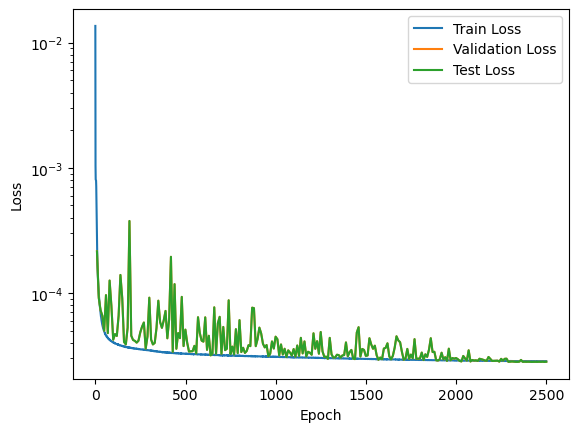

In [37]:
# Plotting
plt.plot(train_losses.numpy(), label='Train Loss')
plt.plot( np.arange(val_freq-1, num_epochs, val_freq),val_losses.numpy(), label='Validation Loss')
plt.plot(np.arange(test_freq-1, num_epochs, test_freq),test_losses.numpy(), label='Test Loss')
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

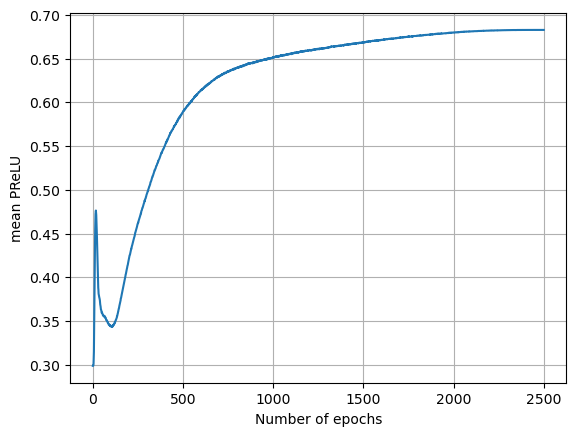

In [38]:
plt.plot(alphas.detach().numpy())
plt.xlabel('Number of epochs')
plt.ylabel('mean PReLU')    
plt.grid(True)
plt.show()

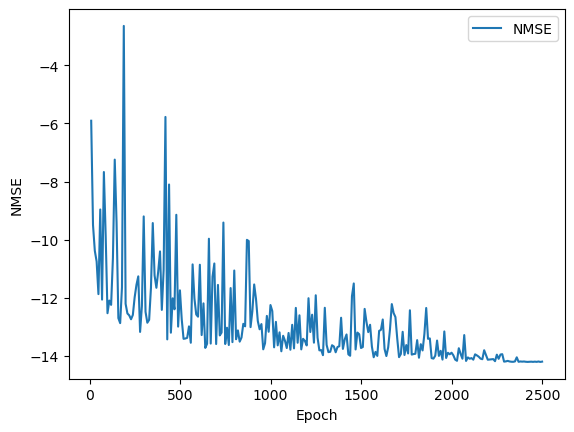

In [39]:
plt.plot(np.arange(test_freq-1, num_epochs, test_freq), test_nmses, label='NMSE')
plt.xlabel('Epoch')
plt.ylabel('NMSE')
plt.legend()
plt.show()

In [40]:
test_losses

tensor([2.1506e-04, 9.1276e-05, 7.2667e-05, 6.5709e-05, 5.0000e-05, 9.6050e-05,
        4.7699e-05, 1.2562e-04, 7.8558e-05, 4.2274e-05, 4.6910e-05, 4.5338e-05,
        6.5807e-05, 1.3922e-04, 9.0915e-05, 4.0583e-05, 3.8783e-05, 5.2853e-05,
        3.7594e-04, 4.5512e-05, 4.2088e-05, 4.1394e-05, 4.0074e-05, 4.1510e-05,
        4.8399e-05, 5.3808e-05, 5.8047e-05, 3.5900e-05, 4.4979e-05, 9.1649e-05,
        4.2442e-05, 3.8768e-05, 3.9836e-05, 5.2536e-05, 8.6697e-05, 5.8528e-05,
        5.2587e-05, 6.0333e-05, 7.1847e-05, 4.3398e-05, 6.1338e-05, 1.9448e-04,
        3.3899e-05, 1.1761e-04, 3.5790e-05, 4.7817e-05, 4.3514e-05, 9.3028e-05,
        3.7606e-05, 5.0902e-05, 3.9989e-05, 3.4012e-05, 3.4154e-05, 3.4224e-05,
        3.7766e-05, 3.2920e-05, 6.3957e-05, 4.7736e-05, 4.1567e-05, 4.0813e-05,
        6.3802e-05, 3.5099e-05, 4.5466e-05, 3.1692e-05, 3.2674e-05, 7.6725e-05,
        3.2732e-05, 5.7302e-05, 6.4418e-05, 3.2618e-05, 5.3494e-05, 3.4898e-05,
        3.5803e-05, 8.7329e-05, 3.2470e-

In [41]:
train_losses

tensor([1.3622e-02, 1.0404e-03, 8.0760e-04,  ..., 2.8486e-05, 2.8468e-05,
        2.8480e-05])

In [42]:
val_losses

tensor([2.1505e-04, 9.1273e-05, 7.2664e-05, 6.5706e-05, 4.9997e-05, 9.6047e-05,
        4.7697e-05, 1.2562e-04, 7.8556e-05, 4.2272e-05, 4.6909e-05, 4.5336e-05,
        6.5806e-05, 1.3922e-04, 9.0911e-05, 4.0582e-05, 3.8781e-05, 5.2851e-05,
        3.7593e-04, 4.5511e-05, 4.2086e-05, 4.1393e-05, 4.0073e-05, 4.1508e-05,
        4.8397e-05, 5.3806e-05, 5.8044e-05, 3.5899e-05, 4.4977e-05, 9.1647e-05,
        4.2441e-05, 3.8767e-05, 3.9834e-05, 5.2534e-05, 8.6694e-05, 5.8525e-05,
        5.2585e-05, 6.0330e-05, 7.1843e-05, 4.3397e-05, 6.1335e-05, 1.9448e-04,
        3.3898e-05, 1.1760e-04, 3.5789e-05, 4.7815e-05, 4.3512e-05, 9.3025e-05,
        3.7605e-05, 5.0902e-05, 3.9988e-05, 3.4011e-05, 3.4153e-05, 3.4223e-05,
        3.7765e-05, 3.2919e-05, 6.3954e-05, 4.7734e-05, 4.1566e-05, 4.0811e-05,
        6.3799e-05, 3.5098e-05, 4.5466e-05, 3.1691e-05, 3.2673e-05, 7.6723e-05,
        3.2731e-05, 5.7299e-05, 6.4415e-05, 3.2617e-05, 5.3491e-05, 3.4897e-05,
        3.5802e-05, 8.7326e-05, 3.2469e-